# **Arquitectura Predictiva de Diabetes Basada en Optimización Multi-Modelo y Aprendizaje Automático**

## **Análisis Exploratorio de Datos**

## **1. Introducción**


La diabetes es una de las enfermedades crónicas más prevalentes en los Estados Unidos y representa un problema significativo de salud pública a nivel mundial. Se trata de una condición metabólica caracterizada por niveles elevados de glucosa en sangre, producida cuando el organismo no genera insulina suficiente, no la produce en absoluto, o no la utiliza correctamente. La insulina, hormona secretada por el páncreas, permite que la glucosa ingrese a las células para ser aprovechada como energía; cuando este proceso falla, el azúcar se acumula en el torrente sanguíneo con consecuencias progresivamente graves.

A nivel nacional, más de 40 millones de estadounidenses viven con diabetes, y más de 1 de cada 4 adultos afectados desconoce su condición, lo que retrasa el diagnóstico y eleva el riesgo de complicaciones. La enfermedad figura como la séptima causa principal de muerte en el país y es el factor desencadenante más frecuente de insuficiencia renal, amputaciones de miembros inferiores y ceguera en adultos. En términos económicos, su costo ascendió a 640 mil millones de dólares en 2021, equivalente al 25% de todo el gasto en atención médica del país.
Frente a este panorama, el análisis exploratorio de los factores de riesgo asociados a la enfermedad se convierte en una herramienta clave para orientar estrategias preventivas. El presente estudio aborda esta problemática mediante el análisis del conjunto de datos BRFSS 2015, con el fin de identificar patrones poblacionales y asociaciones entre variables conductuales, clínicas y sociodemográficas con la presencia de diabetes.

## **2. Objetivo del análisis**


Desarrollar y optimizar modelos de clasificación para la detección temprana de diabetes y prediabetes en la población adulta de Estados Unidos, utilizando el conjunto de datos BRFSS 2015, mediante la aplicación de técnicas avanzadas de optimización de hiperparámetros y estrategias de manejo del desbalance de clases.

### **2.1 Objetivos específicos**
- Describir la distribución de la variable objetivo (presencia o ausencia de diabetes).
- Analizar el comportamiento individual de las variables numéricas y categóricas del conjunto de datos.
- Identificar patrones visuales y posibles asociaciones entre factores de riesgo (como índice de masa corporal, presión arterial, consumo de alcohol, actividad física, entre otros) y la diabetes.
- Comparar grupos poblacionales según características como edad, educación, ingreso y sexo.
- Detectar tendencias, contrastes y relaciones relevantes que aporten comprensión al fenómeno estudiado.
- Implementar y evaluar siete modelos de clasificación: K-Nearest Neighbors, Gaussian Naive Bayes, Regresión Logística con regularización L1 y L2, Decision Tree, Random Forest, XGBoost y Support Vector Machine; estableciendo un benchmark base para cada uno con hiperparámetros fijos.
Aplicar cuatro técnicas de balanceo de clases (sin balanceo, SMOTE, ADASYN y Class Weight) para mitigar el impacto del desbalance 6.18:1 presente en la variable objetivo.
- Optimizar los hiperparámetros de cada modelo mediante Grid Search, Random Search, Optimización Bayesiana (Optuna/TPE) y Algoritmos Genéticos (DEAP), garantizando la ausencia de data leakage mediante el encapsulamiento del preprocesamiento dentro del proceso de validación cruzada estratificada.
- Priorizar el recall como métrica principal de evaluación, dado el costo clínico asimétrico de los falsos negativos en el diagnóstico de diabetes.
- Reducir el costo computacional de cada modelo mediante técnicas específicas: algoritmos de búsqueda de vecinos (KD-Tree, Ball Tree, FAISS) para KNN, entrenamiento incremental con partial_fit para Naive Bayes, y tree_method='hist' con early stopping para XGBoost.
- Analizar la importancia de características mediante LIME para interpretar las predicciones de XGBoost a nivel local, identificando qué variables tienen mayor influencia en la detección de casos positivos.
- Comparar estadísticamente el rendimiento de los modelos mediante el test de DeLong para curvas ROC y bootstrap para intervalos de confianza de las métricas principales.

## **3. Propósito del estudio**

El propósito de este estudio es construir un sistema de detección temprana de diabetes y prediabetes mediante el desarrollo, optimización y comparación de modelos de clasificación supervisada aplicados al conjunto de datos BRFSS 2015. A través de técnicas avanzadas de optimización de hiperparámetros, manejo del desbalance de clases y optimización computacional, se busca maximizar la capacidad de los modelos para identificar correctamente los casos positivos, priorizando el recall como métrica clínica principal dado el alto costo asociado a los falsos negativos en el diagnóstico de enfermedades crónicas. Los resultados se validan estadísticamente mediante el test de DeLong y bootstrap, con el fin de garantizar que las diferencias de rendimiento entre modelos sean significativas y no producto del azar.

## **4. Marco Teórico**


### **La diabetes como enfermedad crónica y problema de salud pública**
La diabetes mellitus es una condición de origen multifactorial cuya prevalencia ha crecido de forma sostenida en las últimas décadas. Existen principalmente dos tipos: la diabetes tipo 1, de origen autoinmune, que representa entre el 5% y el 10% de los casos, y la diabetes tipo 2, asociada a factores conductuales y resistencia a la insulina, que concentra entre el 90% y el 95% de los diagnósticos. Esta última es la de mayor relevancia en términos de salud pública, dado que muchos de sus factores de riesgo son prevenibles o modificables. La enfermedad no solo compromete la calidad de vida del paciente, sino que también se vincula con un mayor riesgo de enfermedades cardiovasculares y ciertos tipos de cáncer, lo que amplía su impacto sobre el sistema de salud en su conjunto.

### **Factores de riesgo conductuales y sociodemográficos**
La literatura científica ha identificado de manera consistente un conjunto de variables asociadas al desarrollo de diabetes tipo 2. Entre los factores clínicos y conductuales destacan el índice de masa corporal elevado, la inactividad física, el tabaquismo, el consumo excesivo de alcohol, la hipertensión arterial y los niveles altos de colesterol. A estos se suman factores sociodemográficos como la edad, el nivel educativo, el ingreso económico y el sexo, los cuales condicionan tanto la exposición a los factores de riesgo como el acceso a servicios de salud y diagnóstico oportuno. La naturaleza conductual de muchos de estos factores los hace susceptibles de ser capturados mediante encuestas poblacionales y analizados estadísticamente para construir perfiles de riesgo.

### **El BRFSS como fuente de datos en salud pública**
El Behavioral Risk Factor Surveillance System (BRFSS) es el principal sistema nacional de encuestas telefónicas sobre salud, administrado por el CDC desde 1984. Opera en los 50 estados del país, el Distrito de Columbia y territorios participantes, completando más de 400.000 entrevistas anuales, lo que lo convierte en el sistema de vigilancia telefónica en salud más grande del mundo. Su cobertura temática incluye condiciones crónicas, comportamientos de riesgo, acceso a atención médica y uso de servicios preventivos, lo que lo posiciona como una fuente idónea para el estudio de enfermedades como la diabetes. Además, el BRFSS sirve como base para herramientas clave del CDC como el sistema PLACES, los Indicadores de Enfermedades Crónicas y el marco Healthy People 2030.

### **Análisis Exploratorio de Datos (EDA)**
El análisis exploratorio de datos, o EDA por sus siglas en inglés, es una etapa fundamental en cualquier proyecto de ciencia de datos. Propuesto originalmente por el estadístico John Tukey en 1977, consiste en examinar los datos de manera sistemática antes de aplicar modelos formales, con el objetivo de comprender su estructura, identificar patrones, detectar valores atípicos y evaluar la distribución de las variables. En el contexto de datos de salud, el EDA permite visualizar la relación entre variables clínicas y conductuales con la presencia de una enfermedad, orientando las decisiones metodológicas posteriores y garantizando la calidad del análisis.

### **Modelo de regresión logística**
La regresión logística es una técnica estadística de análisis de datos que utiliza relaciones matemáticas entre variables para predecir el valor de una variable dependiente a partir de una o más variables independientes. Está diseñada para situaciones donde el resultado tiene un número finito de categorías, típicamente dos: sí o no, presente o ausente, ocurre o no ocurre.
Su funcionamiento se basa en la función sigmoide, que transforma cualquier valor numérico en una probabilidad comprendida entre 0 y 1:
$$P(Y=1) = \frac{1}{1+e^{-(\beta_0 + \beta_1 X_1 + \cdots + \beta_n X_n)}}$$
Donde cada coeficiente β representa la contribución de cada variable independiente sobre la probabilidad del resultado. Estos coeficientes, al ser exponenciados, se interpretan directamente como odds ratios, lo que facilita la comprensión de la fuerza y dirección de cada asociación.
Dentro del campo del aprendizaje automático, la regresión logística destaca por su simplicidad matemática, su velocidad de procesamiento ante grandes volúmenes de datos, su flexibilidad para ser usada tanto como modelo predictivo final como herramienta de preprocesamiento, y su interpretabilidad, que permite comprender con claridad el peso de cada variable sobre el resultado predicho.

### **Odds y razón de momios**
El odds es un concepto estadístico que expresa la razón entre la probabilidad de que un evento ocurra y la probabilidad de que no ocurra. Formalmente, si p representa la probabilidad de que un evento suceda, el odds se define como:
$$Odds = \frac{p}{1-p}$$
Un odds mayor a 1 indica que el evento es más probable que su ausencia, mientras que un valor menor a 1 señala lo contrario. A partir de este concepto se deriva el Odds Ratio (OR), una medida estadística utilizada para cuantificar la asociación entre dos variables en estudios observacionales y ensayos clínicos. El OR compara los odds de un evento entre dos grupos distintos, permitiendo determinar la magnitud y dirección de dicha asociación. Un OR igual a 1 indica ausencia de asociación; un OR mayor a 1 sugiere una asociación positiva, y un OR menor a 1 indica una asociación negativa o protectora. Por esta razón, el OR es una herramienta ampliamente empleada en investigaciones médicas, epidemiológicas y de salud pública.

### **Algoritmo KNN**
El algoritmo de k-nearest neighbors (KNN) es un clasificador de aprendizaje supervisado no paramétrico, que emplea la proximidad para realizar clasificaciones o predicciones sobre la agrupación de un punto de datos individual. Es uno de los clasificadores de clasificación y regression más populares y sencillos que se emplean actualmente en machine learning.
Si bien el algoritmo KNN se puede usar para problemas de regresión o clasificación, generalmente se usa como un algoritmo de clasificación, partiendo del supuesto de que se pueden encontrar puntos similares cerca uno del otro.

### **Naive Bayes**
El clasificador Naive Bayes es un algoritmo de aprendizaje supervisado utilizado principalmente para tareas de clasificación. Se basa en el teorema de Bayes y asume que las variables son independientes entre sí, lo que permite calcular la probabilidad de que un dato pertenezca a una clase determinada. Es ampliamente utilizado en clasificación de textos, detección de spam y predicción de categorías.


### **Random forest**
Random forest, o bosque aleatorio, es un algoritmo de aprendizaje automático registrado por Leo Breiman y Adele Cutler que combina los resultados de múltiples árboles de decisión para producir un único resultado más preciso; su facilidad de uso y flexibilidad lo han convertido en una herramienta popular tanto para problemas de clasificación como de regresión. Los árboles de decisión que lo componen funcionan haciendo una serie de preguntas que dividen los datos en nodos hasta llegar a una decisión final en el nodo hoja, y se entrenan típicamente mediante el algoritmo CART, usando métricas como la impureza de Gini, la ganancia de información o el error cuadrático medio para evaluar la calidad de cada división. Aunque los árboles de decisión individuales son propensos a sesgos y sobreajuste, cuando se combinan en un bosque aleatorio con árboles no correlacionados entre sí, el conjunto logra predicciones significativamente más precisas y robustas.

### **Árbol de decisión**

Un árbol de decisión es un algoritmo de aprendizaje supervisado no paramétrico utilizado tanto para tareas de clasificación como de regresión. Su estructura se asemeja a un diagrama de flujo compuesto por un nodo raíz, ramas, nodos internos y nodos hoja, donde cada división representa una decisión basada en las características de los datos. El modelo funciona aplicando una estrategia de “divide y vencerás”, realizando divisiones sucesivas para crear subconjuntos cada vez más homogéneos hasta llegar a una predicción final. Los árboles de decisión son valorados por su facilidad de interpretación y visualización, ya que permiten comprender de manera clara cómo se toma una decisión dentro del modelo. Sin embargo, cuando el árbol crece demasiado, puede producirse sobreajuste, por lo que suelen emplearse técnicas como la poda y la validación cruzada para reducir la complejidad y mejorar el rendimiento del modelo.

### **Máquinas de vectores de soporte (SVM)**
Una máquina de vectores de soporte (SVM) es un algoritmo de machine learning supervisado desarrollado por Vladimir N. Vapnik y sus colegas en la década de 1990, que clasifica los datos buscando un hiperplano óptimo que maximice la distancia entre clases en un espacio N-dimensional; cuando los datos son linealmente separables, este hiperplano puede ser una línea en 2D o un plano en dimensiones superiores, y los puntos de datos más cercanos a él se denominan vectores de soporte, pues son los que determinan el margen máximo. Dado que maximizar dicho margen permite al modelo generalizar mejor ante datos nuevos, las SVM son especialmente valoradas por su precisión en tareas de clasificación. Cuando los datos no son separables linealmente, se recurre al llamado "truco de kernel", que consiste en aplicar funciones de núcleo —como los kernels lineal, polinómico, RBF o sigmoide— para transformar los datos a un espacio de mayor dimensión donde sí sea posible separar las clases linealmente, lo que convierte a las SVM en un algoritmo versátil capaz de abordar tanto problemas lineales como no lineales.

### **Regresión logística**
La regresión logística es un algoritmo de machine learning supervisado que, a diferencia de predecir valores continuos, se enfoca en clasificar resultados discretos o categóricos —como determinar si un préstamo es aprobado o no según variables como ingresos, ahorros y puntuación crediticia— lo que la convierte en uno de los algoritmos de clasificación más utilizados tanto en machine learning como en inteligencia artificial. Sus fundamentos matemáticos siguen siendo relevantes incluso en la era de la IA generativa, donde desempeñan un papel importante en la orquestación de modelos complejos de redes neuronales, y también mantiene vigencia en la investigación en ciencias sociales y del comportamiento como herramienta de análisis estadístico. Su implementación es accesible y práctica, pudiendo realizarse fácilmente a través del módulo scikit-learn en Python.

### **XGBoost**

XGBoost (eXtreme Gradient Boosting) es una biblioteca de aprendizaje automático de código abierto basada en árboles de decisión potenciados mediante gradiente, destacada por su alta velocidad, eficiencia y capacidad de escalabilidad en grandes volúmenes de datos. Entre sus principales características se encuentran la computación paralela y distribuida, un algoritmo optimizado que aprovecha la memoria caché para acelerar el procesamiento, la regularización integrada que mejora el rendimiento del modelo y la capacidad de manejar valores faltantes de forma eficiente, lo que la convierte en una herramienta robusta para problemas de aprendizaje supervisado.

### **Clases desequilibradas**

Los problemas de clasificación con clases desequilibradas (imbalanced data) ocurren cuando en un conjunto de datos una o más clases tienen muchas menos muestras que otras, como sucede en casos de detección de enfermedades o fraude, donde predominan los ejemplos negativos frente a pocos positivos. Este desbalance afecta el aprendizaje de los modelos, ya que tienden a favorecer la clase mayoritaria y a ignorar la minoritaria, lo que puede generar resultados engañosos, como altas tasas de acierto general pero bajo rendimiento en la detección de los casos más importantes.

### **Validación cruzada estratificada (k-fold)**

La validación cruzada K-fold estratificada es una técnica de evaluación de modelos que mantiene la proporción original de las clases en cada partición del conjunto de datos, lo que resulta especialmente útil en problemas de clasificación con datos desbalanceados. A diferencia de la división aleatoria tradicional, que puede generar conjuntos de entrenamiento y prueba con distribuciones desiguales, esta técnica asegura que cada pliegue refleje adecuadamente las clases, evitando resultados engañosos y permitiendo obtener métricas más confiables y representativas del desempeño real del modelo.

### **Pipeline**

Un pipeline de machine learning es un flujo de trabajo estructurado que organiza las etapas necesarias para desarrollar y poner en funcionamiento un modelo de aprendizaje automático de manera eficiente. Este proceso incluye tres fases principales: el procesamiento de datos (recolección, limpieza y preparación), el desarrollo del modelo (selección, entrenamiento y validación del algoritmo) y el despliegue (integración en producción y monitoreo). Los pipelines facilitan la automatización y gestión de estas etapas, siendo fundamentales dentro de las prácticas de MLOps.

### **La curva ROC (Receiver Operating Characteristic) y el AUC (Área Bajo la Curva)**

La curva ROC (Receiver Operating Characteristic) y el AUC (Área Bajo la Curva) son herramientas clave para evaluar modelos de clasificación binaria, ya que permiten analizar su rendimiento a través de distintos umbrales de decisión. Mientras que métricas como precisión o F1 se calculan en un único umbral, el AUC-ROC mide la capacidad del modelo para distinguir entre clases considerando todos los posibles umbrales, lo que lo hace especialmente útil en conjuntos de datos desbalanceados y en la comparación de distintos modelos.

### **Threshold tuning**

El threshold tuning (ajuste de umbral) es el proceso de modificar los valores límite que determinan cuándo se activa una decisión o alerta en un sistema o modelo, con el fin de optimizar su rendimiento. En el contexto de machine learning, implica ajustar el punto de corte de clasificación para equilibrar métricas como precisión y recall según las necesidades del problema. En sistemas como OMEGAMON, también se utiliza para controlar la recolección de datos y el uso de recursos, permitiendo definir distintos niveles de alerta (como advertencias o estados críticos) y mejorar la eficiencia operativa.

### **Smote(Synthetic Minority Oversampling Technique)**
SMOTE es una técnica de sobremuestreo diseñada para tratar datasets desbalanceados mediante la generación de nuevas muestras sintéticas de la clase minoritaria. Para cada instancia de la clase minoritaria, selecciona aleatoriamente uno de sus k vecinos más cercanos e interpola nuevos puntos entre ambos, creando datos artificiales en el espacio de características en lugar de simplemente duplicar observaciones existentes.

### **ADASYN (Adaptive Synthetic Sampling)**
ADASYN es una variante adaptativa de SMOTE que genera más muestras sintéticas en las regiones del espacio de características donde la clasificación es más difícil, es decir, cerca de la frontera de decisión entre clases. A diferencia de SMOTE, que distribuye el sobremuestreo de forma uniforme, ADASYN usa una distribución de densidad para determinar cuántas muestras sintéticas crear por cada instancia minoritaria, concentrando el esfuerzo donde el modelo más lo necesita.

### **Optimización Bayesiana-Optuna (TPE)**
La optimización bayesiana es una estrategia de búsqueda secuencial que construye un modelo probabilístico de la función objetivo para guiar la selección de los siguientes hiperparámetros a evaluar. Optuna implementa el algoritmo Tree-structured Parzen Estimator (TPE), que modela por separado la distribución de hiperparámetros que producen buenos resultados y los que producen malos, seleccionando nuevas configuraciones que maximizan la relación entre ambas distribuciones para converger más rápido que métodos aleatorios.

### **Algoritmos Genéticos-DEAP**
Los algoritmos genéticos son metaheurísticas inspiradas en la evolución biológica que optimizan una función objetivo mediante operadores de selección, cruce y mutación aplicados sobre una población de soluciones candidatas. En el contexto de optimización de hiperparámetros, cada individuo representa una configuración de parámetros, y la aptitud se evalúa mediante validación cruzada. DEAP (Distributed Evolutionary Algorithms in Python) es el framework que implementa estas primitivas evolutivas de forma flexible y paralelizable.

### **Data leakage (fuga de datos)**
El data leakage ocurre cuando información del conjunto de validación o prueba influye de manera inadvertida en el proceso de entrenamiento del modelo, produciendo estimaciones de rendimiento artificialmente optimistas que no se replican en producción. En el contexto de validación cruzada, el leakage más común sucede cuando el preprocesamiento como el escalado o el sobremuestreo se aplica sobre el dataset completo antes de dividirlo en folds, en lugar de ajustarse únicamente sobre los datos de entrenamiento de cada iteración.

### **Test de DeLong**
El test de DeLong es una prueba estadística no paramétrica que compara el AUC de dos curvas ROC obtenidas sobre el mismo conjunto de datos. Utiliza estadísticos U para estimar la covarianza entre los AUC de los modelos y deriva un valor z que permite determinar si la diferencia observada es estadísticamente significativa, con la ventaja de no requerir remuestreo y ser computacionalmente eficiente.

### **Bootstrap (intervalos de confianza)**
El bootstrap es una técnica de remuestreo estadístico que estima la distribución de una métrica de interés generando múltiples muestras con reemplazo del conjunto de datos original. En machine learning se utiliza para calcular intervalos de confianza de métricas como AUC, recall o F1, permitiendo cuantificar la incertidumbre asociada a las estimaciones de rendimiento de un modelo y comparar modelos más allá de sus valores puntuales.



## **5. Metodología**


### **5.1 Fuente de datos y descripción del dataset**
Para este estudio se empleó una versión procesada del dataset BRFSS 2015, compuesta por 253.680 observaciones y 21 variables predictoras. La variable objetivo es de naturaleza binaria e indica la presencia de diabetes o prediabetes (1) frente a su ausencia (0). Las variables del dataset abarcan tres dimensiones: indicadores clínicos como el índice de masa corporal (BMI), presión arterial y niveles de colesterol; factores conductuales como actividad física, consumo de alcohol y tabaquismo; y características sociodemográficas como edad, sexo, nivel educativo e ingreso.

### **5.2 Herramientas y entorno de trabajo**
El análisis fue desarrollado en Python, utilizando un entorno de Jupyter Notebook (.ipynb) con celdas de código y celdas de texto en formato Markdown para documentar el proceso de manera estructurada. Las librerías empleadas fueron Pandas y NumPy para la manipulación y exploración de datos, Matplotlib y Seaborn para la generación de visualizaciones, SciPy para la aplicación de pruebas estadísticas, Scikit-learn para la implementación de modelos de clasificación y validación cruzada, Imbalanced-learn para el manejo del desbalance de clases, XGBoost para el modelo de gradient boosting, Optuna para la optimización bayesiana, DEAP para los algoritmos genéticos, FAISS para la búsqueda eficiente de vecinos más cercanos, y LIME para la interpretabilidad local de los modelos.

### **5.3 Proceso de análisis**
El análisis se estructuró en las siguientes etapas:

1. Revisión general del dataset:
Se examinó la dimensión y estructura del conjunto de datos, se clasificaron las variables según su tipo (numéricas y categóricas), se verificó la ausencia de datos faltantes y registros duplicados, y se comprobaron los rangos esperados para detectar posibles inconsistencias o valores fuera de rango.
2. Detección de valores atípicos: 
Se identificaron observaciones extremas en las variables numéricas mediante análisis de distribución, evaluando su potencial impacto en los resultados del análisis.
3. Análisis univariado: Se describió el comportamiento individual de cada variable mediante estadísticos descriptivos y representaciones gráficas, lo que permitió comprender su distribución y frecuencia.
4. Análisis bivariado: Se evaluó la relación entre la variable objetivo y las variables del estudio. Para las variables numéricas continuas: BMI, salud mental (MentHlth) y salud física (PhysHlth), se compararon las distribuciones y medias entre los grupos con y sin diabetes mediante la prueba t de Welch, apropiada para muestras con varianzas desiguales. Dado el elevado tamaño muestral, la robustez de la prueba queda garantizada por el Teorema del Límite Central. Complementariamente, se calculó el estadístico Cohen's d para evaluar el tamaño del efecto y distinguir entre diferencias estadísticamente significativas y diferencias con relevancia práctica. Para las variables categóricas, se aplicó la prueba chi-cuadrado de independencia con el fin de evaluar la asociación estadística con la variable objetivo. Todas las comparaciones fueron apoyadas en representaciones gráficas como boxplots y curvas de densidad, que permiten visualizar la dispersión y la forma de la distribución en cada grupo.
5. Partición y validación cruzada: El dataset fue dividido en un conjunto de entrenamiento (80%) y uno de prueba (20%) mediante partición estratificada, preservando la proporción de clases en ambos subconjuntos. Para la evaluación de los modelos durante la optimización se empleó validación cruzada estratificada con 5 folds, garantizando que cada fold reflejara la distribución original de la variable objetivo.
6. Preprocesamiento: Se construyó un preprocesador mediante ColumnTransformer que aplica imputación por mediana y estandarización con StandardScaler a las variables numéricas continuas, imputación por mediana a las variables ordinales, e imputación por moda a las variables binarias. El preprocesador fue encapsulado dentro de un Pipeline de Scikit-learn para garantizar que el ajuste ocurra exclusivamente sobre los datos de entrenamiento en cada fold, evitando data leakage.
7. Modelado benchmark: Se implementaron siete modelos de clasificación con hiperparámetros fijos, KNN, Gaussian Naive Bayes, Regresión Logística L1 y L2, Decision Tree, Random Forest, XGBoost y SVM, como línea base de comparación. Cada modelo fue evaluado mediante validación cruzada y en el conjunto de prueba, reportando accuracy, precision, recall, F1 y AUC-ROC.
8. Manejo del desbalance de clases: Dado el desbalance de 6.18:1 entre clases, se evaluaron cuatro estrategias para cada modelo: sin balanceo, SMOTE, ADASYN y Class Weight. Las técnicas de sobremuestreo fueron aplicadas exclusivamente dentro del pipeline de validación cruzada para evitar contaminación del conjunto de validación.
9. Optimización de hiperparámetros: Para cada modelo se aplicaron cuatro métodos de optimización: Grid Search, Random Search, Optimización Bayesiana mediante Optuna con el algoritmo TPE, y Algoritmos Genéticos mediante DEAP. En todos los casos el preprocesamiento fue encapsulado dentro del proceso de validación, garantizando la ausencia de data leakage. La métrica principal de optimización fue el recall, dada la prioridad clínica de minimizar los falsos negativos.
10. Optimización computacional: Se implementaron técnicas específicas para reducir el costo computacional de cada modelo manteniendo o mejorando el desempeño: para KNN se compararon los algoritmos de búsqueda Brute Force, KD-Tree, Ball Tree y FAISS combinados con la mejor técnica de balanceo; para Gaussian Naive Bayes se implementó entrenamiento incremental mediante partial_fit con mini-batches; y para XGBoost se aplicó tree_method='hist' con early stopping para reducir el número de árboles necesarios.
11. Comparación estadística: El rendimiento final de los modelos fue comparado mediante el test de DeLong para evaluar si las diferencias en AUC entre pares de modelos son estadísticamente significativas, y mediante bootstrap con 1000 iteraciones para estimar intervalos de confianza al 95% para las métricas principales de cada modelo.


## **6. Carga y estructura del dataset**

Para la realización del análisis exploratorio se emplea el lenguaje de programación Python junto con las librerías especializadas en análisis y visualización de datos. Inicialmente, se cargan las librerías necesarias para la manipulación, análisis estadístico y representación gráfica de la información.

Posteriormente, se importa el conjunto de datos BRFSS 2015 desde un archivo en formato CSV, permitiendo su almacenamiento en una estructura tipo DataFrame que facilita la exploración y análisis de las variables. Esta etapa permite verificar la correcta lectura del archivo, reconocer la organización de las columnas y preparar el entorno para las fases posteriores del análisis exploratorio.

In [18]:
# Librerías importantes
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency

# Quitar mensajes de advertencia
import warnings
warnings.filterwarnings("ignore")

# Configuración estética
sns.set_theme(style="whitegrid")
df = pd.read_csv(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\archive (5)\diabetes_binary_health_indicators_BRFSS2015.csv", index_col=None)

#Colores a utilizar
coral = "#E2A8A4"
aqua = "#56D8CB"
colors = [aqua, coral]

In [19]:
#imports necesarios
import os
import time
import pickle
import random
import warnings
import joblib
import numpy as np
import pandas as pd
 
from sklearn.base import clone
from sklearn.pipeline import Pipeline
from sklearn.model_selection import (
    GridSearchCV, RandomizedSearchCV, cross_val_score
)
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score, average_precision_score,
    confusion_matrix, classification_report
)
 
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.pipeline import Pipeline as ImbPipeline
 
import optuna
from optuna.samplers import TPESampler
optuna.logging.set_verbosity(optuna.logging.WARNING)
 
from deap import base, creator, tools, algorithms
 
warnings.filterwarnings("ignore")
RANDOM_STATE = 42

### **6.1 Visualización inicial de los datos**

In [4]:
df.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


In [4]:
df.tail()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
253675,0.0,1.0,1.0,1.0,45.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,5.0,0.0,1.0,5.0,6.0,7.0
253676,1.0,1.0,1.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,4.0,0.0,0.0,1.0,0.0,11.0,2.0,4.0
253677,0.0,0.0,0.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,5.0,2.0
253678,0.0,1.0,0.0,1.0,23.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,7.0,5.0,1.0
253679,1.0,1.0,1.0,1.0,25.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,9.0,6.0,2.0


### **6.2 Dimensiones**

In [21]:
df.shape

(253680, 22)

In [20]:
df.columns

Index(['Diabetes_binary', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

El conjunto de datos presenta un total de **253.680 observaciones (filas)** y **22 variables (columnas)**. Cada fila representa un individuo encuestado dentro del sistema BRFSS 2015, mientras que las columnas corresponden a distintos indicadores relacionados con condiciones médicas, hábitos de vida, características sociodemográficas y estado general de salud.

El tamaño del dataset resulta considerablemente amplio, lo que permite realizar un análisis exploratorio robusto y facilita la identificación de patrones y tendencias dentro de la población estudiada. Asimismo, la cantidad de variables disponibles proporciona una visión multidimensional de los factores asociados a la salud, permitiendo analizar diferentes aspectos del bienestar físico y conductual de los individuos.

### **6.3 Estructura**

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_binary       253680 non-null  float64
 1   HighBP                253680 non-null  float64
 2   HighChol              253680 non-null  float64
 3   CholCheck             253680 non-null  float64
 4   BMI                   253680 non-null  float64
 5   Smoker                253680 non-null  float64
 6   Stroke                253680 non-null  float64
 7   HeartDiseaseorAttack  253680 non-null  float64
 8   PhysActivity          253680 non-null  float64
 9   Fruits                253680 non-null  float64
 10  Veggies               253680 non-null  float64
 11  HvyAlcoholConsump     253680 non-null  float64
 12  AnyHealthcare         253680 non-null  float64
 13  NoDocbcCost           253680 non-null  float64
 14  GenHlth               253680 non-null  float64
 15  

Aunque todas las variables se encuentran almacenadas como valores numéricos, es importante destacar que varias de ellas representan **variables categóricas binarias u ordinales codificadas numéricamente**. Esta codificación facilita el análisis estadístico y la visualización, pero requiere una interpretación adecuada según el significado conceptual de cada variable.

### **6.4 Clasificación de variables**

Aunque `df.info()` muestra que la mayoría de columnas están almacenadas como valores numéricos, esto no significa que todas deban interpretarse como variables numéricas continuas. En este conjunto de datos, varias columnas representan respuestas categóricas binarias codificadas como 0/1 (por ejemplo, Smoker, HighBP, Stroke), mientras que otras representan escalas ordinales (por ejemplo, GenHlth, Education, Income, Age), donde el orden de los valores tiene significado pero no necesariamente una distancia numérica “real” entre categorías.

Para fines de visualización y análisis exploratorio, clasificamos las variables según su naturaleza conceptual y las convertimos a su tipo adecuado, esto para mejorar la interpretación de gráficos, facilitar cálculos descriptivos y evitar tratamientos incorrectos (por ejemplo, interpretar un 0/1 como una variable continua)Aunque muchas variables aparecen como numéricas (int64), varias de ellas representan categorías binarias (0/1), por lo que conceptualmente son variables categóricas.

#### **6.4.2 Definir variables numéricas, binarias y ordinales**

Se realiza una clasificación conceptual en tres grupos: variables numéricas (magnitud), ordinales (escala ordenada) y binarias (presencia/ausencia). Esta distinción mejora la selección de gráficos y evita interpretaciones incorrectas.

In [23]:
Objetivo = "Diabetes_binary"


binary_cols = []
for col in df.columns:
    unique_vals = set(df[col].dropna().unique())
    if unique_vals.issubset({0, 1, 0.0, 1.0}) and len(unique_vals) <= 2:
        binary_cols.append(col)
        
# Binarias conceptuales: detectadas automáticamente, excluyendo target
binary_feature_cols = [c for c in binary_cols if c != Objetivo]

numeric_cols = ["BMI", "MentHlth", "PhysHlth"]
ordinal_cols = ["GenHlth", "Age", "Education", "Income"]



# Validación rápida
print("Objetivo:", Objetivo)
print("Numéricas:", numeric_cols)
print("Ordinales:", ordinal_cols)
print("Binarias:", binary_feature_cols)

Objetivo: Diabetes_binary
Numéricas: ['BMI', 'MentHlth', 'PhysHlth']
Ordinales: ['GenHlth', 'Age', 'Education', 'Income']
Binarias: ['HighBP', 'HighChol', 'CholCheck', 'Smoker', 'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'DiffWalk', 'Sex']


#### **6.4.3 Conversión de los tipos**

Con el fin de garantizar coherencia semántica y mejorar la interpretabilidad de las visualizaciones, se realizó una reclasificación conceptual de las variables en una copia del dataset (`df_viz`). Las variables binarias fueron transformadas en categorías con etiquetas descriptivas completas (por ejemplo, “Con hipertensión” / “Sin hipertensión”), evitando el uso genérico de “Sí/No”.

Las variables ordinales (GenHlth, Age, Education e Income) fueron convertidas a categorías ordenadas, preservando su jerarquía natural. Además, los códigos correspondientes a respuestas faltantes o no informadas (por ejemplo, 77 y 99 en Income, 99 en Age) fueron tratados explícitamente como valores perdidos (NA).

Esta transformación no altera la información original, sino que optimiza la claridad analítica y la calidad de las representaciones gráficas, facilitando una interpretación más precisa de los patrones observados en el análisis exploratorio.

In [103]:

df_viz = df.copy()  #copiamos el trabajo para no tocar el df original


# 1. Variable objetivo
df_viz["Diabetes_binary"] = df_viz["Diabetes_binary"].map({
    0: "Sin diabetes",
    1: "Prediabetes / Diabetes"
}).astype("category")



# 2. Variables binarias médicas y comportamentales
binary_mappings = {

    "HighBP": {0: "Sin hipertensión", 1: "Con hipertensión"},
    "HighChol": {0: "Sin colesterol alto", 1: "Con colesterol alto"},
    "CholCheck": {0: "Sin chequeo en 5 años", 1: "Con chequeo en 5 años"},
    "Smoker": {0: "No fumador", 1: "Fumador"},
    "Stroke": {0: "Sin ACV", 1: "Con ACV"},
    "HeartDiseaseorAttack": {0: "Sin enfermedad cardíaca", 1: "Con enfermedad cardíaca"},
    "PhysActivity": {0: "Sin actividad física", 1: "Con actividad física"},
    "Fruits": {0: "No consume frutas diario", 1: "Consume frutas diario"},
    "Veggies": {0: "No consume verduras diario", 1: "Consume verduras diario"},
    "HvyAlcoholConsump": {0: "No consumo alto alcohol", 1: "Consumo alto alcohol"},
    "AnyHealthcare": {0: "Sin cobertura médica", 1: "Con cobertura médica"},
    "NoDocbcCost": {0: "Sin barrera económica", 1: "Con barrera económica"},
    "DiffWalk": {0: "Sin dificultad al caminar", 1: "Con dificultad al caminar"},
    "Sex": {0: "Mujer", 1: "Hombre"}
}

for col, mapping in binary_mappings.items():
    df_viz[col] = df_viz[col].map(mapping).astype("category")


# VARIABLES ESPECIALES:

# 3. GenHlth (ordinal 1–5)
df_viz["GenHlth"] = df_viz["GenHlth"].map({
    1: "Excelente",
    2: "Muy buena",
    3: "Buena",
    4: "Regular",
    5: "Mala"
}).astype("category")

df_viz["GenHlth"] = df_viz["GenHlth"].cat.reorder_categories(
    ["Excelente", "Muy buena", "Buena", "Regular", "Mala"],
    ordered=True
)


# 4. Age (1–13, 99 = Missing)
df_viz["Age"] = df_viz["Age"].replace(99, pd.NA)

age_mapping = {
    1: "18–24",
    2: "25–29",
    3: "30–34",
    4: "35–39",
    5: "40–44",
    6: "45–49",
    7: "50–54",
    8: "55–59",
    9: "60–64",
    10: "65–69",
    11: "70–74",
    12: "75–79",
    13: "80+"
}

df_viz["Age"] = df_viz["Age"].map(age_mapping).astype("category")

df_viz["Age"] = df_viz["Age"].cat.reorder_categories(
    list(age_mapping.values()),
    ordered=True
)

# 5. Education (1–6)
education_mapping = {
    1: "Nunca asistió",
    2: "Primaria incompleta",
    3: "Secundaria incompleta",
    4: "Secundaria completa / GED",
    5: "Universidad incompleta",
    6: "Universidad completa"
}

df_viz["Education"] = df_viz["Education"].map(education_mapping).astype("category")

df_viz["Education"] = df_viz["Education"].cat.reorder_categories(
    list(education_mapping.values()),
    ordered=True
)


# 7. Income (1–8, 77 y 99 = Missing)
df_viz["Income"] = df_viz["Income"].replace({77: pd.NA, 99: pd.NA})

income_mapping = {
    1: "< $10,000",
    2: "$10,000–15,000",
    3: "$15,000–20,000",
    4: "$20,000–25,000",
    5: "$25,000–35,000",
    6: "$35,000–50,000",
    7: "$50,000–75,000",
    8: "$75,000+"
}

df_viz["Income"] = df_viz["Income"].map(income_mapping).astype("category")

df_viz["Income"] = df_viz["Income"].cat.reorder_categories(
    list(income_mapping.values()),
    ordered=True
)


# Verificación final
df_viz.info()

#Para probar una en particular
df_viz["Sex"].dtype

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   Diabetes_binary       253680 non-null  category
 1   HighBP                253680 non-null  category
 2   HighChol              253680 non-null  category
 3   CholCheck             253680 non-null  category
 4   BMI                   253680 non-null  float64 
 5   Smoker                253680 non-null  category
 6   Stroke                253680 non-null  category
 7   HeartDiseaseorAttack  253680 non-null  category
 8   PhysActivity          253680 non-null  category
 9   Fruits                253680 non-null  category
 10  Veggies               253680 non-null  category
 11  HvyAlcoholConsump     253680 non-null  category
 12  AnyHealthcare         253680 non-null  category
 13  NoDocbcCost           253680 non-null  category
 14  GenHlth               253680 non-nul

CategoricalDtype(categories=['Hombre', 'Mujer'], ordered=False, categories_dtype=object)

#### **6.4.4 Diccionario de datos/Operacionalización de las variables**

Con el fin de documentar el conjunto de datos y facilitar la interpretación de las visualizaciones, se construyó un diccionario de datos que resume para cada variable su rol (objetivo o característica), su tipo conceptual (binaria, numérica u ordinal), su codificación y una breve descripción basada en el codebook del BRFSS.


In [9]:
data_dictionary = [

    # Target
    {"Variable": "Diabetes_binary",
     "Rol": "Target",
     "Tipo": "Binaria (categórica)",
     "Codificación": "Sin diabetes / Prediabetes–Diabetes",
     "Descripción": "Indicador de presencia de diabetes o prediabetes"},

    # Binarias médicas y comportamentales
    {"Variable": "HighBP",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "Sin hipertensión / Con hipertensión",
     "Descripción": "Diagnóstico de hipertensión arterial"},

    {"Variable": "HighChol",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "Sin colesterol alto / Con colesterol alto",
     "Descripción": "Diagnóstico de colesterol elevado"},

    {"Variable": "CholCheck",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "Sin chequeo en 5 años / Con chequeo en 5 años",
     "Descripción": "Realizó chequeo de colesterol en los últimos 5 años"},

    {"Variable": "Smoker",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "No fumador / Fumador",
     "Descripción": "Ha fumado al menos 100 cigarrillos en su vida"},

    {"Variable": "Stroke",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "Sin ACV / Con ACV",
     "Descripción": "Antecedente de accidente cerebrovascular"},

    {"Variable": "HeartDiseaseorAttack",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "Sin enfermedad cardíaca / Con enfermedad cardíaca",
     "Descripción": "Diagnóstico de enfermedad coronaria o infarto"},

    {"Variable": "PhysActivity",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "Sin actividad física / Con actividad física",
     "Descripción": "Actividad física en los últimos 30 días (excluye trabajo)"},

    {"Variable": "Fruits",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "No consume frutas diario / Consume frutas diario",
     "Descripción": "Consumo diario de frutas"},

    {"Variable": "Veggies",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "No consume verduras diario / Consume verduras diario",
     "Descripción": "Consumo diario de verduras"},

    {"Variable": "HvyAlcoholConsump",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "No consumo alto alcohol / Consumo alto alcohol",
     "Descripción": "Consumo elevado de alcohol según criterio BRFSS"},

    {"Variable": "AnyHealthcare",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "Sin cobertura médica / Con cobertura médica",
     "Descripción": "Cuenta con seguro o cobertura médica"},

    {"Variable": "NoDocbcCost",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "Sin barrera económica / Con barrera económica",
     "Descripción": "No pudo consultar médico por razones económicas"},

    {"Variable": "DiffWalk",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "Sin dificultad al caminar / Con dificultad al caminar",
     "Descripción": "Dificultad para caminar o subir escaleras"},

    {"Variable": "Sex",
     "Rol": "Feature",
     "Tipo": "Binaria (categórica)",
     "Codificación": "Mujer / Hombre",
     "Descripción": "Sexo biológico del encuestado"},


    # Numéricas reales
    {"Variable": "BMI",
     "Rol": "Feature",
     "Tipo": "Numérica continua",
     "Codificación": "Valor numérico",
     "Descripción": "Índice de Masa Corporal"},

    {"Variable": "MentHlth",
     "Rol": "Feature",
     "Tipo": "Numérica discreta",
     "Codificación": "0–30 días",
     "Descripción": "Número de días con mala salud mental en los últimos 30 días"},

    {"Variable": "PhysHlth",
     "Rol": "Feature",
     "Tipo": "Numérica discreta",
     "Codificación": "0–30 días",
     "Descripción": "Número de días con mala salud física en los últimos 30 días"},


    # Ordinales
    {"Variable": "GenHlth",
     "Rol": "Feature",
     "Tipo": "Ordinal (categórica ordenada)",
     "Codificación": "Excelente / Muy buena / Buena / Regular / Mala",
     "Descripción": "Autopercepción del estado general de salud"},

    {"Variable": "Age",
     "Rol": "Feature",
     "Tipo": "Ordinal (categórica ordenada)",
     "Codificación": "18–24 … 80+",
     "Descripción": "Categoría de edad (13 grupos ordenados)"},

    {"Variable": "Education",
     "Rol": "Feature",
     "Tipo": "Ordinal (categórica ordenada)",
     "Codificación": "Nunca asistió … Universidad completa",
     "Descripción": "Nivel educativo del encuestado"},

    {"Variable": "Income",
     "Rol": "Feature",
     "Tipo": "Ordinal (categórica ordenada)",
     "Codificación": "< $10,000 … $75,000+",
     "Descripción": "Categoría de ingresos anuales del hogar"}
]

dic_df = pd.DataFrame(data_dictionary)

dic_df.style \
    .hide(axis="index") \
    .set_properties(**{"text-align": "left"}) \
    .set_table_styles([
        {"selector": "th", "props": [("text-align", "left"), ("font-weight", "bold")]}
    ])

Variable,Rol,Tipo,Codificación,Descripción
Diabetes_binary,Target,Binaria (categórica),Sin diabetes / Prediabetes–Diabetes,Indicador de presencia de diabetes o prediabetes
HighBP,Feature,Binaria (categórica),Sin hipertensión / Con hipertensión,Diagnóstico de hipertensión arterial
HighChol,Feature,Binaria (categórica),Sin colesterol alto / Con colesterol alto,Diagnóstico de colesterol elevado
CholCheck,Feature,Binaria (categórica),Sin chequeo en 5 años / Con chequeo en 5 años,Realizó chequeo de colesterol en los últimos 5 años
Smoker,Feature,Binaria (categórica),No fumador / Fumador,Ha fumado al menos 100 cigarrillos en su vida
Stroke,Feature,Binaria (categórica),Sin ACV / Con ACV,Antecedente de accidente cerebrovascular
HeartDiseaseorAttack,Feature,Binaria (categórica),Sin enfermedad cardíaca / Con enfermedad cardíaca,Diagnóstico de enfermedad coronaria o infarto
PhysActivity,Feature,Binaria (categórica),Sin actividad física / Con actividad física,Actividad física en los últimos 30 días (excluye trabajo)
Fruits,Feature,Binaria (categórica),No consume frutas diario / Consume frutas diario,Consumo diario de frutas
Veggies,Feature,Binaria (categórica),No consume verduras diario / Consume verduras diario,Consumo diario de verduras


## **7. Limpieza y Verificación de Calidad de los Datos**

Antes de proceder con el análisis descriptivo y las visualizaciones, es fundamental verificar la calidad del conjunto de datos. Esta etapa permite identificar posibles inconsistencias, valores faltantes, duplicaciones o errores en los rangos de las variables, garantizando que los resultados posteriores sean confiables y correctamente interpretados.

### **7.1 Identificación de valores faltantes**

In [10]:
# Conteo absoluto de valores faltantes
df.isnull().sum().to_frame(name='Valores Nulos')

,Valores Nulos
Diabetes_binary,0
HighBP,0
HighChol,0
CholCheck,0
BMI,0
Smoker,0
Stroke,0
HeartDiseaseorAttack,0
PhysActivity,0
Fruits,0


In [11]:
# Porcentaje de valores faltantes
pd.DataFrame({
    'Porcentaje Nulos (%)': (df.isnull().mean() * 100).round(4)
})

,Porcentaje Nulos (%)
Diabetes_binary,0.0
HighBP,0.0
HighChol,0.0
CholCheck,0.0
BMI,0.0
Smoker,0.0
Stroke,0.0
HeartDiseaseorAttack,0.0
PhysActivity,0.0
Fruits,0.0


Se realizó una verificación de valores faltantes mediante el método `isnull()`. Los resultados muestran que ninguna variable presenta valores nulos, lo cual indica que el conjunto de datos se encuentra completo y no requiere imputación ni eliminación de registros por este motivo.

### **7.2 Revisión de registros duplicados**

In [12]:
duplicados = df.duplicated().sum()
duplicados

24206

In [13]:
df[df.duplicated()]

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
1242,1.0,1.0,1.0,1.0,27.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,0.0,30.0,1.0,0.0,10.0,4.0,5.0
1563,0.0,0.0,0.0,1.0,21.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,6.0,8.0
2700,0.0,0.0,0.0,1.0,32.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,5.0,6.0,8.0
3160,0.0,0.0,0.0,1.0,21.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,6.0,8.0
3332,0.0,0.0,0.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,9.0,6.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253492,1.0,1.0,1.0,1.0,33.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,9.0,6.0,6.0
253550,0.0,0.0,0.0,1.0,25.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,7.0,6.0,8.0
253563,0.0,0.0,1.0,1.0,24.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,1.0,8.0,6.0,8.0
253597,0.0,0.0,0.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,5.0,6.0,8.0


In [14]:
total_filas = len(df_viz)
propor_dupli = (duplicados/total_filas)*100
propor_dupli

9.541942604856512

**NOTA:** La verificación de registros duplicados identificó 24.206 observaciones completamente idénticas, lo que representa aproximadamente el 9.5% del total de registros. Sin embargo, dado que el dataset contiene un identificador único por individuo (ID), el cual fue excluido al importar los datos, y que se trata de datos provenientes de una encuesta poblacional con variables mayoritariamente categóricas y discretas, es plausible que múltiples individuos compartan exactamente el mismo patrón de respuestas. Por lo tanto, estos registros no se consideran errores estructurales y no fueron eliminados del análisis, ya que representan individuos distintos con características similares.

### **7.3 Verificación de rangos esperados**

#### **7.3.1 Variables binarias**

Estas deberían contener exclusivamente valores 0 y 1.

In [15]:
# Acá se verifica si los datos no tienen valores diferentes a su categoría
binary_cols_original = binary_cols #tambien se puede utilizar binary_mappings

for col in binary_cols_original:
    print(col, sorted(df[col].unique()))

Diabetes_binary [0.0, 1.0]
HighBP [0.0, 1.0]
HighChol [0.0, 1.0]
CholCheck [0.0, 1.0]
Smoker [0.0, 1.0]
Stroke [0.0, 1.0]
HeartDiseaseorAttack [0.0, 1.0]
PhysActivity [0.0, 1.0]
Fruits [0.0, 1.0]
Veggies [0.0, 1.0]
HvyAlcoholConsump [0.0, 1.0]
AnyHealthcare [0.0, 1.0]
NoDocbcCost [0.0, 1.0]
DiffWalk [0.0, 1.0]
Sex [0.0, 1.0]


Se verificó que las variables binarias únicamente contuvieran valores dentro del rango esperado {0, 1}. No se encontraron valores fuera de esta codificación, lo que confirma la consistencia de las variables dicotómicas.

#### **7.3.2 Variables ordinales**

In [16]:
ordinal_ranges = {
    "GenHlth": (1, 5),
    "Education": (1, 6),
    "Income": (1, 8),
    "Age": (1, 13)
}

for col, (min_val, max_val) in ordinal_ranges.items():
    print(col, "min:", df[col].min(), "max:", df[col].max())

GenHlth min: 1.0 max: 5.0
Education min: 1.0 max: 6.0
Income min: 1.0 max: 8.0
Age min: 1.0 max: 13.0


Las variables ordinales fueron verificadas para asegurar que sus valores se encuentren dentro de los rangos definidos por el instrumento BRFSS. Los valores mínimos y máximos observados coinciden con los límites esperados, por lo que no se detectaron inconsistencias.

#### **7.3.3 Variables numéricas**

In [17]:
df[numeric_cols].mean()

# Resumen descriptivo  de edad según la suscripcion solo una variable
numeric_check = df[numeric_cols].agg([
    'min',
    'max'
]).round(2)

# Calcular rango explícitamente
numeric_check.loc["rango"] = (
    numeric_check.loc["max"] - numeric_check.loc["min"]
)

# Renombrar filas
numeric_check.index = [
    "Mínimo",
    "Máximo",
    "Rango"
]



numeric_check

,BMI,MentHlth,PhysHlth
Mínimo,12.0,0.0,0.0
Máximo,98.0,30.0,30.0
Rango,86.0,30.0,30.0


Se realizó una verificación de rangos esperados para las variables numéricas continuas y discretas. Se analizaron los valores mínimo y máximo, así como el rango observado. Los resultados confirman que las variables BMI, MentHlth y PhysHlth se encuentran dentro de los límites teóricamente esperados (BMI: 12–98; salud física y mental: 0–30 días), sin evidencia de valores fuera de dominio.

En conjunto, el dataset presenta una alta calidad estructural: no se identificaron valores faltantes, duplicados ni inconsistencias en los rangos esperados de las variables. Esto permite proceder con el análisis exploratorio con un alto grado de confianza en la integridad de la información.

### **7.4 Valores atípicos**

In [18]:
import pandas as pd
import numpy as np

def resumen_outliers(df_viz):
    resultados = []
    
    numericas = df_viz.select_dtypes(include=np.number).columns
    
    for col in numericas:
        Q1 = df_viz[col].quantile(0.25)
        Q3 = df_viz[col].quantile(0.75)
        IQR = Q3 - Q1
        
        limite_inf = Q1 - 1.5 * IQR
        limite_sup = Q3 + 1.5 * IQR
        
        outliers = df_viz[(df_viz[col] < limite_inf) | (df_viz[col] > limite_sup)]
        
        resultados.append({
            "Variable": col,
            "Q1": round(Q1,2),
            "Q3": round(Q3,2),
            "IQR": round(IQR,2),
            "Límite inferior": round(limite_inf,2),
            "Límite superior": round(limite_sup,2),
            "N° Outliers": len(outliers),
            "% Outliers": round(len(outliers)/len(df)*100, 2)
        })
    
    return (
    pd.DataFrame(resultados)
    .sort_values("% Outliers", ascending=False)
    .reset_index(drop=True)
)
   

tabla_outliers = resumen_outliers(df_viz)
tabla_outliers

,Variable,Q1,Q3,IQR,Límite inferior,Límite superior,N° Outliers,% Outliers
0,PhysHlth,0.0,3.0,3.0,-4.5,7.5,40949,16.14
1,MentHlth,0.0,2.0,2.0,-3.0,5.0,36208,14.27
2,BMI,24.0,31.0,7.0,13.5,41.5,9847,3.88


Se realizó la detección de valores atípicos en las variables numéricas mediante el criterio del rango intercuartílico ``(IQR)``. Los resultados evidencian que las variables relacionadas con el número de días de mala salud física (PhysHlth) y mala salud mental (MentHlth) presentan la mayor proporción de valores atípicos (16.14% y 14.27%, respectivamente). Este comportamiento se explica por la naturaleza discreta y asimétrica de estas variables, que concentran una alta proporción de observaciones en valores bajos (especialmente en 0 días) y presentan una cola extendida hacia valores altos.

En el caso del Índice de Masa Corporal (BMI), se identificó un 3.88% de valores atípicos, correspondientes principalmente a niveles elevados del índice, clínicamente asociados a obesidad severa.

La variable Age_code no presentó valores atípicos bajo el criterio IQR, lo cual es consistente con su naturaleza ordinal y rango acotado.

NOTA: El análisis de valores atípicos se realizó únicamente sobre variables numéricas continuas o de conteo (BMI, PhysHlth, MentHlth y Age_code), dado que el criterio del rango intercuartílico no es apropiado para variables categóricas, binarias u ordinales. Variables como Diabetes_binary, GenHlth o Education representan categorías discretas sin continuidad numérica real, por lo que la detección de outliers en estos casos carece de interpretación estadística válida.

## **8. Resumen estadístico**

In [19]:
# descriptivo edad según la suscripcion varias variable
df[numeric_cols].mean()

# Resumen descriptivo  de edad según la suscripcion solo una variable
var_num_cat = df[numeric_cols].agg([
    'mean',
    'std',
    'min',
    'max',
    'median',
    lambda x: x.quantile(0.25),
    lambda x: x.quantile(0.75)
]).round(2)

# Renombrar filas
var_num_cat.index = [
    "Media",
    "Desviación estándar",
    "Mínimo",
    "Máximo",
    "Mediana",
    "Percentil 25%",
    "Percentil 75%"
]

var_num_cat

,BMI,MentHlth,PhysHlth
Media,28.38,3.18,4.24
Desviación estándar,6.61,7.41,8.72
Mínimo,12.00,0.00,0.00
Máximo,98.00,30.00,30.00
Mediana,27.00,0.00,0.00
Percentil 25%,24.00,0.00,0.00
Percentil 75%,31.00,2.00,3.00


El Índice de Masa Corporal `BMI` presenta una media de 28.38 y una mediana de 27.00, lo que sugiere una ligera asimetría positiva. El rango observado (12.00 – 98.00) indica una amplitud considerable, con presencia de valores elevados que pueden influir en la media. El percentil 25 (24.00) y el percentil 75 (31.00) muestran que el 50% central de la población se encuentra dentro de un intervalo relativamente concentrado, lo que sugiere variabilidad moderada.

En el caso de `MentHlth` (días de mala salud mental), la media es 3.18 días, mientras que la mediana es 0.00 días. Este contraste indica que más de la mitad de los individuos no reportaron días de mala salud mental en los últimos 30 días, pero existe un subconjunto que sí reporta valores altos, generando una distribución asimétrica hacia la derecha.

De manera similar, `PhysHlth` presenta una media de 4.24 días y una mediana de 0.00 días. La diferencia entre media y mediana evidencia también una fuerte asimetría positiva, con concentración de valores en cero y presencia de casos con múltiples días reportados.

En conjunto, las variables de salud física y mental muestran distribuciones altamente concentradas en cero, con colas hacia valores superiores, mientras que el BMI presenta mayor dispersión y variabilidad continua.

### **8.1 Asimetría y curtosis**

In [20]:
skew_kurt = df[numeric_cols].agg([
    "skew",
    "kurt"
]).round(2)

skew_kurt.index = ["Asimetría", "Curtosis"]

skew_kurt

,BMI,MentHlth,PhysHlth
Asimetría,2.12,2.72,2.21
Curtosis,11.00,6.44,3.50


Todas las variables presentan asimetría positiva considerable (valores mayores a 2), lo que indica que sus distribuciones se encuentran sesgadas hacia la derecha. Esto significa que existe una concentración elevada de observaciones en valores bajos, acompañada de una cola extendida hacia valores superiores. Este patrón es particularmente evidente en MentHlth (2.72), lo que confirma la fuerte acumulación de individuos que reportan cero días de mala salud mental, junto con un subconjunto más reducido que reporta valores altos.

En el caso de BMI (2.12), la asimetría positiva sugiere la presencia de valores elevados que desplazan la media por encima de la mediana, lo cual es coherente con la amplitud observada en el rango y con la posible existencia de individuos con obesidad severa.

Respecto a la curtosis, los valores obtenidos indican que las tres variables presentan distribuciones leptocúrticas (curtosis > 0 bajo definición de Fisher utilizada por pandas), especialmente BMI (11.00). Esto implica que las distribuciones tienen colas pesadas y mayor concentración de valores extremos en comparación con una distribución normal. MentHlth (6.44) y PhysHlth (3.50) también muestran colas pronunciadas, aunque en menor medida.

En conjunto, estos resultados confirman que ninguna de las variables numéricas sigue una distribución aproximadamente normal. Las distribuciones se caracterizan por alta concentración en valores bajos y presencia de observaciones extremas, lo que justifica el uso de visualizaciones robustas (como histogramas y diagramas de caja) y medidas basadas en percentiles para el análisis posterior.

## **9. Variable objetivo: Diagnóstico de diabetes**

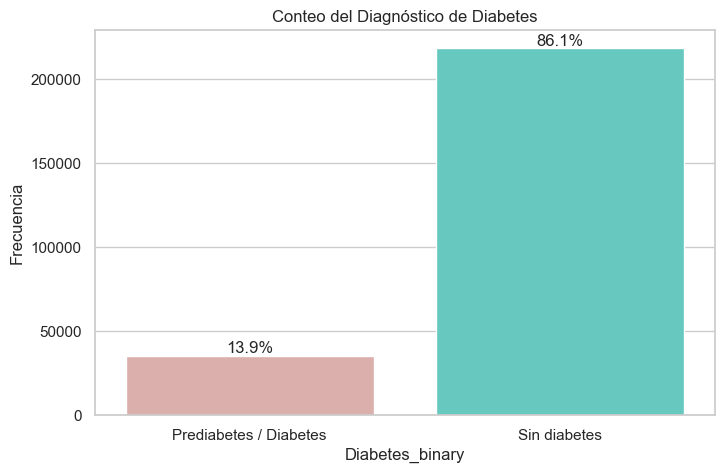

In [21]:
plt.figure(figsize=(8,5))

ax = sns.countplot(
    x='Diabetes_binary',
    data=df_viz,
    palette=["#E2A8A4","#56D8CB"]
)

total = len(df_viz)

for p in ax.patches:
    percentage = f'{100 * p.get_height()/total:.1f}%'
    ax.annotate(
        percentage,
        (p.get_x()+p.get_width()/2, p.get_height()),
        ha='center',
        va='bottom'
    )

plt.title("Conteo del Diagnóstico de Diabetes")
plt.xlabel("Diabetes_binary")
plt.ylabel("Frecuencia")

plt.show()

La variable Diagnóstico de Diabetes, que constituye el desenlace principal del estudio, muestra que el 13.93% (n = 35,346) de los individuos presenta diagnóstico de diabetes, mientras que el 86.07% (n = 218,334) no reporta esta condición.

Desde una perspectiva epidemiológica, la prevalencia observada resulta consistente con patrones poblacionales de diabetes mellitus tipo 2 en población adulta, especialmente en contextos donde predominan grupos etarios intermedios y avanzados, como se evidenció previamente en la distribución por edad del dataset.

## **10. Análisis univariado**

El análisis univariado tiene como objetivo examinar cada variable de manera individual para comprender su distribución, comportamiento y características principales. En esta sección se describen medidas de tendencia central, dispersión y forma en variables numéricas, así como frecuencias y proporciones en variables categóricas. Este análisis permite identificar posibles valores atípicos, asimetrías, patrones dominantes y calidad de los datos, constituyendo la base para interpretaciones posteriores y para la construcción del análisis bivariado y multivariado.

### **10.1. Variables demográficas**

#### **10.1.1. Sexo**

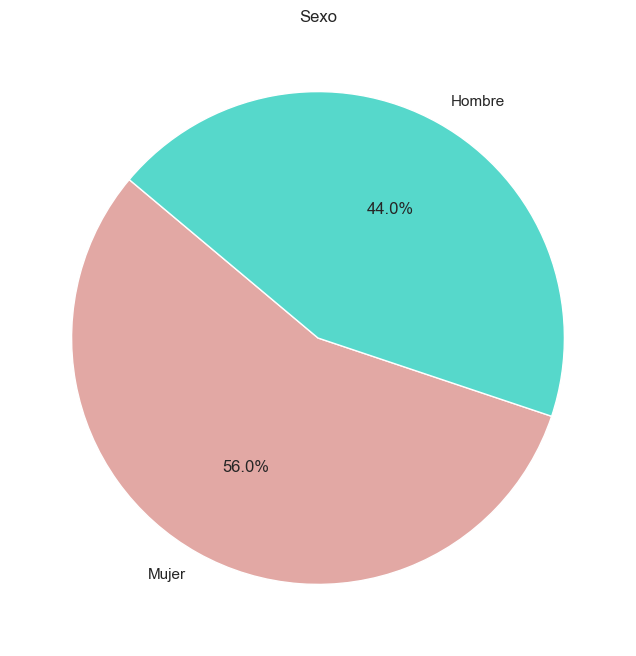

In [22]:
# Conteo de la variable Sex
sex_counts = df['Sex'].value_counts()

# Gráfico circular
plt.figure(figsize=(8,8))
plt.pie(sex_counts, labels=["Mujer", "Hombre"], autopct='%1.1f%%', startangle=140, colors=["#E2A8A4","#56D8CB"])
plt.title("Sexo")

plt.show()

La tabla de frecuencias muestra la distribución de la variable Sex en la población analizada. Se observa que el 55.97% (n = 14,197) de los registros corresponde a mujeres, mientras que el 44.03% (n = 11,706) pertenece a hombres.

Estos resultados indican que la muestra presenta una ligera mayor representación de mujeres frente a los hombres. En términos generales, la distribución no es extremadamente desbalanceada, aunque sí existe una diferencia aproximada de 12 puntos porcentuales entre ambas categorías.

#### **10.1.2. Edad**

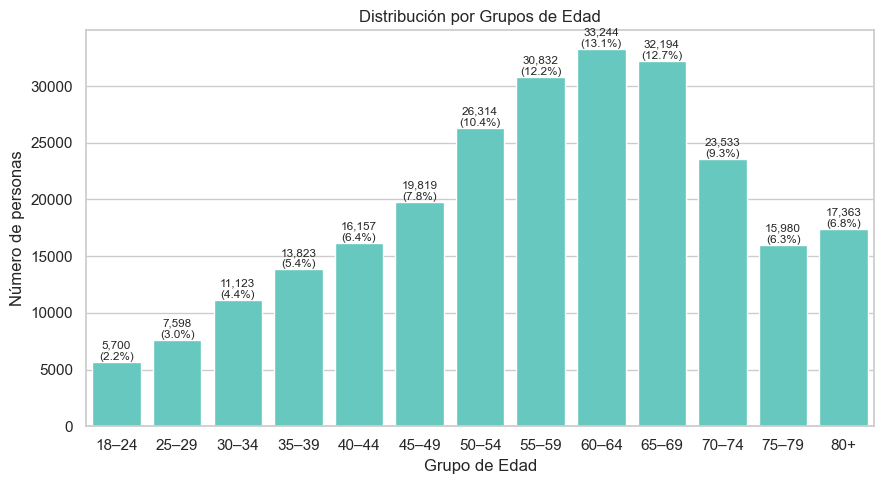

In [23]:
plt.figure(figsize=(9, 5))

ax = sns.countplot(x='Age', data=df_viz, color="#56D8CB", 
                   order=sorted(df_viz['Age'].unique()))

total = len(df_viz)

for p in ax.patches:
    count = int(p.get_height())
    percentage = f'{100 * count / total:.1f}%'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(
        f'{count:,}\n({percentage})',  # conteo arriba, porcentaje abajo
        (x, y),
        ha='center',
        va='bottom',
        fontsize=8.5
    )

plt.title("Distribución por Grupos de Edad")
plt.xlabel("Grupo de Edad")
plt.ylabel("Número de personas")

plt.tight_layout()
plt.show()

La distribución etaria evidencia una concentración progresiva de la muestra en los grupos de edad media y tardía. Se observa que los intervalos comprendidos entre 50 y 69 años (códigos 7 a 10) acumulan aproximadamente el 48.31% del total de observaciones, equivalente a 122,584 personas, 
con un pico específico en el grupo 60–64 años con 33,244 personas, 13.10%, seguido por el grupo 65–69 años 32,194 personas, 12.69% y 55–59 años con 30,822 personas, 12.15%.

Este patrón indica una clara sobrerrepresentación de población en etapas de madurez y transición hacia la vejez, mientras que los grupos jóvenes (18–34 años) presentan una participación relativa considerablemente menor, con aproximadamente 24,421 personas en total (9.63% acumulado).

### **10.2. Variables socioeconómicas y acceso a la salud**

#### **10.2.1. Educación**

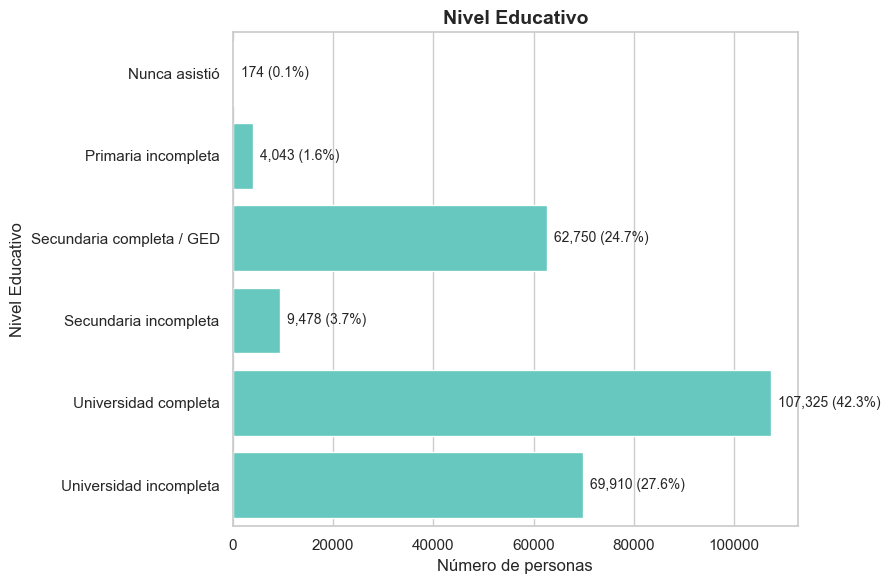

In [24]:
plt.figure(figsize=(9,6))

ax = sns.countplot(
    y='Education',  
    data=df_viz,
    color="#56D8CB",
    order=sorted(df_viz['Education'].unique())
)

total = len(df_viz)

for p in ax.patches:
    count = int(p.get_width())
    percentage = f'{100 * count / total:.1f}%'
    x = p.get_width()
    y = p.get_y() + p.get_height() / 2
    
    ax.annotate(
        f'{count:,} ({percentage})',
        (x, y),
        ha='left',
        va='center',
        fontsize=10,
        xytext=(5, 0),
        textcoords='offset points'
    )

plt.title("Nivel Educativo", fontsize=14, fontweight="bold")
plt.ylabel("Nivel Educativo")
plt.xlabel("Número de personas")

plt.tight_layout()
plt.show()

La distribución del nivel educativo evidencia una marcada concentración de la población en niveles de escolaridad media y superior. El grupo con mayor representación corresponde a los graduados universitarios, que constituyen el 42.31% (n = 107,325) de la muestra, seguido por quienes reportan algo de educación universitaria o formación técnica, con un 27.56% (n = 69,910). En conjunto, estas dos categorías agrupan cerca del 70% de los individuos, lo que indica un perfil educativo predominantemente alto dentro del dataset.

El nivel de graduado de secundaria representa el 24.74%, consolidando la mayor parte de la población en niveles educativos al menos completos en educación media. En contraste, los niveles educativos bajos presentan una participación marginal: los individuos con escolaridad inferior a secundaria (categorías 1 a 3) suman menos del 6% del total, evidenciando una subrepresentación relativa de poblaciones con baja escolaridad.

#### **10.2.2. Ingresos**

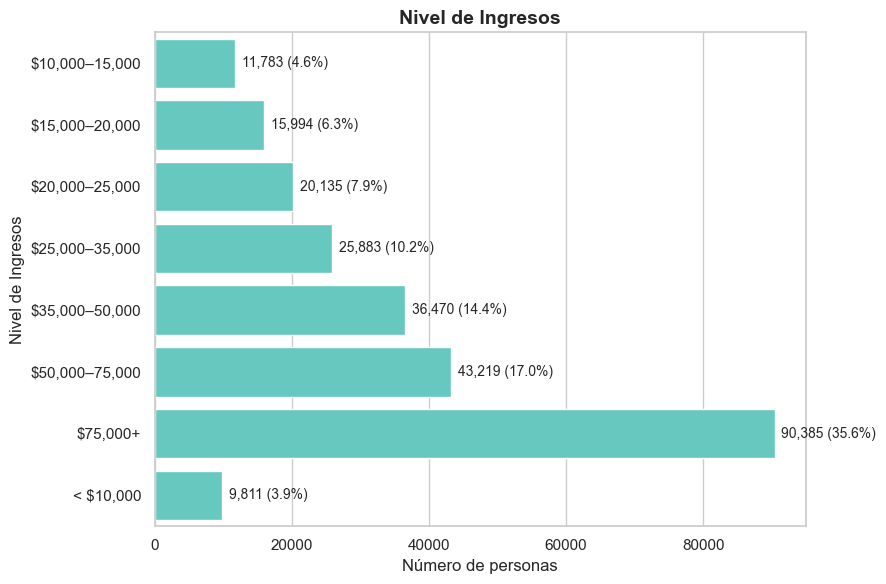

In [25]:
plt.figure(figsize=(9,6))

ax = sns.countplot(
    y='Income',
    data=df_viz,
    color="#56D8CB",
    order=sorted(df_viz['Income'].unique())
)

total = len(df_viz)

for p in ax.patches:
    count = int(p.get_width())
    percentage = f'{100 * count / total:.1f}%'
    x = p.get_width()
    y = p.get_y() + p.get_height() / 2
    
    ax.annotate(
        f'{count:,} ({percentage})',
        (x, y),
        ha='left',
        va='center',
        fontsize=10,
        xytext=(5, 0),
        textcoords='offset points'
    )

plt.title("Nivel de Ingresos", fontsize=14, fontweight="bold")
plt.xlabel("Número de personas")
plt.ylabel("Nivel de Ingresos")

plt.tight_layout()
plt.show()

La distribución del nivel de ingresos evidencia una clara concentración de la población en los estratos económicos medios y altos. El grupo más representativo corresponde a individuos con ingresos anuales de $75,000 o más, que constituyen el 35.63% (n = 90,385) del total de la muestra, seguido por el rango de $50,000–$74,999, con un 17.04%. En conjunto, estos dos niveles agrupan más de la mitad de las observaciones, indicando una predominancia de hogares con ingresos relativamente elevados dentro del dataset.

Los niveles intermedios de ingreso ($25,000–$49,999) presentan participaciones moderadas, mientras que los estratos de ingresos bajos (menos de $20,000 anuales) representan una proporción considerablemente menor, acumulando menos del 13% de la muestra. Este patrón sugiere una distribución socioeconómica desplazada hacia niveles superiores de ingreso, evidenciando una posible subrepresentación relativa de poblaciones económicamente vulnerables.

#### **10.2.3. Acceso a servicios de salud**

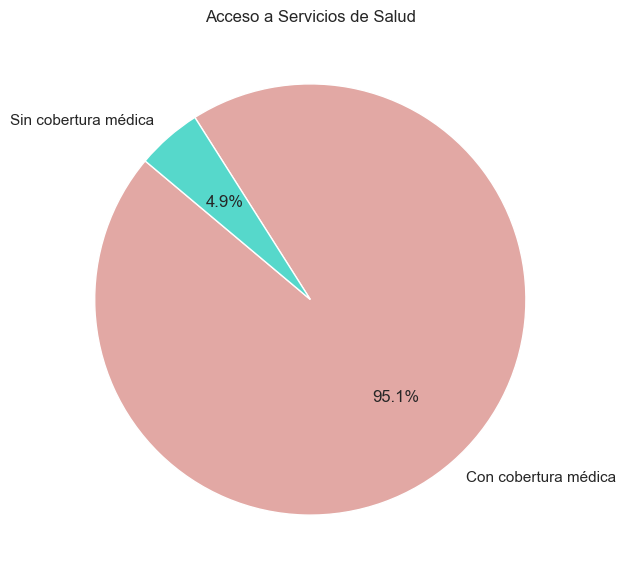

In [26]:
healthcare_counts = df_viz['AnyHealthcare'].value_counts()

plt.figure(figsize=(7,7))

plt.pie(
    healthcare_counts,
    labels=["Con cobertura médica", "Sin cobertura médica"],
    autopct='%1.1f%%',
    startangle=140,
    colors=["#E2A8A4","#56D8CB"],
)

plt.title("Acceso a Servicios de Salud")
plt.show()

La distribución del acceso a servicios de salud muestra una marcada predominancia de individuos que reportan contar con cobertura o acceso sanitario. En particular, el 95.11% (n = 241,263) de la población indica tener acceso a servicios de salud, mientras que únicamente el 4.89% (n = 12,417) manifiesta no disponer de dicho acceso.

Esta fuerte concentración en la categoría afirmativa evidencia una población ampliamente integrada al sistema de atención sanitaria, lo cual es consistente con el diseño de encuestas poblacionales enfocadas en monitoreo de condiciones de salud en adultos. Sin embargo, la baja proporción relativa del grupo sin acceso introduce un desbalance estructural que debe considerarse en análisis posteriores, especialmente en comparaciones entre grupos o en modelos predictivos, donde la menor representación puede afectar la estabilidad de estimaciones para esta categoría.

#### **10.2.4. Barrera económica**

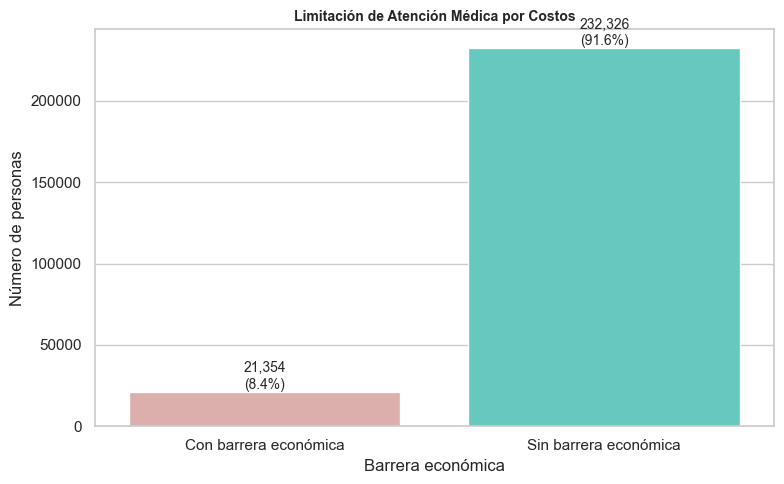

In [27]:
plt.figure(figsize=(8,5))

ax = sns.countplot(
    x='NoDocbcCost',
    data=df_viz,
    palette=["#E2A8A4","#56D8CB"]
)

total = len(df_viz)

for p in ax.patches:
    count = int(p.get_height())
    percentage = f'{100 * count / total:.1f}%'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(
        f'{count:,}\n({percentage})',
        (x, y),
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.title("Limitación de Atención Médica por Costos", fontsize=10, fontweight="bold")
plt.xlabel("Barrera económica")
plt.ylabel("Número de personas")

plt.tight_layout()
plt.show()

La variable refleja la proporción de individuos que reportaron no haber acudido al médico en el último año debido a limitaciones económicas. Los resultados indican que el 91.58% (n = 232,326) de la muestra no experimentó barreras económicas para acceder a consulta médica, mientras que el 8.42% (n = 21,354) sí reportó haber pospuesto o evitado atención médica por motivos de costo.

Aunque la mayoría de la población no presenta esta limitación, el porcentaje cercano al 8% no es despreciable desde una perspectiva de salud pública, ya que representa un segmento vulnerable cuya condición económica puede incidir en diagnósticos tardíos, menor seguimiento clínico y potencial agravamiento de enfermedades crónicas.

### **10.3. Variables de conducta y estilo de vida**

#### **10.3.1. Fumador**

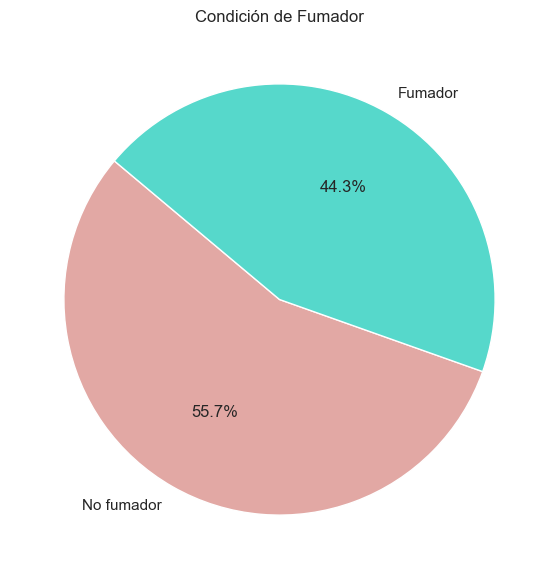

In [28]:
smoker_counts = df_viz['Smoker'].value_counts()

plt.figure(figsize=(7,7))
plt.pie(
    smoker_counts,
    labels=["No fumador", "Fumador"],
    autopct='%1.1f%%',
    startangle=140,
    colors=["#E2A8A4","#56D8CB"],
)

plt.title("Condición de Fumador")
plt.show()

La distribución de la variable Smoker muestra que el 55.68% (n = 141,257) de la población reporta no ser fumador, mientras que el 44.32% (n = 112,423) corresponde a individuos que sí presentan antecedente de consumo de tabaco.

A diferencia de otras variables previamente analizadas, la proporción entre categorías no presenta un desbalance extremo, lo que indica una representación relativamente significativa del grupo fumador dentro del dataset. Este patrón sugiere que el consumo de tabaco constituye un comportamiento de riesgo ampliamente presente en la población estudiada, con una magnitud suficiente para permitir comparaciones robustas entre grupos.

#### **10.3.2. Actividad física**

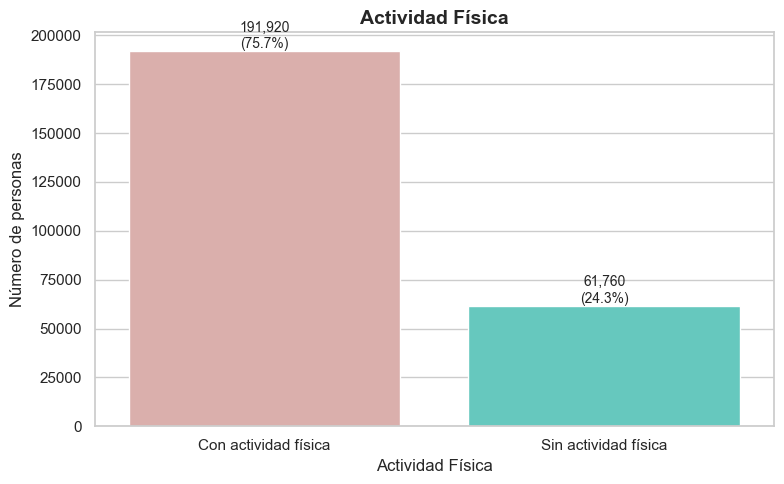

In [29]:
plt.figure(figsize=(8,5))

ax = sns.countplot(
    x='PhysActivity',
    data=df_viz,
    palette=["#E2A8A4","#56D8CB"]
)

total = len(df_viz)

for p in ax.patches:
    count = int(p.get_height())
    percentage = f'{100 * count / total:.1f}%'
    ax.annotate(
        f'{count:,}\n({percentage})',
        (p.get_x() + p.get_width()/2, p.get_height()),
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.title("Actividad Física", fontsize=14, fontweight="bold")
plt.xlabel("Actividad Física")
plt.ylabel("Número de personas")

plt.tight_layout()
plt.show()

La distribución de la variable PhysActivity indica que el 75.65% (n = 191,920) de la población reporta haber realizado actividad física en los últimos 30 días, mientras que el 24.35% (n = 61,760) señala no haber realizado ningún tipo de actividad física durante ese periodo.

Esta estructura evidencia una clara predominancia de individuos con algún nivel de actividad física reciente, lo cual sugiere una muestra mayoritariamente activa desde el punto de vista conductual. Sin embargo, la proporción cercana a una cuarta parte de la población que reporta inactividad no es marginal desde una perspectiva epidemiológica, dado que el sedentarismo constituye un factor de riesgo relevante para enfermedades cardiovasculares, metabólicas y otras condiciones crónicas.

#### **10.3.3. Consumo de frutas**

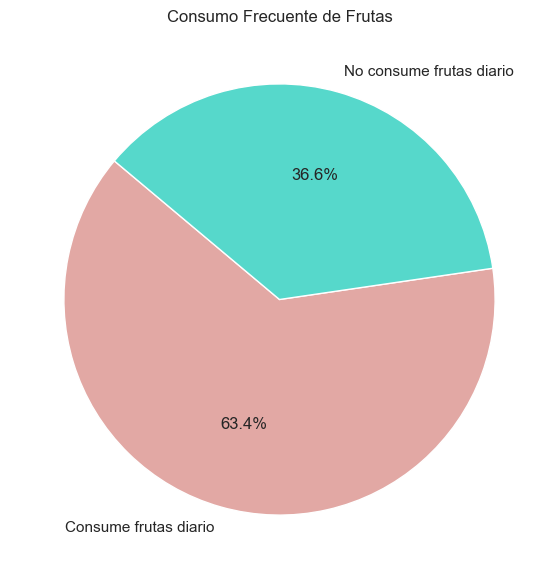

In [30]:
fruits_counts = df_viz['Fruits'].value_counts()

plt.figure(figsize=(7,7))
plt.pie(
    fruits_counts,
    labels=["Consume frutas diario", "No consume frutas diario"],
    autopct='%1.1f%%',
    startangle=140,
    colors=["#E2A8A4","#56D8CB"]
)

plt.title("Consumo Frecuente de Frutas")
plt.show()

La distribución de la variable Fruits muestra que el 63.43% (n = 160,898) de los individuos reporta consumir frutas de manera regular, mientras que el 36.57% (n = 92,782) indica no mantener este hábito alimenticio.

Estos resultados evidencian una predominancia del consumo de frutas dentro de la población analizada; sin embargo, la proporción de individuos que no reporta consumo regular continúa siendo considerable, representando más de un tercio de la muestra. Desde una perspectiva de salud pública, esta distribución sugiere la coexistencia de comportamientos alimentarios saludables junto con un segmento relevante de la población potencialmente expuesto a factores dietarios de riesgo.

#### **10.3.4. Consumo de vegetales**

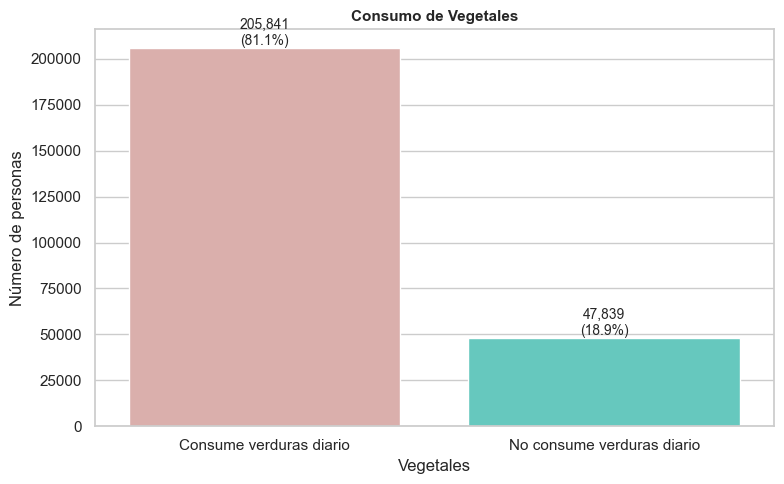

In [31]:
plt.figure(figsize=(8,5))

total = len(df_viz)

ax = sns.countplot(
    x='Veggies',
    data=df_viz,
    palette=["#E2A8A4","#56D8CB"]
)

for p in ax.patches:
    count = int(p.get_height())
    percentage = f'{100 * count / total:.1f}%'
    ax.annotate(
        f'{count:,}\n({percentage})',
        (p.get_x() + p.get_width()/2, p.get_height()),
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.title("Consumo de Vegetales", fontsize=11, fontweight="bold")
plt.xlabel("Vegetales")
plt.ylabel("Número de personas")

plt.tight_layout()
plt.show()

La distribución de la variable indica que el 81.14% (n = 205,841) de los individuos reporta consumir vegetales de manera regular, mientras que el 18.86% (n = 47,839) señala no incluir este tipo de alimentos en su consumo habitual.

Estos resultados evidencian una alta prevalencia de consumo de vegetales dentro de la población analizada, lo que sugiere la presencia generalizada de comportamientos alimentarios asociados a patrones nutricionales saludables. No obstante, la proporción cercana al 19% de individuos sin consumo regular continúa siendo relevante desde una perspectiva epidemiológica, dado que dietas bajas en vegetales se asocian con mayor riesgo de enfermedades crónicas no transmisibles.

#### **10.3.5. Consumo elevado de alcohol**

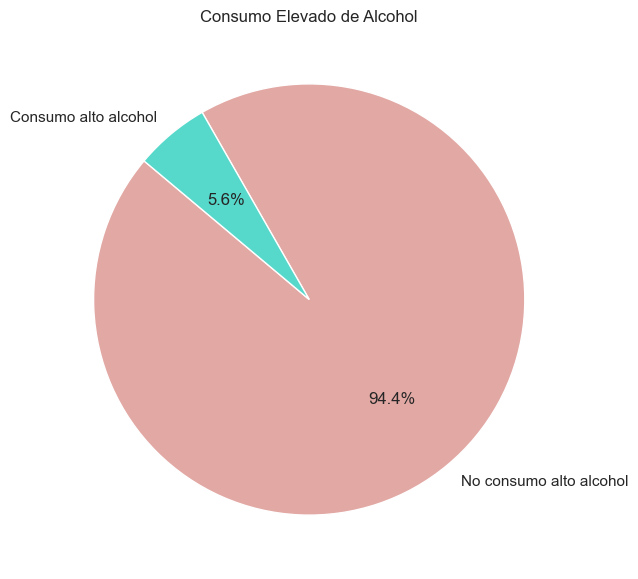

In [32]:
alcohol_counts = df['HvyAlcoholConsump'].value_counts()

plt.figure(figsize=(7,7))
plt.pie(
    alcohol_counts,
    labels=["No consumo alto alcohol", "Consumo alto alcohol"],
    autopct='%1.1f%%',
    startangle=140,
    colors=["#E2A8A4","#56D8CB"],
)

plt.title("Consumo Elevado de Alcohol")
plt.show()

La distribución muestra que el 94.38% (n = 239,424) de los individuos no reporta consumo excesivo de alcohol, mientras que el 5.62% (n = 14,256) sí presenta patrones de consumo considerados elevados o de riesgo.

Esta marcada diferencia entre categorías indica que el consumo excesivo de alcohol constituye un comportamiento relativamente poco frecuente dentro de la población analizada. Sin embargo, aunque minoritario, el grupo que presenta este patrón mantiene una relevancia epidemiológica importante, dado que el consumo elevado de alcohol se asocia con múltiples efectos adversos sobre la salud, incluyendo enfermedades cardiovasculares, hepáticas y trastornos metabólicos.

#### **10.3.6. Chequeo de colesterol**

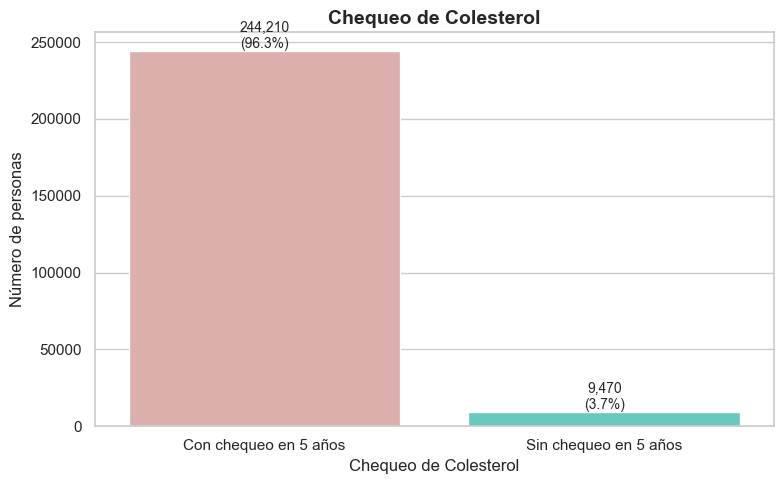

In [33]:
plt.figure(figsize=(8,5))

total = len(df_viz)

ax = sns.countplot(
    x='CholCheck',
    data=df_viz,
    palette=["#E2A8A4","#56D8CB"]
)

for p in ax.patches:
    count = int(p.get_height())
    percentage = f'{100 * count / total:.1f}%'
    ax.annotate(
        f'{count:,}\n({percentage})',
        (p.get_x() + p.get_width()/2, p.get_height()),
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.title("Chequeo de Colesterol", fontsize=14, fontweight="bold")
plt.xlabel("Chequeo de Colesterol")
plt.ylabel("Número de personas")

plt.tight_layout()
plt.show()

La distribución de la variable CholCheck indica que el 96.27% (n = 244,210) de los individuos reporta haberse realizado un control de colesterol en los últimos cinco años, mientras que únicamente el 3.73% (n = 9,470) señala no haber efectuado dicha evaluación en ese periodo.

Este patrón refleja una alta cobertura en prácticas preventivas relacionadas con monitoreo cardiovascular dentro de la población estudiada. La proporción mayoritaria sugiere una población ampliamente integrada a esquemas de seguimiento médico, particularmente en lo que respecta a factores de riesgo metabólico.

### **10.4. Variables de factores clínicos y metabólicos**

#### **10.4.1. Indice de Masa Corporal (BMI)**

In [34]:
bmi_summary = df["BMI"].describe()  # incluye count, mean, std, min, 25%, 50%, 75%, max
bmi_summary_df = bmi_summary.to_frame(name="BMI").round(2)
bmi_summary_df

,BMI
count,253680.00
mean,28.38
std,6.61
min,12.00
25%,24.00
50%,27.00
75%,31.00
max,98.00


El resumen estadístico del Índice de Masa Corporal (BMI) muestra un total de
**253,680 observaciones**, con un valor promedio de **28.38** y una mediana de
**27.00**, lo que indica que la mitad de los individuos presenta valores de BMI
iguales o inferiores a este punto central.

Los valores se distribuyen entre un mínimo de **12.00** y un máximo de
**98.00**, evidenciando un amplio rango dentro de la variable. El primer
cuartil (**Q1 = 24.00**) y el tercer cuartil (**Q3 = 31.00**) indican que el
50% central de las observaciones se concentra dentro de este intervalo.

La desviación estándar de **6.61** refleja la variabilidad presente en los
valores de BMI dentro del conjunto de datos analizado.

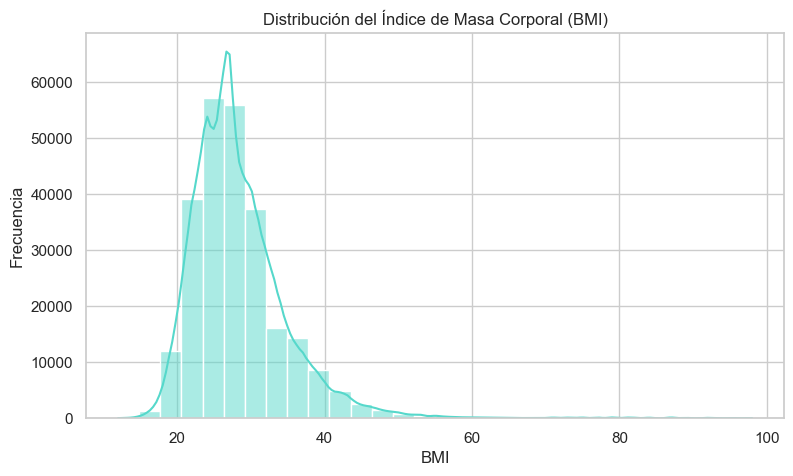

In [35]:
plt.figure(figsize=(9,5))

sns.histplot(
    df_viz["BMI"],
    kde=True,
    color="#56D8CB",
    bins=30
)

plt.title("Distribución del Índice de Masa Corporal (BMI)")
plt.xlabel("BMI")
plt.ylabel("Frecuencia")

plt.show()

La distribución del Índice de Masa Corporal (BMI) muestra una mayor
concentración de observaciones en valores intermedios, con una frecuencia más
alta alrededor del rango comprendido aproximadamente entre **24 y 31**, en
coherencia con los cuartiles observados previamente en el resumen estadístico.

Asimismo, la forma de la distribución presenta una extensión visible hacia
valores más altos de BMI, sugiriendo una **asimetría hacia la derecha**. Esta
característica podría indicar la presencia de valores extremos en la parte
superior de la distribución.


#### **10.4.2. Presión arterial alta**

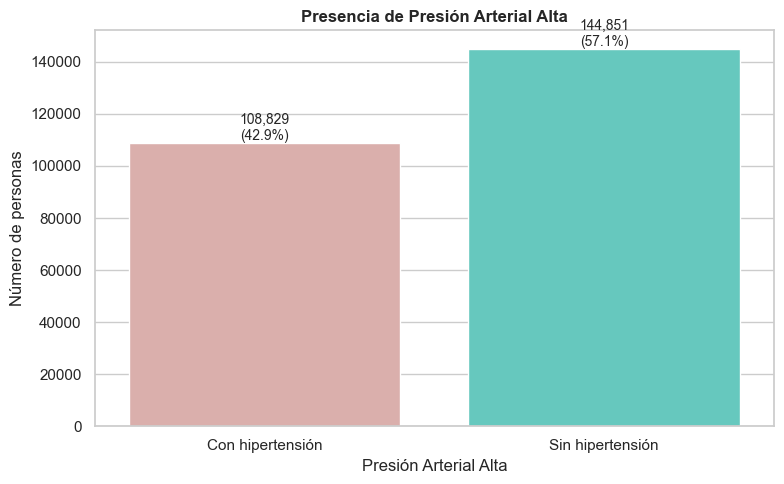

In [36]:
plt.figure(figsize=(8,5))

total = len(df_viz)

ax = sns.countplot(
    x='HighBP',
    data=df_viz,
    palette=["#E2A8A4","#56D8CB"]
)

for p in ax.patches:
    count = int(p.get_height())
    percentage = f'{100 * count / total:.1f}%'
    ax.annotate(
        f'{count:,}\n({percentage})',
        (p.get_x() + p.get_width()/2, p.get_height()),
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.title("Presencia de Presión Arterial Alta", fontsize=12, fontweight="bold")
plt.xlabel("Presión Arterial Alta")
plt.ylabel("Número de personas")

plt.tight_layout()
plt.show()

La distribución muestra que el 57.10% (n = 144,851) de los individuos no reporta diagnóstico de hipertensión arterial, mientras que el 42.90% (n = 108,829) sí presenta antecedentes de presión arterial alta.

A diferencia de otras variables relacionadas con conductas o acceso a servicios de salud, la proporción de individuos con hipertensión resulta considerablemente elevada, evidenciando una presencia sustancial de esta condición dentro de la población analizada. La cercanía relativa entre ambas categorías sugiere una distribución más equilibrada, lo que indica que la hipertensión constituye un fenómeno ampliamente representado en el dataset y no un evento marginal.

#### **10.4.3. Colesterol alto**

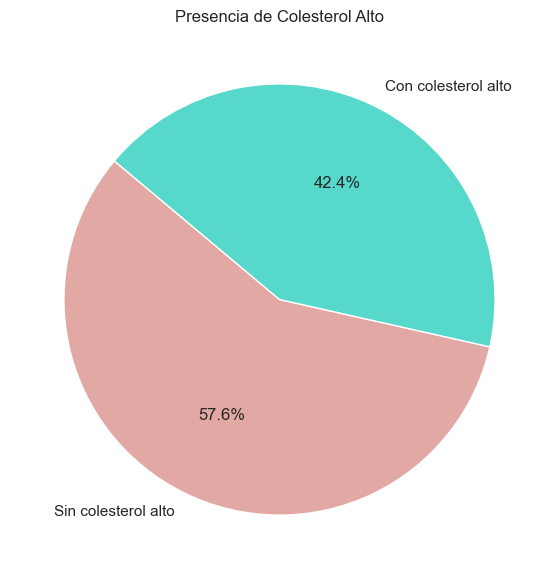

In [37]:
chol_counts = df_viz['HighChol'].value_counts()

plt.figure(figsize=(7,7))

plt.pie(
    chol_counts,
    labels=["Sin colesterol alto","Con colesterol alto"],
    autopct='%1.1f%%',
    startangle=140,
    colors=["#E2A8A4","#56D8CB"],
)

plt.title("Presencia de Colesterol Alto")
plt.show()

La distribución de la variable HighChol indica que el 57.59% (n = 146,089) de los individuos no reporta niveles elevados de colesterol, mientras que el 42.41% (n = 107,591) sí presenta diagnóstico de hipercolesterolemia.

Al igual que en el caso de la hipertensión arterial, la proporción de individuos con colesterol alto es considerablemente elevada, representando más de dos quintas partes de la población analizada. Esta magnitud evidencia que las alteraciones metabólicas constituyen un componente sustancial dentro del perfil de salud del dataset y no un evento aislado o marginal.

### **10.5. Variables de estado funcional y percepción de la salud**

#### **10.5.1. Percepción del estado de salud**

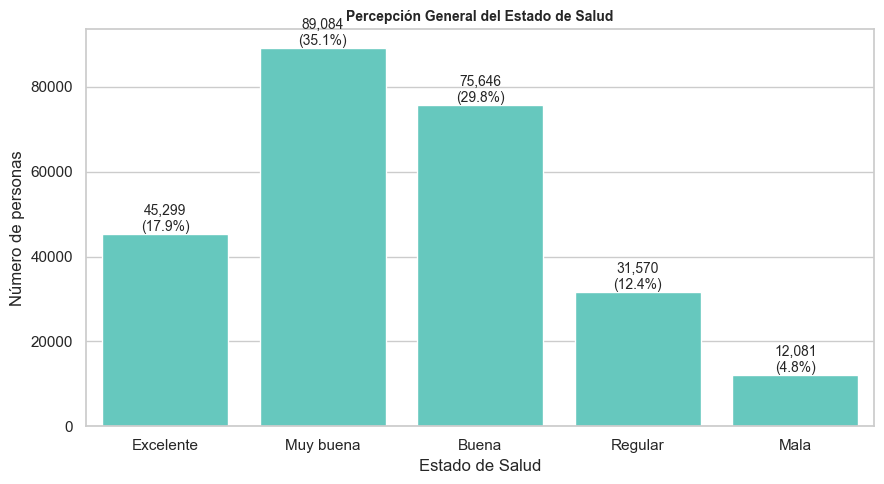

In [38]:
plt.figure(figsize=(9,5))

orden_salud = [
    "Excelente",
    "Muy buena",
    "Buena",
    "Regular",
    "Mala"
]

total = len(df_viz)

ax = sns.countplot(
    x='GenHlth',
    data=df_viz,
    color="#56D8CB",
    order=orden_salud   
)

for p in ax.patches:
    count = int(p.get_height())
    percentage = f'{100 * count / total:.1f}%'
    ax.annotate(
        f'{count:,}\n({percentage})',
        (p.get_x() + p.get_width()/2, p.get_height()),
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.title("Percepción General del Estado de Salud", fontsize=10, fontweight="bold")
plt.xlabel("Estado de Salud")
plt.ylabel("Número de personas")

plt.tight_layout()
plt.show()

La percepción general del estado de salud, presenta una distribución predominantemente concentrada en valoraciones positivas o intermedias. La categoría más frecuente corresponde a “Buena”, con el 29.82% (n = 75,646) de las observaciones, seguida por “Muy buena” (35.12%) y “Excelente” (17.86%). En conjunto, estas tres categorías agrupan más del 80% de la población, indicando una percepción global favorable del estado de salud entre los individuos analizados.

Por otro lado, las categorías asociadas a percepciones menos favorables, “Regular” (12.44%) y “Mala” (4.76%), representan una proporción considerablemente menor, aunque epidemiológicamente relevante, ya que suelen asociarse con mayor carga de enfermedad crónica, limitaciones funcionales y mayor utilización de servicios sanitarios.

#### **10.5.2. Días con mala salud física**

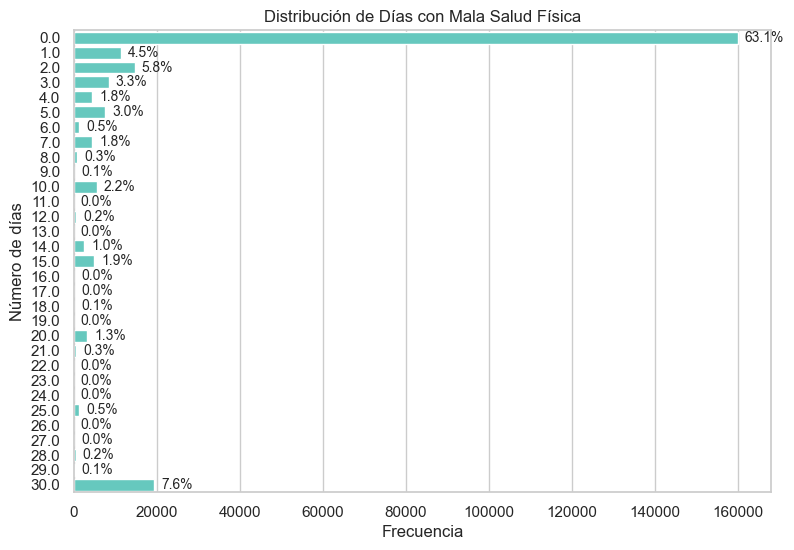

In [39]:
plt.figure(figsize=(9,6))

ax = sns.countplot(
    y='PhysHlth',
    data=df_viz,
    color="#56D8CB",
    order=sorted(df_viz['PhysHlth'].unique())
)

# Total de observaciones
total = len(df_viz)

# Agregar porcentajes
for p in ax.patches:
    percentage = f'{100 * p.get_width() / total:.1f}%'
    x = p.get_width()
    y = p.get_y() + p.get_height() / 2
    
    ax.annotate(
        percentage,
        (x, y),
        ha='left',
        va='center',
        fontsize=10,
        xytext=(5, 0),
        textcoords='offset points'
    )

plt.title("Distribución de Días con Mala Salud Física")
plt.xlabel("Frecuencia")
plt.ylabel("Número de días")

plt.show()

La gráfica muestra la distribución del número de días en los que los encuestados reportaron haber tenido mala salud física durante los últimos 30 días. Se observa una marcada concentración en el valor 0 días, que representa aproximadamente el 63.1% de la muestra, lo que indica que la mayoría de los participantes no experimentó días de mala salud física en el último mes. A medida que aumenta el número de días reportados, la frecuencia disminuye considerablemente, evidenciando una distribución fuertemente asimétrica hacia la derecha. Sin embargo, destaca un pequeño grupo (7.6%) que reporta 30 días de mala salud física, lo que sugiere la presencia de un segmento con afectación persistente. 

#### **10.5.3. Días con mala salud mental**

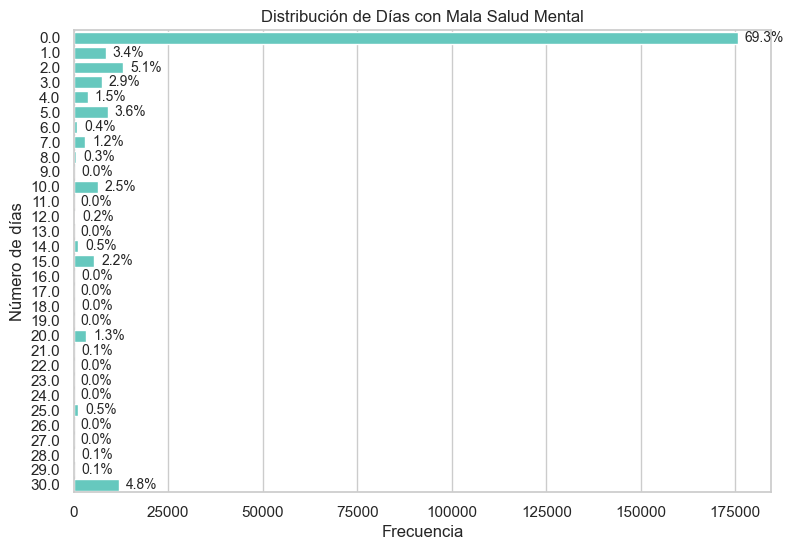

In [40]:
plt.figure(figsize=(9,6))

ax = sns.countplot(
    y='MentHlth',
    data=df_viz,
    color="#56D8CB",
    order=sorted(df_viz['MentHlth'].unique())
)

# Total de observaciones
total = len(df_viz)

# Agregar porcentajes
for p in ax.patches:
    percentage = f'{100 * p.get_width() / total:.1f}%'
    x = p.get_width()
    y = p.get_y() + p.get_height() / 2
    
    ax.annotate(
        percentage,
        (x, y),
        ha='left',
        va='center',
        fontsize=10,
        xytext=(5, 0),
        textcoords='offset points'
    )

plt.title("Distribución de Días con Mala Salud Mental")
plt.xlabel("Frecuencia")
plt.ylabel("Número de días")

plt.show()

La gráfica presenta la distribución del número de días en los que los encuestados reportaron haber tenido mala salud mental durante los últimos 30 días. Se observa que el 69.3% de la muestra indicó no haber experimentado ningún día de mala salud mental (0 días), lo que evidencia una fuerte concentración en el valor mínimo. A medida que aumenta el número de días reportados, la frecuencia disminuye considerablemente, mostrando una distribución altamente asimétrica hacia la derecha. No obstante, se identifica un grupo relevante (4.8%) que reporta 30 días de mala salud mental, lo cual sugiere la existencia de un segmento con afectación continua durante todo el mes.

#### **10.5.4. Dificultad para caminar**

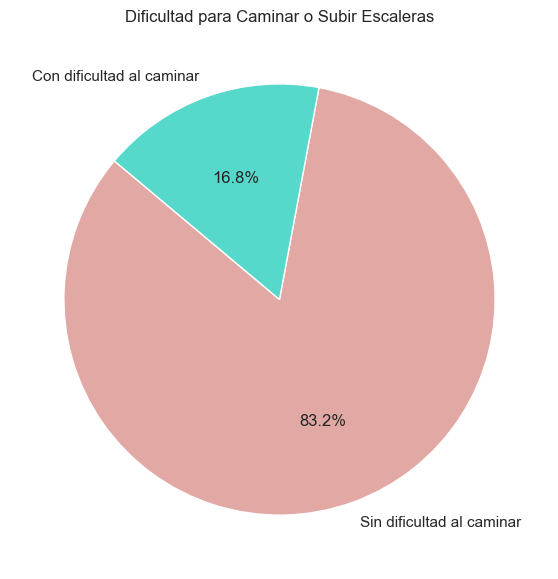

In [41]:
diffwalk_counts = df_viz['DiffWalk'].value_counts()

plt.figure(figsize=(7,7))

plt.pie(
    diffwalk_counts,
    labels=["Sin dificultad al caminar","Con dificultad al caminar"],
    autopct='%1.1f%%',
    startangle=140,
    colors=["#E2A8A4","#56D8CB"],
)

plt.title("Dificultad para Caminar o Subir Escaleras")
plt.show()

La distribución de la variable DiffWalk, que evalúa la presencia de dificultades para caminar o subir escaleras, indica que el 83.18% (n = 211,005) de los individuos no reporta limitaciones funcionales de movilidad, mientras que el 16.82% (n = 42,675) sí manifiesta algún grado de dificultad en estas actividades.

Aunque la mayoría de la población no presenta restricciones de movilidad, la proporción cercana al 17% resulta significativa desde una perspectiva de salud pública, ya que las limitaciones funcionales suelen asociarse con envejecimiento, presencia de enfermedades crónicas y determioro del estado general de salud. Este grupo puede representar individuos con mayor vulnerabilidad física y mayor probabilidad de requerir atención médica continua.

### **10.6. Eventos cardiovasculares mayores**

#### **10.6.1. Antecedente de Accidente Cerebrovascular**

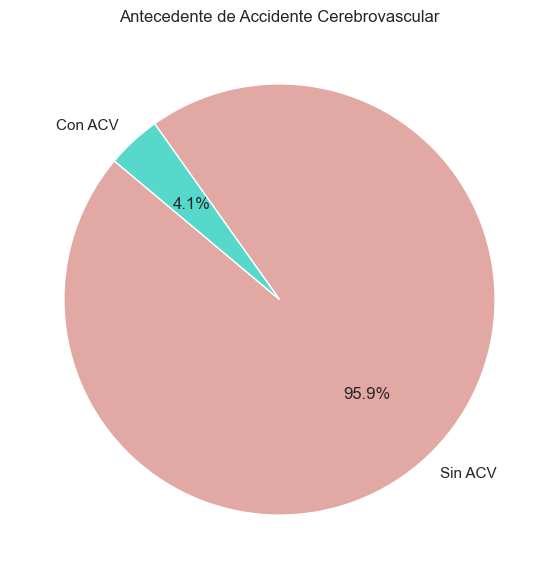

In [42]:
stroke_counts = df_viz['Stroke'].value_counts()

plt.figure(figsize=(7,7))

plt.pie(
    stroke_counts,
    labels=["Sin ACV", "Con ACV"],
    autopct='%1.1f%%',
    startangle=140,
    colors=["#E2A8A4","#56D8CB"],
)

plt.title("Antecedente de Accidente Cerebrovascular")
plt.show()

La distribución de la variable Stroke indica que el 95.94% (n = 243,388) de los individuos no reporta antecedente de accidente cerebrovascular, mientras que el 4.06% (n = 10,292) sí presenta historial de esta condición.

Aunque la proporción de casos es relativamente baja en términos absolutos, su relevancia clínica es significativa, dado que el accidente cerebrovascular constituye un evento de alta gravedad, asociado a morbilidad sustancial, discapacidad funcional y aumento del riesgo de mortalidad. La baja prevalencia observada es consistente con la naturaleza de esta condición en población general, donde, a pesar de su impacto severo, su frecuencia es menor en comparación con otros factores de riesgo cardiovascular como hipertensión o colesterol elevado.

#### **10.6.2. Enfermedad/ateque cardíaco**

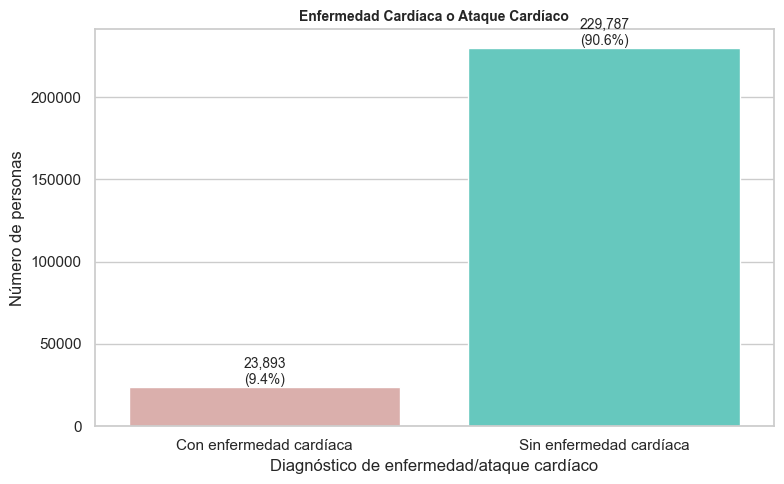

In [43]:
plt.figure(figsize=(8,5))

total = len(df_viz)

ax = sns.countplot(
    x='HeartDiseaseorAttack',
    data=df_viz,
    palette=["#E2A8A4","#56D8CB"]
)

for p in ax.patches:
    count = int(p.get_height())
    percentage = f'{100 * count / total:.1f}%'
    ax.annotate(
        f'{count:,}\n({percentage})',
        (p.get_x() + p.get_width()/2, p.get_height()),
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.title("Enfermedad Cardíaca o Ataque Cardíaco", fontsize=10, fontweight="bold")
plt.xlabel("Diagnóstico de enfermedad/ataque cardíaco")
plt.ylabel("Número de personas")

plt.tight_layout()
plt.show()

La distribución muestra que el 90.58% (n = 229,787) de los individuos no reporta antecedente de enfermedad cardíaca o infarto de miocardio, mientras que el 9.42% (n = 23,893) sí presenta historial de este tipo de evento cardiovascular.

Aunque la mayoría de la población no reporta diagnóstico previo, la proporción cercana al 9.5% resulta epidemiológicamente significativa, ya que las enfermedades cardiovasculares constituyen una de las principales causas de morbilidad y mortalidad a nivel poblacional. En comparación con la variable Stroke, la prevalencia observada es más elevada, lo cual es consistente con la mayor frecuencia relativa de eventos coronarios frente a accidentes cerebrovasculares en población adulta.

## **11. Análisis bivariado**

El análisis bivariado busca explorar la relación entre dos variables con el fin de identificar asociaciones, diferencias significativas o patrones conjuntos de comportamiento. Dependiendo del tipo de variables (numéricas o categóricas), se emplean herramientas como gráficos comparativos, medidas de correlación o pruebas estadísticas. Esta etapa permite evaluar posibles relaciones relevantes para el fenómeno estudiado y aporta evidencia preliminar sobre vínculos que podrían ser profundizados en modelos explicativos posteriores.

### **11.1 Variable objetivo vs variables categóricas (binarias)**

#### **11.1.1 Objetivo vs HighBP**

In [44]:
from scipy.stats import chi2_contingency

# Crear tabla de contingencia
variable = 'HighBP'
tabla_abs = pd.crosstab(df_viz[variable], df_viz[Objetivo], margins=True)
print("Tabla de contingencia:")
print(tabla_abs)
print("\n")

# Prueba chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_abs.iloc[:-1, :-1])

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

# Odds Ratio
# Calcular Odds Ratio solo si es tabla 2x2
if tabla_abs.iloc[:-1, :-1].shape == (2, 2):
    
    a = tabla_abs.iloc[0, 0]
    b = tabla_abs.iloc[0, 1]
    c = tabla_abs.iloc[1, 0]
    d = tabla_abs.iloc[1, 1]
    
    odds_ratio = (a * d) / (b * c)
    print("Odds Ratio (OR):", round(odds_ratio, 2))
    
else:
    print("Odds Ratio no aplica (tabla mayor a 2x2)")

Tabla de contingencia:
Diabetes_binary   Prediabetes / Diabetes  Sin diabetes     All
HighBP                                                        
Con hipertensión                   26604         82225  108829
Sin hipertensión                    8742        136109  144851
All                                35346        218334  253680


Chi-cuadrado: 17562.45
Grados de libertad: 1
p-valor: 0.0
Odds Ratio (OR): 5.04


La tabla de contingencia evidencia una asociación clara entre la presencia de hipertensión y el diagnóstico de prediabetes/diabetes. En el grupo con **Prediabetes / Diabetes**, el 75.27% presenta hipertensión, mientras que solo el 24.73% no la presenta. En contraste, dentro del grupo **Sin diabetes**, el porcentaje con hipertensión disminuye considerablemente al 37.66%, siendo mayoritario el grupo sin hipertensión (62.34%).

Desde el punto de vista estadístico, la prueba de independencia Chi-cuadrado arroja un estadístico de **χ² = 17562.45** con un p-valor < 0.001 (reportado como 0.0 por redondeo computacional), lo que indica que existe evidencia estadísticamente significativa para rechazar la hipótesis nula de independencia entre las variables. En consecuencia, se concluye que la presencia de hipertensión está significativamente asociada con el diagnóstico de prediabetes/diabetes en la muestra analizada.

Adicionalmente, el Odds Ratio **(OR = 5.04)** indica que las probabilidades de presentar prediabetes/diabetes son aproximadamente cinco veces mayores en individuos con hipertensión en comparación con aquellos sin hipertensión. Este valor cuantifica la magnitud de la asociación y confirma que no solo existe significancia estadística, esperable dada la gran muestra, sino también una relación fuerte desde el punto de vista epidemiológico.

En consecuencia, se concluye que la hipertensión constituye un factor significativamente asociado al estado diabético en la muestra analizada, consolidándose como una condición estrechamente vinculada al riesgo metabólico.

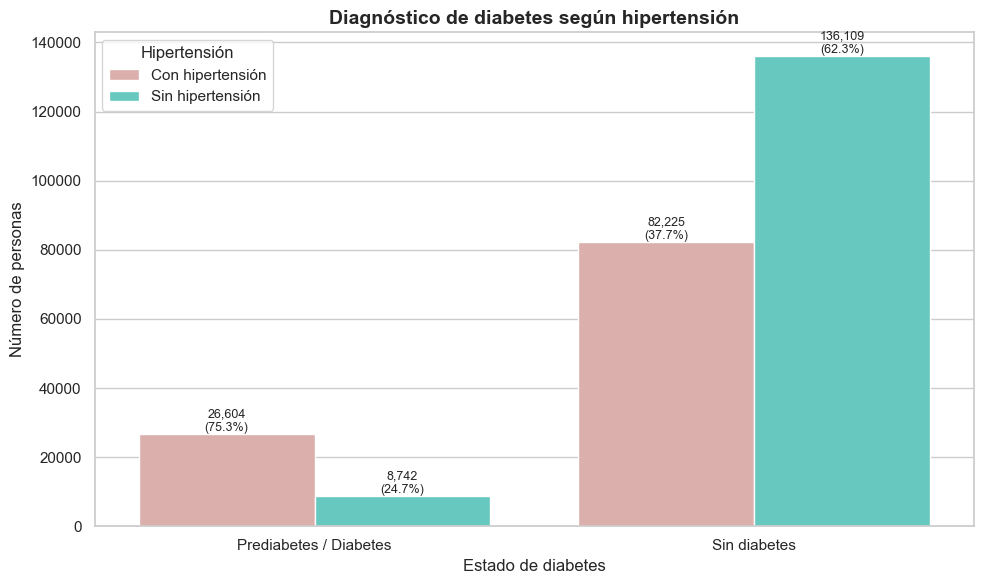

In [45]:
# Tabla porcentual por fila
tabla_pct = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz["HighBP"],
    normalize="index"
) * 100

# Tabla absoluta
tabla_abs = pd.crosstab(df_viz["Diabetes_binary"], df_viz["HighBP"])

# Formato largo
plot_pct = (
    tabla_pct
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name="Hipertensión",
          value_name="Porcentaje")
)

plot_abs = (
    tabla_abs
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name="Hipertensión",
          value_name="Frecuencia")
)

# Merge para tener conteo y porcentaje juntos
plot_merged = plot_abs.merge(plot_pct, on=["Diabetes_binary", "Hipertensión"])

fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.barplot(
    data=plot_abs,
    x="Diabetes_binary",
    y="Frecuencia",
    hue="Hipertensión",
    palette=["#E2A8A4", "#56D8CB"]
)

# Agregar conteo y porcentaje sobre cada barra
for bar, (_, row) in zip(ax.patches, plot_merged.iterrows()):
    count = int(bar.get_height())
    pct = row["Porcentaje"]
    ax.annotate(
        f'{count:,}\n({pct:.1f}%)',
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
        ha='center',
        va='bottom',
        fontsize=9
    )

ax.set_title("Diagnóstico de diabetes según hipertensión", fontsize=14, fontweight="bold")
ax.set_xlabel("Estado de diabetes")
ax.set_ylabel("Número de personas")

plt.tight_layout()
plt.show()

#### **11.1.2 Objetivo vs HighChol**

In [104]:
from scipy.stats import chi2_contingency

# Crear tabla de contingencia
variable = 'HighChol'
tabla_abs = pd.crosstab(df_viz[variable], df_viz[Objetivo], margins=True)
print("Tabla de contingencia:")
print(tabla_abs)
print("\n")

# Prueba chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_abs.iloc[:, :-1])

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

# Odds Ratio
# Calcular Odds Ratio solo si es tabla 2x2
if tabla_abs.iloc[:, :-1].shape == (2, 2):
    
    a = tabla_abs.iloc[0, 0]
    b = tabla_abs.iloc[0, 1]
    c = tabla_abs.iloc[1, 0]
    d = tabla_abs.iloc[1, 1]
    
    odds_ratio = (a * d) / (b * c)
    print("Odds Ratio (OR):", round(odds_ratio, 2))
    
else:
    print("Odds Ratio no aplica (tabla mayor a 2x2)")


Tabla de contingencia:
Diabetes_binary      Prediabetes / Diabetes  Sin diabetes     All
HighChol                                                         
Con colesterol alto                   23686         83905  107591
Sin colesterol alto                   11660        134429  146089
All                                   35346        218334  253680


Chi-cuadrado: 10175.25
Grados de libertad: 2
p-valor: 0.0
Odds Ratio no aplica (tabla mayor a 2x2)


La tabla de contingencia evidencia una diferencia sustancial en la distribución del colesterol alto según el estado diabético. Dentro del grupo con **Prediabetes / Diabetes**, el 67.01% presenta colesterol alto, mientras que el 32.99% no lo presenta. En contraste, en el grupo Sin **diabetes**, solo el 38.43% presenta colesterol alto y el 61.57% no lo presenta.

Esta diferencia porcentual sugiere una asociación relevante entre ambas condiciones metabólicas. La prueba Chi-cuadrado de independencia arroja un estadístico de **χ² = 10174.07**, con 1 grado de libertad y un p-valor < 0.001 (reportado como 0.0 por redondeo computacional). Dado que el p-valor es significativamente menor al nivel de significancia convencional (α = 0.05), se rechaza la hipótesis nula de independencia.

Adicionalmente, el Odds Ratio **(OR = 3.25)** indica que las probabilidades de presentar prediabetes/diabetes son aproximadamente 3.25 veces mayores en individuos con colesterol alto en comparación con aquellos sin colesterol alto. Este valor cuantifica la magnitud de la asociación y evidencia que no solo existe significancia estadística, esperable dada la gran muestra, sino también una relación de magnitud moderada a fuerte desde el punto de vista epidemiológico.

En consecuencia, se concluye que el colesterol alto se encuentra significativamente asociado con la presencia de prediabetes/diabetes en la muestra analizada, en línea con la evidencia epidemiológica que vincula dislipidemias y trastornos metabólicos.



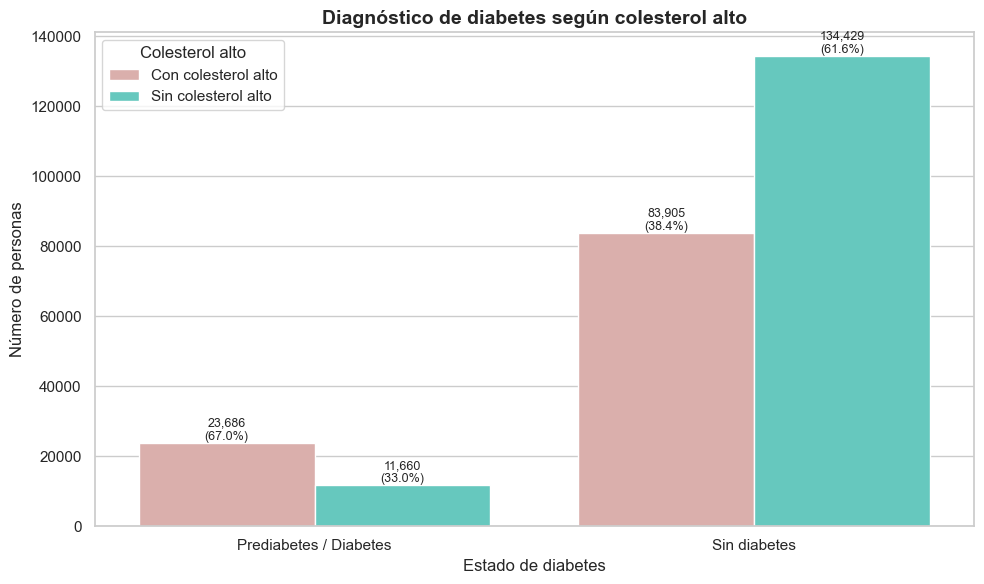

In [47]:
tabla_pct = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz["HighChol"],
    normalize="index"
) * 100

tabla_abs = pd.crosstab(df_viz["Diabetes_binary"], df_viz["HighChol"])

plot_pct = (
    tabla_pct
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name="Colesterol alto",
          value_name="Porcentaje")
)

plot_abs = (
    tabla_abs
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name="Colesterol alto",
          value_name="Frecuencia")
)

plot_merged = plot_abs.merge(plot_pct, on=["Diabetes_binary", "Colesterol alto"])

fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.barplot(
    data=plot_abs,
    x="Diabetes_binary",
    y="Frecuencia",
    hue="Colesterol alto",
    palette=["#E2A8A4", "#56D8CB"]
)

for bar, (_, row) in zip(ax.patches, plot_merged.iterrows()):
    count = int(bar.get_height())
    pct = row["Porcentaje"]
    ax.annotate(
        f'{count:,}\n({pct:.1f}%)',
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
        ha='center',
        va='bottom',
        fontsize=9
    )

ax.set_title("Diagnóstico de diabetes según colesterol alto", fontsize=14, fontweight="bold")
ax.set_xlabel("Estado de diabetes")
ax.set_ylabel("Número de personas")

plt.tight_layout()
plt.show()

#### **11.1.3 Objetivo vs CholCheck**

In [105]:
from scipy.stats import chi2_contingency

# Crear tabla de contingencia
variable = 'CholCheck'
tabla_abs = pd.crosstab(df_viz[variable], df_viz[Objetivo], margins=True)
print("Tabla de contingencia:")
print(tabla_abs)
print("\n")

chi2, p, dof, expected = chi2_contingency(tabla_abs.iloc[:, :-1])

print("\nChi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

# Calcular Odds Ratio solo si es tabla 2x2
if tabla_abs.iloc[:, :-1].shape == (2, 2):
    
    a = tabla_abs.iloc[0, 0]
    b = tabla_abs.iloc[0, 1]
    c = tabla_abs.iloc[1, 0]
    d = tabla_abs.iloc[1, 1]
    
    odds_ratio = (a * d) / (b * c)
    print("Odds Ratio (OR):", round(odds_ratio, 2))
    
else:
    print("Odds Ratio no aplica (tabla mayor a 2x2)")



Tabla de contingencia:
Diabetes_binary        Prediabetes / Diabetes  Sin diabetes     All
CholCheck                                                          
Con chequeo en 5 años                   35105        209105  244210
Sin chequeo en 5 años                     241          9229    9470
All                                     35346        218334  253680



Chi-cuadrado: 1063.92
Grados de libertad: 2
p-valor: 9.370195492581739e-232
Odds Ratio no aplica (tabla mayor a 2x2)


La tabla de contingencia evidencia diferencias claras en la realización del **chequeo de colesterol** en los últimos cinco años según el estado diabético. En el grupo con **Prediabetes / Diabetes**, el 99.32% reporta haberse realizado un chequeo de colesterol, mientras que solo el 0.68% no lo ha hecho. En contraste, dentro del grupo **Sin diabetes**, el 95.77% se ha realizado el chequeo y el 4.23% no lo ha hecho.

Aunque en ambos grupos el porcentaje de chequeo es alto, la diferencia relativa entre quienes no se realizan el examen es notablemente mayor en el grupo sin diabetes. Desde el punto de vista estadístico, la prueba de independencia Chi-cuadrado arroja un estadístico de **χ² = 1062.94**, con 1 grado de libertad y un p-valor < 0.001, lo que indica evidencia estadísticamente significativa para rechazar la hipótesis nula de independencia entre las variables.

Adicionalmente, el Odds Ratio **(OR = 6.43)** indica que las probabilidades relativas de pertenecer al grupo con prediabetes/diabetes son aproximadamente 6.4 veces mayores en quienes se han realizado un chequeo de colesterol en comparación con quienes no lo han hecho. Este resultado no implica causalidad, sino que probablemente refleja un mayor contacto con el sistema de salud y mayor vigilancia clínica en personas ya diagnosticadas o en riesgo metabólico.

En consecuencia, se concluye que existe una asociación estadísticamente significativa entre la realización del chequeo de colesterol y el estado diabético en la muestra analizada. No obstante, la interpretación debe hacerse con cautela, dado que el chequeo es una conducta preventiva influenciada por diagnóstico previo y seguimiento médico, más que un factor de riesgo en sí mismo.

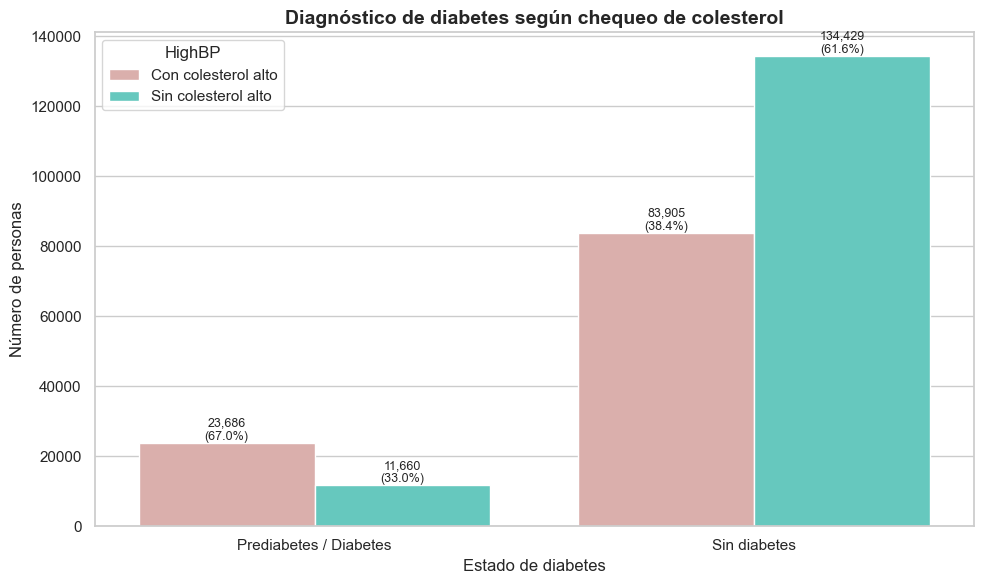

In [49]:
plot_pct = (
    tabla_pct
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Porcentaje")
)

plot_abs = (
    tabla_abs
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Frecuencia")
)

plot_merged = plot_abs.merge(plot_pct, on=["Diabetes_binary", variable])

fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.barplot(
    data=plot_abs,
    x="Diabetes_binary",
    y="Frecuencia",
    hue=variable,
    palette=["#E2A8A4", "#56D8CB"]
)

for bar, (_, row) in zip(ax.patches, plot_merged.iterrows()):
    count = int(bar.get_height())
    pct = row["Porcentaje"]
    ax.annotate(
        f'{count:,}\n({pct:.1f}%)',
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
        ha='center',
        va='bottom',
        fontsize=9
    )

ax.set_title(f"Diagnóstico de diabetes según chequeo de colesterol",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Estado de diabetes")
ax.set_ylabel("Número de personas")

plt.tight_layout()
plt.show()

#### **11.1.4 Objetivo vs Smoker**

In [106]:
from scipy.stats import chi2_contingency

# Crear tabla de contingencia
variable = 'Smoker'
tabla_abs = pd.crosstab(df_viz[variable], df_viz[Objetivo], margins=True)
print("Tabla de contingencia:")
print(tabla_abs)
print("\n")

# Prueba chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_abs.iloc[:, :-1])

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

# Odds Ratio
# Calcular Odds Ratio solo si es tabla 2x2
if tabla_abs.iloc[:, :-1].shape == (2, 2):
    
    a = tabla_abs.iloc[0, 0]
    b = tabla_abs.iloc[0, 1]
    c = tabla_abs.iloc[1, 0]
    d = tabla_abs.iloc[1, 1]
    
    odds_ratio = (a * d) / (b * c)
    print("Odds Ratio (OR):", round(odds_ratio, 2))
    
else:
    print("Odds Ratio no aplica (tabla mayor a 2x2)")

Tabla de contingencia:
Diabetes_binary  Prediabetes / Diabetes  Sin diabetes     All
Smoker                                                       
Fumador                           18317         94106  112423
No fumador                        17029        124228  141257
All                               35346        218334  253680


Chi-cuadrado: 937.41
Grados de libertad: 2
p-valor: 2.781000273150939e-204
Odds Ratio no aplica (tabla mayor a 2x2)


La tabla de contingencia muestra diferencias en la distribución del hábito de fumar según el estado diabético. En el grupo con **Prediabetes / Diabetes**, el 51.82% reporta ser fumador, mientras que el 48.18% no fuma. En contraste, en el grupo **Sin diabetes**, el 43.10% es fumador y el 56.90% no lo es.

Esta diferencia porcentual sugiere una mayor proporción de fumadores dentro del grupo con alteraciones metabólicas. Desde el punto de vista estadístico, la prueba de independencia Chi-cuadrado arroja un estadístico de **χ² =** 937.06, con 1 grado de libertad y un p-valor < 0.001, lo que indica evidencia estadísticamente significativa para rechazar la hipótesis nula de independencia entre el hábito de fumar y el estado diabético.

Adicionalmente, el Odds Ratio **(OR = 1.42)** indica que las probabilidades de presentar prediabetes/diabetes son aproximadamente 1.42 veces mayores en fumadores en comparación con no fumadores. Aunque la magnitud del efecto es moderada, la asociación es consistente y estadísticamente robusta, lo cual es esperable dada la gran muestra analizada.

En consecuencia, se concluye que existe una asociación estadísticamente significativa entre el hábito de fumar y la presencia de prediabetes/diabetes en la muestra. Desde una perspectiva epidemiológica, este resultado es coherente con la literatura que vincula el tabaquismo con alteraciones metabólicas, inflamación sistémica y mayor riesgo de enfermedades crónicas.

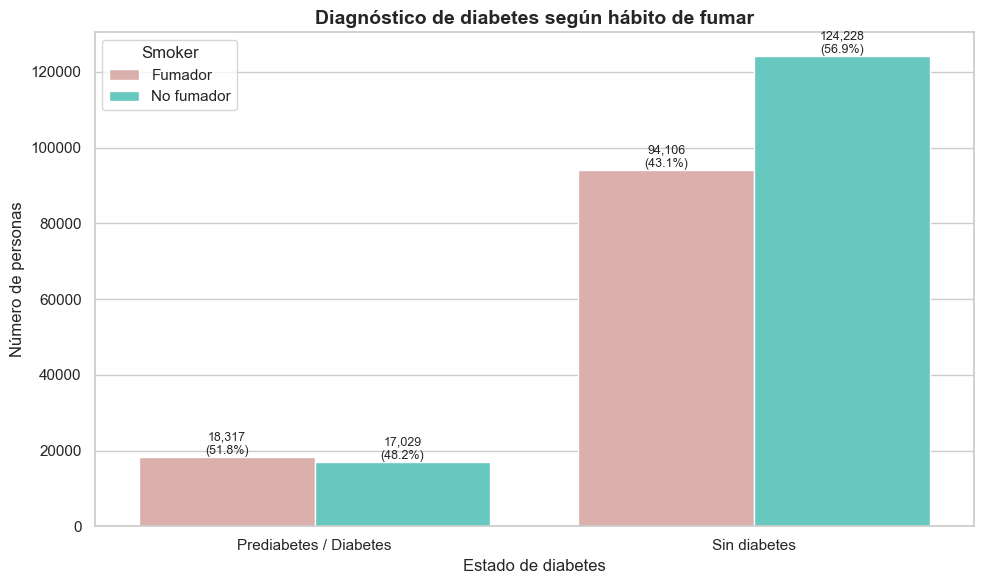

In [51]:
variable = "Smoker"

tabla_pct = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable],
    normalize="index"
) * 100

tabla_abs = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable]
)

plot_pct = (
    tabla_pct
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Porcentaje")
)

plot_abs = (
    tabla_abs
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Frecuencia")
)

plot_merged = plot_abs.merge(plot_pct, on=["Diabetes_binary", variable])

fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.barplot(
    data=plot_abs,
    x="Diabetes_binary",
    y="Frecuencia",
    hue=variable,
    palette=["#E2A8A4", "#56D8CB"]
)

for bar, (_, row) in zip(ax.patches, plot_merged.iterrows()):
    count = int(bar.get_height())
    pct = row["Porcentaje"]
    ax.annotate(
        f'{count:,}\n({pct:.1f}%)',
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
        ha='center',
        va='bottom',
        fontsize=9
    )

ax.set_title("Diagnóstico de diabetes según hábito de fumar",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Estado de diabetes")
ax.set_ylabel("Número de personas")

plt.tight_layout()
plt.show()

#### **11.1.5 Objetivo vs HeartDiseaseorAttack**

In [107]:
from scipy.stats import chi2_contingency

# Crear tabla de contingencia
variable = 'HeartDiseaseorAttack'
tabla_abs = pd.crosstab(df_viz[variable], df_viz[Objetivo], margins=True)
print("Tabla de contingencia:")
print(tabla_abs)
print("\n")

# Prueba chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_abs.iloc[:, :-1])

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

# Odds Ratio
# Calcular Odds Ratio solo si es tabla 2x2
if tabla_abs.iloc[:, :-1].shape == (2, 2):
    
    a = tabla_abs.iloc[0, 0]
    b = tabla_abs.iloc[0, 1]
    c = tabla_abs.iloc[1, 0]
    d = tabla_abs.iloc[1, 1]
    
    odds_ratio = (a * d) / (b * c)
    print("Odds Ratio (OR):", round(odds_ratio, 2))
    
else:
    print("Odds Ratio no aplica (tabla mayor a 2x2)")

Tabla de contingencia:
Diabetes_binary          Prediabetes / Diabetes  Sin diabetes     All
HeartDiseaseorAttack                                                 
Con enfermedad cardíaca                    7878         16015   23893
Sin enfermedad cardíaca                   27468        202319  229787
All                                       35346        218334  253680


Chi-cuadrado: 7972.91
Grados de libertad: 2
p-valor: 0.0
Odds Ratio no aplica (tabla mayor a 2x2)


La tabla de contingencia evidencia una diferencia marcada en la prevalencia de enfermedad cardíaca o antecedente de infarto según el estado diabético. En el grupo con **Prediabetes / Diabetes**, el 22.29% reporta presentar enfermedad cardíaca, mientras que el 77.71% no la presenta. En contraste, dentro del grupo **Sin diabetes**, solo el 7.34% presenta enfermedad cardíaca y el 92.66% no la presenta.

Esta diferencia porcentual es sustancial y sugiere una fuerte asociación entre ambas condiciones. Desde el punto de vista estadístico, la prueba de independencia Chi-cuadrado arroja un estadístico de **χ² = 7971.16**, con 1 grado de libertad y un p-valor < 0.001, lo que proporciona evidencia contundente para rechazar la hipótesis nula de independencia entre la presencia de enfermedad cardíaca y el estado diabético.

Adicionalmente, el Odds Ratio **(OR = 3.62)** indica que las probabilidades de presentar prediabetes/diabetes son aproximadamente 3.6 veces mayores en individuos con enfermedad cardíaca o antecedente de infarto en comparación con aquellos sin esta condición. Este valor refleja una asociación de magnitud moderada a fuerte desde el punto de vista epidemiológico.

En consecuencia, se concluye que existe una asociación estadísticamente significativa y clínicamente relevante entre la presencia de enfermedad cardiovascular y el diagnóstico de prediabetes/diabetes en la muestra analizada. Este resultado es coherente con la literatura médica, que reconoce la diabetes como un factor de riesgo mayor para enfermedad cardiovascular y, a su vez, la coexistencia frecuente de ambas condiciones dentro del síndrome metabólico.

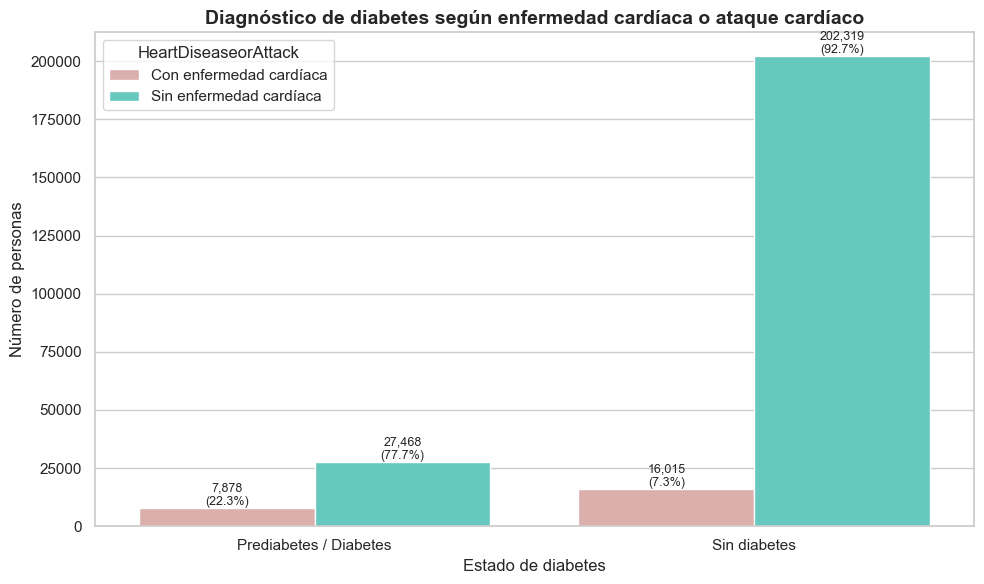

In [53]:
variable = "HeartDiseaseorAttack"

tabla_pct = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable],
    normalize="index"
) * 100

tabla_abs = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable]
)

plot_pct = (
    tabla_pct
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Porcentaje")
)

plot_abs = (
    tabla_abs
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Frecuencia")
)

plot_merged = plot_abs.merge(plot_pct, on=["Diabetes_binary", variable])

fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.barplot(
    data=plot_abs,
    x="Diabetes_binary",
    y="Frecuencia",
    hue=variable,
    palette=["#E2A8A4", "#56D8CB"]
)

for bar, (_, row) in zip(ax.patches, plot_merged.iterrows()):
    count = int(bar.get_height())
    pct = row["Porcentaje"]
    ax.annotate(
        f'{count:,}\n({pct:.1f}%)',
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
        ha='center',
        va='bottom',
        fontsize=9
    )

ax.set_title("Diagnóstico de diabetes según enfermedad cardíaca o ataque cardíaco",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Estado de diabetes")
ax.set_ylabel("Número de personas")

plt.tight_layout()
plt.show()

#### **11.1.6 Objetivo vs PhysActivity**

In [108]:
from scipy.stats import chi2_contingency

# Crear tabla de contingencia
variable = 'PhysActivity'
tabla_abs = pd.crosstab(df_viz[variable], df_viz[Objetivo], margins=True)
print("Tabla de contingencia:")
print(tabla_abs)
print("\n")

# Prueba chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_abs.iloc[:, :-1])

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

# Odds Ratio
# Calcular Odds Ratio solo si es tabla 2x2
if tabla_abs.iloc[:, :-1].shape == (2, 2):
    
    a = tabla_abs.iloc[0, 0]
    b = tabla_abs.iloc[0, 1]
    c = tabla_abs.iloc[1, 0]
    d = tabla_abs.iloc[1, 1]
    
    odds_ratio = (a * d) / (b * c)
    print("Odds Ratio (OR):", round(odds_ratio, 2))
    
else:
    print("Odds Ratio no aplica (tabla mayor a 2x2)")

Tabla de contingencia:
Diabetes_binary       Prediabetes / Diabetes  Sin diabetes     All
PhysActivity                                                      
Con actividad física                   22287        169633  191920
Sin actividad física                   13059         48701   61760
All                                    35346        218334  253680


Chi-cuadrado: 3540.21
Grados de libertad: 2
p-valor: 0.0
Odds Ratio no aplica (tabla mayor a 2x2)


La tabla de contingencia muestra diferencias claras en la práctica de actividad física según el estado diabético. En el grupo con **Prediabetes / Diabetes**, el 63.05% reporta realizar actividad física, mientras que el 36.95% no la realiza. En contraste, dentro del grupo **Sin diabetes**, el 77.69% realiza actividad física y el 22.31% no lo hace.

Estas diferencias porcentuales sugieren que la inactividad física es más frecuente en el grupo con alteraciones metabólicas. Desde el punto de vista estadístico, la prueba de independencia Chi-cuadrado arroja un estadístico de **χ² = 3539.42**, con 1 grado de libertad y un p-valor < 0.001, lo que proporciona evidencia suficiente para rechazar la hipótesis nula de independencia entre la actividad física y el estado diabético.

Adicionalmente, el Odds Ratio **(OR = 0.49)** indica que las probabilidades de presentar prediabetes/diabetes son aproximadamente 51% menores en individuos que realizan actividad física en comparación con aquellos que no la realizan. Un OR menor que 1 sugiere un efecto protector de la actividad física frente a la presencia de alteraciones metabólicas.

En consecuencia, se concluye que existe una asociación estadísticamente significativa y clínicamente relevante entre la práctica de actividad física y el estado diabético en la muestra analizada. Este hallazgo es consistente con la evidencia epidemiológica, que reconoce la actividad física como un factor protector frente al desarrollo de diabetes tipo 2 y otras alteraciones metabólicas.

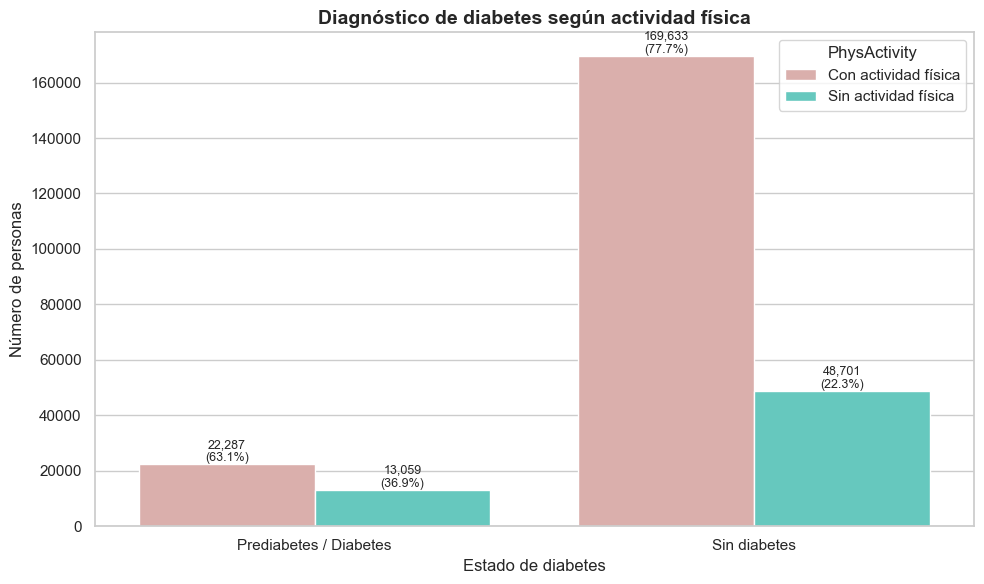

In [55]:
variable = "PhysActivity"

tabla_pct = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable],
    normalize="index"
) * 100

tabla_abs = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable]
)

plot_pct = (
    tabla_pct
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Porcentaje")
)

plot_abs = (
    tabla_abs
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Frecuencia")
)

plot_merged = plot_abs.merge(plot_pct, on=["Diabetes_binary", variable])

fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.barplot(
    data=plot_abs,
    x="Diabetes_binary",
    y="Frecuencia",
    hue=variable,
    palette=["#E2A8A4", "#56D8CB"]
)

for bar, (_, row) in zip(ax.patches, plot_merged.iterrows()):
    count = int(bar.get_height())
    pct = row["Porcentaje"]
    ax.annotate(
        f'{count:,}\n({pct:.1f}%)',
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
        ha='center',
        va='bottom',
        fontsize=9
    )

ax.set_title("Diagnóstico de diabetes según actividad física",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Estado de diabetes")
ax.set_ylabel("Número de personas")

plt.tight_layout()
plt.show()

#### **11.1.7 Objetivo vs Fruits**

In [109]:
from scipy.stats import chi2_contingency

# Crear tabla de contingencia
variable = 'Fruits'
tabla_abs = pd.crosstab(df_viz[variable], df_viz[Objetivo], margins=True)
print("Tabla de contingencia:")
print(tabla_abs)
print("\n")

# Prueba chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_abs.iloc[:, :-1])

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

# Odds Ratio
# Calcular Odds Ratio solo si es tabla 2x2
if tabla_abs.iloc[:, :-1].shape == (2, 2):
    
    a = tabla_abs.iloc[0, 0]
    b = tabla_abs.iloc[0, 1]
    c = tabla_abs.iloc[1, 0]
    d = tabla_abs.iloc[1, 1]
    
    odds_ratio = (a * d) / (b * c)
    print("Odds Ratio (OR):", round(odds_ratio, 2))
    
else:
    print("Odds Ratio no aplica (tabla mayor a 2x2)")

Tabla de contingencia:
Diabetes_binary           Prediabetes / Diabetes  Sin diabetes     All
Fruits                                                                
Consume frutas diario                      20693        140205  160898
No consume frutas diario                   14653         78129   92782
All                                        35346        218334  253680


Chi-cuadrado: 421.86
Grados de libertad: 2
p-valor: 2.4838961153120513e-92
Odds Ratio no aplica (tabla mayor a 2x2)


La tabla de contingencia muestra diferencias en el consumo diario de frutas según el estado diabético. En el grupo con **Prediabetes / Diabetes**, el 58.54% reporta consumir frutas diariamente, mientras que el 41.46% no lo hace. En contraste, en el grupo **Sin diabetes**, el 64.22% consume frutas diariamente y el 35.78% no lo hace.

Estas diferencias sugieren que el no consumo diario de frutas es ligeramente más frecuente en el grupo con alteraciones metabólicas. Desde el punto de vista estadístico, la prueba de independencia Chi-cuadrado arroja un estadístico de **χ² = 421.61**, con 1 grado de libertad y un p-valor < 0.001, lo que indica que existe evidencia estadísticamente significativa para rechazar la hipótesis nula de independencia entre el consumo de frutas y el estado diabético.

Adicionalmente, el Odds Ratio **(OR = 0.79)** indica que las probabilidades de presentar prediabetes/diabetes son aproximadamente 21% menores en individuos que consumen frutas diariamente en comparación con quienes no lo hacen. Al ser un OR menor que 1, sugiere un posible efecto protector leve asociado al consumo regular de frutas.

Sin embargo, aunque la asociación es estadísticamente significativa, la magnitud del efecto es moderada a baja en comparación con otras variables analizadas (como hipertensión o enfermedad cardíaca). En consecuencia, el consumo diario de frutas parece estar asociado con menor presencia de alteraciones metabólicas, pero su impacto relativo es menos fuerte que otros factores cardiometabólicos evaluados.

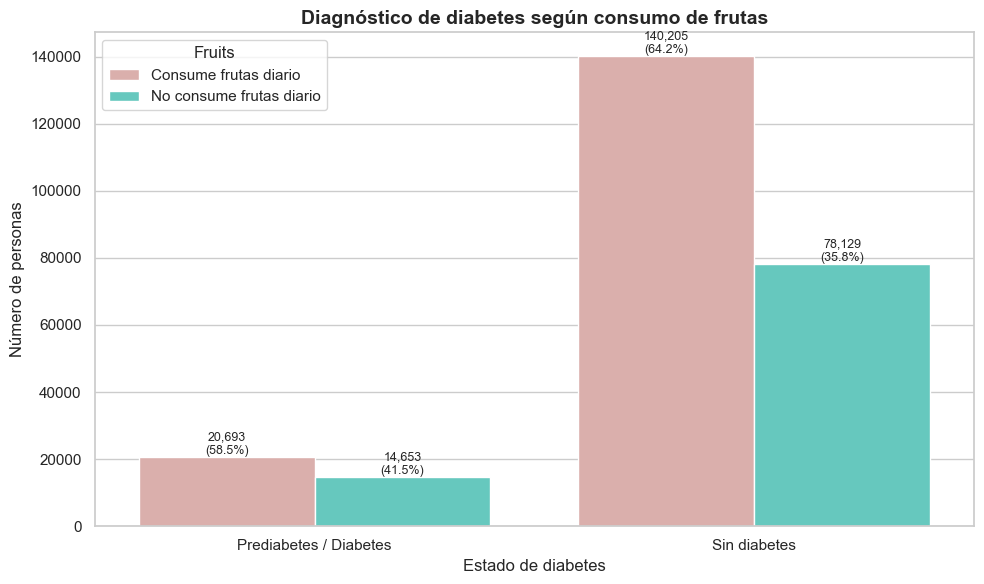

In [57]:


variable = "Fruits"

tabla_pct = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable],
    normalize="index"
) * 100

tabla_abs = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable]
)

plot_pct = (
    tabla_pct
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Porcentaje")
)

plot_abs = (
    tabla_abs
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Frecuencia")
)

plot_merged = plot_abs.merge(plot_pct, on=["Diabetes_binary", variable])

fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.barplot(
    data=plot_abs,
    x="Diabetes_binary",
    y="Frecuencia",
    hue=variable,
    palette=["#E2A8A4", "#56D8CB"]
)

for bar, (_, row) in zip(ax.patches, plot_merged.iterrows()):
    count = int(bar.get_height())
    pct = row["Porcentaje"]
    ax.annotate(
        f'{count:,}\n({pct:.1f}%)',
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
        ha='center',
        va='bottom',
        fontsize=9
    )

ax.set_title("Diagnóstico de diabetes según consumo de frutas",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Estado de diabetes")
ax.set_ylabel("Número de personas")

plt.tight_layout()
plt.show()

#### **11.1.8 Objetivo vs Veggies**

In [110]:
from scipy.stats import chi2_contingency

# Crear tabla de contingencia
variable = 'Veggies'
tabla_abs = pd.crosstab(df_viz[variable], df_viz[Objetivo], margins=True)
print("Tabla de contingencia:")
print(tabla_abs)
print("\n")

# Prueba chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_abs.iloc[:, :-1])

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

# Odds Ratio
# Calcular Odds Ratio solo si es tabla 2x2
if tabla_abs.iloc[:, :-1].shape == (2, 2):
    
    a = tabla_abs.iloc[0, 0]
    b = tabla_abs.iloc[0, 1]
    c = tabla_abs.iloc[1, 0]
    d = tabla_abs.iloc[1, 1]
    
    odds_ratio = (a * d) / (b * c)
    print("Odds Ratio (OR):", round(odds_ratio, 2))
    
else:
    print("Odds Ratio no aplica (tabla mayor a 2x2)")

Tabla de contingencia:
Diabetes_binary             Prediabetes / Diabetes  Sin diabetes     All
Veggies                                                                 
Consume verduras diario                      26736        179105  205841
No consume verduras diario                    8610         39229   47839
All                                          35346        218334  253680


Chi-cuadrado: 812.22
Grados de libertad: 2
p-valor: 4.245008168942297e-177
Odds Ratio no aplica (tabla mayor a 2x2)


La tabla de contingencia muestra diferencias en el consumo diario de verduras según el estado diabético. En el grupo con **Prediabetes / Diabetes**, el 75.64% reporta consumir verduras diariamente, mientras que el 24.36% no lo hace. En contraste, dentro del grupo Sin diabetes, el 82.03% consume verduras diariamente y el 17.97% no lo hace.

Estas diferencias sugieren que el no consumo diario de verduras es más frecuente en el grupo con alteraciones metabólicas. Desde el punto de vista estadístico, la prueba de independencia Chi-cuadrado arroja un estadístico de **χ² = 811.81**, con 1 grado de libertad y un p-valor < 0.001, lo que indica evidencia estadísticamente significativa para rechazar la hipótesis nula de independencia entre el consumo de verduras y el estado diabético.

Adicionalmente, el Odds Ratio **(OR = 0.68)** indica que las probabilidades de presentar prediabetes/diabetes son aproximadamente 32% menores en individuos que consumen verduras diariamente en comparación con quienes no lo hacen. Al ser un OR menor que 1, este resultado sugiere un efecto protector moderado asociado al consumo regular de verduras.

En consecuencia, se concluye que existe una asociación estadísticamente significativa y epidemiológicamente relevante entre el consumo diario de verduras y la presencia de prediabetes/diabetes en la muestra analizada. Este hallazgo es coherente con la evidencia científica que vincula dietas ricas en vegetales con menor riesgo de alteraciones metabólicas y enfermedades crónicas.

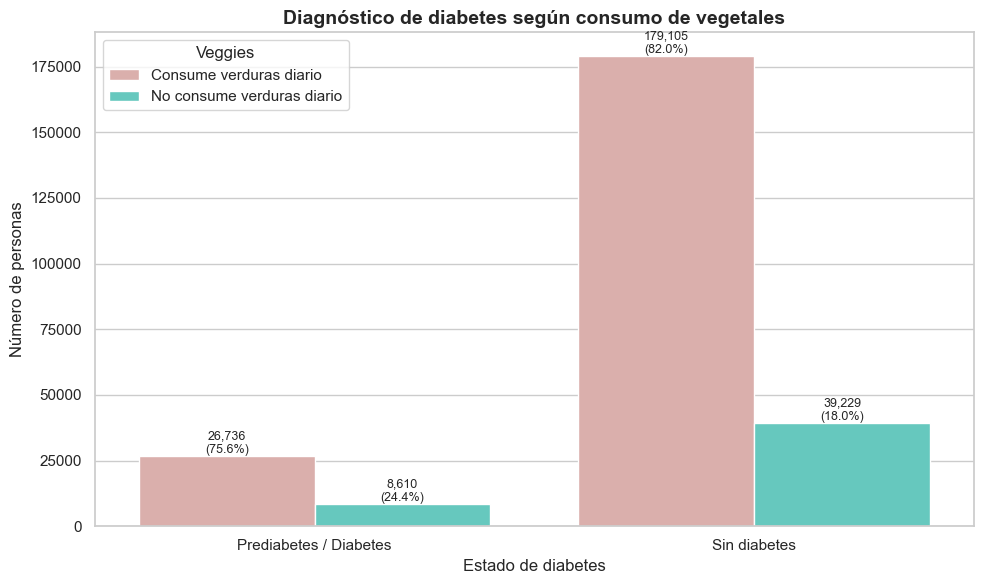

In [59]:

variable = "Veggies"

tabla_pct = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable],
    normalize="index"
) * 100

tabla_abs = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable]
)

plot_pct = (
    tabla_pct
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Porcentaje")
)

plot_abs = (
    tabla_abs
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Frecuencia")
)

plot_merged = plot_abs.merge(plot_pct, on=["Diabetes_binary", variable])

fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.barplot(
    data=plot_abs,
    x="Diabetes_binary",
    y="Frecuencia",
    hue=variable,
    palette=["#E2A8A4", "#56D8CB"]
)

for bar, (_, row) in zip(ax.patches, plot_merged.iterrows()):
    count = int(bar.get_height())
    pct = row["Porcentaje"]
    ax.annotate(
        f'{count:,}\n({pct:.1f}%)',
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
        ha='center',
        va='bottom',
        fontsize=9
    )

ax.set_title("Diagnóstico de diabetes según consumo de vegetales",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Estado de diabetes")
ax.set_ylabel("Número de personas")

plt.tight_layout()
plt.show()

#### **11.1.9 Objetivo vs HvyAlcoholConsump**

In [111]:
from scipy.stats import chi2_contingency

# Crear tabla de contingencia
variable = 'HvyAlcoholConsump'
tabla_abs = pd.crosstab(df_viz[variable], df_viz[Objetivo], margins=True)
print("Tabla de contingencia:")
print(tabla_abs)
print("\n")

# Prueba chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_abs.iloc[:, :-1])

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

# Odds Ratio
# Calcular Odds Ratio solo si es tabla 2x2
if tabla_abs.iloc[:, :-1].shape == (2, 2):
    
    a = tabla_abs.iloc[0, 0]
    b = tabla_abs.iloc[0, 1]
    c = tabla_abs.iloc[1, 0]
    d = tabla_abs.iloc[1, 1]
    
    odds_ratio = (a * d) / (b * c)
    print("Odds Ratio (OR):", round(odds_ratio, 2))
    
else:
    print("Odds Ratio no aplica (tabla mayor a 2x2)")

Tabla de contingencia:
Diabetes_binary          Prediabetes / Diabetes  Sin diabetes     All
HvyAlcoholConsump                                                    
Consumo alto alcohol                        832         13424   14256
No consumo alto alcohol                   34514        204910  239424
All                                       35346        218334  253680


Chi-cuadrado: 825.83
Grados de libertad: 2
p-valor: 4.703492433932001e-180
Odds Ratio no aplica (tabla mayor a 2x2)


La tabla de contingencia muestra diferencias en el consumo alto de alcohol según el estado diabético. En el grupo con **Prediabetes / Diabetes**, el 2.35% reporta consumo alto de alcohol, mientras que el 97.65% no presenta este patrón de consumo. En contraste, en el grupo Sin diabetes, el 6.15% reporta consumo alto de alcohol y el 93.85% no lo presenta.

A simple vista, el consumo alto de alcohol parece ser menos frecuente en el grupo con alteraciones metabólicas. Desde el punto de vista estadístico, la prueba de independencia Chi-cuadrado arroja un estadístico de **χ² = 825.12**, con 1 grado de libertad y un p-valor < 0.001, lo que indica evidencia estadísticamente significativa para rechazar la hipótesis nula de independencia entre el consumo alto de alcohol y el estado diabético.

Adicionalmente, el Odds Ratio **(OR = 0.37)**indica que las probabilidades de presentar prediabetes/diabetes son aproximadamente 63% menores en individuos con consumo alto de alcohol en comparación con aquellos que no presentan este patrón de consumo. Sin embargo, este resultado debe interpretarse con cautela. Un OR menor que 1 no implica necesariamente que el consumo alto de alcohol sea protector; más bien, podría reflejar factores de confusión, cambios en el comportamiento tras el diagnóstico (reducción del consumo después de ser diagnosticado) o sesgos asociados al autorreporte.

En consecuencia, aunque existe una asociación estadísticamente significativa entre el consumo alto de alcohol y el estado diabético en la muestra analizada, la dirección aparente del efecto debe analizarse con prudencia desde el punto de vista epidemiológico y no debe interpretarse como un efecto protector causal.

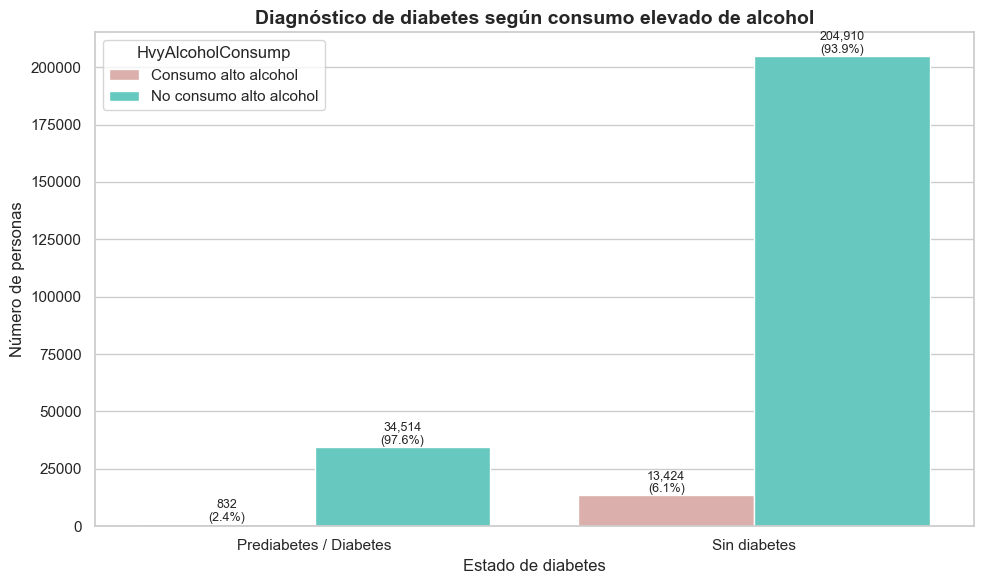

In [61]:
variable = "HvyAlcoholConsump"

tabla_pct = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable],
    normalize="index"
) * 100

tabla_abs = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable]
)

plot_pct = (
    tabla_pct
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Porcentaje")
)

plot_abs = (
    tabla_abs
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Frecuencia")
)

plot_merged = plot_abs.merge(plot_pct, on=["Diabetes_binary", variable])

fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.barplot(
    data=plot_abs,
    x="Diabetes_binary",
    y="Frecuencia",
    hue=variable,
    palette=["#E2A8A4", "#56D8CB"]
)

for bar, (_, row) in zip(ax.patches, plot_merged.iterrows()):
    count = int(bar.get_height())
    pct = row["Porcentaje"]
    ax.annotate(
        f'{count:,}\n({pct:.1f}%)',
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
        ha='center',
        va='bottom',
        fontsize=9
    )

ax.set_title("Diagnóstico de diabetes según consumo elevado de alcohol",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Estado de diabetes")
ax.set_ylabel("Número de personas")

plt.tight_layout()
plt.show()

#### **11.1.10 Objetivo vs AnyHealthcare**

In [112]:
from scipy.stats import chi2_contingency

# Crear tabla de contingencia
variable = 'AnyHealthcare'
tabla_abs = pd.crosstab(df_viz[variable], df_viz[Objetivo], margins=True)
print("Tabla de contingencia:")
print(tabla_abs)
print("\n")

# Prueba chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_abs.iloc[:, :-1])

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

# Odds Ratio
# Calcular Odds Ratio solo si es tabla 2x2
if tabla_abs.iloc[:, :-1].shape == (2, 2):
    
    a = tabla_abs.iloc[0, 0]
    b = tabla_abs.iloc[0, 1]
    c = tabla_abs.iloc[1, 0]
    d = tabla_abs.iloc[1, 1]
    
    odds_ratio = (a * d) / (b * c)
    print("Odds Ratio (OR):", round(odds_ratio, 2))
    
else:
    print("Odds Ratio no aplica (tabla mayor a 2x2)")

Tabla de contingencia:
Diabetes_binary       Prediabetes / Diabetes  Sin diabetes     All
AnyHealthcare                                                     
Con cobertura médica                   33924        207339  241263
Sin cobertura médica                    1422         10995   12417
All                                    35346        218334  253680


Chi-cuadrado: 67.03
Grados de libertad: 2
p-valor: 2.784027985036628e-15
Odds Ratio no aplica (tabla mayor a 2x2)


La tabla de contingencia muestra diferencias leves en la cobertura médica según el estado diabético. En el grupo con **Prediabetes / Diabetes**, el 95.98% reporta contar con cobertura médica, mientras que el 4.02% no la tiene. En contraste, dentro del grupo **Sin diabetes**, el 94.96% tiene cobertura y el 5.04% no la tiene.

Aunque la diferencia porcentual es pequeña (aproximadamente 1 punto porcentual), la prueba de independencia Chi-cuadrado arroja un estadístico de **χ² = 66.81**, con 1 grado de libertad y un p-valor < 0.001, lo que indica que la asociación es estadísticamente significativa. Sin embargo, dado el gran tamaño muestral, incluso diferencias pequeñas pueden resultar significativas desde el punto de vista estadístico.

El Odds Ratio **(OR = 1.27)** indica que las probabilidades de presentar prediabetes/diabetes son aproximadamente 27% mayores en individuos con cobertura médica en comparación con quienes no la tienen. Este resultado no debe interpretarse como que la cobertura médica aumente el riesgo; más bien, probablemente refleja un mayor acceso al diagnóstico y al sistema de salud en personas que cuentan con cobertura, lo que incrementa la probabilidad de detección de la enfermedad.

En consecuencia, aunque existe una asociación estadísticamente significativa entre la cobertura médica y el estado diabético en la muestra analizada, la magnitud del efecto es baja y su interpretación debe contextualizarse en términos de acceso a servicios de salud y detección oportuna, más que como un factor de riesgo causal.

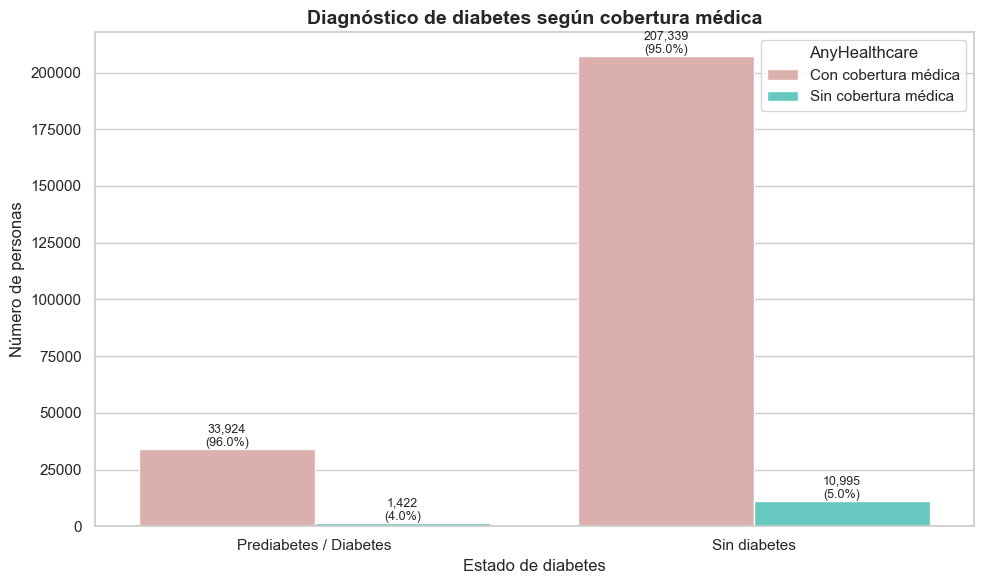

In [63]:
variable = "AnyHealthcare"

tabla_pct = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable],
    normalize="index"
) * 100

tabla_abs = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable]
)

plot_pct = (
    tabla_pct
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Porcentaje")
)

plot_abs = (
    tabla_abs
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Frecuencia")
)

plot_merged = plot_abs.merge(plot_pct, on=["Diabetes_binary", variable])

fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.barplot(
    data=plot_abs,
    x="Diabetes_binary",
    y="Frecuencia",
    hue=variable,
    palette=["#E2A8A4", "#56D8CB"]
)

for bar, (_, row) in zip(ax.patches, plot_merged.iterrows()):
    count = int(bar.get_height())
    pct = row["Porcentaje"]
    ax.annotate(
        f'{count:,}\n({pct:.1f}%)',
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
        ha='center',
        va='bottom',
        fontsize=9
    )

ax.set_title("Diagnóstico de diabetes según cobertura médica",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Estado de diabetes")
ax.set_ylabel("Número de personas")

plt.tight_layout()
plt.show()

#### **11.1.11 Objetivo vs NoDocbcCost**

In [113]:
from scipy.stats import chi2_contingency

# Crear tabla de contingencia
variable = 'NoDocbcCost'
tabla_abs = pd.crosstab(df_viz[variable], df_viz[Objetivo], margins=True)
print("Tabla de contingencia:")
print(tabla_abs)
print("\n")

# Prueba chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_abs.iloc[:, :-1])

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

# Odds Ratio
# Calcular Odds Ratio solo si es tabla 2x2
if tabla_abs.iloc[:, :-1].shape == (2, 2):
    
    a = tabla_abs.iloc[0, 0]
    b = tabla_abs.iloc[0, 1]
    c = tabla_abs.iloc[1, 0]
    d = tabla_abs.iloc[1, 1]
    
    odds_ratio = (a * d) / (b * c)
    print("Odds Ratio (OR):", round(odds_ratio, 2))
    
else:
    print("Odds Ratio no aplica (tabla mayor a 2x2)")

Tabla de contingencia:
Diabetes_binary        Prediabetes / Diabetes  Sin diabetes     All
NoDocbcCost                                                        
Con barrera económica                    3742         17612   21354
Sin barrera económica                   31604        200722  232326
All                                     35346        218334  253680


Chi-cuadrado: 250.64
Grados de libertad: 2
p-valor: 3.7505380810197325e-55
Odds Ratio no aplica (tabla mayor a 2x2)


La tabla de contingencia muestra diferencias en la presencia de barreras económicas para acceder a servicios médicos según el estado diabético. En el grupo con **Prediabetes / Diabetes**, el 10.59% reporta haber tenido una barrera económica para consultar al médico, mientras que el 89.41% no la reporta. En contraste, en el grupo **Sin diabetes**, el 8.07% presenta esta barrera y el 91.93% no la presenta.

Estas diferencias sugieren que las barreras económicas para el acceso a la atención médica son ligeramente más frecuentes en el grupo con alteraciones metabólicas. Desde el punto de vista estadístico, la prueba de independencia Chi-cuadrado arroja un estadístico de **χ² = 250.31**, con 1 grado de libertad y un p-valor < 0.001, lo que indica que existe evidencia estadísticamente significativa para rechazar la hipótesis nula de independencia entre la presencia de barreras económicas y el estado diabético.

El Odds Ratio **(OR = 1.35)** indica que las probabilidades de presentar prediabetes/diabetes son aproximadamente 35% mayores en individuos que reportan barreras económicas para acceder al médico, en comparación con aquellos que no las reportan. Aunque la magnitud del efecto es moderada, el resultado sugiere una asociación relevante desde el punto de vista social y estructural.

En consecuencia, se concluye que existe una asociación estadísticamente significativa entre las barreras económicas en el acceso a la atención médica y el estado diabético en la muestra analizada. Este hallazgo puede reflejar desigualdades en el acceso a servicios preventivos y de control, lo que podría influir tanto en el diagnóstico oportuno como en el manejo adecuado de la enfermedad.

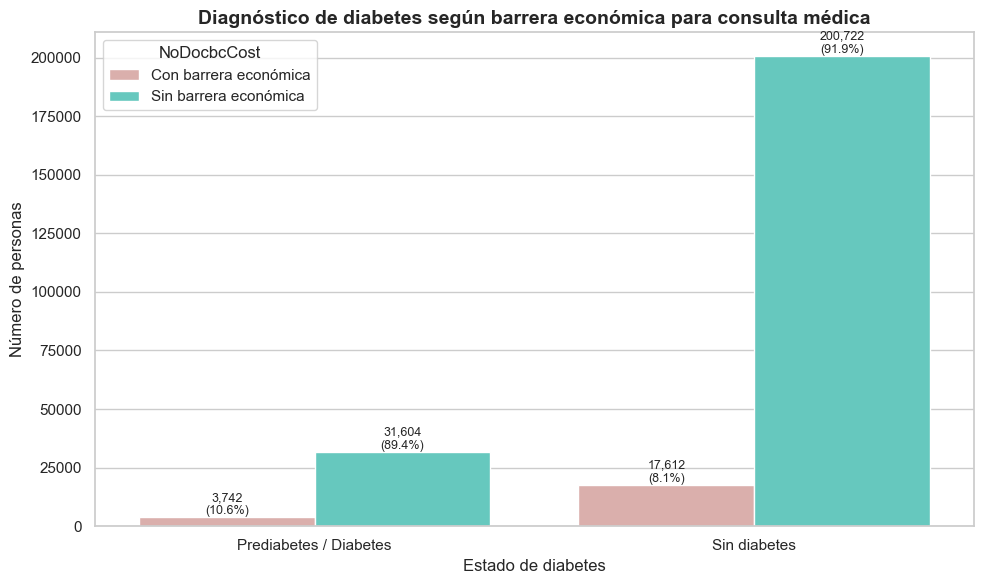

In [65]:
variable = "NoDocbcCost"

tabla_pct = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable],
    normalize="index"
) * 100

tabla_abs = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable]
)

plot_pct = (
    tabla_pct
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Porcentaje")
)

plot_abs = (
    tabla_abs
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Frecuencia")
)

plot_merged = plot_abs.merge(plot_pct, on=["Diabetes_binary", variable])

fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.barplot(
    data=plot_abs,
    x="Diabetes_binary",
    y="Frecuencia",
    hue=variable,
    palette=["#E2A8A4", "#56D8CB"]
)

for bar, (_, row) in zip(ax.patches, plot_merged.iterrows()):
    count = int(bar.get_height())
    pct = row["Porcentaje"]
    ax.annotate(
        f'{count:,}\n({pct:.1f}%)',
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
        ha='center',
        va='bottom',
        fontsize=9
    )

ax.set_title("Diagnóstico de diabetes según barrera económica para consulta médica",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Estado de diabetes")
ax.set_ylabel("Número de personas")

plt.tight_layout()
plt.show()

#### **11.1.12 Objetivo vs DiffWalk**

In [114]:
from scipy.stats import chi2_contingency

# Crear tabla de contingencia
variable = 'DiffWalk'
tabla_abs = pd.crosstab(df_viz[variable], df_viz[Objetivo], margins=True)
print("Tabla de contingencia:")
print(tabla_abs)
print("\n")

# Prueba chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_abs.iloc[:, :-1])

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

# Odds Ratio
# Calcular Odds Ratio solo si es tabla 2x2
if tabla_abs.iloc[:, :-1].shape == (2, 2):
    
    a = tabla_abs.iloc[0, 0]
    b = tabla_abs.iloc[0, 1]
    c = tabla_abs.iloc[1, 0]
    d = tabla_abs.iloc[1, 1]
    
    odds_ratio = (a * d) / (b * c)
    print("Odds Ratio (OR):", round(odds_ratio, 2))
    
else:
    print("Odds Ratio no aplica (tabla mayor a 2x2)")

Tabla de contingencia:
Diabetes_binary            Prediabetes / Diabetes  Sin diabetes     All
DiffWalk                                                               
Con dificultad al caminar                   13121         29554   42675
Sin dificultad al caminar                   22225        188780  211005
All                                         35346        218334  253680


Chi-cuadrado: 12094.01
Grados de libertad: 2
p-valor: 0.0
Odds Ratio no aplica (tabla mayor a 2x2)


La tabla de contingencia evidencia una diferencia marcada en la presencia de dificultad para caminar según el estado diabético. En el grupo con **Prediabetes / Diabetes**, el 37.12% reporta presentar dificultad al caminar, mientras que el 62.88% no la presenta. En contraste, dentro del grupo Sin diabetes, solo el 13.54% reporta dificultad al caminar y el 86.46% no presenta esta condición.

La diferencia porcentual es considerable (más de 23 puntos porcentuales), lo que sugiere una asociación fuerte entre ambas variables. Desde el punto de vista estadístico, la prueba de independencia Chi-cuadrado arroja un estadístico de **χ² = 12092.32**, con 1 grado de libertad y un p-valor < 0.001, lo que indica evidencia altamente significativa para rechazar la hipótesis nula de independencia entre la dificultad para caminar y el estado diabético.

Adicionalmente, el Odds Ratio **(OR = 3.77)** indica que las probabilidades de presentar prediabetes/diabetes son aproximadamente 3.8 veces mayores en individuos que reportan dificultad para caminar en comparación con quienes no la presentan. Este valor refleja una asociación de magnitud fuerte desde el punto de vista epidemiológico.

En consecuencia, se concluye que existe una asociación estadísticamente significativa y clínicamente relevante entre la dificultad para caminar y el diagnóstico de prediabetes/diabetes en la muestra analizada. Este hallazgo es coherente con la literatura, ya que la diabetes se asocia frecuentemente con complicaciones como neuropatía periférica, alteraciones vasculares y limitaciones funcionales que pueden afectar la movilidad.

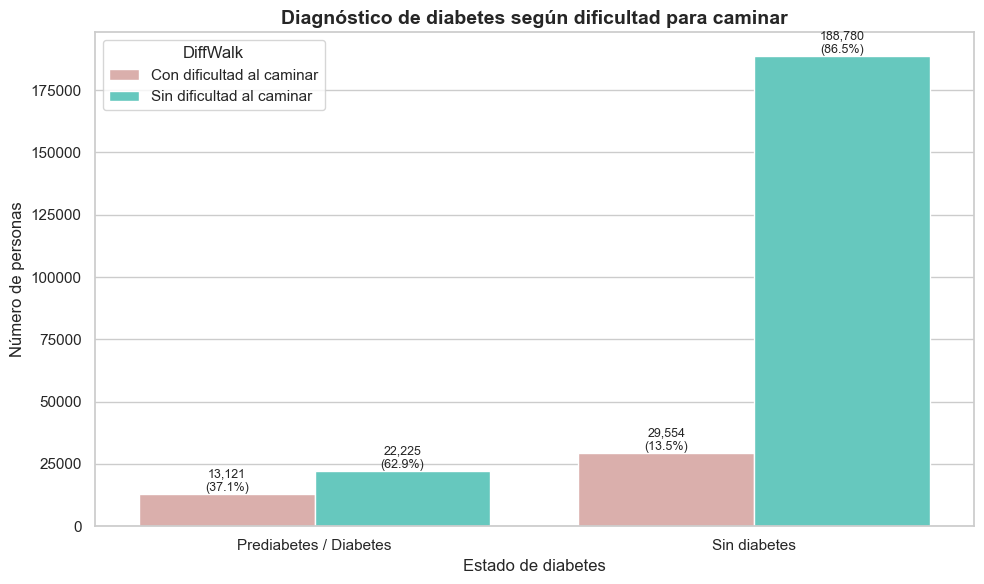

In [67]:
variable = "DiffWalk"

tabla_pct = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable],
    normalize="index"
) * 100

tabla_abs = pd.crosstab(
    df_viz["Diabetes_binary"],
    df_viz[variable]
)

plot_pct = (
    tabla_pct
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Porcentaje")
)

plot_abs = (
    tabla_abs
    .reset_index()
    .melt(id_vars="Diabetes_binary",
          var_name=variable,
          value_name="Frecuencia")
)

plot_merged = plot_abs.merge(plot_pct, on=["Diabetes_binary", variable])

fig, ax = plt.subplots(figsize=(10, 6))

ax = sns.barplot(
    data=plot_abs,
    x="Diabetes_binary",
    y="Frecuencia",
    hue=variable,
    palette=["#E2A8A4", "#56D8CB"]
)

for bar, (_, row) in zip(ax.patches, plot_merged.iterrows()):
    count = int(bar.get_height())
    pct = row["Porcentaje"]
    ax.annotate(
        f'{count:,}\n({pct:.1f}%)',
        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
        ha='center',
        va='bottom',
        fontsize=9
    )

ax.set_title("Diagnóstico de diabetes según dificultad para caminar",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Estado de diabetes")
ax.set_ylabel("Número de personas")

plt.tight_layout()
plt.show()

### **11.2 Variable objetivo vs variables categóricas ordinales**

#### **11.2.1 Objetivo vs GenHlth**

In [ ]:
genhlth_labels = {
    1: "Excelente",
    2: "Muy buena",
    3: "Buena",
    4: "Regular",
    5: "Mala"
}

# Asegurar códigos 1-5
inv_genhlth = {v: k for k, v in genhlth_labels.items()}

gen = df_viz["GenHlth"]

if gen.dtype.name == "category" or gen.dtype == object:
    gen_codes = gen.map(inv_genhlth)
else:
    gen_codes = gen

# Tabla absoluta
tabla_abs = pd.crosstab(gen_codes, df_viz["Diabetes_binary"])
tabla_abs = tabla_abs.reindex([1,2,3,4,5])

# Totales
total_general = tabla_abs.sum(axis=1)
n_total = total_general.sum()

# Porcentajes por grupo
tabla_pct_col = tabla_abs.div(tabla_abs.sum(axis=0), axis=1) * 100

# Porcentaje total
pct_total = (total_general / n_total) * 100

# Asegurar nombres correctos (orden fijo)
no_col = "Sin diabetes"
si_col = "Prediabetes / Diabetes"

# Construir tabla final
tabla_genhlth_final = pd.DataFrame({
    "Código": [1,2,3,4,5],
    "Descripción": [genhlth_labels[i] for i in [1,2,3,4,5]],
    "Sin diabetes (N)": tabla_abs[no_col].values,
    "Sin diabetes (%)": tabla_pct_col[no_col].round(2).values,
    "Prediabetes/Diabetes (N)": tabla_abs[si_col].values,
    "Prediabetes/Diabetes (%)": tabla_pct_col[si_col].round(2).values,
    "Total (N)": total_general.values,
    "Total (%)": pct_total.round(2).values
})

display(tabla_genhlth_final.style.hide(axis="index"))

Código,Descripción,Sin diabetes (N),Sin diabetes (%),Prediabetes/Diabetes (N),Prediabetes/Diabetes (%),Total (N),Total (%)
1,Excelente,44159,20.230000,1140,3.230000,45299,17.860000
2,Muy buena,82703,37.880000,6381,18.050000,89084,35.120000
3,Buena,62189,28.480000,13457,38.070000,75646,29.820000
4,Regular,21780,9.980000,9790,27.700000,31570,12.440000
5,Mala,7503,3.440000,4578,12.950000,12081,4.760000


In [ ]:
# Tabla absoluta 
tabla_chi = pd.crosstab(gen_codes, df_viz["Diabetes_binary"])

chi2, p, dof, expected = chi2_contingency(tabla_chi)

print("Chi-cuadrado:", round(chi2,2))
print("Grados de libertad:", dof)
print("p-valor:", p)

n = tabla_chi.sum().sum()

cramers_v = np.sqrt(chi2 / (n * (min(tabla_chi.shape)-1)))

print("Cramér's V:", round(cramers_v,3))

Chi-cuadrado: 22728.07
Grados de libertad: 4
p-valor: 0.0
Cramér's V: 0.299


En ``GenHlth``, la distribución cambia fuerte entre grupos. En el grupo Sin diabetes, la mayor parte se concentra en categorías favorables: “Muy buena” (37.88%) y “Excelente” (20.23%), mientras que “Mala” representa solo 3.44%. En contraste, en Prediabetes/Diabetes la categoría más frecuente es “Buena” (38.07%), y aparecen proporciones mucho más altas en estados menos favorables: “Regular” (27.70%) y “Mala” (12.95%), mientras que “Excelente” baja a 3.23%. Esto evidencia un desplazamiento desde categorías “mejores” hacia categorías “peores” en quienes tienen prediabetes/diabetes.

La prueba Chi-cuadrado de independencia arroja un estadístico ``χ² = 22 728.07`` con 4 grados de libertad y un p-valor < 0.001, lo que indica que existe una asociación estadísticamente significativa entre el estado de salud general (GenHlth) y la presencia de prediabetes/diabetes. En consecuencia, se rechaza la hipótesis nula de independencia entre las variables.

El tamaño del efecto, medido mediante Cramér’s ``V = 0.299``, sugiere una asociación de magnitud moderada. Esto implica que la relación no solo es significativa por el gran tamaño muestral, sino que también presenta relevancia práctica.

En términos sustantivos, la distribución muestra un desplazamiento claro: las personas con prediabetes/diabetes se concentran en mayor proporción en las categorías “Regular” y “Mala”, mientras que el grupo sin diabetes presenta mayor frecuencia en “Excelente” y “Muy buena”. En conjunto, la evidencia respalda que un peor estado de salud general se asocia de manera consistente con el estado diabético.

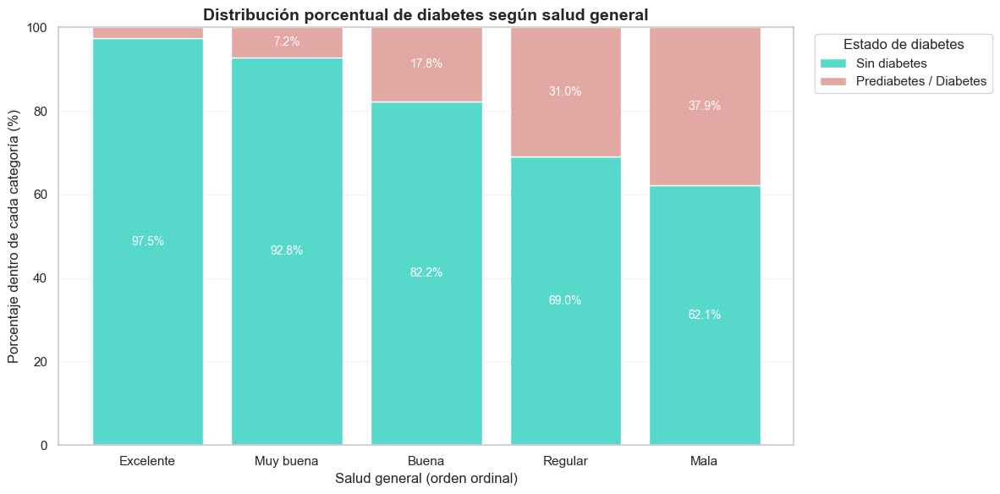

In [70]:


# Orden correcto
orden_gen = ["Excelente", "Muy buena", "Buena", "Regular", "Mala"]

map_gen = {1:"Excelente", 2:"Muy buena", 3:"Buena", 4:"Regular", 5:"Mala"}

gen = df_viz["GenHlth"].copy()

# Si viene numérica, convertir a etiquetas
gen_num = pd.to_numeric(gen, errors="coerce")
if gen_num.notna().any():
    gen = gen_num.map(map_gen).fillna(gen)


tabla_pct = pd.crosstab(
    gen,
    df_viz["Diabetes_binary"],
    normalize="index"
) * 100

tabla_pct = tabla_pct.reindex(orden_gen)

cols_order = [c for c in ["Sin diabetes", "Prediabetes / Diabetes"] if c in tabla_pct.columns]
if len(cols_order) == 0:
    cols_order = tabla_pct.columns.tolist()

tabla_pct = tabla_pct[cols_order]

# ====== Gráfico ======
fig, ax = plt.subplots(figsize=(12, 6))

bottom = np.zeros(len(tabla_pct))
x = np.arange(len(tabla_pct.index))

coral = "#E2A8A4"
aqua = "#56D8CB"

colors = {
    "Sin diabetes": aqua,
    "Prediabetes / Diabetes": coral
}

for col in tabla_pct.columns:
    bars = ax.bar(
        tabla_pct.index,
        tabla_pct[col],
        bottom=bottom,
        label=col,
        color=colors.get(col, "#999999")  # por si el nombre cambia
    )

    # Etiquetas
    for i, b in enumerate(bars):
        val = tabla_pct[col].iloc[i]
        if val >= 3:
            ax.text(
                b.get_x() + b.get_width()/2,
                bottom[i] + val/2,
                f"{val:.1f}%",
                ha="center",
                va="center",
                fontsize=10,
                color="white"  # se ve mejor sobre coral
            )
    bottom += tabla_pct[col].values

ax.set_title("Distribución porcentual de diabetes según salud general",
             fontsize=14, fontweight="bold")

ax.set_ylabel("Porcentaje dentro de cada categoría (%)")
ax.set_xlabel("Salud general (orden ordinal)")
ax.set_ylim(0, 100)

ax.grid(axis="y", alpha=0.25)
ax.set_axisbelow(True)

ax.legend(title="Estado de diabetes", bbox_to_anchor=(1.02, 1), loc="upper left")

plt.tight_layout()
plt.show()

#### **11.2.2 Objetivo vs Age**

In [ ]:
# 1) Mapeo oficial (código -> descripción)
age_labels = {
    1: "18–24", 2: "25–29", 3: "30–34", 4: "35–39",
    5: "40–44", 6: "45–49", 7: "50–54", 8: "55–59",
    9: "60–64", 10: "65–69", 11: "70–74", 12: "75–79", 13: "80+"
}

# 2) Normalizar Age a código 1..13 en una columna auxiliar
#    - si ya viene numérica 1..13: se queda igual
#    - si viene como texto ("18-24", "18–24", "80+"): se convierte usando mapeo inverso
age_inverse = {v.replace("–", "-"): k for k, v in age_labels.items()}
age_inverse.update({v: k for k, v in age_labels.items()})  # por si ya trae “–”

# Crear Age_code robusto
if pd.api.types.is_numeric_dtype(df_viz["Age"]):
    df_viz["Age_code"] = df_viz["Age"].astype(int)
else:
    df_viz["Age_code"] = (
        df_viz["Age"]
        .astype(str)
        .str.strip()
        .str.replace("–", "-", regex=False)   # normaliza guion
        .map(age_inverse)
    )

# (Opcional) si quieres ver si hay valores sin mapear:
# print("No mapeados:", df_viz["Age_code"].isna().sum())

# 3) Tabla absoluta (por código)
tabla_abs = pd.crosstab(df_viz["Age_code"], df_viz["Diabetes_binary"]).sort_index()

# 4) Porcentajes por columna (distribución dentro de cada grupo)
tabla_pct = pd.crosstab(df_viz["Age_code"], df_viz["Diabetes_binary"], normalize="columns") * 100
tabla_pct = tabla_pct.reindex(tabla_abs.index)

# 5) Totales
total_abs = tabla_abs.sum(axis=1)
total_pct = (total_abs / total_abs.sum()) * 100

# 6) Armar salida final
col_no = "Sin diabetes"
col_si = "Prediabetes / Diabetes"

salida = pd.DataFrame({
    "Código": tabla_abs.index.astype(int),
    "Descripción": tabla_abs.index.astype(int).map(age_labels),

    "Sin diabetes (N)": tabla_abs.get(col_no, 0).values,
    "Sin diabetes (%)": tabla_pct.get(col_no, 0).round(2).values,

    "Prediabetes/Diabetes (N)": tabla_abs.get(col_si, 0).values,
    "Prediabetes/Diabetes (%)": tabla_pct.get(col_si, 0).round(2).values,

    "Total (N)": total_abs.values,
    "Total (%)": total_pct.round(2).values
}).reset_index(drop=True)

# 7) Mostrar sin el index de la izquierda (visual)
display(salida.style.hide(axis="index"))

Código,Descripción,Sin diabetes (N),Sin diabetes (%),Prediabetes/Diabetes (N),Prediabetes/Diabetes (%),Total (N),Total (%)
1,18–24,5622,2.570000,78,0.220000,5700,2.250000
2,25–29,7458,3.420000,140,0.400000,7598,3.000000
3,30–34,10809,4.950000,314,0.890000,11123,4.380000
4,35–39,13197,6.040000,626,1.770000,13823,5.450000
5,40–44,15106,6.920000,1051,2.970000,16157,6.370000
6,45–49,18077,8.280000,1742,4.930000,19819,7.810000
7,50–54,23226,10.640000,3088,8.740000,26314,10.370000
8,55–59,26569,12.170000,4263,12.060000,30832,12.150000
9,60–64,27511,12.600000,5733,16.220000,33244,13.100000
10,65–69,25636,11.740000,6558,18.550000,32194,12.690000


In [72]:

tabla_chi = pd.crosstab(df_viz["Age_code"], df_viz["Diabetes_binary"]).sort_index()

chi2, p, dof, expected = chi2_contingency(tabla_chi)

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

# Tamaño del efecto: Cramér's V
n = tabla_chi.to_numpy().sum()
k = min(tabla_chi.shape) - 1  # min(r-1, c-1) para Cramér
cramers_v = np.sqrt(chi2 / (n * k)) if k > 0 else np.nan

print("Cramér's V:", round(cramers_v, 3))

Chi-cuadrado: 8795.05
Grados de libertad: 12
p-valor: 0.0
Cramér's V: 0.186


En relación con la variable grupo de ``edad``, la distribución descriptiva evidencia un incremento progresivo en la proporción de individuos con prediabetes/diabetes a medida que aumenta la edad. Mientras que en los grupos más jóvenes (18–24 y 25–29) la frecuencia de casos es considerablemente baja, a partir de los 45 años se observa un aumento sostenido, alcanzando sus valores más elevados entre los 60 y 74 años, donde la proporción de individuos con condición diabética supera ampliamente la observada en edades tempranas. 

La prueba de independencia Chi-cuadrado confirmó que esta asociación es estadísticamente significativa ``(χ²=8795.05; gl=12; p<0.001)``. Asimismo, el tamaño del efecto medido mediante Cramér’s V ``(V=0.186)`` indica una asociación de magnitud pequeña a moderada, lo que sugiere que, aunque la edad no determina por sí sola el estado diabético, sí constituye un factor estructural relevante en su distribución poblacional.
 
Estos resultados son coherentes con la evidencia epidemiológica que identifica el envejecimiento como un determinante importante del riesgo de diabetes tipo 2.

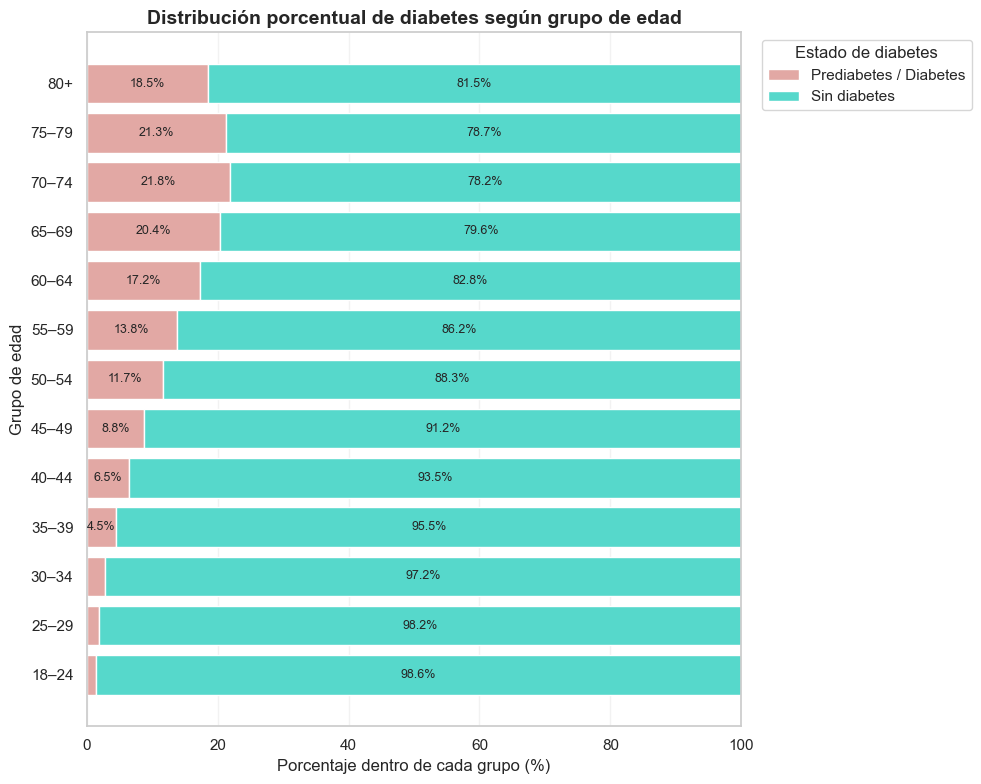

In [73]:

# Mapeo códigos -> etiqueta
age_labels = {
    1: "18–24", 2: "25–29", 3: "30–34", 4: "35–39",
    5: "40–44", 6: "45–49", 7: "50–54", 8: "55–59",
    9: "60–64", 10: "65–69", 11: "70–74",
    12: "75–79", 13: "80+"
}

# Tabla porcentual por edad (cada fila suma 100%)
tabla_pct = pd.crosstab(
    df_viz["Age_code"],
    df_viz["Diabetes_binary"],
    normalize="index"
) * 100

tabla_pct = tabla_pct.sort_index()

# Convertir índice a etiquetas
tabla_pct.index = tabla_pct.index.map(age_labels)

# ===== Gráfico horizontal =====
fig, ax = plt.subplots(figsize=(10, 8))

left = np.zeros(len(tabla_pct))

coral = "#E2A8A4"
aqua = "#56D8CB"

colors = {
    "Sin diabetes": aqua,
    "Prediabetes / Diabetes": coral
}

for col in tabla_pct.columns:
    bars = ax.barh(
        tabla_pct.index,
        tabla_pct[col],
        left=left,
        label=col,
        color=colors.get(col, "#999999")
    )
    
    # Etiquetas porcentuales dentro de cada segmento
    for i, val in enumerate(tabla_pct[col]):
        if val > 3:  # evita etiquetas muy pequeñas
            ax.text(
                left[i] + val / 2,
                i,
                f"{val:.1f}%",
                va="center",
                ha="center",
                fontsize=9
            )
    
    left += tabla_pct[col].values

ax.set_title("Distribución porcentual de diabetes según grupo de edad",
             fontsize=14, fontweight="bold")

ax.set_xlabel("Porcentaje dentro de cada grupo (%)")
ax.set_ylabel("Grupo de edad")
ax.set_xlim(0, 100)

ax.legend(title="Estado de diabetes", bbox_to_anchor=(1.02, 1), loc="upper left")
ax.grid(axis="x", alpha=0.25)
ax.set_axisbelow(True)

plt.tight_layout()
plt.show()

#### **11.2.3 Objetivo vs Education**

In [ ]:
# 1) Asegurar orden correcto (según TU mapping)
education_order = [
    "Nunca asistió",
    "Primaria incompleta",
    "Secundaria incompleta",
    "Secundaria completa / GED",
    "Universidad incompleta",
    "Universidad completa"
]

# 2) Tomar la variable ya categórica (texto)
edu = df_viz["Education"].astype("category")

# (opcional pero recomendado) forzar el orden
edu = edu.cat.reorder_categories(education_order, ordered=True)

# 3) Tabla absoluta (con labels)
tabla_abs = pd.crosstab(edu, df_viz["Diabetes_binary"]).reindex(education_order)

# 4) Totales
total_general = tabla_abs.sum(axis=1)
n_total = total_general.sum()

# 5) % por grupo (dentro de cada columna)
tabla_pct_col = tabla_abs.div(tabla_abs.sum(axis=0), axis=1) * 100

# 6) % del total (muestra completa)
pct_total = (total_general / n_total) * 100

# 7) Nombres de columnas (los tuyos)
no_col = "Sin diabetes"
si_col = "Prediabetes / Diabetes"

# 8) Código 1–6 según el orden
codigos = list(range(1, len(education_order) + 1))

# 9) Tabla final
tabla_edu_final = pd.DataFrame({
    "Código": codigos,
    "Descripción": education_order,
    "Sin diabetes (N)": tabla_abs[no_col].values,
    "Sin diabetes (%)": tabla_pct_col[no_col].round(2).values,
    "Prediabetes/Diabetes (N)": tabla_abs[si_col].values,
    "Prediabetes/Diabetes (%)": tabla_pct_col[si_col].round(2).values,
    "Total (N)": total_general.values,
    "Total (%)": pct_total.round(2).values
})

display(tabla_edu_final.style.hide(axis="index"))

Código,Descripción,Sin diabetes (N),Sin diabetes (%),Prediabetes/Diabetes (N),Prediabetes/Diabetes (%),Total (N),Total (%)
1,Nunca asistió,127,0.060000,47,0.130000,174,0.070000
2,Primaria incompleta,2860,1.310000,1183,3.350000,4043,1.590000
3,Secundaria incompleta,7182,3.290000,2296,6.500000,9478,3.740000
4,Secundaria completa / GED,51684,23.670000,11066,31.310000,62750,24.740000
5,Universidad incompleta,59556,27.280000,10354,29.290000,69910,27.560000
6,Universidad completa,96925,44.390000,10400,29.420000,107325,42.310000


In [75]:


# Tabla de contingencia (N absolutos)
tabla_chi = pd.crosstab(df_viz["Education"], df_viz["Diabetes_binary"])

# Chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_chi)

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

n = tabla_chi.sum().sum()

cramers_v = np.sqrt(chi2 / (n * (min(tabla_chi.shape) - 1)))

print("Cramér's V:", round(cramers_v, 3))

Chi-cuadrado: 4027.11
Grados de libertad: 5
p-valor: 0.0
Cramér's V: 0.126


En cuanto al ``nivel educativo``, la distribución descriptiva muestra un gradiente claro en la proporción de prediabetes/diabetes según el nivel de formación. Aunque la mayoría de los casos absolutos se concentran en los niveles de secundaria completa/GED, universidad incompleta y universidad completa, lo cual es consistente con la mayor representación poblacional de estos grupos, al observar las proporciones se evidencia que los niveles educativos más bajos presentan una mayor carga relativa de enfermedad en comparación con los niveles superiores. 

La prueba de independencia Chi-cuadrado confirmó que existe una asociación estadísticamente significativa entre nivel educativo y estado diabético ``(χ² = 4027.11; gl = 5; p < 0.001)``. No obstante, el tamaño del efecto medido mediante Cramér’s V ``(V = 0.126)`` indica una asociación de magnitud pequeña, lo que sugiere que, si bien la educación está relacionada con la distribución de la diabetes en la población, su influencia es moderada y probablemente interactúa con otros determinantes socioeconómicos y conductuales. Estos resultados son coherentes con la evidencia que señala la educación como un determinante social de la salud, asociado indirectamente a mejores ingresos, acceso a servicios sanitarios y estilos de vida más saludables.

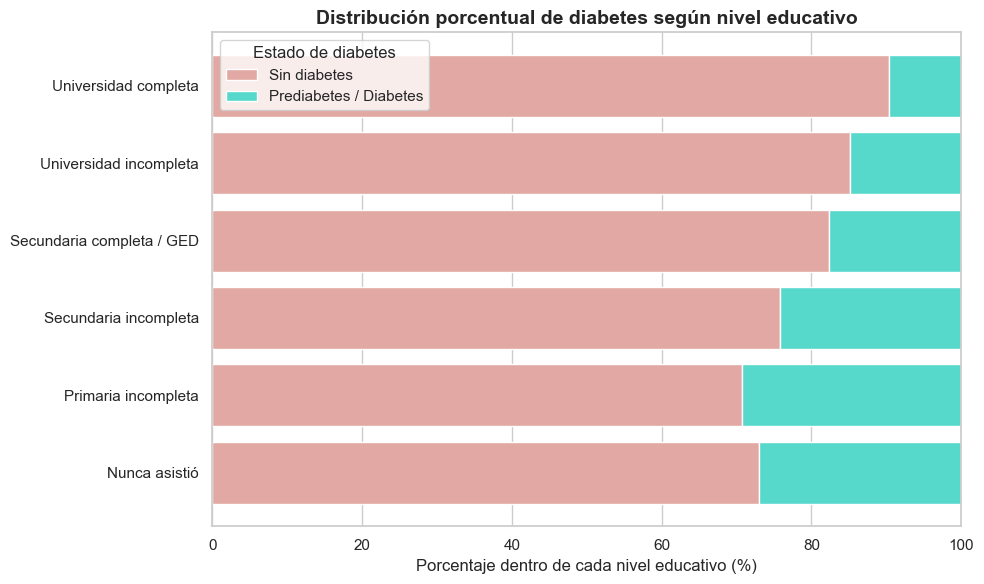

In [76]:

education_order = [
    "Nunca asistió",
    "Primaria incompleta",
    "Secundaria incompleta",
    "Secundaria completa / GED",
    "Universidad incompleta",
    "Universidad completa"
]

tabla_pct = pd.crosstab(
    df_viz["Education"],
    df_viz["Diabetes_binary"],
    normalize="index"
) * 100

tabla_pct = tabla_pct.reindex(education_order)

no_col = "Sin diabetes"
si_col = "Prediabetes / Diabetes"

sin = tabla_pct[no_col]
con = tabla_pct[si_col]

plt.figure(figsize=(10,6))

plt.barh(education_order, sin, label="Sin diabetes", color= "#E2A8A4")
plt.barh(education_order, con, left=sin, label="Prediabetes / Diabetes", color= "#56D8CB")

plt.title("Distribución porcentual de diabetes según nivel educativo",
          fontsize=14, fontweight="bold")

plt.xlabel("Porcentaje dentro de cada nivel educativo (%)")
plt.xlim(0,100)

plt.legend(title="Estado de diabetes")
plt.tight_layout()
plt.show()

#### **11.2.4 Objetivo vs Income**

In [ ]:
income_order = [
    "< $10,000",
    "$10,000–15,000",
    "$15,000–20,000",
    "$20,000–25,000",
    "$25,000–35,000",
    "$35,000–50,000",
    "$50,000–75,000",
    "$75,000+"
]

# Variable ya categórica
inc = df_viz["Income"].astype("category")

# Forzar orden correcto
inc = inc.cat.reorder_categories(income_order, ordered=True)

# Tabla absoluta
tabla_abs = pd.crosstab(inc, df_viz["Diabetes_binary"]).reindex(income_order)

# Totales
total_general = tabla_abs.sum(axis=1)
n_total = total_general.sum()

# % dentro de cada grupo (columna)
tabla_pct_col = tabla_abs.div(tabla_abs.sum(axis=0), axis=1) * 100

# % del total general
pct_total = (total_general / n_total) * 100

# Nombres de columnas
no_col = "Sin diabetes"
si_col = "Prediabetes / Diabetes"

# Códigos 1–8
codigos = list(range(1, len(income_order) + 1))

# Construir tabla final
tabla_income_final = pd.DataFrame({
    "Código": codigos,
    "Descripción": income_order,
    "Sin diabetes (N)": tabla_abs[no_col].values,
    "Sin diabetes (%)": tabla_pct_col[no_col].round(2).values,
    "Prediabetes/Diabetes (N)": tabla_abs[si_col].values,
    "Prediabetes/Diabetes (%)": tabla_pct_col[si_col].round(2).values,
    "Total (N)": total_general.values,
    "Total (%)": pct_total.round(2).values
})

display(tabla_income_final.style.hide(axis="index"))

Código,Descripción,Sin diabetes (N),Sin diabetes (%),Prediabetes/Diabetes (N),Prediabetes/Diabetes (%),Total (N),Total (%)
1,"< $10,000",7428,3.400000,2383,6.740000,9811,3.870000
2,"$10,000–15,000",8697,3.980000,3086,8.730000,11783,4.640000
3,"$15,000–20,000",12426,5.690000,3568,10.090000,15994,6.300000
4,"$20,000–25,000",16081,7.370000,4054,11.470000,20135,7.940000
5,"$25,000–35,000",21379,9.790000,4504,12.740000,25883,10.200000
6,"$35,000–50,000",31179,14.280000,5291,14.970000,36470,14.380000
7,"$50,000–75,000",37954,17.380000,5265,14.900000,43219,17.040000
8,"$75,000+",83190,38.100000,7195,20.360000,90385,35.630000


In [78]:

# Tabla de contingencia (N absolutos)
tabla_chi_income = pd.crosstab(
    df_viz["Income"],
    df_viz["Diabetes_binary"]
)

# Chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_chi_income)

print("Chi-cuadrado:", round(chi2, 2))
print("Grados de libertad:", dof)
print("p-valor:", p)

n = tabla_chi_income.sum().sum()

cramers_v = np.sqrt(chi2 / (n * (min(tabla_chi_income.shape) - 1)))

print("Cramér's V:", round(cramers_v, 3))

Chi-cuadrado: 7003.72
Grados de libertad: 7
p-valor: 0.0
Cramér's V: 0.166


En relación con el ``nivel de ingreso``, la distribución descriptiva evidencia un patrón consistente con un gradiente socioeconómico en la prevalencia de prediabetes/diabetes. Aunque los mayores números absolutos de casos se concentran en los grupos de ingresos medios y altos, debido a su mayor representación dentro de la muestra, al analizar las proporciones se observa que los niveles de ingreso más bajos presentan una mayor carga relativa de enfermedad en comparación con los niveles más altos. Esta tendencia sugiere que a medida que aumenta el ingreso, la proporción de individuos con condición diabética tiende a disminuir. 

La prueba de independencia Chi-cuadrado confirmó que existe una asociación estadísticamente significativa entre nivel de ingreso y estado diabético ``(χ² = 7003.72; gl = 7; p < 0.001)``. Asimismo, el tamaño del efecto medido mediante Cramér’s V ``(V = 0.166)`` indica una asociación de magnitud pequeña a moderada, lo que sugiere que el ingreso constituye un determinante relevante, aunque no exclusivo, en la distribución poblacional de la diabetes. Estos resultados son coherentes con la literatura que identifica el nivel socioeconómico como un determinante estructural de la salud, vinculado a acceso a servicios sanitarios, calidad de la alimentación y oportunidades de actividad física.

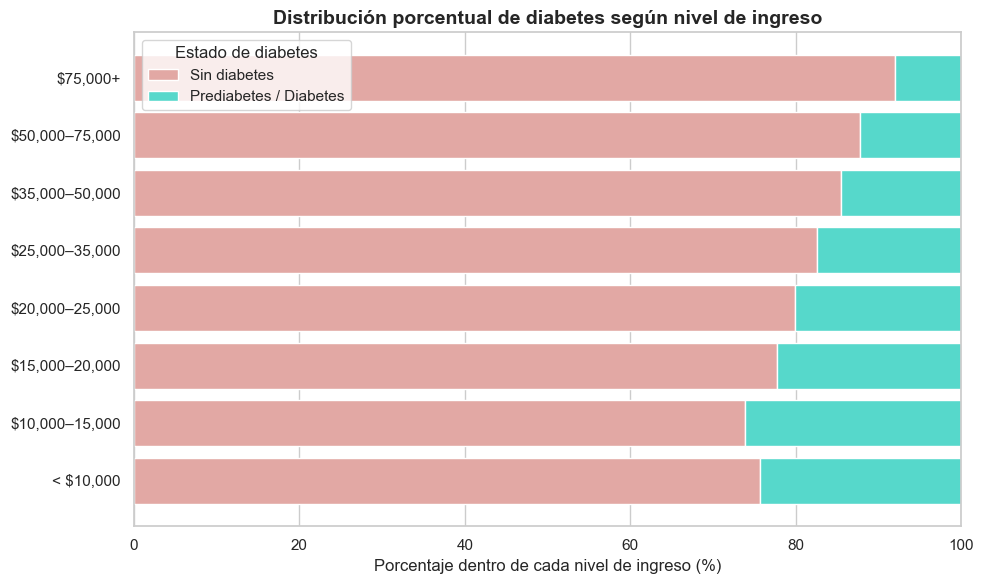

In [79]:

income_order = [
    "< $10,000",
    "$10,000–15,000",
    "$15,000–20,000",
    "$20,000–25,000",
    "$25,000–35,000",
    "$35,000–50,000",
    "$50,000–75,000",
    "$75,000+"
]

# Tabla porcentual dentro de cada nivel de ingreso
tabla_pct = pd.crosstab(
    df_viz["Income"],
    df_viz["Diabetes_binary"],
    normalize="index"
) * 100

tabla_pct = tabla_pct.reindex(income_order)

no_col = "Sin diabetes"
si_col = "Prediabetes / Diabetes"

sin = tabla_pct[no_col]
con = tabla_pct[si_col]

plt.figure(figsize=(10,6))

plt.barh(income_order, sin, label="Sin diabetes", color= "#E2A8A4")
plt.barh(income_order, con, left=sin, label="Prediabetes / Diabetes", color= "#56D8CB")

plt.title("Distribución porcentual de diabetes según nivel de ingreso",
          fontsize=14, fontweight="bold")

plt.xlabel("Porcentaje dentro de cada nivel de ingreso (%)")
plt.xlim(0, 100)

plt.legend(title="Estado de diabetes")
plt.tight_layout()
plt.show()

### **11.3 Variable objetivo vs variables numéricas**

Con el fin de evaluar la relación entre el estado de prediabetes/diabetes y las variables numéricas del estudio (BMI, MentHlth y PhysHlth), se realizó un análisis bivariado orientado a comparar la distribución y las medias de dichas variables entre los dos grupos definidos por la variable objetivo: Prediabetes/Diabetes y Sin diabetes.

Dado que la variable dependiente es categórica binaria y las variables explicativas son continuas, el análisis se estructuró a partir de la comparación de medias entre grupos independientes. Para ello, se utilizó la prueba t de Welch, la cual no asume igualdad de varianzas entre grupos y resulta apropiada en contextos donde los tamaños muestrales son desiguales.

Si bien algunas de las variables presentan asimetría en su distribución, el tamaño muestral elevado garantiza la robustez de la prueba t por efecto del Teorema del Límite Central, el cual establece que la distribución de la media muestral tiende a aproximarse a la normalidad cuando el número de observaciones es grande.

Adicionalmente, para complementar la significancia estadística, se calculó el tamaño del efecto mediante el estadístico Cohen’s d, con el objetivo de evaluar la magnitud práctica de las diferencias observadas entre grupos. Esta medida permite distinguir entre diferencias estadísticamente significativas y diferencias clínicamente relevantes.

Finalmente, el análisis se apoyó en representaciones gráficas (boxplots y curvas de densidad) que permiten visualizar la dispersión, la presencia de valores atípicos y la forma de la distribución en cada grupo, proporcionando una comprensión más completa del comportamiento de las variables numéricas según el estado diabético.m

#### **11.3.1 Objetivo vs BMI**

In [80]:
def tabla_descriptiva(var):

    resumen = (
        df_viz
        .groupby("Diabetes_binary")[var]
        .agg([
            "count",
            "mean",
            "median",
            "std",
            "min",
            lambda x: x.quantile(0.25),
            lambda x: x.quantile(0.75),
            "max"
        ])
    )

    resumen.columns = [
        "N",
        "Media",
        "Mediana",
        "Desv. Estándar",
        "Mínimo",
        "Q1 (25%)",
        "Q3 (75%)",
        "Máximo"
    ]

    return resumen.round(2)

tabla_descriptiva("BMI")

,N,Media,Mediana,Desv. Estándar,Mínimo,Q1 (25%),Q3 (75%),Máximo
Diabetes_binary,,,,,,,,
Prediabetes / Diabetes,35346,31.94,31.0,7.36,13.0,27.0,35.0,98.0
Sin diabetes,218334,27.81,27.0,6.29,12.0,24.0,31.0,98.0


In [81]:
import scipy.stats as stats
import numpy as np

grupo1 = df_viz[df_viz["Diabetes_binary"]=="Prediabetes / Diabetes"]["BMI"]
grupo0 = df_viz[df_viz["Diabetes_binary"]=="Sin diabetes"]["BMI"]

t_stat, p_val = stats.ttest_ind(grupo1, grupo0, equal_var=False)

pooled_sd = np.sqrt((grupo1.std()**2 + grupo0.std()**2)/2)
cohens_d = (grupo1.mean() - grupo0.mean())/pooled_sd

print("t:", round(t_stat,2))
print("p-valor:", p_val)
print("Cohen's d:", round(cohens_d,2))

t: 99.92
p-valor: 0.0
Cohen's d: 0.6


El índice de masa corporal `(BMI)` es mayor en el grupo con Prediabetes / Diabetes (Media = 31.94; Mediana = 31) en comparación con el grupo Sin diabetes (Media = 27.81; Mediana = 27). Además, los cuartiles muestran que toda la distribución del grupo diabético está desplazada hacia valores más altos.

La prueba t de Welch arroja un estadístico `t = 99.92` con p < 0.001, lo que indica que la diferencia de medias es estadísticamente significativa.

El tamaño del efecto ``(Cohen’s d = 0.60)`` sugiere una diferencia de magnitud moderada, lo que implica que la asociación no solo es significativa por el gran tamaño muestral, sino también relevante desde el punto de vista práctico.

En consecuencia, el BMI presenta una diferencia clara y sustantiva entre ambos grupos, consolidándose como una variable fuertemente asociada al estado diabético.

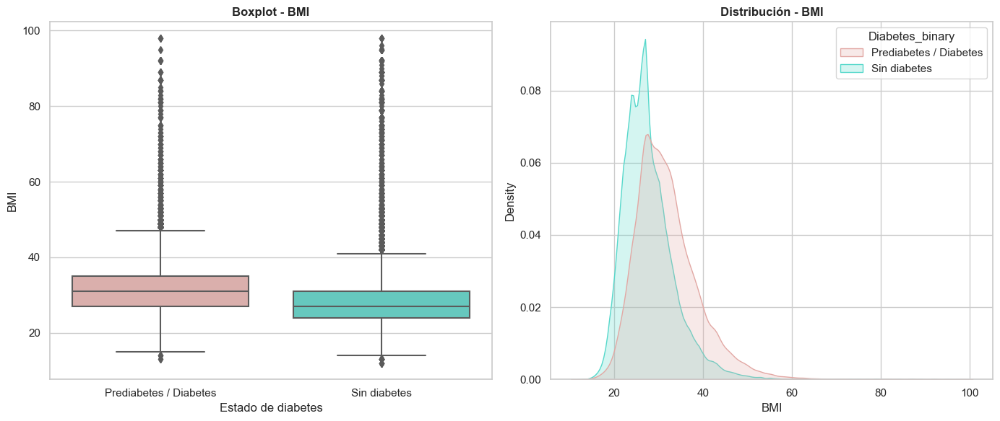

In [82]:
fig, axes = plt.subplots(1, 2, figsize=(14,6))

# -------- Boxplot --------
sns.boxplot(
    data=df_viz,
    x="Diabetes_binary",
    y="BMI",
    ax=axes[0],
    palette= colors
    
)

axes[0].set_title("Boxplot - BMI", fontweight="bold")
axes[0].set_xlabel("Estado de diabetes")
axes[0].set_ylabel("BMI")

# -------- Distribución --------
sns.kdeplot(
    data=df_viz,
    x="BMI",
    hue="Diabetes_binary",
    fill=True,
    common_norm=False,
    ax=axes[1],
    palette= colors
)

axes[1].set_title("Distribución - BMI", fontweight="bold")
axes[1].set_xlabel("BMI")

plt.tight_layout()
plt.show()

El boxplot muestra que el grupo con Prediabetes / Diabetes presenta una mediana de BMI claramente superior al grupo Sin diabetes. Además: el rango intercuartílico (Q1–Q3) está desplazado hacia valores más altos; se observa también mayor concentración de valores elevados. Ambos grupos presentan outliers altos, pero en el grupo diabético la distribución central ya se encuentra en un rango de sobrepeso/obesidad. Esto indica una diferencia estructural en la distribución, no solo en valores extremos.

La curva de densidad confirma visualmente el desplazamiento hacia la derecha del grupo con Prediabetes / Diabetes. La distribución azul (diabéticos) está centrada en valores más altos. Existe solapamiento entre grupos, pero el pico principal del grupo diabético se ubica aproximadamente 3–4 puntos de BMI por encima. De igual forma, se observa una cola derecha más pronunciada en el grupo diabético, indicando mayor proporción de IMC elevados.

Ambos gráficos evidencian que el BMI no solo difiere en promedio, sino que toda la distribución del grupo con prediabetes/diabetes está desplazada hacia valores mayores. Esto refuerza la evidencia estadística previa (t-test y Cohen’s d) y confirma que el BMI es una variable fuertemente asociada al estado diabético tanto en términos estadísticos como clínicos.

#### **11.3.2 Objetivo vs MentHlth**

In [83]:
tabla_descriptiva("MentHlth")

,N,Media,Mediana,Desv. Estándar,Mínimo,Q1 (25%),Q3 (75%),Máximo
Diabetes_binary,,,,,,,,
Prediabetes / Diabetes,35346,4.46,0.0,8.95,0.0,0.0,3.0,30.0
Sin diabetes,218334,2.98,0.0,7.11,0.0,0.0,2.0,30.0


In [84]:
grupo1 = df_viz[df_viz["Diabetes_binary"]=="Prediabetes / Diabetes"]["MentHlth"]
grupo0 = df_viz[df_viz["Diabetes_binary"]=="Sin diabetes"]["MentHlth"]

t_stat, p_val = stats.ttest_ind(grupo1, grupo0, equal_var=False)

pooled_sd = np.sqrt((grupo1.std()**2 + grupo0.std()**2)/2)
cohens_d = (grupo1.mean() - grupo0.mean())/pooled_sd

print("t:", round(t_stat,2))
print("p-valor:", p_val)
print("Cohen's d:", round(cohens_d,2))

t: 29.69
p-valor: 7.929124395108997e-192
Cohen's d: 0.18


El número promedio de días con ``mala salud mental`` en los últimos 30 días es mayor en el grupo con Prediabetes / Diabetes (Media = 4.46) en comparación con el grupo Sin diabetes (Media = 2.98). Sin embargo, la mediana en ambos grupos es 0 días, lo que indica que más de la mitad de los individuos en cada grupo no reportó días de mala salud mental, evidenciando una distribución fuertemente asimétrica hacia la derecha.

Desde el punto de vista estadístico, la prueba t arroja ``t = 29.69`` con p < 0.001, lo que indica que la diferencia de medias es estadísticamente significativa. No obstante, el tamaño del efecto es pequeño ``(Cohen’s d = 0.18)``, lo que sugiere que, aunque la diferencia existe y es estadísticamente robusta (probablemente influenciada por el gran tamaño muestral), la magnitud práctica de la diferencia entre grupos es baja.

En conclusión, existe una asociación estadísticamente significativa entre salud mental y estado diabético, pero su impacto en términos de magnitud es limitado.

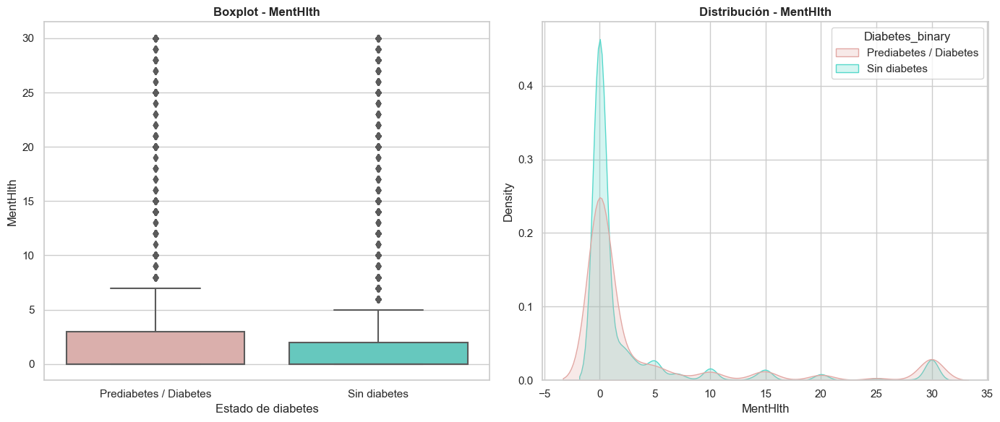

In [85]:
fig, axes = plt.subplots(1, 2, figsize=(14,6))

# -------- Boxplot --------
sns.boxplot(
    data=df_viz,
    x="Diabetes_binary",
    y="MentHlth",
    ax=axes[0],
    palette= colors
)

axes[0].set_title("Boxplot - MentHlth", fontweight="bold")
axes[0].set_xlabel("Estado de diabetes")
axes[0].set_ylabel("MentHlth")

# -------- Distribución --------
sns.kdeplot(
    data=df_viz,
    x="MentHlth",
    hue="Diabetes_binary",
    fill=True,
    common_norm=False,
    ax=axes[1],
    palette= colors
)

axes[1].set_title("Distribución - MentHlth", fontweight="bold")
axes[1].set_xlabel("MentHlth")

plt.tight_layout()
plt.show()

Las gráficas muestran que la mayoría de las personas en ambos grupos reporta 0 días de mala salud mental, lo que explica que la mediana sea 0 y que la distribución esté fuertemente concentrada en ese valor. Sin embargo, el grupo con Prediabetes / Diabetes presenta una ligera mayor dispersión y una cola derecha más extendida, reflejando que una proporción mayor acumula más días con afectación mental.

El boxplot confirma que, aunque las diferencias centrales no son muy amplias, el grupo diabético tiene un rango intercuartílico ligeramente superior y mayor presencia de valores altos. La curva de densidad muestra un desplazamiento leve hacia la derecha en este grupo, pero con amplio solapamiento entre distribuciones.

En conjunto, visualmente se aprecia una diferencia existente pero pequeña en magnitud, coherente con el tamaño de efecto bajo observado en el análisis estadístico.m

#### **11.3.3 Objetivo vs PhysHlth**

In [86]:
tabla_descriptiva("PhysHlth")

,N,Media,Mediana,Desv. Estándar,Mínimo,Q1 (25%),Q3 (75%),Máximo
Diabetes_binary,,,,,,,,
Prediabetes / Diabetes,35346,7.95,1.0,11.30,0.0,0.0,15.0,30.0
Sin diabetes,218334,3.64,0.0,8.06,0.0,0.0,2.0,30.0


In [87]:
grupo1 = df_viz[df_viz["Diabetes_binary"]=="Prediabetes / Diabetes"]["PhysHlth"]
grupo0 = df_viz[df_viz["Diabetes_binary"]=="Sin diabetes"]["PhysHlth"]

t_stat, p_val = stats.ttest_ind(grupo1, grupo0, equal_var=False)

pooled_sd = np.sqrt((grupo1.std()**2 + grupo0.std()**2)/2)
cohens_d = (grupo1.mean() - grupo0.mean())/pooled_sd

print("t:", round(t_stat,2))
print("p-valor:", p_val)
print("Cohen's d:", round(cohens_d,2))

t: 68.97
p-valor: 0.0
Cohen's d: 0.44


El número promedio de días con ``mala salud física`` en los últimos 30 días es considerablemente mayor en el grupo con Prediabetes / Diabetes (Media = 7.95; Mediana = 1) frente al grupo Sin diabetes (Media = 3.64; Mediana = 0). Además, el tercer cuartil es mucho más alto en el grupo diabético (Q3 = 15 vs 2), lo que indica que una proporción importante reporta múltiples días con afectación física.

La prueba t de Welch arroja ``t = 68.97`` con p < 0.001, evidenciando una diferencia estadísticamente significativa entre grupos. El tamaño del efecto ``(Cohen’s d = 0.44)`` es moderado, lo que sugiere que la diferencia no solo es significativa por el gran tamaño muestral, sino también relevante en términos prácticos.

En conjunto, la mala salud física muestra una asociación clara y sustantiva con el estado diabético, con una magnitud mayor que la observada previamente para salud mental.

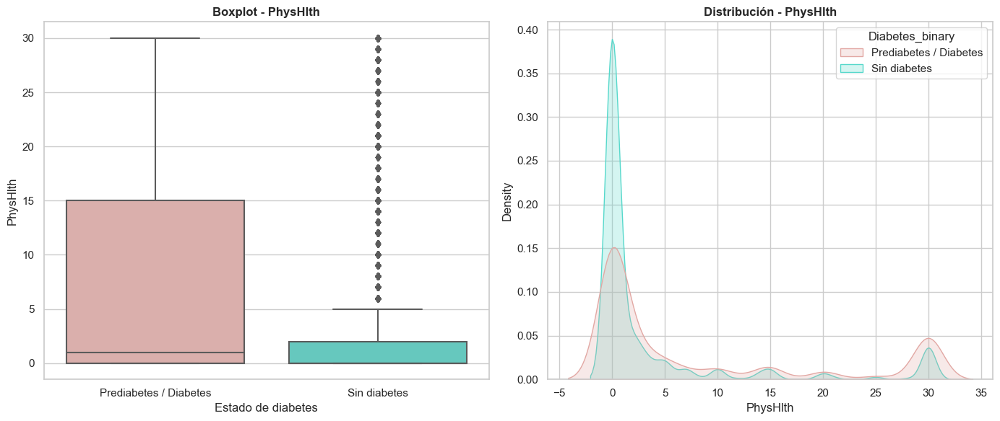

In [88]:
fig, axes = plt.subplots(1, 2, figsize=(14,6))

# -------- Boxplot --------
sns.boxplot(
    data=df_viz,
    x="Diabetes_binary",
    y="PhysHlth",
    ax=axes[0],
    palette= colors
)

axes[0].set_title("Boxplot - PhysHlth", fontweight="bold")
axes[0].set_xlabel("Estado de diabetes")
axes[0].set_ylabel("PhysHlth")

# -------- Distribución --------
sns.kdeplot(
    data=df_viz,
    x="PhysHlth",
    hue="Diabetes_binary",
    fill=True,
    common_norm=False,
    ax=axes[1],
    palette= colors
)

axes[1].set_title("Distribución - PhysHlth", fontweight="bold")
axes[1].set_xlabel("PhysHlth")

plt.tight_layout()
plt.show()

Las gráficas muestran una diferencia más marcada que en salud mental. Aunque en ambos grupos la mediana se mantiene cerca de 0 días, el boxplot evidencia que el grupo con Prediabetes / Diabetes tiene un rango intercuartílico mucho más amplio y valores centrales más elevados. El tercer cuartil alcanza 15 días en el grupo diabético frente a solo 2 días en el grupo sin diabetes, lo que indica que una proporción considerable reporta múltiples días con mala salud física.

La distribución confirma este patrón: la curva del grupo diabético está más extendida hacia la derecha y presenta una cola más pesada, reflejando mayor frecuencia de valores altos (incluyendo el límite de 30 días). Aunque existe solapamiento entre grupos, el desplazamiento es visualmente claro.

En conjunto, las gráficas refuerzan que la afectación física es sustancialmente mayor en personas con prediabetes/diabetes, coherente con el tamaño de efecto moderado observado en el análisis estadístico.

## **12. Análisis de correlación entre la variable objetivo y factores asociados**

In [ ]:
df_corr = pd.DataFrame()

#Continuas
df_corr["BMI"] = df_viz["BMI"]
df_corr["MentHlth"] = df_viz["MentHlth"]
df_corr["PhysHlth"] = df_viz["PhysHlth"]

#Ordinales
df_corr["GenHlth"] = df_viz["GenHlth"].cat.codes + 1
df_corr["Education"] = df_viz["Education"].cat.codes + 1
df_corr["Income"] = df_viz["Income"].cat.codes + 1
df_corr["Age"] = df_viz["Age"].cat.codes + 1

df_corr = df_corr.dropna()

#Pearson
corr_matrix = df_corr.corr(method="pearson")

corr_matrix.round(2)

,BMI,MentHlth,PhysHlth,GenHlth,Education,Income,Age
BMI,1.00,0.09,0.12,0.24,-0.10,-0.10,-0.04
MentHlth,0.09,1.00,0.35,0.30,-0.10,-0.21,-0.09
PhysHlth,0.12,0.35,1.00,0.52,-0.16,-0.27,0.10
GenHlth,0.24,0.30,0.52,1.00,-0.28,-0.37,0.15
Education,-0.10,-0.10,-0.16,-0.28,1.00,0.45,-0.10
Income,-0.10,-0.21,-0.27,-0.37,0.45,1.00,-0.13
Age,-0.04,-0.09,0.10,0.15,-0.10,-0.13,1.00


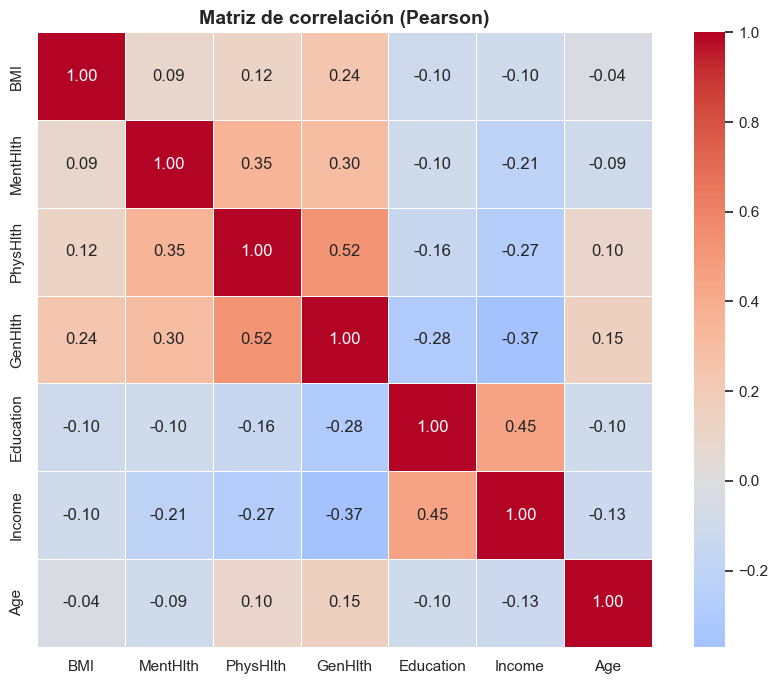

In [90]:
plt.figure(figsize=(9,7))

sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    square=True,
    linewidths=0.5
)

plt.title("Matriz de correlación (Pearson)", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

La matriz de correlación de Pearson revela que las correlaciones entre las variables 
numéricas y ordinales del dataset son en general débiles a moderadas, sin evidencia 
de multicolinealidad problemática entre los predictores.

Las asociaciones más relevantes son:

- **PhysHlth y GenHlth (0.52):** es la correlación más fuerte del conjunto. Una peor 
salud física se asocia consistentemente con una peor percepción general de salud.

- **MentHlth y PhysHlth (0.35):** relación moderada entre días de mala salud mental 
y física, sugiriendo que ambas dimensiones tienden a deteriorarse de forma conjunta.

- **Education e Income (0.45):** a mayor nivel educativo, mayor nivel de ingresos, 
relación esperada y consistente con la literatura socioeconómica.

- **GenHlth e Income (-0.37) y GenHlth y Education (-0.28):** personas con menores 
ingresos y menor nivel educativo tienden a reportar peor estado de salud general.

- **BMI y GenHlth (0.24):** un mayor índice de masa corporal se asocia moderadamente 
con una peor percepción del estado de salud.

Solo PhysHlth y GenHlth superan el umbral de 0.5.

## **13. Modelo baseline/Prueba de viabilidad**


Mejores parámetros encontrados:
{'model__C': 10, 'model__class_weight': 'balanced'}

Mejor score promedio en validación cruzada:
0.443253659364507

Score F1 en test:
0.44136346855900566

Accuracy en test:
0.731571270892463

Classification report:
              precision    recall  f1-score   support

         0.0       0.95      0.73      0.82     43667
         1.0       0.31      0.76      0.44      7069

    accuracy                           0.73     50736
   macro avg       0.63      0.74      0.63     50736
weighted avg       0.86      0.73      0.77     50736



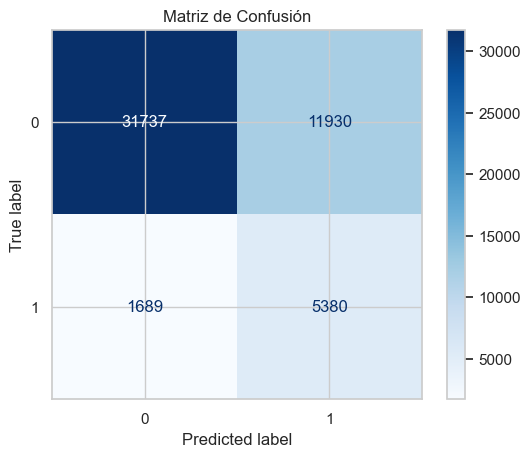

In [16]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    f1_score,
    roc_auc_score,
    roc_curve
)
import matplotlib.pyplot as plt

# 1. Cargar dataset
ruta = r"C:\Users\danih\Documents\Dataviz_py\diabetes_binary_health_indicators_BRFSS2015.csv"
df = pd.read_csv(ruta)

# 2. Separar variables predictoras y objetivo
X = df.drop("Diabetes_binary", axis=1)
y = df["Diabetes_binary"]

# 3. Dividir en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

# 4. Definir validación cruzada estratificada
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# 5. Crear pipeline
pipeline = Pipeline([
    ("scaler", StandardScaler()),
    ("model", LogisticRegression(max_iter=100000))
])

# 6. Definir hiperparámetros
param_grid = {
    "model__C": [0.001, 0.01, 0.1, 1, 10, 100],
    "model__class_weight": [None, "balanced"]
}

# 7. GridSearch con F1
grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=skf,
    scoring="f1",
    n_jobs=-1
)

# 8. Entrenar
grid_search.fit(X_train, y_train)

# 9. Mostrar mejores resultados
print("Mejores parámetros encontrados:")
print(grid_search.best_params_)

print("\nMejor score promedio en validación cruzada:")
print(grid_search.best_score_)

# 10. Evaluar en test
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:, 1]

print("\nScore F1 en test:")
print(f1_score(y_test, y_pred))

print("\nAccuracy en test:")
print(accuracy_score(y_test, y_pred))

print("\nClassification report:")
print(classification_report(y_test, y_pred))

# 11. Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues")
plt.title("Matriz de Confusión")
plt.show()



Antes de implementar modelos más complejos, se entrenó una línea base utilizando LogisticRegression con el objetivo de evaluar si el dataset contenía suficiente información predictiva para justificar el uso de técnicas de Machine Learning. Para ello, se empleó validación cruzada estratificada, optimización de hiperparámetros mediante GridSearchCV y un pipeline con escalado para evitar fuga de información.

Debido al desbalance existente entre individuos con y sin diabetes, se utilizó el F1-score como criterio principal de optimización, ya que esta métrica permite equilibrar precisión y sensibilidad. El proceso de búsqueda identificó como mejor configuración un valor de C = 10 y el uso de class_weight = "balanced", lo que permitió ajustar el modelo otorgando mayor relevancia a la clase minoritaria.

El mejor F1-score promedio obtenido durante la validación cruzada fue de 0.443, mientras que en el conjunto de prueba se obtuvo un valor de 0.441. La cercanía entre ambos resultados indica que el modelo presenta un comportamiento relativamente estable y no muestra señales evidentes de sobreajuste.

En términos generales, el modelo alcanzó una accuracy de 0.731. Sin embargo, esta métrica debe interpretarse con cautela debido al desbalance de clases, ya que un buen accuracy puede ocultar un mal desempeño sobre la clase minoritaria.

El análisis por clase muestra que para la clase 0 (no diabetes) el modelo obtiene un desempeño alto, con precisión de 0.95, recall de 0.73 y F1-score de 0.82. Para la clase 1 (diabetes), se obtiene una precisión de 0.31, un recall de 0.76 y un F1-score de 0.44. Esto indica que el modelo logra detectar aproximadamente tres de cada cuatro casos reales de diabetes, aunque a costa de generar un número considerable de falsos positivos.

La matriz de confusión confirma este comportamiento: el modelo detecta correctamente 5 380 casos de diabetes, pero también clasifica erróneamente como positivos a 11 930 individuos que no presentan la enfermedad. Aun así, solo deja sin detectar 1 689 casos reales de diabetes, lo cual resulta favorable en un contexto clínico donde los falsos negativos suelen ser más costosos que los falsos positivos.

Más que representar un modelo final, esta regresión logística funciona como una línea base o prueba de viabilidad. Si el modelo hubiese obtenido resultados cercanos al azar, ello habría sugerido que el dataset no contiene suficiente señal predictiva. Por el contrario, si hubiese alcanzado un desempeño casi perfecto, podría haberse sospechado fuga de información o una tarea excesivamente trivial. Los resultados obtenidos se sitúan en un punto intermedio: muestran que existen patrones relevantes en los datos, pero también evidencian que aún hay margen de mejora mediante modelos más complejos y técnicas de optimización más avanzadas.


## **14. Diseño experimental y preparación del flujo de modelado**

### **14.1 Organización final de variables predictoras y variable objetivo**

In [24]:
#NOTA:
#Para la etapa de modelado se trabajará con `df` como base principal, ya que `df_viz` fue construido con fines de visualización y varias variables fueron recodificadas como categóricas para facilitar el EDA.
# Así: `df`  -> se usará para preprocesamiento y modelado
#`df_viz` -> se conserva únicamente para visualizaciones y análisis gráfico

df_model = df.copy()

#Variable objetivo ----------------------------------------------
#Ya habíamos definido la variable objetivo como "Diabetes_binary" en etapas anteriores, pero se reafirma aquí para mantener claridad y estructura en esta sección de modelado.
#Objetivo = "Diabetes_binary"

#Definición de grupos de variables -----------------------------
#Se clasifican las variables predictoras en grupos según su tipo, lo cual facilitará la selección de técnicas de preprocesamiento y modelado específicas para cada tipo de variable.
#Ya también se habían identificado estas variables en etapas anteriores.
#binary_feature_cols 
#numeric_cols
#ordinal_cols 

 
#En este dataset en particular no quedan variables nominales puras, porque la mayoría vienen ya codificadas como enteros. Se deja la lista definida para mantener una estructura reusable.
#categorical_cols = []


#Verificación básica----------------------------------------------

all_defined_cols = numeric_cols + ordinal_cols + binary_feature_cols + [Objetivo]

predictor_cols = [col for col in df_model.columns if col != Objetivo]

missing_in_definition = sorted(set(predictor_cols) - set(all_defined_cols))
duplicated_in_groups = sorted([col for col in all_defined_cols if all_defined_cols.count(col) > 1])


print("Variable objetivo:", Objetivo)
print("\nNúmero total de predictores en df_model:", len(predictor_cols))
print("Número total de variables clasificadas:", len(all_defined_cols))

print("\nResumen por grupo:")
print(f"- Numéricas continuas: {len(numeric_cols)}")
print(f"- Ordinales: {len(ordinal_cols)}")
print(f"- Binarias: {len(binary_feature_cols)}")

print("\nVariables numéricas continuas:", numeric_cols)
print("Variables ordinales:", ordinal_cols)
print("Variables binarias:", binary_feature_cols)


#Separación X e y---------------------------------------------------------------------------

X = df_model.drop(columns=[Objetivo])
y = df_model[Objetivo]

print("\nShape de X:", X.shape)
print("Shape de y:", y.shape)

print("\nDistribución de la variable objetivo:")
print(y.value_counts().sort_index())
print("\nProporción de la variable objetivo:")
print(y.value_counts(normalize=True).sort_index())

Variable objetivo: Diabetes_binary

Número total de predictores en df_model: 21
Número total de variables clasificadas: 22

Resumen por grupo:
- Numéricas continuas: 3
- Ordinales: 4
- Binarias: 14

Variables numéricas continuas: ['BMI', 'MentHlth', 'PhysHlth']
Variables ordinales: ['GenHlth', 'Age', 'Education', 'Income']
Variables binarias: ['HighBP', 'HighChol', 'CholCheck', 'Smoker', 'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'DiffWalk', 'Sex']

Shape de X: (253680, 21)
Shape de y: (253680,)

Distribución de la variable objetivo:
Diabetes_binary
0.0    218334
1.0     35346
Name: count, dtype: int64

Proporción de la variable objetivo:
Diabetes_binary
0.0    0.860667
1.0    0.139333
Name: proportion, dtype: float64


### **14.2 Análisis del desbalance de clases**

Antes de entrenar los modelos de clasificación, es necesario analizar la distribución de la variable objetivo `Diabetes_binary`, ya que el conjunto de datos presenta una diferencia importante entre las dos clases: personas sin diabetes y personas con diabetes. Este paso es fundamental porque, cuando existe desbalance de clases, los modelos pueden aprender a favorecer la clase mayoritaria y obtener una exactitud aparentemente alta, pero con bajo desempeño en la identificación de la clase minoritaria, que en este caso corresponde a los casos positivos de diabetes. Por esta razón, se examina la proporción de cada clase con el fin de justificar posteriormente el uso de estrategias como validación estratificada, métricas adecuadas y técnicas de balanceo durante el modelado.

,Clase,Conteo,Porcentaje
0,Sin diabetes,218334,86.07
1,Prediabetes/Diabetes,35346,13.93



Ratio de desbalance (mayoritaria/minoritaria): 6.18:1


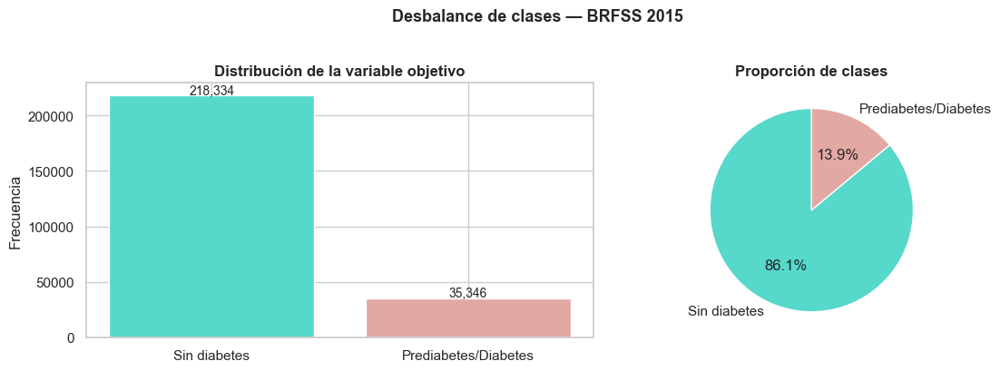

In [5]:
conteo = df[Objetivo].value_counts()
proporciones = df[Objetivo].value_counts(normalize=True) * 100

balance_df = pd.DataFrame({
    "Clase": ["Sin diabetes", "Prediabetes/Diabetes"],
    "Conteo": conteo.values,
    "Porcentaje": proporciones.values.round(2)
})
display(balance_df)

ratio = conteo[0] / conteo[1]
print(f"\nRatio de desbalance (mayoritaria/minoritaria): {ratio:.2f}:1")

#Gráfico
coral = "#E2A8A4"
aqua  = "#56D8CB"

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].bar(["Sin diabetes", "Prediabetes/Diabetes"],
            conteo.values, color=[aqua, coral], edgecolor="white")
axes[0].set_title("Distribución de la variable objetivo", fontweight="bold")
axes[0].set_ylabel("Frecuencia")
for i, v in enumerate(conteo.values):
    axes[0].text(i, v + 1000, f"{v:,}", ha="center", fontsize=10)

axes[1].pie(conteo.values,
            labels=["Sin diabetes", "Prediabetes/Diabetes"],
            colors=[aqua, coral],
            autopct="%1.1f%%",
            startangle=90)
axes[1].set_title("Proporción de clases", fontweight="bold")

plt.suptitle("Desbalance de clases — BRFSS 2015", fontsize=13, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

### **Interpretación** 

La variable objetivo presenta un desbalance importante entre las clases. Del total de observaciones, 218 334 corresponden a individuos sin diabetes, equivalentes al 86.07% del dataset, mientras que 35 346 observaciones corresponden a individuos con prediabetes o diabetes, representando únicamente el 13.93%.

Esto implica una razón de desbalance aproximada de 6.18:1, es decir, por cada individuo con diabetes existen más de seis individuos sin la enfermedad. Este nivel de desbalance puede inducir a que los modelos aprendan a favorecer la clase mayoritaria, obteniendo valores altos de accuracy incluso si identifican deficientemente los casos positivos.

Por esta razón, la accuracy no será utilizada como criterio principal de optimización. En su lugar, se priorizarán métricas como recall, F1-score y ROC AUC, ya que permiten evaluar de manera más adecuada la capacidad del modelo para detectar individuos con diabetes.

Además, este comportamiento justifica el uso de validación cruzada estratificada mediante StratifiedKFold, con el fin de preservar la proporción original de clases en cada partición de entrenamiento y validación.

Finalmente, el desbalance observado también respalda la necesidad de implementar posteriormente técnicas específicas para tratar clases desbalanceadas, como ``class_weight='balanced'``, SMOTE y ADASYN, las cuales serán comparadas para evaluar su impacto sobre el desempeño predictivo de los modelos.

### **14.3 Partición estratificada de entrenamiento y prueba** 

Después de analizar la distribución de la variable objetivo, se realiza la partición del conjunto de datos en entrenamiento y prueba. Esta división permite separar los datos que serán utilizados para ajustar los modelos de aquellos que se reservarán para evaluar su desempeño final sobre información no vista durante el entrenamiento.

En este proyecto se utiliza una partición del 80% para entrenamiento y 20% para prueba. Además, se aplica una división estratificada mediante el parámetro `stratify=y`, con el fin de conservar en ambos conjuntos la misma proporción de clases observada en la variable objetivo original. Esta decisión es especialmente importante debido al desbalance entre las clases, ya que evita que el conjunto de prueba quede con una distribución diferente a la del conjunto de entrenamiento.

También se fija `random_state=42` para garantizar reproducibilidad, es decir, que la partición pueda repetirse bajo las mismas condiciones y generar los mismos resultados.

In [25]:
from operator import index

from sklearn.model_selection import train_test_split, StratifiedKFold

#Partición train/test

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    stratify=y,
    random_state=42
)

split_summary = pd.DataFrame({
    "Conjunto": ["Train", "Test"],
    "Observaciones": [len(X_train), len(X_test)],
    "Porcentaje": [
        f"{len(X_train) / len(df_model) * 100:.1f}%",
        f"{len(X_test) / len(df_model) * 100:.1f}%"
    ],
    "Shape X": [str(X_train.shape), str(X_test.shape)],
    "Shape y": [str(y_train.shape), str(y_test.shape)]
})

display(split_summary.style.hide(axis="index"))

#Verificación de proporciones de clases

train_dist = y_train.value_counts(normalize=True).sort_index() * 100
test_dist = y_test.value_counts(normalize=True).sort_index() * 100

distribution_df = pd.DataFrame({
    "Clase": ["Sin diabetes", "Prediabetes/Diabetes"],
    "Train (%)": train_dist.values,
    "Test (%)": test_dist.values
})

display(distribution_df)

Conjunto,Observaciones,Porcentaje,Shape X,Shape y
Train,202944,80.0%,"(202944, 21)","(202944,)"
Test,50736,20.0%,"(50736, 21)","(50736,)"


,Clase,Train (%),Test (%)
0,Sin diabetes,86.0666,86.067092
1,Prediabetes/Diabetes,13.9334,13.932908


Los resultados muestran que la partición se realizó correctamente. El conjunto de entrenamiento quedó conformado por 202.944 observaciones, equivalentes al 80% del total de los datos, mientras que el conjunto de prueba quedó conformado por 50.736 observaciones, correspondientes al 20% restante.

Asimismo, se verifica que la proporción de clases se mantiene prácticamente igual en ambos subconjuntos. En el conjunto de entrenamiento, la clase "Sin diabetes" representa aproximadamente el 86.07%, mientras que la clase "Prediabetes/Diabetes" representa cerca del 13.93%. En el conjunto de prueba se conserva esta misma distribución, lo cual confirma que la partición estratificada fue adecuada.

Esta verificación es importante porque garantiza que los modelos serán entrenados y evaluados bajo una distribución coherente de clases. De esta manera, el desempeño obtenido en el conjunto de prueba será más representativo y no estará afectado por una separación desbalanceada o poco controlada de los datos.

### **14.4 Validación cruzada estratificada** 

Después de realizar la partición inicial entre entrenamiento y prueba, se define una estrategia de validación cruzada estratificada sobre el conjunto de entrenamiento. Esta etapa permite evaluar los modelos de manera más robusta, ya que no se depende de una única división interna de los datos, sino que el conjunto de entrenamiento se divide varias veces en subconjuntos de entrenamiento y validación.

En este proyecto se utiliza `StratifiedKFold` con 5 particiones (`n_splits=5`). Esto significa que el conjunto de entrenamiento se divide en cinco partes o *folds*. En cada iteración, cuatro partes se utilizan para entrenar el modelo y una parte se reserva para validarlo. Este proceso se repite cinco veces, de manera que cada fold funciona una vez como conjunto de validación.

La validación cruzada es estratificada porque mantiene en cada fold una proporción similar de las clases de la variable objetivo. Esto es especialmente importante en este proyecto, debido al desbalance existente entre la clase mayoritaria, correspondiente a personas sin diabetes, y la clase minoritaria, correspondiente a personas con prediabetes o diabetes. Si no se utilizara estratificación, algunos folds podrían quedar con una representación inadecuada de la clase minoritaria, afectando la estabilidad y confiabilidad de las métricas.

Además, se utiliza `shuffle=True` para mezclar los datos antes de generar los folds, y `random_state=42` para garantizar que la división sea reproducible. Es importante destacar que esta validación cruzada se aplica únicamente sobre el conjunto de entrenamiento (`X_train`, `y_train`), mientras que el conjunto de prueba (`X_test`, `y_test`) permanece reservado para la evaluación final del modelo seleccionado.

In [26]:
from sklearn.model_selection import StratifiedKFold

#Esquema de validación cruzada
cv_strategy = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

print(cv_strategy)

#Verificación de la proporción de clases en cada fold

overall_dist = y_train.value_counts(normalize=True).sort_index() * 100

fold_summary = []

for fold, (train_idx, val_idx) in enumerate(cv_strategy.split(X_train, y_train), start=1):
    y_fold_train = y_train.iloc[train_idx]
    y_fold_val = y_train.iloc[val_idx]

    train_dist = y_fold_train.value_counts(normalize=True).sort_index() * 100
    val_dist = y_fold_val.value_counts(normalize=True).sort_index() * 100

    fold_summary.append({
        "Fold": fold,
        "Train n": len(train_idx),
        "Val n": len(val_idx),
        "Train clase 0 (%)": round(train_dist.get(0, 0), 2),
        "Train clase 1 (%)": round(train_dist.get(1, 0), 2),
        "Val clase 0 (%)": round(val_dist.get(0, 0), 2),
        "Val clase 1 (%)": round(val_dist.get(1, 0), 2),
        "Global clase 0 (%)": round(overall_dist.get(0, 0), 2),
        "Global clase 1 (%)": round(overall_dist.get(1, 0), 2)
    })

fold_summary_df = pd.DataFrame(fold_summary)
display(fold_summary_df)

StratifiedKFold(n_splits=5, random_state=42, shuffle=True)


,Fold,Train n,Val n,Train clase 0 (%),Train clase 1 (%),Val clase 0 (%),Val clase 1 (%),Global clase 0 (%),Global clase 1 (%)
0,1,162355,40589,86.07,13.93,86.07,13.93,86.07,13.93
1,2,162355,40589,86.07,13.93,86.07,13.93,86.07,13.93
2,3,162355,40589,86.07,13.93,86.07,13.93,86.07,13.93
3,4,162355,40589,86.07,13.93,86.07,13.93,86.07,13.93
4,5,162356,40588,86.07,13.93,86.07,13.93,86.07,13.93


La tabla de verificación muestra que la estrategia de validación cruzada estratificada fue construida correctamente. En cada uno de los cinco folds, el subconjunto de entrenamiento contiene aproximadamente 162.355 observaciones, mientras que el subconjunto de validación contiene alrededor de 40.589 observaciones. Esta distribución es coherente con una validación cruzada de cinco particiones, donde en cada iteración se utiliza cerca del 80% del conjunto de entrenamiento para ajustar el modelo y el 20% restante para validarlo.

También se observa que la proporción de clases se mantiene estable en todos los folds. Tanto en los subconjuntos de entrenamiento como en los de validación, la clase 0 representa aproximadamente el 86.07% de los datos, mientras que la clase 1 representa cerca del 13.93%. Estos porcentajes coinciden con la distribución global del conjunto de entrenamiento.

Esta verificación confirma que la validación cruzada estratificada conserva adecuadamente el desbalance original de la variable objetivo en cada partición. Por lo tanto, los modelos podrán ser comparados bajo condiciones más justas y consistentes, reduciendo el riesgo de obtener resultados sesgados por una mala distribución de las clases en los folds de validación.

### **14.5 Construcción del preprocesador**

Una vez definida la partición de los datos y la estrategia de validación cruzada, se construye el preprocesador que será utilizado en los modelos de clasificación. Esta etapa es fundamental porque permite transformar las variables predictoras de manera ordenada y consistente antes del entrenamiento, evitando aplicar tratamientos manuales separados que puedan generar errores o fuga de información.

En este proyecto, las variables se organizan según su naturaleza: variables numéricas continuas, variables ordinales y variables binarias. Esta clasificación permite aplicar transformaciones específicas a cada grupo de variables. Para las variables numéricas se utiliza imputación mediante la mediana y estandarización, ya que algunos modelos, como KNN, regresión logística y SVM, son sensibles a la escala de las variables. Para las variables ordinales se conserva su estructura numérica, aplicando imputación en caso de valores faltantes. Finalmente, para las variables binarias se emplea imputación por la categoría más frecuente, manteniendo su codificación original.

El preprocesador se construye mediante `ColumnTransformer`, lo cual permite aplicar diferentes transformaciones a distintos grupos de columnas dentro de un mismo flujo de trabajo. Esta decisión facilita la integración posterior con `Pipeline`, garantizando que el preprocesamiento se ajuste únicamente con los datos de entrenamiento y luego se aplique de forma consistente a los datos de validación o prueba.

In [27]:
#Función auxiliar para construir el preprocesador

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

def build_preprocessor(scale_numeric=True):
    """
    Construye un preprocesador según el tipo de variable.
    
    Parámetros
    ----------
    scale_numeric : bool
        Si True, escala variables numéricas continuas.
        Si False, solo imputa.
    """

    if scale_numeric:
        numeric_transformer_local = Pipeline(steps=[
            ("imputer", SimpleImputer(strategy="median")),
            ("scaler", StandardScaler())
        ])
    else:
        numeric_transformer_local = Pipeline(steps=[
            ("imputer", SimpleImputer(strategy="median"))
        ])

    ordinal_transformer_local = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="median"))
    ])

    binary_transformer_local = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="most_frequent"))
    ])

    preprocessor_local = ColumnTransformer(
        transformers=[
            ("num", numeric_transformer_local, numeric_cols),
            ("ord", ordinal_transformer_local, ordinal_cols),
            ("bin", binary_transformer_local, binary_feature_cols)
        ],
        remainder="drop"
    )

    return preprocessor_local

In [28]:
import pandas as pd
import numpy as np

#Construir preprocesador de inspección
preprocessor = build_preprocessor(scale_numeric=True)

print(preprocessor)

#Aplicar preprocesamiento únicamente sobre entrenamiento
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)



#Obtener nombres finales de columnas
final_feature_names = numeric_cols + ordinal_cols + binary_feature_cols

X_train_processed_df = pd.DataFrame(
    X_train_processed,
    columns=final_feature_names
)

X_test_processed_df = pd.DataFrame(
    X_test_processed,
    columns=final_feature_names
)

#Comparación de shapes
shape_summary = pd.DataFrame({
    "Conjunto": [
        "X_train original",
        "X_train transformado",
        "X_test original",
        "X_test transformado"
    ],
    "Shape": [
        str(X_train.shape),
        str(X_train_processed_df.shape),
        str(X_test.shape),
        str(X_test_processed_df.shape)
    ]
})

display(shape_summary)

#Verificación de escalado en variables numéricas
scaling_check = pd.DataFrame({
    "Variable": numeric_cols,
    "Media después de escalado": [
        X_train_processed_df[col].mean() for col in numeric_cols
    ],
    "Desv. estándar después de escalado": [
        X_train_processed_df[col].std() for col in numeric_cols
    ]
})

display(scaling_check.round(4))

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', StandardScaler())]),
                                 ['BMI', 'MentHlth', 'PhysHlth']),
                                ('ord',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median'))]),
                                 ['GenHlth', 'Age', 'Education', 'Income']),
                                ('bin',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='most_frequent'))]),
                                 ['HighBP', 'HighChol', 'CholCheck', 'Smoker',
                                  'Stroke', 'HeartDiseaseorAttack',
                                  'PhysActivity', 'Fruits',

,Conjunto,Shape
0,X_train original,"(202944, 21)"
1,X_train transformado,"(202944, 21)"
2,X_test original,"(50736, 21)"
3,X_test transformado,"(50736, 21)"


,Variable,Media después de escalado,Desv. estándar después de escalado
0,BMI,0.0,1.0
1,MentHlth,0.0,1.0
2,PhysHlth,-0.0,1.0


Aunque el dataset no presenta valores faltantes, se decidió conservar los imputadores dentro del pipeline por razones de robustez y reproducibilidad. Esto permite que el flujo de trabajo sea reutilizable en escenarios futuros donde puedan aparecer datos faltantes, sin necesidad de modificar la estructura del preprocesamiento.

En este caso, las variables numéricas continuas reciben imputación con la mediana y posteriormente son escaladas mediante `StandardScaler`. Esto permite que variables como `BMI`, `MentHlth` y `PhysHlth` tengan una escala comparable y no dominen el entrenamiento de modelos basados en distancia o separación lineal. Las variables ordinales, como aquellas asociadas a categorías con orden natural, se mantienen en su codificación original para conservar la jerarquía entre sus valores. Por su parte, las variables binarias se imputan con la moda, ya que solo representan la ausencia o presencia de una característica.

Este preprocesador también contribuye a la reproducibilidad del proyecto, porque todas las transformaciones quedan definidas en un único objeto reutilizable. Además, al integrarse posteriormente dentro de los pipelines de modelado, se evita la fuga de información, ya que las transformaciones se calculan únicamente sobre los datos de entrenamiento en cada partición de validación cruzada.

Después de aplicar el preprocesador, se verifica que el número de observaciones permanezca igual y que únicamente se transformen las variables según su tipo. Adicionalmente, se comprueba que las variables numéricas escaladas presenten una media cercana a 0 y una desviación estándar cercana a 1, confirmando que el StandardScaler fue aplicado correctamente.

### **14.6 Muestra estratificada para modelos computaacionalmente costosos**

Dado que el conjunto de entrenamiento contiene un volumen considerable de observaciones, algunos modelos pueden presentar tiempos de ejecución elevados, especialmente aquellos basados en distancias o en procesos de búsqueda de hiperparámetros. Este es el caso de modelos como KNN, SVM y ciertos procedimientos de optimización computacional, donde el costo aumenta de manera importante cuando se trabaja con todos los registros disponibles.

Por esta razón, se construye una muestra estratificada equivalente al 30% del conjunto de entrenamiento. Esta muestra no se extrae del conjunto de prueba, sino únicamente de `X_train` y `y_train`, con el fin de preservar intacto el conjunto de evaluación final. La extracción se realiza utilizando el parámetro `stratify=y_train`, lo cual garantiza que la proporción entre las clases se mantenga prácticamente igual a la del entrenamiento completo.

El objetivo de esta muestra no es reemplazar el conjunto de entrenamiento original, sino contar con una versión más liviana y representativa para realizar pruebas iniciales, benchmarks exploratorios y optimizaciones de modelos computacionalmente costosos. De esta manera, se reduce el tiempo de ejecución sin perder la estructura principal del problema de clasificación.

In [29]:
from sklearn.model_selection import train_test_split
from scipy.stats import ks_2samp, chi2_contingency
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

SAMPLE_FRAC = 0.30

X_train_sample, _, y_train_sample, _ = train_test_split(
    X_train,
    y_train,
    train_size=SAMPLE_FRAC,
    stratify=y_train,
    random_state=42
)

print("Tamaño X_train completo:", X_train.shape)
print("Tamaño muestra estratificada:", X_train_sample.shape)
print(f"Proporción utilizada: {SAMPLE_FRAC * 100:.0f}% del conjunto de entrenamiento")


# Comparación de distribución de clases y ratio de desbalance

def resumen_clases(y, nombre):
    conteo = y.value_counts().sort_index()
    prop = y.value_counts(normalize=True).sort_index() * 100
    ratio = conteo.iloc[0] / conteo.iloc[1]

    return {
        "Conjunto": nombre,
        "n total": len(y),
        "n clase 0": conteo.iloc[0],
        "n clase 1": conteo.iloc[1],
        "Clase 0 (%)": prop.iloc[0],
        "Clase 1 (%)": prop.iloc[1],
        "Ratio 0:1": ratio
    }

class_comparison = pd.DataFrame([
    resumen_clases(y_train, "Train completo"),
    resumen_clases(y_train_sample, "Muestra estratificada"),
    resumen_clases(y_test, "Test")
])

display(class_comparison.round(4))

# Diferencias entre train completo y muestra
diff_c0 = abs(class_comparison.loc[0, "Clase 0 (%)"] - class_comparison.loc[1, "Clase 0 (%)"])
diff_c1 = abs(class_comparison.loc[0, "Clase 1 (%)"] - class_comparison.loc[1, "Clase 1 (%)"])
diff_ratio = abs(class_comparison.loc[0, "Ratio 0:1"] - class_comparison.loc[1, "Ratio 0:1"])

print(f"Diferencia clase 0 entre train y muestra: {diff_c0:.6f}%")
print(f"Diferencia clase 1 entre train y muestra: {diff_c1:.6f}%")
print(f"Diferencia ratio 0:1 entre train y muestra: {diff_ratio:.6f}")

# Comparación de estadísticos descriptivos

desc_full = X_train[numeric_cols + ordinal_cols].describe().T[["mean", "std", "50%"]]
desc_sample = X_train_sample[numeric_cols + ordinal_cols].describe().T[["mean", "std", "50%"]]

representativity_table = desc_full.join(
    desc_sample,
    lsuffix="_train",
    rsuffix="_sample"
)

representativity_table["diff_mean_abs"] = (
    representativity_table["mean_train"] - representativity_table["mean_sample"]
).abs()

representativity_table["diff_median_abs"] = (
    representativity_table["50%_train"] - representativity_table["50%_sample"]
).abs()

display(representativity_table.round(4))


# Pruebas KS para variables numéricas/ordinales

ks_results = []

for col in numeric_cols + ordinal_cols:
    stat, p_value = ks_2samp(X_train[col], X_train_sample[col])
    ks_results.append({
        "Variable": col,
        "KS statistic": stat,
        "p-value": p_value
    })

ks_results_df = pd.DataFrame(ks_results)
display(ks_results_df.round(4))


# Pruebas chi-cuadrado para variables binarias

chi_results = []

for col in binary_feature_cols:
    
    full_values = X_train[col].reset_index(drop=True)
    sample_values = X_train_sample[col].reset_index(drop=True)
    
    group_labels = pd.Series(
        ["Train completo"] * len(full_values) + ["Muestra"] * len(sample_values)
    )
    
    values = pd.concat(
        [full_values, sample_values],
        ignore_index=True
    )
    
    table = pd.crosstab(group_labels, values)
    
    chi2, p_value, dof, expected = chi2_contingency(table)

    chi_results.append({
        "Variable": col,
        "Chi2": chi2,
        "p-value": p_value
    })

chi_results_df = pd.DataFrame(chi_results)
display(chi_results_df.round(4))


Tamaño X_train completo: (202944, 21)
Tamaño muestra estratificada: (60883, 21)
Proporción utilizada: 30% del conjunto de entrenamiento


,Conjunto,n total,n clase 0,n clase 1,Clase 0 (%),Clase 1 (%),Ratio 0:1
0,Train completo,202944,174667,28277,86.0666,13.9334,6.1770
1,Muestra estratificada,60883,52400,8483,86.0667,13.9333,6.1771
2,Test,50736,43667,7069,86.0671,13.9329,6.1773


Diferencia clase 0 entre train y muestra: 0.000118%
Diferencia clase 1 entre train y muestra: 0.000118%
Diferencia ratio 0:1 entre train y muestra: 0.000061


,mean_train,std_train,50%_train,mean_sample,std_sample,50%_sample,diff_mean_abs,diff_median_abs
BMI,28.3780,6.5983,27.0,28.3785,6.5903,27.0,0.0006,0.0
MentHlth,3.1898,7.4176,0.0,3.2349,7.4932,0.0,0.0451,0.0
PhysHlth,4.2508,8.7256,0.0,4.2577,8.7289,0.0,0.0069,0.0
GenHlth,2.5118,1.0684,2.0,2.5105,1.0677,2.0,0.0013,0.0
Age,8.0328,3.0514,8.0,8.0386,3.0391,8.0,0.0057,0.0
Education,5.0499,0.9864,5.0,5.0547,0.9869,5.0,0.0047,0.0
Income,6.0508,2.0727,7.0,6.0517,2.0733,7.0,0.0008,0.0


,Variable,KS statistic,p-value
0,BMI,0.0023,0.9708
1,MentHlth,0.0022,0.9748
2,PhysHlth,0.0019,0.9952
3,GenHlth,0.0012,1.0000
4,Age,0.0025,0.9404
5,Education,0.0033,0.7007
6,Income,0.0009,1.0000


,Variable,Chi2,p-value
0,HighBP,0.4840,0.4866
1,HighChol,0.6290,0.4277
2,CholCheck,0.9132,0.3393
3,Smoker,0.6204,0.4309
4,Stroke,0.0497,0.8236
5,HeartDiseaseorAttack,0.0267,0.8702
6,PhysActivity,1.2425,0.2650
7,Fruits,0.2488,0.6179
8,Veggies,0.0248,0.8750
9,HvyAlcoholConsump,1.3332,0.2482


La muestra estratificada quedó conformada por 60.883 observaciones, equivalentes al 30% del conjunto de entrenamiento original, que contiene 202.944 registros. Al comparar la distribución de clases, se observa que el entrenamiento completo presenta aproximadamente 86.07% de casos sin diabetes y 13.93% de casos con prediabetes o diabetes. La muestra conserva prácticamente la misma proporción, con 86.07% para la clase 0 y 13.93% para la clase 1.

Además, el ratio entre la clase mayoritaria y la clase minoritaria se mantiene estable. En el entrenamiento completo el ratio 0:1 es cercano a 6.1770, mientras que en la muestra estratificada es de 6.1771. Las diferencias entre ambas distribuciones son mínimas: tanto para la clase 0 como para la clase 1 la diferencia es de apenas 0.000118 puntos porcentuales. Esto confirma que la muestra mantiene adecuadamente el desbalance original del conjunto de entrenamiento.

---

Posteriormente, se comparan los estadísticos descriptivos de las variables numéricas y ordinales entre el conjunto de entrenamiento completo y la muestra estratificada. Para cada variable se revisan la media, la desviación estándar y la mediana, con el propósito de verificar si la muestra conserva una estructura similar a la del conjunto original.

Los resultados muestran diferencias muy pequeñas entre ambos conjuntos. Por ejemplo, variables como `BMI`, `MentHlth`, `PhysHlth`, `GenHlth`, `Age`, `Education` e `Income` presentan medias y medianas prácticamente iguales en el entrenamiento completo y en la muestra. En todos los casos, las diferencias absolutas son bajas, lo que indica que la muestra no solo conserva la proporción de clases, sino también el comportamiento general de las variables predictoras más relevantes.

---

Con el fin de complementar la comparación descriptiva, se aplica la prueba Kolmogorov-Smirnov a las variables numéricas y ordinales. Esta prueba permite contrastar si la distribución de una variable en el conjunto de entrenamiento completo difiere significativamente de su distribución en la muestra.

Los valores p obtenidos son altos en todas las variables evaluadas. Por ejemplo, `BMI`, `MentHlth`, `PhysHlth`, `GenHlth`, `Age`, `Education` e `Income` presentan valores p superiores a 0.70, e incluso algunas variables alcanzan valores cercanos a 1. Esto indica que no existe evidencia estadística suficiente para afirmar que las distribuciones de la muestra sean diferentes a las del entrenamiento completo. En consecuencia, la muestra puede considerarse representativa respecto a estas variables.

---

Para las variables binarias se utiliza la prueba chi-cuadrado, con el objetivo de evaluar si la distribución de cada variable categórica difiere entre el entrenamiento completo y la muestra estratificada. Esta verificación es importante porque muchas variables del conjunto de datos representan condiciones, hábitos o características codificadas de forma binaria, como hipertensión, colesterol alto, actividad física, consumo de frutas y vegetales, dificultad para caminar, entre otras.

Los resultados muestran valores p altos en todas las variables binarias analizadas. Esto sugiere que no existen diferencias estadísticamente significativas entre la distribución de estas variables en el conjunto de entrenamiento completo y en la muestra. Por lo tanto, la muestra conserva adecuadamente la estructura de las variables binarias y no introduce una alteración relevante en la composición de los datos.

### **Gráficas de representatividad**

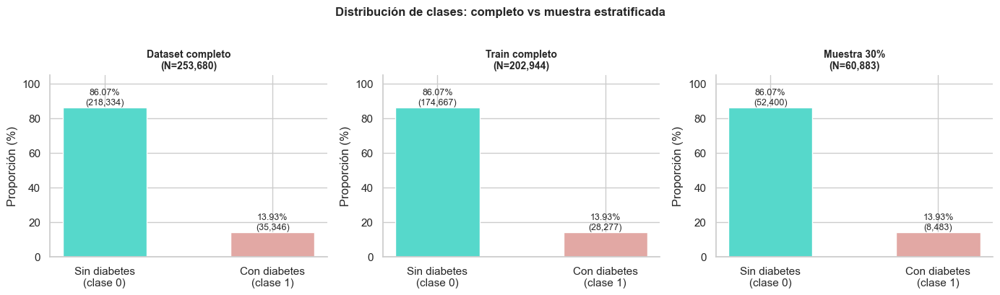

In [109]:
fig, axes = plt.subplots(1, 3, figsize=(14, 4))
datasets  = [
    ("Dataset completo\n(N={:,})".format(len(df)),             y),
    ("Train completo\n(N={:,})".format(len(y_train)),     y_train),
    ("Muestra 30%\n(N={:,})".format(len(y_train_sample)),      y_train_sample),
]

for ax, (titulo, yi) in zip(axes, datasets):
    conteo = yi.value_counts().sort_index()
    prop   = yi.value_counts(normalize=True).sort_index() * 100
    bars   = ax.bar(["Sin diabetes\n(clase 0)", "Con diabetes\n(clase 1)"],
                    prop.values, color=[aqua, coral], edgecolor="white", width=0.5)
    for bar, p, n in zip(bars, prop.values, conteo.values):
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height() + 0.5,
                f"{p:.2f}%\n({n:,})",
                ha="center", va="bottom", fontsize=9)
    ax.set_title(titulo, fontweight="bold", fontsize=10)
    ax.set_ylabel("Proporción (%)")
    ax.set_ylim(0, 105)
    ax.spines[["top", "right"]].set_visible(False)

plt.suptitle("Distribución de clases: completo vs muestra estratificada",
             fontsize=12, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

Las gráficas de representatividad permiten confirmar visualmente los resultados anteriores. En la comparación de clases se observa que el dataset completo, el conjunto de entrenamiento y la muestra estratificada mantienen prácticamente la misma proporción entre personas sin diabetes y personas con prediabetes o diabetes. Esto evidencia que la muestra conserva el desbalance original del problema.

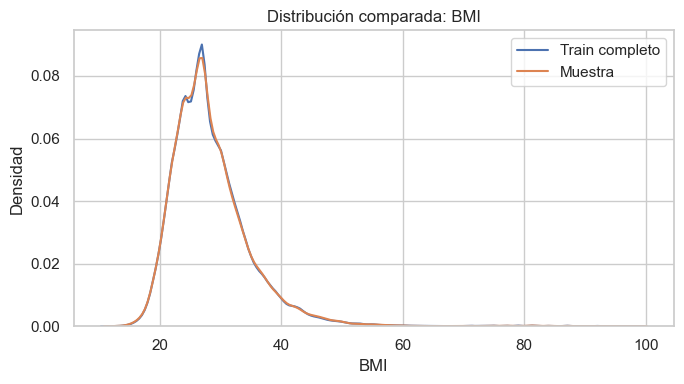

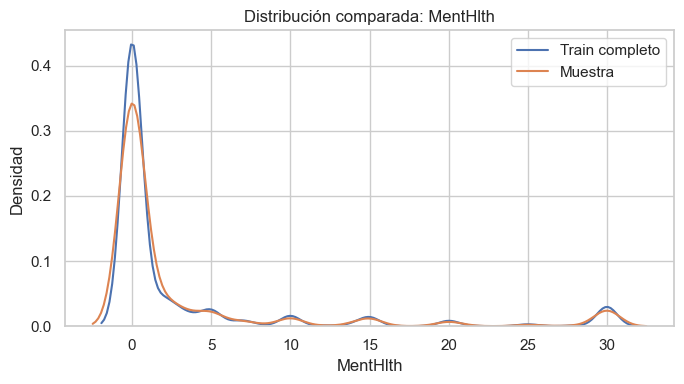

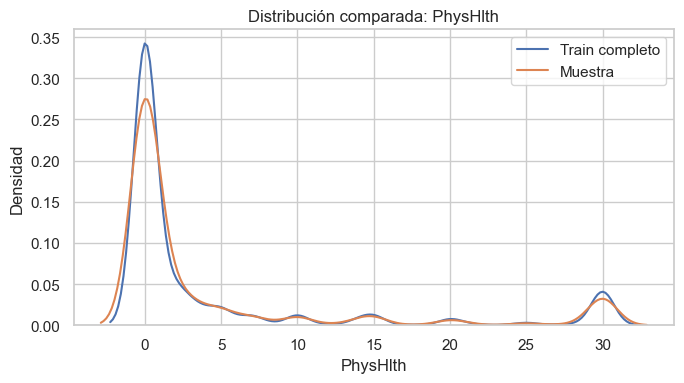

In [ ]:
# Comparación visual de variables numéricas continuas

for col in numeric_cols:
    plt.figure(figsize=(7, 4))
    sns.kdeplot(X_train[col], label="Train completo", fill=False)
    sns.kdeplot(X_train_sample[col], label="Muestra", fill=False)
    plt.title(f"Distribución comparada: {col}")
    plt.xlabel(col)
    plt.ylabel("Densidad")
    plt.legend()
    plt.tight_layout()
    plt.show()

Asimismo, las curvas de densidad de las variables numéricas continuas muestran una alta superposición entre el entrenamiento completo y la muestra. Variables como `BMI`, `MentHlth` y `PhysHlth` presentan distribuciones muy similares, lo cual refuerza la idea de que la muestra mantiene el comportamiento general de los datos originales.

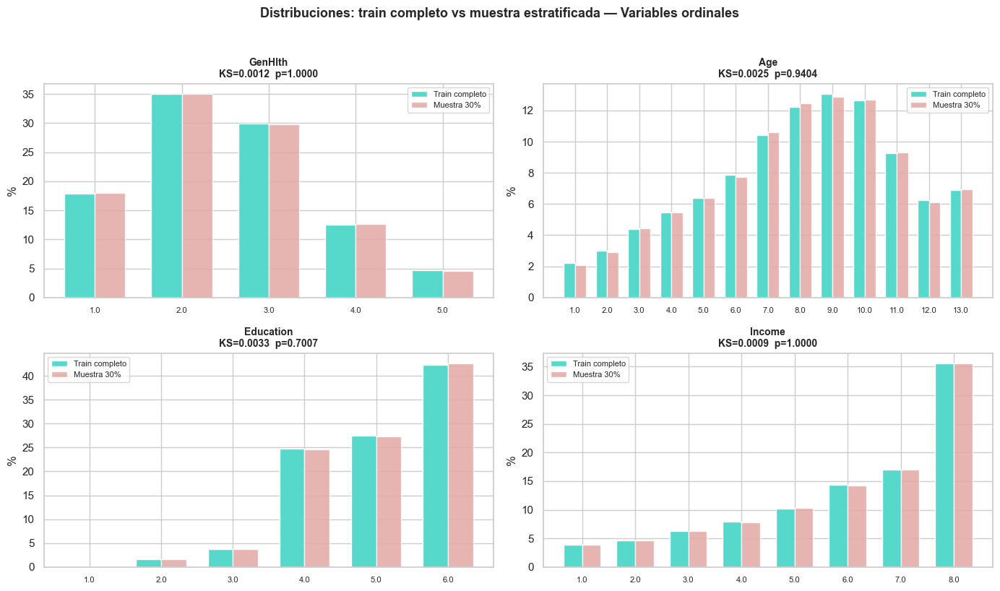

In [13]:

# Variables ordinales: comparación de distribuciones por barras


fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

for ax, col in zip(axes, ordinal_cols):

    vals_train = X_train[col].value_counts(normalize=True).sort_index() * 100
    vals_sample = X_train_sample[col].value_counts(normalize=True).sort_index() * 100

    categorias = sorted(set(vals_train.index) | set(vals_sample.index))
    x = np.arange(len(categorias))
    width = 0.35

    ax.bar(x - width / 2, [vals_train.get(c, 0) for c in categorias],
           width, label="Train completo", color=aqua)

    ax.bar(x + width / 2, [vals_sample.get(c, 0) for c in categorias],
           width, label="Muestra 30%", color=coral, alpha=0.85)

    ks_row = ks_results_df[ks_results_df["Variable"] == col].iloc[0]

    ax.set_title(
        f"{col}\nKS={ks_row['KS statistic']:.4f}  p={ks_row['p-value']:.4f}",
        fontsize=10,
        fontweight="bold"
    )

    ax.set_xticks(x)
    ax.set_xticklabels(categorias, fontsize=8)
    ax.set_ylabel("%")
    ax.legend(fontsize=8)

for ax in axes[len(ordinal_cols):]:
    ax.set_visible(False)

plt.suptitle(
    "Distribuciones: train completo vs muestra estratificada — Variables ordinales",
    fontsize=13,
    fontweight="bold",
    y=1.02
)

plt.tight_layout()
plt.show()



En el caso de las variables ordinales, las gráficas de barras también muestran distribuciones muy cercanas entre ambos conjuntos. Variables como `GenHlth`, `Age`, `Education` e `Income` conservan patrones similares en sus categorías, lo cual respalda la representatividad de la muestra desde el punto de vista visual.

En síntesis, la muestra estratificada del 30% conserva adecuadamente la proporción de clases, el ratio de desbalance y la distribución general de las variables numéricas, ordinales y binarias del conjunto de entrenamiento completo. Las comparaciones descriptivas, las pruebas estadísticas y las gráficas de representatividad muestran que esta muestra mantiene una estructura muy similar a la del conjunto original de entrenamiento.

Por esta razón, la muestra se utiliza como subconjunto de entrenamiento para modelos computacionalmente costosos, como KNN y SVM, cuyo tiempo de ejecución aumenta considerablemente al trabajar con el volumen completo de datos. Esta decisión permite entrenar y comparar dichos modelos de manera más eficiente, manteniendo una base de datos representativa del problema original.

Es importante aclarar que esta muestra se extrae únicamente del conjunto de entrenamiento (`X_train`, `y_train`) y no del conjunto de prueba. Por lo tanto, `X_test` y `y_test` permanecen completamente reservados para la evaluación final de los modelos, evitando fuga de información y garantizando que el desempeño reportado se mida sobre datos no vistos durante el entrenamiento.

### **14.7 Funciones generales para benchmark de modelos base**

Luego de definir la partición de los datos, la validación cruzada estratificada, el preprocesador y la muestra estratificada para modelos de mayor costo computacional, se construye una función general para evaluar modelos de clasificación bajo una misma estructura metodológica.

Esta función permite ejecutar un benchmark inicial de modelos base, es decir, modelos entrenados con hiperparámetros fijos o configuraciones iniciales, antes de aplicar procesos de optimización más avanzados. El objetivo de esta etapa no es encontrar todavía la mejor combinación de hiperparámetros, sino comparar distintos algoritmos bajo condiciones homogéneas de entrenamiento, validación y evaluación.

La función `run_benchmark_classifier()` integra el preprocesamiento y el modelo dentro de un `Pipeline`, lo cual permite aplicar las transformaciones de variables de forma segura en cada partición de validación cruzada. Esto es importante porque evita fuga de información, ya que el preprocesador se ajusta únicamente con los datos correspondientes al entrenamiento de cada fold.

Además, la función permite seleccionar si las variables numéricas deben ser escaladas mediante el parámetro `scale_numeric`. Esta opción es útil porque algunos modelos, como KNN, regresión logística y SVM, son sensibles a la escala de las variables, mientras que otros modelos, como árboles de decisión, random forest o XGBoost, no dependen de la estandarización de la misma manera.

La evaluación se realiza en dos niveles. Primero, se aplica validación cruzada estratificada sobre el conjunto de entrenamiento para obtener métricas promedio de desempeño. Luego, el pipeline se ajusta nuevamente sobre los datos de entrenamiento y se evalúa sobre el conjunto de prueba reservado. De esta forma, se obtiene una comparación más completa entre el rendimiento interno del modelo y su comportamiento frente a datos no vistos.

Las métricas calculadas incluyen `accuracy`, `precision`, `recall`, `F1-score` y `ROC-AUC`. Dado que el problema presenta desbalance de clases, se presta especial atención a métricas como `recall`, `precision`, `F1-score` y `ROC-AUC`, ya que la exactitud por sí sola puede ser engañosa cuando la clase mayoritaria domina la distribución de los datos.

Finalmente, la función también almacena información adicional como el tiempo de ejecución, las predicciones, los puntajes de probabilidad o decisión, la matriz de confusión, el reporte de clasificación y el pipeline entrenado. Esto permite reutilizar los resultados posteriormente para comparar modelos, construir tablas resumen, generar gráficas y seleccionar candidatos para la etapa de optimización.

In [30]:
import time
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_validate
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    classification_report
)


def run_benchmark_classifier(
    model_name,
    estimator,
    scale_numeric=True,
    cv=None,
    n_jobs=-1,
    X_train_data=None,
    y_train_data=None,
    X_test_data=None,
    y_test_data=None
):
    """
    Ejecuta un benchmark de clasificación con hiperparámetros fijos.
    """

    if cv is None:
        cv = cv_strategy

    if X_train_data is None:
        X_train_data = X_train
    if y_train_data is None:
        y_train_data = y_train
    if X_test_data is None:
        X_test_data = X_test
    if y_test_data is None:
        y_test_data = y_test

    preprocessor_local = build_preprocessor(scale_numeric=scale_numeric)

    pipe = Pipeline(steps=[
        ("preprocessor", preprocessor_local),
        ("model", estimator)
    ])

    scoring_metrics = {
        "accuracy": "accuracy",
        "precision": "precision",
        "recall": "recall",
        "f1": "f1",
        "auc": "roc_auc"
    }

    start_time = time.time()

    cv_results = cross_validate(
        estimator=pipe,
        X=X_train_data,
        y=y_train_data,
        cv=cv,
        scoring=scoring_metrics,
        return_train_score=False,
        n_jobs=n_jobs
    )

    pipe.fit(X_train_data, y_train_data)

    elapsed_time = time.time() - start_time

    y_pred = pipe.predict(X_test_data)

    if hasattr(pipe, "predict_proba"):
        y_score = pipe.predict_proba(X_test_data)[:, 1]
    elif hasattr(pipe, "decision_function"):
        y_score = pipe.decision_function(X_test_data)
    else:
        y_score = None

    results = {
        "Modelo": model_name,
        "CV Accuracy": np.mean(cv_results["test_accuracy"]),
        "CV Precision": np.mean(cv_results["test_precision"]),
        "CV Recall": np.mean(cv_results["test_recall"]),
        "CV F1": np.mean(cv_results["test_f1"]),
        "CV AUC": np.mean(cv_results["test_auc"]),
        "Test Accuracy": accuracy_score(y_test_data, y_pred),
        "Test Precision": precision_score(y_test_data, y_pred, zero_division=0),
        "Test Recall": recall_score(y_test_data, y_pred, zero_division=0),
        "Test F1": f1_score(y_test_data, y_pred, zero_division=0),
        "Test AUC": roc_auc_score(y_test_data, y_score) if y_score is not None else np.nan,
        "Tiempo (s)": elapsed_time,
        "Predicciones": y_pred,
        "Scores": y_score,
        "Pipeline": pipe,
        "Matriz Confusión": confusion_matrix(y_test_data, y_pred),
        "Reporte": classification_report(y_test_data, y_pred, output_dict=True)
    }

    return results


La función definida permite estandarizar el proceso de evaluación de los modelos base. Todos los algoritmos que se evalúen mediante esta función pasarán por el mismo flujo: preprocesamiento, validación cruzada, entrenamiento final sobre el conjunto de entrenamiento correspondiente y evaluación sobre el conjunto de prueba.

Esta estructura garantiza que las comparaciones entre modelos sean consistentes, ya que todos son evaluados con las mismas métricas, la misma estrategia de validación y el mismo procedimiento de transformación de variables. Además, al devolver el pipeline entrenado y los principales resultados del modelo, la función facilita la construcción posterior de tablas comparativas, matrices de confusión, curvas ROC, curvas Precision-Recall y análisis detallados del desempeño.

En el caso de modelos computacionalmente costosos, como KNN y SVM, esta misma función puede aplicarse usando la muestra estratificada definida previamente. Para modelos con menor costo computacional, puede utilizarse el conjunto de entrenamiento completo. De esta manera, el proyecto mantiene un equilibrio entre rigurosidad metodológica y eficiencia computacional.

## **15. Modelos iniciales sin optimización de hiperparámetros**

En esta sección se entrenan y evalúan los primeros modelos de clasificación sin aplicar todavía procesos formales de optimización de hiperparámetros. El propósito de esta etapa es obtener un desempeño inicial de referencia para cada algoritmo, utilizando configuraciones base o parámetros definidos de manera preliminar.

Estos modelos permiten construir un benchmark inicial, es decir, una comparación temprana entre distintos algoritmos bajo una metodología común de evaluación. Para ello, se utiliza el flujo definido previamente: preprocesamiento mediante `Pipeline`, validación cruzada estratificada, evaluación sobre el conjunto de prueba y almacenamiento de métricas como `accuracy`, `precision`, `recall`, `F1-score` y `ROC-AUC`.

Debido al desbalance de clases presente en la variable objetivo, la interpretación no se centra únicamente en la exactitud. Aunque el `accuracy` permite observar el desempeño global del modelo, métricas como `recall`, `precision`, `F1-score` y `ROC-AUC` son más informativas para analizar la capacidad del modelo de identificar correctamente los casos positivos de prediabetes o diabetes.


In [31]:
import os
import joblib

BASE_DIR = r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML"

BENCHMARK_DIR = os.path.join(BASE_DIR, "resultados_benchmark")


---

### **15.1 KNN**

El primer modelo evaluado es K-Nearest Neighbors `KNN`, un algoritmo no paramétrico basado en distancias. Su funcionamiento consiste en clasificar una observación nueva a partir de las clases de sus vecinos más cercanos en el espacio de características.

Dado que KNN depende directamente de medidas de distancia, es un modelo sensible a la escala de las variables. Por esta razón, en este caso se utiliza el preprocesador con escalamiento de variables numéricas. Además, debido a que KNN puede ser computacionalmente costoso en conjuntos de datos grandes, se entrena utilizando la muestra estratificada del 30% definida previamente, la cual conserva la proporción de clases y la estructura general del conjunto de entrenamiento.

En esta primera evaluación se utiliza una configuración inicial con `n_neighbors=5`, pesos uniformes y distancia euclidiana. Estos parámetros no corresponden todavía a una optimización formal, sino a una configuración base que permitirá comparar el desempeño inicial del algoritmo.

In [33]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold

cv_knn = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

results_knn = run_benchmark_classifier(
    model_name="KNN",
    estimator=KNeighborsClassifier(
        n_neighbors=5,   # valor benchmark estándar
        weights="uniform",
        metric="euclidean"
    ),
    scale_numeric=True,
    cv=cv_knn
)

In [34]:
knn_summary = pd.DataFrame([{
    "Modelo": results_knn["Modelo"],
    "CV Accuracy": results_knn["CV Accuracy"],
    "CV Precision": results_knn["CV Precision"],
    "CV Recall": results_knn["CV Recall"],
    "CV F1": results_knn["CV F1"],
    "CV AUC": results_knn["CV AUC"],
    "Test Accuracy": results_knn["Test Accuracy"],
    "Test Precision": results_knn["Test Precision"],
    "Test Recall": results_knn["Test Recall"],
    "Test F1": results_knn["Test F1"],
    "Test AUC": results_knn["Test AUC"],
    "Tiempo (s)": results_knn["Tiempo (s)"]
}])

display(knn_summary.round(4))

,Modelo,CV Accuracy,CV Precision,CV Recall,CV F1,CV AUC,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s)
0,KNN,0.8493,0.4172,0.206,0.2758,0.7198,0.8481,0.4089,0.2031,0.2714,0.7199,67.0489


Los resultados iniciales de KNN muestran un desempeño global aparentemente alto en términos de exactitud, con un `Test Accuracy` de aproximadamente 0.8483. Sin embargo, esta métrica debe interpretarse con cautela debido al desbalance de clases, ya que la mayoría de las observaciones pertenecen a la clase "Sin diabetes".

Al revisar métricas más sensibles a la clase positiva, el desempeño del modelo es limitado. En el conjunto de prueba, KNN obtiene un `Test Precision` de 0.4104, un `Test Recall` de 0.2034 y un `Test F1-score` de 0.2720. Esto indica que, aunque el modelo logra cierta precisión cuando predice casos positivos, identifica únicamente cerca del 20% de los casos reales de prediabetes o diabetes.

La comparación entre validación cruzada y prueba muestra resultados bastante consistentes. El `CV F1` fue de 0.2760 y el `Test F1` de 0.2720, mientras que el `CV AUC` fue de 0.7198 y el `Test AUC` de 0.7199. Esta cercanía sugiere que el modelo no presenta una diferencia fuerte entre el desempeño interno y el desempeño sobre datos no vistos, aunque su capacidad para detectar la clase minoritaria sigue siendo baja.

El tiempo de ejecución fue de aproximadamente 89.66 segundos, lo cual confirma que KNN es un modelo relativamente costoso computacionalmente incluso utilizando una muestra estratificada. Esto justifica la decisión metodológica de no entrenarlo inicialmente con todo el conjunto de entrenamiento.

In [35]:
os.makedirs(BENCHMARK_DIR, exist_ok=True)

joblib.dump(
    results_knn,
    os.path.join(BENCHMARK_DIR, "benchmark_knn.joblib")
)

['C:\\Users\\danih\\OneDrive\\Documentos\\U\\6° SEMESTRE\\Machine L\\Proyecto diabetes - ML\\resultados_benchmark\\benchmark_knn.joblib']

In [20]:
print("Reporte de clasificación - KNN")
print(classification_report(y_test, results_knn["Predicciones"], zero_division=0))

Reporte de clasificación - KNN
              precision    recall  f1-score   support

         0.0       0.88      0.95      0.92     43667
         1.0       0.41      0.20      0.27      7069

    accuracy                           0.85     50736
   macro avg       0.65      0.58      0.59     50736
weighted avg       0.82      0.85      0.83     50736



El reporte de clasificación confirma que KNN tiene un desempeño mucho mejor sobre la clase mayoritaria que sobre la clase minoritaria. Para la clase 0, correspondiente a personas sin diabetes, el modelo alcanza un `recall` de 0.95 y un `F1-score` de 0.92. Esto significa que identifica correctamente la mayoría de los casos negativos.

En contraste, para la clase 1, correspondiente a personas con prediabetes o diabetes, el modelo obtiene un `recall` de 0.20 y un `F1-score` de 0.27. Esto evidencia una baja capacidad para detectar los casos positivos. En términos prácticos, el modelo tiende a clasificar muchas observaciones positivas como si pertenecieran a la clase negativa, lo cual es una limitación importante para el objetivo predictivo del proyecto.

El promedio ponderado se mantiene alto debido al peso de la clase mayoritaria, pero el promedio macro refleja mejor el desequilibrio en el desempeño entre ambas clases. Por esta razón, el análisis del modelo no debe basarse únicamente en el accuracy o en el promedio ponderado.

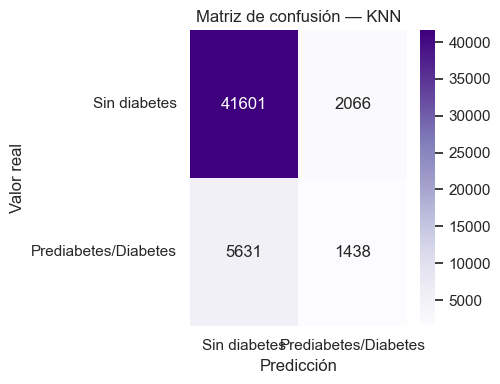

In [21]:
cm_knn = results_knn["Matriz Confusión"]

plt.figure(figsize=(5, 4))
sns.heatmap(cm_knn, annot=True, fmt="d", cmap="Purples")
plt.title("Matriz de confusión — KNN")
plt.xlabel("Predicción")
plt.ylabel("Valor real")
plt.xticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"])
plt.yticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"], rotation=0)
plt.tight_layout()
plt.show()

La matriz de confusión permite observar con mayor detalle el comportamiento del modelo. KNN clasificó correctamente 41.601 casos de la clase "Sin diabetes" y 1.438 casos de la clase "Prediabetes/Diabetes". Sin embargo, también clasificó erróneamente 5.631 casos positivos como negativos, lo cual representa una cantidad considerable de falsos negativos.

Este resultado es especialmente relevante porque los falsos negativos corresponden a personas que realmente presentan prediabetes o diabetes, pero que el modelo no logra identificar. En problemas de salud, este tipo de error puede ser más crítico que los falsos positivos, ya que implica dejar sin alerta a individuos que sí pertenecen al grupo de riesgo.

Por otro lado, el número de falsos positivos fue de 2.066, lo que indica que el modelo predijo como positivos algunos casos que realmente no tenían diabetes. Aunque este error también afecta el desempeño, el principal problema del modelo se encuentra en su bajo nivel de detección de la clase positiva.

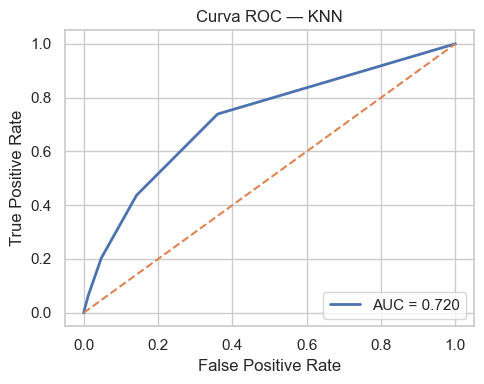

In [22]:
from sklearn.metrics import roc_curve

y_score_knn = results_knn["Scores"]
fpr_knn, tpr_knn, _ = roc_curve(y_test, y_score_knn)

plt.figure(figsize=(5, 4))
plt.plot(
    fpr_knn,
    tpr_knn,
    label=f"AUC = {results_knn['Test AUC']:.3f}",
    linewidth=2
)
plt.plot([0, 1], [0, 1], linestyle="--")
plt.title("Curva ROC — KNN")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

La curva ROC muestra un `AUC` aproximado de 0.720, lo cual indica una capacidad moderada del modelo para diferenciar entre las clases. Este valor sugiere que KNN sí logra capturar cierta información útil para distinguir entre personas con y sin diabetes, pero no alcanza todavía un desempeño suficientemente fuerte para considerarse un modelo final.

La diferencia entre el `AUC` y el bajo `recall` de la clase positiva indica que el modelo puede tener cierta capacidad de ordenamiento mediante sus puntajes de probabilidad, pero el umbral de clasificación por defecto no favorece la detección de casos positivos. Por esta razón, en etapas posteriores podría explorarse el ajuste del umbral de decisión, además de técnicas de balanceo y optimización de hiperparámetros.

En síntesis, KNN ofrece un desempeño inicial estable entre validación cruzada y prueba, pero presenta una limitación importante en la identificación de la clase minoritaria. Por tanto, este modelo se mantiene como referencia inicial dentro del benchmark, aunque requiere ajustes adicionales para mejorar su utilidad en el contexto del problema.

---

### **15.2 Regresión Logística L2**

El segundo modelo evaluado corresponde a una regresión logística con regularización L2. Este algoritmo es un modelo lineal ampliamente utilizado en problemas de clasificación binaria, ya que permite estimar la probabilidad de pertenencia a una clase a partir de una combinación lineal de las variables predictoras.

En este caso se utiliza la penalización L2, también conocida como regularización Ridge, la cual ayuda a controlar la magnitud de los coeficientes del modelo y reduce el riesgo de sobreajuste. Esta regularización penaliza coeficientes demasiado grandes, favoreciendo un modelo más estable y generalizable.

La regresión logística es sensible a la escala de las variables, especialmente cuando se aplica regularización. Por esta razón, se utiliza el preprocesador con escalamiento de variables numéricas. Además, en esta primera evaluación se trabaja con una configuración inicial: `penalty="l2"`, `solver="liblinear"` y `C=1.0`. Estos parámetros no han sido optimizados todavía, por lo que el modelo se considera parte del benchmark inicial de modelos base.

In [37]:
from sklearn.linear_model import LogisticRegression

results_logreg_l2 = run_benchmark_classifier(
    model_name="Logistic Regression L2",
    estimator=LogisticRegression(
        penalty="l2",
        solver="liblinear",
        C=1.0,
        max_iter=1000,
        random_state=42
    ),
    scale_numeric=True,
    cv=cv_strategy
)

In [38]:
os.makedirs(BENCHMARK_DIR, exist_ok=True)

joblib.dump(
    results_logreg_l2,
    os.path.join(BENCHMARK_DIR, "benchmark_logreg_l2.joblib")
)

['C:\\Users\\danih\\OneDrive\\Documentos\\U\\6° SEMESTRE\\Machine L\\Proyecto diabetes - ML\\resultados_benchmark\\benchmark_logreg_l2.joblib']

In [40]:
logreg_l2_summary = pd.DataFrame([{
    "Modelo": results_logreg_l2["Modelo"],
    "CV Accuracy": results_logreg_l2["CV Accuracy"],
    "CV Precision": results_logreg_l2["CV Precision"],
    "CV Recall": results_logreg_l2["CV Recall"],
    "CV F1": results_logreg_l2["CV F1"],
    "CV AUC": results_logreg_l2["CV AUC"],
    "Test Accuracy": results_logreg_l2["Test Accuracy"],
    "Test Precision": results_logreg_l2["Test Precision"],
    "Test Recall": results_logreg_l2["Test Recall"],
    "Test F1": results_logreg_l2["Test F1"],
    "Test AUC": results_logreg_l2["Test AUC"],
    "Tiempo (s)": results_logreg_l2["Tiempo (s)"]
}])

display(logreg_l2_summary.round(4))

,Modelo,CV Accuracy,CV Precision,CV Recall,CV F1,CV AUC,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s)
0,Logistic Regression L2,0.8639,0.5391,0.1579,0.2443,0.8228,0.8622,0.5181,0.1583,0.2425,0.8192,6.9306


Los resultados de la regresión logística L2 muestran un desempeño global alto en términos de exactitud, con un `Test Accuracy` de aproximadamente 0.8622. Sin embargo, al igual que en el caso de KNN, esta métrica debe analizarse con cautela debido al desbalance de clases presente en la variable objetivo.

En validación cruzada, el modelo obtuvo un `CV Accuracy` de 0.8639, un `CV Precision` de 0.5391, un `CV Recall` de 0.1579, un `CV F1-score` de 0.2443 y un `CV AUC` de 0.8228. En el conjunto de prueba, los resultados fueron muy similares: `Test Accuracy` de 0.8622, `Test Precision` de 0.5181, `Test Recall` de 0.1583, `Test F1-score` de 0.2425 y `Test AUC` de 0.8192.

La cercanía entre las métricas de validación cruzada y prueba indica que el modelo tiene un comportamiento estable y no presenta señales fuertes de sobreajuste. No obstante, el bajo valor de `recall` evidencia que el modelo identifica una proporción reducida de los casos positivos de prediabetes o diabetes.

El tiempo de ejecución fue de aproximadamente 6.93 segundos, lo cual muestra que la regresión logística L2 es considerablemente más eficiente que KNN desde el punto de vista computacional.

In [26]:
print("Reporte de clasificación - Logistic Regression L2")
print(classification_report(y_test, results_logreg_l2["Predicciones"], zero_division=0))

Reporte de clasificación - Logistic Regression L2
              precision    recall  f1-score   support

         0.0       0.88      0.98      0.92     43667
         1.0       0.52      0.16      0.24      7069

    accuracy                           0.86     50736
   macro avg       0.70      0.57      0.58     50736
weighted avg       0.83      0.86      0.83     50736



El reporte de clasificación muestra una diferencia clara entre el desempeño del modelo sobre la clase mayoritaria y la clase minoritaria. Para la clase 0, correspondiente a personas sin diabetes, el modelo alcanza un `recall` de 0.98 y un `F1-score` de 0.92, lo que indica que identifica correctamente la mayoría de los casos negativos.

Sin embargo, para la clase 1, correspondiente a personas con prediabetes o diabetes, el modelo obtiene un `recall` de apenas 0.16 y un `F1-score` de 0.24. Esto significa que, aunque cuando predice la clase positiva tiene una precisión moderada de 0.52, solo logra detectar una pequeña parte de los casos reales positivos.

El promedio ponderado se mantiene alto debido a que la clase mayoritaria tiene mucho más peso dentro del conjunto de datos. Por esta razón, el promedio macro y las métricas específicas de la clase 1 resultan más útiles para interpretar el desempeño real del modelo frente al desbalance de clases.

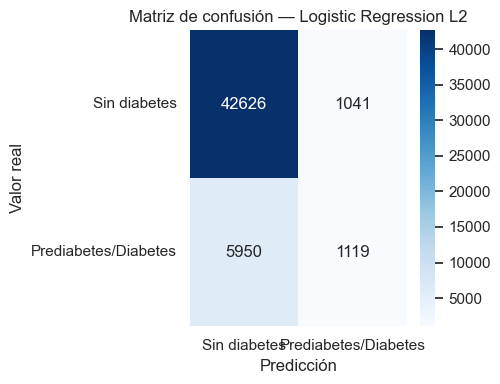

In [125]:
cm_logreg_l2 = results_logreg_l2["Matriz Confusión"]

plt.figure(figsize=(5, 4))
sns.heatmap(cm_logreg_l2, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de confusión — Logistic Regression L2")
plt.xlabel("Predicción")
plt.ylabel("Valor real")
plt.xticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"])
plt.yticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"], rotation=0)
plt.tight_layout()
plt.show()

La matriz de confusión confirma que la regresión logística L2 tiende a favorecer la clase mayoritaria. El modelo clasificó correctamente 42.626 casos sin diabetes y 1.119 casos con prediabetes o diabetes. Sin embargo, también generó 5.950 falsos negativos, es decir, personas que realmente pertenecían a la clase positiva pero fueron clasificadas como negativas.

Este resultado es importante porque, en el contexto del proyecto, los falsos negativos representan casos de riesgo que el modelo no logra detectar. Por tanto, aunque la exactitud general del modelo es alta, su capacidad para identificar personas con prediabetes o diabetes sigue siendo limitada.

Por otro lado, el modelo produjo 1.041 falsos positivos, una cantidad menor en comparación con los falsos negativos. Esto indica que el principal problema del modelo no es clasificar demasiados casos negativos como positivos, sino no detectar suficientes casos positivos.

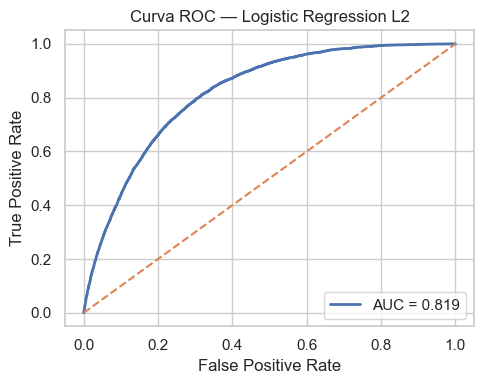

In [126]:
from sklearn.metrics import roc_curve

y_score_logreg_l2 = results_logreg_l2["Scores"]
fpr_logreg_l2, tpr_logreg_l2, _ = roc_curve(y_test, y_score_logreg_l2)

plt.figure(figsize=(5, 4))
plt.plot(
    fpr_logreg_l2,
    tpr_logreg_l2,
    label=f"AUC = {results_logreg_l2['Test AUC']:.3f}",
    linewidth=2
)
plt.plot([0, 1], [0, 1], linestyle="--")
plt.title("Curva ROC — Logistic Regression L2")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

La curva ROC presenta un `AUC` de aproximadamente 0.819, superior al obtenido por KNN. Este valor indica que la regresión logística L2 tiene una buena capacidad para ordenar y diferenciar las observaciones entre ambas clases a partir de sus puntajes de probabilidad.

Sin embargo, existe una diferencia importante entre el buen valor de `AUC` y el bajo `recall` observado con el umbral de clasificación por defecto. Esto sugiere que el modelo sí logra asignar puntajes útiles para distinguir entre personas con y sin diabetes, pero el punto de corte estándar de 0.5 no favorece la detección de la clase positiva.

Por esta razón, en etapas posteriores podría ser conveniente evaluar ajustes del umbral de decisión, técnicas de balanceo de clases o configuraciones con `class_weight="balanced"`, con el fin de mejorar la sensibilidad del modelo frente a los casos positivos.

---
### **15.3 Regresión Logística L1**

El tercer modelo evaluado corresponde a una regresión logística con regularización L1. Al igual que la regresión logística L2, este modelo se utiliza para problemas de clasificación binaria y estima la probabilidad de pertenencia a una clase a partir de una combinación lineal de las variables predictoras.

La principal diferencia está en el tipo de regularización. La penalización L1, también conocida como regularización Lasso, tiende a reducir algunos coeficientes hasta llevarlos exactamente a cero. Por esta razón, puede funcionar como una forma de selección automática de variables, ya que el modelo puede descartar aquellas características que aportan poca información bajo la configuración utilizada.

En esta etapa se evalúa el modelo con una configuración inicial, usando `penalty="l1"`, `solver="liblinear"` y `C=1.0`. Esta configuración aún no corresponde a una optimización formal de hiperparámetros, sino a un modelo base incluido dentro del benchmark inicial. Debido a que la regresión logística con regularización es sensible a la escala de las variables, se utiliza nuevamente el preprocesador con escalamiento numérico.

In [41]:
from sklearn.linear_model import LogisticRegression

results_logreg_l1 = run_benchmark_classifier(
    model_name="Logistic Regression L1",
    estimator=LogisticRegression(
        penalty="l1",
        solver="liblinear",
        C=1.0,
        max_iter=1000,
        random_state=42
    ),
    scale_numeric=True,
    cv=cv_strategy
)

In [42]:
os.makedirs(BENCHMARK_DIR, exist_ok=True)

joblib.dump(
    results_logreg_l1,
    os.path.join(BENCHMARK_DIR, "benchmark_logreg_l1.joblib")
)

['C:\\Users\\danih\\OneDrive\\Documentos\\U\\6° SEMESTRE\\Machine L\\Proyecto diabetes - ML\\resultados_benchmark\\benchmark_logreg_l1.joblib']

In [43]:
logreg_l1_summary = pd.DataFrame([{
    "Modelo": results_logreg_l1["Modelo"],
    "CV Accuracy": results_logreg_l1["CV Accuracy"],
    "CV Precision": results_logreg_l1["CV Precision"],
    "CV Recall": results_logreg_l1["CV Recall"],
    "CV F1": results_logreg_l1["CV F1"],
    "CV AUC": results_logreg_l1["CV AUC"],
    "Test Accuracy": results_logreg_l1["Test Accuracy"],
    "Test Precision": results_logreg_l1["Test Precision"],
    "Test Recall": results_logreg_l1["Test Recall"],
    "Test F1": results_logreg_l1["Test F1"],
    "Test AUC": results_logreg_l1["Test AUC"],
    "Tiempo (s)": results_logreg_l1["Tiempo (s)"]
}])

display(logreg_l1_summary.round(4))

,Modelo,CV Accuracy,CV Precision,CV Recall,CV F1,CV AUC,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s)
0,Logistic Regression L1,0.8639,0.5392,0.158,0.2443,0.8228,0.8622,0.5178,0.1583,0.2425,0.8192,34.3444


Los resultados obtenidos por la regresión logística L1 son muy similares a los de la regresión logística L2. En validación cruzada, el modelo alcanza un `CV Accuracy` de 0.8639, un `CV Precision` de 0.5392, un `CV Recall` de 0.1580, un `CV F1-score` de 0.2443 y un `CV AUC` de 0.8228.

En el conjunto de prueba, el modelo obtiene un `Test Accuracy` de 0.8622, un `Test Precision` de 0.5178, un `Test Recall` de 0.1583, un `Test F1-score` de 0.2425 y un `Test AUC` de 0.8192. La cercanía entre las métricas de validación cruzada y prueba indica un comportamiento estable, sin diferencias fuertes entre el desempeño interno y el desempeño sobre datos no vistos.

Sin embargo, aunque el `accuracy` y el `AUC` son relativamente altos, el `recall` continúa siendo bajo. Esto significa que el modelo identifica una proporción reducida de los casos positivos de prediabetes o diabetes. Por tanto, al igual que en la regresión logística L2, el modelo tiende a favorecer la clase mayoritaria.

El tiempo de ejecución fue de aproximadamente 34.34 segundos, superior al observado en la regresión logística L2. Esto puede deberse al proceso de ajuste asociado a la penalización L1, que suele ser más costoso computacionalmente.

In [44]:
print("Reporte de clasificación - Logistic Regression L1")
print(classification_report(y_test, results_logreg_l1["Predicciones"], zero_division=0))

Reporte de clasificación - Logistic Regression L1
              precision    recall  f1-score   support

         0.0       0.88      0.98      0.92     43667
         1.0       0.52      0.16      0.24      7069

    accuracy                           0.86     50736
   macro avg       0.70      0.57      0.58     50736
weighted avg       0.83      0.86      0.83     50736



El reporte de clasificación confirma que la regresión logística L1 presenta un desempeño alto sobre la clase mayoritaria y limitado sobre la clase minoritaria. Para la clase 0, correspondiente a personas sin diabetes, el modelo obtiene una precisión de 0.88, un `recall` de 0.98 y un `F1-score` de 0.92. Esto indica que clasifica correctamente la mayoría de los casos negativos.

En cambio, para la clase 1, correspondiente a personas con prediabetes o diabetes, el modelo alcanza una precisión de 0.52, un `recall` de 0.16 y un `F1-score` de 0.24. Esto evidencia que, aunque el modelo tiene una precisión moderada cuando predice casos positivos, solo logra identificar una pequeña parte de los casos reales de la clase positiva.

El promedio ponderado se mantiene alto debido al peso de la clase mayoritaria dentro del conjunto de datos. Sin embargo, el promedio macro permite observar con mayor claridad el bajo desempeño sobre la clase minoritaria, por lo cual resulta más útil para interpretar el efecto del desbalance de clases.

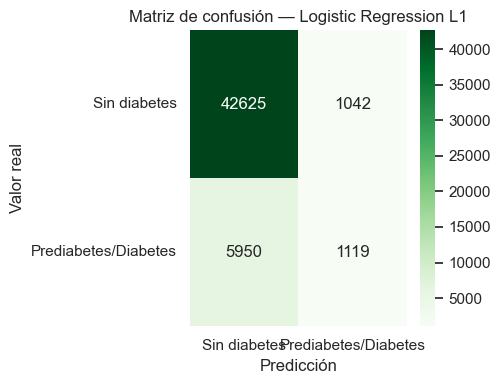

In [131]:
cm_logreg_l1 = results_logreg_l1["Matriz Confusión"]

plt.figure(figsize=(5, 4))
sns.heatmap(cm_logreg_l1, annot=True, fmt="d", cmap="Greens")
plt.title("Matriz de confusión — Logistic Regression L1")
plt.xlabel("Predicción")
plt.ylabel("Valor real")
plt.xticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"])
plt.yticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"], rotation=0)
plt.tight_layout()
plt.show()

La matriz de confusión muestra que el modelo clasificó correctamente 42.625 casos de la clase "Sin diabetes" y 1.119 casos de la clase "Prediabetes/Diabetes". No obstante, también generó 5.950 falsos negativos, es decir, personas que realmente pertenecían a la clase positiva pero fueron clasificadas como negativas.

Este resultado confirma que la principal limitación del modelo está en la baja detección de los casos positivos. En un contexto asociado a salud, este tipo de error es importante, ya que implica que el modelo deja de identificar una cantidad considerable de personas con posible condición de riesgo.

Por otro lado, el modelo produjo 1.042 falsos positivos, una cantidad menor en comparación con los falsos negativos. Esto indica que el modelo es conservador al predecir la clase positiva: prefiere clasificar la mayoría de observaciones como negativas, lo cual favorece el `accuracy`, pero afecta directamente el `recall` de la clase minoritaria.

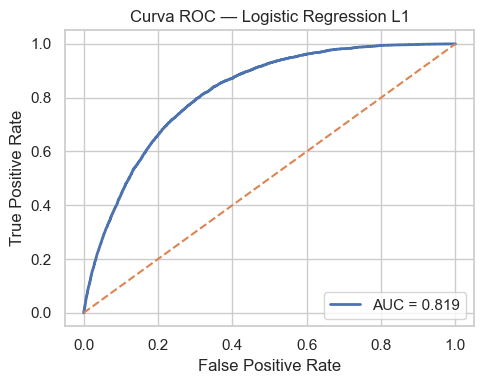

In [132]:
from sklearn.metrics import roc_curve

y_score_logreg_l1 = results_logreg_l1["Scores"]
fpr_logreg_l1, tpr_logreg_l1, _ = roc_curve(y_test, y_score_logreg_l1)

plt.figure(figsize=(5, 4))
plt.plot(
    fpr_logreg_l1,
    tpr_logreg_l1,
    label=f"AUC = {results_logreg_l1['Test AUC']:.3f}",
    linewidth=2
)
plt.plot([0, 1], [0, 1], linestyle="--")
plt.title("Curva ROC — Logistic Regression L1")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

La curva ROC presenta un `AUC` aproximado de 0.819, lo cual indica una buena capacidad general del modelo para separar ambas clases mediante sus puntajes de probabilidad. Este resultado es prácticamente igual al obtenido con la regresión logística L2, lo que sugiere que, bajo esta configuración inicial, ambas regularizaciones tienen un comportamiento muy parecido.

Sin embargo, el bajo `recall` evidencia que el umbral de clasificación por defecto no favorece la identificación de la clase positiva. Aunque el modelo logra ordenar razonablemente bien las observaciones según su probabilidad estimada, al aplicar el punto de corte estándar termina clasificando pocos casos como positivos.

Por esta razón, en etapas posteriores será necesario explorar alternativas como ajuste del umbral de decisión, técnicas de balanceo de clases, uso de `class_weight="balanced"` y optimización del parámetro `C`, con el objetivo de mejorar la sensibilidad del modelo frente a los casos de prediabetes o diabetes.

---
### **15.4 Clasificación Naïve Bayes**

El siguiente modelo evaluado corresponde a `Gaussian Naive Bayes`, un clasificador probabilístico basado en el teorema de Bayes. Este modelo estima la probabilidad de pertenencia a cada clase a partir de las variables predictoras y selecciona la clase con mayor probabilidad posterior.

La versión gaussiana de Naive Bayes asume que las variables continuas siguen una distribución normal dentro de cada clase. Además, parte del supuesto de independencia condicional entre las variables, es decir, considera que cada predictor aporta información de manera independiente una vez conocida la clase. Aunque este supuesto puede ser fuerte en datos reales, el modelo suele ser útil como referencia inicial por su simplicidad, rapidez y bajo costo computacional.

En esta etapa se incluye como modelo base dentro del benchmark inicial sin optimización de hiperparámetros. A diferencia de modelos como KNN o SVM, Gaussian Naive Bayes no depende directamente de distancias, por lo que el escalamiento no es estrictamente necesario; sin embargo, se mantiene dentro del mismo flujo de preprocesamiento para conservar una estructura metodológica homogénea.

In [45]:
from sklearn.naive_bayes import GaussianNB

results_gnb = run_benchmark_classifier(
    model_name="Gaussian Naive Bayes",
    estimator=GaussianNB(),
    scale_numeric=True,
    cv=cv_strategy
)

In [46]:
os.makedirs(BENCHMARK_DIR, exist_ok=True)

joblib.dump(
    results_gnb,
    os.path.join(BENCHMARK_DIR, "benchmark_gnb.joblib")
)

['C:\\Users\\danih\\OneDrive\\Documentos\\U\\6° SEMESTRE\\Machine L\\Proyecto diabetes - ML\\resultados_benchmark\\benchmark_gnb.joblib']

In [47]:
gnb_summary = pd.DataFrame([{
    "Modelo": results_gnb["Modelo"],
    "CV Accuracy": results_gnb["CV Accuracy"],
    "CV Precision": results_gnb["CV Precision"],
    "CV Recall": results_gnb["CV Recall"],
    "CV F1": results_gnb["CV F1"],
    "CV AUC": results_gnb["CV AUC"],
    "Test Accuracy": results_gnb["Test Accuracy"],
    "Test Precision": results_gnb["Test Precision"],
    "Test Recall": results_gnb["Test Recall"],
    "Test F1": results_gnb["Test F1"],
    "Test AUC": results_gnb["Test AUC"],
    "Tiempo (s)": results_gnb["Tiempo (s)"]
}])

display(gnb_summary.round(4))

,Modelo,CV Accuracy,CV Precision,CV Recall,CV F1,CV AUC,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s)
0,Gaussian Naive Bayes,0.7736,0.3234,0.572,0.4132,0.7848,0.7722,0.3198,0.5639,0.4082,0.7803,2.3411


Los resultados muestran que Gaussian Naive Bayes tiene un comportamiento diferente al observado en KNN y en las regresiones logísticas. En validación cruzada, el modelo obtuvo un `CV Accuracy` de 0.7736, un `CV Precision` de 0.3234, un `CV Recall` de 0.5720, un `CV F1-score` de 0.4132 y un `CV AUC` de 0.7848.

En el conjunto de prueba, los resultados fueron muy similares: `Test Accuracy` de 0.7722, `Test Precision` de 0.3198, `Test Recall` de 0.5639, `Test F1-score` de 0.4082 y `Test AUC` de 0.7803. La cercanía entre las métricas de validación cruzada y prueba indica que el modelo presenta un desempeño estable y no evidencia una diferencia fuerte entre la evaluación interna y la evaluación sobre datos no vistos.

A diferencia de los modelos anteriores, Gaussian Naive Bayes obtiene un `recall` considerablemente más alto para la clase positiva. Esto significa que logra identificar una mayor proporción de personas con prediabetes o diabetes. Sin embargo, esta mejora ocurre a costa de una menor precisión y una reducción en la exactitud general, debido a que el modelo también clasifica más casos negativos como positivos.

El tiempo de ejecución fue de aproximadamente 2.34 segundos, lo cual lo convierte en uno de los modelos más rápidos dentro del benchmark inicial.

In [135]:
print("Reporte de clasificación - Gaussian Naive Bayes")
print(classification_report(y_test, results_gnb["Predicciones"], zero_division=0))

Reporte de clasificación - Gaussian Naive Bayes
              precision    recall  f1-score   support

         0.0       0.92      0.81      0.86     43667
         1.0       0.32      0.56      0.41      7069

    accuracy                           0.77     50736
   macro avg       0.62      0.68      0.63     50736
weighted avg       0.84      0.77      0.80     50736



El reporte de clasificación evidencia que Gaussian Naive Bayes mejora la detección de la clase positiva en comparación con KNN y las regresiones logísticas. Para la clase 1, correspondiente a personas con prediabetes o diabetes, el modelo obtiene un `recall` de 0.56 y un `F1-score` de 0.41. Esto indica que logra identificar más de la mitad de los casos positivos reales, lo cual representa una mejora importante frente a modelos que apenas detectaban cerca del 16% o 20% de esta clase.

No obstante, la precisión para la clase positiva es de 0.32, lo que significa que una parte considerable de las observaciones clasificadas como positivas realmente pertenecen a la clase negativa. En otras palabras, el modelo aumenta la sensibilidad frente a los casos de diabetes, pero también incrementa los falsos positivos.

Para la clase 0, correspondiente a personas sin diabetes, el modelo conserva un buen desempeño, con una precisión de 0.92, un `recall` de 0.81 y un `F1-score` de 0.86. Aunque este desempeño es menor que el observado en la regresión logística para la clase mayoritaria, el modelo presenta un mejor equilibrio entre ambas clases.

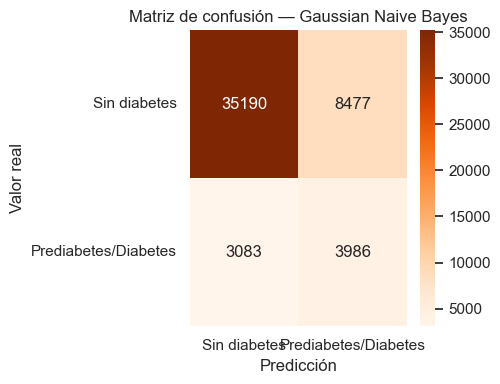

In [136]:
cm_gnb = results_gnb["Matriz Confusión"]

plt.figure(figsize=(5, 4))
sns.heatmap(cm_gnb, annot=True, fmt="d", cmap="Oranges")
plt.title("Matriz de confusión — Gaussian Naive Bayes")
plt.xlabel("Predicción")
plt.ylabel("Valor real")
plt.xticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"])
plt.yticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"], rotation=0)
plt.tight_layout()
plt.show()

La matriz de confusión permite observar con mayor claridad el comportamiento del modelo. Gaussian Naive Bayes clasificó correctamente 35.190 casos sin diabetes y 3.986 casos con prediabetes o diabetes. En comparación con modelos anteriores, el número de verdaderos positivos aumenta de forma importante, lo que explica el mayor `recall` de la clase positiva.

Sin embargo, el modelo también produjo 8.477 falsos positivos, es decir, personas sin diabetes que fueron clasificadas como casos positivos. Esto reduce la precisión del modelo, ya que aumenta la cantidad de predicciones positivas incorrectas.

Por otro lado, se observan 3.083 falsos negativos, una cantidad menor que la obtenida en las regresiones logísticas. Este punto es relevante porque, en un problema relacionado con salud, reducir los falsos negativos puede ser importante cuando el objetivo es detectar la mayor cantidad posible de personas con riesgo de diabetes.

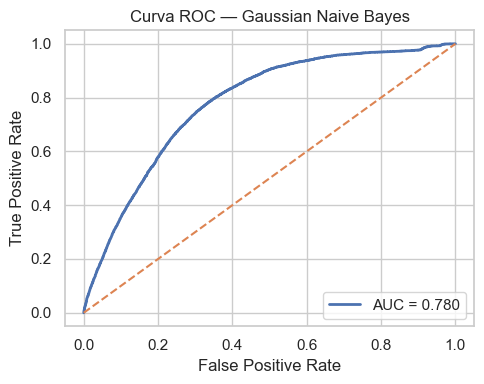

In [137]:
from sklearn.metrics import roc_curve

y_score_gnb = results_gnb["Scores"]
fpr_gnb, tpr_gnb, _ = roc_curve(y_test, y_score_gnb)

plt.figure(figsize=(5, 4))
plt.plot(
    fpr_gnb,
    tpr_gnb,
    label=f"AUC = {results_gnb['Test AUC']:.3f}",
    linewidth=2
)
plt.plot([0, 1], [0, 1], linestyle="--")
plt.title("Curva ROC — Gaussian Naive Bayes")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

La curva ROC muestra un `AUC` aproximado de 0.780, lo cual indica una capacidad moderada del modelo para diferenciar entre personas con y sin diabetes. Este valor es inferior al obtenido por las regresiones logísticas, pero el modelo logra un mejor `recall` sobre la clase positiva usando el umbral de clasificación por defecto.

Esto muestra una diferencia importante entre capacidad de separación y comportamiento de clasificación. Aunque Gaussian Naive Bayes no alcanza el mayor `AUC`, sí resulta más sensible para detectar casos positivos en esta configuración inicial. Por tanto, puede ser útil como modelo base cuando se prioriza la identificación de personas con prediabetes o diabetes, aunque su baja precisión debe ser considerada.

En etapas posteriores sería conveniente evaluar si técnicas de balanceo, ajuste del umbral o calibración de probabilidades pueden mejorar el equilibrio entre `precision` y `recall`.

---
### **15.5 Decision Tree**

El siguiente modelo evaluado corresponde a un Árbol de Decisión, un algoritmo supervisado que clasifica las observaciones mediante una estructura jerárquica de reglas. Este modelo divide progresivamente el espacio de variables a partir de condiciones sobre los predictores, buscando separar las clases de la variable objetivo de la mejor manera posible.

A diferencia de modelos como KNN, regresión logística o SVM, los árboles de decisión no son sensibles a la escala de las variables, ya que sus divisiones se basan en puntos de corte y no en distancias o magnitudes de coeficientes. Por esta razón, en este caso se utiliza el preprocesador sin escalamiento numérico, manteniendo las variables en su escala original.

En esta primera evaluación se utiliza una configuración inicial con `max_depth=10`, `min_samples_split=10` y `min_samples_leaf=5`. Estos valores permiten limitar la complejidad del árbol y reducir el riesgo de sobreajuste, pero todavía no corresponden a una búsqueda formal de hiperparámetros. Por tanto, este modelo se considera parte del benchmark inicial de modelos base sin optimización.

In [48]:
from sklearn.tree import DecisionTreeClassifier

results_dt = run_benchmark_classifier(
    model_name="Decision Tree",
    estimator=DecisionTreeClassifier(
        max_depth=10,
        min_samples_split=10,
        min_samples_leaf=5,
        random_state=42
    ),
    scale_numeric=False,
    cv=cv_strategy
)

In [49]:
os.makedirs(BENCHMARK_DIR, exist_ok=True)

joblib.dump(
    results_dt,
    os.path.join(BENCHMARK_DIR, "benchmark_dt.joblib")
)

['C:\\Users\\danih\\OneDrive\\Documentos\\U\\6° SEMESTRE\\Machine L\\Proyecto diabetes - ML\\resultados_benchmark\\benchmark_dt.joblib']

In [50]:
dt_summary = pd.DataFrame([{
    "Modelo": results_dt["Modelo"],
    "CV Accuracy": results_dt["CV Accuracy"],
    "CV Precision": results_dt["CV Precision"],
    "CV Recall": results_dt["CV Recall"],
    "CV F1": results_dt["CV F1"],
    "CV AUC": results_dt["CV AUC"],
    "Test Accuracy": results_dt["Test Accuracy"],
    "Test Precision": results_dt["Test Precision"],
    "Test Recall": results_dt["Test Recall"],
    "Test F1": results_dt["Test F1"],
    "Test AUC": results_dt["Test AUC"],
    "Tiempo (s)": results_dt["Tiempo (s)"]
}])

display(dt_summary.round(4))

,Modelo,CV Accuracy,CV Precision,CV Recall,CV F1,CV AUC,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s)
0,Decision Tree,0.8629,0.5258,0.1612,0.2461,0.8091,0.8627,0.5243,0.1587,0.2437,0.8074,3.087


Los resultados del Árbol de Decisión muestran un desempeño global similar al obtenido con las regresiones logísticas. En validación cruzada, el modelo alcanza un `CV Accuracy` de 0.8629, un `CV Precision` de 0.5258, un `CV Recall` de 0.1612, un `CV F1-score` de 0.2461 y un `CV AUC` de 0.8091.

En el conjunto de prueba, el modelo obtiene un `Test Accuracy` de 0.8627, un `Test Precision` de 0.5243, un `Test Recall` de 0.1587, un `Test F1-score` de 0.2437 y un `Test AUC` de 0.8074. La cercanía entre los resultados de validación cruzada y prueba indica que el modelo mantiene un comportamiento estable y no presenta una diferencia marcada entre el desempeño interno y el desempeño sobre datos no vistos.

Sin embargo, al igual que otros modelos base evaluados previamente, el Árbol de Decisión mantiene un `recall` bajo para la clase positiva. Esto significa que, aunque el modelo logra una exactitud general alta, solo identifica una pequeña proporción de los casos reales de prediabetes o diabetes.

El tiempo de ejecución fue de aproximadamente 3.09 segundos, lo que muestra que el Árbol de Decisión es un modelo eficiente computacionalmente dentro del benchmark inicial.

In [141]:
print("Reporte de clasificación - Decision Tree")
print(classification_report(y_test, results_dt["Predicciones"], zero_division=0))

Reporte de clasificación - Decision Tree
              precision    recall  f1-score   support

         0.0       0.88      0.98      0.92     43667
         1.0       0.52      0.16      0.24      7069

    accuracy                           0.86     50736
   macro avg       0.70      0.57      0.58     50736
weighted avg       0.83      0.86      0.83     50736



El reporte de clasificación muestra que el Árbol de Decisión tiene un desempeño alto sobre la clase mayoritaria y limitado sobre la clase minoritaria. Para la clase 0, correspondiente a personas sin diabetes, el modelo obtiene una precisión de 0.88, un `recall` de 0.98 y un `F1-score` de 0.92. Esto indica que clasifica correctamente la mayoría de los casos negativos.

Para la clase 1, correspondiente a personas con prediabetes o diabetes, el modelo obtiene una precisión de 0.52, un `recall` de 0.16 y un `F1-score` de 0.24. Estos valores muestran que el modelo tiene una capacidad reducida para detectar los casos positivos, aunque cuando predice esta clase alcanza una precisión moderada.

El promedio ponderado se mantiene alto debido a la mayor presencia de la clase 0 en el conjunto de datos. No obstante, el promedio macro evidencia con mayor claridad el desequilibrio en el desempeño entre ambas clases, por lo que resulta más apropiado para interpretar el efecto del desbalance.

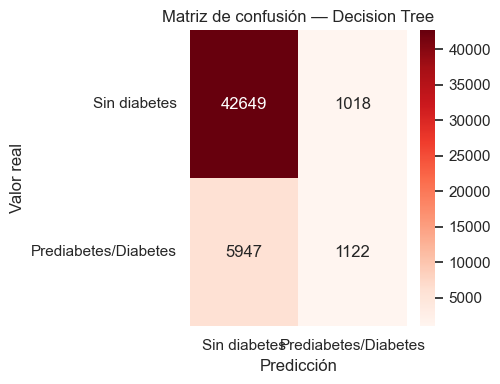

In [142]:
cm_dt = results_dt["Matriz Confusión"]

plt.figure(figsize=(5, 4))
sns.heatmap(cm_dt, annot=True, fmt="d", cmap="Reds")
plt.title("Matriz de confusión — Decision Tree")
plt.xlabel("Predicción")
plt.ylabel("Valor real")
plt.xticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"])
plt.yticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"], rotation=0)
plt.tight_layout()
plt.show()

La matriz de confusión confirma que el Árbol de Decisión tiende a favorecer la clase mayoritaria. El modelo clasificó correctamente 42.649 casos sin diabetes y 1.122 casos con prediabetes o diabetes. Sin embargo, también generó 5.947 falsos negativos, es decir, personas que realmente pertenecían a la clase positiva pero fueron clasificadas como negativas.

Este resultado es relevante porque los falsos negativos representan casos de prediabetes o diabetes que el modelo no logra detectar. En un contexto de salud, esta limitación es importante, ya que el objetivo del modelo no debería centrarse únicamente en clasificar bien a la mayoría, sino también en identificar adecuadamente los casos positivos.

Por otro lado, el modelo produjo 1.018 falsos positivos, una cantidad menor en comparación con los falsos negativos. Esto indica que el árbol es conservador al asignar la clase positiva, lo cual favorece la exactitud general, pero afecta directamente la sensibilidad del modelo frente a los casos de diabetes.

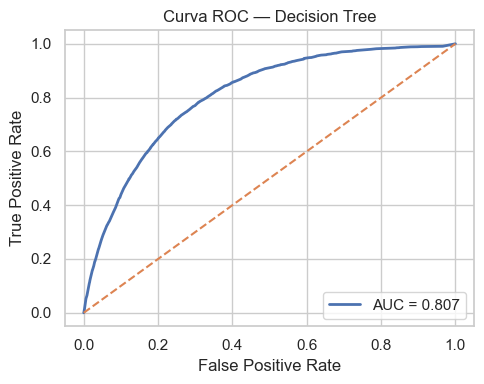

In [143]:
from sklearn.metrics import roc_curve

y_score_dt = results_dt["Scores"]
fpr_dt, tpr_dt, _ = roc_curve(y_test, y_score_dt)

plt.figure(figsize=(5, 4))
plt.plot(
    fpr_dt,
    tpr_dt,
    label=f"AUC = {results_dt['Test AUC']:.3f}",
    linewidth=2
)
plt.plot([0, 1], [0, 1], linestyle="--")
plt.title("Curva ROC — Decision Tree")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

La curva ROC presenta un `AUC` aproximado de 0.807, lo que indica una capacidad aceptable del modelo para diferenciar entre personas con y sin diabetes. Este valor es inferior al obtenido por las regresiones logísticas, pero superior al de KNN y cercano a otros modelos base evaluados.

Sin embargo, el bajo `recall` muestra que el umbral de clasificación por defecto no favorece la detección de la clase positiva. Aunque el modelo tiene cierta capacidad de separación entre clases, al momento de clasificar termina asignando la mayoría de observaciones a la clase negativa.

Por esta razón, en etapas posteriores puede ser conveniente evaluar estrategias como balanceo de clases, ajuste del umbral de decisión, modificación de pesos por clase y optimización de hiperparámetros como `max_depth`, `min_samples_split`, `min_samples_leaf` y `criterion`.

---
### **15.6 Random Forest**

El siguiente modelo evaluado corresponde a `Random Forest`, un algoritmo de ensamble basado en múltiples árboles de decisión. A diferencia de un árbol individual, Random Forest construye varios árboles sobre subconjuntos aleatorios de los datos y de las variables, y luego combina sus predicciones para obtener una clasificación final más estable.

Este modelo suele mejorar la capacidad de generalización frente a un árbol de decisión simple, ya que reduce la varianza y disminuye el riesgo de sobreajuste. Además, al estar basado en árboles, no es sensible a la escala de las variables, por lo que en esta evaluación se utiliza el preprocesador sin escalamiento numérico.

En esta etapa se emplea una configuración inicial con `n_estimators=200`, `max_depth=10`, `min_samples_split=10` y `min_samples_leaf=5`. Estos valores permiten controlar la complejidad del ensamble, pero aún no corresponden a una optimización formal de hiperparámetros. Por tanto, Random Forest se incluye como modelo base dentro del benchmark inicial.

In [119]:
from sklearn.ensemble import RandomForestClassifier

results_rf = run_benchmark_classifier(
    model_name="Random Forest",
    estimator=RandomForestClassifier(
        n_estimators=200,
        max_depth=10,
        min_samples_split=10,
        min_samples_leaf=5,
        random_state=42,
        n_jobs=-1
    ),
    scale_numeric=False,
    cv=cv_strategy
)

In [120]:
os.makedirs(BENCHMARK_DIR, exist_ok=True)

joblib.dump(
    results_rf,
    os.path.join(BENCHMARK_DIR, "benchmark_rf.joblib")
)

['C:\\Users\\danih\\OneDrive\\Documentos\\U\\6° SEMESTRE\\Machine L\\Proyecto diabetes - ML\\resultados_benchmark\\benchmark_rf.joblib']

In [121]:
rf_summary = pd.DataFrame([{
    "Modelo": results_rf["Modelo"],
    "CV Accuracy": results_rf["CV Accuracy"],
    "CV Precision": results_rf["CV Precision"],
    "CV Recall": results_rf["CV Recall"],
    "CV F1": results_rf["CV F1"],
    "CV AUC": results_rf["CV AUC"],
    "Test Accuracy": results_rf["Test Accuracy"],
    "Test Precision": results_rf["Test Precision"],
    "Test Recall": results_rf["Test Recall"],
    "Test F1": results_rf["Test F1"],
    "Test AUC": results_rf["Test AUC"],
    "Tiempo (s)": results_rf["Tiempo (s)"]
}])

display(rf_summary.round(4))

,Modelo,CV Accuracy,CV Precision,CV Recall,CV F1,CV AUC,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s)
0,Random Forest,0.866,0.6284,0.0937,0.163,0.8268,0.8648,0.6008,0.0873,0.1524,0.8223,35.318


Los resultados de Random Forest muestran un desempeño global alto en términos de exactitud y capacidad de separación. En validación cruzada, el modelo obtuvo un `CV Accuracy` de 0.8660, un `CV Precision` de 0.6284, un `CV Recall` de 0.0937, un `CV F1-score` de 0.1630 y un `CV AUC` de 0.8268.

En el conjunto de prueba, el modelo alcanzó un `Test Accuracy` de 0.8648, un `Test Precision` de 0.6008, un `Test Recall` de 0.0873, un `Test F1-score` de 0.1524 y un `Test AUC` de 0.8223. La cercanía entre las métricas de validación cruzada y prueba indica que el modelo mantiene un comportamiento estable y no presenta diferencias fuertes entre la evaluación interna y la evaluación sobre datos no vistos.

Sin embargo, aunque Random Forest obtiene uno de los mejores valores de `AUC` dentro de los modelos base evaluados, su `recall` para la clase positiva es muy bajo. Esto significa que el modelo tiene capacidad para ordenar o separar las clases mediante sus puntajes de probabilidad, pero con el umbral de clasificación por defecto identifica muy pocos casos reales de prediabetes o diabetes.

El tiempo de ejecución fue de aproximadamente 35.32 segundos, superior al de modelos simples como Naive Bayes o Árbol de Decisión, pero razonable considerando que se trata de un ensamble de 200 árboles.

In [124]:
print("Reporte de clasificación - Random Forest")
print(classification_report(y_test, results_rf["Predicciones"], zero_division=0))

Reporte de clasificación - Random Forest
              precision    recall  f1-score   support

         0.0       0.87      0.99      0.93     43667
         1.0       0.60      0.09      0.15      7069

    accuracy                           0.86     50736
   macro avg       0.74      0.54      0.54     50736
weighted avg       0.83      0.86      0.82     50736



El reporte de clasificación muestra que Random Forest presenta un desempeño muy alto sobre la clase mayoritaria. Para la clase 0, correspondiente a personas sin diabetes, el modelo obtiene una precisión de 0.87, un `recall` de 0.99 y un `F1-score` de 0.93. Esto indica que clasifica correctamente casi todos los casos negativos.

Para la clase 1, correspondiente a personas con prediabetes o diabetes, el modelo alcanza una precisión de 0.60, pero un `recall` de apenas 0.09 y un `F1-score` de 0.15. Esto significa que, cuando el modelo predice la clase positiva, suele hacerlo con mayor precisión que otros modelos base; sin embargo, predice muy pocos casos como positivos, por lo que deja sin identificar la mayoría de los casos reales de diabetes.

El promedio ponderado se mantiene relativamente alto debido al peso de la clase mayoritaria, pero el promedio macro evidencia con mayor claridad el desequilibrio entre ambas clases. Por esta razón, el buen `accuracy` del modelo no debe interpretarse como un desempeño suficiente para el objetivo del proyecto.

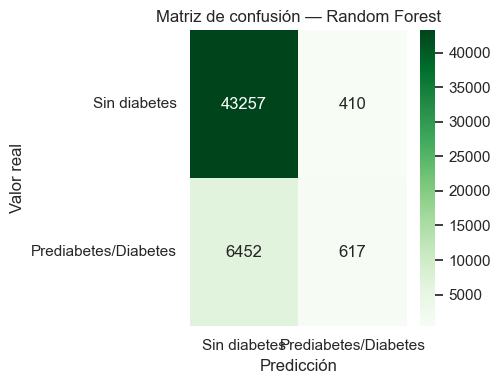

In [146]:
cm_rf = results_rf["Matriz Confusión"]

plt.figure(figsize=(5, 4))
sns.heatmap(cm_rf, annot=True, fmt="d", cmap="Greens")
plt.title("Matriz de confusión — Random Forest")
plt.xlabel("Predicción")
plt.ylabel("Valor real")
plt.xticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"])
plt.yticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"], rotation=0)
plt.tight_layout()
plt.show()

La matriz de confusión confirma que Random Forest es un modelo muy conservador al momento de predecir la clase positiva. El modelo clasificó correctamente 43.257 casos sin diabetes y solo 617 casos con prediabetes o diabetes.

Aunque el número de falsos positivos fue bajo, con 410 casos negativos clasificados como positivos, el número de falsos negativos fue muy alto, con 6.452 personas con prediabetes o diabetes clasificadas erróneamente como personas sin diabetes.

Este comportamiento explica la alta precisión de la clase positiva, pero también el bajo `recall`. En otras palabras, el modelo evita cometer muchos falsos positivos, pero a costa de no detectar la mayoría de los casos positivos. En un contexto de salud, esta limitación es importante, porque los falsos negativos representan personas en condición de riesgo que el modelo no logra señalar.

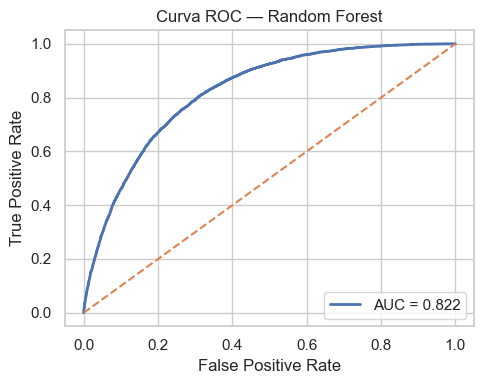

In [147]:
from sklearn.metrics import roc_curve

y_score_rf = results_rf["Scores"]
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_score_rf)

plt.figure(figsize=(5, 4))
plt.plot(
    fpr_rf,
    tpr_rf,
    label=f"AUC = {results_rf['Test AUC']:.3f}",
    linewidth=2
)
plt.plot([0, 1], [0, 1], linestyle="--")
plt.title("Curva ROC — Random Forest")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

La curva ROC presenta un `AUC` aproximado de 0.822, uno de los valores más altos dentro del benchmark inicial. Esto indica que Random Forest tiene una buena capacidad general para diferenciar entre personas con y sin diabetes a partir de sus puntajes de probabilidad.

Sin embargo, el bajo `recall` obtenido con el umbral de clasificación por defecto muestra que esa capacidad de separación no se traduce directamente en una buena detección de la clase positiva. Esto sugiere que el modelo podría beneficiarse de estrategias posteriores como ajuste del umbral de decisión, balanceo de clases, modificación de pesos por clase u optimización de hiperparámetros.

Por tanto, Random Forest es un candidato importante para etapas posteriores, no porque en esta configuración inicial detecte bien la clase positiva, sino porque su alto `AUC` indica que posee una capacidad de discriminación prometedora que podría aprovecharse mejor con ajustes adicionales.

---
### **15.7 XGBoost + LIME**

El siguiente modelo evaluado corresponde a `XGBoost`, un algoritmo de ensamble basado en árboles de decisión potenciados mediante *gradient boosting*. A diferencia de Random Forest, que construye múltiples árboles de forma más independiente, XGBoost entrena árboles de manera secuencial, donde cada nuevo árbol intenta corregir los errores cometidos por los árboles anteriores.

Este modelo suele ofrecer alto desempeño predictivo en problemas tabulares, ya que combina varios árboles débiles para construir un clasificador más robusto. Además, incorpora mecanismos de regularización y control de complejidad que permiten mejorar la generalización del modelo.

Al estar basado en árboles, XGBoost no requiere escalamiento de las variables numéricas, ya que sus divisiones se realizan mediante puntos de corte y no mediante distancias. Por esta razón, en esta evaluación se utiliza el preprocesador sin escalamiento numérico.

En esta etapa se emplea una configuración inicial con `n_estimators=200`, `max_depth=4`, `learning_rate=0.1`, `subsample=0.8` y `colsample_bytree=0.8`. Estos valores permiten controlar la profundidad de los árboles, la tasa de aprendizaje y el muestreo de observaciones y variables. Sin embargo, todavía no corresponden a una optimización formal de hiperparámetros, por lo que XGBoost se considera parte del benchmark inicial de modelos base.

In [55]:
from xgboost import XGBClassifier

results_xgb = run_benchmark_classifier(
    model_name="XGBoost",
    estimator=XGBClassifier(
        n_estimators=200,
        max_depth=4,
        learning_rate=0.1,
        subsample=0.8,
        colsample_bytree=0.8,
        objective="binary:logistic",
        eval_metric="logloss",
        random_state=42,
        n_jobs=-1
    ),
    scale_numeric=False,
    cv=cv_strategy
)

In [56]:
os.makedirs(BENCHMARK_DIR, exist_ok=True)

joblib.dump(
    results_xgb,
    os.path.join(BENCHMARK_DIR, "benchmark_xgb.joblib")
)

['C:\\Users\\danih\\OneDrive\\Documentos\\U\\6° SEMESTRE\\Machine L\\Proyecto diabetes - ML\\resultados_benchmark\\benchmark_xgb.joblib']

In [57]:
xgb_summary = pd.DataFrame([{
    "Modelo": results_xgb["Modelo"],
    "CV Accuracy": results_xgb["CV Accuracy"],
    "CV Precision": results_xgb["CV Precision"],
    "CV Recall": results_xgb["CV Recall"],
    "CV F1": results_xgb["CV F1"],
    "CV AUC": results_xgb["CV AUC"],
    "Test Accuracy": results_xgb["Test Accuracy"],
    "Test Precision": results_xgb["Test Precision"],
    "Test Recall": results_xgb["Test Recall"],
    "Test F1": results_xgb["Test F1"],
    "Test AUC": results_xgb["Test AUC"],
    "Tiempo (s)": results_xgb["Tiempo (s)"]
}])

display(xgb_summary.round(4))

,Modelo,CV Accuracy,CV Precision,CV Recall,CV F1,CV AUC,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s)
0,XGBoost,0.8672,0.5805,0.1685,0.2611,0.8312,0.8657,0.5607,0.1659,0.2561,0.8275,10.9208


Los resultados de XGBoost muestran uno de los mejores desempeños generales dentro del benchmark inicial. En validación cruzada, el modelo obtuvo un `CV Accuracy` de 0.8672, un `CV Precision` de 0.5805, un `CV Recall` de 0.1685, un `CV F1-score` de 0.2611 y un `CV AUC` de 0.8312.

En el conjunto de prueba, el modelo alcanzó un `Test Accuracy` de 0.8657, un `Test Precision` de 0.5607, un `Test Recall` de 0.1659, un `Test F1-score` de 0.2561 y un `Test AUC` de 0.8275. La similitud entre las métricas de validación cruzada y prueba indica que el modelo mantiene un comportamiento estable y no evidencia señales fuertes de sobreajuste.

El `AUC` obtenido por XGBoost es superior al de varios modelos evaluados previamente, lo cual indica una buena capacidad para diferenciar entre personas con y sin diabetes a partir de sus puntajes de probabilidad. Sin embargo, el `recall` de la clase positiva sigue siendo bajo, lo que significa que el modelo identifica una proporción limitada de los casos reales de prediabetes o diabetes cuando se utiliza el umbral de clasificación por defecto.

El tiempo de ejecución fue de aproximadamente 10.92 segundos, un valor razonable considerando que se trata de un modelo de ensamble más complejo que una regresión logística, un árbol individual o Naive Bayes.

In [151]:
print("Reporte de clasificación - XGBoost")
print(classification_report(y_test, results_xgb["Predicciones"], zero_division=0))

Reporte de clasificación - XGBoost
              precision    recall  f1-score   support

         0.0       0.88      0.98      0.93     43667
         1.0       0.56      0.17      0.26      7069

    accuracy                           0.87     50736
   macro avg       0.72      0.57      0.59     50736
weighted avg       0.83      0.87      0.83     50736



El reporte de clasificación muestra que XGBoost presenta un desempeño alto sobre la clase mayoritaria. Para la clase 0, correspondiente a personas sin diabetes, el modelo obtiene una precisión de 0.88, un `recall` de 0.98 y un `F1-score` de 0.93. Esto indica que clasifica correctamente la mayoría de los casos negativos.

Para la clase 1, correspondiente a personas con prediabetes o diabetes, el modelo alcanza una precisión de 0.56, un `recall` de 0.17 y un `F1-score` de 0.26. Estos resultados muestran que el modelo tiene una precisión moderada al predecir casos positivos, pero todavía detecta una proporción baja de los casos reales de diabetes.

El promedio ponderado se mantiene alto debido a la mayor presencia de la clase 0 dentro del conjunto de datos. Sin embargo, el promedio macro permite evidenciar mejor la diferencia de desempeño entre ambas clases, mostrando que el modelo sigue afectado por el desbalance de la variable objetivo.

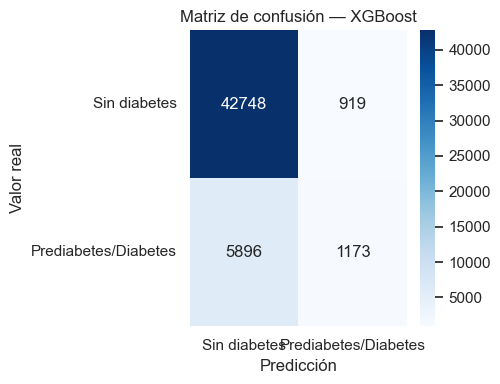

In [152]:
cm_xgb = results_xgb["Matriz Confusión"]

plt.figure(figsize=(5, 4))
sns.heatmap(cm_xgb, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de confusión — XGBoost")
plt.xlabel("Predicción")
plt.ylabel("Valor real")
plt.xticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"])
plt.yticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"], rotation=0)
plt.tight_layout()
plt.show()

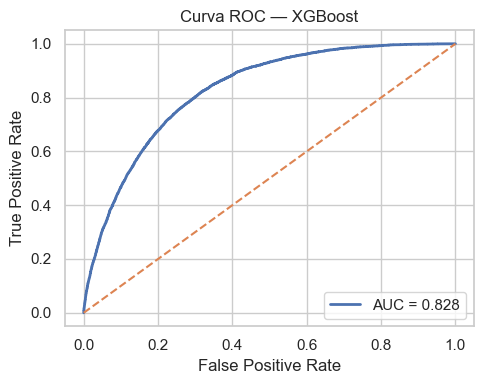

In [153]:
from sklearn.metrics import roc_curve

y_score_xgb = results_xgb["Scores"]
fpr_xgb, tpr_xgb, _ = roc_curve(y_test, y_score_xgb)

plt.figure(figsize=(5, 4))
plt.plot(
    fpr_xgb,
    tpr_xgb,
    label=f"AUC = {results_xgb['Test AUC']:.3f}",
    linewidth=2
)
plt.plot([0, 1], [0, 1], linestyle="--")
plt.title("Curva ROC — XGBoost")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

La curva ROC presenta un `AUC` aproximado de 0.828, uno de los valores más altos dentro de los modelos base evaluados. Esto indica que XGBoost tiene una buena capacidad general para ordenar las observaciones según su probabilidad de pertenecer a la clase positiva.

No obstante, el bajo `recall` obtenido con el umbral de clasificación por defecto muestra que esta capacidad de separación no se traduce automáticamente en una adecuada detección de los casos positivos. El modelo logra asignar puntajes informativos, pero el punto de corte estándar favorece la clasificación hacia la clase negativa.

Por esta razón, XGBoost se considera un candidato importante para etapas posteriores de ajuste. Su buen `AUC` sugiere que podría mejorar notablemente mediante técnicas de balanceo, ajuste del umbral de decisión, uso de `scale_pos_weight` y optimización de hiperparámetros.

In [154]:
feature_importance_xgb = pd.DataFrame({
    "Variable": X_train.columns,
    "Importancia": results_xgb["Pipeline"].named_steps["model"].feature_importances_
})

feature_importance_xgb = feature_importance_xgb.sort_values(
    by="Importancia",
    ascending=False
)

display(feature_importance_xgb.head(15))

,Variable,Importancia
7,PhysActivity,0.436736
3,BMI,0.145939
8,Fruits,0.092344
4,Smoker,0.048064
0,HighBP,0.045667
19,Education,0.044701
16,DiffWalk,0.036103
9,Veggies,0.033504
12,NoDocbcCost,0.031715
20,Income,0.016938


Además de las métricas de desempeño, se analiza la importancia de variables generada por XGBoost. Esta medida permite identificar cuáles predictores tuvieron mayor contribución dentro de la construcción del modelo.

Los resultados muestran que `PhysActivity` aparece como la variable con mayor importancia, seguida por `BMI`, `Fruits`, `Smoker`, `HighBP`, `Education`, `DiffWalk`, `Veggies`, `NoDocbcCost` e `Income`. Esto indica que el modelo asigna mayor relevancia a variables relacionadas con actividad física, estado corporal, hábitos de vida, condiciones de salud y factores socioeconómicos.

Sin embargo, es importante aclarar que la importancia de variables en modelos de árboles no debe interpretarse como causalidad. Una variable con alta importancia indica que fue útil para dividir los datos y mejorar la predicción dentro del modelo, pero no significa necesariamente que sea la causa directa de la diabetes.

In [59]:
from lime.lime_tabular import LimeTabularExplainer
import pandas as pd
import numpy as np

# Explainer con datos de entrenamiento en formato numpy
explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=["Sin diabetes", "Prediabetes/Diabetes"],
    mode="classification"
)

# Función wrapper para que LIME entregue un DataFrame al pipeline
def predict_proba_for_lime(x):
    x_df = pd.DataFrame(x, columns=X_train.columns)
    return results_xgb["Pipeline"].predict_proba(x_df)

# Elegir observación
instance_idx = 0

exp = explainer.explain_instance(
    data_row=X_test.iloc[instance_idx].values,
    predict_fn=predict_proba_for_lime,
    num_features=10
)

exp.show_in_notebook(show_table=True)

Con el fin de complementar la interpretación global del modelo, se utiliza `LIME` como técnica de interpretabilidad local. Mientras que la importancia de variables de XGBoost permite observar qué predictores fueron relevantes de manera general, LIME permite explicar una predicción individual específica.

En este caso, se selecciona una observación del conjunto de entrenamiento y se analiza cómo diferentes variables influyen en la probabilidad estimada para cada clase. Para esta instancia, el modelo asigna una probabilidad aproximada de 0.85 a la clase "Sin diabetes" y una probabilidad cercana a 0.15 a la clase "Prediabetes/Diabetes". Por tanto, la predicción final del modelo se inclina hacia la clase negativa.

La explicación local muestra que algunas características empujan la predicción hacia la clase positiva, como presentar `HighBP=1`, `HighChol=1` y un nivel intermedio de `GenHlth`. Estas variables están asociadas con condiciones de salud que pueden aumentar el riesgo dentro del patrón aprendido por el modelo.

Por otro lado, variables como `HeartDiseaseorAttack=0`, `Stroke=0`, `PhysHlth=0`, `DiffWalk=0`, `HvyAlcoholConsump=0` e `Income` alto contribuyen a reducir la probabilidad de pertenecer a la clase positiva. En conjunto, estas características explican por qué el modelo termina clasificando esta observación como "Sin diabetes".

Esta explicación local resulta útil porque permite entender no solo qué predijo el modelo, sino también qué variables influyeron en esa predicción específica. Sin embargo, al igual que la importancia global, LIME debe interpretarse como una herramienta explicativa del comportamiento del modelo y no como evidencia causal.

---
### **15.8 SVM**

El último modelo evaluado en esta etapa inicial corresponde a una Máquina de Soporte Vectorial `SVM` con kernel radial `RBF`. Este tipo de modelo busca construir una frontera de decisión que permita separar las clases en un espacio transformado, permitiendo capturar relaciones no lineales entre las variables predictoras.

A diferencia de los modelos basados en árboles, SVM es sensible a la escala de las variables, ya que su funcionamiento depende de distancias y márgenes entre observaciones. Por esta razón, en este caso se utiliza el preprocesador con escalamiento numérico.

Debido al alto costo computacional de SVM en conjuntos de datos grandes, este modelo se entrena utilizando la muestra estratificada del 30% definida previamente. Además, se emplea una validación cruzada estratificada de 3 folds, en lugar de 5, con el objetivo de reducir el tiempo de ejecución. Esta decisión permite evaluar el modelo de manera más eficiente sin comprometer completamente la representatividad de las clases.

En esta primera evaluación se utiliza una configuración inicial con `kernel="rbf"`, `C=1.0`, `gamma="scale"` y `probability=True`. Estos parámetros todavía no corresponden a una optimización formal, por lo que SVM se incluye como modelo base dentro del benchmark inicial.

In [60]:
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold

cv_svm = StratifiedKFold(
    n_splits=3,
    shuffle=True,
    random_state=42
)

results_svm = run_benchmark_classifier(
    model_name="SVM",
    estimator=SVC(
        kernel="rbf",
        C=1.0,
        gamma="scale",
        probability=True,
        random_state=42
    ),
    scale_numeric=True,
    cv=cv_svm,
    X_train_data=X_train_sample,
    y_train_data=y_train_sample,
    X_test_data=X_test,
    y_test_data=y_test
)

In [62]:
os.makedirs(BENCHMARK_DIR, exist_ok=True)

joblib.dump(
    results_svm,
    os.path.join(BENCHMARK_DIR, "benchmark_svm.joblib")
)

['C:\\Users\\danih\\OneDrive\\Documentos\\U\\6° SEMESTRE\\Machine L\\Proyecto diabetes - ML\\resultados_benchmark\\benchmark_svm.joblib']

In [61]:
svm_summary = pd.DataFrame([{
    "Modelo": results_svm["Modelo"],
    "CV Accuracy": results_svm["CV Accuracy"],
    "CV Precision": results_svm["CV Precision"],
    "CV Recall": results_svm["CV Recall"],
    "CV F1": results_svm["CV F1"],
    "CV AUC": results_svm["CV AUC"],
    "Test Accuracy": results_svm["Test Accuracy"],
    "Test Precision": results_svm["Test Precision"],
    "Test Recall": results_svm["Test Recall"],
    "Test F1": results_svm["Test F1"],
    "Test AUC": results_svm["Test AUC"],
    "Tiempo (s)": results_svm["Tiempo (s)"]
}])

display(svm_summary.round(4))

,Modelo,CV Accuracy,CV Precision,CV Recall,CV F1,CV AUC,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s)
0,SVM,0.8607,0.2222,0.0002,0.0005,0.7383,0.8606,0.375,0.0004,0.0008,0.7395,917.1277


Los resultados iniciales de SVM muestran una exactitud aparentemente alta, con un `Test Accuracy` de aproximadamente 0.8606. Sin embargo, esta métrica debe interpretarse con mucha cautela, ya que el modelo prácticamente no identifica la clase positiva.

En validación cruzada, el modelo obtuvo un `CV Accuracy` de 0.8607, un `CV Precision` de 0.2222, un `CV Recall` de 0.0002, un `CV F1-score` de 0.0005 y un `CV AUC` de 0.7383. En el conjunto de prueba, los resultados fueron similares: `Test Accuracy` de 0.8606, `Test Precision` de 0.3750, `Test Recall` de 0.0004, `Test F1-score` de 0.0008 y `Test AUC` de 0.7395.

Aunque el `AUC` indica cierta capacidad de separación entre las clases, el `recall` extremadamente bajo evidencia que, con el umbral de clasificación por defecto, el modelo casi nunca predice la clase positiva. Por tanto, la exactitud alta se debe principalmente a que el modelo clasifica casi todas las observaciones como pertenecientes a la clase mayoritaria.

El tiempo de ejecución fue de aproximadamente 917.13 segundos, lo cual confirma que SVM es uno de los modelos más costosos computacionalmente dentro del benchmark inicial, incluso utilizando únicamente la muestra estratificada del 30%.

In [63]:
print("Reporte de clasificación - SVM RBF muestra 30%")
print(classification_report(y_test, results_svm["Predicciones"], zero_division=0))

Reporte de clasificación - SVM RBF muestra 30%
              precision    recall  f1-score   support

         0.0       0.86      1.00      0.93     43667
         1.0       0.38      0.00      0.00      7069

    accuracy                           0.86     50736
   macro avg       0.62      0.50      0.46     50736
weighted avg       0.79      0.86      0.80     50736



El reporte de clasificación confirma que SVM presenta un desempeño muy desequilibrado entre clases. Para la clase 0, correspondiente a personas sin diabetes, el modelo obtiene una precisión de 0.86, un `recall` de 1.00 y un `F1-score` de 0.93. Esto indica que identifica prácticamente todos los casos negativos.

Sin embargo, para la clase 1, correspondiente a personas con prediabetes o diabetes, el modelo obtiene una precisión de 0.38, un `recall` cercano a 0.00 y un `F1-score` también cercano a 0.00. Esto significa que el modelo casi no detecta casos positivos.

Este comportamiento evidencia una fuerte inclinación hacia la clase mayoritaria. Aunque el promedio ponderado conserva valores relativamente altos por el peso de la clase 0, el promedio macro permite observar con mayor claridad el bajo desempeño del modelo sobre la clase minoritaria.

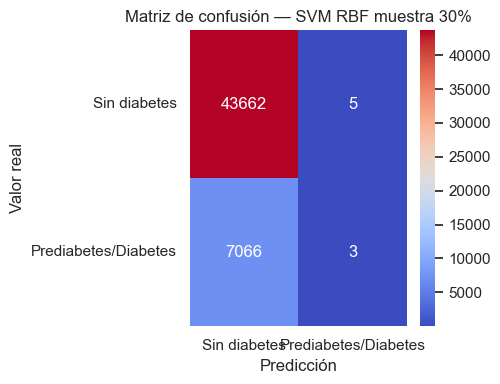

In [64]:
cm_svm = results_svm["Matriz Confusión"]

plt.figure(figsize=(5, 4))
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="coolwarm")
plt.title("Matriz de confusión — SVM RBF muestra 30%")
plt.xlabel("Predicción")
plt.ylabel("Valor real")
plt.xticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"])
plt.yticks([0.5, 1.5], ["Sin diabetes", "Prediabetes/Diabetes"], rotation=0)
plt.tight_layout()
plt.show()

La matriz de confusión muestra de forma clara la principal limitación del modelo. SVM clasificó correctamente 43.662 casos sin diabetes y solo 3 casos con prediabetes o diabetes. Además, generó únicamente 5 falsos positivos, lo que indica que casi nunca asigna la clase positiva.

El problema principal está en los falsos negativos: 7.066 personas con prediabetes o diabetes fueron clasificadas erróneamente como personas sin diabetes. Este resultado es crítico para el objetivo del proyecto, ya que el modelo deja sin detectar prácticamente todos los casos positivos.

Por tanto, aunque el modelo presenta una exactitud alta, esta métrica no refleja un buen desempeño real para el problema. En un contexto de salud, un modelo que no identifica los casos positivos tiene una utilidad limitada, incluso si clasifica correctamente la mayoría de los casos negativos.

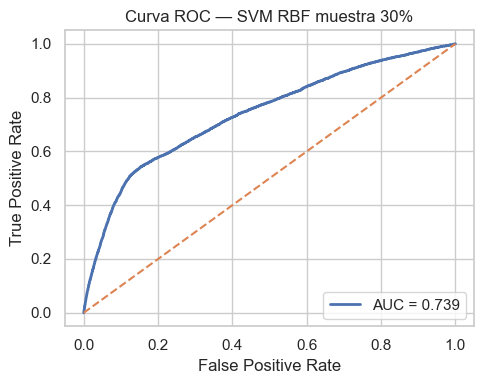

In [65]:
from sklearn.metrics import roc_curve

y_score_svm = results_svm["Scores"]
fpr_svm, tpr_svm, _ = roc_curve(y_test, y_score_svm)

plt.figure(figsize=(5, 4))
plt.plot(
    fpr_svm,
    tpr_svm,
    label=f"AUC = {results_svm['Test AUC']:.3f}",
    linewidth=2
)
plt.plot([0, 1], [0, 1], linestyle="--")
plt.title("Curva ROC — SVM RBF muestra 30%")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

La curva ROC presenta un `AUC` aproximado de 0.739, lo cual indica que el modelo tiene cierta capacidad para ordenar las observaciones según su probabilidad o puntaje de pertenencia a la clase positiva. Sin embargo, esta capacidad no se traduce en una buena clasificación cuando se utiliza el umbral por defecto.

La diferencia entre el `AUC` moderado y el `recall` casi nulo sugiere que el problema no está únicamente en la capacidad del modelo para separar las clases, sino también en el punto de corte utilizado para convertir los puntajes en predicciones finales. Por esta razón, SVM podría requerir ajuste de umbral, balanceo de clases, uso de `class_weight="balanced"` u optimización de hiperparámetros para mejorar la detección de la clase positiva.

No obstante, debido a su alto costo computacional, cualquier ajuste posterior de SVM debe realizarse de manera controlada, preferiblemente sobre muestras estratificadas y con espacios de búsqueda reducidos.

## **16. Optimización integrada de modelos de clasificación**

espués de evaluar los modelos iniciales sin optimización de hiperparámetros, se desarrolla una etapa de optimización integrada. El objetivo de esta sección es evaluar cada algoritmo bajo diferentes configuraciones de hiperparámetros y estrategias de tratamiento del desbalance de clases, manteniendo una estructura metodológica homogénea.

A diferencia del benchmark inicial, en esta etapa no solo se compara el desempeño de los modelos con una configuración fija, sino que se exploran combinaciones alternativas mediante técnicas de búsqueda como `GridSearchCV` y `RandomizedSearchCV`. Además, se incorporan estrategias de balanceo como `SMOTE`, `ADASYN`, `class_weight` y, en el caso particular de XGBoost, `scale_pos_weight`.

La métrica principal de optimización se define como `recall`, debido a que el problema presenta desbalance de clases y el interés principal es mejorar la detección de la clase positiva, correspondiente a personas con prediabetes o diabetes. En este contexto, un mayor `recall` permite reducir la cantidad de falsos negativos, es decir, casos positivos que el modelo clasifica erróneamente como negativos.

#### **Recall como métrica principal**

Se seleccionó el recall como métrica principal de optimización en todos los métodos de búsqueda de hiperparámetros. El recall mide la proporción de casos positivos reales que el modelo identifica correctamente, es decir, de todos los pacientes que efectivamente tienen diabetes, cuántos detecta el modelo. En el contexto de diagnóstico médico, un falso negativo (clasificar como sano a un paciente diabético) tiene consecuencias clínicas graves: el paciente no recibe tratamiento, la enfermedad avanza sin control y pueden surgir complicaciones severas como neuropatía, retinopatía o enfermedad cardiovascular. Este costo asimétrico entre errores justifica priorizar el recall sobre métricas como accuracy o F1.

### **16.1 Configuración inicial para la optimización**


En este bloque se importan las librerías necesarias para ejecutar la optimización de modelos de clasificación. Se incluyen herramientas para medir tiempos de ejecución, manipular datos, construir búsquedas de hiperparámetros, calcular métricas de evaluación y trabajar con modelos de clasificación.

También se importan `SMOTE` y `ADASYN` desde `imblearn`, ya que estas técnicas se utilizarán como estrategias de sobremuestreo para tratar el desbalance de clases. Además, se emplea `Pipeline` de `imblearn`, en lugar del `Pipeline` tradicional de `sklearn`, porque permite integrar correctamente pasos de remuestreo dentro del flujo de entrenamiento.

Se define `RANDOM_STATE = 42` para garantizar reproducibilidad en las particiones, los modelos y las técnicas de balanceo. Esto permite que los resultados puedan replicarse bajo las mismas condiciones experimentales.

La métrica principal de optimización se establece como `recall`, ya que el objetivo es mejorar la capacidad de los modelos para identificar la clase positiva. En un problema de salud, esta decisión es metodológicamente importante porque los falsos negativos representan personas con prediabetes o diabetes que el modelo no logra detectar.

Finalmente, se calcula el `imbalance_ratio`, que representa la relación entre la cantidad de observaciones de la clase mayoritaria y la clase minoritaria. Este valor se utiliza especialmente en XGBoost mediante `scale_pos_weight`, permitiendo que el modelo asigne mayor importancia a la clase positiva durante el entrenamiento.

In [39]:

import time
import numpy as np
import pandas as pd

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, classification_report
)

from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE, ADASYN

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.svm import LinearSVC
from deap import base, creator, tools
import random

RANDOM_STATE = 42
PRIMARY_SCORING = "recall"

imbalance_ratio = (
    y_train.value_counts().sort_index().iloc[0] /
    y_train.value_counts().sort_index().iloc[1]
)

balance_strategies = ["none", "smote", "adasyn", "class_weight"]

### **16.2 Definición del catálogo de modelos a optimizar**



En este bloque se construye un diccionario llamado `classification_models`, el cual funciona como catálogo general de los modelos que serán evaluados en la etapa de optimización. Para cada algoritmo se almacena su nombre, si requiere escalamiento numérico y si debe entrenarse sobre la muestra estratificada o sobre el conjunto de entrenamiento completo.

Esta organización permite automatizar el proceso de optimización, ya que cada modelo queda asociado a sus propias características metodológicas. Por ejemplo, modelos como KNN, regresión logística, SVM y LinearSVC requieren escalamiento porque son sensibles a la magnitud de las variables. En cambio, modelos basados en árboles, como Decision Tree, Random Forest y XGBoost, no requieren escalamiento, ya que sus divisiones se basan en puntos de corte y no en distancias o coeficientes lineales.

También se indica qué modelos se ejecutarán sobre la muestra estratificada. KNN, SVM y LinearSVC se marcan con `sample=True` debido a su mayor costo computacional. Esta decisión permite reducir los tiempos de ejecución sin perder representatividad, ya que la muestra fue construida previamente conservando la proporción de clases y la estructura general del conjunto de entrenamiento.

In [40]:
classification_models = {
    "knn": {
        "name": "KNN",
        "scale_numeric": True,
        "sample": True
    },
    "naive_bayes": {
        "name": "Gaussian Naive Bayes",
        "scale_numeric": True,
        "sample": False
    },
    "logistic_l1": {
        "name": "Logistic Regression L1",
        "scale_numeric": True,
        "sample": False
    },
    "logistic_l2": {
        "name": "Logistic Regression L2",
        "scale_numeric": True,
        "sample": False
    },
    "decision_tree": {
        "name": "Decision Tree",
        "scale_numeric": False,
        "sample": False
    },
    "random_forest": {
        "name": "Random Forest",
        "scale_numeric": False,
        "sample": False
    },
    "xgboost": {
        "name": "XGBoost",
        "scale_numeric": False,
        "sample": False
    },
    "svm": {
        "name": "SVM RBF",
        "scale_numeric": True,
        "sample": True
    },
    "linear_svc": {
        "name": "LinearSVC",
        "scale_numeric": True,
        "sample": True
    }
}

El uso de este diccionario evita repetir código para cada modelo y facilita la ejecución ordenada de las búsquedas de hiperparámetros. Además, permite mantener un flujo flexible, donde cada algoritmo puede tener decisiones específicas de preprocesamiento y tamaño de entrenamiento sin modificar la estructura general de la optimización.

### **16.3 Funciones auxiliares para selección de datos, estrategias de balanceo y dinámica de estimadores**



En este bloque se definen funciones auxiliares que permiten controlar de forma automática qué datos y qué estrategias de balanceo se utilizarán para cada modelo.

La función `get_train_data()` selecciona el conjunto de entrenamiento adecuado según el modelo. Si el modelo está marcado con `sample=True`, se utilizan `X_train_sample` y `y_train_sample`; de lo contrario, se utilizan `X_train` y `y_train`. Esta decisión permite que modelos costosos, como KNN, SVM y LinearSVC, se entrenen sobre la muestra estratificada, mientras que modelos más eficientes se ejecutan con el conjunto completo de entrenamiento.

La función `supports_class_weight()` identifica qué modelos admiten el argumento `class_weight`. Esta verificación es necesaria porque no todos los algoritmos permiten ajustar pesos por clase de forma directa. Modelos como regresión logística, árboles de decisión, Random Forest, SVM y LinearSVC sí lo permiten, mientras que otros, como KNN o Naive Bayes, no tienen este parámetro en su implementación estándar.

La función `get_balance_options()` define qué estrategias de balanceo serán evaluadas para cada modelo. Para la mayoría de modelos se consideran `none`, `smote` y `adasyn`, y se agrega `class_weight` únicamente cuando el algoritmo lo admite. En el caso de XGBoost, se incluye además `scale_pos_weight`, una estrategia propia de este modelo para manejar clases desbalanceadas mediante el peso relativo de la clase positiva.

Finalmente, la función `make_sampler_for_search()` construye el método de remuestreo que será insertado dentro del pipeline. Si la estrategia seleccionada es `smote`, se devuelve un objeto `SMOTE`; si es `adasyn`, se devuelve un objeto `ADASYN`; y si no se usa remuestreo, se devuelve `"passthrough"`, indicando que los datos pasan sin modificación.

In [41]:
def get_train_data(model_key):
    if classification_models[model_key]["sample"]:
        return X_train_sample, y_train_sample
    return X_train, y_train


def supports_class_weight(model_key):
    return model_key in [
        "logistic_l1",
        "logistic_l2",
        "decision_tree",
        "random_forest",
        "svm",
        "linear_svc"
    ]

def get_balance_options(model_key):
    if model_key == "xgboost":
        return ["none", "smote", "adasyn", "scale_pos_weight"]

    options = ["none", "smote", "adasyn"]

    if supports_class_weight(model_key):
        options.append("class_weight")

    return options

def make_sampler_for_search(balance_strategy):
    if balance_strategy == "smote":
        return SMOTE(random_state=RANDOM_STATE)
    elif balance_strategy == "adasyn":
        return ADASYN(random_state=RANDOM_STATE)
    else:
        return "passthrough"


def make_estimator_for_search(model_key, balance_strategy="none"):
    """
    Define el modelo base y ajusta class_weight/scale_pos_weight cuando aplica.
    """
    
    class_weight_value = "balanced" if balance_strategy == "class_weight" else None

    if model_key == "knn":
        return KNeighborsClassifier()

    if model_key == "naive_bayes":
        return GaussianNB()

    if model_key == "logistic_l2":
        return LogisticRegression(
            penalty="l2",
            solver="liblinear",
            max_iter=1000,
            class_weight=class_weight_value,
            random_state=RANDOM_STATE
        )

    if model_key == "logistic_l1":
        return LogisticRegression(
            penalty="l1",
            solver="liblinear",
            max_iter=1000,
            class_weight=class_weight_value,
            random_state=RANDOM_STATE
        )

    if model_key == "decision_tree":
        return DecisionTreeClassifier(
            class_weight=class_weight_value,
            random_state=RANDOM_STATE
        )

    if model_key == "random_forest":
        return RandomForestClassifier(
            class_weight=class_weight_value,
            random_state=RANDOM_STATE,
            n_jobs=-1
        )

    if model_key == "xgboost":
        return XGBClassifier(
            objective="binary:logistic",
            eval_metric="logloss",
            scale_pos_weight=imbalance_ratio if balance_strategy == "scale_pos_weight" else 1,
            random_state=RANDOM_STATE,
            n_jobs=-1
        )

    if model_key == "svm":
        return SVC(
            kernel="rbf",
            probability=True,
            class_weight=class_weight_value,
            random_state=RANDOM_STATE
        )
    
    if model_key == "linear_svc":
        return LinearSVC(
            class_weight="balanced" if balance_strategy == "class_weight" else None,
            random_state=RANDOM_STATE
        )


def make_pipeline_for_search(model_key, balance_strategy, scale_numeric=True):
    estimator = make_estimator_for_search(model_key, balance_strategy)
    sampler = make_sampler_for_search(balance_strategy)

    pipe = ImbPipeline(steps=[
        ("preprocessor", build_preprocessor(scale_numeric=scale_numeric)),
        ("sampler", sampler),
        ("model", estimator)
    ])

    return pipe


# ============================================================
# Función para construir estimadores desde parámetros DEAP
# ============================================================

def make_estimator_from_params(model_key, params, balance_strategy="none"):
    """
    Construye un estimador usando los hiperparámetros seleccionados por DEAP.
    
    A diferencia de GridSearchCV/RandomizedSearchCV, aquí los parámetros
    no llevan prefijo model__, porque DEAP entrega directamente el diccionario
    de hiperparámetros del modelo.
    """

    if params is None:
        params = {}

    params = params.copy()

    class_weight_value = "balanced" if balance_strategy == "class_weight" else None

    if model_key == "knn":
        return KNeighborsClassifier(
            **params
        )

    if model_key == "naive_bayes":
        return GaussianNB(
            **params
        )

    if model_key == "logistic_l2":
        return LogisticRegression(
            penalty="l2",
            solver="liblinear",
            max_iter=1000,
            class_weight=class_weight_value,
            random_state=RANDOM_STATE,
            **params
        )

    if model_key == "logistic_l1":
        return LogisticRegression(
            penalty="l1",
            solver="liblinear",
            max_iter=1000,
            class_weight=class_weight_value,
            random_state=RANDOM_STATE,
            **params
        )

    if model_key == "decision_tree":
        return DecisionTreeClassifier(
            class_weight=class_weight_value,
            random_state=RANDOM_STATE,
            **params
        )

    if model_key == "random_forest":
        return RandomForestClassifier(
            class_weight=class_weight_value,
            random_state=RANDOM_STATE,
            n_jobs=-1,
            **params
        )

    if model_key == "xgboost":
        return XGBClassifier(
            objective="binary:logistic",
            eval_metric="logloss",
            scale_pos_weight=imbalance_ratio if balance_strategy == "scale_pos_weight" else 1,
            random_state=RANDOM_STATE,
            n_jobs=-1,
            **params
        )

    if model_key == "svm":
        return SVC(
            kernel="rbf",
            probability=True,
            class_weight=class_weight_value,
            random_state=RANDOM_STATE,
            **params
        )

    if model_key == "linear_svc":
        return LinearSVC(
            class_weight="balanced" if balance_strategy == "class_weight" else None,
            random_state=RANDOM_STATE,
            **params
        )

    raise ValueError(f"Modelo no reconocido: {model_key}")

Asimismo se define la función `make_estimator_for_search()`, encargada de crear el modelo base correspondiente a cada algoritmo. Esta función recibe el nombre interno del modelo y la estrategia de balanceo seleccionada, y devuelve el estimador configurado de acuerdo con esas condiciones.

Cuando la estrategia de balanceo es `class_weight`, la función asigna `class_weight="balanced"` en los modelos que lo permiten. Esto hace que el algoritmo penalice más los errores cometidos sobre la clase minoritaria, ayudando a mejorar la detección de casos positivos. En los casos donde no aplica, el valor de `class_weight` se mantiene como `None`.

Para XGBoost se utiliza una lógica especial, ya que este modelo no usa `class_weight` de la misma forma que los modelos de `sklearn`. En su lugar, se emplea `scale_pos_weight`, que recibe el valor del `imbalance_ratio` cuando la estrategia seleccionada es `scale_pos_weight`. De esta manera, XGBoost puede ajustar internamente el peso de la clase positiva durante el entrenamiento.

También se incluye `LinearSVC` como alternativa lineal a SVM. Este modelo suele ser más eficiente que `SVC` con kernel RBF en conjuntos de datos grandes, por lo que se considera una opción útil para comparar el comportamiento de una frontera lineal frente a modelos no lineales.

---

### **16.4 GRID**

#### **16.4.1 Definición de espacios de búsqueda para Grid Search**

En este bloque se define el diccionario `param_spaces_grid`, el cual contiene los espacios de hiperparámetros que serán explorados para cada modelo durante la búsqueda por grilla. Cada clave del diccionario corresponde a un algoritmo y cada valor contiene las combinaciones de parámetros que se evaluarán.

Para KNN se consideran valores de `n_neighbors`, el tipo de peso de los vecinos y la métrica de distancia. Estos hiperparámetros son importantes porque controlan cuántos vecinos influyen en la clasificación, si todos tienen el mismo peso o si pesan más los vecinos cercanos, y cómo se calcula la cercanía entre observaciones.

En Naive Bayes se ajusta `var_smoothing`, parámetro que agrega estabilidad numérica al cálculo de las varianzas. Aunque este modelo tiene pocos hiperparámetros, esta búsqueda permite evaluar diferentes niveles de suavizado.

Para las regresiones logísticas L1 y L2 se explora el parámetro `C`, que controla la intensidad de la regularización. Valores pequeños de `C` implican mayor regularización, mientras que valores grandes permiten coeficientes más flexibles. Esta búsqueda permite analizar qué nivel de penalización mejora el desempeño del modelo.

En el Árbol de Decisión se evalúan criterios de división, profundidad máxima y restricciones sobre el número mínimo de observaciones necesarias para dividir nodos o formar hojas. Estos hiperparámetros controlan la complejidad del árbol y ayudan a evitar sobreajuste.

En Random Forest se exploran hiperparámetros relacionados con el número de árboles, profundidad máxima, tamaño mínimo de división, tamaño mínimo de hoja y número de variables consideradas en cada división. Estos parámetros permiten controlar tanto la capacidad predictiva como la complejidad del ensamble.

Para XGBoost se incluyen hiperparámetros como número de árboles, profundidad máxima, tasa de aprendizaje, proporción de observaciones y variables usadas por árbol, y peso mínimo de los nodos hijos. Estos parámetros son fundamentales para controlar la velocidad de aprendizaje, la complejidad del modelo y su capacidad de generalización.

En SVM se evalúan valores de `C` y `gamma`. El parámetro `C` controla el equilibrio entre margen amplio y errores de clasificación, mientras que `gamma` controla la influencia de cada observación en el kernel RBF. Estos hiperparámetros son especialmente relevantes porque afectan directamente la forma de la frontera de decisión.

Finalmente, para LinearSVC se define una lista de combinaciones válidas de `penalty`, `loss`, `dual`, `C` y `max_iter`. Esta estructura se separa en varios diccionarios porque no todas las combinaciones de penalización, función de pérdida y formulación dual son compatibles en `LinearSVC`.

In [42]:
param_spaces_grid = {
    "knn": {
        "model__n_neighbors": [3, 5, 7, 9, 11],
        "model__weights": ["uniform", "distance"],
        "model__metric": ["euclidean", "manhattan"]
    },

    "naive_bayes": {
        "model__var_smoothing": [1e-9, 1e-8, 1e-7, 1e-6, 1e-7, 1e-5, 1e-3]
    },

    "logistic_l2": {
        "model__C": [0.01, 0.1, 1, 10]
    },

    "logistic_l1": {
        "model__C": [0.01, 0.1, 1, 10]
    },

    "decision_tree": {
        "model__criterion": ["gini", "entropy"],
        "model__max_depth": [5, 10, 15, None],
        "model__min_samples_split": [2, 10, 30],
        "model__min_samples_leaf": [1, 5, 10]
    },

    "random_forest": {
        "model__n_estimators": [100, 200, 300],
        "model__max_depth": [10, 15, 20, None],
        "model__min_samples_split": [2, 5, 10],
        "model__min_samples_leaf": [1, 2, 4, 5],
        "model__max_features": ["sqrt", "log2"] 
    },

    "xgboost": {
        "model__n_estimators": [100, 200],
        "model__max_depth": [3, 5],
        "model__learning_rate": [0.03, 0.1],
        "model__subsample": [0.8, 1.0],
        "model__colsample_bytree": [0.8, 1.0],
        "model__min_child_weight": [1, 3, 5]
    },

    "svm": {
        "model__C": [0.1, 1, 10],
        "model__gamma": ["scale", 0.01, 0.1]
    },
    
    "linear_svc": [
        {
            "model__penalty": ["l2"],
            "model__loss": ["hinge"],
            "model__dual": [True],
            "model__C": [0.01, 0.1, 1, 10],
            "model__max_iter": [2000, 5000, 10000]
        },
        {
            "model__penalty": ["l2"],
            "model__loss": ["squared_hinge"],
            "model__dual": [True, False],
            "model__C": [0.01, 0.1, 1, 10],
            "model__max_iter": [2000, 5000, 10000]
        },
        {
            "model__penalty": ["l1"],
            "model__loss": ["squared_hinge"],
            "model__dual": [False],
            "model__C": [0.01, 0.1, 1, 10],
            "model__max_iter": [2000, 5000, 10000]
        }
    ]
}

#### **16.4.2 Función para ejecutar Grid Search por modelo y estrategia de balanceo**

En este bloque se define la función `run_grid_search_model()`, encargada de ejecutar la búsqueda por grilla para un modelo específico y una estrategia de balanceo determinada. Esta función permite automatizar el proceso de optimización, evitando repetir manualmente el mismo flujo para cada algoritmo.

Primero, la función recupera la información del modelo desde el diccionario `classification_models`. A partir de esta información se identifica si el modelo requiere escalamiento numérico y si debe entrenarse con el conjunto completo de entrenamiento o con la muestra estratificada. Esta decisión se realiza mediante la función `get_train_data()`, la cual permite usar `X_train_sample` y `y_train_sample` en modelos de alto costo computacional, como KNN, SVM y LinearSVC, y `X_train`, `y_train` en modelos más eficientes.

Luego, se construye el pipeline mediante `make_pipeline_for_search()`. Este pipeline integra tres pasos principales: el preprocesamiento de las variables, la estrategia de balanceo seleccionada y el modelo de clasificación. Esta estructura es fundamental porque garantiza que el preprocesamiento y el balanceo se apliquen correctamente dentro de cada partición de validación cruzada, evitando fuga de información.

Posteriormente, se define el objeto `GridSearchCV`, que evalúa todas las combinaciones posibles de hiperparámetros incluidas en `param_spaces_grid` para el modelo correspondiente. La métrica de optimización utilizada es `recall`, definida previamente como `PRIMARY_SCORING`, debido a que el objetivo principal del proyecto es mejorar la detección de la clase positiva, es decir, los casos de prediabetes o diabetes.

La validación cruzada utilizada corresponde a `cv_strategy`, definida previamente como una validación estratificada. Esto permite que cada fold conserve una proporción similar de clases, lo cual es especialmente importante debido al desbalance de la variable objetivo. Además, se utiliza `n_jobs=-1` para aprovechar los núcleos disponibles del equipo y reducir el tiempo de ejecución cuando el modelo lo permite.

La opción `refit=True` indica que, una vez encontrada la mejor combinación de hiperparámetros según el `recall` promedio de validación cruzada, el modelo se vuelve a entrenar automáticamente usando todos los datos de entrenamiento disponibles para ese caso. De esta manera, `grid.best_estimator_` corresponde al mejor pipeline encontrado por la búsqueda.

In [43]:
def run_grid_search_model(model_key, balance_strategy):

    model_info = classification_models[model_key]
    X_train_used, y_train_used = get_train_data(model_key)

    pipe = make_pipeline_for_search(
        model_key=model_key,
        balance_strategy=balance_strategy,
        scale_numeric=model_info["scale_numeric"]
    )

    grid = GridSearchCV(
        estimator=pipe,
        param_grid=param_spaces_grid[model_key],
        scoring=PRIMARY_SCORING,
        cv=cv_strategy,
        n_jobs=-1,
        refit=True
    )

    start_time = time.time()
    grid.fit(X_train_used, y_train_used)
    elapsed_time = time.time() - start_time

    best_model = grid.best_estimator_
    y_pred = best_model.predict(X_test)

    if hasattr(best_model, "predict_proba"):
        y_score = best_model.predict_proba(X_test)[:, 1]
    else:
        y_score = best_model.decision_function(X_test)

    return {
        "Modelo": model_info["name"],
        "Metodo": "Grid Search",
        "Balanceo": balance_strategy,
        "CV Recall": grid.best_score_,
        "Test Accuracy": accuracy_score(y_test, y_pred),
        "Test Precision": precision_score(y_test, y_pred, zero_division=0),
        "Test Recall": recall_score(y_test, y_pred, zero_division=0),
        "Test F1": f1_score(y_test, y_pred, zero_division=0),
        "Test AUC": roc_auc_score(y_test, y_score),
        "Tiempo (s)": elapsed_time,
        "Evaluaciones": len(grid.cv_results_["params"]),
        "Best Params": grid.best_params_,
        "Best Estimator": best_model,
        "Matriz Confusión": confusion_matrix(y_test, y_pred),
        "Predicciones": y_pred,
        "Scores": y_score
    }

Una vez finalizado el entrenamiento, la función mide el tiempo total de ejecución y utiliza el mejor modelo encontrado para generar predicciones sobre el conjunto de prueba `X_test`. Es importante destacar que el conjunto de prueba no se utiliza durante la búsqueda de hiperparámetros ni durante la validación cruzada. Solo se emplea al final, para evaluar el desempeño del mejor modelo sobre datos no vistos.

Después de obtener las predicciones, la función calcula los puntajes necesarios para estimar el `ROC-AUC`. Si el modelo cuenta con el método `predict_proba()`, se toma la probabilidad estimada de la clase positiva. Si el modelo no tiene probabilidades, como ocurre con algunos clasificadores lineales, se utiliza `decision_function()`, que entrega un puntaje de decisión asociado a la distancia respecto a la frontera de clasificación.

El bloque que diferencia entre `predict_proba()` y `decision_function()` es necesario porque no todos los modelos entregan probabilidades de clasificación. Modelos como regresión logística, Random Forest, XGBoost, Naive Bayes, KNN y SVM con `probability=True` pueden producir probabilidades mediante `predict_proba()`. En cambio, modelos como `LinearSVC` no generan probabilidades directamente, pero sí entregan puntajes de decisión mediante `decision_function()`.

Esta decisión permite calcular el `ROC-AUC` de forma flexible para distintos tipos de modelos, manteniendo una misma estructura de evaluación.

Finalmente, la función devuelve un diccionario con toda la información relevante del experimento: nombre del modelo, método de búsqueda utilizado, estrategia de balanceo, mejor `recall` obtenido en validación cruzada, métricas sobre el conjunto de prueba, tiempo de ejecución, número de combinaciones evaluadas, mejores hiperparámetros, mejor estimador, matriz de confusión, predicciones y puntajes.

---

### **16.5 RANDOM SEARCH**

Después de definir la búsqueda por grid, se implementa una segunda estrategia de optimización basada en `RandomizedSearchCV`. A diferencia de `GridSearchCV`, que evalúa todas las combinaciones posibles dentro del espacio definido, `RandomizedSearchCV` selecciona aleatoriamente un número limitado de combinaciones de hiperparámetros.

Esta estrategia resulta útil cuando los espacios de búsqueda son más amplios o cuando evaluar todas las combinaciones sería computacionalmente costoso. En este proyecto, Random Search permite explorar configuraciones más diversas en menos tiempo, manteniendo la misma lógica metodológica de preprocesamiento, balanceo de clases, validación cruzada estratificada y evaluación sobre el conjunto de prueba.

#### **16.5.1 Definición de distribuciones de hiperparámetros para Random Search**

En este bloque se define el diccionario `param_distributions_random`, el cual contiene los espacios de hiperparámetros que serán explorados mediante búsqueda aleatoria. Cada clave del diccionario corresponde a un modelo y cada valor contiene los parámetros candidatos para ese algoritmo.

A diferencia de Grid Search, aquí no se evalúan necesariamente todas las combinaciones posibles. En su lugar, `RandomizedSearchCV` toma una cantidad definida de combinaciones aleatorias mediante el parámetro `n_iter`. Esto permite trabajar con espacios más amplios sin incrementar excesivamente el tiempo de ejecución.

Para `Random Forest`, se incluyen parámetros como el número de árboles, profundidad máxima, número mínimo de observaciones para dividir un nodo, número mínimo de muestras por hoja y número de variables consideradas en cada división. Estos hiperparámetros controlan la complejidad, estabilidad y capacidad de generalización del ensamble.

Para `SVM`, se exploran valores de `C` y `gamma`, parámetros fundamentales en el kernel RBF. `C` controla el equilibrio entre margen amplio y errores de clasificación, mientras que `gamma` define el nivel de influencia de cada observación en la frontera de decisión.

Para `Decision Tree`, se consideran criterios de división, profundidad máxima y restricciones sobre nodos y hojas. Estos parámetros permiten controlar el crecimiento del árbol y reducir el riesgo de sobreajuste.

En las regresiones logísticas L1 y L2 se explora el parámetro `C`, que regula la intensidad de la penalización. Valores pequeños implican mayor regularización, mientras que valores grandes permiten un modelo más flexible.

Finalmente, para `LinearSVC` se definen combinaciones compatibles de `penalty`, `loss`, `dual`, `C` y `max_iter`. Estas combinaciones se organizan en una lista de diccionarios porque no todas las configuraciones de `LinearSVC` son válidas entre sí. Por ejemplo, ciertas penalizaciones solo funcionan con determinados tipos de función de pérdida o formulación dual.

In [44]:
param_distributions_random = {
    "random_forest": {
        "model__n_estimators": [100, 200, 300, 500],
        "model__max_depth": [10, 20, 30, None],
        "model__min_samples_split": [2, 5, 10, 20],
        "model__min_samples_leaf": [1, 2, 5, 10],
        "model__max_features": ["sqrt", "log2"]
    },

    "svm": {
        "model__C": [0.01, 0.1, 1, 10, 100],
        "model__gamma": ["scale", 0.001, 0.01, 0.1, 1]
    },
    
    "decision_tree": {
        "model__criterion": ["gini", "entropy"],
        "model__max_depth": [5, 10, 15, 20, None],
        "model__min_samples_split": [2, 5, 10, 20, 30],
        "model__min_samples_leaf": [1, 2, 5, 10]
    },

    "logistic_l1": {
        "model__C": [0.001, 0.01, 0.1, 1, 10, 100]
    },

    "logistic_l2": {
        "model__C": [0.001, 0.01, 0.1, 1, 10, 100]
    },
    
    "linear_svc": [
        {
            "model__penalty": ["l2"],
            "model__loss": ["hinge"],
            "model__dual": [True],
            "model__C": [0.001, 0.01, 0.1, 1, 10, 100],
            "model__max_iter": [5000, 10000, 20000]
        },
        {
            "model__penalty": ["l2"],
            "model__loss": ["squared_hinge"],
            "model__dual": [True, False],
            "model__C": [0.001, 0.01, 0.1, 1, 10, 100],
            "model__max_iter": [5000, 10000, 20000]
        },
        {
            "model__penalty": ["l1"],
            "model__loss": ["squared_hinge"],
            "model__dual": [False],
            "model__C": [0.001, 0.01, 0.1, 1, 10, 100],
            "model__max_iter": [5000, 10000, 20000]
        }
    ]
}

#### **16.5.2 Función para ejecutar Random Search por modelo y estrategia de balanceo**

En este bloque se define la función `run_random_search_model()`, encargada de ejecutar la búsqueda aleatoria para un modelo específico y una estrategia de balanceo determinada. Esta función mantiene la misma estructura metodológica usada en Grid Search, pero cambia el método de búsqueda por `RandomizedSearchCV`.

Primero, la función recupera la información del modelo desde `classification_models` y selecciona los datos de entrenamiento correspondientes mediante `get_train_data()`. De esta manera, los modelos marcados como computacionalmente costosos pueden entrenarse sobre la muestra estratificada, mientras que los modelos más eficientes pueden utilizar el conjunto de entrenamiento completo.

Luego, se construye el pipeline mediante `make_pipeline_for_search()`. Este pipeline integra el preprocesador, la estrategia de balanceo y el modelo. Esta estructura es importante porque garantiza que el preprocesamiento y el remuestreo se realicen dentro de cada partición de validación cruzada, evitando fuga de información.

Posteriormente, se configura `RandomizedSearchCV`, utilizando como espacio de búsqueda el diccionario `param_distributions_random`. El parámetro `n_iter` controla cuántas combinaciones aleatorias serán evaluadas. Por ejemplo, si `n_iter=30`, se prueban 30 configuraciones distintas en lugar de evaluar todo el espacio completo.

La métrica de optimización continúa siendo `recall`, definida previamente como `PRIMARY_SCORING`, ya que el objetivo principal del proyecto es mejorar la detección de la clase positiva. Esta decisión es coherente con el contexto del problema, donde los falsos negativos representan personas con prediabetes o diabetes que el modelo no logra identificar.

También se utiliza validación cruzada estratificada mediante `cv_strategy`, con el fin de conservar la proporción de clases en cada fold. Además, se fija `random_state=RANDOM_STATE` para garantizar que la selección aleatoria de combinaciones sea reproducible.

In [45]:
def run_random_search_model(model_key, balance_strategy, n_iter=30):

    model_info = classification_models[model_key]
    X_train_used, y_train_used = get_train_data(model_key)

    pipe = make_pipeline_for_search(
        model_key=model_key,
        balance_strategy=balance_strategy,
        scale_numeric=model_info["scale_numeric"]
    )

    random_search = RandomizedSearchCV(
        estimator=pipe,
        param_distributions=param_distributions_random[model_key],
        n_iter=n_iter,
        scoring=PRIMARY_SCORING,
        cv=cv_strategy,
        random_state=RANDOM_STATE,
        n_jobs=-1,
        refit=True
    )

    start_time = time.time()
    random_search.fit(X_train_used, y_train_used)
    elapsed_time = time.time() - start_time

    best_model = random_search.best_estimator_
    y_pred = best_model.predict(X_test)

    if hasattr(best_model, "predict_proba"):
        y_score = best_model.predict_proba(X_test)[:, 1]
    else:
        y_score = best_model.decision_function(X_test)

    return {
        "Modelo": model_info["name"],
        "Metodo": "Random Search",
        "Balanceo": balance_strategy,
        "CV Recall": random_search.best_score_,
        "Test Accuracy": accuracy_score(y_test, y_pred),
        "Test Precision": precision_score(y_test, y_pred, zero_division=0),
        "Test Recall": recall_score(y_test, y_pred, zero_division=0),
        "Test F1": f1_score(y_test, y_pred, zero_division=0),
        "Test AUC": roc_auc_score(y_test, y_score),
        "Tiempo (s)": elapsed_time,
        "Evaluaciones": len(random_search.cv_results_["params"]),
        "Best Params": random_search.best_params_,
        "Best Estimator": best_model,
        "Matriz Confusión": confusion_matrix(y_test, y_pred),
        "Predicciones": y_pred,
        "Scores": y_score
    }

Una vez ejecutada la búsqueda, la función identifica el mejor estimador mediante `random_search.best_estimator_`. Debido a que `refit=True`, este mejor pipeline se reentrena automáticamente con todos los datos de entrenamiento usados en esa búsqueda.

Posteriormente, el modelo genera predicciones sobre el conjunto de prueba `X_test`. Este conjunto no participa en la búsqueda de hiperparámetros ni en la validación cruzada, sino que se utiliza únicamente para evaluar el desempeño del mejor modelo encontrado sobre datos no vistos.

Para calcular el `ROC-AUC`, la función verifica si el modelo cuenta con `predict_proba()`. Si el modelo entrega probabilidades, se utiliza la probabilidad de la clase positiva. Si no cuenta con probabilidades, se utiliza `decision_function()`, que proporciona puntajes de decisión. Esta lógica permite evaluar modelos de distinta naturaleza dentro de una misma función.

Finalmente, la función devuelve un diccionario con la información principal del experimento: modelo, método de búsqueda, estrategia de balanceo, mejor `recall` de validación cruzada, métricas sobre el conjunto de prueba, tiempo de ejecución, número de combinaciones evaluadas, mejores hiperparámetros, mejor estimador, matriz de confusión, predicciones y puntajes.

---

### **16.6 OPTUNA**

Además de `GridSearchCV` y `RandomizedSearchCV`, se incorpora `Optuna` como estrategia de optimización bayesiana. A diferencia de Grid Search, que evalúa todas las combinaciones posibles, y Random Search, que selecciona combinaciones aleatorias, Optuna construye la búsqueda de forma más inteligente a partir de los resultados obtenidos en ensayos anteriores.

En este proyecto, Optuna se utiliza para encontrar combinaciones de hiperparámetros que maximicen el `recall`, manteniendo el enfoque metodológico definido previamente. Esta decisión responde al objetivo principal del problema: mejorar la capacidad de detección de la clase positiva, correspondiente a personas con prediabetes o diabetes.

Además, en esta etapa la estrategia de balanceo se trata como parte del proceso de optimización. Es decir, Optuna no solo busca los mejores hiperparámetros del modelo, sino también la estrategia de tratamiento del desbalance más conveniente para cada algoritmo.

#### **16.6.1 Definición de espacios de búsqueda para Optuna**

En este bloque se importa la librería `optuna` y se define la función `suggest_params_optuna()`, encargada de proponer los hiperparámetros que serán evaluados en cada ensayo.

La función recibe dos argumentos: `trial`, que representa un ensayo individual de Optuna, y `model_key`, que identifica el modelo que se está optimizando. A partir de ese nombre, la función devuelve un conjunto específico de hiperparámetros para cada algoritmo.

Para KNN se optimizan `n_neighbors`, `weights` y `metric`, ya que estos parámetros controlan la cantidad de vecinos considerados, la forma en que se ponderan y la métrica de distancia utilizada.

Para Naive Bayes se optimiza `var_smoothing`, un parámetro que ayuda a estabilizar el cálculo de las varianzas del modelo.

En las regresiones logísticas L1 y L2 se optimiza el parámetro `C`, que controla la intensidad de la regularización. Valores pequeños implican mayor penalización, mientras que valores grandes permiten un modelo más flexible.

Para Decision Tree se optimizan parámetros relacionados con la construcción del árbol, como `criterion`, `max_depth`, `min_samples_split` y `min_samples_leaf`. Estos permiten controlar la complejidad del modelo y reducir el riesgo de sobreajuste.

En Random Forest se evalúan hiperparámetros como `n_estimators`, `max_depth`, `min_samples_leaf` y `max_features`, los cuales afectan la cantidad de árboles, la profundidad del ensamble y la diversidad entre árboles.

Para XGBoost se optimizan parámetros como `n_estimators`, `max_depth`, `learning_rate`, `subsample`, `colsample_bytree` y `min_child_weight`. Estos controlan la capacidad de aprendizaje, la complejidad de los árboles y la regularización del modelo.

En SVM se optimizan `C` y `gamma`, parámetros fundamentales para controlar la forma de la frontera de decisión con kernel RBF.

Finalmente, para LinearSVC se optimizan `C`, `penalty`, `loss`, `dual` y `max_iter`, lo cual permite explorar diferentes configuraciones lineales compatibles con este clasificador.

In [46]:
import optuna

def suggest_params_optuna(trial, model_key):

    if model_key == "knn":
        return {
            "n_neighbors": trial.suggest_int("n_neighbors", 3, 29, step=2),
            "weights": trial.suggest_categorical("weights", ["uniform", "distance"]),
            "metric": trial.suggest_categorical("metric", ["euclidean", "manhattan"])
        }

    if model_key == "naive_bayes":
        return {
            "var_smoothing": trial.suggest_float("var_smoothing", 1e-10, 1e-6, log=True)
        }

    if model_key in ["logistic_l1", "logistic_l2"]:
        return {
            "C": trial.suggest_float("C", 0.001, 10, log=True)
        }

    if model_key == "decision_tree":
        return {
            "criterion": trial.suggest_categorical("criterion", ["gini", "entropy"]),
            "max_depth": trial.suggest_categorical("max_depth", [5, 10, 15, None]),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 30),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 10)
        }

    if model_key == "random_forest":
        return {
            "n_estimators": trial.suggest_categorical("n_estimators", [100, 200, 300]),
            "max_depth": trial.suggest_categorical("max_depth", [5, 20, None]),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 10),
            "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2"])  
        }

    if model_key == "xgboost":
        return {
            "n_estimators": trial.suggest_categorical("n_estimators", [100, 200, 300]),
            "max_depth": trial.suggest_int("max_depth", 3, 20),
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2, log=True),
            "subsample": trial.suggest_float("subsample", 0.7, 1.0),
            "colsample_bytree": trial.suggest_float("colsample_bytree", 0.7, 1.0),
            "min_child_weight": trial.suggest_int("min_child_weight", 1, 5)
        }

    if model_key == "svm":
        return {
            "C": trial.suggest_float("C", 0.01, 100, log=True),
            "gamma": trial.suggest_categorical("gamma", ["scale", 0.001, 0.1])
        }
        
    if model_key == "linear_svc":
        return {
            "C": trial.suggest_float("C", 0.001, 100, log=True),
            "penalty": trial.suggest_categorical("penalty", ["l1", "l2"]),
            "loss": trial.suggest_categorical("loss", ["squared_hinge"]),
            "dual": trial.suggest_categorical("dual", [False]),
            "max_iter": trial.suggest_categorical("max_iter", [10000, 20000, 30000])
        }

El uso de `trial.suggest_int()`, `trial.suggest_float()` y `trial.suggest_categorical()` permite que Optuna explore valores numéricos, continuos y categóricos de forma flexible. En algunos parámetros, como `C`, `learning_rate` o `var_smoothing`, se usa escala logarítmica porque sus valores pueden variar en varios órdenes de magnitud y pequeños cambios pueden afectar considerablemente el desempeño del modelo.

#### **16.6.2 Construcción del estimador a partir de los parámetros sugeridos**

En este bloque se define la función `make_estimator_from_params()`, cuyo objetivo es construir el modelo correspondiente usando los hiperparámetros sugeridos por Optuna.

Esta función recibe tres elementos: el nombre interno del modelo, el diccionario de parámetros sugeridos y la estrategia de balanceo seleccionada. A partir de estos elementos, devuelve el estimador listo para entrenarse.

Para modelos como KNN y Naive Bayes, la función simplemente crea el estimador con los parámetros sugeridos, ya que estos modelos no admiten directamente `class_weight`.

En el caso de las regresiones logísticas, Decision Tree, Random Forest, SVM y LinearSVC, se incorpora una decisión adicional: si la estrategia seleccionada es `class_weight`, se asigna `class_weight="balanced"`. Esto permite que el modelo penalice más los errores cometidos sobre la clase minoritaria.

Para XGBoost se utiliza una lógica diferente. Como este modelo no usa `class_weight` de la misma forma que los modelos de `sklearn`, se emplea `scale_pos_weight`. Cuando la estrategia seleccionada es `scale_pos_weight`, el modelo recibe el `imbalance_ratio`, que representa la relación entre la clase mayoritaria y la clase minoritaria. Si no se usa esta estrategia, el peso se deja en 1.

In [47]:
def make_estimator_from_params(model_key, params, balance_strategy):

    if model_key == "knn":
        return KNeighborsClassifier(**params)

    if model_key == "naive_bayes":
        return GaussianNB(**params)

    if model_key == "logistic_l1":
        return LogisticRegression(
            penalty="l1",
            solver="liblinear",
            max_iter=1000,
            class_weight="balanced" if balance_strategy == "class_weight" else None,
            random_state=RANDOM_STATE,
            **params
        )

    if model_key == "logistic_l2":
        return LogisticRegression(
            penalty="l2",
            solver="liblinear",
            max_iter=1000,
            class_weight="balanced" if balance_strategy == "class_weight" else None,
            random_state=RANDOM_STATE,
            **params
        )

    if model_key == "decision_tree":
        return DecisionTreeClassifier(
            class_weight="balanced" if balance_strategy == "class_weight" else None,
            random_state=RANDOM_STATE,
            **params
        )

    if model_key == "random_forest":
        return RandomForestClassifier(
            class_weight="balanced" if balance_strategy == "class_weight" else None,
            random_state=RANDOM_STATE,
            n_jobs=-1,
            **params
        )

    if model_key == "xgboost":
        return XGBClassifier(
            objective="binary:logistic",
            eval_metric="logloss",
            tree_method="hist",
            scale_pos_weight=imbalance_ratio if balance_strategy == "scale_pos_weight" else 1,
            random_state=RANDOM_STATE,
            n_jobs=-1,
            **params
        )

    if model_key == "svm":
        return SVC(
            kernel="rbf",
            probability=True,
            class_weight="balanced" if balance_strategy == "class_weight" else None,
            random_state=RANDOM_STATE,
            **params
        )
        
    if model_key == "linear_svc":
        return LinearSVC(
            class_weight="balanced" if balance_strategy == "class_weight" else None,
            random_state=RANDOM_STATE,
            **params
        )

#### **16.6.3 Función objetivo de Optuna**

En este bloque se define la función `objective_optuna()`, que representa la función que Optuna intentará maximizar. En este caso, la función devuelve el promedio del `recall` obtenido en validación cruzada, por lo que Optuna buscará las combinaciones que permitan detectar mejor la clase positiva.

Primero, se seleccionan los datos de entrenamiento correspondientes al modelo mediante `get_train_data()`. Esto permite que los modelos computacionalmente costosos utilicen la muestra estratificada, mientras que los modelos más eficientes pueden entrenarse con el conjunto completo de entrenamiento.

Luego, se obtienen las estrategias de balanceo disponibles para el modelo con `get_balance_options()`. Posteriormente, Optuna selecciona una estrategia mediante `trial.suggest_categorical("balance_strategy", available_balance)`. Esto significa que la estrategia de balanceo se convierte en un hiperparámetro adicional del proceso de optimización.

Después, la función obtiene los hiperparámetros sugeridos para el modelo mediante `suggest_params_optuna()` y comienza el proceso de validación cruzada estratificada.

In [48]:
def objective_optuna(trial, model_key, scale_numeric=True):

    X_model_train, y_model_train = get_train_data(model_key)

    available_balance = get_balance_options(model_key)

    balance_strategy = trial.suggest_categorical("balance_strategy", available_balance)
    params = suggest_params_optuna(trial, model_key)

    fold_scores = []

    for train_idx, val_idx in cv_strategy.split(X_model_train, y_model_train):

        X_fold_train = X_model_train.iloc[train_idx]
        X_fold_val = X_model_train.iloc[val_idx]

        y_fold_train = y_model_train.iloc[train_idx]
        y_fold_val = y_model_train.iloc[val_idx]

        preprocessor_fold = build_preprocessor(scale_numeric=scale_numeric)

        X_fold_train_processed = preprocessor_fold.fit_transform(X_fold_train)
        X_fold_val_processed = preprocessor_fold.transform(X_fold_val)

        if balance_strategy == "smote":
            sampler = SMOTE(random_state=RANDOM_STATE)
            X_fold_train_processed, y_fold_train = sampler.fit_resample(
                X_fold_train_processed,
                y_fold_train
            )

        elif balance_strategy == "adasyn":
            sampler = ADASYN(random_state=RANDOM_STATE)
            X_fold_train_processed, y_fold_train = sampler.fit_resample(
                X_fold_train_processed,
                y_fold_train
            )

        model = make_estimator_from_params(
            model_key=model_key,
            params=params,
            balance_strategy=balance_strategy
        )

        model.fit(X_fold_train_processed, y_fold_train)
        y_fold_pred = model.predict(X_fold_val_processed)

        fold_scores.append(
            recall_score(y_fold_val, y_fold_pred, zero_division=0)
        )

    return np.mean(fold_scores)

Dentro de cada fold, el preprocesador se ajusta únicamente con los datos de entrenamiento del fold mediante `fit_transform()` y luego se aplica al conjunto de validación mediante `transform()`. Esto evita fuga de información, ya que el conjunto de validación no participa en el ajuste del preprocesamiento.

Posteriormente, si la estrategia seleccionada es `SMOTE` o `ADASYN`, el remuestreo se aplica únicamente sobre los datos de entrenamiento ya preprocesados del fold. Esta decisión es fundamental, porque evita que las observaciones sintéticas se generen usando información del conjunto de validación.

Luego, se construye el modelo con los parámetros sugeridos y la estrategia de balanceo seleccionada. El modelo se entrena sobre el fold de entrenamiento y se evalúa sobre el fold de validación. En cada iteración se calcula el `recall`, y al final la función devuelve el promedio de los recalls obtenidos en todos los folds.

#### **16.6.4 Ejecución de Optuna y evaluación del mejor modelo**

En este bloque se define la función `run_optuna_model()`, encargada de ejecutar el proceso completo de optimización con Optuna para un modelo específico.

Primero, la función recupera la información del modelo desde `classification_models`. Si no se proporciona manualmente el nombre del modelo o la decisión de escalamiento, utiliza los valores definidos en ese diccionario. Esto permite mantener una estructura automatizada y coherente con las secciones anteriores.

Luego, se crea un estudio de Optuna con `direction="maximize"`, ya que el objetivo es maximizar el `recall`. Después, se ejecuta `study.optimize()`, indicando la función objetivo y el número de ensayos mediante `n_trials`.

Cada ensayo prueba una combinación diferente de hiperparámetros y estrategia de balanceo. Al finalizar, Optuna conserva la mejor combinación encontrada en `study.best_params` y el mejor valor de validación cruzada en `study.best_value`.

In [49]:
def run_optuna_model(model_key, model_name=None, scale_numeric=None, n_trials=30):

    model_info = classification_models[model_key]

    if model_name is None:
        model_name = model_info["name"]

    if scale_numeric is None:
        scale_numeric = model_info["scale_numeric"]

    study = optuna.create_study(direction="maximize")

    start_time = time.time()

    study.optimize(
        lambda trial: objective_optuna(
            trial,
            model_key=model_key,
            scale_numeric=scale_numeric
        ),
        n_trials=n_trials
    )

    elapsed_time = time.time() - start_time

    best_params_all = study.best_params.copy()
    best_balance = best_params_all.pop("balance_strategy")

    best_model = make_pipeline_for_search(
        model_key=model_key,
        balance_strategy=best_balance,
        scale_numeric=scale_numeric
    )

    best_model.set_params(**{
        f"model__{k}": v for k, v in best_params_all.items()
    })

    X_train_used, y_train_used = get_train_data(model_key)

    best_model.fit(X_train_used, y_train_used)

    y_pred = best_model.predict(X_test)

    if hasattr(best_model, "predict_proba"):
        y_score = best_model.predict_proba(X_test)[:, 1]
    else:
        y_score = best_model.decision_function(X_test)

    return {
        "Modelo": model_name,
        "Metodo": "Optuna",
        "Balanceo": best_balance,
        "CV Accuracy": np.nan,
        "CV Precision": np.nan,
        "CV Recall": study.best_value,
        "CV F1": np.nan,
        "CV AUC": np.nan,
        "Test Accuracy": accuracy_score(y_test, y_pred),
        "Test Precision": precision_score(y_test, y_pred, zero_division=0),
        "Test Recall": recall_score(y_test, y_pred, zero_division=0),
        "Test F1": f1_score(y_test, y_pred, zero_division=0),
        "Test AUC": roc_auc_score(y_test, y_score),
        "Tiempo (s)": elapsed_time,
        "Evaluaciones": n_trials,
        "Best Params": study.best_params,
        "Best Estimator": best_model,
        "Matriz Confusión": confusion_matrix(y_test, y_pred),
        "Predicciones": y_pred,
        "Scores": y_score,
        "Study": study
    }

Después de la optimización, se separa la estrategia de balanceo del resto de hiperparámetros mediante `pop("balance_strategy")`. Esto se hace porque `balance_strategy` no es un parámetro directo del modelo, sino una decisión del pipeline. Por esta razón, se usa para construir el pipeline final, mientras que los demás hiperparámetros se asignan al estimador mediante `set_params()`.

Con la mejor estrategia de balanceo y los mejores hiperparámetros encontrados, se construye un pipeline final usando `make_pipeline_for_search()`. Luego, los parámetros óptimos se asignan al paso `"model"` del pipeline.

Posteriormente, el mejor modelo se entrena nuevamente con los datos de entrenamiento correspondientes. Si el modelo fue marcado como costoso, se usa la muestra estratificada; si no, se usa el conjunto de entrenamiento completo. Después de este ajuste final, el modelo se evalúa sobre el conjunto de prueba `X_test`, que no participó en el proceso de optimización.

La función calcula métricas finales sobre el conjunto de prueba: `accuracy`, `precision`, `recall`, `F1-score` y `ROC-AUC`. Para el cálculo del `ROC-AUC`, se utiliza `predict_proba()` cuando el modelo entrega probabilidades, o `decision_function()` cuando el modelo solo entrega puntajes de decisión.

Finalmente, la función devuelve un diccionario con toda la información relevante del experimento: nombre del modelo, método de optimización, estrategia de balanceo seleccionada, mejor `recall` de validación cruzada, métricas de prueba, tiempo de ejecución, número de ensayos, mejores parámetros, mejor estimador, matriz de confusión, predicciones, puntajes y el objeto `study` completo de Optuna.

---

### **16.7 DEAP**

Además de Grid Search, Random Search y Optuna, se incorpora una estrategia de optimización evolutiva mediante `DEAP`. Esta librería permite implementar algoritmos genéticos, los cuales buscan buenas combinaciones de hiperparámetros simulando un proceso de evolución basado en población, selección, cruce y mutación.

En este enfoque, cada posible solución se representa como un individuo. En el contexto del proyecto, un individuo corresponde a una combinación de hiperparámetros del modelo y una estrategia de balanceo de clases. La calidad de cada individuo se mide mediante una función de evaluación, en este caso el `recall` promedio obtenido en validación cruzada estratificada.

El objetivo de DEAP es encontrar combinaciones que maximicen el `recall`, manteniendo la prioridad metodológica del proyecto: mejorar la detección de la clase positiva, correspondiente a personas con prediabetes o diabetes.

#### **16.7.1 Definición de espacios de búsqueda para DEAP**

En este bloque se define el diccionario `deap_spaces`, que contiene los espacios de búsqueda utilizados por el algoritmo genético. Cada modelo tiene asociado un conjunto de posibles valores para sus hiperparámetros y para la estrategia de balanceo de clases.

A diferencia de Grid Search o Random Search, DEAP no recorre directamente todas las combinaciones ni selecciona combinaciones al azar de manera independiente. En su lugar, genera una población inicial de individuos y luego modifica esa población mediante operadores evolutivos. Por esta razón, los hiperparámetros se organizan como listas de valores posibles, donde cada individuo selecciona una posición dentro de esas listas.

Para las regresiones logísticas L1 y L2 se considera el parámetro `C`, que controla la intensidad de la regularización, junto con estrategias de balanceo como `none`, `smote`, `adasyn` y `class_weight`.

Para KNN se incluyen `n_neighbors`, `weights`, `metric` y la estrategia de balanceo. En este caso no se incluye `class_weight`, porque KNN no admite ese parámetro directamente.

Para Gaussian Naive Bayes se evalúa `var_smoothing`, junto con estrategias de balanceo mediante remuestreo. Este modelo tampoco admite `class_weight`, por lo que sus opciones se limitan a `none`, `smote` y `adasyn`.

En Decision Tree y Random Forest se incluyen hiperparámetros asociados a la complejidad del árbol, como profundidad máxima, número mínimo de muestras para dividir un nodo y número mínimo de muestras por hoja. Además, estos modelos sí pueden utilizar `class_weight`, por lo que esta estrategia se incluye dentro del espacio de búsqueda.

Para XGBoost se consideran hiperparámetros como número de árboles, profundidad máxima, tasa de aprendizaje, proporción de observaciones, proporción de variables, peso mínimo de nodos hijos y estrategia de balanceo. En este caso se incluye `scale_pos_weight`, ya que es una estrategia propia de XGBoost para trabajar con clases desbalanceadas.

Finalmente, para SVM y LinearSVC se consideran parámetros propios de modelos de margen, como `C`, `gamma`, `penalty`, `loss`, `dual` y `max_iter`. Estos modelos son sensibles a la escala de las variables y pueden beneficiarse de estrategias como `class_weight`, además de técnicas de remuestreo.

In [50]:
deap_spaces = {
    "logistic_l2": {
        "C": [0.01, 0.1, 1, 10],
        "balance_strategy": ["none", "smote", "adasyn", "class_weight"]
    },
    "logistic_l1": {
        "C": [0.01, 0.1, 1, 10],
        "balance_strategy": ["none", "smote", "adasyn", "class_weight"]
    },
    "knn": {
        "n_neighbors": [3, 5, 7, 9, 11],
        "weights": ["uniform", "distance"],
        "metric": ["euclidean", "manhattan"],
        "balance_strategy": ["none", "smote", "adasyn"]
    },
    "naive_bayes": {
        "var_smoothing": [1e-9, 1e-8, 1e-7, 1e-6],
        "balance_strategy": ["none", "smote", "adasyn"]
    },
    "decision_tree": {
        "max_depth": [5, 10, 15, None],
        "min_samples_split": [2, 10, 30],
        "min_samples_leaf": [1, 5, 10],
        "balance_strategy": ["none", "smote", "adasyn", "class_weight"]
    },
    "random_forest": {
        "n_estimators": [100, 200, 300],
        "max_depth": [5, 10, 20, None],
        "min_samples_leaf": [1, 5, 10],
        "balance_strategy": ["none", "smote", "adasyn", "class_weight"],
        "max_features": ["sqrt", "log2"] 
    },
    "xgboost": {
        "n_estimators": [100, 200, 300],
        "max_depth": [3, 20],
        "learning_rate": [0.01, 0.05, 0.1, 0.2],
        "subsample": [0.6, 0.8, 1.0],
        "colsample_bytree": [0.6, 0.8, 1.0],
        "min_child_weight": [1, 5],
        "balance_strategy": ["none", "smote", "adasyn", "scale_pos_weight"]
    },
    "svm": {
        "C": [0.01, 0.1, 1, 10, 100],
        "gamma": ["scale", 0.001, 0.01, 0.1, 1],
        "balance_strategy": ["none", "smote", "adasyn", "class_weight"]
    },
    "linear_svc":  {
        "C": [0.001, 0.01, 0.1, 1, 10, 100],
        "penalty": ["l1", "l2"],
        "loss": ["squared_hinge"],
        "dual": [False],
        "max_iter": [10000, 20000, 30000],
        "balance_strategy": get_balance_options("linear_svc")
    }
}

#### **16.7.2 Conversión del individuo genético a parámetros del modelo**

La función `individual_to_params()` convierte un individuo generado por DEAP en un conjunto interpretable de hiperparámetros.

En el algoritmo genético, cada individuo está representado como una lista de índices. Cada índice indica qué valor se selecciona dentro del espacio de búsqueda de un hiperparámetro. Por ejemplo, si para un modelo el parámetro `C` tiene los valores `[0.01, 0.1, 1, 10]`, el individuo no guarda directamente el valor `C=1`, sino la posición correspondiente dentro de esa lista.

La función toma esos índices, consulta el diccionario `deap_spaces` y reconstruye el diccionario real de parámetros del modelo. Además, separa la variable `balance_strategy`, porque esta no es un hiperparámetro directo del estimador, sino una decisión metodológica del pipeline.

Por esta razón, la función retorna dos elementos: el diccionario de hiperparámetros del modelo y la estrategia de balanceo seleccionada.

In [51]:
def individual_to_params(individual, model_key):
    space = deap_spaces[model_key]
    keys = list(space.keys())

    params = {}

    for i, key in enumerate(keys):
        params[key] = space[key][individual[i]]

    balance_strategy = params.pop("balance_strategy")

    return params, balance_strategy

#### **16.7.3 Evaluación de individuos mediante validación cruzada**

La función `evaluate_deap_individual()` calcula la calidad de un individuo. Para ello, primero convierte el individuo en hiperparámetros reales y estrategia de balanceo mediante `individual_to_params()`.

Luego, selecciona los datos de entrenamiento correspondientes al modelo usando `get_train_data()`. Esto permite que modelos computacionalmente costosos, como KNN, SVM y LinearSVC, utilicen la muestra estratificada, mientras que modelos más eficientes pueden trabajar con el conjunto completo de entrenamiento.

Después se ejecuta una validación cruzada estratificada. En cada fold, el preprocesador se ajusta únicamente sobre los datos de entrenamiento del fold y luego se aplica al conjunto de validación. Esta decisión evita fuga de información, porque el conjunto de validación no participa en el ajuste del preprocesamiento.

Si la estrategia de balanceo seleccionada es `SMOTE` o `ADASYN`, el remuestreo se aplica únicamente sobre el subconjunto de entrenamiento del fold. Esto es metodológicamente importante porque las observaciones sintéticas no deben generarse usando información del conjunto de validación.

Posteriormente, se construye el modelo con los hiperparámetros del individuo y se entrena sobre el fold de entrenamiento. Luego se predice sobre el fold de validación y se calcula el `recall`. Al finalizar todos los folds, la función devuelve el promedio de los valores de `recall`.

Este promedio representa la aptitud o calidad del individuo. Como el objetivo del proyecto es maximizar la detección de casos positivos, un individuo será mejor si obtiene un mayor `recall` promedio en validación cruzada.

In [52]:
def evaluate_deap_individual(individual, model_key, scale_numeric=True):

    params, balance_strategy = individual_to_params(individual, model_key)

    X_train_used, y_train_used = get_train_data(model_key)

    fold_scores = []

    for train_idx, val_idx in cv_strategy.split(X_train_used, y_train_used):

        X_fold_train = X_train_used.iloc[train_idx]
        X_fold_val = X_train_used.iloc[val_idx]

        y_fold_train = y_train_used.iloc[train_idx]
        y_fold_val = y_train_used.iloc[val_idx]

        # Preprocesamiento ajustado solo sobre train fold
        preprocessor_fold = build_preprocessor(scale_numeric=scale_numeric)

        X_fold_train_processed = preprocessor_fold.fit_transform(X_fold_train)
        X_fold_val_processed = preprocessor_fold.transform(X_fold_val)

        # Balanceo solo sobre train fold
        if balance_strategy == "smote":
            sampler = SMOTE(random_state=RANDOM_STATE)
            X_fold_train_processed, y_fold_train = sampler.fit_resample(
                X_fold_train_processed,
                y_fold_train
            )

        elif balance_strategy == "adasyn":
            sampler = ADASYN(random_state=RANDOM_STATE)
            X_fold_train_processed, y_fold_train = sampler.fit_resample(
                X_fold_train_processed,
                y_fold_train
            )

        model = make_estimator_from_params(
            model_key=model_key,
            params=params,
            balance_strategy=balance_strategy
        )

        model.fit(X_fold_train_processed, y_fold_train)

        y_val_pred = model.predict(X_fold_val_processed)

        fold_scores.append(
            recall_score(y_fold_val, y_val_pred, zero_division=0)
        )

    return (np.mean(fold_scores),)

#### **16.7.4 Ejecución del algoritmo genético con DEAP**

La función `run_deap_model()` ejecuta el proceso completo de optimización evolutiva para un modelo específico.

Primero, se recupera la información del modelo y el espacio de búsqueda correspondiente. Luego se configuran los objetos principales de DEAP. Se crea una función de aptitud llamada `FitnessMax`, con peso positivo, porque el objetivo es maximizar el `recall`. También se define el tipo `Individual`, que representa cada solución candidata dentro de la población.

Después, se construye el `toolbox`, que contiene las instrucciones para generar individuos, crear poblaciones, evaluar soluciones, realizar cruces, aplicar mutaciones y seleccionar individuos. Para cada hiperparámetro del modelo, se registra una función que selecciona aleatoriamente un índice válido dentro del espacio de búsqueda.

Cada individuo se genera como una combinación de índices, y la población inicial se crea repitiendo ese proceso varias veces. En este caso, `n_population` controla el número de individuos por generación, mientras que `n_generations` define cuántas generaciones evolutivas se ejecutarán.

In [53]:
def run_deap_model(
    model_key,
    n_population=10,
    n_generations=5,
    cxpb=0.5,
    mutpb=0.2
):

    model_info = classification_models[model_key]
    space = deap_spaces[model_key]
    keys = list(space.keys())

    if "FitnessMax" not in creator.__dict__:
        creator.create("FitnessMax", base.Fitness, weights=(1.0,))

    if "Individual" not in creator.__dict__:
        creator.create("Individual", list, fitness=creator.FitnessMax)

    toolbox = base.Toolbox()

    for i, key in enumerate(keys):
        toolbox.register(
            f"attr_{i}",
            random.randint,
            0,
            len(space[key]) - 1
        )

    toolbox.register(
        "individual",
        tools.initCycle,
        creator.Individual,
        tuple(getattr(toolbox, f"attr_{i}") for i in range(len(keys))),
        n=1
    )

    toolbox.register(
        "population",
        tools.initRepeat,
        list,
        toolbox.individual
    )

    toolbox.register(
        "evaluate",
        evaluate_deap_individual,
        model_key=model_key,
        scale_numeric=model_info["scale_numeric"]
    )

    toolbox.register("mate", tools.cxTwoPoint)

    def mutate_individual(individual):
        gene_idx = random.randint(0, len(individual) - 1)
        key = keys[gene_idx]
        individual[gene_idx] = random.randint(0, len(space[key]) - 1)
        return (individual,)

    toolbox.register("mutate", mutate_individual)
    toolbox.register("select", tools.selTournament, tournsize=3)

    population = toolbox.population(n=n_population)
    logbook = []

    start_time = time.time()

    for gen in range(n_generations):

        invalid_individuals = [ind for ind in population if not ind.fitness.valid]
        fitnesses = list(map(toolbox.evaluate, invalid_individuals))

        for ind, fit in zip(invalid_individuals, fitnesses):
            ind.fitness.values = fit

        best_ind = tools.selBest(population, 1)[0]

        logbook.append({
            "Generacion": gen,
            "Best Recall": best_ind.fitness.values[0],
            "Best Individual": list(best_ind)
        })

        offspring = toolbox.select(population, len(population))
        offspring = list(map(toolbox.clone, offspring))

        for child1, child2 in zip(offspring[::2], offspring[1::2]):
            if random.random() < cxpb:
                toolbox.mate(child1, child2)
                del child1.fitness.values
                del child2.fitness.values

        for mutant in offspring:
            if random.random() < mutpb:
                toolbox.mutate(mutant)
                del mutant.fitness.values

        population[:] = offspring

    invalid_individuals = [ind for ind in population if not ind.fitness.valid]
    fitnesses = list(map(toolbox.evaluate, invalid_individuals))

    for ind, fit in zip(invalid_individuals, fitnesses):
        ind.fitness.values = fit

    best_individual = tools.selBest(population, 1)[0]
    best_params, best_balance = individual_to_params(best_individual, model_key)

    elapsed_time = time.time() - start_time

    best_model = make_pipeline_for_search(
        model_key=model_key,
        balance_strategy=best_balance,
        scale_numeric=model_info["scale_numeric"]
    )

    best_model.set_params(**{
        f"model__{k}": v for k, v in best_params.items()
    })

    X_train_used, y_train_used = get_train_data(model_key)

    best_model.fit(X_train_used, y_train_used)

    y_pred = best_model.predict(X_test)

    if hasattr(best_model, "predict_proba"):
        y_score = best_model.predict_proba(X_test)[:, 1]
    else:
        y_score = best_model.decision_function(X_test)

    return {
        "Modelo": model_info["name"],
        "Metodo": "DEAP",
        "Balanceo": best_balance,
        "CV Accuracy": np.nan,
        "CV Precision": np.nan,
        "CV Recall": best_individual.fitness.values[0],
        "CV F1": np.nan,
        "CV AUC": np.nan,
        "Test Accuracy": accuracy_score(y_test, y_pred),
        "Test Precision": precision_score(y_test, y_pred, zero_division=0),
        "Test Recall": recall_score(y_test, y_pred, zero_division=0),
        "Test F1": f1_score(y_test, y_pred, zero_division=0),
        "Test AUC": roc_auc_score(y_test, y_score),
        "Tiempo (s)": elapsed_time,
        "Evaluaciones": n_population * n_generations,
        "Best Params": best_params,
        "Best Estimator": best_model,
        "Matriz Confusión": confusion_matrix(y_test, y_pred),
        "Predicciones": y_pred,
        "Scores": y_score,
        "Logbook": pd.DataFrame(logbook)
    }

Durante cada generación, primero se evalúan los individuos que todavía no tienen una aptitud calculada. Luego se identifica el mejor individuo de la generación y se almacena su desempeño en el `logbook`.

Posteriormente, se seleccionan individuos mediante torneo (`selTournament`). Esta estrategia compara pequeños grupos de individuos y conserva aquellos con mejor aptitud, favoreciendo que las mejores soluciones tengan mayor probabilidad de pasar a la siguiente generación.

Después se aplica cruce mediante `cxTwoPoint`, controlado por la probabilidad `cxpb`. El cruce combina partes de dos individuos para generar nuevas soluciones, lo cual permite explorar combinaciones de hiperparámetros provenientes de individuos distintos.

También se aplica mutación mediante la función `mutate_individual()`, controlada por la probabilidad `mutpb`. La mutación modifica aleatoriamente uno de los genes del individuo, es decir, cambia uno de sus hiperparámetros o la estrategia de balanceo. Esto introduce diversidad en la población y ayuda a evitar que la búsqueda se estanque en soluciones poco favorables.

Al final de cada generación, la población se actualiza con los nuevos individuos generados por selección, cruce y mutación.

Una vez finalizado el proceso evolutivo, se selecciona el mejor individuo de toda la población. Este individuo se convierte nuevamente en hiperparámetros reales y estrategia de balanceo mediante `individual_to_params()`.

Con esta combinación se construye el pipeline final usando `make_pipeline_for_search()`. Luego se asignan los mejores hiperparámetros al paso `"model"` del pipeline y se entrena el modelo final con los datos de entrenamiento correspondientes.

Finalmente, el modelo se evalúa sobre el conjunto de prueba `X_test`, que no participó en el proceso evolutivo ni en la validación cruzada. Sobre este conjunto se calculan las métricas finales: `accuracy`, `precision`, `recall`, `F1-score` y `ROC-AUC`.

La función devuelve un diccionario con los resultados principales del experimento, incluyendo el modelo, método de optimización, estrategia de balanceo seleccionada, métricas de prueba, tiempo de ejecución, número aproximado de evaluaciones, mejores parámetros, mejor estimador, matriz de confusión, predicciones, puntajes y el historial evolutivo almacenado en el `logbook`.

In [ ]:
deap_results = []

for model_key in classification_models.keys():

    print(f"DEAP | {classification_models[model_key]['name']}")

    result = run_deap_model(
        model_key=model_key,
        n_population=10,
        n_generations=5
    )

    deap_results.append(result)

deap_summary = pd.DataFrame([
    {
        "Modelo": r["Modelo"],
        "Metodo": r["Metodo"],
        "Balanceo": r["Balanceo"],
        "CV Recall": r["CV Recall"],
        "Tiempo (s)": r["Tiempo (s)"],
        "Evaluaciones": r["Evaluaciones"],
        "Best Params": r["Best Params"]
    }
    for r in deap_results
])

display(deap_summary.sort_values(by="CV Recall", ascending=False))



In [ ]:
for r in deap_results:
    log_df = r["Logbook"]

    plt.figure(figsize=(6, 4))
    plt.plot(log_df["Generacion"], log_df["Best Recall"], marker="o")
    plt.title(f"Convergencia DEAP — {r['Modelo']}")
    plt.xlabel("Generación")
    plt.ylabel("Mejor Recall")
    plt.tight_layout()
    plt.show()

---

### **16.8 Ejecución por modelo con almacenamiento de resultados parciales**

En esta sección se implementa un sistema de checkpoints para guardar los resultados parciales de la optimización de modelos. Debido a que algunos algoritmos y métodos de búsqueda pueden requerir tiempos de ejecución elevados, especialmente al combinar hiperparámetros, validación cruzada y estrategias de balanceo, se utiliza `joblib` para almacenar cada resultado individual en archivos externos.

Esta estrategia permite conservar los avances obtenidos durante la ejecución, evitar repetir entrenamientos costosos y retomar el proceso en caso de interrupciones. Además, facilita organizar los resultados por método de optimización y estrategia de balanceo, manteniendo una estructura reproducible para el análisis posterior.

In [54]:
from tqdm import tqdm

import os
import joblib
import pandas as pd

BASE_DIR = r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML"

CHECKPOINT_DIR = os.path.join(BASE_DIR, "checkpoints_rf")
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

In [55]:
def save_checkpoint(result, method_name, balance_strategy):
    path = os.path.join(
        CHECKPOINT_DIR,
        f"rf_{method_name}_{balance_strategy}.joblib"
    )
    joblib.dump(result, path)
    print(f"Guardado: {path}")


def load_existing_results(method_name):
    results = []
    completed = []

    for balance_strategy in get_balance_options("random_forest"):
        path = os.path.join(
            CHECKPOINT_DIR,
            f"rf_{method_name}_{balance_strategy}.joblib"
        )

        if os.path.exists(path):
            result = joblib.load(path)
            results.append(result)
            completed.append(balance_strategy)

    return results, completed

---

## **17. Random Forest**

### **17.1 Random Forest con Grid Search**

En esta subsección se integran los resultados de Random Forest optimizado mediante Grid Search, ejecutados previamente en otro entorno de trabajo. Debido al alto costo computacional de esta búsqueda, no se vuelve a ejecutar el entrenamiento completo dentro del notebook principal. En su lugar, se cargan los archivos `.joblib` generados durante la ejecución, los cuales contienen los resultados por estrategia de balanceo y el mejor estimador entrenado.

Esta decisión permite conservar la trazabilidad del experimento, reutilizar los resultados obtenidos por el equipo y evitar repetir procesos de entrenamiento costosos. Los archivos cargados incluyen las métricas de validación cruzada, métricas sobre el conjunto de prueba, mejores hiperparámetros, matriz de confusión, predicciones, puntajes y, cuando está disponible, el mejor pipeline entrenado.

In [ ]:
grid_results_rf, completed_grid = load_existing_results("grid")

for balance_strategy in tqdm(get_balance_options("random_forest"), desc="Random Forest | Grid Search"):

    if balance_strategy in completed_grid:
        print(f"Ya existe Grid Search | {balance_strategy}. Se omite.")
        continue

    result = run_grid_search_model(
        model_key="random_forest",
        balance_strategy=balance_strategy
    )

    grid_results_rf.append(result)
    save_checkpoint(result, "grid", balance_strategy)

In [56]:
# ============================================================
# Cargar resultados Random Forest - Grid Search
# ============================================================

from pathlib import Path
import joblib
import pandas as pd
import numpy as np

# Si el notebook está en la carpeta raíz del proyecto, esto funciona:
BASE_DIR = Path.cwd()

# Si Path.cwd() no apunta a tu proyecto, usa esta ruta fija:
# BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

RF_ROOT_DIR = BASE_DIR / "checkpoints_rf"
RF_RESULTADOS_DIR = RF_ROOT_DIR / "resultados_modelos"

summary_path = RF_RESULTADOS_DIR / "summary_random_forest_grid.csv"
objects_path = RF_RESULTADOS_DIR / "objects_random_forest_grid.joblib"
best_result_path = RF_RESULTADOS_DIR / "best_result_random_forest_grid.joblib"
best_estimator_path = RF_RESULTADOS_DIR / "best_estimator_random_forest_grid.joblib"

print("Verificación de rutas:")
for nombre, path in {
    "Tabla resumen": summary_path,
    "Objetos completos": objects_path,
    "Mejor resultado": best_result_path,
    "Mejor estimador": best_estimator_path
}.items():
    print(f"{nombre}: {path.exists()} | {path}")

# Cargar tabla resumen
rf_grid_summary = pd.read_csv(summary_path)

# Cargar objetos completos
rf_grid_results = joblib.load(objects_path)

# Cargar mejor resultado
best_rf_grid_result = joblib.load(best_result_path)

# Cargar mejor estimador entrenado
best_rf_grid_estimator = joblib.load(best_estimator_path)

print("\nArchivos cargados correctamente:")
print(f"- Tabla resumen: {summary_path}")
print(f"- Objetos completos: {objects_path}")
print(f"- Mejor resultado: {best_result_path}")
print(f"- Mejor estimador: {best_estimator_path}")

#display(
#    rf_grid_summary
#    .sort_values(by="Test Recall", ascending=False, na_position="last")
#    .round(4)
#)

Verificación de rutas:
Tabla resumen: True | c:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\resultados_modelos\summary_random_forest_grid.csv
Objetos completos: True | c:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\resultados_modelos\objects_random_forest_grid.joblib
Mejor resultado: True | c:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\resultados_modelos\best_result_random_forest_grid.joblib
Mejor estimador: True | c:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\resultados_modelos\best_estimator_random_forest_grid.joblib

Archivos cargados correctamente:
- Tabla resumen: c:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\resultados_modelos\summary_random_forest_grid.csv
- Objetos completos: c:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machi

In [57]:
import os
import joblib
import pandas as pd
import numpy as np

BASE_DIR = r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf"
# Carpeta donde se guardaron los resultados externos de Random Forest Grid Search
RF_GRID_EXTERNAL_DIR = os.path.join(
    BASE_DIR
)

balance_rf_grid = ["none", "smote", "adasyn", "class_weight"]

rf_grid_results = []

for balance_strategy in balance_rf_grid:
    path = os.path.join(
        RF_GRID_EXTERNAL_DIR,
        f"rf_grid_{balance_strategy}.joblib"
    )

    if os.path.exists(path):
        result = joblib.load(path)
        result["Fuente"] = path
        rf_grid_results.append(result)
        print(f"Cargado: {path}")
    else:
        print(f"No encontrado: {path}")

print(f"\nResultados cargados: {len(rf_grid_results)}")

Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\rf_grid_none.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\rf_grid_smote.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\rf_grid_adasyn.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\rf_grid_class_weight.joblib

Resultados cargados: 4


In [58]:
# ============================================================
# Recuperar predicciones y scores desde el mejor resultado guardado
# ============================================================

y_pred_rf_grid = best_rf_grid_result["Predicciones"]
y_score_rf_grid = best_rf_grid_result["Scores"]
cm_rf_grid = best_rf_grid_result["Matriz Confusión"]

print("Predicciones cargadas:", y_pred_rf_grid.shape)
print("Scores cargados:", y_score_rf_grid.shape)
print("Matriz de confusión cargada:")
print(cm_rf_grid)

Predicciones cargadas: (50736,)
Scores cargados: (50736,)
Matriz de confusión cargada:
[[31769 11898]
 [ 1665  5404]]


In [59]:
rf_grid_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Metodo": r.get("Metodo"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),
        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params"))
    }
    for r in rf_grid_results
])

display(
    rf_grid_summary
    .sort_values(by="Test Recall", ascending=False, na_position="last")
    .round(4)
)

,Modelo,Metodo,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
3,Random Forest,Grid Search,class_weight,0.7720,0.7327,0.3123,0.7645,0.4435,0.8224,2403.5045,288,"{'model__max_depth': 10, 'model__max_features'..."
1,Random Forest,Grid Search,smote,0.5186,0.8154,0.3815,0.5231,0.4412,0.8136,8313.8067,288,"{'model__max_depth': 10, 'model__max_features'..."
2,Random Forest,Grid Search,adasyn,0.5040,0.8143,0.3771,0.5107,0.4339,0.8109,9375.9497,288,"{'model__max_depth': 10, 'model__max_features'..."
0,Random Forest,Grid Search,none,0.1723,0.8596,0.4894,0.1765,0.2595,0.7946,2453.5463,288,"{'model__max_depth': None, 'model__max_feature..."


In [60]:
# ============================================================
# Random Forest + Grid Search: métricas, matriz, ROC y PR
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

# ------------------------------------------------------------
# 1. Tabla resumen completa
# ------------------------------------------------------------

rf_grid_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Metodo"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params"))
    }
    for r in rf_grid_results
])

rf_grid_summary = rf_grid_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(rf_grid_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
3,Random Forest,Grid Search,class_weight,0.7720,0.7327,0.3123,0.7645,0.4435,0.8224,2403.5045,288,"{'model__max_depth': 10, 'model__max_features'..."
1,Random Forest,Grid Search,smote,0.5186,0.8154,0.3815,0.5231,0.4412,0.8136,8313.8067,288,"{'model__max_depth': 10, 'model__max_features'..."
2,Random Forest,Grid Search,adasyn,0.5040,0.8143,0.3771,0.5107,0.4339,0.8109,9375.9497,288,"{'model__max_depth': 10, 'model__max_features'..."
0,Random Forest,Grid Search,none,0.1723,0.8596,0.4894,0.1765,0.2595,0.7946,2453.5463,288,"{'model__max_depth': None, 'model__max_feature..."


In [61]:
# ============================================================
# Selección del mejor Random Forest Grid Search
# ============================================================

# Criterio principal del proyecto: recall en test
best_rf_grid_idx = rf_grid_summary["Test Recall"].idxmax()

best_balance_rf_grid = rf_grid_summary.loc[best_rf_grid_idx, "Balanceo"]

best_rf_grid_result = [
    r for r in rf_grid_results
    if r.get("Balanceo") == best_balance_rf_grid
][0]

print("Mejor Random Forest con Grid Search")
print("=" * 60)
print("Balanceo:", best_rf_grid_result["Balanceo"])
print("Test Accuracy:", round(best_rf_grid_result["Test Accuracy"], 4))
print("Test Precision:", round(best_rf_grid_result["Test Precision"], 4))
print("Test Recall:", round(best_rf_grid_result["Test Recall"], 4))
print("Test F1:", round(best_rf_grid_result["Test F1"], 4))
print("Test AUC:", round(best_rf_grid_result["Test AUC"], 4))
print("Best Params:", best_rf_grid_result["Best Params"])

Mejor Random Forest con Grid Search
Balanceo: class_weight
Test Accuracy: 0.7327
Test Precision: 0.3123
Test Recall: 0.7645
Test F1: 0.4435
Test AUC: 0.8224
Best Params: {'model__max_depth': 10, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 4, 'model__min_samples_split': 2, 'model__n_estimators': 100}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Random Forest,Grid Search,class_weight,31769,11898,1665,5404,13.9329,34.102,0.7327,0.3123,0.7645,0.4435,0.8224


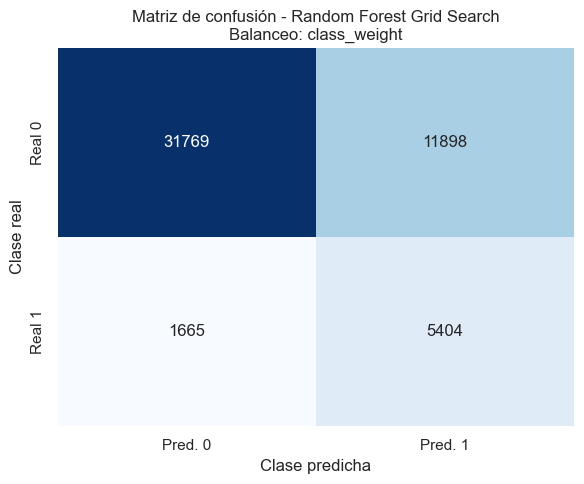

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.73      0.82     43667
Prediabetes/Diabetes       0.31      0.76      0.44      7069

            accuracy                           0.73     50736
           macro avg       0.63      0.75      0.63     50736
        weighted avg       0.86      0.73      0.77     50736



In [27]:
# ============================================================
# Diagnóstico de matriz de confusión
# ============================================================

cm_rf_grid = best_rf_grid_result["Matriz Confusión"]
tn, fp, fn, tp = cm_rf_grid.ravel()

n_total = tn + fp + fn + tp

rf_grid_diagnostic = pd.DataFrame([{
    "Modelo": best_rf_grid_result["Modelo"],
    "Método": best_rf_grid_result["Metodo"],
    "Balanceo": best_rf_grid_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_rf_grid_result["Test Accuracy"],
    "Test Precision": best_rf_grid_result["Test Precision"],
    "Test Recall": best_rf_grid_result["Test Recall"],
    "Test F1": best_rf_grid_result["Test F1"],
    "Test AUC": best_rf_grid_result["Test AUC"]
}])

display(rf_grid_diagnostic.round(4))

# ============================================================
# Matriz de confusión - Mejor Random Forest Grid Search
# ============================================================

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_rf_grid,
    annot=True,
    fmt="d",
    cmap="Blues",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Random Forest Grid Search\n"
    f"Balanceo: {best_rf_grid_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_rf_grid_result["Predicciones"],
        target_names=["Sin diabetes", "Prediabetes/Diabetes"],
        zero_division=0
    )
)

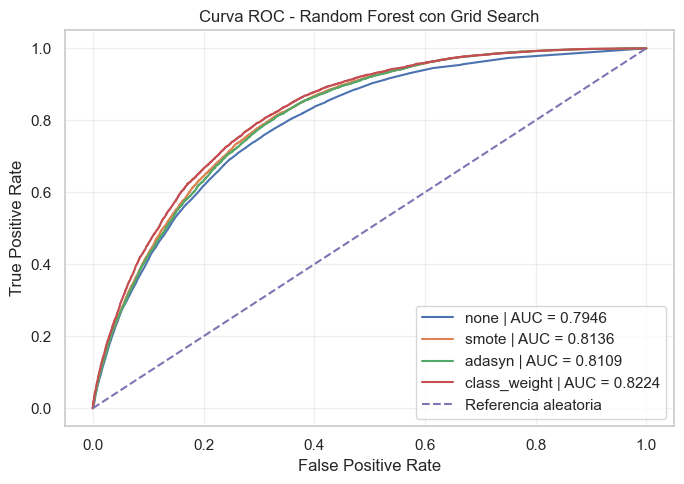

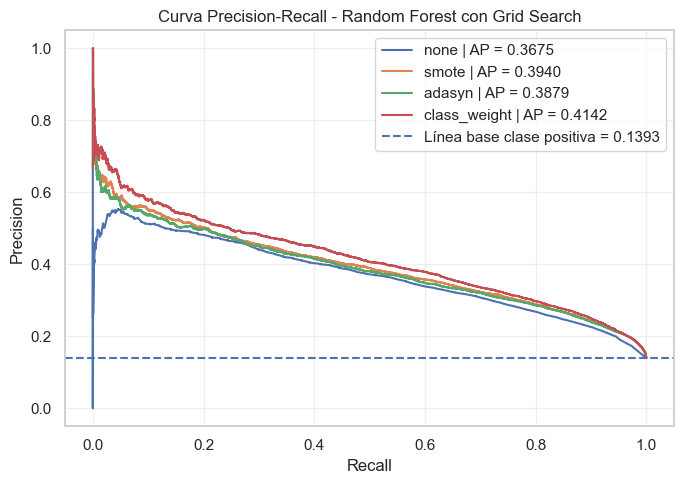

In [39]:
# ============================================================
# Curva ROC - Random Forest Grid Search por estrategia de balanceo
# ============================================================

plt.figure(figsize=(7, 5))

for result in rf_grid_results:
    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - Random Forest con Grid Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ============================================================
# Curva Precision-Recall - Random Forest Grid Search
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in rf_grid_results:
    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Random Forest con Grid Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de Random Forest con Grid Search

En Random Forest optimizado mediante Grid Search se evaluaron diferentes estrategias de balanceo: `none`, `SMOTE`, `ADASYN` y `class_weight`. De acuerdo con el criterio principal de validación definido para el proyecto, el mejor resultado se seleccionó con base en el mayor recall sobre el conjunto de prueba.

El mejor desempeño en sensibilidad se obtuvo con la estrategia `class_weight`, alcanzando un recall de aproximadamente 0.7645. Esto indica que el modelo logra identificar una proporción importante de los casos positivos asociados a prediabetes o diabetes. No obstante, este incremento en recall se acompaña de una reducción en la precisión, lo cual evidencia la presencia de falsos positivos.

La matriz de confusión permite analizar este comportamiento de manera más detallada, mostrando cuántos casos positivos fueron correctamente identificados y cuántos individuos sin diabetes fueron clasificados erróneamente como positivos. Las curvas ROC y Precision-Recall complementan esta evaluación, permitiendo comparar la capacidad discriminativa del modelo bajo cada estrategia de balanceo.

En general, Random Forest con Grid Search presenta un comportamiento competitivo, especialmente bajo `class_weight`, ya que mejora la detección de la clase minoritaria sin llegar a los niveles extremos de sobrepredicción observados en algunos modelos SVM.

### **17.2 Random Forest con Random Search**

In [47]:
#Random Forest - Random Search
random_results_rf, completed_random = load_existing_results("random")

for balance_strategy in tqdm(get_balance_options("random_forest"), desc="Random Forest | Random Search"):

    if balance_strategy in completed_random:
        print(f"Ya existe Random Search | {balance_strategy}. Se omite.")
        continue

    result = run_random_search_model(
        model_key="random_forest",
        balance_strategy=balance_strategy,
        n_iter=50
    )

    random_results_rf.append(result)
    save_checkpoint(result, "random", balance_strategy)

Random Forest | Random Search:   0%|          | 0/4 [00:00<?, ?it/s]

Ya existe Random Search | none. Se omite.


Random Forest | Random Search:  50%|█████     | 2/4 [1:21:39<1:21:39, 2449.57s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\rf_random_smote.joblib


Random Forest | Random Search:  75%|███████▌  | 3/4 [3:19:02<1:12:43, 4363.61s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\rf_random_adasyn.joblib


Random Forest | Random Search: 100%|██████████| 4/4 [4:07:16<00:00, 3709.20s/it]  

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\rf_random_class_weight.joblib


In [62]:
# ============================================================
# Cargar resultados Random Forest - Random Search desde joblibs
# ============================================================

from pathlib import Path
import os
import joblib
import pandas as pd
import numpy as np

# Ruta base del proyecto
BASE_DIR = Path.cwd()

# Si Path.cwd() no apunta a la carpeta del proyecto, usa esta ruta fija:
# BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

RF_RANDOM_DIR = BASE_DIR / "checkpoints_rf"

balance_rf_random = ["none", "smote", "adasyn", "class_weight"]

random_results_rf = []

for balance_strategy in balance_rf_random:
    path = RF_RANDOM_DIR / f"rf_random_{balance_strategy}.joblib"
    
    if path.exists():
        result = joblib.load(path)
        result["Fuente"] = str(path)
        random_results_rf.append(result)
        print(f"Cargado: {path}")
    else:
        print(f"No encontrado: {path}")

print(f"\nResultados Random Forest Random Search cargados: {len(random_results_rf)}")

Cargado: c:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\rf_random_none.joblib
Cargado: c:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\rf_random_smote.joblib
Cargado: c:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\rf_random_adasyn.joblib
Cargado: c:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\rf_random_class_weight.joblib

Resultados Random Forest Random Search cargados: 4


In [63]:
# ============================================================
# Random Forest + Random Search: tabla resumen
# ============================================================

rf_random_results = random_results_rf

rf_random_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Metodo"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params"))
    }
    for r in rf_random_results
])

rf_random_summary = rf_random_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(rf_random_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
3,Random Forest,Random Search,class_weight,0.7742,0.7301,0.3108,0.7698,0.4428,0.8229,2893.1586,50,"{'model__n_estimators': 500, 'model__min_sampl..."
1,Random Forest,Random Search,smote,0.5162,0.8163,0.3835,0.5238,0.4428,0.8135,4898.3754,50,"{'model__n_estimators': 300, 'model__min_sampl..."
2,Random Forest,Random Search,adasyn,0.5021,0.8156,0.3797,0.5108,0.4356,0.8115,7042.4824,50,"{'model__n_estimators': 300, 'model__min_sampl..."
0,Random Forest,Random Search,none,0.1712,0.8601,0.4940,0.1756,0.2591,0.8010,1759.0264,50,"{'model__n_estimators': 500, 'model__min_sampl..."


In [65]:
# ============================================================
# Selección del mejor Random Forest con Random Search
# ============================================================

best_rf_random_idx = rf_random_summary["Test Recall"].idxmax()
best_balance_rf_random = rf_random_summary.loc[best_rf_random_idx, "Balanceo"]

best_rf_random_result = [
    r for r in rf_random_results
    if r.get("Balanceo") == best_balance_rf_random
][0]

print("Mejor Random Forest con Random Search")
print("=" * 60)
print("Balanceo:", best_rf_random_result["Balanceo"])
print("Test Accuracy:", round(best_rf_random_result["Test Accuracy"], 4))
print("Test Precision:", round(best_rf_random_result["Test Precision"], 4))
print("Test Recall:", round(best_rf_random_result["Test Recall"], 4))
print("Test F1:", round(best_rf_random_result["Test F1"], 4))
print("Test AUC:", round(best_rf_random_result["Test AUC"], 4))
print("Best Params:", best_rf_random_result["Best Params"])

Mejor Random Forest con Random Search
Balanceo: class_weight
Test Accuracy: 0.7301
Test Precision: 0.3108
Test Recall: 0.7698
Test F1: 0.4428
Test AUC: 0.8229
Best Params: {'model__n_estimators': 500, 'model__min_samples_split': 5, 'model__min_samples_leaf': 10, 'model__max_features': 'sqrt', 'model__max_depth': 10}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Random Forest,Random Search,class_weight,31598,12069,1627,5442,13.9329,34.514,0.7301,0.3108,0.7698,0.4428,0.8229


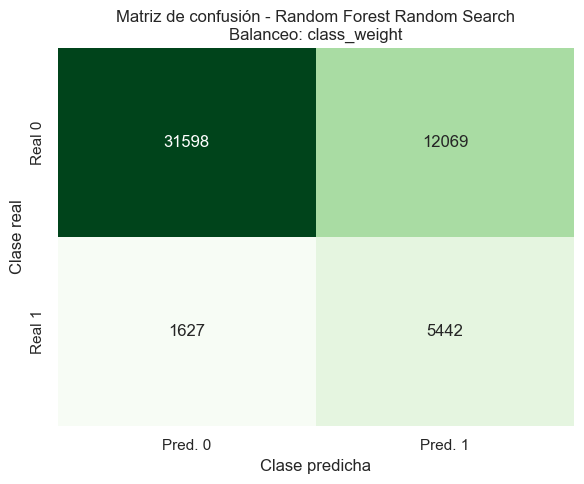

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.72      0.82     43667
Prediabetes/Diabetes       0.31      0.77      0.44      7069

            accuracy                           0.73     50736
           macro avg       0.63      0.75      0.63     50736
        weighted avg       0.86      0.73      0.77     50736



In [37]:
# ============================================================
# Diagnóstico de matriz de confusión - Random Search
# ============================================================

cm_rf_random = best_rf_random_result["Matriz Confusión"]
tn, fp, fn, tp = cm_rf_random.ravel()

n_total = tn + fp + fn + tp

rf_random_diagnostic = pd.DataFrame([{
    "Modelo": best_rf_random_result["Modelo"],
    "Método": best_rf_random_result["Metodo"],
    "Balanceo": best_rf_random_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_rf_random_result["Test Accuracy"],
    "Test Precision": best_rf_random_result["Test Precision"],
    "Test Recall": best_rf_random_result["Test Recall"],
    "Test F1": best_rf_random_result["Test F1"],
    "Test AUC": best_rf_random_result["Test AUC"]
}])

display(rf_random_diagnostic.round(4))

# ============================================================
# Matriz de confusión - Mejor Random Forest Random Search
# ============================================================

from sklearn.metrics import classification_report

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_rf_random,
    annot=True,
    fmt="d",
    cmap="Greens",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Random Forest Random Search\n"
    f"Balanceo: {best_rf_random_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_rf_random_result["Predicciones"],
        target_names=["Sin diabetes", "Prediabetes/Diabetes"],
        zero_division=0
    )
)

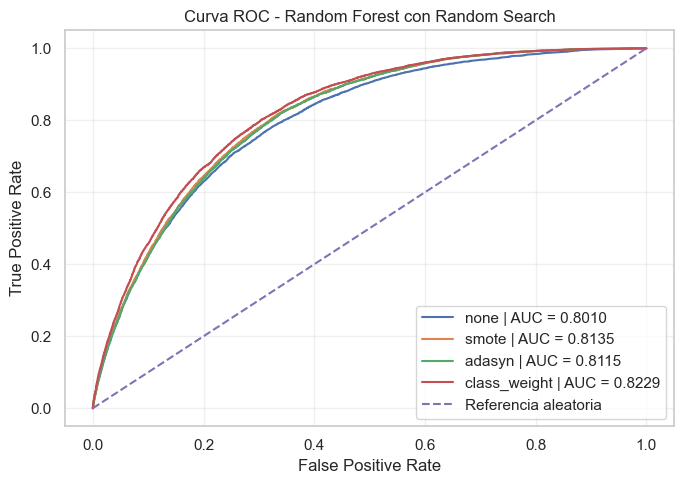

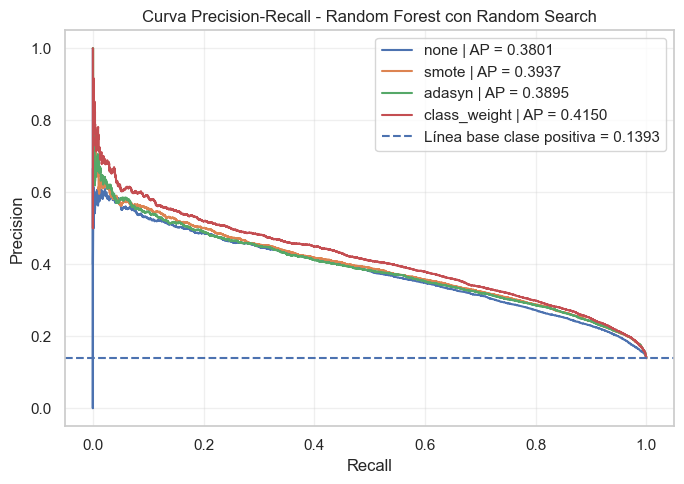

In [38]:
# ============================================================
# Curva ROC - Random Forest Random Search
# ============================================================

from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(7, 5))

for result in rf_random_results:
    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - Random Forest con Random Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ============================================================
# Curva Precision-Recall - Random Forest Random Search
# ============================================================

from sklearn.metrics import precision_recall_curve, average_precision_score

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in rf_random_results:
    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Random Forest con Random Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de Random Forest con Random Search

En Random Forest optimizado mediante Random Search se evaluaron las estrategias de balanceo `none`, `SMOTE`, `ADASYN` y `class_weight`. De acuerdo con el criterio principal del proyecto, el mejor resultado se seleccionó con base en el mayor recall sobre el conjunto de prueba.

El mejor desempeño en sensibilidad se obtuvo con `class_weight`, alcanzando un recall cercano a 0.7698. Esto indica que el modelo logra identificar una proporción importante de los casos positivos asociados a prediabetes o diabetes. Sin embargo, al igual que en otros modelos orientados a maximizar recall, este resultado implica una reducción de la precisión, debido al aumento de falsos positivos.

En comparación con la versión Grid Search, Random Search alcanza un recall ligeramente superior, aunque con métricas globales muy similares. Las curvas ROC y Precision-Recall permiten observar que las estrategias con balanceo mejoran la sensibilidad del modelo, mientras que la estrategia sin balanceo conserva mayor accuracy y precisión, pero falla en la detección de la clase positiva.

En general, Random Forest con Random Search confirma que `class_weight` es una alternativa competitiva cuando se prioriza la identificación de casos positivos, aunque debe analizarse junto con precisión, F1-score y AUC para evitar seleccionar un modelo únicamente por su recall.

### **17.3 Random Forest con Optuna**

In [165]:
optuna_path = f"{CHECKPOINT_DIR}/rf_optuna_mejor.joblib"

if os.path.exists(optuna_path):
    optuna_results_rf = [joblib.load(optuna_path)]
    print("Optuna Random Forest ya existe. Se cargó desde checkpoint.")
else:
    optuna_results_rf = []

    result = run_optuna_model(
        model_key="random_forest",
        model_name="Random Forest",
        scale_numeric=False,
        n_trials=30
    )

    optuna_results_rf.append(result)
    joblib.dump(result, optuna_path)
    print(f"Guardado: {optuna_path}")

[I 2026-05-19 13:20:58,177] A new study created in memory with name: no-name-fd85c701-dc84-4706-bd09-3f455d1232b1
[I 2026-05-19 13:21:14,955] Trial 0 finished with value: 0.1347026951653104 and parameters: {'balance_strategy': 'none', 'n_estimators': 100, 'max_depth': 20, 'min_samples_leaf': 6, 'max_features': 'log2'}. Best is trial 0 with value: 0.1347026951653104.
[I 2026-05-19 13:21:42,264] Trial 1 finished with value: 0.778759850028201 and parameters: {'balance_strategy': 'class_weight', 'n_estimators': 300, 'max_depth': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 1 with value: 0.778759850028201.
[I 2026-05-19 13:21:59,794] Trial 2 finished with value: 0.14909614853110925 and parameters: {'balance_strategy': 'none', 'n_estimators': 100, 'max_depth': 20, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.778759850028201.
[I 2026-05-19 13:22:46,019] Trial 3 finished with value: 0.13275768899360568 and parameters: {'balance_strategy': 'n

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf/rf_optuna_mejor.joblib


In [66]:
# ============================================================
# Cargar resultado Random Forest - Optuna
# ============================================================

from pathlib import Path
import os
import joblib
import ast
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score,
    roc_auc_score
)

# Ruta base
BASE_DIR = Path.cwd()

# Si Path.cwd() no apunta al proyecto, usa ruta fija:
# BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

RF_OPTUNA_DIR = BASE_DIR / "checkpoints_rf"
optuna_path = RF_OPTUNA_DIR / "rf_optuna_mejor.joblib"

print("Ruta Optuna:", optuna_path)
print("Existe:", optuna_path.exists())

rf_optuna_result = joblib.load(optuna_path)

# Por si quedó guardado como lista
if isinstance(rf_optuna_result, list):
    rf_optuna_result = rf_optuna_result[0]

print("Resultado Optuna cargado correctamente.")
print(type(rf_optuna_result))
print(rf_optuna_result.keys())

Ruta Optuna: c:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\rf_optuna_mejor.joblib
Existe: True
Resultado Optuna cargado correctamente.
<class 'dict'>
dict_keys(['Modelo', 'Metodo', 'Balanceo', 'CV Accuracy', 'CV Precision', 'CV Recall', 'CV F1', 'CV AUC', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1', 'Test AUC', 'Tiempo (s)', 'Evaluaciones', 'Best Params', 'Best Estimator', 'Matriz Confusión', 'Predicciones', 'Scores', 'Study'])


In [67]:
# ============================================================
# Random Forest + Optuna: tabla resumen
# ============================================================

best_params_optuna = rf_optuna_result.get("Best Params")

# Si los hiperparámetros vienen como string, intentar convertirlos a dict
if isinstance(best_params_optuna, str):
    try:
        best_params_optuna_dict = ast.literal_eval(best_params_optuna)
    except Exception:
        best_params_optuna_dict = {}
else:
    best_params_optuna_dict = best_params_optuna if isinstance(best_params_optuna, dict) else {}

balanceo_optuna = rf_optuna_result.get(
    "Balanceo",
    best_params_optuna_dict.get("balance_strategy", "No disponible")
)

rf_optuna_summary = pd.DataFrame([{
    "Modelo": rf_optuna_result.get("Modelo"),
    "Método": rf_optuna_result.get("Metodo"),
    "Balanceo": balanceo_optuna,

    "CV Recall": rf_optuna_result.get("CV Recall"),

    "Test Accuracy": rf_optuna_result.get("Test Accuracy"),
    "Test Precision": rf_optuna_result.get("Test Precision"),
    "Test Recall": rf_optuna_result.get("Test Recall"),
    "Test F1": rf_optuna_result.get("Test F1"),
    "Test AUC": rf_optuna_result.get("Test AUC"),

    "Tiempo (s)": rf_optuna_result.get("Tiempo (s)"),
    "Evaluaciones": rf_optuna_result.get("Evaluaciones"),
    "Best Params": str(best_params_optuna)
}])

display(rf_optuna_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
0,Random Forest,Optuna,class_weight,0.7799,0.7129,0.2971,0.7765,0.4297,0.8131,1166.0527,30,"{'balance_strategy': 'class_weight', 'n_estima..."


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Random Forest,Optuna,class_weight,30679,12988,1580,5489,13.9329,36.4179,0.7129,0.2971,0.7765,0.4297,0.8131


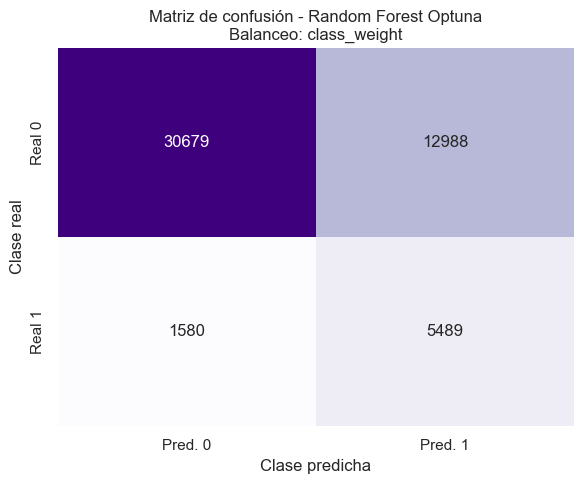

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.70      0.81     43667
Prediabetes/Diabetes       0.30      0.78      0.43      7069

            accuracy                           0.71     50736
           macro avg       0.62      0.74      0.62     50736
        weighted avg       0.86      0.71      0.76     50736



In [43]:
# ============================================================
# Diagnóstico de matriz de confusión - Random Forest Optuna
# ============================================================

if rf_optuna_result.get("Matriz Confusión") is not None:
    cm_rf_optuna = rf_optuna_result["Matriz Confusión"]
else:
    cm_rf_optuna = confusion_matrix(y_test, rf_optuna_result["Predicciones"])

tn, fp, fn, tp = cm_rf_optuna.ravel()
n_total = tn + fp + fn + tp

rf_optuna_diagnostic = pd.DataFrame([{
    "Modelo": rf_optuna_result.get("Modelo"),
    "Método": rf_optuna_result.get("Metodo"),
    "Balanceo": balanceo_optuna,
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": rf_optuna_result.get("Test Accuracy"),
    "Test Precision": rf_optuna_result.get("Test Precision"),
    "Test Recall": rf_optuna_result.get("Test Recall"),
    "Test F1": rf_optuna_result.get("Test F1"),
    "Test AUC": rf_optuna_result.get("Test AUC")
}])

display(rf_optuna_diagnostic.round(4))

# ============================================================
# Matriz de confusión - Random Forest Optuna
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_rf_optuna,
    annot=True,
    fmt="d",
    cmap="Purples",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Random Forest Optuna\n"
    f"Balanceo: {balanceo_optuna}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        rf_optuna_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

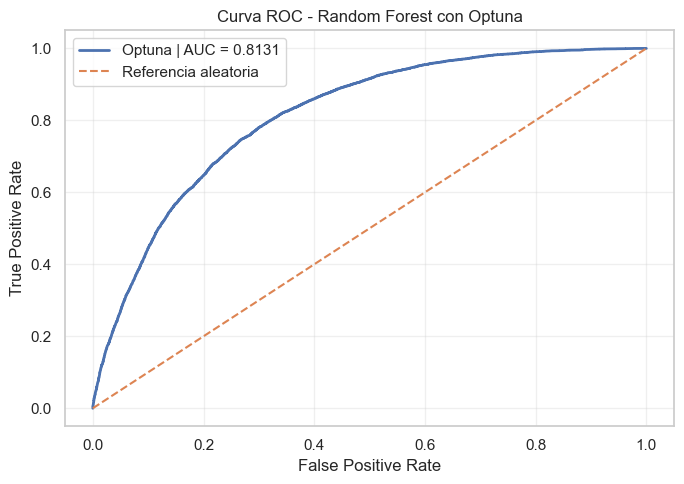

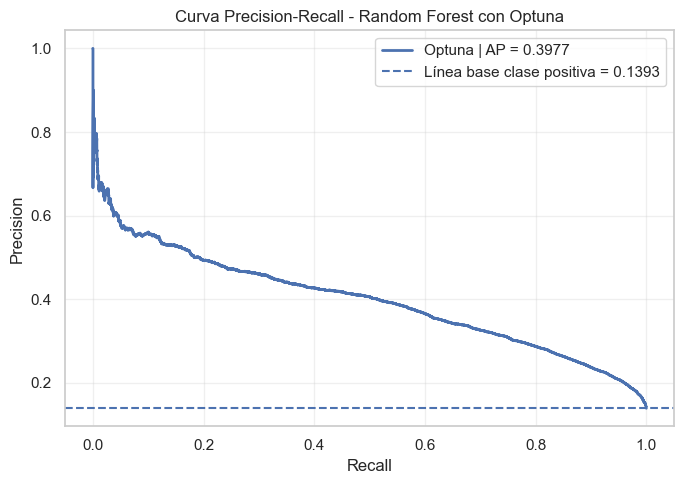

In [44]:
# ============================================================
# Curva ROC - Random Forest Optuna
# ============================================================

y_score_rf_optuna = rf_optuna_result.get("Scores")

if y_score_rf_optuna is None:
    print("No hay scores disponibles para graficar la curva ROC.")
else:
    fpr, tpr, _ = roc_curve(y_test, y_score_rf_optuna)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(7, 5))

    plt.plot(
        fpr,
        tpr,
        linewidth=2,
        label=f"Optuna | AUC = {roc_auc:.4f}"
    )

    plt.plot(
        [0, 1],
        [0, 1],
        linestyle="--",
        label="Referencia aleatoria"
    )

    plt.title("Curva ROC - Random Forest con Optuna")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
# ============================================================
# Curva Precision-Recall - Random Forest Optuna
# ============================================================

if y_score_rf_optuna is None:
    print("No hay scores disponibles para graficar la curva Precision-Recall.")
else:
    precision, recall, _ = precision_recall_curve(y_test, y_score_rf_optuna)
    avg_precision = average_precision_score(y_test, y_score_rf_optuna)
    positive_rate = y_test.mean()

    plt.figure(figsize=(7, 5))

    plt.plot(
        recall,
        precision,
        linewidth=2,
        label=f"Optuna | AP = {avg_precision:.4f}"
    )

    plt.axhline(
        positive_rate,
        linestyle="--",
        label=f"Línea base clase positiva = {positive_rate:.4f}"
    )

    plt.title("Curva Precision-Recall - Random Forest con Optuna")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

### Interpretación de Random Forest con Optuna

En esta sección se presenta el resultado de Random Forest optimizado mediante Optuna. A diferencia de Grid Search y Random Search, en este caso la estrategia de balanceo no se ejecutó como un experimento separado para cada técnica, sino que fue incorporada como un hiperparámetro adicional dentro del espacio de búsqueda. Por tanto, Optuna seleccionó simultáneamente la mejor combinación entre estrategia de balanceo e hiperparámetros del modelo.

El resultado debe interpretarse a partir del recall, la precisión, el F1-score, el AUC y la matriz de confusión. Si el modelo alcanza un recall alto, esto indica una mayor capacidad para identificar casos positivos de prediabetes o diabetes. Sin embargo, esta mejora debe contrastarse con la precisión y con la cantidad de falsos positivos, para evitar seleccionar un modelo únicamente por sensibilidad.

Las curvas ROC y Precision-Recall permiten complementar la evaluación del modelo. La curva ROC muestra la capacidad discriminativa general, mientras que la curva Precision-Recall resulta especialmente relevante en este problema debido al desbalance de clases.

### **17.4 Random Forest con DEAP**

In [69]:
# ============================================================
# Ejecución Random Forest + DEAP con checkpoints
# ============================================================

import os
import joblib

# Carpeta de checkpoints
CHECKPOINT_DIR = os.path.join(BASE_DIR, "checkpoints_rf")
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

rf_deap_path = os.path.join(CHECKPOINT_DIR, "rf_deap.joblib")

# Cambiar a True solo si se desea volver a entrenar el modelo
RUN_RF_DEAP = False

if RUN_RF_DEAP:

    print("Ejecutando Random Forest con DEAP...")

    rf_deap_result = run_deap_model(
        model_key="random_forest",
        n_population=10,
        n_generations=5,
        cxpb=0.5,
        mutpb=0.2
    )

    joblib.dump(rf_deap_result, rf_deap_path)

    print(f"Resultado Random Forest DEAP guardado en: {rf_deap_path}")

else:

    print("Entrenamiento omitido para evitar repetir una ejecución costosa.")
    print("Se usará el checkpoint previamente generado:")
    print(rf_deap_path)

Entrenamiento omitido para evitar repetir una ejecución costosa.
Se usará el checkpoint previamente generado:
c:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_rf\rf_deap.joblib


In [70]:
# ============================================================
# Carga del resultado Random Forest + DEAP desde checkpoint
# ============================================================

if os.path.exists(rf_deap_path):
    rf_deap_result = joblib.load(rf_deap_path)
    print("Random Forest DEAP cargado correctamente desde checkpoint.")
else:
    raise FileNotFoundError(
        f"No se encontró el checkpoint esperado: {rf_deap_path}"
    )

print("Tipo de objeto cargado:", type(rf_deap_result))

if isinstance(rf_deap_result, dict):
    print("Claves disponibles:")
    print(rf_deap_result.keys())

Random Forest DEAP cargado correctamente desde checkpoint.
Tipo de objeto cargado: <class 'dict'>
Claves disponibles:
dict_keys(['Modelo', 'Metodo', 'Balanceo', 'CV Accuracy', 'CV Precision', 'CV Recall', 'CV F1', 'CV AUC', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1', 'Test AUC', 'Tiempo (s)', 'Evaluaciones', 'Best Params', 'Best Estimator', 'Matriz Confusión', 'Predicciones', 'Scores', 'Logbook'])


In [71]:
# ============================================================
# Recuperar mejor individuo desde el logbook si no aparece
# ============================================================

if rf_deap_result.get("Best Individual") is None:
    logbook_rf_deap = rf_deap_result.get("Logbook")
    
    if logbook_rf_deap is not None:
        if isinstance(logbook_rf_deap, pd.DataFrame):
            best_row = logbook_rf_deap.sort_values(
                by="Best Recall",
                ascending=False
            ).iloc[0]
            
            rf_deap_result["Best Individual"] = best_row["Best Individual"]
        
        else:
            logbook_df = pd.DataFrame(logbook_rf_deap)
            best_row = logbook_df.sort_values(
                by="Best Recall",
                ascending=False
            ).iloc[0]
            
            rf_deap_result["Best Individual"] = best_row["Best Individual"]

print("Best Individual recuperado:", rf_deap_result.get("Best Individual"))

Best Individual recuperado: [1, 0, 0, 3, 1]


In [72]:
# ============================================================
# Random Forest + DEAP: tabla resumen
# ============================================================

rf_deap_summary = pd.DataFrame([{
    "Modelo": rf_deap_result.get("Modelo"),
    "Método": rf_deap_result.get("Metodo"),
    "Balanceo": rf_deap_result.get("Balanceo"),

    "CV Recall": rf_deap_result.get("CV Recall"),

    "Test Accuracy": rf_deap_result.get("Test Accuracy"),
    "Test Precision": rf_deap_result.get("Test Precision"),
    "Test Recall": rf_deap_result.get("Test Recall"),
    "Test F1": rf_deap_result.get("Test F1"),
    "Test AUC": rf_deap_result.get("Test AUC"),

    "Tiempo (s)": rf_deap_result.get("Tiempo (s)"),
    "Evaluaciones": rf_deap_result.get("Evaluaciones"),
    "Best Params": str(rf_deap_result.get("Best Params")),
    "Best Individual": str(rf_deap_result.get("Best Individual"))
}])

display(rf_deap_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params,Best Individual
0,Random Forest,DEAP,class_weight,0.7798,0.7129,0.2971,0.7765,0.4297,0.8131,1879.0856,50,"{'n_estimators': 200, 'max_depth': 5, 'min_sam...","[1, 0, 0, 3, 1]"


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Random Forest,DEAP,class_weight,30679,12988,1580,5489,13.9329,36.4179,0.7129,0.2971,0.7765,0.4297,0.8131


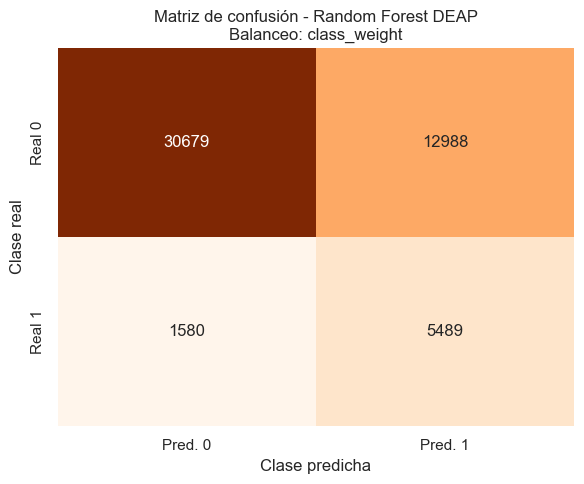

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.70      0.81     43667
Prediabetes/Diabetes       0.30      0.78      0.43      7069

            accuracy                           0.71     50736
           macro avg       0.62      0.74      0.62     50736
        weighted avg       0.86      0.71      0.76     50736



In [76]:
# ============================================================
# Diagnóstico de matriz de confusión - Random Forest DEAP
# ============================================================

if rf_deap_result.get("Matriz Confusión") is not None:
    cm_rf_deap = rf_deap_result["Matriz Confusión"]
else:
    cm_rf_deap = confusion_matrix(y_test, rf_deap_result["Predicciones"])

tn, fp, fn, tp = cm_rf_deap.ravel()
n_total = tn + fp + fn + tp

rf_deap_diagnostic = pd.DataFrame([{
    "Modelo": rf_deap_result.get("Modelo"),
    "Método": rf_deap_result.get("Metodo"),
    "Balanceo": rf_deap_result.get("Balanceo"),
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": rf_deap_result.get("Test Accuracy"),
    "Test Precision": rf_deap_result.get("Test Precision"),
    "Test Recall": rf_deap_result.get("Test Recall"),
    "Test F1": rf_deap_result.get("Test F1"),
    "Test AUC": rf_deap_result.get("Test AUC")
}])

display(rf_deap_diagnostic.round(4))


# ============================================================
# Matriz de confusión - Random Forest DEAP
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_rf_deap,
    annot=True,
    fmt="d",
    cmap="Oranges",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Random Forest DEAP\n"
    f"Balanceo: {rf_deap_result.get('Balanceo')}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        rf_deap_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

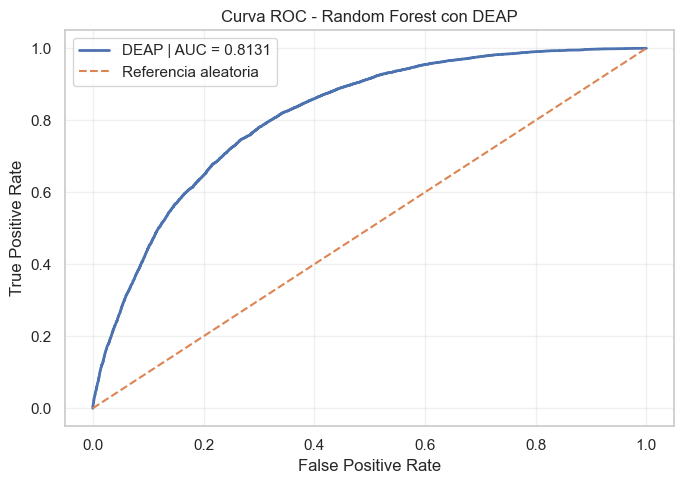

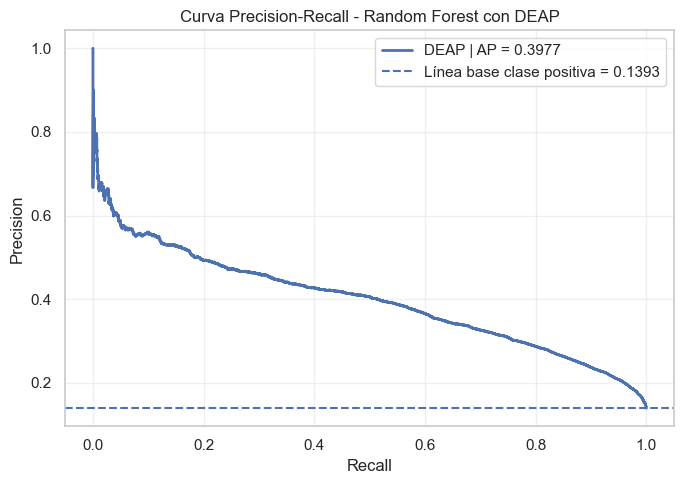

In [77]:
# ============================================================
# Curva ROC - Random Forest DEAP
# ============================================================

y_score_rf_deap = rf_deap_result.get("Scores")

if y_score_rf_deap is None:
    print("No hay scores disponibles para graficar la curva ROC.")
else:
    fpr, tpr, _ = roc_curve(y_test, y_score_rf_deap)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(7, 5))

    plt.plot(
        fpr,
        tpr,
        linewidth=2,
        label=f"DEAP | AUC = {roc_auc:.4f}"
    )

    plt.plot(
        [0, 1],
        [0, 1],
        linestyle="--",
        label="Referencia aleatoria"
    )

    plt.title("Curva ROC - Random Forest con DEAP")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    
    # ============================================================
# Curva Precision-Recall - Random Forest DEAP
# ============================================================

if y_score_rf_deap is None:
    print("No hay scores disponibles para graficar la curva Precision-Recall.")
else:
    precision, recall, _ = precision_recall_curve(y_test, y_score_rf_deap)
    avg_precision = average_precision_score(y_test, y_score_rf_deap)
    positive_rate = y_test.mean()

    plt.figure(figsize=(7, 5))

    plt.plot(
        recall,
        precision,
        linewidth=2,
        label=f"DEAP | AP = {avg_precision:.4f}"
    )

    plt.axhline(
        positive_rate,
        linestyle="--",
        label=f"Línea base clase positiva = {positive_rate:.4f}"
    )

    plt.title("Curva Precision-Recall - Random Forest con DEAP")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [78]:
# ============================================================
# Logbook evolutivo DEAP
# ============================================================

logbook_rf_deap = rf_deap_result.get("Logbook")

if logbook_rf_deap is not None:
    display(logbook_rf_deap)
else:
    print("No hay logbook disponible en el resultado guardado.")

,Generacion,Best Recall,Best Individual
0,0,0.651731,"[0, 0, 0, 2, 1]"
1,1,0.779821,"[1, 0, 0, 3, 1]"
2,2,0.779821,"[1, 0, 0, 3, 1]"
3,3,0.779821,"[1, 0, 0, 3, 1]"
4,4,0.779821,"[1, 0, 0, 3, 1]"


### Interpretación de Random Forest con DEAP

Random Forest optimizado mediante DEAP permite evaluar el modelo desde una perspectiva evolutiva, en la que cada individuo representa una combinación de hiperparámetros y estrategia de balanceo. A diferencia de Grid Search y Random Search, que exploran combinaciones de manera sistemática o aleatoria, DEAP utiliza selección, cruce y mutación para favorecer progresivamente las configuraciones con mejor desempeño según la métrica objetivo.

El resultado se analiza a partir del recall, la precisión, el F1-score, el AUC y la matriz de confusión. Dado que el problema presenta desbalance de clases y el interés principal es identificar correctamente los casos positivos asociados a prediabetes o diabetes, el recall es una métrica clave. Sin embargo, este debe interpretarse junto con la precisión y la proporción de positivos predichos, para identificar si el modelo mejora la sensibilidad a costa de un incremento excesivo de falsos positivos.

Las curvas ROC y Precision-Recall complementan la evaluación. La curva ROC permite observar la capacidad discriminativa general del modelo, mientras que la curva Precision-Recall resulta especialmente útil en este contexto por la baja proporción de casos positivos en el conjunto de datos.

## **18. Regresión logística L2**

In [73]:
import os
import joblib
import pandas as pd

BASE_DIR = r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML"

CHECKPOINT_DIR_L2 = os.path.join(BASE_DIR, "checkpoints_logistic_l2")
os.makedirs(CHECKPOINT_DIR_L2, exist_ok=True)

def save_checkpoint_l2(result, method_name, balance_strategy):
    path = os.path.join(
        CHECKPOINT_DIR_L2,
        f"logistic_l2_{method_name}_{balance_strategy}.joblib"
    )
    joblib.dump(result, path)
    print(f"Guardado: {path}")


def load_existing_results_l2(method_name):
    results = []
    completed = []

    for balance_strategy in get_balance_options("logistic_l2"):
        path = os.path.join(
            CHECKPOINT_DIR_L2,
            f"logistic_l2_{method_name}_{balance_strategy}.joblib"
        )

        if os.path.exists(path):
            result = joblib.load(path)
            results.append(result)
            completed.append(balance_strategy)

    return results, completed

### **18.1 Regresión Logística L2 con Grid Search**

In [54]:
# Logistic Regression L2 - Grid Search

grid_results_logreg_l2, completed_grid_l2 = load_existing_results_l2("grid")

for balance_strategy in tqdm(get_balance_options("logistic_l2"), desc="LogReg L2 | Grid Search"):

    if balance_strategy in completed_grid_l2:
        print(f"Ya existe Grid Search | {balance_strategy}. Se omite.")
        continue

    result = run_grid_search_model(
        model_key="logistic_l2",
        balance_strategy=balance_strategy
    )

    grid_results_logreg_l2.append(result)
    save_checkpoint_l2(result, "grid", balance_strategy)

LogReg L2 | Grid Search:  25%|██▌       | 1/4 [00:18<00:55, 18.64s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_grid_none.joblib


LogReg L2 | Grid Search:  50%|█████     | 2/4 [00:47<00:49, 24.56s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_grid_smote.joblib


LogReg L2 | Grid Search:  75%|███████▌  | 3/4 [02:15<00:53, 53.40s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_grid_adasyn.joblib


LogReg L2 | Grid Search: 100%|██████████| 4/4 [02:28<00:00, 37.04s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_grid_class_weight.joblib


In [74]:
# ============================================================
# Cargar resultados Regresión Logística L2 - Grid Search
# ============================================================

from pathlib import Path
import os
import joblib
import pandas as pd
import numpy as np

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

CHECKPOINT_DIR_L2 = BASE_DIR / "checkpoints_logistic_l2"

balance_logreg_l2_grid = ["none", "smote", "adasyn", "class_weight"]

grid_results_logreg_l2 = []

for balance_strategy in balance_logreg_l2_grid:
    path = CHECKPOINT_DIR_L2 / f"logistic_l2_grid_{balance_strategy}.joblib"
    
    if path.exists():
        result = joblib.load(path)
        result["Fuente"] = str(path)
        grid_results_logreg_l2.append(result)
        print(f"Cargado: {path}")
    else:
        print(f"No encontrado: {path}")

print(f"\nResultados cargados: {len(grid_results_logreg_l2)}")

Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_grid_none.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_grid_smote.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_grid_adasyn.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_grid_class_weight.joblib

Resultados cargados: 4


In [75]:
# ============================================================
# Regresión Logística L2 + Grid Search: tabla resumen
# ============================================================

logreg_l2_grid_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Metodo"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params"))
    }
    for r in grid_results_logreg_l2
])

logreg_l2_grid_summary = logreg_l2_grid_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(logreg_l2_grid_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
2,Logistic Regression L2,Grid Search,adasyn,0.7766,0.7212,0.3041,0.7772,0.4372,0.8171,87.5901,4,{'model__C': 0.01}
3,Logistic Regression L2,Grid Search,class_weight,0.7658,0.7316,0.3108,0.7611,0.4414,0.8196,12.9537,4,{'model__C': 10}
1,Logistic Regression L2,Grid Search,smote,0.7603,0.7319,0.3110,0.7604,0.4414,0.8179,28.5766,4,{'model__C': 0.01}
0,Logistic Regression L2,Grid Search,none,0.1581,0.8621,0.5168,0.1584,0.2425,0.8192,18.4397,4,{'model__C': 10}


In [76]:
# ============================================================
# Selección del mejor modelo L2 con Grid Search
# ============================================================

best_l2_grid_idx = logreg_l2_grid_summary["Test Recall"].idxmax()
best_balance_l2_grid = logreg_l2_grid_summary.loc[best_l2_grid_idx, "Balanceo"]

best_logreg_l2_grid_result = [
    r for r in grid_results_logreg_l2
    if r.get("Balanceo") == best_balance_l2_grid
][0]

print("Mejor Regresión Logística L2 con Grid Search")
print("=" * 60)
print("Balanceo:", best_logreg_l2_grid_result["Balanceo"])
print("Test Accuracy:", round(best_logreg_l2_grid_result["Test Accuracy"], 4))
print("Test Precision:", round(best_logreg_l2_grid_result["Test Precision"], 4))
print("Test Recall:", round(best_logreg_l2_grid_result["Test Recall"], 4))
print("Test F1:", round(best_logreg_l2_grid_result["Test F1"], 4))
print("Test AUC:", round(best_logreg_l2_grid_result["Test AUC"], 4))
print("Best Params:", best_logreg_l2_grid_result["Best Params"])

Mejor Regresión Logística L2 con Grid Search
Balanceo: adasyn
Test Accuracy: 0.7212
Test Precision: 0.3041
Test Recall: 0.7772
Test F1: 0.4372
Test AUC: 0.8171
Best Params: {'model__C': 0.01}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Logistic Regression L2,Grid Search,adasyn,31095,12572,1575,5494,13.9329,35.6079,0.7212,0.3041,0.7772,0.4372,0.8171


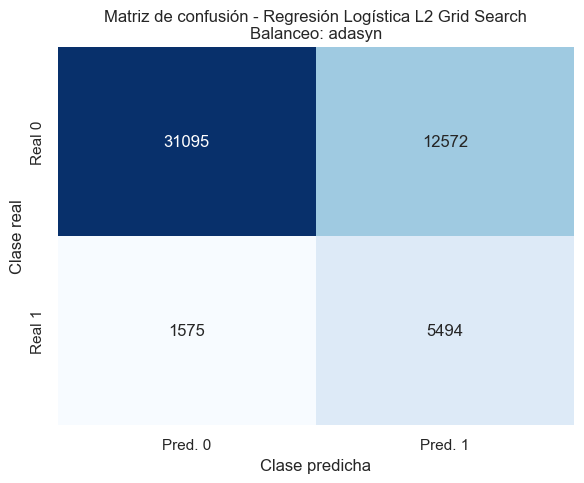

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.71      0.81     43667
Prediabetes/Diabetes       0.30      0.78      0.44      7069

            accuracy                           0.72     50736
           macro avg       0.63      0.74      0.63     50736
        weighted avg       0.86      0.72      0.76     50736



In [89]:
# ============================================================
# Diagnóstico de matriz de confusión - L2 Grid Search
# ============================================================

from sklearn.metrics import confusion_matrix

cm_l2_grid = best_logreg_l2_grid_result["Matriz Confusión"]
tn, fp, fn, tp = cm_l2_grid.ravel()

n_total = tn + fp + fn + tp

logreg_l2_grid_diagnostic = pd.DataFrame([{
    "Modelo": best_logreg_l2_grid_result["Modelo"],
    "Método": best_logreg_l2_grid_result["Metodo"],
    "Balanceo": best_logreg_l2_grid_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_logreg_l2_grid_result["Test Accuracy"],
    "Test Precision": best_logreg_l2_grid_result["Test Precision"],
    "Test Recall": best_logreg_l2_grid_result["Test Recall"],
    "Test F1": best_logreg_l2_grid_result["Test F1"],
    "Test AUC": best_logreg_l2_grid_result["Test AUC"]
}])

display(logreg_l2_grid_diagnostic.round(4))

# ============================================================
# Matriz de confusión - Mejor Regresión Logística L2 Grid Search
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_l2_grid,
    annot=True,
    fmt="d",
    cmap="Blues",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Regresión Logística L2 Grid Search\n"
    f"Balanceo: {best_logreg_l2_grid_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_logreg_l2_grid_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

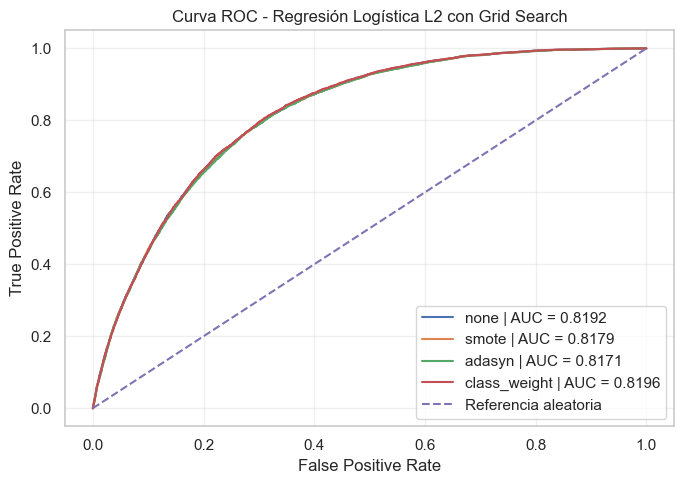

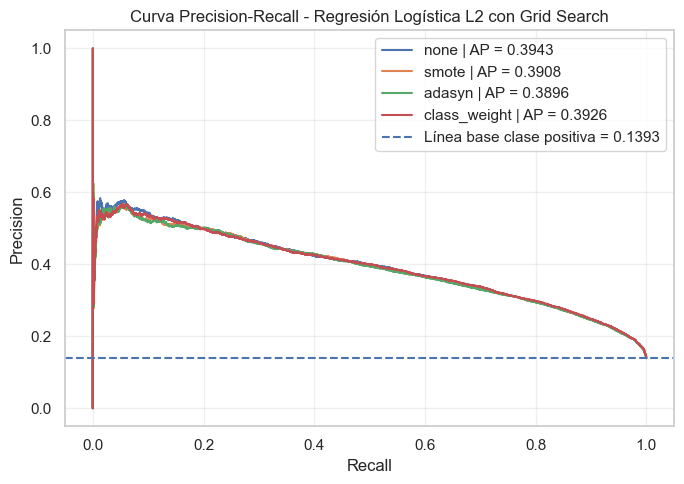

In [91]:
# ============================================================
# Curva ROC - Regresión Logística L2 Grid Search
# ============================================================

from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(7, 5))

for result in grid_results_logreg_l2:
    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - Regresión Logística L2 con Grid Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ============================================================
# Curva Precision-Recall - Regresión Logística L2 Grid Search
# ============================================================

from sklearn.metrics import precision_recall_curve, average_precision_score

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in grid_results_logreg_l2:
    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Regresión Logística L2 con Grid Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### **18.2 Regresión Logística L2 con Random Search**

In [55]:
# Logistic Regression L2 - Random Search

random_results_logreg_l2, completed_random_l2 = load_existing_results_l2("random")

for balance_strategy in tqdm(get_balance_options("logistic_l2"), desc="LogReg L2 | Random Search"):

    if balance_strategy in completed_random_l2:
        print(f"Ya existe Random Search | {balance_strategy}. Se omite.")
        continue

    result = run_random_search_model(
        model_key="logistic_l2",
        balance_strategy=balance_strategy,
        n_iter=30
    )

    random_results_logreg_l2.append(result)
    save_checkpoint_l2(result, "random", balance_strategy)

LogReg L2 | Random Search:  25%|██▌       | 1/4 [00:18<00:54, 18.09s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_random_none.joblib


LogReg L2 | Random Search:  50%|█████     | 2/4 [00:54<00:57, 28.93s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_random_smote.joblib


LogReg L2 | Random Search:  75%|███████▌  | 3/4 [03:13<01:19, 79.15s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_random_adasyn.joblib


LogReg L2 | Random Search: 100%|██████████| 4/4 [03:30<00:00, 52.65s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_random_class_weight.joblib


In [77]:
# ============================================================
# Cargar resultados Regresión Logística L2 - Random Search
# ============================================================

from pathlib import Path
import os
import joblib
import pandas as pd
import numpy as np

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

CHECKPOINT_DIR_L2 = BASE_DIR / "checkpoints_logistic_l2"

balance_logreg_l2_random = ["none", "smote", "adasyn", "class_weight"]

random_results_logreg_l2 = []

for balance_strategy in balance_logreg_l2_random:
    path = CHECKPOINT_DIR_L2 / f"logistic_l2_random_{balance_strategy}.joblib"
    
    if path.exists():
        result = joblib.load(path)
        result["Fuente"] = str(path)
        random_results_logreg_l2.append(result)
        print(f"Cargado: {path}")
    else:
        print(f"No encontrado: {path}")

print(f"\nResultados cargados: {len(random_results_logreg_l2)}")

Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_random_none.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_random_smote.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_random_adasyn.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_random_class_weight.joblib

Resultados cargados: 4


In [78]:
# ============================================================
# Regresión Logística L2 + Random Search: tabla resumen
# ============================================================

logreg_l2_random_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Metodo"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params"))
    }
    for r in random_results_logreg_l2
])

logreg_l2_random_summary = logreg_l2_random_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(logreg_l2_random_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
2,Logistic Regression L2,Random Search,adasyn,0.7786,0.7165,0.2998,0.7746,0.4323,0.8146,138.7994,6,{'model__C': 0.001}
3,Logistic Regression L2,Random Search,class_weight,0.7658,0.7316,0.3108,0.7611,0.4414,0.8196,16.9727,6,{'model__C': 10}
1,Logistic Regression L2,Random Search,smote,0.7620,0.7259,0.3056,0.7599,0.4359,0.8149,36.3436,6,{'model__C': 0.001}
0,Logistic Regression L2,Random Search,none,0.1582,0.8621,0.5171,0.1584,0.2426,0.8192,17.9824,6,{'model__C': 100}


In [79]:
# ============================================================
# Selección del mejor modelo L2 con Random Search
# ============================================================

best_l2_random_idx = logreg_l2_random_summary["Test Recall"].idxmax()
best_balance_l2_random = logreg_l2_random_summary.loc[best_l2_random_idx, "Balanceo"]

best_logreg_l2_random_result = [
    r for r in random_results_logreg_l2
    if r.get("Balanceo") == best_balance_l2_random
][0]

print("Mejor Regresión Logística L2 con Random Search")
print("=" * 60)
print("Balanceo:", best_logreg_l2_random_result["Balanceo"])
print("Test Accuracy:", round(best_logreg_l2_random_result["Test Accuracy"], 4))
print("Test Precision:", round(best_logreg_l2_random_result["Test Precision"], 4))
print("Test Recall:", round(best_logreg_l2_random_result["Test Recall"], 4))
print("Test F1:", round(best_logreg_l2_random_result["Test F1"], 4))
print("Test AUC:", round(best_logreg_l2_random_result["Test AUC"], 4))
print("Best Params:", best_logreg_l2_random_result["Best Params"])

Mejor Regresión Logística L2 con Random Search
Balanceo: adasyn
Test Accuracy: 0.7165
Test Precision: 0.2998
Test Recall: 0.7746
Test F1: 0.4323
Test AUC: 0.8146
Best Params: {'model__C': 0.001}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Logistic Regression L2,Random Search,adasyn,30878,12789,1593,5476,13.9329,36.0001,0.7165,0.2998,0.7746,0.4323,0.8146


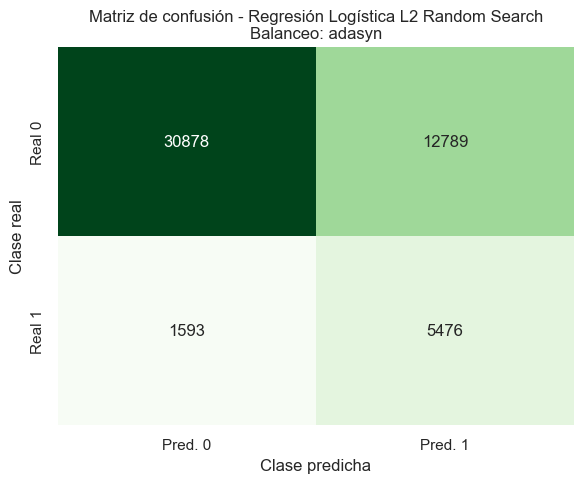

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.71      0.81     43667
Prediabetes/Diabetes       0.30      0.77      0.43      7069

            accuracy                           0.72     50736
           macro avg       0.63      0.74      0.62     50736
        weighted avg       0.86      0.72      0.76     50736



In [98]:
# ============================================================
# Diagnóstico de matriz de confusión - L2 Random Search
# ============================================================

from sklearn.metrics import confusion_matrix

cm_l2_random = best_logreg_l2_random_result["Matriz Confusión"]
tn, fp, fn, tp = cm_l2_random.ravel()

n_total = tn + fp + fn + tp

logreg_l2_random_diagnostic = pd.DataFrame([{
    "Modelo": best_logreg_l2_random_result["Modelo"],
    "Método": best_logreg_l2_random_result["Metodo"],
    "Balanceo": best_logreg_l2_random_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_logreg_l2_random_result["Test Accuracy"],
    "Test Precision": best_logreg_l2_random_result["Test Precision"],
    "Test Recall": best_logreg_l2_random_result["Test Recall"],
    "Test F1": best_logreg_l2_random_result["Test F1"],
    "Test AUC": best_logreg_l2_random_result["Test AUC"]
}])

display(logreg_l2_random_diagnostic.round(4))


# ============================================================
# Matriz de confusión - Mejor Regresión Logística L2 Random Search
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_l2_random,
    annot=True,
    fmt="d",
    cmap="Greens",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Regresión Logística L2 Random Search\n"
    f"Balanceo: {best_logreg_l2_random_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_logreg_l2_random_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

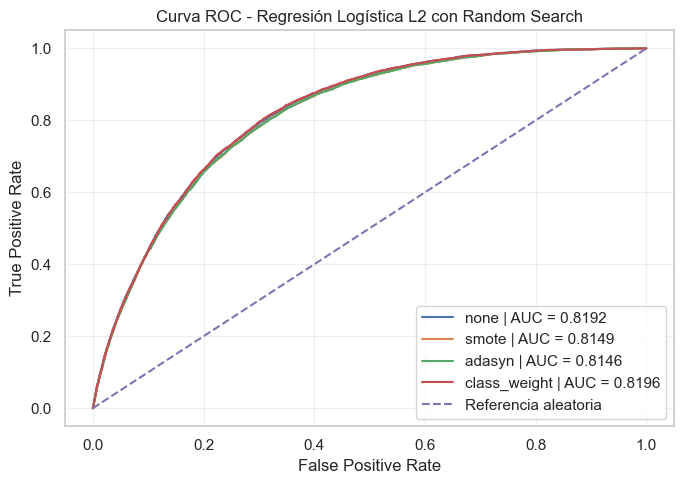

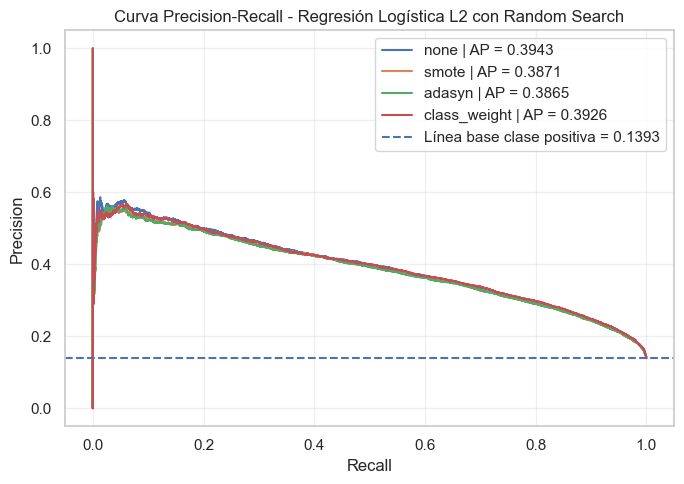

In [101]:
# ============================================================
# Curva ROC - Regresión Logística L2 Random Search
# ============================================================

from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(7, 5))

for result in random_results_logreg_l2:
    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - Regresión Logística L2 con Random Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show() 


# ============================================================
# Curva Precision-Recall - Regresión Logística L2 Random Search
# ============================================================

from sklearn.metrics import precision_recall_curve, average_precision_score

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in random_results_logreg_l2:
    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Regresión Logística L2 con Random Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de Regresión Logística L2 con Random Search

En la Regresión Logística L2 optimizada mediante Random Search se evaluaron las estrategias de balanceo `none`, `SMOTE`, `ADASYN` y `class_weight`. La selección del mejor resultado se realizó con base en el recall sobre el conjunto de prueba, dado que el objetivo principal del proyecto es mejorar la identificación de casos positivos asociados a prediabetes o diabetes.

La regularización L2 permite controlar la magnitud de los coeficientes del modelo, reduciendo el riesgo de sobreajuste y favoreciendo una solución más estable. En este caso, las estrategias de balanceo permiten contrastar el desempeño del modelo cuando se prioriza la clase minoritaria frente a una configuración sin balanceo.

La matriz de confusión permite observar el equilibrio entre verdaderos positivos, falsos negativos y falsos positivos. Las curvas ROC y Precision-Recall complementan el análisis, especialmente la curva Precision-Recall, debido al desbalance de clases presente en el conjunto de datos.

### **18.3 Regresión Logística L2 con Optuna**

En esta implementación de Optuna, la estrategia de balanceo de clases se incorporó como un hiperparámetro adicional dentro del proceso de optimización. Es decir, en lugar de ejecutar una optimización independiente para cada técnica de balanceo, Optuna evaluó distintas combinaciones entre hiperparámetros del modelo y estrategias como `none`, `SMOTE`, `ADASYN`, `class_weight` o `scale_pos_weight`, según la compatibilidad de cada algoritmo.

Esta decisión permite realizar una optimización integrada, donde el algoritmo no solo busca los mejores valores de los hiperparámetros internos del modelo, sino también la estrategia de tratamiento del desbalance que maximiza la métrica principal definida para el proyecto. En este caso, la métrica objetivo fue el `recall`, debido a que el interés principal es mejorar la identificación de la clase positiva, correspondiente a personas con prediabetes o diabetes.

Por esta razón, la tabla final de Optuna muestra únicamente la mejor combinación encontrada por el estudio para cada modelo, y no una fila independiente por cada técnica de balanceo. Esto no significa que las demás técnicas no hayan sido consideradas, sino que Optuna seleccionó como resultado final aquella estrategia que, junto con los hiperparámetros evaluados, obtuvo el mejor desempeño en validación cruzada.

Este enfoque es metodológicamente válido porque trata el balanceo como parte del espacio de búsqueda del modelo. De esta manera, la selección de la técnica de balanceo no se realiza manualmente ni de forma aislada, sino que queda incorporada dentro del proceso de optimización. Esto permite obtener una configuración final más coherente, ya que los hiperparámetros y la estrategia de balanceo son elegidos conjuntamente bajo el mismo criterio de evaluación.

In [56]:
# Logistic Regression L2 - Optuna

optuna_path_l2 = os.path.join(CHECKPOINT_DIR_L2, "logistic_l2_optuna.joblib")

if os.path.exists(optuna_path_l2):
    optuna_results_logreg_l2 = [joblib.load(optuna_path_l2)]
    print("Optuna Logistic L2 ya existe. Se cargó desde checkpoint.")
else:
    optuna_results_logreg_l2 = []

    result = run_optuna_model(
        model_key="logistic_l2",
        model_name="Logistic Regression L2",
        scale_numeric=True,
        n_trials=30
    )

    optuna_results_logreg_l2.append(result)
    joblib.dump(result, optuna_path_l2)
    print(f"Guardado: {optuna_path_l2}")

[I 2026-05-17 21:08:15,403] A new study created in memory with name: no-name-672a0331-30d1-4171-9507-60272fdac79a
[I 2026-05-17 21:08:28,042] Trial 0 finished with value: 0.7602645704130853 and parameters: {'balance_strategy': 'smote', 'C': 0.010439685923040521}. Best is trial 0 with value: 0.7602645704130853.
[I 2026-05-17 21:08:33,943] Trial 1 finished with value: 0.7657106214600239 and parameters: {'balance_strategy': 'class_weight', 'C': 8.45521357395721}. Best is trial 1 with value: 0.7657106214600239.
[I 2026-05-17 21:08:44,901] Trial 2 finished with value: 0.7597340976992736 and parameters: {'balance_strategy': 'smote', 'C': 1.1831478881098}. Best is trial 1 with value: 0.7657106214600239.
[I 2026-05-17 21:08:50,157] Trial 3 finished with value: 0.15132412767612496 and parameters: {'balance_strategy': 'none', 'C': 0.031666400263981716}. Best is trial 1 with value: 0.7657106214600239.
[I 2026-05-17 21:09:15,927] Trial 4 finished with value: 0.7762139124105666 and parameters: {'ba

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_optuna.joblib


In [80]:
# ============================================================
# Cargar resultado Regresión Logística L2 - Optuna
# ============================================================

from pathlib import Path
import os
import joblib
import ast
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

CHECKPOINT_DIR_L2 = BASE_DIR / "checkpoints_logistic_l2"

optuna_path_l2 = CHECKPOINT_DIR_L2 / "logistic_l2_optuna.joblib"

print("Ruta Optuna L2:", optuna_path_l2)
print("Existe:", optuna_path_l2.exists())

if optuna_path_l2.exists():
    optuna_results_logreg_l2 = joblib.load(optuna_path_l2)
    print("Resultado Regresión Logística L2 Optuna cargado correctamente.")
else:
    raise FileNotFoundError(f"No se encontró el archivo: {optuna_path_l2}")

# Por si quedó guardado como lista
if isinstance(optuna_results_logreg_l2, list):
    best_logreg_l2_optuna_result = optuna_results_logreg_l2[0]
else:
    best_logreg_l2_optuna_result = optuna_results_logreg_l2

print("Tipo de objeto:", type(best_logreg_l2_optuna_result))

if isinstance(best_logreg_l2_optuna_result, dict):
    print("Claves disponibles:")
    print(best_logreg_l2_optuna_result.keys())

Ruta Optuna L2: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_optuna.joblib
Existe: True
Resultado Regresión Logística L2 Optuna cargado correctamente.
Tipo de objeto: <class 'dict'>
Claves disponibles:
dict_keys(['Modelo', 'Metodo', 'Balanceo', 'CV Accuracy', 'CV Precision', 'CV Recall', 'CV F1', 'CV AUC', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1', 'Test AUC', 'Tiempo (s)', 'Evaluaciones', 'Best Params', 'Best Estimator', 'Matriz Confusión', 'Predicciones', 'Scores', 'Study'])


In [106]:
# ============================================================
# Regresión Logística L2 + Optuna: tabla resumen
# ============================================================

best_params_l2_optuna = best_logreg_l2_optuna_result.get("Best Params")

if isinstance(best_params_l2_optuna, str):
    try:
        best_params_l2_optuna_dict = ast.literal_eval(best_params_l2_optuna)
    except Exception:
        best_params_l2_optuna_dict = {}
else:
    best_params_l2_optuna_dict = (
        best_params_l2_optuna 
        if isinstance(best_params_l2_optuna, dict) 
        else {}
    )

balanceo_l2_optuna = best_logreg_l2_optuna_result.get(
    "Balanceo",
    best_params_l2_optuna_dict.get("balance_strategy", "No disponible")
)

logreg_l2_optuna_summary = pd.DataFrame([{
    "Modelo": best_logreg_l2_optuna_result.get("Modelo"),
    "Método": best_logreg_l2_optuna_result.get("Metodo"),
    "Balanceo": balanceo_l2_optuna,

    "CV Recall": best_logreg_l2_optuna_result.get("CV Recall"),

    "Test Accuracy": best_logreg_l2_optuna_result.get("Test Accuracy"),
    "Test Precision": best_logreg_l2_optuna_result.get("Test Precision"),
    "Test Recall": best_logreg_l2_optuna_result.get("Test Recall"),
    "Test F1": best_logreg_l2_optuna_result.get("Test F1"),
    "Test AUC": best_logreg_l2_optuna_result.get("Test AUC"),

    "Tiempo (s)": best_logreg_l2_optuna_result.get("Tiempo (s)"),
    "Evaluaciones": best_logreg_l2_optuna_result.get("Evaluaciones"),
    "Best Params": str(best_params_l2_optuna)
}])

display(logreg_l2_optuna_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
0,Logistic Regression L2,Optuna,adasyn,0.779,0.7172,0.3005,0.7754,0.4331,0.8153,522.3492,30,"{'balance_strategy': 'adasyn', 'C': 0.00133944..."


En el caso de la regresión logística L2 optimizada con Optuna, la mejor configuración encontrada utilizó `ADASYN` como estrategia de balanceo. Esto indica que, entre las combinaciones evaluadas durante los ensayos, la combinación de `ADASYN` con el valor óptimo del parámetro `C` fue la que alcanzó el mayor `recall` promedio en validación cruzada.

Por tanto, el resultado reportado corresponde al mejor ensayo del estudio de Optuna, no a una comparación separada de todas las técnicas de balanceo. La estrategia seleccionada debe interpretarse como parte de la configuración óptima encontrada por el método de optimización.

In [111]:
# ============================================================
# Historial de trials Optuna - Regresión Logística L2
# ============================================================

import pandas as pd
import ast

# Tomar el resultado cargado, venga como lista o como diccionario
if isinstance(optuna_results_logreg_l2, list):
    optuna_l2_result = optuna_results_logreg_l2[0]
else:
    optuna_l2_result = optuna_results_logreg_l2

print("Claves disponibles en el resultado:")
print(optuna_l2_result.keys())

# Intentar recuperar el objeto Study si fue guardado
study_logreg_l2 = (
    optuna_l2_result.get("Study")
    or optuna_l2_result.get("study")
    or optuna_l2_result.get("Optuna Study")
)

if study_logreg_l2 is not None:
    
    trials_logreg_l2 = study_logreg_l2.trials_dataframe()

    cols_to_show = [
        "number",
        "value",
        "params_balance_strategy",
        "params_C",
        "state"
    ]

    cols_to_show = [col for col in cols_to_show if col in trials_logreg_l2.columns]

    display(
        trials_logreg_l2[cols_to_show]
        .sort_values(by="value", ascending=False)
        .head(20)
    )

else:
    
    print("\nNo se encontró el objeto Study dentro del checkpoint.")
    print("Se muestra el mejor resultado guardado en el diccionario del modelo.")

    best_params = optuna_l2_result.get("Best Params")

    if isinstance(best_params, str):
        try:
            best_params_dict = ast.literal_eval(best_params)
        except Exception:
            best_params_dict = {"Best Params": best_params}
    elif isinstance(best_params, dict):
        best_params_dict = best_params
    else:
        best_params_dict = {}

    fallback_optuna_l2 = pd.DataFrame([{
        "Modelo": optuna_l2_result.get("Modelo"),
        "Método": optuna_l2_result.get("Metodo"),
        "Balanceo": optuna_l2_result.get("Balanceo", best_params_dict.get("balance_strategy")),
        "CV Recall": optuna_l2_result.get("CV Recall"),
        "Test Accuracy": optuna_l2_result.get("Test Accuracy"),
        "Test Precision": optuna_l2_result.get("Test Precision"),
        "Test Recall": optuna_l2_result.get("Test Recall"),
        "Test F1": optuna_l2_result.get("Test F1"),
        "Test AUC": optuna_l2_result.get("Test AUC"),
        "Tiempo (s)": optuna_l2_result.get("Tiempo (s)"),
        "Evaluaciones": optuna_l2_result.get("Evaluaciones"),
        "Best Params": str(best_params)
    }])

    display(fallback_optuna_l2.round(4))

Claves disponibles en el resultado:
dict_keys(['Modelo', 'Metodo', 'Balanceo', 'CV Accuracy', 'CV Precision', 'CV Recall', 'CV F1', 'CV AUC', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1', 'Test AUC', 'Tiempo (s)', 'Evaluaciones', 'Best Params', 'Best Estimator', 'Matriz Confusión', 'Predicciones', 'Scores', 'Study'])


,number,value,params_balance_strategy,params_C,state
13,13,0.779008,adasyn,0.001339,COMPLETE
7,7,0.778866,adasyn,0.001514,COMPLETE
24,24,0.778477,adasyn,0.001132,COMPLETE
18,18,0.778477,adasyn,0.001196,COMPLETE
14,14,0.778406,adasyn,0.001161,COMPLETE
21,21,0.777982,adasyn,0.001805,COMPLETE
25,25,0.777770,adasyn,0.006568,COMPLETE
23,23,0.777699,adasyn,0.007691,COMPLETE
22,22,0.777628,adasyn,0.002211,COMPLETE
26,26,0.777522,adasyn,0.002331,COMPLETE


El historial de optimización de Optuna muestra que las mejores configuraciones de Regresión Logística L2 se concentraron principalmente en la estrategia de balanceo ADASYN. El mejor trial alcanzó un recall de validación cercano a 0.7790, con un valor de regularización C aproximadamente igual a 0.0013.

Este resultado indica que Optuna identificó una combinación en la que el balanceo adaptativo de la clase minoritaria, junto con una regularización L2 relativamente fuerte, favorece la detección de casos positivos. Sin embargo, como en los demás modelos, este resultado debe analizarse junto con las métricas sobre el conjunto de prueba, especialmente precisión, F1-score, AUC y matriz de confusión, para verificar si el aumento del recall no se obtiene a costa de una cantidad excesiva de falsos positivos.

In [112]:
balance_summary_logreg_l2 = (
    trials_logreg_l2
    .groupby("params_balance_strategy")
    .agg(
        Ensayos=("number", "count"),
        Mejor_CV_Recall=("value", "max"),
        Promedio_CV_Recall=("value", "mean")
    )
    .reset_index()
    .sort_values(by="Mejor_CV_Recall", ascending=False)
)

display(balance_summary_logreg_l2.round(4))

,params_balance_strategy,Ensayos,Mejor_CV_Recall,Promedio_CV_Recall
0,adasyn,17,0.7790,0.7774
1,class_weight,4,0.7657,0.7653
3,smote,5,0.7609,0.7603
2,none,4,0.1513,0.1396


La tabla anterior permite revisar el historial de ensayos de Optuna agrupado por estrategia de balanceo. Aunque el resultado final del modelo muestra solo la mejor estrategia encontrada, el historial del estudio permite verificar qué técnicas fueron exploradas durante el proceso de optimización y cuál fue su mejor desempeño en términos de `recall` de validación cruzada.

,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Logistic Regression L2,Optuna,adasyn,30907,12760,1588,5481,13.9329,35.9528,0.7172,0.3005,0.7754,0.4331,0.8153


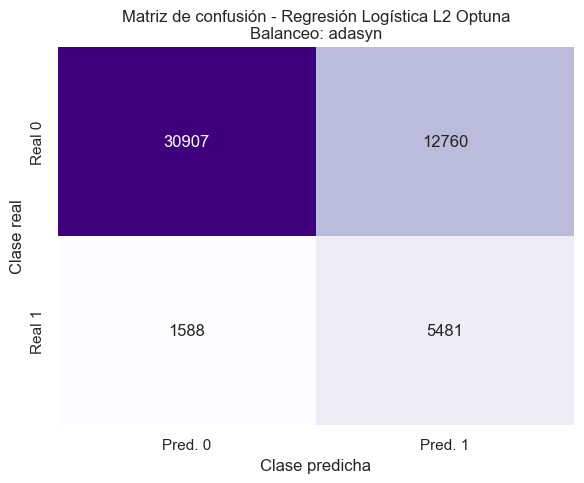

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.71      0.81     43667
Prediabetes/Diabetes       0.30      0.78      0.43      7069

            accuracy                           0.72     50736
           macro avg       0.63      0.74      0.62     50736
        weighted avg       0.86      0.72      0.76     50736



In [107]:
# ============================================================
# Diagnóstico de matriz de confusión - L2 Optuna
# ============================================================

if best_logreg_l2_optuna_result.get("Matriz Confusión") is not None:
    cm_l2_optuna = best_logreg_l2_optuna_result["Matriz Confusión"]
else:
    cm_l2_optuna = confusion_matrix(
        y_test,
        best_logreg_l2_optuna_result["Predicciones"]
    )

tn, fp, fn, tp = cm_l2_optuna.ravel()
n_total = tn + fp + fn + tp

logreg_l2_optuna_diagnostic = pd.DataFrame([{
    "Modelo": best_logreg_l2_optuna_result.get("Modelo"),
    "Método": best_logreg_l2_optuna_result.get("Metodo"),
    "Balanceo": balanceo_l2_optuna,
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_logreg_l2_optuna_result.get("Test Accuracy"),
    "Test Precision": best_logreg_l2_optuna_result.get("Test Precision"),
    "Test Recall": best_logreg_l2_optuna_result.get("Test Recall"),
    "Test F1": best_logreg_l2_optuna_result.get("Test F1"),
    "Test AUC": best_logreg_l2_optuna_result.get("Test AUC")
}])

display(logreg_l2_optuna_diagnostic.round(4))

# ============================================================
# Matriz de confusión - Regresión Logística L2 Optuna
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_l2_optuna,
    annot=True,
    fmt="d",
    cmap="Purples",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Regresión Logística L2 Optuna\n"
    f"Balanceo: {balanceo_l2_optuna}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_logreg_l2_optuna_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

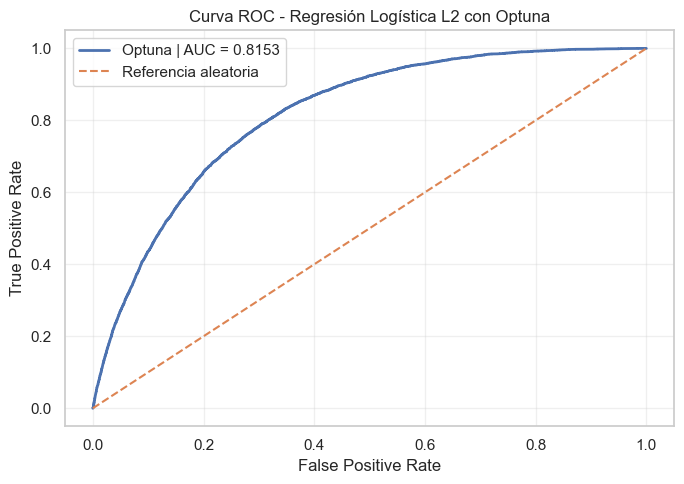

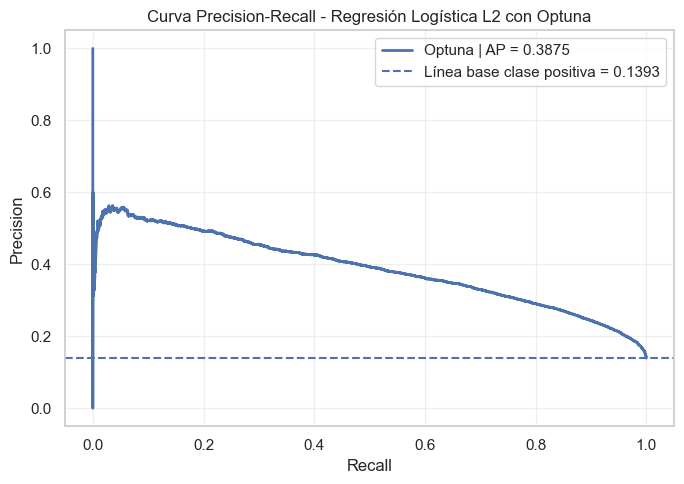

In [108]:
# ============================================================
# Curva ROC - Regresión Logística L2 Optuna
# ============================================================

y_score_l2_optuna = best_logreg_l2_optuna_result.get("Scores")

if y_score_l2_optuna is None:
    print("No hay scores disponibles para graficar la curva ROC.")
else:
    fpr, tpr, _ = roc_curve(y_test, y_score_l2_optuna)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(7, 5))

    plt.plot(
        fpr,
        tpr,
        linewidth=2,
        label=f"Optuna | AUC = {roc_auc:.4f}"
    )

    plt.plot(
        [0, 1],
        [0, 1],
        linestyle="--",
        label="Referencia aleatoria"
    )

    plt.title("Curva ROC - Regresión Logística L2 con Optuna")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


# ============================================================
# Curva Precision-Recall - Regresión Logística L2 Optuna
# ============================================================

if y_score_l2_optuna is None:
    print("No hay scores disponibles para graficar la curva Precision-Recall.")
else:
    precision, recall, _ = precision_recall_curve(y_test, y_score_l2_optuna)
    avg_precision = average_precision_score(y_test, y_score_l2_optuna)
    positive_rate = y_test.mean()

    plt.figure(figsize=(7, 5))

    plt.plot(
        recall,
        precision,
        linewidth=2,
        label=f"Optuna | AP = {avg_precision:.4f}"
    )

    plt.axhline(
        positive_rate,
        linestyle="--",
        label=f"Línea base clase positiva = {positive_rate:.4f}"
    )

    plt.title("Curva Precision-Recall - Regresión Logística L2 con Optuna")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

### Interpretación de Regresión Logística L2 con Optuna

En la Regresión Logística L2 optimizada mediante Optuna, la estrategia de balanceo fue incorporada como parte del espacio de búsqueda junto con el hiperparámetro de regularización `C`. Esto permite que la selección final del modelo no dependa únicamente de una técnica de balanceo predefinida, sino de la combinación que maximiza el criterio de evaluación durante la optimización.

La regularización L2 penaliza coeficientes de gran magnitud y favorece modelos más estables, especialmente útiles cuando se busca una solución interpretable y con menor riesgo de sobreajuste. En este caso, Optuna evalúa distintas configuraciones y selecciona aquella que ofrece mejor desempeño en recall, de acuerdo con el objetivo del proyecto.

La matriz de confusión permite observar si el aumento en sensibilidad se obtiene a costa de un incremento importante en falsos positivos. Por su parte, las curvas ROC y Precision-Recall complementan el análisis: la curva ROC resume la capacidad discriminativa general, mientras que la curva Precision-Recall es especialmente relevante debido al desbalance de clases.

### **18.4 Regresión Logística L2 con DEAP**

En la implementación de DEAP, la estrategia de balanceo también se incorporó como parte del espacio de búsqueda del algoritmo genético. Es decir, cada individuo no representa únicamente una combinación de hiperparámetros del modelo, sino también una posible estrategia para tratar el desbalance de clases, como `none`, `SMOTE`, `ADASYN`, `class_weight` o `scale_pos_weight`, según la compatibilidad de cada algoritmo.

Esta decisión permite realizar una optimización integrada, donde el algoritmo genético evalúa simultáneamente los hiperparámetros del modelo y la técnica de balanceo. Cada individuo es evaluado mediante validación cruzada estratificada, utilizando como función de aptitud el `recall` promedio, debido a que el objetivo principal del proyecto es mejorar la detección de la clase positiva, correspondiente a personas con prediabetes o diabetes.

Por esta razón, la tabla final de DEAP muestra únicamente el mejor individuo encontrado al finalizar el proceso evolutivo, y no una fila independiente por cada técnica de balanceo. Esto no significa que las demás estrategias no hayan sido consideradas, sino que el algoritmo seleccionó como mejor solución aquella combinación de hiperparámetros y balanceo que obtuvo el mayor desempeño según la métrica objetivo.

En el caso de la regresión logística L2 optimizada con DEAP, la mejor configuración encontrada utilizó `ADASYN` como estrategia de balanceo. Esto indica que, dentro de las combinaciones exploradas por la población genética a través de las generaciones, la combinación entre `ADASYN` y el valor óptimo de `C` fue la que alcanzó el mejor `recall` promedio en validación cruzada.

Este enfoque es metodológicamente válido porque trata el balanceo como una decisión propia del modelo optimizado, no como una etapa externa o aislada. Así, la estrategia de balanceo y los hiperparámetros son seleccionados conjuntamente bajo el mismo criterio de evaluación, lo que permite obtener una configuración final más coherente con el objetivo del proyecto.

In [57]:
# Logistic Regression L2 - DEAP

deap_path_l2 = os.path.join(CHECKPOINT_DIR_L2, "logistic_l2_deap.joblib")

if os.path.exists(deap_path_l2):
    deap_results_logreg_l2 = [joblib.load(deap_path_l2)]
    print("DEAP Logistic L2 ya existe. Se cargó desde checkpoint.")
else:
    deap_results_logreg_l2 = []

    result = run_deap_model(
        model_key="logistic_l2",
        n_population=10,
        n_generations=5
    )

    deap_results_logreg_l2.append(result)
    joblib.dump(result, deap_path_l2)
    print(f"Guardado: {deap_path_l2}")

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_deap.joblib


In [81]:
# ============================================================
# Cargar resultado Regresión Logística L2 - DEAP
# ============================================================

import os
import joblib
import ast
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

deap_path_l2 = os.path.join(CHECKPOINT_DIR_L2, "logistic_l2_deap.joblib")

print("Ruta DEAP L2:", deap_path_l2)
print("Existe:", os.path.exists(deap_path_l2))

if os.path.exists(deap_path_l2):
    deap_loaded_l2 = joblib.load(deap_path_l2)
    print("Resultado Regresión Logística L2 DEAP cargado correctamente.")
else:
    raise FileNotFoundError(f"No se encontró el archivo: {deap_path_l2}")

# Por si quedó guardado como lista
if isinstance(deap_loaded_l2, list):
    best_logreg_l2_deap_result = deap_loaded_l2[0]
else:
    best_logreg_l2_deap_result = deap_loaded_l2

print("Tipo de objeto:", type(best_logreg_l2_deap_result))

if isinstance(best_logreg_l2_deap_result, dict):
    print("Claves disponibles:")
    print(best_logreg_l2_deap_result.keys())

Ruta DEAP L2: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l2\logistic_l2_deap.joblib
Existe: True
Resultado Regresión Logística L2 DEAP cargado correctamente.
Tipo de objeto: <class 'dict'>
Claves disponibles:
dict_keys(['Modelo', 'Metodo', 'Balanceo', 'CV Accuracy', 'CV Precision', 'CV Recall', 'CV F1', 'CV AUC', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1', 'Test AUC', 'Tiempo (s)', 'Evaluaciones', 'Best Params', 'Best Estimator', 'Matriz Confusión', 'Predicciones', 'Scores', 'Logbook'])


In [82]:
# ============================================================
# Recuperar mejor individuo desde logbook si no aparece
# ============================================================

if best_logreg_l2_deap_result.get("Best Individual") is None:
    
    logbook_l2_deap = best_logreg_l2_deap_result.get("Logbook")
    
    if logbook_l2_deap is not None:
        
        if isinstance(logbook_l2_deap, pd.DataFrame):
            logbook_l2_deap_df = logbook_l2_deap.copy()
        else:
            logbook_l2_deap_df = pd.DataFrame(logbook_l2_deap)
        
        if "Best Recall" in logbook_l2_deap_df.columns:
            best_row = logbook_l2_deap_df.sort_values(
                by="Best Recall",
                ascending=False
            ).iloc[0]
            
            best_logreg_l2_deap_result["Best Individual"] = best_row.get("Best Individual")

print("Best Individual:", best_logreg_l2_deap_result.get("Best Individual"))

Best Individual: [0, 2]


In [83]:
# ============================================================
# Regresión Logística L2 + DEAP: tabla resumen
# ============================================================

best_params_l2_deap = best_logreg_l2_deap_result.get("Best Params")

if isinstance(best_params_l2_deap, str):
    try:
        best_params_l2_deap_dict = ast.literal_eval(best_params_l2_deap)
    except Exception:
        best_params_l2_deap_dict = {}
else:
    best_params_l2_deap_dict = (
        best_params_l2_deap 
        if isinstance(best_params_l2_deap, dict) 
        else {}
    )

balanceo_l2_deap = best_logreg_l2_deap_result.get(
    "Balanceo",
    best_params_l2_deap_dict.get("balance_strategy", "No disponible")
)

logreg_l2_deap_summary = pd.DataFrame([{
    "Modelo": best_logreg_l2_deap_result.get("Modelo"),
    "Método": best_logreg_l2_deap_result.get("Metodo"),
    "Balanceo": balanceo_l2_deap,

    "CV Recall": best_logreg_l2_deap_result.get("CV Recall"),

    "Test Accuracy": best_logreg_l2_deap_result.get("Test Accuracy"),
    "Test Precision": best_logreg_l2_deap_result.get("Test Precision"),
    "Test Recall": best_logreg_l2_deap_result.get("Test Recall"),
    "Test F1": best_logreg_l2_deap_result.get("Test F1"),
    "Test AUC": best_logreg_l2_deap_result.get("Test AUC"),

    "Tiempo (s)": best_logreg_l2_deap_result.get("Tiempo (s)"),
    "Evaluaciones": best_logreg_l2_deap_result.get("Evaluaciones"),
    "Best Params": str(best_params_l2_deap),
    "Best Individual": str(best_logreg_l2_deap_result.get("Best Individual"))
}])

display(logreg_l2_deap_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params,Best Individual
0,Logistic Regression L2,DEAP,adasyn,0.7766,0.7212,0.3041,0.7772,0.4372,0.8171,548.0002,50,{'C': 0.01},"[0, 2]"


Para la regresión logística L2, DEAP seleccionó como mejor individuo una configuración con `ADASYN` y `C=0.01`. Esta configuración obtuvo un `CV Recall` de aproximadamente 0.7766 y un `Test Recall` de 0.7772, lo que evidencia una mejora importante en la detección de la clase positiva frente a los modelos iniciales sin balanceo ni optimización.

Aunque el `Test Accuracy` disminuye a 0.7212 y la precisión queda en 0.3041, este comportamiento es esperable cuando se prioriza el `recall` en un problema desbalanceado. El modelo detecta muchos más casos positivos, pero también aumenta la cantidad de falsos positivos. Por tanto, el resultado debe interpretarse de acuerdo con la métrica principal definida para el proyecto: maximizar la sensibilidad frente a personas con prediabetes o diabetes.

,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Logistic Regression L2,DEAP,adasyn,31095,12572,1575,5494,13.9329,35.6079,0.7212,0.3041,0.7772,0.4372,0.8171


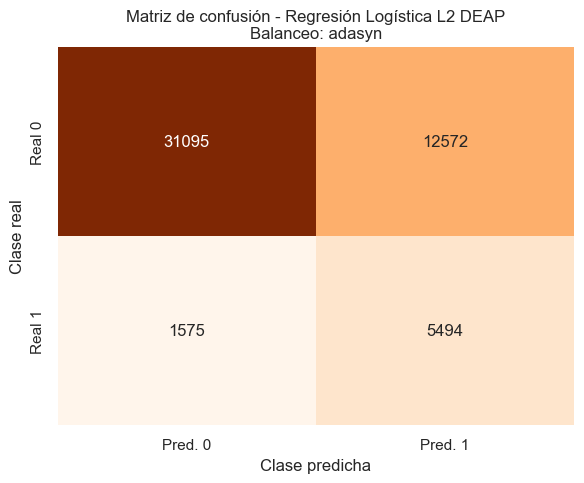

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.71      0.81     43667
Prediabetes/Diabetes       0.30      0.78      0.44      7069

            accuracy                           0.72     50736
           macro avg       0.63      0.74      0.63     50736
        weighted avg       0.86      0.72      0.76     50736



In [119]:
# ============================================================
# Diagnóstico de matriz de confusión - L2 DEAP
# ============================================================

if best_logreg_l2_deap_result.get("Matriz Confusión") is not None:
    cm_l2_deap = best_logreg_l2_deap_result["Matriz Confusión"]
else:
    cm_l2_deap = confusion_matrix(
        y_test,
        best_logreg_l2_deap_result["Predicciones"]
    )

tn, fp, fn, tp = cm_l2_deap.ravel()
n_total = tn + fp + fn + tp

logreg_l2_deap_diagnostic = pd.DataFrame([{
    "Modelo": best_logreg_l2_deap_result.get("Modelo"),
    "Método": best_logreg_l2_deap_result.get("Metodo"),
    "Balanceo": balanceo_l2_deap,
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_logreg_l2_deap_result.get("Test Accuracy"),
    "Test Precision": best_logreg_l2_deap_result.get("Test Precision"),
    "Test Recall": best_logreg_l2_deap_result.get("Test Recall"),
    "Test F1": best_logreg_l2_deap_result.get("Test F1"),
    "Test AUC": best_logreg_l2_deap_result.get("Test AUC")
}])

display(logreg_l2_deap_diagnostic.round(4))


# ============================================================
# Matriz de confusión - Regresión Logística L2 DEAP
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_l2_deap,
    annot=True,
    fmt="d",
    cmap="Oranges",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Regresión Logística L2 DEAP\n"
    f"Balanceo: {balanceo_l2_deap}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_logreg_l2_deap_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

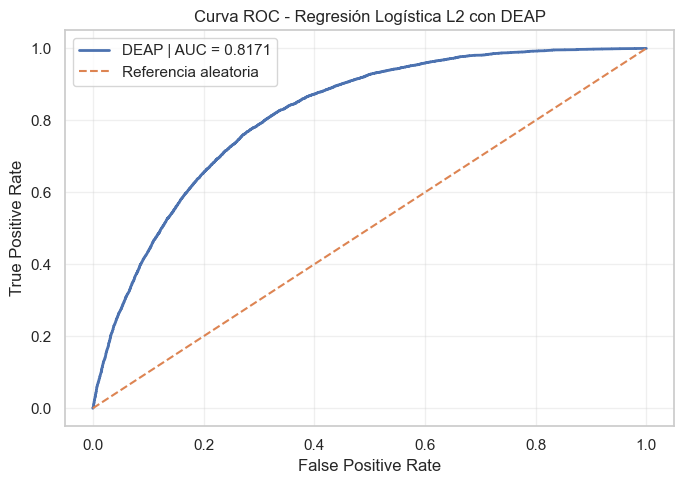

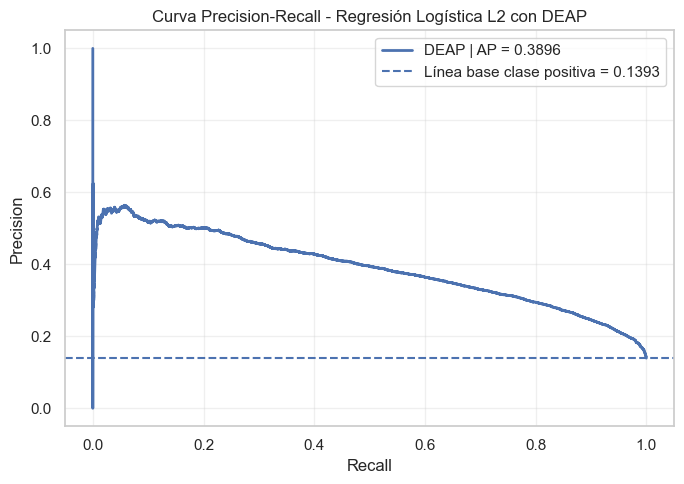

In [120]:
# ============================================================
# Curva ROC - Regresión Logística L2 DEAP
# ============================================================

y_score_l2_deap = best_logreg_l2_deap_result.get("Scores")

if y_score_l2_deap is None:
    print("No hay scores disponibles para graficar la curva ROC.")
else:
    fpr, tpr, _ = roc_curve(y_test, y_score_l2_deap)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(7, 5))

    plt.plot(
        fpr,
        tpr,
        linewidth=2,
        label=f"DEAP | AUC = {roc_auc:.4f}"
    )

    plt.plot(
        [0, 1],
        [0, 1],
        linestyle="--",
        label="Referencia aleatoria"
    )

    plt.title("Curva ROC - Regresión Logística L2 con DEAP")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    

# ============================================================
# Curva Precision-Recall - Regresión Logística L2 DEAP
# ============================================================

if y_score_l2_deap is None:
    print("No hay scores disponibles para graficar la curva Precision-Recall.")
else:
    precision, recall, _ = precision_recall_curve(y_test, y_score_l2_deap)
    avg_precision = average_precision_score(y_test, y_score_l2_deap)
    positive_rate = y_test.mean()

    plt.figure(figsize=(7, 5))

    plt.plot(
        recall,
        precision,
        linewidth=2,
        label=f"DEAP | AP = {avg_precision:.4f}"
    )

    plt.axhline(
        positive_rate,
        linestyle="--",
        label=f"Línea base clase positiva = {positive_rate:.4f}"
    )

    plt.title("Curva Precision-Recall - Regresión Logística L2 con DEAP")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [121]:
# ============================================================
# Logbook evolutivo - Regresión Logística L2 DEAP
# ============================================================

logbook_l2_deap = best_logreg_l2_deap_result.get("Logbook")

if logbook_l2_deap is not None:
    
    if isinstance(logbook_l2_deap, pd.DataFrame):
        logbook_l2_deap_df = logbook_l2_deap.copy()
    else:
        logbook_l2_deap_df = pd.DataFrame(logbook_l2_deap)
    
    display(logbook_l2_deap_df)
else:
    print("No hay logbook disponible en el resultado guardado.")

,Generacion,Best Recall,Best Individual
0,0,0.776638,"[0, 2]"
1,1,0.776638,"[0, 2]"
2,2,0.776638,"[0, 2]"
3,3,0.776638,"[0, 2]"
4,4,0.776638,"[0, 2]"


El logbook evolutivo de Regresión Logística L2 con DEAP muestra que el mejor individuo se mantuvo estable durante todas las generaciones, con un recall de validación de aproximadamente 0.7766. Esto indica que el algoritmo encontró desde etapas tempranas una combinación competitiva de hiperparámetros y estrategia de balanceo, sin que las operaciones posteriores de cruce y mutación generaran una solución superior.

Este comportamiento es razonable en Regresión Logística L2, ya que el espacio de búsqueda es más reducido que en modelos como Random Forest o SVM. En este caso, el individuo evolutivo representa principalmente la combinación entre el parámetro de regularización C y la estrategia de balanceo. Por tanto, la estabilidad del mejor individuo sugiere una convergencia temprana del proceso evolutivo.

### Interpretación de Regresión Logística L2 con DEAP

La Regresión Logística L2 optimizada mediante DEAP fue evaluada bajo un enfoque evolutivo, en el cual cada individuo representa una combinación de hiperparámetros y estrategia de balanceo. Esto permite que el algoritmo seleccione conjuntamente el valor de regularización y la técnica de tratamiento del desbalance que mejor favorece el recall promedio en validación cruzada.

El resultado final muestra la mejor configuración encontrada por el proceso evolutivo. Al igual que en Optuna, la tabla no presenta una fila independiente por cada técnica de balanceo, ya que el balanceo fue tratado como un gen dentro del individuo. Por tanto, el modelo reportado corresponde a la combinación que alcanzó el mejor desempeño según la función de aptitud definida.

La matriz de confusión permite verificar si el aumento del recall se obtiene con un incremento razonable de falsos positivos. Asimismo, las curvas ROC y Precision-Recall complementan la evaluación del modelo, siendo esta última especialmente importante debido al desbalance de clases.

## **19. Regresión Logística L1**

In [61]:
import os
import joblib
import pandas as pd

CHECKPOINT_DIR_L1 = os.path.join(BASE_DIR, "checkpoints_logistic_l1")
os.makedirs(CHECKPOINT_DIR_L1, exist_ok=True)

def save_checkpoint_l1(result, method_name, balance_strategy):
    path = os.path.join(
        CHECKPOINT_DIR_L1,
        f"logistic_l1_{method_name}_{balance_strategy}.joblib"
    )
    joblib.dump(result, path)
    print(f"Guardado: {path}")


def load_existing_results_l1(method_name):
    results = []
    completed = []

    for balance_strategy in get_balance_options("logistic_l1"):
        path = os.path.join(
            CHECKPOINT_DIR_L1,
            f"logistic_l1_{method_name}_{balance_strategy}.joblib"
        )

        if os.path.exists(path):
            result = joblib.load(path)
            results.append(result)
            completed.append(balance_strategy)

    return results, completed

### **19.1 Regresión Logística L1 con Grid Search**

In [62]:
# Logistic Regression L1 - Grid Search

grid_results_logreg_l1, completed_grid_l1 = load_existing_results_l1("grid")

for balance_strategy in tqdm(get_balance_options("logistic_l1"), desc="LogReg L1 | Grid Search"):

    if balance_strategy in completed_grid_l1:
        print(f"Ya existe Grid Search | {balance_strategy}. Se omite.")
        continue

    result = run_grid_search_model(
        model_key="logistic_l1",
        balance_strategy=balance_strategy
    )

    grid_results_logreg_l1.append(result)
    save_checkpoint_l1(result, "grid", balance_strategy)

LogReg L1 | Grid Search:  25%|██▌       | 1/4 [01:45<05:16, 105.48s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_grid_none.joblib


LogReg L1 | Grid Search:  50%|█████     | 2/4 [06:54<07:30, 225.10s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_grid_smote.joblib


LogReg L1 | Grid Search:  75%|███████▌  | 3/4 [13:08<04:53, 293.29s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_grid_adasyn.joblib


LogReg L1 | Grid Search: 100%|██████████| 4/4 [15:29<00:00, 232.43s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_grid_class_weight.joblib


In [84]:
# ============================================================
# Cargar resultados Regresión Logística L1 - Grid Search
# ============================================================

from pathlib import Path
import os
import joblib
import pandas as pd
import numpy as np

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

CHECKPOINT_DIR_L1 = BASE_DIR / "checkpoints_logistic_l1"

balance_logreg_l1_grid = ["none", "smote", "adasyn", "class_weight"]

grid_results_logreg_l1 = []

for balance_strategy in balance_logreg_l1_grid:
    path = CHECKPOINT_DIR_L1 / f"logistic_l1_grid_{balance_strategy}.joblib"
    
    if path.exists():
        result = joblib.load(path)
        result["Fuente"] = str(path)
        grid_results_logreg_l1.append(result)
        print(f"Cargado: {path}")
    else:
        print(f"No encontrado: {path}")

print(f"\nResultados cargados: {len(grid_results_logreg_l1)}")

Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_grid_none.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_grid_smote.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_grid_adasyn.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_grid_class_weight.joblib

Resultados cargados: 4


In [85]:
# ============================================================
# Regresión Logística L1 + Grid Search: tabla resumen
# ============================================================

logreg_l1_grid_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Metodo"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params"))
    }
    for r in grid_results_logreg_l1
])

logreg_l1_grid_summary = logreg_l1_grid_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(logreg_l1_grid_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
2,Logistic Regression L1,Grid Search,adasyn,0.7770,0.7218,0.3047,0.7776,0.4379,0.8171,374.2631,4,{'model__C': 0.01}
3,Logistic Regression L1,Grid Search,class_weight,0.7658,0.7316,0.3108,0.7609,0.4413,0.8196,140.8435,4,{'model__C': 1}
1,Logistic Regression L1,Grid Search,smote,0.7599,0.7326,0.3116,0.7605,0.4421,0.8179,308.6341,4,{'model__C': 0.01}
0,Logistic Regression L1,Grid Search,none,0.1580,0.8622,0.5178,0.1583,0.2425,0.8192,105.3215,4,{'model__C': 1}


In [86]:
# ============================================================
# Selección del mejor modelo L1 con Grid Search
# ============================================================

best_l1_grid_idx = logreg_l1_grid_summary["Test Recall"].idxmax()
best_balance_l1_grid = logreg_l1_grid_summary.loc[best_l1_grid_idx, "Balanceo"]

best_logreg_l1_grid_result = [
    r for r in grid_results_logreg_l1
    if r.get("Balanceo") == best_balance_l1_grid
][0]

print("Mejor Regresión Logística L1 con Grid Search")
print("=" * 60)
print("Balanceo:", best_logreg_l1_grid_result["Balanceo"])
print("Test Accuracy:", round(best_logreg_l1_grid_result["Test Accuracy"], 4))
print("Test Precision:", round(best_logreg_l1_grid_result["Test Precision"], 4))
print("Test Recall:", round(best_logreg_l1_grid_result["Test Recall"], 4))
print("Test F1:", round(best_logreg_l1_grid_result["Test F1"], 4))
print("Test AUC:", round(best_logreg_l1_grid_result["Test AUC"], 4))
print("Best Params:", best_logreg_l1_grid_result["Best Params"])

Mejor Regresión Logística L1 con Grid Search
Balanceo: adasyn
Test Accuracy: 0.7218
Test Precision: 0.3047
Test Recall: 0.7776
Test F1: 0.4379
Test AUC: 0.8171
Best Params: {'model__C': 0.01}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Logistic Regression L1,Grid Search,adasyn,31124,12543,1572,5497,13.9329,35.5566,0.7218,0.3047,0.7776,0.4379,0.8171


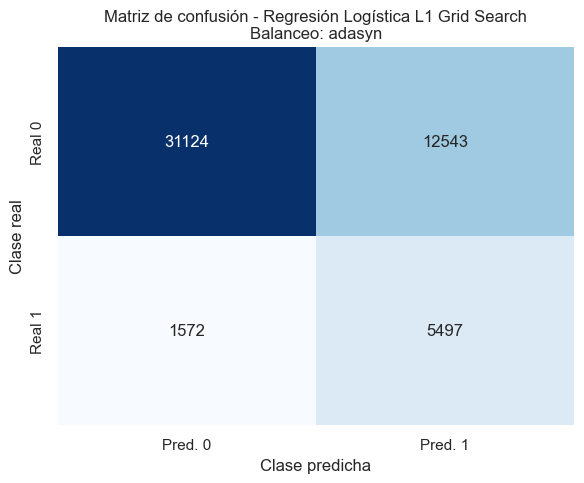

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.71      0.82     43667
Prediabetes/Diabetes       0.30      0.78      0.44      7069

            accuracy                           0.72     50736
           macro avg       0.63      0.75      0.63     50736
        weighted avg       0.86      0.72      0.76     50736



In [135]:
# ============================================================
# Diagnóstico de matriz de confusión - L1 Grid Search
# ============================================================

from sklearn.metrics import confusion_matrix

cm_l1_grid = best_logreg_l1_grid_result["Matriz Confusión"]
tn, fp, fn, tp = cm_l1_grid.ravel()

n_total = tn + fp + fn + tp

logreg_l1_grid_diagnostic = pd.DataFrame([{
    "Modelo": best_logreg_l1_grid_result["Modelo"],
    "Método": best_logreg_l1_grid_result["Metodo"],
    "Balanceo": best_logreg_l1_grid_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_logreg_l1_grid_result["Test Accuracy"],
    "Test Precision": best_logreg_l1_grid_result["Test Precision"],
    "Test Recall": best_logreg_l1_grid_result["Test Recall"],
    "Test F1": best_logreg_l1_grid_result["Test F1"],
    "Test AUC": best_logreg_l1_grid_result["Test AUC"]
}])

display(logreg_l1_grid_diagnostic.round(4))

# ============================================================
# Matriz de confusión - Mejor Regresión Logística L1 Grid Search
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_l1_grid,
    annot=True,
    fmt="d",
    cmap="Blues",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Regresión Logística L1 Grid Search\n"
    f"Balanceo: {best_logreg_l1_grid_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_logreg_l1_grid_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)


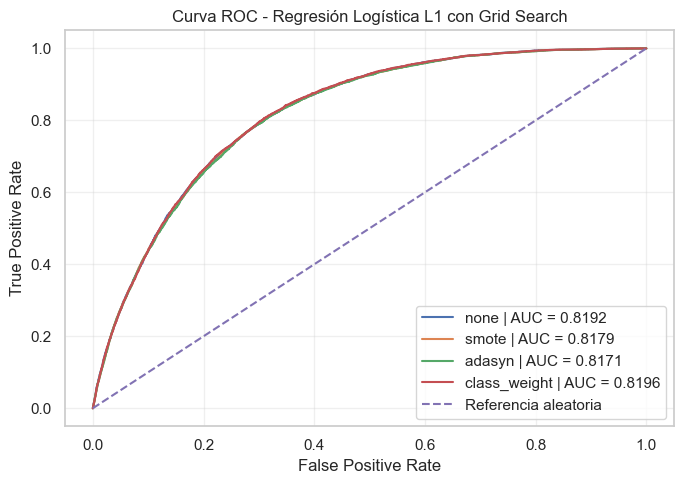

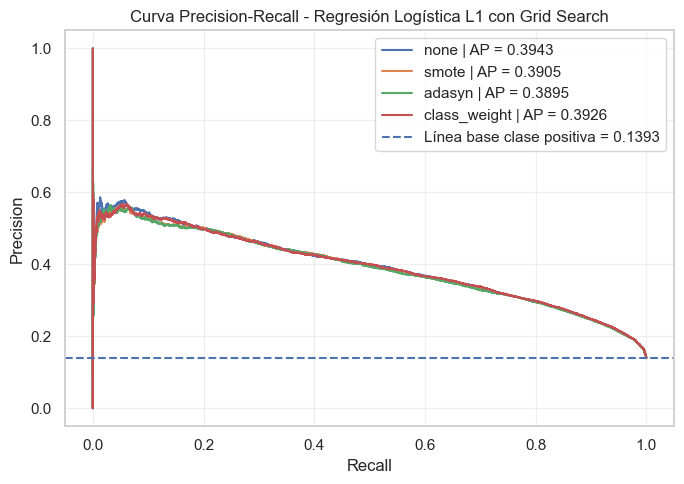

In [136]:
# ============================================================
# Curva ROC - Regresión Logística L1 Grid Search
# ============================================================

from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(7, 5))

for result in grid_results_logreg_l1:
    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - Regresión Logística L1 con Grid Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - Regresión Logística L1 Grid Search
# ============================================================

from sklearn.metrics import precision_recall_curve, average_precision_score

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in grid_results_logreg_l1:
    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Regresión Logística L1 con Grid Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de Regresión Logística L1 con Grid Search

En la Regresión Logística L1 optimizada mediante Grid Search se evaluaron las estrategias de balanceo `none`, `SMOTE`, `ADASYN` y `class_weight`. La selección del mejor resultado se realizó con base en el recall sobre el conjunto de prueba, dado que el objetivo principal del proyecto es mejorar la detección de casos positivos asociados a prediabetes o diabetes.

La regularización L1 introduce una penalización que puede llevar algunos coeficientes exactamente a cero, por lo que además de controlar el sobreajuste puede actuar como una forma de selección de variables. Esto permite obtener un modelo más parsimonioso frente a la regularización L2, aunque su desempeño debe evaluarse cuidadosamente en términos de recall, precisión, F1-score y AUC.

La matriz de confusión permite observar si el modelo logra reducir los falsos negativos sin aumentar excesivamente los falsos positivos. Por su parte, las curvas ROC y Precision-Recall complementan la evaluación, siendo la curva Precision-Recall especialmente importante debido al desbalance de clases del problema.

### **19.2 Regresión Logística L1 con Random Search**

In [63]:
# Logistic Regression L1 - Random Search

random_results_logreg_l1, completed_random_l1 = load_existing_results_l1("random")

for balance_strategy in tqdm(get_balance_options("logistic_l1"), desc="LogReg L1 | Random Search"):

    if balance_strategy in completed_random_l1:
        print(f"Ya existe Random Search | {balance_strategy}. Se omite.")
        continue

    result = run_random_search_model(
        model_key="logistic_l1",
        balance_strategy=balance_strategy,
        n_iter=30
    )

    random_results_logreg_l1.append(result)
    save_checkpoint_l1(result, "random", balance_strategy)

LogReg L1 | Random Search:  25%|██▌       | 1/4 [02:19<06:58, 139.64s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_random_none.joblib


LogReg L1 | Random Search:  50%|█████     | 2/4 [08:10<08:47, 263.75s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_random_smote.joblib


LogReg L1 | Random Search:  75%|███████▌  | 3/4 [14:56<05:28, 328.66s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_random_adasyn.joblib


LogReg L1 | Random Search: 100%|██████████| 4/4 [17:49<00:00, 267.33s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_random_class_weight.joblib


In [87]:
# ============================================================
# Cargar resultados Regresión Logística L1 - Random Search
# ============================================================

from pathlib import Path
import os
import glob
import joblib
import pandas as pd
import numpy as np

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

CHECKPOINT_DIR_L1 = BASE_DIR / "checkpoints_logistic_l1"

balance_logreg_l1_random = ["none", "smote", "adasyn", "class_weight"]

random_results_logreg_l1 = []

for balance_strategy in balance_logreg_l1_random:
    
    pattern = str(CHECKPOINT_DIR_L1 / f"logistic_*_random_{balance_strategy}.joblib")
    matches = glob.glob(pattern)
    
    if len(matches) > 0:
        path = matches[0]
        result = joblib.load(path)
        result["Fuente"] = path
        random_results_logreg_l1.append(result)
        print(f"Cargado resultado para balanceo: {balance_strategy}")
    else:
        print(f"No encontrado resultado para balanceo: {balance_strategy}")

print(f"\nResultados cargados: {len(random_results_logreg_l1)}")

Cargado resultado para balanceo: none
Cargado resultado para balanceo: smote
Cargado resultado para balanceo: adasyn
Cargado resultado para balanceo: class_weight

Resultados cargados: 4


In [88]:
# ============================================================
# Regresión Logística L1 + Random Search: tabla resumen
# ============================================================

logreg_l1_random_summary = pd.DataFrame([
    {
        "Modelo": "Regresión Logística L1",
        "Método": "Random Search",
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params"))
    }
    for r in random_results_logreg_l1
])

logreg_l1_random_summary = logreg_l1_random_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(logreg_l1_random_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
2,Regresión Logística L1,Random Search,adasyn,0.7808,0.7179,0.3014,0.7775,0.4344,0.8164,405.7813,6,{'model__C': 0.001}
3,Regresión Logística L1,Random Search,class_weight,0.7672,0.7236,0.3043,0.7647,0.4354,0.8143,173.0363,6,{'model__C': 0.001}
1,Regresión Logística L1,Random Search,smote,0.7636,0.7279,0.3078,0.7629,0.4386,0.8166,350.4876,6,{'model__C': 0.001}
0,Regresión Logística L1,Random Search,none,0.1580,0.8622,0.5178,0.1583,0.2425,0.8192,139.4519,6,{'model__C': 1}


In [139]:
# ============================================================
# Selección del mejor modelo L1 con Random Search
# ============================================================

best_l1_random_idx = logreg_l1_random_summary["Test Recall"].idxmax()
best_balance_l1_random = logreg_l1_random_summary.loc[best_l1_random_idx, "Balanceo"]

best_logreg_l1_random_result = [
    r for r in random_results_logreg_l1
    if r.get("Balanceo") == best_balance_l1_random
][0]

print("Mejor Regresión Logística L1 con Random Search")
print("=" * 60)
print("Balanceo:", best_logreg_l1_random_result["Balanceo"])
print("Test Accuracy:", round(best_logreg_l1_random_result["Test Accuracy"], 4))
print("Test Precision:", round(best_logreg_l1_random_result["Test Precision"], 4))
print("Test Recall:", round(best_logreg_l1_random_result["Test Recall"], 4))
print("Test F1:", round(best_logreg_l1_random_result["Test F1"], 4))
print("Test AUC:", round(best_logreg_l1_random_result["Test AUC"], 4))
print("Best Params:", best_logreg_l1_random_result["Best Params"])

Mejor Regresión Logística L1 con Random Search
Balanceo: adasyn
Test Accuracy: 0.7179
Test Precision: 0.3014
Test Recall: 0.7775
Test F1: 0.4344
Test AUC: 0.8164
Best Params: {'model__C': 0.001}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Regresión Logística L1,Random Search,adasyn,30926,12741,1573,5496,13.9329,35.9449,0.7179,0.3014,0.7775,0.4344,0.8164


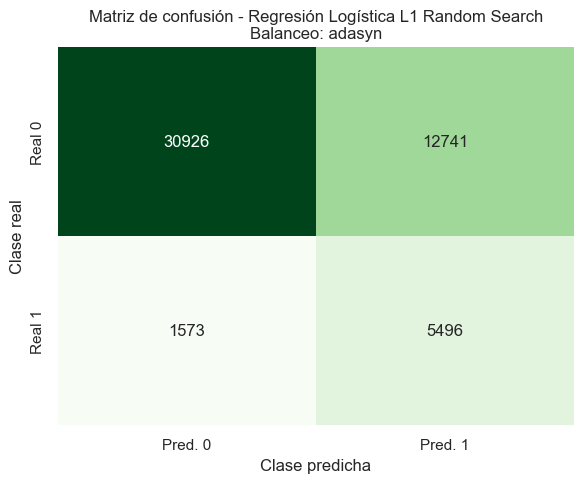

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.71      0.81     43667
Prediabetes/Diabetes       0.30      0.78      0.43      7069

            accuracy                           0.72     50736
           macro avg       0.63      0.74      0.62     50736
        weighted avg       0.86      0.72      0.76     50736



In [140]:
# ============================================================
# Diagnóstico de matriz de confusión - L1 Random Search
# ============================================================

from sklearn.metrics import confusion_matrix

cm_l1_random = best_logreg_l1_random_result["Matriz Confusión"]
tn, fp, fn, tp = cm_l1_random.ravel()

n_total = tn + fp + fn + tp

logreg_l1_random_diagnostic = pd.DataFrame([{
    "Modelo": "Regresión Logística L1",
    "Método": "Random Search",
    "Balanceo": best_logreg_l1_random_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_logreg_l1_random_result["Test Accuracy"],
    "Test Precision": best_logreg_l1_random_result["Test Precision"],
    "Test Recall": best_logreg_l1_random_result["Test Recall"],
    "Test F1": best_logreg_l1_random_result["Test F1"],
    "Test AUC": best_logreg_l1_random_result["Test AUC"]
}])

display(logreg_l1_random_diagnostic.round(4))

# ============================================================
# Matriz de confusión - Regresión Logística L1 Random Search
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_l1_random,
    annot=True,
    fmt="d",
    cmap="Greens",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Regresión Logística L1 Random Search\n"
    f"Balanceo: {best_logreg_l1_random_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_logreg_l1_random_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

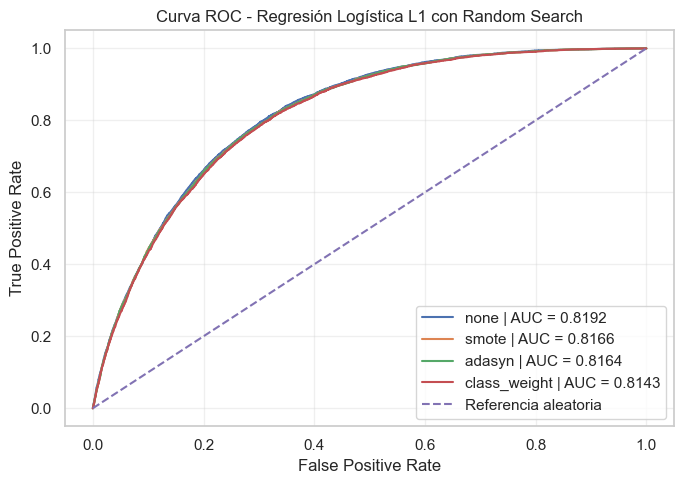

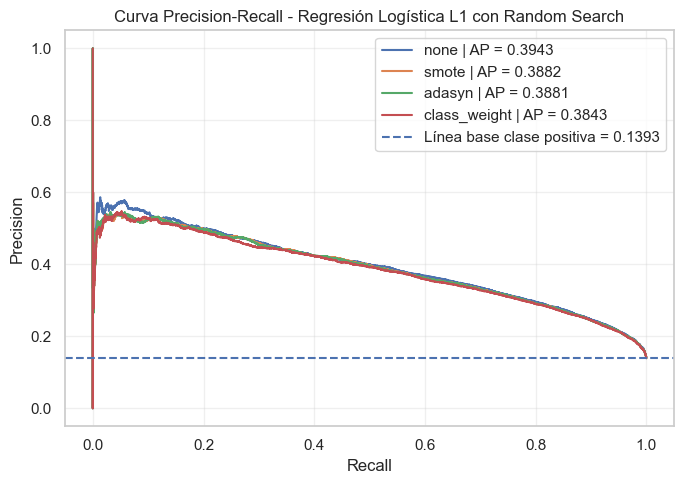

In [141]:
# ============================================================
# Curva ROC - Regresión Logística L1 Random Search
# ============================================================

from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(7, 5))

for result in random_results_logreg_l1:
    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - Regresión Logística L1 con Random Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - Regresión Logística L1 Random Search
# ============================================================

from sklearn.metrics import precision_recall_curve, average_precision_score

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in random_results_logreg_l1:
    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Regresión Logística L1 con Random Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de Regresión Logística L1 con Random Search

En la Regresión Logística L1 optimizada mediante Random Search se evaluaron las estrategias de balanceo `none`, `SMOTE`, `ADASYN` y `class_weight`. La selección del mejor resultado se realizó con base en el recall sobre el conjunto de prueba, en coherencia con el objetivo principal del proyecto: mejorar la detección de casos positivos asociados a prediabetes o diabetes.

La regularización L1 permite controlar el sobreajuste y, además, puede inducir selección de variables al llevar algunos coeficientes a cero. Esto la convierte en una alternativa útil cuando se busca un modelo más parsimonioso e interpretable.

La matriz de confusión permite observar el equilibrio entre verdaderos positivos, falsos negativos y falsos positivos. Las curvas ROC y Precision-Recall complementan el análisis, especialmente la curva Precision-Recall, debido al desbalance de clases del problema.

### **19.3 Regresión Logística L1 con Optuna**

In [64]:
# Logistic Regression L1 - Optuna

optuna_path_l1 = os.path.join(CHECKPOINT_DIR_L1, "logistic_l1_optuna.joblib")

if os.path.exists(optuna_path_l1):
    optuna_results_logreg_l1 = [joblib.load(optuna_path_l1)]
    print("Optuna Logistic L1 ya existe. Se cargó desde checkpoint.")
else:
    optuna_results_logreg_l1 = []

    result = run_optuna_model(
        model_key="logistic_l1",
        model_name="Logistic Regression L1",
        scale_numeric=True,
        n_trials=30
    )

    optuna_results_logreg_l1.append(result)
    joblib.dump(result, optuna_path_l1)
    print(f"Guardado: {optuna_path_l1}")

[I 2026-05-17 22:46:25,657] A new study created in memory with name: no-name-ccc0920e-2128-4258-ac24-d92599be5d88
[I 2026-05-17 22:46:55,957] Trial 0 finished with value: 0.15740663967874619 and parameters: {'balance_strategy': 'none', 'C': 0.12204029816135137}. Best is trial 0 with value: 0.15740663967874619.
[I 2026-05-17 22:47:10,015] Trial 1 finished with value: 0.766806771241732 and parameters: {'balance_strategy': 'class_weight', 'C': 0.0016629416822673507}. Best is trial 1 with value: 0.766806771241732.
[I 2026-05-17 22:47:50,419] Trial 2 finished with value: 0.7657459883919426 and parameters: {'balance_strategy': 'class_weight', 'C': 0.2451884624060264}. Best is trial 1 with value: 0.766806771241732.
[I 2026-05-17 22:49:13,512] Trial 3 finished with value: 0.7597341039522671 and parameters: {'balance_strategy': 'smote', 'C': 0.36076139280336}. Best is trial 1 with value: 0.766806771241732.
[I 2026-05-17 22:50:23,035] Trial 4 finished with value: 0.7787954795858518 and parameter

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_optuna.joblib


In [89]:
# ============================================================
# Cargar resultado Regresión Logística L1 - Optuna
# ============================================================

from pathlib import Path
import os
import glob
import joblib
import ast
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

CHECKPOINT_DIR_L1 = BASE_DIR / "checkpoints_logistic_l1"

pattern_l1_optuna = str(CHECKPOINT_DIR_L1 / "logistic_*_optuna.joblib")
matches_l1_optuna = glob.glob(pattern_l1_optuna)

print("Archivos encontrados:", len(matches_l1_optuna))

if len(matches_l1_optuna) > 0:
    optuna_path_l1 = matches_l1_optuna[0]
    optuna_loaded_l1 = joblib.load(optuna_path_l1)
    print("Resultado Regresión Logística L1 Optuna cargado correctamente.")
else:
    raise FileNotFoundError("No se encontró el checkpoint de Regresión Logística L1 con Optuna.")

# Por si quedó guardado como lista
if isinstance(optuna_loaded_l1, list):
    best_logreg_l1_optuna_result = optuna_loaded_l1[0]
else:
    best_logreg_l1_optuna_result = optuna_loaded_l1

print("Tipo de objeto:", type(best_logreg_l1_optuna_result))

if isinstance(best_logreg_l1_optuna_result, dict):
    print("Claves disponibles:")
    print(best_logreg_l1_optuna_result.keys())

Archivos encontrados: 1
Resultado Regresión Logística L1 Optuna cargado correctamente.
Tipo de objeto: <class 'dict'>
Claves disponibles:
dict_keys(['Modelo', 'Metodo', 'Balanceo', 'CV Accuracy', 'CV Precision', 'CV Recall', 'CV F1', 'CV AUC', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1', 'Test AUC', 'Tiempo (s)', 'Evaluaciones', 'Best Params', 'Best Estimator', 'Matriz Confusión', 'Predicciones', 'Scores', 'Study'])


In [90]:
# ============================================================
# Regresión Logística L1 + Optuna: tabla resumen
# ============================================================

best_params_l1_optuna = best_logreg_l1_optuna_result.get("Best Params")

if isinstance(best_params_l1_optuna, str):
    try:
        best_params_l1_optuna_dict = ast.literal_eval(best_params_l1_optuna)
    except Exception:
        best_params_l1_optuna_dict = {}
else:
    best_params_l1_optuna_dict = (
        best_params_l1_optuna 
        if isinstance(best_params_l1_optuna, dict) 
        else {}
    )

balanceo_l1_optuna = best_logreg_l1_optuna_result.get(
    "Balanceo",
    best_params_l1_optuna_dict.get("balance_strategy", "No disponible")
)

logreg_l1_optuna_summary = pd.DataFrame([{
    "Modelo": "Regresión Logística L1",
    "Método": "Optuna",
    "Balanceo": balanceo_l1_optuna,

    "CV Recall": best_logreg_l1_optuna_result.get("CV Recall"),

    "Test Accuracy": best_logreg_l1_optuna_result.get("Test Accuracy"),
    "Test Precision": best_logreg_l1_optuna_result.get("Test Precision"),
    "Test Recall": best_logreg_l1_optuna_result.get("Test Recall"),
    "Test F1": best_logreg_l1_optuna_result.get("Test F1"),
    "Test AUC": best_logreg_l1_optuna_result.get("Test AUC"),

    "Tiempo (s)": best_logreg_l1_optuna_result.get("Tiempo (s)"),
    "Evaluaciones": best_logreg_l1_optuna_result.get("Evaluaciones"),
    "Best Params": str(best_params_l1_optuna)
}])

display(logreg_l1_optuna_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
0,Regresión Logística L1,Optuna,adasyn,0.7808,0.718,0.3015,0.7775,0.4345,0.8165,2272.8999,30,"{'balance_strategy': 'adasyn', 'C': 0.00101696..."


In [144]:
# ============================================================
# Historial de trials Optuna - Regresión Logística L1
# ============================================================

study_logreg_l1 = (
    best_logreg_l1_optuna_result.get("Study")
    or best_logreg_l1_optuna_result.get("study")
    or best_logreg_l1_optuna_result.get("Optuna Study")
)

if study_logreg_l1 is not None:
    
    trials_logreg_l1 = study_logreg_l1.trials_dataframe()

    cols_to_show = [
        "number",
        "value",
        "params_balance_strategy",
        "params_C",
        "state"
    ]

    cols_to_show = [col for col in cols_to_show if col in trials_logreg_l1.columns]

    display(
        trials_logreg_l1[cols_to_show]
        .sort_values(by="value", ascending=False)
        .head(20)
    )

else:
    print("No se encontró el objeto Study dentro del checkpoint.")
    print("Se muestra únicamente el mejor resultado guardado.")
    display(logreg_l1_optuna_summary.round(4))

,number,value,params_balance_strategy,params_C,state
21,21,0.780776,adasyn,0.001017,COMPLETE
25,25,0.780776,adasyn,0.001073,COMPLETE
23,23,0.779821,adasyn,0.001246,COMPLETE
16,16,0.779786,adasyn,0.001160,COMPLETE
17,17,0.779432,adasyn,0.001310,COMPLETE
14,14,0.779184,adasyn,0.001985,COMPLETE
15,15,0.778937,adasyn,0.001854,COMPLETE
4,4,0.778795,adasyn,0.003442,COMPLETE
13,13,0.778088,adasyn,0.004494,COMPLETE
22,22,0.777522,adasyn,0.006259,COMPLETE


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Regresión Logística L1,Optuna,adasyn,30932,12735,1573,5496,13.9329,35.9331,0.718,0.3015,0.7775,0.4345,0.8165


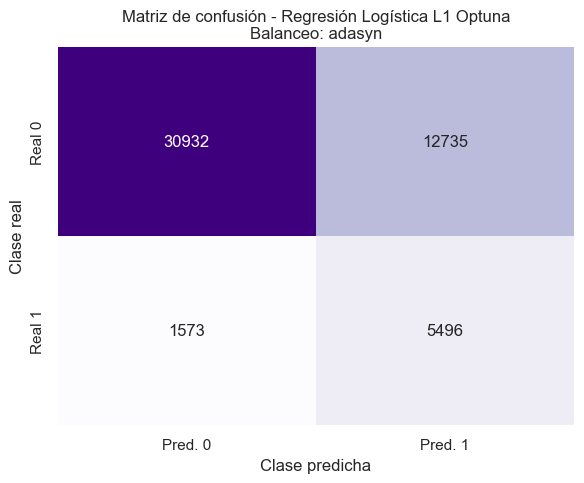

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.71      0.81     43667
Prediabetes/Diabetes       0.30      0.78      0.43      7069

            accuracy                           0.72     50736
           macro avg       0.63      0.74      0.62     50736
        weighted avg       0.86      0.72      0.76     50736



In [145]:
# ============================================================
# Diagnóstico de matriz de confusión - L1 Optuna
# ============================================================

if best_logreg_l1_optuna_result.get("Matriz Confusión") is not None:
    cm_l1_optuna = best_logreg_l1_optuna_result["Matriz Confusión"]
else:
    cm_l1_optuna = confusion_matrix(
        y_test,
        best_logreg_l1_optuna_result["Predicciones"]
    )

tn, fp, fn, tp = cm_l1_optuna.ravel()
n_total = tn + fp + fn + tp

logreg_l1_optuna_diagnostic = pd.DataFrame([{
    "Modelo": "Regresión Logística L1",
    "Método": "Optuna",
    "Balanceo": balanceo_l1_optuna,
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_logreg_l1_optuna_result.get("Test Accuracy"),
    "Test Precision": best_logreg_l1_optuna_result.get("Test Precision"),
    "Test Recall": best_logreg_l1_optuna_result.get("Test Recall"),
    "Test F1": best_logreg_l1_optuna_result.get("Test F1"),
    "Test AUC": best_logreg_l1_optuna_result.get("Test AUC")
}])

display(logreg_l1_optuna_diagnostic.round(4))


# ============================================================
# Matriz de confusión - Regresión Logística L1 Optuna
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_l1_optuna,
    annot=True,
    fmt="d",
    cmap="Purples",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Regresión Logística L1 Optuna\n"
    f"Balanceo: {balanceo_l1_optuna}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_logreg_l1_optuna_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

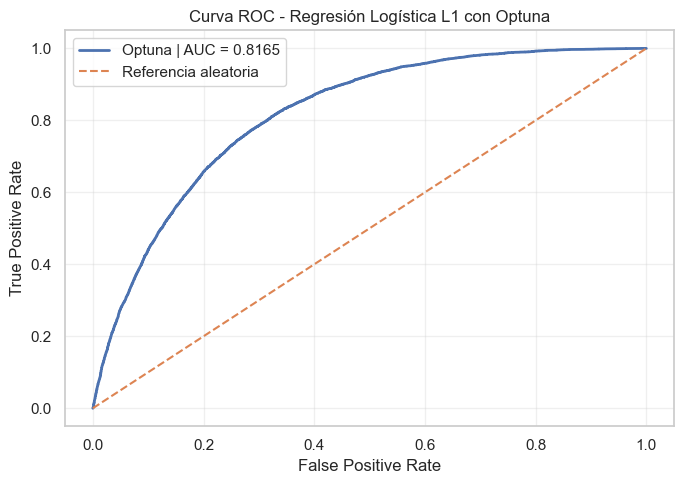

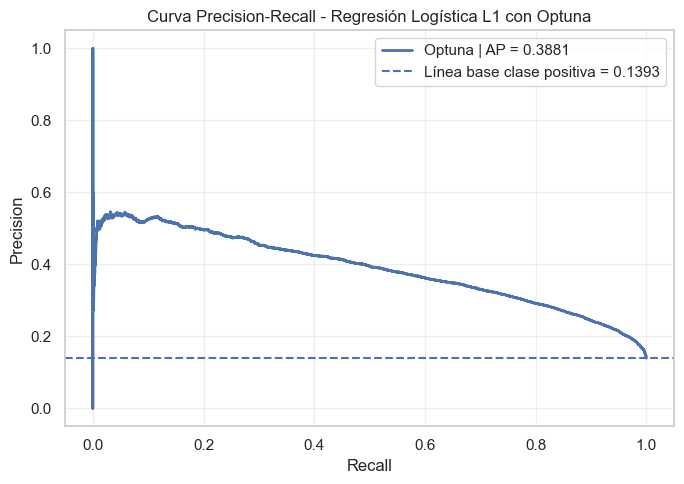

In [146]:
# ============================================================
# Curva ROC - Regresión Logística L1 Optuna
# ============================================================

y_score_l1_optuna = best_logreg_l1_optuna_result.get("Scores")

if y_score_l1_optuna is None:
    print("No hay scores disponibles para graficar la curva ROC.")
else:
    fpr, tpr, _ = roc_curve(y_test, y_score_l1_optuna)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(7, 5))

    plt.plot(
        fpr,
        tpr,
        linewidth=2,
        label=f"Optuna | AUC = {roc_auc:.4f}"
    )

    plt.plot(
        [0, 1],
        [0, 1],
        linestyle="--",
        label="Referencia aleatoria"
    )

    plt.title("Curva ROC - Regresión Logística L1 con Optuna")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


# ============================================================
# Curva Precision-Recall - Regresión Logística L1 Optuna
# ============================================================

if y_score_l1_optuna is None:
    print("No hay scores disponibles para graficar la curva Precision-Recall.")
else:
    precision, recall, _ = precision_recall_curve(y_test, y_score_l1_optuna)
    avg_precision = average_precision_score(y_test, y_score_l1_optuna)
    positive_rate = y_test.mean()

    plt.figure(figsize=(7, 5))

    plt.plot(
        recall,
        precision,
        linewidth=2,
        label=f"Optuna | AP = {avg_precision:.4f}"
    )

    plt.axhline(
        positive_rate,
        linestyle="--",
        label=f"Línea base clase positiva = {positive_rate:.4f}"
    )

    plt.title("Curva Precision-Recall - Regresión Logística L1 con Optuna")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

### Interpretación de Regresión Logística L1 con Optuna

En la Regresión Logística L1 optimizada mediante Optuna, la estrategia de balanceo fue incorporada como parte del espacio de búsqueda junto con el hiperparámetro de regularización `C`. Esto permite que el algoritmo seleccione simultáneamente la técnica de balanceo y la intensidad de regularización que maximizan el recall durante la validación cruzada.

La regularización L1 es especialmente relevante porque puede llevar algunos coeficientes exactamente a cero, funcionando como una forma de selección de variables. Esto permite obtener un modelo más parsimonioso e interpretable, aunque su desempeño debe analizarse junto con precisión, F1-score, AUC y matriz de confusión.

El historial de trials permite observar qué combinaciones fueron más favorables durante la optimización. Si las mejores configuraciones se concentran en una estrategia como `ADASYN` o `class_weight`, esto sugiere que el modelo necesitó una corrección explícita del desbalance para mejorar la detección de la clase positiva.

La matriz de confusión y la curva Precision-Recall son fundamentales para verificar si el aumento del recall se obtiene a costa de un crecimiento excesivo de falsos positivos.

### **19.4 Regresión Logística L1 con DEAP**

In [65]:
# Logistic Regression L1 - DEAP

deap_path_l1 = os.path.join(CHECKPOINT_DIR_L1, "logistic_l1_deap.joblib")

if os.path.exists(deap_path_l1):
    deap_results_logreg_l1 = [joblib.load(deap_path_l1)]
    print("DEAP Logistic L1 ya existe. Se cargó desde checkpoint.")
else:
    deap_results_logreg_l1 = []

    result = run_deap_model(
        model_key="logistic_l1",
        n_population=10,
        n_generations=5
    )

    deap_results_logreg_l1.append(result)
    joblib.dump(result, deap_path_l1)
    print(f"Guardado: {deap_path_l1}")

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_logistic_l1\logistic_l1_deap.joblib


In [91]:
# ============================================================
# Cargar resultado Regresión Logística L1 - DEAP
# ============================================================

from pathlib import Path
import os
import glob
import joblib
import ast
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

CHECKPOINT_DIR_L1 = BASE_DIR / "checkpoints_logistic_l1"

pattern_l1_deap = str(CHECKPOINT_DIR_L1 / "logistic_*_deap.joblib")
matches_l1_deap = glob.glob(pattern_l1_deap)

print("Archivos encontrados:", len(matches_l1_deap))

if len(matches_l1_deap) > 0:
    deap_path_l1 = matches_l1_deap[0]
    deap_loaded_l1 = joblib.load(deap_path_l1)
    print("Resultado Regresión Logística L1 DEAP cargado correctamente.")
else:
    raise FileNotFoundError("No se encontró el checkpoint de Regresión Logística L1 con DEAP.")

# Por si quedó guardado como lista
if isinstance(deap_loaded_l1, list):
    best_logreg_l1_deap_result = deap_loaded_l1[0]
else:
    best_logreg_l1_deap_result = deap_loaded_l1

print("Tipo de objeto:", type(best_logreg_l1_deap_result))

if isinstance(best_logreg_l1_deap_result, dict):
    print("Claves disponibles:")
    print(best_logreg_l1_deap_result.keys())

Archivos encontrados: 1
Resultado Regresión Logística L1 DEAP cargado correctamente.
Tipo de objeto: <class 'dict'>
Claves disponibles:
dict_keys(['Modelo', 'Metodo', 'Balanceo', 'CV Accuracy', 'CV Precision', 'CV Recall', 'CV F1', 'CV AUC', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1', 'Test AUC', 'Tiempo (s)', 'Evaluaciones', 'Best Params', 'Best Estimator', 'Matriz Confusión', 'Predicciones', 'Scores', 'Logbook'])


In [92]:
# ============================================================
# Recuperar mejor individuo DEAP - Regresión Logística L1
# ============================================================

logbook_l1_deap = best_logreg_l1_deap_result.get("Logbook")

if best_logreg_l1_deap_result.get("Best Individual") is None:

    if logbook_l1_deap is not None:

        if isinstance(logbook_l1_deap, pd.DataFrame):
            logbook_l1_deap_df = logbook_l1_deap.copy()
        else:
            logbook_l1_deap_df = pd.DataFrame(logbook_l1_deap)

        if "Best Recall" in logbook_l1_deap_df.columns:
            best_row_l1_deap = logbook_l1_deap_df.sort_values(
                by="Best Recall",
                ascending=False
            ).iloc[0]

            best_logreg_l1_deap_result["Best Individual"] = best_row_l1_deap.get("Best Individual")

print("Best Individual:", best_logreg_l1_deap_result.get("Best Individual"))

Best Individual: [1, 2]


In [93]:
# ============================================================
# Regresión Logística L1 + DEAP: tabla resumen
# ============================================================

best_params_l1_deap = best_logreg_l1_deap_result.get("Best Params")

if isinstance(best_params_l1_deap, str):
    try:
        best_params_l1_deap_dict = ast.literal_eval(best_params_l1_deap)
    except Exception:
        best_params_l1_deap_dict = {}
else:
    best_params_l1_deap_dict = (
        best_params_l1_deap 
        if isinstance(best_params_l1_deap, dict) 
        else {}
    )

balanceo_l1_deap = best_logreg_l1_deap_result.get(
    "Balanceo",
    best_params_l1_deap_dict.get("balance_strategy", "No disponible")
)

logreg_l1_deap_summary = pd.DataFrame([{
    "Modelo": "Regresión Logística L1",
    "Método": "DEAP",
    "Balanceo": balanceo_l1_deap,

    "CV Recall": best_logreg_l1_deap_result.get("CV Recall"),

    "Test Accuracy": best_logreg_l1_deap_result.get("Test Accuracy"),
    "Test Precision": best_logreg_l1_deap_result.get("Test Precision"),
    "Test Recall": best_logreg_l1_deap_result.get("Test Recall"),
    "Test F1": best_logreg_l1_deap_result.get("Test F1"),
    "Test AUC": best_logreg_l1_deap_result.get("Test AUC"),

    "Tiempo (s)": best_logreg_l1_deap_result.get("Tiempo (s)"),
    "Evaluaciones": best_logreg_l1_deap_result.get("Evaluaciones"),
    "Best Params": str(best_params_l1_deap),
    "Best Individual": str(best_logreg_l1_deap_result.get("Best Individual"))
}])

display(logreg_l1_deap_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params,Best Individual
0,Regresión Logística L1,DEAP,adasyn,0.7762,0.7218,0.3049,0.7786,0.4382,0.8165,2619.3104,50,{'C': 0.1},"[1, 2]"


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Regresión Logística L1,DEAP,adasyn,31118,12549,1565,5504,13.9329,35.5822,0.7218,0.3049,0.7786,0.4382,0.8165


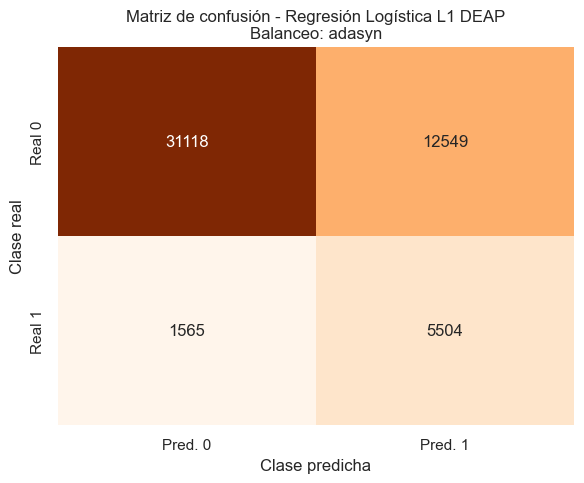

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.71      0.82     43667
Prediabetes/Diabetes       0.30      0.78      0.44      7069

            accuracy                           0.72     50736
           macro avg       0.63      0.75      0.63     50736
        weighted avg       0.86      0.72      0.76     50736



In [150]:
# ============================================================
# Diagnóstico de matriz de confusión - L1 DEAP
# ============================================================

if best_logreg_l1_deap_result.get("Matriz Confusión") is not None:
    cm_l1_deap = best_logreg_l1_deap_result["Matriz Confusión"]
else:
    cm_l1_deap = confusion_matrix(
        y_test,
        best_logreg_l1_deap_result["Predicciones"]
    )

tn, fp, fn, tp = cm_l1_deap.ravel()
n_total = tn + fp + fn + tp

logreg_l1_deap_diagnostic = pd.DataFrame([{
    "Modelo": "Regresión Logística L1",
    "Método": "DEAP",
    "Balanceo": balanceo_l1_deap,
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_logreg_l1_deap_result.get("Test Accuracy"),
    "Test Precision": best_logreg_l1_deap_result.get("Test Precision"),
    "Test Recall": best_logreg_l1_deap_result.get("Test Recall"),
    "Test F1": best_logreg_l1_deap_result.get("Test F1"),
    "Test AUC": best_logreg_l1_deap_result.get("Test AUC")
}])

display(logreg_l1_deap_diagnostic.round(4))


# ============================================================
# Matriz de confusión - Regresión Logística L1 DEAP
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_l1_deap,
    annot=True,
    fmt="d",
    cmap="Oranges",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Regresión Logística L1 DEAP\n"
    f"Balanceo: {balanceo_l1_deap}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_logreg_l1_deap_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

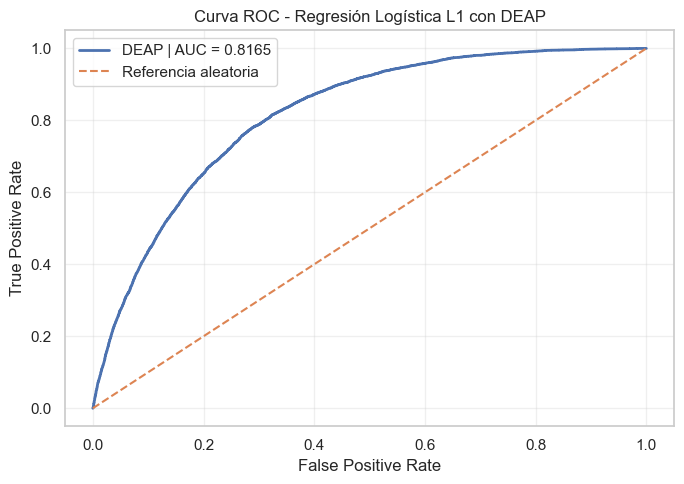

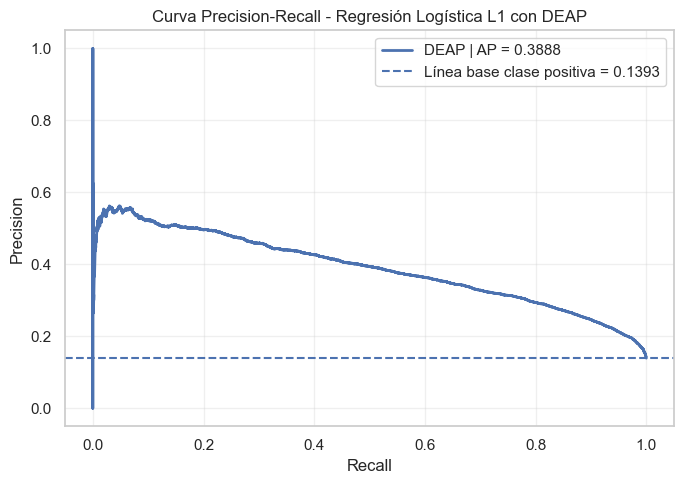

In [151]:
# ============================================================
# Curva ROC - Regresión Logística L1 DEAP
# ============================================================

y_score_l1_deap = best_logreg_l1_deap_result.get("Scores")

if y_score_l1_deap is None:
    print("No hay scores disponibles para graficar la curva ROC.")
else:
    fpr, tpr, _ = roc_curve(y_test, y_score_l1_deap)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(7, 5))

    plt.plot(
        fpr,
        tpr,
        linewidth=2,
        label=f"DEAP | AUC = {roc_auc:.4f}"
    )

    plt.plot(
        [0, 1],
        [0, 1],
        linestyle="--",
        label="Referencia aleatoria"
    )

    plt.title("Curva ROC - Regresión Logística L1 con DEAP")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


# ============================================================
# Curva Precision-Recall - Regresión Logística L1 DEAP
# ============================================================

if y_score_l1_deap is None:
    print("No hay scores disponibles para graficar la curva Precision-Recall.")
else:
    precision, recall, _ = precision_recall_curve(y_test, y_score_l1_deap)
    avg_precision = average_precision_score(y_test, y_score_l1_deap)
    positive_rate = y_test.mean()

    plt.figure(figsize=(7, 5))

    plt.plot(
        recall,
        precision,
        linewidth=2,
        label=f"DEAP | AP = {avg_precision:.4f}"
    )

    plt.axhline(
        positive_rate,
        linestyle="--",
        label=f"Línea base clase positiva = {positive_rate:.4f}"
    )

    plt.title("Curva Precision-Recall - Regresión Logística L1 con DEAP")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [152]:
# ============================================================
# Logbook evolutivo - Regresión Logística L1 DEAP
# ============================================================

logbook_l1_deap = best_logreg_l1_deap_result.get("Logbook")

if logbook_l1_deap is not None:

    if isinstance(logbook_l1_deap, pd.DataFrame):
        logbook_l1_deap_df = logbook_l1_deap.copy()
    else:
        logbook_l1_deap_df = pd.DataFrame(logbook_l1_deap)

    display(logbook_l1_deap_df)
else:
    print("No hay logbook disponible en el resultado guardado.")

,Generacion,Best Recall,Best Individual
0,0,0.765781,"[2, 3]"
1,1,0.765781,"[2, 3]"
2,2,0.776179,"[3, 2]"
3,3,0.776179,"[2, 2]"
4,4,0.776214,"[1, 2]"


### Interpretación de Regresión Logística L1 con DEAP

La Regresión Logística L1 optimizada mediante DEAP fue evaluada mediante un enfoque evolutivo, en el cual cada individuo representa una combinación entre el hiperparámetro de regularización y la estrategia de balanceo. Esto permite que el algoritmo seleccione de forma conjunta la configuración que maximiza el recall promedio durante la validación cruzada.

La regularización L1 resulta relevante porque puede llevar algunos coeficientes a cero, funcionando como una forma de selección de variables. Por esta razón, este modelo no solo busca mejorar el desempeño predictivo, sino también construir una alternativa más parsimoniosa e interpretable.

El resultado final debe analizarse a partir del recall, la precisión, el F1-score, el AUC y la matriz de confusión. En particular, la proporción de positivos predichos permite verificar si el aumento en sensibilidad se obtiene mediante una sobrepredicción excesiva de la clase positiva.

El logbook evolutivo permite observar cómo evolucionó el mejor individuo a través de las generaciones. Si el mejor recall permanece estable, esto puede indicar una convergencia temprana del algoritmo hacia una configuración competitiva.

---

## **20. KNN**

KNN es un algoritmo basado en distancias que no aprende un modelo explícito: en cada predicción recorre todo el conjunto de entrenamiento para encontrar los k vecinos más cercanos. Esto lo hace especialmente sensible al tamaño del dataset, con 202,944 filas, cada evaluación dentro de la validación cruzada puede tardar varios minutos, haciendo que métodos como Grid Search, Random Search, Optuna y DEAP sean computacionalmente prohibitivos en tiempo real. Para resolverlo, se construye una muestra estratificada del 30% del conjunto de entrenamiento, preservando exactamente la proporción original de clases (86% sin diabetes/14% con diabetes). Esto garantiza que los hiperparámetros se optimicen sobre datos representativos del problema real, manteniendo la validez estadística de los resultados.

### **20.1 KNN con Grid Search**

In [ ]:
resultados_gs_knn = optimizar_gridsearch(
    modelo_nombre="KNN",
    estimator=KNeighborsClassifier(n_jobs=-1),
    param_grid=param_grid_knn,
    X_train=X_train_knn,      
    y_train=y_train_knn,     
    cv=cv_knn,
    escalado=True,
    scoring="recall"
)

In [ ]:
gs_knn_df = pd.DataFrame([
    {
        "Balanceo":                round(res.get("Mejor recall CV", 0), 4),
        "Mejor Recall CV":         round(res.get("Mejor recall CV", 0), 4),
        "Std Recall CV":           round(res.get("Std recall CV", 0), 4),
        "Test Accuracy":           round(res["Test Accuracy"], 4),
        "Test Precision":          round(res["Test Precision"], 4),
        "Test Recall":             round(res["Test Recall"], 4),
        "Test F1":                 round(res["Test F1"], 4),
        "Test ROC AUC":            round(res["Test ROC AUC"], 4),
        "Tiempo (s)":              round(res["Tiempo (s)"], 2),
        "Iteraciones":             res["Iteraciones"],
        "Mejores Hiperparámetros": res["Mejores Hiperparámetros"]
    }
    for tecnica, res in resultados_gs_knn.items()
])
 
# Corregir columna Balanceo
gs_knn_df["Balanceo"] = list(resultados_gs_knn.keys())
 
print("── Resumen Grid Search — KNN ──")
display(gs_knn_df)
 
# Mejor técnica por Recall (prioridad) luego F1
mejor_tecnica_gs_knn = max(
    resultados_gs_knn.items(),
    key=lambda x: (x[1]["Test Recall"], x[1]["Test F1"])
)
 
print(f"\n  ★ Mejor balanceo:  {mejor_tecnica_gs_knn[0]}")
print(f"     Test Recall:    {mejor_tecnica_gs_knn[1]['Test Recall']:.4f}")
print(f"     Test F1:        {mejor_tecnica_gs_knn[1]['Test F1']:.4f}")
print(f"     Test ROC AUC:   {mejor_tecnica_gs_knn[1]['Test ROC AUC']:.4f}")
print(f"     Params:         {mejor_tecnica_gs_knn[1]['Mejores Hiperparámetros']}")

In [94]:
import os
import joblib
import pickle
import pandas as pd
import numpy as np

# Ruta de la carpeta donde están los joblibs de KNN
KNN_GRID_DIR = r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Grid_KNN"

# Verificar archivos disponibles
archivos_knn = [
    f for f in os.listdir(KNN_GRID_DIR)
    if f.endswith(".joblib") or f.endswith(".pkl")
]

print("Archivos encontrados:")
for archivo in archivos_knn:
    print("-", archivo)

Archivos encontrados:
- grid_KNN_resultados.pkl
- grid_search_KNN_ADASYN.joblib
- grid_search_KNN_Class Weight.joblib
- grid_search_KNN_Sin Balanceo.joblib
- grid_search_KNN_SMOTE.joblib


In [95]:
import os
import pickle
import pandas as pd
import numpy as np

KNN_GRID_DIR = r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Grid_KNN"

pkl_path = os.path.join(KNN_GRID_DIR, "grid_KNN_resultados.pkl")

with open(pkl_path, "rb") as f:
    resultados_g_knn = pickle.load(f)

print("Archivo cargado correctamente:")
print(pkl_path)
print("\nTipo de objeto:")
print(type(resultados_g_knn))

print("\nClaves principales:")
print(resultados_g_knn.keys())

Archivo cargado correctamente:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Grid_KNN\grid_KNN_resultados.pkl

Tipo de objeto:
<class 'dict'>

Claves principales:
dict_keys(['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight'])


In [96]:
import os
import pickle
import joblib
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsClassifier

KNN_GRID_DIR = r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Grid_KNN"

# 1. Cargar resultados del .pkl
pkl_path = os.path.join(KNN_GRID_DIR, "grid_KNN_resultados.pkl")

with open(pkl_path, "rb") as f:
    resultados_g_knn = pickle.load(f)

# 2. Relacionar balanceo con archivo .joblib
joblib_map = {
    "ADASYN": "grid_search_KNN_ADASYN.joblib",
    "SMOTE": "grid_search_KNN_SMOTE.joblib",
    "Sin Balanceo": "grid_search_KNN_Sin Balanceo.joblib",
    "Class Weight": "grid_search_KNN_Class Weight.joblib"
}

def extraer_params_knn_desde_pipeline(pipeline):
    """
    Busca dentro del pipeline el modelo KNN y extrae solo sus hiperparámetros principales.
    """
    modelo_knn = None

    if hasattr(pipeline, "named_steps"):
        for nombre_paso, paso in pipeline.named_steps.items():
            if isinstance(paso, KNeighborsClassifier):
                modelo_knn = paso
                break

        if modelo_knn is None:
            modelo_knn = list(pipeline.named_steps.values())[-1]

    else:
        modelo_knn = pipeline

    params = {}

    for param in ["n_neighbors", "weights", "metric", "p", "algorithm", "leaf_size"]:
        if hasattr(modelo_knn, param):
            params[param] = getattr(modelo_knn, param)

    return params


# 3. Construir tabla final combinando métricas del pkl + params del joblib
rows = []

for tecnica, res in resultados_g_knn.items():

    best_params = res.get("Mejores hiperparámetros")

    # Si el pkl no tiene hiperparámetros, se extraen del joblib
    if best_params is None and tecnica in joblib_map:
        joblib_path = os.path.join(KNN_GRID_DIR, joblib_map[tecnica])

        if os.path.exists(joblib_path):
            pipeline = joblib.load(joblib_path)
            best_params = extraer_params_knn_desde_pipeline(pipeline)
        else:
            best_params = "No encontrado"

    rows.append({
        "Modelo": "KNN",
        "Método": "Grid Search",
        "Balanceo": tecnica,

        "CV Recall": res.get("Mejor recall CV"),
        "Std Recall CV": res.get("Std recall CV"),

        "Test Accuracy": res.get("Test Accuracy"),
        "Test Precision": res.get("Test Precision"),
        "Test Recall": res.get("Test Recall"),
        "Test F1": res.get("Test F1"),
        "Test AUC": res.get("Test ROC AUC"),

        "Tiempo (s)": res.get("Tiempo (s)"),
        "Evaluaciones": res.get("Iteraciones"),
        "Best Params": str(best_params)
    })

gs_knn_df = pd.DataFrame(rows)

display(
    gs_knn_df
    .sort_values(by="Test Recall", ascending=False)
    .round(4)
)

,Modelo,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
2,KNN,Grid Search,ADASYN,0.8228,0.0035,0.6566,0.2542,0.7577,0.3807,0.7555,444.1726,24,"{'n_neighbors': 15, 'weights': 'uniform', 'met..."
1,KNN,Grid Search,SMOTE,0.7893,0.0050,0.6805,0.2654,0.7314,0.3894,0.7607,476.4612,24,"{'n_neighbors': 15, 'weights': 'uniform', 'met..."
0,KNN,Grid Search,Sin Balanceo,0.3885,0.0020,0.8252,0.3313,0.2498,0.2849,0.6618,266.6819,24,"{'n_neighbors': 3, 'weights': 'distance', 'met..."
3,KNN,Grid Search,Class Weight,0.3885,0.0020,0.8252,0.3313,0.2498,0.2849,0.6618,206.3185,24,"{'n_neighbors': 3, 'weights': 'distance', 'met..."


In [97]:
mejor_idx_knn_grid = gs_knn_df["Test Recall"].idxmax()
mejor_knn_grid = gs_knn_df.loc[mejor_idx_knn_grid]

display(mejor_knn_grid.to_frame().T)

,Modelo,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
2,KNN,Grid Search,ADASYN,0.822822,0.003531,0.656556,0.254224,0.757674,0.380709,0.755458,444.172579,24,"{'n_neighbors': 15, 'weights': 'uniform', 'met..."


In [160]:
# ============================================================
# Selección del mejor KNN con Grid Search
# ============================================================

best_knn_grid_idx = knn_grid_summary["Test Recall"].idxmax()
best_balance_knn_grid = knn_grid_summary.loc[best_knn_grid_idx, "Balanceo"]

best_knn_grid_result = [
    r for r in knn_grid_results
    if r.get("Balanceo") == best_balance_knn_grid
][0]

print("Mejor KNN con Grid Search")
print("=" * 60)
print("Balanceo:", best_knn_grid_result["Balanceo"])
print("Test Accuracy:", round(best_knn_grid_result["Test Accuracy"], 4))
print("Test Precision:", round(best_knn_grid_result["Test Precision"], 4))
print("Test Recall:", round(best_knn_grid_result["Test Recall"], 4))
print("Test F1:", round(best_knn_grid_result["Test F1"], 4))
print("Test AUC:", round(best_knn_grid_result["Test AUC"], 4))
print("Best Params:", best_knn_grid_result["Best Params"])

Mejor KNN con Grid Search
Balanceo: ADASYN
Test Accuracy: 0.6566
Test Precision: 0.2542
Test Recall: 0.7577
Test F1: 0.3807
Test AUC: 0.7555
Best Params: {'modelo__metric': 'euclidean', 'modelo__n_neighbors': 15, 'modelo__weights': 'uniform'}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,KNN,Grid Search,ADASYN,27959,15708,1712,5357,13.9329,41.5188,0.6566,0.2542,0.7577,0.3807,0.7555


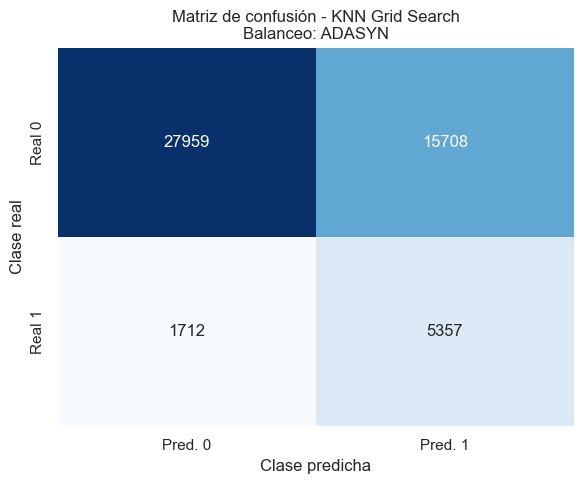

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.94      0.64      0.76     43667
Prediabetes/Diabetes       0.25      0.76      0.38      7069

            accuracy                           0.66     50736
           macro avg       0.60      0.70      0.57     50736
        weighted avg       0.85      0.66      0.71     50736



In [161]:
# ============================================================
# Diagnóstico de matriz de confusión - KNN Grid Search
# ============================================================

cm_knn_grid = best_knn_grid_result["Matriz Confusión"]
tn, fp, fn, tp = cm_knn_grid.ravel()

n_total = tn + fp + fn + tp

knn_grid_diagnostic = pd.DataFrame([{
    "Modelo": best_knn_grid_result["Modelo"],
    "Método": best_knn_grid_result["Método"],
    "Balanceo": best_knn_grid_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_knn_grid_result["Test Accuracy"],
    "Test Precision": best_knn_grid_result["Test Precision"],
    "Test Recall": best_knn_grid_result["Test Recall"],
    "Test F1": best_knn_grid_result["Test F1"],
    "Test AUC": best_knn_grid_result["Test AUC"]
}])

display(knn_grid_diagnostic.round(4))


# ============================================================
# Matriz de confusión - KNN Grid Search
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_knn_grid,
    annot=True,
    fmt="d",
    cmap="Blues",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - KNN Grid Search\n"
    f"Balanceo: {best_knn_grid_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_knn_grid_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

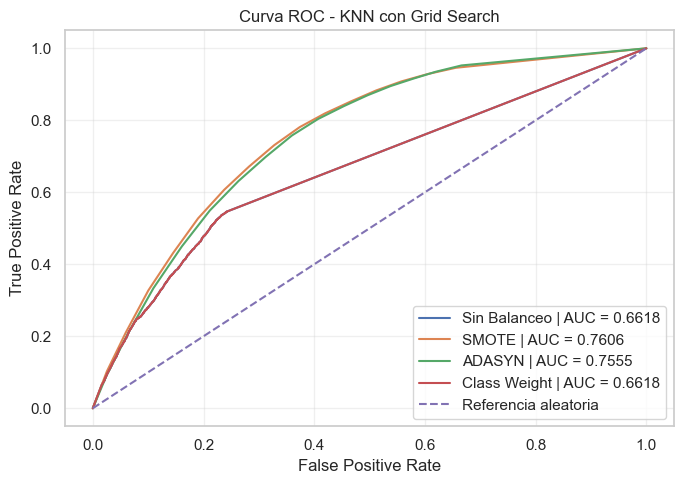

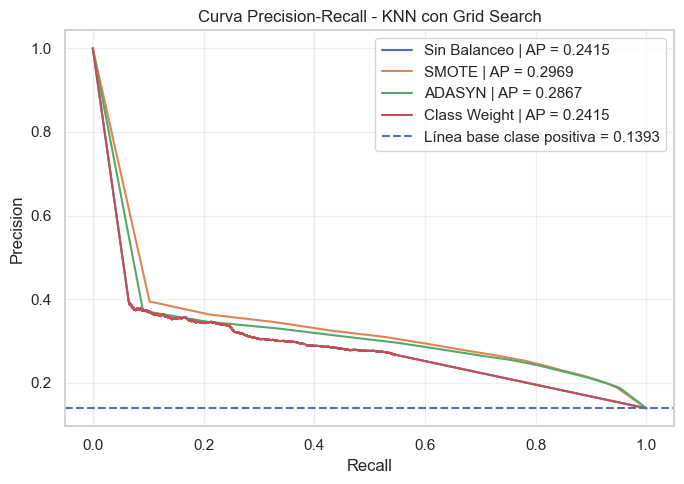

In [162]:
# ============================================================
# Curva ROC - KNN Grid Search
# ============================================================

plt.figure(figsize=(7, 5))

for result in knn_grid_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - KNN con Grid Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()



# ============================================================
# Curva Precision-Recall - KNN Grid Search
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in knn_grid_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - KNN con Grid Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de KNN con Grid Search

En KNN optimizado mediante Grid Search se integraron los resultados generados previamente por una compañera del equipo. Dado que esta implementación utilizó funciones y una estructura de almacenamiento diferente a la del resto del notebook, los resultados fueron cargados desde archivos `.pkl` y `.joblib`, y posteriormente adaptados al formato general del proyecto para permitir su comparación con los demás modelos.

El mejor resultado según recall en prueba se obtuvo con la estrategia ADASYN. Este comportamiento indica que el remuestreo adaptativo permitió mejorar la identificación de casos positivos asociados a prediabetes o diabetes. Sin embargo, la precisión y el F1-score deben analizarse conjuntamente, ya que un aumento del recall puede venir acompañado de una mayor cantidad de falsos positivos.

La matriz de confusión permite evaluar directamente este balance entre verdaderos positivos, falsos negativos y falsos positivos. Por su parte, las curvas ROC y Precision-Recall complementan el análisis del modelo. En particular, la curva Precision-Recall es especialmente relevante en este problema debido al desbalance de clases.

### **20.2 KNN con Random Search**

In [ ]:
param_dist_knn = {
    "modelo__n_neighbors": list(range(3, 22, 2)),   
    "modelo__weights":     ["uniform", "distance"],
    "modelo__metric":      ["euclidean", "manhattan", "minkowski"]
}
 
resultados_rs_knn = optimizar_randomsearch(
    modelo_nombre="KNN",
    estimator=KNeighborsClassifier(n_jobs=-1),
    param_distributions=param_dist_knn,
    X_train=X_train_knn,      
    y_train=y_train_knn,      
    cv=cv_knn,
    escalado=True,
    scoring="recall",
    n_iter=30
)

In [98]:
# ============================================================
# Cargar archivos KNN - Random Search
# ============================================================

import os
import pickle
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

KNN_RANDOM_DIR = (
    BASE_DIR 
    / "machineentrega2" 
    / "Modelos_Optimizados_No_Computacional" 
    / "Random_KNN"
)

print("Ruta KNN Random Search:")
print(KNN_RANDOM_DIR)
print("Existe:", KNN_RANDOM_DIR.exists())

# Archivos disponibles
archivos_knn_random = os.listdir(KNN_RANDOM_DIR)

print("\nArchivos encontrados:")
for archivo in archivos_knn_random:
    print("-", archivo)

# ------------------------------------------------------------
# 1. Cargar archivo .pkl con resultados generales
# ------------------------------------------------------------

pkl_files_random_knn = [
    f for f in archivos_knn_random
    if f.endswith(".pkl")
]

if len(pkl_files_random_knn) == 0:
    raise FileNotFoundError("No se encontró ningún archivo .pkl para KNN Random Search.")

pkl_path_random_knn = KNN_RANDOM_DIR / pkl_files_random_knn[0]

with open(pkl_path_random_knn, "rb") as f:
    resultados_random_knn = pickle.load(f)

print("\nArchivo .pkl cargado correctamente:")
print(pkl_path_random_knn)

print("\nClaves principales del .pkl:")
print(resultados_random_knn.keys())

# ------------------------------------------------------------
# 2. Identificar archivos .joblib
# ------------------------------------------------------------

joblib_files_random_knn = [
    f for f in archivos_knn_random
    if f.endswith(".joblib")
]

print("\nArchivos .joblib encontrados:")
for f in joblib_files_random_knn:
    print("-", f)

# ------------------------------------------------------------
# 3. Relacionar cada técnica de balanceo con su joblib
# ------------------------------------------------------------

def normalizar_texto(texto):
    return (
        str(texto)
        .lower()
        .replace(" ", "")
        .replace("_", "")
        .replace("-", "")
    )


def encontrar_joblib_por_balance(balanceo, joblib_files):
    balance_norm = normalizar_texto(balanceo)

    patrones_balanceo = {
        "sinbalanceo": ["sinbalanceo", "none", "nobalance", "sin"],
        "none": ["sinbalanceo", "none", "nobalance", "sin"],
        "smote": ["smote"],
        "adasyn": ["adasyn"],
        "classweight": ["classweight", "class", "weight"]
    }

    patrones = patrones_balanceo.get(balance_norm, [balance_norm])

    for file in joblib_files:
        file_norm = normalizar_texto(file)

        if any(patron in file_norm for patron in patrones):
            return file

    return None


joblib_map_random_knn = {}

for balanceo in resultados_random_knn.keys():
    archivo_encontrado = encontrar_joblib_por_balance(
        balanceo,
        joblib_files_random_knn
    )

    joblib_map_random_knn[balanceo] = archivo_encontrado

print("\nMapa balanceo → joblib:")
for balanceo, archivo in joblib_map_random_knn.items():
    print(f"{balanceo}: {archivo}")

Ruta KNN Random Search:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Random_KNN
Existe: True

Archivos encontrados:
- random_KNN_resultados.pkl
- random_search_KNN_ADASYN.joblib
- random_search_KNN_Class Weight.joblib
- random_search_KNN_Sin Balanceo.joblib
- random_search_KNN_SMOTE.joblib

Archivo .pkl cargado correctamente:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Random_KNN\random_KNN_resultados.pkl

Claves principales del .pkl:
dict_keys(['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight'])

Archivos .joblib encontrados:
- random_search_KNN_ADASYN.joblib
- random_search_KNN_Class Weight.joblib
- random_search_KNN_Sin Balanceo.joblib
- random_search_KNN_SMOTE.joblib

Mapa balanceo → joblib:
Sin Balanceo: random_search_KNN_Sin Balanceo.joblib
SMOTE: random_search_KNN_SMOTE.joblib
ADASYN: random_search_KN

In [99]:
# ============================================================
# KNN Random Search: recuperar predicciones, scores y matrices
# ============================================================

knn_random_results = []

for balanceo, res in resultados_random_knn.items():

    joblib_file = joblib_map_random_knn.get(balanceo)

    if joblib_file is None:
        print(f"No se encontró joblib para balanceo: {balanceo}")
        continue

    joblib_path = KNN_RANDOM_DIR / joblib_file

    pipeline_knn_random = joblib.load(joblib_path)

    # Predicción sobre test
    y_pred_knn_random = pipeline_knn_random.predict(X_test)

    # Scores para ROC y PR
    if hasattr(pipeline_knn_random, "predict_proba"):
        y_score_knn_random = pipeline_knn_random.predict_proba(X_test)

        if len(y_score_knn_random.shape) == 2:
            y_score_knn_random = y_score_knn_random[:, 1]

    elif hasattr(pipeline_knn_random, "decision_function"):
        y_score_knn_random = pipeline_knn_random.decision_function(X_test)

    else:
        y_score_knn_random = y_pred_knn_random

    cm_knn_random = confusion_matrix(y_test, y_pred_knn_random)

    knn_random_results.append({
        "Modelo": "KNN",
        "Método": "Random Search",
        "Balanceo": balanceo,

        "CV Recall": res.get("Mejor recall CV"),
        "Std Recall CV": res.get("Std recall CV"),

        "Test Accuracy": res.get("Test Accuracy"),
        "Test Precision": res.get("Test Precision"),
        "Test Recall": res.get("Test Recall"),
        "Test F1": res.get("Test F1"),
        "Test AUC": res.get("Test ROC AUC"),

        "Tiempo (s)": res.get("Tiempo (s)"),
        "Evaluaciones": res.get("Iteraciones"),
        "Best Params": str(res.get("Mejores Hiperparámetros")),

        "Best Estimator": pipeline_knn_random,
        "Predicciones": y_pred_knn_random,
        "Scores": y_score_knn_random,
        "Matriz Confusión": cm_knn_random,
        "Fuente": str(joblib_path)
    })

print(f"Resultados KNN Random Search enriquecidos: {len(knn_random_results)}")

Resultados KNN Random Search enriquecidos: 4


In [100]:
# ============================================================
# KNN Random Search: tabla resumen final
# ============================================================

knn_random_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Método"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),
        "Std Recall CV": r.get("Std Recall CV"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": r.get("Best Params")
    }
    for r in knn_random_results
])

knn_random_summary = knn_random_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(knn_random_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
2,KNN,Random Search,ADASYN,0.8389,0.0044,0.6484,0.2535,0.7831,0.3830,0.7660,519.6288,30,"{'modelo__weights': 'uniform', 'modelo__n_neig..."
1,KNN,Random Search,SMOTE,0.8093,0.0035,0.6837,0.2692,0.7407,0.3948,0.7689,365.4604,30,"{'modelo__weights': 'distance', 'modelo__n_nei..."
0,KNN,Random Search,Sin Balanceo,0.3618,0.0011,0.8391,0.3685,0.2164,0.2727,0.7014,235.5315,30,"{'modelo__weights': 'distance', 'modelo__n_nei..."
3,KNN,Random Search,Class Weight,0.3618,0.0011,0.8391,0.3685,0.2164,0.2727,0.7014,177.4707,30,"{'modelo__weights': 'distance', 'modelo__n_nei..."


In [168]:
# ============================================================
# Selección del mejor KNN con Random Search
# ============================================================

best_knn_random_idx = knn_random_summary["Test Recall"].idxmax()
best_balance_knn_random = knn_random_summary.loc[best_knn_random_idx, "Balanceo"]

best_knn_random_result = [
    r for r in knn_random_results
    if r.get("Balanceo") == best_balance_knn_random
][0]

print("Mejor KNN con Random Search")
print("=" * 60)
print("Balanceo:", best_knn_random_result["Balanceo"])
print("Test Accuracy:", round(best_knn_random_result["Test Accuracy"], 4))
print("Test Precision:", round(best_knn_random_result["Test Precision"], 4))
print("Test Recall:", round(best_knn_random_result["Test Recall"], 4))
print("Test F1:", round(best_knn_random_result["Test F1"], 4))
print("Test AUC:", round(best_knn_random_result["Test AUC"], 4))
print("Best Params:", best_knn_random_result["Best Params"])

Mejor KNN con Random Search
Balanceo: ADASYN
Test Accuracy: 0.6484
Test Precision: 0.2535
Test Recall: 0.7831
Test F1: 0.383
Test AUC: 0.766
Best Params: {'modelo__weights': 'uniform', 'modelo__n_neighbors': 21, 'modelo__metric': 'minkowski'}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,KNN,Random Search,ADASYN,27363,16304,1532,5537,13.9329,43.0483,0.6484,0.2535,0.7831,0.383,0.766


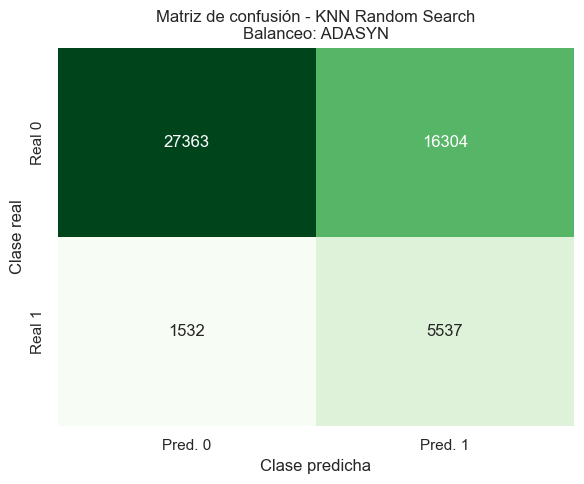

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.63      0.75     43667
Prediabetes/Diabetes       0.25      0.78      0.38      7069

            accuracy                           0.65     50736
           macro avg       0.60      0.70      0.57     50736
        weighted avg       0.85      0.65      0.70     50736



In [171]:
# ============================================================
# Diagnóstico de matriz de confusión - KNN Random Search
# ============================================================

cm_knn_random = best_knn_random_result["Matriz Confusión"]
tn, fp, fn, tp = cm_knn_random.ravel()

n_total = tn + fp + fn + tp

knn_random_diagnostic = pd.DataFrame([{
    "Modelo": best_knn_random_result["Modelo"],
    "Método": best_knn_random_result["Método"],
    "Balanceo": best_knn_random_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_knn_random_result["Test Accuracy"],
    "Test Precision": best_knn_random_result["Test Precision"],
    "Test Recall": best_knn_random_result["Test Recall"],
    "Test F1": best_knn_random_result["Test F1"],
    "Test AUC": best_knn_random_result["Test AUC"]
}])

display(knn_random_diagnostic.round(4))

# ============================================================
# Matriz de confusión - KNN Random Search
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_knn_random,
    annot=True,
    fmt="d",
    cmap="Greens",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - KNN Random Search\n"
    f"Balanceo: {best_knn_random_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_knn_random_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

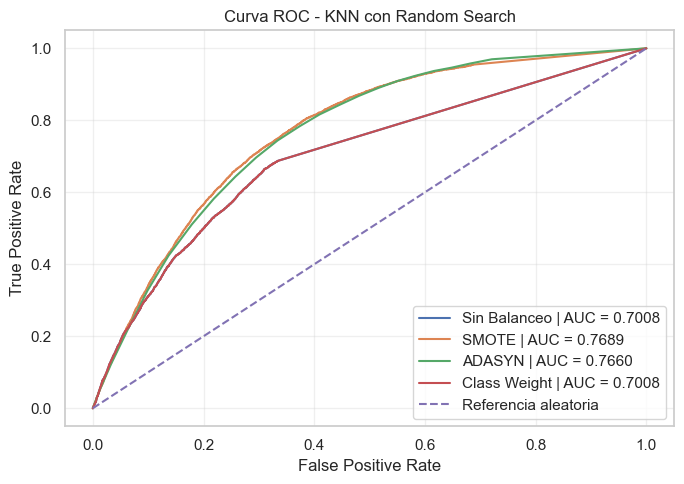

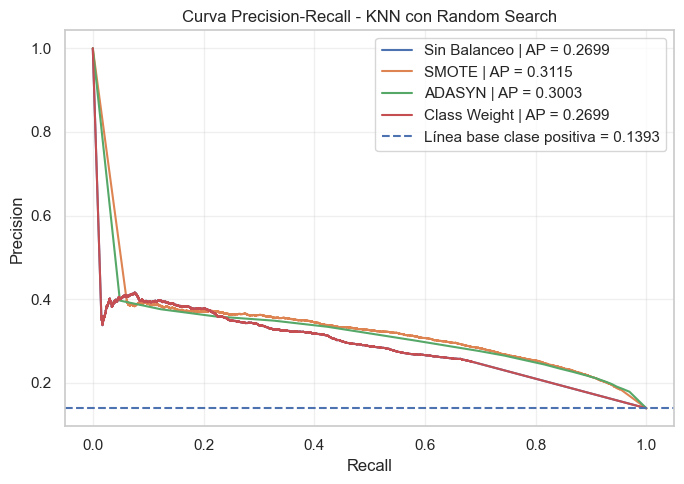

In [172]:
# ============================================================
# Curva ROC - KNN Random Search
# ============================================================

plt.figure(figsize=(7, 5))

for result in knn_random_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - KNN con Random Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - KNN Random Search
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in knn_random_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - KNN con Random Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de KNN con Random Search

En KNN optimizado mediante Random Search se integraron resultados generados previamente por una implementación externa del equipo. Dado que esta implementación utilizó una estructura distinta a la del resto del notebook, los resultados fueron cargados desde archivos `.pkl` y `.joblib`, y posteriormente adaptados al formato general del proyecto.

Random Search permite explorar combinaciones aleatorias de hiperparámetros, como el número de vecinos, la métrica de distancia y el tipo de ponderación de los vecinos. Esta estrategia reduce el costo computacional frente a una búsqueda exhaustiva, especialmente en modelos como KNN, donde el entrenamiento y la predicción pueden ser costosos con conjuntos de datos grandes.

El mejor resultado se seleccionó con base en el recall sobre el conjunto de prueba. La matriz de confusión permite observar si la mejora en sensibilidad se obtiene reduciendo falsos negativos o aumentando falsos positivos. Las curvas ROC y Precision-Recall complementan el análisis del desempeño, siendo la curva Precision-Recall especialmente importante debido al desbalance de clases del problema.

### **20.3 KNN con Optuna**

In [ ]:
def knn_factory(params):
    return KNeighborsClassifier(
        n_neighbors=params["n_neighbors"],
        weights=params["weights"],
        metric=params["metric"],
        n_jobs=-1
    )
 
resultados_op_knn = optimizar_optuna(
    modelo_nombre="KNN",
    estimator=KNeighborsClassifier(),   # solo para identificar el tipo
    model_factory=knn_factory,
    X_train=X_train_knn,                # muestra 30%
    y_train=y_train_knn,                # muestra 30%
    cv=cv_knn,
    escalado=True,
    n_trials=30,
    scoring="recall"
)

In [101]:
# ============================================================
# Cargar archivos KNN - Optuna
# ============================================================

import os
import glob
import pickle
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

KNN_OPTUNA_DIR = (
    BASE_DIR 
    / "machineentrega2" 
    / "Modelos_Optimizados_No_Computacional" 
    / "Optuna_KNN"
)

print("Ruta KNN Optuna:")
print(KNN_OPTUNA_DIR)
print("Existe:", KNN_OPTUNA_DIR.exists())

archivos_knn_optuna = os.listdir(KNN_OPTUNA_DIR)

print("\nArchivos encontrados:")
for archivo in archivos_knn_optuna:
    print("-", archivo)

# ------------------------------------------------------------
# Cargar archivo .pkl con resultados generales
# ------------------------------------------------------------

pkl_files_knn_optuna = [
    f for f in archivos_knn_optuna
    if f.endswith(".pkl")
]

if len(pkl_files_knn_optuna) == 0:
    raise FileNotFoundError("No se encontró ningún archivo .pkl para KNN Optuna.")

pkl_path_knn_optuna = KNN_OPTUNA_DIR / pkl_files_knn_optuna[0]

with open(pkl_path_knn_optuna, "rb") as f:
    resultados_optuna_knn = pickle.load(f)

print("\nArchivo .pkl cargado correctamente:")
print(pkl_path_knn_optuna)

print("\nTipo de objeto:")
print(type(resultados_optuna_knn))

if isinstance(resultados_optuna_knn, dict):
    print("\nClaves principales:")
    print(resultados_optuna_knn.keys())

# ------------------------------------------------------------
# Identificar archivos .joblib
# ------------------------------------------------------------

joblib_files_knn_optuna = [
    f for f in archivos_knn_optuna
    if f.endswith(".joblib")
]

print("\nArchivos .joblib encontrados:")
for f in joblib_files_knn_optuna:
    print("-", f)

Ruta KNN Optuna:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Optuna_KNN
Existe: True

Archivos encontrados:
- optuna_KNN_ADASYN.joblib
- optuna_KNN_ADASYN_study.joblib
- optuna_KNN_Class Weight.joblib
- optuna_KNN_Class Weight_study.joblib
- optuna_KNN_resultados.pkl
- optuna_KNN_Sin Balanceo.joblib
- optuna_KNN_Sin Balanceo_study.joblib
- optuna_KNN_SMOTE.joblib
- optuna_KNN_SMOTE_study.joblib

Archivo .pkl cargado correctamente:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Optuna_KNN\optuna_KNN_resultados.pkl

Tipo de objeto:
<class 'dict'>

Claves principales:
dict_keys(['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight'])

Archivos .joblib encontrados:
- optuna_KNN_ADASYN.joblib
- optuna_KNN_ADASYN_study.joblib
- optuna_KNN_Class Weight.joblib
- optuna_KNN_Class Weight_study.joblib
- optuna_KNN_Sin Balanc

In [102]:
# ============================================================
# Relacionar estrategias de balanceo con archivos joblib
# ============================================================

def normalizar_texto(texto):
    return (
        str(texto)
        .lower()
        .replace(" ", "")
        .replace("_", "")
        .replace("-", "")
    )


def encontrar_joblib_por_balance(balanceo, joblib_files):
    balance_norm = normalizar_texto(balanceo)

    patrones_balanceo = {
        "sinbalanceo": ["sinbalanceo", "none", "nobalance", "sin"],
        "none": ["sinbalanceo", "none", "nobalance", "sin"],
        "smote": ["smote"],
        "adasyn": ["adasyn"],
        "classweight": ["classweight", "class", "weight"]
    }

    patrones = patrones_balanceo.get(balance_norm, [balance_norm])

    for file in joblib_files:
        file_norm = normalizar_texto(file)

        if any(patron in file_norm for patron in patrones):
            return file

    return None


joblib_map_optuna_knn = {}

for balanceo in resultados_optuna_knn.keys():
    archivo_encontrado = encontrar_joblib_por_balance(
        balanceo,
        joblib_files_knn_optuna
    )

    joblib_map_optuna_knn[balanceo] = archivo_encontrado

print("\nMapa balanceo → joblib:")
for balanceo, archivo in joblib_map_optuna_knn.items():
    print(f"{balanceo}: {archivo}")


Mapa balanceo → joblib:
Sin Balanceo: optuna_KNN_Sin Balanceo.joblib
SMOTE: optuna_KNN_SMOTE.joblib
ADASYN: optuna_KNN_ADASYN.joblib
Class Weight: optuna_KNN_Class Weight.joblib


In [103]:
# ============================================================
# KNN Optuna: recuperar predicciones, scores y matrices
# ============================================================

knn_optuna_results = []

for balanceo, res in resultados_optuna_knn.items():

    joblib_file = joblib_map_optuna_knn.get(balanceo)

    if joblib_file is None:
        print(f"No se encontró joblib para balanceo: {balanceo}")
        continue

    joblib_path = KNN_OPTUNA_DIR / joblib_file

    pipeline_knn_optuna = joblib.load(joblib_path)

    y_pred_knn_optuna = pipeline_knn_optuna.predict(X_test)

    if hasattr(pipeline_knn_optuna, "predict_proba"):
        y_score_knn_optuna = pipeline_knn_optuna.predict_proba(X_test)

        if len(y_score_knn_optuna.shape) == 2:
            y_score_knn_optuna = y_score_knn_optuna[:, 1]

    elif hasattr(pipeline_knn_optuna, "decision_function"):
        y_score_knn_optuna = pipeline_knn_optuna.decision_function(X_test)

    else:
        y_score_knn_optuna = y_pred_knn_optuna

    cm_knn_optuna = confusion_matrix(y_test, y_pred_knn_optuna)

    knn_optuna_results.append({
        "Modelo": "KNN",
        "Método": "Optuna",
        "Balanceo": balanceo,

        "CV Recall": res.get("Mejor recall CV"),
        "Std Recall CV": res.get("Std recall CV"),

        "Test Accuracy": res.get("Test Accuracy"),
        "Test Precision": res.get("Test Precision"),
        "Test Recall": res.get("Test Recall"),
        "Test F1": res.get("Test F1"),
        "Test AUC": res.get("Test ROC AUC"),

        "Tiempo (s)": res.get("Tiempo (s)"),
        "Evaluaciones": res.get("Iteraciones"),
        "Best Params": str(res.get("Mejores Hiperparámetros")),

        "Best Estimator": pipeline_knn_optuna,
        "Predicciones": y_pred_knn_optuna,
        "Scores": y_score_knn_optuna,
        "Matriz Confusión": cm_knn_optuna,
        "Fuente": str(joblib_path),

        "Study": res.get("Study", res.get("study"))
    })

print(f"Resultados KNN Optuna enriquecidos: {len(knn_optuna_results)}")

Resultados KNN Optuna enriquecidos: 4


In [104]:
# ============================================================
# KNN Optuna: tabla resumen final
# ============================================================

knn_optuna_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Método"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),
        "Std Recall CV": r.get("Std Recall CV"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": r.get("Best Params")
    }
    for r in knn_optuna_results
])

knn_optuna_summary = knn_optuna_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(knn_optuna_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
2,KNN,Optuna,ADASYN,0.8518,None,0.6556,0.2586,0.7885,0.3895,0.7711,465.0936,30,"{'n_neighbors': 29, 'weights': 'distance', 'me..."
1,KNN,Optuna,SMOTE,0.8260,None,0.6784,0.2688,0.7604,0.3972,0.7763,455.5846,30,"{'n_neighbors': 29, 'weights': 'distance', 'me..."
0,KNN,Optuna,Sin Balanceo,0.3885,None,0.8252,0.3313,0.2498,0.2849,0.6618,293.0784,30,"{'n_neighbors': 3, 'weights': 'distance', 'met..."
3,KNN,Optuna,Class Weight,0.3885,None,0.8252,0.3313,0.2498,0.2849,0.6618,218.0049,30,"{'n_neighbors': 3, 'weights': 'distance', 'met..."


In [181]:
# ============================================================
# Selección del mejor KNN con Optuna
# ============================================================

best_knn_optuna_idx = knn_optuna_summary["Test Recall"].idxmax()
best_balance_knn_optuna = knn_optuna_summary.loc[best_knn_optuna_idx, "Balanceo"]

best_knn_optuna_result = [
    r for r in knn_optuna_results
    if r.get("Balanceo") == best_balance_knn_optuna
][0]

print("Mejor KNN con Optuna")
print("=" * 60)
print("Balanceo:", best_knn_optuna_result["Balanceo"])
print("Test Accuracy:", round(best_knn_optuna_result["Test Accuracy"], 4))
print("Test Precision:", round(best_knn_optuna_result["Test Precision"], 4))
print("Test Recall:", round(best_knn_optuna_result["Test Recall"], 4))
print("Test F1:", round(best_knn_optuna_result["Test F1"], 4))
print("Test AUC:", round(best_knn_optuna_result["Test AUC"], 4))
print("Best Params:", best_knn_optuna_result["Best Params"])

Mejor KNN con Optuna
Balanceo: ADASYN
Test Accuracy: 0.6556
Test Precision: 0.2586
Test Recall: 0.7885
Test F1: 0.3895
Test AUC: 0.7711
Best Params: {'n_neighbors': 29, 'weights': 'distance', 'metric': 'minkowski'}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,KNN,Optuna,ADASYN,27695,15972,1496,5573,13.9329,42.4649,0.6556,0.2586,0.7885,0.3895,0.7711


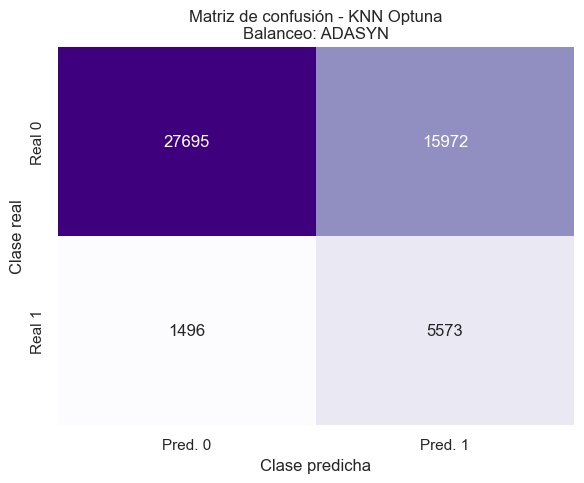

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.63      0.76     43667
Prediabetes/Diabetes       0.26      0.79      0.39      7069

            accuracy                           0.66     50736
           macro avg       0.60      0.71      0.57     50736
        weighted avg       0.85      0.66      0.71     50736



In [183]:
# ============================================================
# Diagnóstico de matriz de confusión - KNN Optuna
# ============================================================

cm_knn_optuna = best_knn_optuna_result["Matriz Confusión"]
tn, fp, fn, tp = cm_knn_optuna.ravel()

n_total = tn + fp + fn + tp

knn_optuna_diagnostic = pd.DataFrame([{
    "Modelo": best_knn_optuna_result["Modelo"],
    "Método": best_knn_optuna_result["Método"],
    "Balanceo": best_knn_optuna_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_knn_optuna_result["Test Accuracy"],
    "Test Precision": best_knn_optuna_result["Test Precision"],
    "Test Recall": best_knn_optuna_result["Test Recall"],
    "Test F1": best_knn_optuna_result["Test F1"],
    "Test AUC": best_knn_optuna_result["Test AUC"]
}])

display(knn_optuna_diagnostic.round(4))

# ============================================================
# Matriz de confusión - KNN Optuna
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_knn_optuna,
    annot=True,
    fmt="d",
    cmap="Purples",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - KNN Optuna\n"
    f"Balanceo: {best_knn_optuna_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_knn_optuna_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

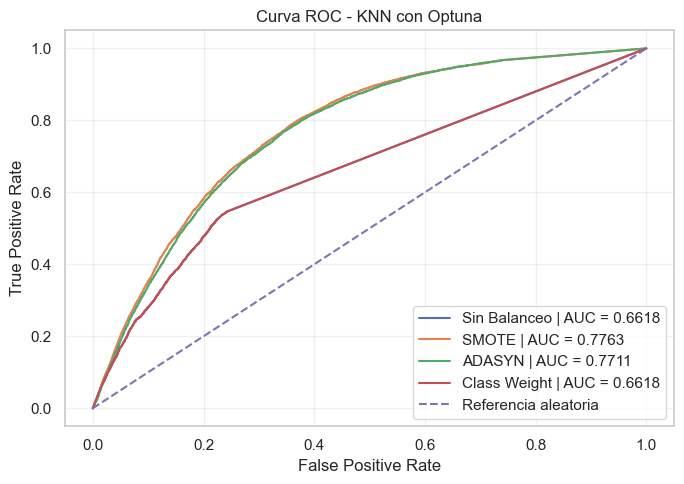

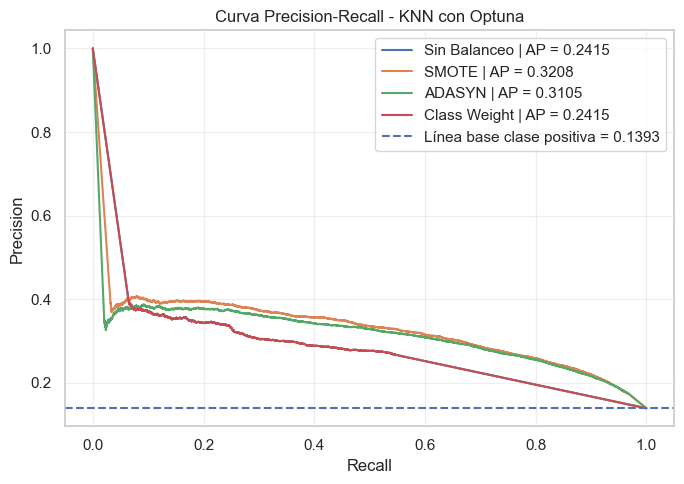

In [184]:
# ============================================================
# Curva ROC - KNN Optuna
# ============================================================

plt.figure(figsize=(7, 5))

for result in knn_optuna_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - KNN con Optuna")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ============================================================
# Curva Precision-Recall - KNN Optuna
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in knn_optuna_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - KNN con Optuna")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de KNN con Optuna

En KNN optimizado mediante Optuna se integraron los resultados generados previamente por una implementación externa del equipo. Dado que esta implementación utilizó una estructura distinta a la del resto del notebook, los resultados fueron cargados desde archivos `.pkl` y `.joblib`, y posteriormente adaptados al formato general del proyecto.

Optuna permite explorar de manera dirigida el espacio de hiperparámetros del modelo, ajustando configuraciones como el número de vecinos, la métrica de distancia y el esquema de ponderación. A diferencia de Random Search, la búsqueda no es completamente aleatoria, sino que utiliza la información de ensayos anteriores para proponer combinaciones potencialmente mejores.

El mejor resultado se seleccionó con base en el recall sobre el conjunto de prueba, en coherencia con el objetivo del proyecto. Sin embargo, este resultado debe analizarse junto con la precisión, el F1-score, el AUC y la matriz de confusión para verificar si el aumento en sensibilidad no se obtiene mediante una sobrepredicción excesiva de la clase positiva.

Las curvas ROC y Precision-Recall complementan la evaluación. La curva Precision-Recall es especialmente relevante en este problema debido al desbalance de clases.

### **20.4 KNN con DEAP**

In [ ]:
espacio_knn = {
    "n_neighbors": list(range(3, 22, 2)),   # [3, 5, 7, ..., 21]
    "weights":     ["uniform", "distance"],
    "metric":      ["euclidean", "manhattan", "minkowski"]
}
 
resultados_deap_knn = optimizar_deap(
    modelo_nombre="KNN",
    estimator=KNeighborsClassifier(),       # referencia de tipo
    model_factory=knn_factory,              # misma factory de Optuna
    espacio=espacio_knn,
    X_train=X_train_knn,                    # muestra 30%
    y_train=y_train_knn,                    # muestra 30%
    cv=cv_knn,
    escalado=True,
    n_generaciones=5,
    tam_poblacion=20,
    scoring="recall"
)

In [105]:
# ============================================================
# Cargar archivos KNN - DEAP
# ============================================================

import os
import glob
import pickle
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

KNN_DEAP_DIR = (
    BASE_DIR 
    / "machineentrega2" 
    / "Modelos_Optimizados_No_Computacional" 
    / "DEAP_KNN"
)

print("Ruta KNN DEAP:")
print(KNN_DEAP_DIR)
print("Existe:", KNN_DEAP_DIR.exists())

archivos_knn_deap = os.listdir(KNN_DEAP_DIR)

print("\nArchivos encontrados:")
for archivo in archivos_knn_deap:
    print("-", archivo)

# ------------------------------------------------------------
# Cargar archivo .pkl con resultados generales
# ------------------------------------------------------------

pkl_files_knn_deap = [
    f for f in archivos_knn_deap
    if f.endswith(".pkl")
]

if len(pkl_files_knn_deap) == 0:
    raise FileNotFoundError("No se encontró ningún archivo .pkl para KNN DEAP.")

pkl_path_knn_deap = KNN_DEAP_DIR / pkl_files_knn_deap[0]

with open(pkl_path_knn_deap, "rb") as f:
    resultados_deap_knn_raw = pickle.load(f)

print("\nArchivo .pkl cargado correctamente:")
print(pkl_path_knn_deap)

print("\nTipo de objeto:")
print(type(resultados_deap_knn_raw))

# Si el pkl trae un único resultado, se adapta a formato diccionario por técnica
if isinstance(resultados_deap_knn_raw, dict) and "Test Recall" in resultados_deap_knn_raw:
    resultados_deap_knn = {"DEAP": resultados_deap_knn_raw}
else:
    resultados_deap_knn = resultados_deap_knn_raw

print("\nClaves principales:")
print(resultados_deap_knn.keys())

# ------------------------------------------------------------
# Identificar archivos .joblib
# ------------------------------------------------------------

joblib_files_knn_deap = [
    f for f in archivos_knn_deap
    if f.endswith(".joblib")
]

print("\nArchivos .joblib encontrados:")
for f in joblib_files_knn_deap:
    print("-", f)

Ruta KNN DEAP:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\DEAP_KNN
Existe: True

Archivos encontrados:
- deap_KNN_ADASYN.joblib
- deap_KNN_Class Weight.joblib
- deap_KNN_resultados.pkl
- deap_KNN_Sin Balanceo.joblib
- deap_KNN_SMOTE.joblib

Archivo .pkl cargado correctamente:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\DEAP_KNN\deap_KNN_resultados.pkl

Tipo de objeto:
<class 'dict'>

Claves principales:
dict_keys(['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight'])

Archivos .joblib encontrados:
- deap_KNN_ADASYN.joblib
- deap_KNN_Class Weight.joblib
- deap_KNN_Sin Balanceo.joblib
- deap_KNN_SMOTE.joblib


In [106]:
# ============================================================
# Relacionar estrategias/resultados con archivos joblib
# ============================================================

def normalizar_texto(texto):
    return (
        str(texto)
        .lower()
        .replace(" ", "")
        .replace("_", "")
        .replace("-", "")
    )


def encontrar_joblib_por_balance(balanceo, joblib_files):
    balance_norm = normalizar_texto(balanceo)

    patrones_balanceo = {
        "sinbalanceo": ["sinbalanceo", "none", "nobalance", "sin"],
        "none": ["sinbalanceo", "none", "nobalance", "sin"],
        "smote": ["smote"],
        "adasyn": ["adasyn"],
        "classweight": ["classweight", "class", "weight"],
        "deap": ["deap", "knn"]
    }

    patrones = patrones_balanceo.get(balance_norm, [balance_norm])

    for file in joblib_files:
        file_norm = normalizar_texto(file)

        if any(patron in file_norm for patron in patrones):
            return file

    # Si solo existe un joblib, se asume que corresponde al resultado único
    if len(joblib_files) == 1:
        return joblib_files[0]

    return None


joblib_map_deap_knn = {}

for balanceo in resultados_deap_knn.keys():
    archivo_encontrado = encontrar_joblib_por_balance(
        balanceo,
        joblib_files_knn_deap
    )

    joblib_map_deap_knn[balanceo] = archivo_encontrado

print("\nMapa resultado/balanceo → joblib:")
for balanceo, archivo in joblib_map_deap_knn.items():
    print(f"{balanceo}: {archivo}")


Mapa resultado/balanceo → joblib:
Sin Balanceo: deap_KNN_Sin Balanceo.joblib
SMOTE: deap_KNN_SMOTE.joblib
ADASYN: deap_KNN_ADASYN.joblib
Class Weight: deap_KNN_Class Weight.joblib


In [107]:
# ============================================================
# KNN DEAP: recuperar predicciones, scores y matrices
# ============================================================

def obtener_valor(diccionario, posibles_claves, default=None):
    for clave in posibles_claves:
        if isinstance(diccionario, dict) and clave in diccionario:
            return diccionario.get(clave)
    return default


knn_deap_results = []

for balanceo, res in resultados_deap_knn.items():

    joblib_file = joblib_map_deap_knn.get(balanceo)

    if joblib_file is None:
        print(f"No se encontró joblib para: {balanceo}")
        continue

    joblib_path = KNN_DEAP_DIR / joblib_file

    loaded_knn_deap = joblib.load(joblib_path)

    # Si el joblib viene como dict, intentar extraer el estimador
    if isinstance(loaded_knn_deap, dict):
        pipeline_knn_deap = (
            loaded_knn_deap.get("Best Estimator")
            or loaded_knn_deap.get("best_estimator")
            or loaded_knn_deap.get("Estimator")
            or loaded_knn_deap.get("modelo")
        )
    else:
        pipeline_knn_deap = loaded_knn_deap

    if pipeline_knn_deap is None:
        print(f"No se pudo extraer estimador desde: {joblib_path}")
        continue

    # Predicción sobre test
    y_pred_knn_deap = pipeline_knn_deap.predict(X_test)

    # Scores para ROC y PR
    if hasattr(pipeline_knn_deap, "predict_proba"):
        y_score_knn_deap = pipeline_knn_deap.predict_proba(X_test)

        if len(y_score_knn_deap.shape) == 2:
            y_score_knn_deap = y_score_knn_deap[:, 1]

    elif hasattr(pipeline_knn_deap, "decision_function"):
        y_score_knn_deap = pipeline_knn_deap.decision_function(X_test)

    else:
        y_score_knn_deap = y_pred_knn_deap

    cm_knn_deap = confusion_matrix(y_test, y_pred_knn_deap)

    knn_deap_results.append({
        "Modelo": "KNN",
        "Método": "DEAP",
        "Balanceo": balanceo,

        "CV Recall": obtener_valor(res, ["Mejor recall CV", "Best Recall", "CV Recall", "Recall CV"]),
        "Std Recall CV": obtener_valor(res, ["Std recall CV", "Std Recall CV", "std_recall_cv"]),

        "Test Accuracy": obtener_valor(res, ["Test Accuracy", "Accuracy"]),
        "Test Precision": obtener_valor(res, ["Test Precision", "Precision"]),
        "Test Recall": obtener_valor(res, ["Test Recall", "Recall"]),
        "Test F1": obtener_valor(res, ["Test F1", "F1"]),
        "Test AUC": obtener_valor(res, ["Test ROC AUC", "Test AUC", "ROC AUC"]),

        "Tiempo (s)": obtener_valor(res, ["Tiempo (s)", "Tiempo", "time"]),
        "Evaluaciones": obtener_valor(res, ["Iteraciones", "Evaluaciones", "n_evaluations"]),
        "Best Params": str(obtener_valor(res, ["Mejores Hiperparámetros", "Best Params", "params"])),
        "Best Individual": str(obtener_valor(res, ["Best Individual", "Mejor individuo"])),

        "Best Estimator": pipeline_knn_deap,
        "Predicciones": y_pred_knn_deap,
        "Scores": y_score_knn_deap,
        "Matriz Confusión": cm_knn_deap,
        "Fuente": str(joblib_path),
        "Logbook": obtener_valor(res, ["Logbook", "Historial", "logbook"])
    })

print(f"Resultados KNN DEAP enriquecidos: {len(knn_deap_results)}")

Resultados KNN DEAP enriquecidos: 4


In [108]:
# ============================================================
# KNN DEAP: tabla resumen final
# ============================================================

knn_deap_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Método"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),
        "Std Recall CV": r.get("Std Recall CV"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": r.get("Best Params"),
        "Best Individual": r.get("Best Individual")
    }
    for r in knn_deap_results
])

knn_deap_summary = knn_deap_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(knn_deap_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params,Best Individual
2,KNN,DEAP,ADASYN,0.8389,0.0018,0.6484,0.2535,0.7831,0.3830,0.7660,2080.2356,100,"{'n_neighbors': 21, 'weights': 'uniform', 'met...",None
1,KNN,DEAP,SMOTE,0.8093,0.0016,0.6837,0.2692,0.7407,0.3948,0.7689,1579.8094,100,"{'n_neighbors': 21, 'weights': 'distance', 'me...",None
0,KNN,DEAP,Sin Balanceo,0.3885,0.0107,0.8252,0.3313,0.2498,0.2849,0.6618,902.2612,100,"{'n_neighbors': 3, 'weights': 'distance', 'met...",None
3,KNN,DEAP,Class Weight,0.3885,0.0107,0.8252,0.3313,0.2498,0.2849,0.6618,1470.2012,100,"{'n_neighbors': 3, 'weights': 'distance', 'met...",None


In [190]:
# ============================================================
# Selección del mejor KNN con DEAP
# ============================================================

best_knn_deap_idx = knn_deap_summary["Test Recall"].idxmax()
best_balance_knn_deap = knn_deap_summary.loc[best_knn_deap_idx, "Balanceo"]

best_knn_deap_result = [
    r for r in knn_deap_results
    if r.get("Balanceo") == best_balance_knn_deap
][0]

print("Mejor KNN con DEAP")
print("=" * 60)
print("Balanceo:", best_knn_deap_result["Balanceo"])
print("Test Accuracy:", round(best_knn_deap_result["Test Accuracy"], 4))
print("Test Precision:", round(best_knn_deap_result["Test Precision"], 4))
print("Test Recall:", round(best_knn_deap_result["Test Recall"], 4))
print("Test F1:", round(best_knn_deap_result["Test F1"], 4))
print("Test AUC:", round(best_knn_deap_result["Test AUC"], 4))
print("Best Params:", best_knn_deap_result["Best Params"])
print("Best Individual:", best_knn_deap_result["Best Individual"])

Mejor KNN con DEAP
Balanceo: ADASYN
Test Accuracy: 0.6484
Test Precision: 0.2535
Test Recall: 0.7831
Test F1: 0.383
Test AUC: 0.766
Best Params: {'n_neighbors': 21, 'weights': 'uniform', 'metric': 'minkowski'}
Best Individual: None


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,KNN,DEAP,ADASYN,27363,16304,1532,5537,13.9329,43.0483,0.6484,0.2535,0.7831,0.383,0.766


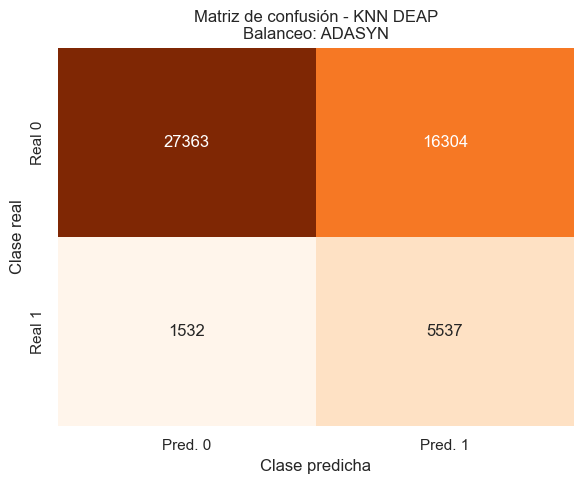

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.63      0.75     43667
Prediabetes/Diabetes       0.25      0.78      0.38      7069

            accuracy                           0.65     50736
           macro avg       0.60      0.70      0.57     50736
        weighted avg       0.85      0.65      0.70     50736



In [193]:
# ============================================================
# Diagnóstico de matriz de confusión - KNN DEAP
# ============================================================

cm_knn_deap = best_knn_deap_result["Matriz Confusión"]
tn, fp, fn, tp = cm_knn_deap.ravel()

n_total = tn + fp + fn + tp

knn_deap_diagnostic = pd.DataFrame([{
    "Modelo": best_knn_deap_result["Modelo"],
    "Método": best_knn_deap_result["Método"],
    "Balanceo": best_knn_deap_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_knn_deap_result["Test Accuracy"],
    "Test Precision": best_knn_deap_result["Test Precision"],
    "Test Recall": best_knn_deap_result["Test Recall"],
    "Test F1": best_knn_deap_result["Test F1"],
    "Test AUC": best_knn_deap_result["Test AUC"]
}])

display(knn_deap_diagnostic.round(4))


# ============================================================
# Matriz de confusión - KNN DEAP
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_knn_deap,
    annot=True,
    fmt="d",
    cmap="Oranges",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - KNN DEAP\n"
    f"Balanceo: {best_knn_deap_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_knn_deap_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

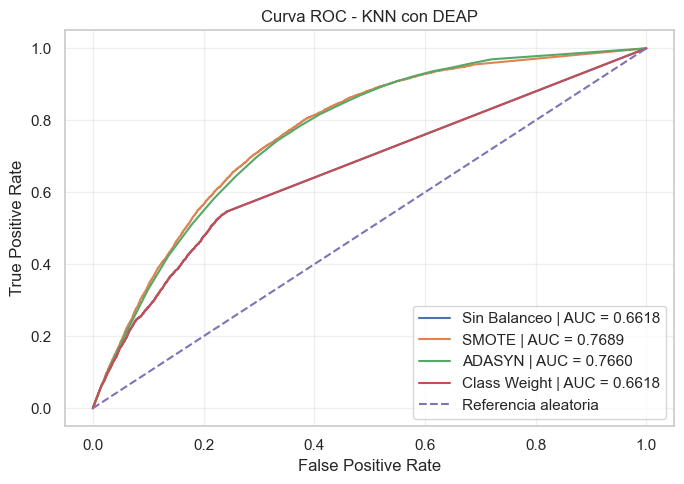

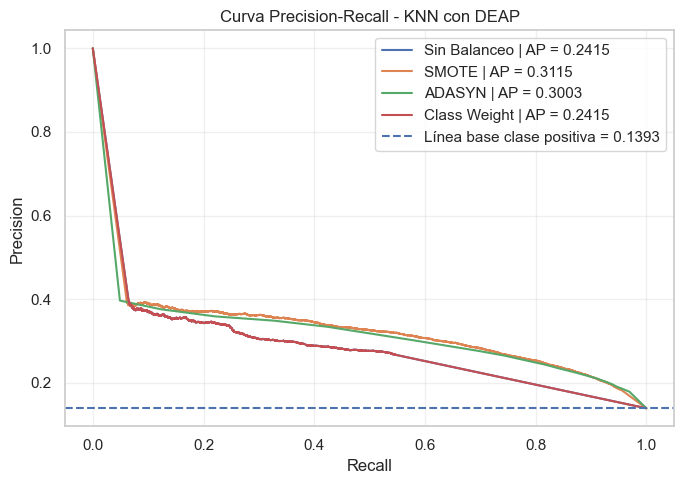

In [194]:
# ============================================================
# Curva ROC - KNN DEAP
# ============================================================

plt.figure(figsize=(7, 5))

for result in knn_deap_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - KNN con DEAP")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - KNN DEAP
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in knn_deap_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - KNN con DEAP")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Historias evolutivas encontradas:
['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight']


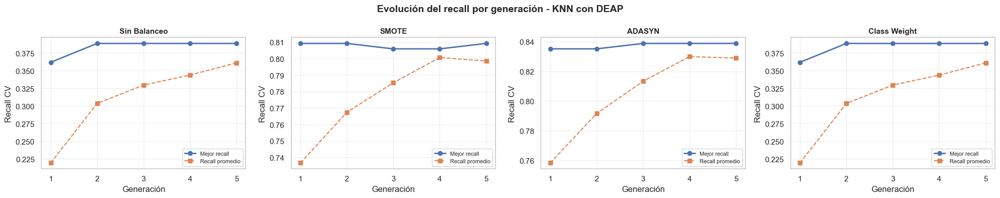

In [195]:
# ============================================================
# Evolución del recall por generación - KNN DEAP
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

# ------------------------------------------------------------
# 1. Función auxiliar para extraer historia evolutiva
# ------------------------------------------------------------

def extraer_historia_deap(res):
    """
    Extrae la historia evolutiva desde diferentes estructuras posibles:
    - Historia
    - Historial
    - Logbook
    """

    if not isinstance(res, dict):
        return None

    historia = (
        res.get("Historia")
        or res.get("Historial")
        or res.get("Logbook")
        or res.get("logbook")
    )

    if historia is None:
        return None

    # Si viene como DataFrame
    if isinstance(historia, pd.DataFrame):
        df_hist = historia.copy()

        # Intentar normalizar nombres
        rename_map = {
            "Best Recall": "max",
            "Mean Recall": "mean",
            "Promedio Recall": "mean",
            "Max Recall": "max",
            "Generacion": "generacion",
            "Generación": "generacion"
        }

        df_hist = df_hist.rename(columns=rename_map)

        if "max" not in df_hist.columns and "Best Recall" in df_hist.columns:
            df_hist["max"] = df_hist["Best Recall"]

        if "mean" not in df_hist.columns:
            df_hist["mean"] = np.nan

        return df_hist

    # Si viene como lista de diccionarios
    if isinstance(historia, list):
        df_hist = pd.DataFrame(historia)

        rename_map = {
            "Best Recall": "max",
            "Mean Recall": "mean",
            "Promedio Recall": "mean",
            "Max Recall": "max",
            "Generacion": "generacion",
            "Generación": "generacion"
        }

        df_hist = df_hist.rename(columns=rename_map)

        if "max" not in df_hist.columns and "Best Recall" in df_hist.columns:
            df_hist["max"] = df_hist["Best Recall"]

        if "mean" not in df_hist.columns:
            df_hist["mean"] = np.nan

        return df_hist

    return None


# ------------------------------------------------------------
# 2. Construir diccionario de historias disponibles
# ------------------------------------------------------------

historias_knn_deap = {}

# Caso A: si existe resultados_deap_knn, que viene del .pkl original
if "resultados_deap_knn" in globals():

    for tecnica, res in resultados_deap_knn.items():
        df_hist = extraer_historia_deap(res)

        if df_hist is not None and len(df_hist) > 0:
            historias_knn_deap[tecnica] = df_hist

# Caso B: si existe knn_deap_results, que fue la estructura adaptada
if len(historias_knn_deap) == 0 and "knn_deap_results" in globals():

    for res in knn_deap_results:
        tecnica = res.get("Balanceo", "DEAP")
        df_hist = extraer_historia_deap(res)

        if df_hist is not None and len(df_hist) > 0:
            historias_knn_deap[tecnica] = df_hist


print("Historias evolutivas encontradas:")
print(list(historias_knn_deap.keys()))


# ------------------------------------------------------------
# 3. Graficar evolución del recall por generación
# ------------------------------------------------------------

if len(historias_knn_deap) == 0:
    print("No se encontró historia evolutiva disponible para graficar.")

else:

    n_plots = len(historias_knn_deap)
    n_cols = min(4, n_plots)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(5 * n_cols, 4 * n_rows),
        squeeze=False
    )

    axes = axes.flatten()

    for ax, (tecnica, df_hist) in zip(axes, historias_knn_deap.items()):

        df_hist = df_hist.copy().reset_index(drop=True)

        # Generaciones
        if "generacion" in df_hist.columns:
            gens = df_hist["generacion"].values
        else:
            gens = np.arange(1, len(df_hist) + 1)

        # Recall máximo
        if "max" in df_hist.columns:
            recall_max = df_hist["max"].astype(float).values
        elif "Best Recall" in df_hist.columns:
            recall_max = df_hist["Best Recall"].astype(float).values
        else:
            recall_max = None

        # Recall promedio
        if "mean" in df_hist.columns:
            recall_mean = pd.to_numeric(df_hist["mean"], errors="coerce").values
        else:
            recall_mean = None

        if recall_max is not None:
            ax.plot(
                gens,
                recall_max,
                linewidth=2,
                marker="o",
                label="Mejor recall"
            )

        if recall_mean is not None and not np.all(pd.isna(recall_mean)):
            ax.plot(
                gens,
                recall_mean,
                linewidth=1.5,
                linestyle="--",
                marker="s",
                label="Recall promedio"
            )

        ax.set_title(str(tecnica), fontsize=11, fontweight="bold")
        ax.set_xlabel("Generación")
        ax.set_ylabel("Recall CV")
        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=8)

    # Ocultar ejes vacíos
    for ax in axes[n_plots:]:
        ax.axis("off")

    plt.suptitle(
        "Evolución del recall por generación - KNN con DEAP",
        fontsize=14,
        fontweight="bold"
    )

    plt.tight_layout()
    plt.show()

### Interpretación de KNN con DEAP

En KNN optimizado mediante DEAP se integraron resultados generados previamente por una implementación externa del equipo. Dado que esta implementación utilizó una estructura distinta a la del resto del notebook, los resultados fueron cargados desde archivos `.pkl` y `.joblib`, y posteriormente adaptados al formato general del proyecto.

DEAP permite explorar el espacio de hiperparámetros mediante un algoritmo evolutivo, donde cada individuo representa una combinación de parámetros del modelo, como el número de vecinos, el esquema de ponderación y la métrica de distancia. A través de selección, cruce y mutación, el algoritmo favorece progresivamente las configuraciones con mejor desempeño según la función objetivo.

El mejor resultado se seleccionó con base en el recall sobre el conjunto de prueba. Sin embargo, al tratarse de un problema desbalanceado, el recall debe analizarse junto con la precisión, el F1-score, el AUC y la matriz de confusión, para identificar si la mejora en sensibilidad se obtiene a costa de un aumento excesivo de falsos positivos.

Las curvas ROC y Precision-Recall complementan la evaluación del modelo. En particular, la curva Precision-Recall es especialmente relevante porque permite analizar con mayor detalle el desempeño sobre la clase positiva minoritaria.

## **21. Naïve Bayes**

### **21.1 Naïve Bayes con Grid Search**

In [ ]:
param_grid_gnb = {
    "modelo__var_smoothing": [1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6]
}
 
resultados_gs_gnb = optimizar_gridsearch(
    modelo_nombre="GaussianNB",
    estimator=GaussianNB(),
    param_grid=param_grid_gnb,
    X_train=X_train,          
    y_train=y_train,          
    cv=cv_strategy,
    escalado=True,
    scoring="recall"
)

In [109]:
# ============================================================
# Cargar archivos Naïve Bayes - Grid Search
# ============================================================

import os
import glob
import pickle
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

NB_GRID_DIR = (
    BASE_DIR
    / "machineentrega2"
    / "Modelos_Optimizados_No_Computacional"
    / "Grid_GaussianNB"
)

print("Ruta Naïve Bayes Grid Search:")
print(NB_GRID_DIR)
print("Existe:", NB_GRID_DIR.exists())

if not NB_GRID_DIR.exists():
    raise FileNotFoundError(f"No existe la carpeta: {NB_GRID_DIR}")

archivos_nb_grid = os.listdir(NB_GRID_DIR)

print("\nArchivos encontrados:")
for archivo in archivos_nb_grid:
    print("-", archivo)

# ------------------------------------------------------------
# Cargar archivo .pkl con resultados generales
# ------------------------------------------------------------

pkl_files_nb_grid = [
    f for f in archivos_nb_grid
    if f.endswith(".pkl")
]

if len(pkl_files_nb_grid) == 0:
    raise FileNotFoundError("No se encontró ningún archivo .pkl para Naïve Bayes Grid Search.")

pkl_path_nb_grid = NB_GRID_DIR / pkl_files_nb_grid[0]

with open(pkl_path_nb_grid, "rb") as f:
    resultados_grid_nb_raw = pickle.load(f)

print("\nArchivo .pkl cargado correctamente:")
print(pkl_path_nb_grid)

print("\nTipo de objeto:")
print(type(resultados_grid_nb_raw))

# Adaptar estructura si viene como un único resultado
if isinstance(resultados_grid_nb_raw, dict) and "Test Recall" in resultados_grid_nb_raw:
    resultados_grid_nb = {"Sin Balanceo": resultados_grid_nb_raw}
else:
    resultados_grid_nb = resultados_grid_nb_raw

print("\nClaves principales:")
print(resultados_grid_nb.keys())

# ------------------------------------------------------------
# Identificar archivos .joblib
# ------------------------------------------------------------

joblib_files_nb_grid = [
    f for f in archivos_nb_grid
    if f.endswith(".joblib")
]

print("\nArchivos .joblib encontrados:")
for f in joblib_files_nb_grid:
    print("-", f)

Ruta Naïve Bayes Grid Search:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Grid_GaussianNB
Existe: True

Archivos encontrados:
- grid_GaussianNB_resultados.pkl
- grid_search_GaussianNB_ADASYN.joblib
- grid_search_GaussianNB_Class Weight.joblib
- grid_search_GaussianNB_Sin Balanceo.joblib
- grid_search_GaussianNB_SMOTE.joblib

Archivo .pkl cargado correctamente:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Grid_GaussianNB\grid_GaussianNB_resultados.pkl

Tipo de objeto:
<class 'dict'>

Claves principales:
dict_keys(['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight'])

Archivos .joblib encontrados:
- grid_search_GaussianNB_ADASYN.joblib
- grid_search_GaussianNB_Class Weight.joblib
- grid_search_GaussianNB_Sin Balanceo.joblib
- grid_search_GaussianNB_SMOTE.joblib


In [110]:
# ============================================================
# Relacionar estrategias de balanceo con archivos joblib
# ============================================================

def normalizar_texto(texto):
    return (
        str(texto)
        .lower()
        .replace(" ", "")
        .replace("_", "")
        .replace("-", "")
    )


def encontrar_joblib_por_balance(balanceo, joblib_files):
    balance_norm = normalizar_texto(balanceo)

    patrones_balanceo = {
        "sinbalanceo": ["sinbalanceo", "none", "nobalance", "sin"],
        "none": ["sinbalanceo", "none", "nobalance", "sin"],
        "smote": ["smote"],
        "adasyn": ["adasyn"],
        "classweight": ["classweight", "class", "weight"]
    }

    patrones = patrones_balanceo.get(balance_norm, [balance_norm])

    for file in joblib_files:
        file_norm = normalizar_texto(file)

        if any(patron in file_norm for patron in patrones):
            return file

    if len(joblib_files) == 1:
        return joblib_files[0]

    return None


joblib_map_grid_nb = {}

for balanceo in resultados_grid_nb.keys():
    archivo_encontrado = encontrar_joblib_por_balance(
        balanceo,
        joblib_files_nb_grid
    )

    joblib_map_grid_nb[balanceo] = archivo_encontrado

print("\nMapa balanceo → joblib:")
for balanceo, archivo in joblib_map_grid_nb.items():
    print(f"{balanceo}: {archivo}")


Mapa balanceo → joblib:
Sin Balanceo: grid_search_GaussianNB_Sin Balanceo.joblib
SMOTE: grid_search_GaussianNB_SMOTE.joblib
ADASYN: grid_search_GaussianNB_ADASYN.joblib
Class Weight: grid_search_GaussianNB_Class Weight.joblib


In [111]:
# ============================================================
# Naïve Bayes Grid Search: predicciones, scores y matrices
# ============================================================

def obtener_valor(diccionario, posibles_claves, default=None):
    for clave in posibles_claves:
        if isinstance(diccionario, dict) and clave in diccionario:
            return diccionario.get(clave)
    return default


def extraer_params_nb_desde_pipeline(pipeline):
    """
    Extrae hiperparámetros principales de GaussianNB desde pipeline o estimador.
    """
    modelo_nb = None

    if hasattr(pipeline, "named_steps"):
        for _, paso in pipeline.named_steps.items():
            if isinstance(paso, GaussianNB):
                modelo_nb = paso
                break

        if modelo_nb is None:
            modelo_nb = list(pipeline.named_steps.values())[-1]

    else:
        modelo_nb = pipeline

    params = {}

    if hasattr(modelo_nb, "var_smoothing"):
        params["var_smoothing"] = modelo_nb.var_smoothing

    return params


nb_grid_results = []

for balanceo, res in resultados_grid_nb.items():

    joblib_file = joblib_map_grid_nb.get(balanceo)

    if joblib_file is None:
        print(f"No se encontró joblib para balanceo: {balanceo}")
        continue

    joblib_path = NB_GRID_DIR / joblib_file

    pipeline_nb_grid = joblib.load(joblib_path)

    y_pred_nb_grid = pipeline_nb_grid.predict(X_test)

    if hasattr(pipeline_nb_grid, "predict_proba"):
        y_score_nb_grid = pipeline_nb_grid.predict_proba(X_test)

        if len(y_score_nb_grid.shape) == 2:
            y_score_nb_grid = y_score_nb_grid[:, 1]

    elif hasattr(pipeline_nb_grid, "decision_function"):
        y_score_nb_grid = pipeline_nb_grid.decision_function(X_test)

    else:
        y_score_nb_grid = y_pred_nb_grid

    cm_nb_grid = confusion_matrix(y_test, y_pred_nb_grid)

    best_params = obtener_valor(
        res,
        ["Mejores Hiperparámetros", "Best Params", "Mejores hiperparámetros", "params"]
    )

    if best_params is None:
        best_params = extraer_params_nb_desde_pipeline(pipeline_nb_grid)

    nb_grid_results.append({
        "Modelo": "Naïve Bayes",
        "Método": "Grid Search",
        "Balanceo": balanceo,

        "CV Recall": obtener_valor(res, ["Mejor recall CV", "CV Recall", "Best Recall", "Recall CV"]),
        "Std Recall CV": obtener_valor(res, ["Std recall CV", "Std Recall CV"]),

        "Test Accuracy": obtener_valor(res, ["Test Accuracy", "Accuracy"]),
        "Test Precision": obtener_valor(res, ["Test Precision", "Precision"]),
        "Test Recall": obtener_valor(res, ["Test Recall", "Recall"]),
        "Test F1": obtener_valor(res, ["Test F1", "F1"]),
        "Test AUC": obtener_valor(res, ["Test ROC AUC", "Test AUC", "ROC AUC"]),

        "Tiempo (s)": obtener_valor(res, ["Tiempo (s)", "Tiempo", "time"]),
        "Evaluaciones": obtener_valor(res, ["Iteraciones", "Evaluaciones", "n_evaluations"]),
        "Best Params": str(best_params),

        "Best Estimator": pipeline_nb_grid,
        "Predicciones": y_pred_nb_grid,
        "Scores": y_score_nb_grid,
        "Matriz Confusión": cm_nb_grid,
        "Fuente": str(joblib_path)
    })

print(f"Resultados Naïve Bayes Grid Search enriquecidos: {len(nb_grid_results)}")

Resultados Naïve Bayes Grid Search enriquecidos: 4


In [199]:
# ============================================================
# Naïve Bayes Grid Search: tabla resumen final
# ============================================================

nb_grid_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Método"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),
        "Std Recall CV": r.get("Std Recall CV"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": r.get("Best Params")
    }
    for r in nb_grid_results
])

nb_grid_summary = nb_grid_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(nb_grid_summary.round(4))

best_nb_grid_idx = nb_grid_summary["Test Recall"].idxmax()
best_balance_nb_grid = nb_grid_summary.loc[best_nb_grid_idx, "Balanceo"]

best_nb_grid_result = [
    r for r in nb_grid_results
    if r.get("Balanceo") == best_balance_nb_grid
][0]

print("Mejor Naïve Bayes con Grid Search")
print("=" * 60)
print("Balanceo:", best_nb_grid_result["Balanceo"])
print("Test Accuracy:", round(best_nb_grid_result["Test Accuracy"], 4))
print("Test Precision:", round(best_nb_grid_result["Test Precision"], 4))
print("Test Recall:", round(best_nb_grid_result["Test Recall"], 4))
print("Test F1:", round(best_nb_grid_result["Test F1"], 4))
print("Test AUC:", round(best_nb_grid_result["Test AUC"], 4))
print("Best Params:", best_nb_grid_result["Best Params"])

,Modelo,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
2,Naïve Bayes,Grid Search,ADASYN,0.8193,0.0022,0.6491,0.2577,0.8072,0.3906,0.7723,270.7682,6,{'modelo__var_smoothing': 1e-11}
1,Naïve Bayes,Grid Search,SMOTE,0.7886,0.0036,0.6749,0.2696,0.7800,0.4007,0.7730,89.3653,6,{'modelo__var_smoothing': 1e-11}
0,Naïve Bayes,Grid Search,Sin Balanceo,0.5720,0.0043,0.7722,0.3198,0.5639,0.4082,0.7803,7.2298,6,{'modelo__var_smoothing': 1e-11}
3,Naïve Bayes,Grid Search,Class Weight,0.5720,0.0043,0.7722,0.3198,0.5639,0.4082,0.7803,3.7511,6,{'modelo__var_smoothing': 1e-11}


Mejor Naïve Bayes con Grid Search
Balanceo: ADASYN
Test Accuracy: 0.6491
Test Precision: 0.2577
Test Recall: 0.8072
Test F1: 0.3906
Test AUC: 0.7723
Best Params: {'modelo__var_smoothing': 1e-11}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Naïve Bayes,Grid Search,ADASYN,27228,16439,1363,5706,13.9329,43.6475,0.6491,0.2577,0.8072,0.3906,0.7723


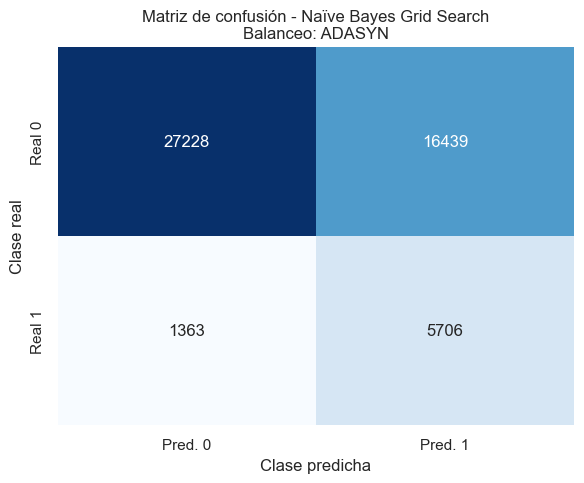

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.62      0.75     43667
Prediabetes/Diabetes       0.26      0.81      0.39      7069

            accuracy                           0.65     50736
           macro avg       0.60      0.72      0.57     50736
        weighted avg       0.86      0.65      0.70     50736



In [200]:
# ============================================================
# Diagnóstico de matriz de confusión - Naïve Bayes Grid Search
# ============================================================

cm_nb_grid = best_nb_grid_result["Matriz Confusión"]
tn, fp, fn, tp = cm_nb_grid.ravel()

n_total = tn + fp + fn + tp

nb_grid_diagnostic = pd.DataFrame([{
    "Modelo": best_nb_grid_result["Modelo"],
    "Método": best_nb_grid_result["Método"],
    "Balanceo": best_nb_grid_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_nb_grid_result["Test Accuracy"],
    "Test Precision": best_nb_grid_result["Test Precision"],
    "Test Recall": best_nb_grid_result["Test Recall"],
    "Test F1": best_nb_grid_result["Test F1"],
    "Test AUC": best_nb_grid_result["Test AUC"]
}])

display(nb_grid_diagnostic.round(4))


# ============================================================
# Matriz de confusión - Naïve Bayes Grid Search
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_nb_grid,
    annot=True,
    fmt="d",
    cmap="Blues",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Naïve Bayes Grid Search\n"
    f"Balanceo: {best_nb_grid_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_nb_grid_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

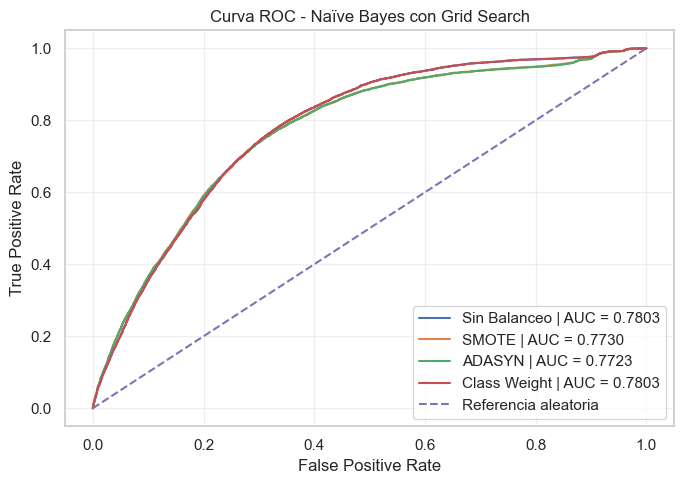

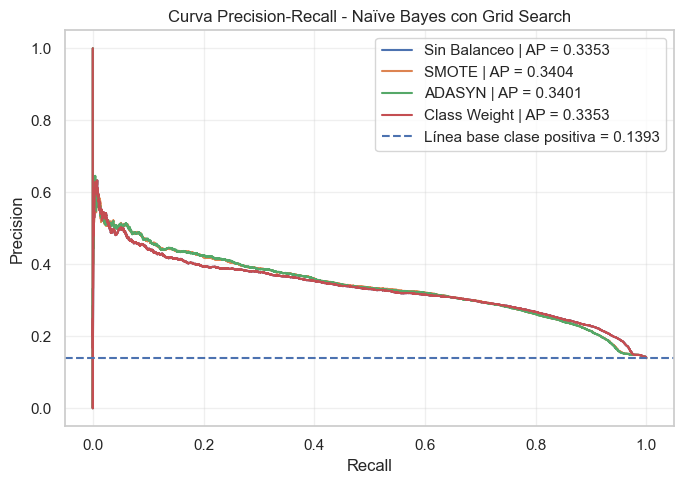

In [201]:
# ============================================================
# Curva ROC - Naïve Bayes Grid Search
# ============================================================

plt.figure(figsize=(7, 5))

for result in nb_grid_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - Naïve Bayes con Grid Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - Naïve Bayes Grid Search
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in nb_grid_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Naïve Bayes con Grid Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de Naïve Bayes con Grid Search

En Naïve Bayes optimizado mediante Grid Search se evaluó el hiperparámetro `var_smoothing`, el cual permite estabilizar el cálculo de varianzas y reducir problemas numéricos en el modelo GaussianNB. Los resultados fueron integrados desde una implementación externa del equipo y adaptados al formato general del proyecto.

El mejor resultado se seleccionó con base en el recall sobre el conjunto de prueba, dado que el objetivo principal es mejorar la detección de casos positivos asociados a prediabetes o diabetes. No obstante, este resultado debe analizarse junto con la precisión, el F1-score, el AUC y la matriz de confusión, debido a que un recall alto puede estar asociado con un aumento de falsos positivos.

La matriz de confusión permite observar el comportamiento del modelo frente a la clase positiva y negativa. Las curvas ROC y Precision-Recall complementan la evaluación, siendo la curva Precision-Recall especialmente importante por el desbalance de clases.

### **21.2 Naïve Bayes con Random Search**

In [ ]:
param_dist_gnb = {
    "modelo__var_smoothing": np.logspace(-11, -6, 50).tolist()
}

resultados_rs_gnb = optimizar_randomsearch(
    modelo_nombre="GaussianNB",
    estimator=GaussianNB(),
    param_distributions=param_dist_gnb,
    X_train=X_train,
    y_train=y_train,
    cv=cv_strategy,
    escalado=True,
    scoring="recall",
    n_iter=20
)

In [112]:
# ============================================================
# Cargar archivos Naïve Bayes - Random Search
# ============================================================

import os
import glob
import pickle
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

NB_RANDOM_DIR = (
    BASE_DIR
    / "machineentrega2"
    / "Modelos_Optimizados_No_Computacional"
    / "Random_GaussianNB"
)

print("Ruta Naïve Bayes Random Search:")
print(NB_RANDOM_DIR)
print("Existe:", NB_RANDOM_DIR.exists())

if not NB_RANDOM_DIR.exists():
    raise FileNotFoundError(f"No existe la carpeta: {NB_RANDOM_DIR}")

archivos_nb_random = os.listdir(NB_RANDOM_DIR)

print("\nArchivos encontrados:")
for archivo in archivos_nb_random:
    print("-", archivo)

# Cargar archivo .pkl
pkl_files_nb_random = [
    f for f in archivos_nb_random
    if f.endswith(".pkl")
]

if len(pkl_files_nb_random) == 0:
    raise FileNotFoundError("No se encontró ningún archivo .pkl para Naïve Bayes Random Search.")

pkl_path_nb_random = NB_RANDOM_DIR / pkl_files_nb_random[0]

with open(pkl_path_nb_random, "rb") as f:
    resultados_random_nb_raw = pickle.load(f)

print("\nArchivo .pkl cargado correctamente:")
print(pkl_path_nb_random)

print("\nTipo de objeto:")
print(type(resultados_random_nb_raw))

# Adaptar si viene como único resultado
if isinstance(resultados_random_nb_raw, dict) and "Test Recall" in resultados_random_nb_raw:
    resultados_random_nb = {"Sin Balanceo": resultados_random_nb_raw}
else:
    resultados_random_nb = resultados_random_nb_raw

print("\nClaves principales:")
print(resultados_random_nb.keys())

# Identificar joblibs
joblib_files_nb_random = [
    f for f in archivos_nb_random
    if f.endswith(".joblib")
]

print("\nArchivos .joblib encontrados:")
for f in joblib_files_nb_random:
    print("-", f)

Ruta Naïve Bayes Random Search:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Random_GaussianNB
Existe: True

Archivos encontrados:
- random_GaussianNB_resultados.pkl
- random_search_GaussianNB_ADASYN.joblib
- random_search_GaussianNB_Class Weight.joblib
- random_search_GaussianNB_Sin Balanceo.joblib
- random_search_GaussianNB_SMOTE.joblib

Archivo .pkl cargado correctamente:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Random_GaussianNB\random_GaussianNB_resultados.pkl

Tipo de objeto:
<class 'dict'>

Claves principales:
dict_keys(['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight'])

Archivos .joblib encontrados:
- random_search_GaussianNB_ADASYN.joblib
- random_search_GaussianNB_Class Weight.joblib
- random_search_GaussianNB_Sin Balanceo.joblib
- random_search_GaussianNB_SMOTE.joblib


In [113]:
# ============================================================
# Relacionar estrategias de balanceo con archivos joblib
# ============================================================

def normalizar_texto(texto):
    return (
        str(texto)
        .lower()
        .replace(" ", "")
        .replace("_", "")
        .replace("-", "")
    )


def encontrar_joblib_por_balance(balanceo, joblib_files):
    balance_norm = normalizar_texto(balanceo)

    patrones_balanceo = {
        "sinbalanceo": ["sinbalanceo", "none", "nobalance", "sin"],
        "none": ["sinbalanceo", "none", "nobalance", "sin"],
        "smote": ["smote"],
        "adasyn": ["adasyn"],
        "classweight": ["classweight", "class", "weight"]
    }

    patrones = patrones_balanceo.get(balance_norm, [balance_norm])

    for file in joblib_files:
        file_norm = normalizar_texto(file)

        if any(patron in file_norm for patron in patrones):
            return file

    if len(joblib_files) == 1:
        return joblib_files[0]

    return None


joblib_map_random_nb = {}

for balanceo in resultados_random_nb.keys():
    archivo_encontrado = encontrar_joblib_por_balance(
        balanceo,
        joblib_files_nb_random
    )

    joblib_map_random_nb[balanceo] = archivo_encontrado

print("\nMapa balanceo → joblib:")
for balanceo, archivo in joblib_map_random_nb.items():
    print(f"{balanceo}: {archivo}")


Mapa balanceo → joblib:
Sin Balanceo: random_search_GaussianNB_Sin Balanceo.joblib
SMOTE: random_search_GaussianNB_SMOTE.joblib
ADASYN: random_search_GaussianNB_ADASYN.joblib
Class Weight: random_search_GaussianNB_Class Weight.joblib


In [114]:
# ============================================================
# Naïve Bayes Random Search: predicciones, scores y matrices
# ============================================================

def obtener_valor(diccionario, posibles_claves, default=None):
    for clave in posibles_claves:
        if isinstance(diccionario, dict) and clave in diccionario:
            return diccionario.get(clave)
    return default


def extraer_params_nb_desde_pipeline(pipeline):
    modelo_nb = None

    if hasattr(pipeline, "named_steps"):
        for _, paso in pipeline.named_steps.items():
            if isinstance(paso, GaussianNB):
                modelo_nb = paso
                break

        if modelo_nb is None:
            modelo_nb = list(pipeline.named_steps.values())[-1]
    else:
        modelo_nb = pipeline

    params = {}

    if hasattr(modelo_nb, "var_smoothing"):
        params["var_smoothing"] = modelo_nb.var_smoothing

    return params


nb_random_results = []

for balanceo, res in resultados_random_nb.items():

    joblib_file = joblib_map_random_nb.get(balanceo)

    if joblib_file is None:
        print(f"No se encontró joblib para balanceo: {balanceo}")
        continue

    joblib_path = NB_RANDOM_DIR / joblib_file

    pipeline_nb_random = joblib.load(joblib_path)

    y_pred_nb_random = pipeline_nb_random.predict(X_test)

    if hasattr(pipeline_nb_random, "predict_proba"):
        y_score_nb_random = pipeline_nb_random.predict_proba(X_test)

        if len(y_score_nb_random.shape) == 2:
            y_score_nb_random = y_score_nb_random[:, 1]

    elif hasattr(pipeline_nb_random, "decision_function"):
        y_score_nb_random = pipeline_nb_random.decision_function(X_test)

    else:
        y_score_nb_random = y_pred_nb_random

    cm_nb_random = confusion_matrix(y_test, y_pred_nb_random)

    best_params = obtener_valor(
        res,
        ["Mejores Hiperparámetros", "Best Params", "Mejores hiperparámetros", "params"]
    )

    if best_params is None:
        best_params = extraer_params_nb_desde_pipeline(pipeline_nb_random)

    nb_random_results.append({
        "Modelo": "Naïve Bayes",
        "Método": "Random Search",
        "Balanceo": balanceo,

        "CV Recall": obtener_valor(res, ["Mejor recall CV", "CV Recall", "Best Recall", "Recall CV"]),
        "Std Recall CV": obtener_valor(res, ["Std recall CV", "Std Recall CV"]),

        "Test Accuracy": obtener_valor(res, ["Test Accuracy", "Accuracy"]),
        "Test Precision": obtener_valor(res, ["Test Precision", "Precision"]),
        "Test Recall": obtener_valor(res, ["Test Recall", "Recall"]),
        "Test F1": obtener_valor(res, ["Test F1", "F1"]),
        "Test AUC": obtener_valor(res, ["Test ROC AUC", "Test AUC", "ROC AUC"]),

        "Tiempo (s)": obtener_valor(res, ["Tiempo (s)", "Tiempo", "time"]),
        "Evaluaciones": obtener_valor(res, ["Iteraciones", "Evaluaciones", "n_evaluations"]),
        "Best Params": str(best_params),

        "Best Estimator": pipeline_nb_random,
        "Predicciones": y_pred_nb_random,
        "Scores": y_score_nb_random,
        "Matriz Confusión": cm_nb_random,
        "Fuente": str(joblib_path)
    })

print(f"Resultados Naïve Bayes Random Search enriquecidos: {len(nb_random_results)}")

Resultados Naïve Bayes Random Search enriquecidos: 4


In [115]:
# ============================================================
# Naïve Bayes Random Search: tabla resumen final
# ============================================================

nb_random_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Método"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),
        "Std Recall CV": r.get("Std Recall CV"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": r.get("Best Params")
    }
    for r in nb_random_results
])

nb_random_summary = nb_random_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(nb_random_summary.round(4))

best_nb_random_idx = nb_random_summary["Test Recall"].idxmax()
best_balance_nb_random = nb_random_summary.loc[best_nb_random_idx, "Balanceo"]

best_nb_random_result = [
    r for r in nb_random_results
    if r.get("Balanceo") == best_balance_nb_random
][0]

print("Mejor Naïve Bayes con Random Search")
print("=" * 60)
print("Balanceo:", best_nb_random_result["Balanceo"])
print("Test Accuracy:", round(best_nb_random_result["Test Accuracy"], 4))
print("Test Precision:", round(best_nb_random_result["Test Precision"], 4))
print("Test Recall:", round(best_nb_random_result["Test Recall"], 4))
print("Test F1:", round(best_nb_random_result["Test F1"], 4))
print("Test AUC:", round(best_nb_random_result["Test AUC"], 4))
print("Best Params:", best_nb_random_result["Best Params"])

,Modelo,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
2,Naïve Bayes,Random Search,ADASYN,0.8193,0.0022,0.6491,0.2577,0.8072,0.3906,0.7723,783.5813,20,{'modelo__var_smoothing': 2.1209508879201926e-10}
1,Naïve Bayes,Random Search,SMOTE,0.7886,0.0036,0.6749,0.2696,0.7800,0.4007,0.7730,122.8499,20,{'modelo__var_smoothing': 2.1209508879201926e-10}
0,Naïve Bayes,Random Search,Sin Balanceo,0.5720,0.0043,0.7722,0.3198,0.5639,0.4082,0.7803,13.5823,20,{'modelo__var_smoothing': 2.1209508879201926e-10}
3,Naïve Bayes,Random Search,Class Weight,0.5720,0.0043,0.7722,0.3198,0.5639,0.4082,0.7803,11.9512,20,{'modelo__var_smoothing': 2.1209508879201926e-10}


Mejor Naïve Bayes con Random Search
Balanceo: ADASYN
Test Accuracy: 0.6491
Test Precision: 0.2577
Test Recall: 0.8072
Test F1: 0.3906
Test AUC: 0.7723
Best Params: {'modelo__var_smoothing': 2.1209508879201926e-10}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Naïve Bayes,Random Search,ADASYN,27228,16439,1363,5706,13.9329,43.6475,0.6491,0.2577,0.8072,0.3906,0.7723


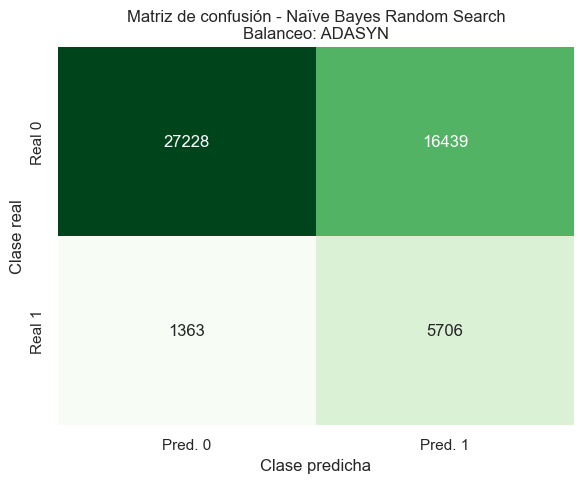

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.62      0.75     43667
Prediabetes/Diabetes       0.26      0.81      0.39      7069

            accuracy                           0.65     50736
           macro avg       0.60      0.72      0.57     50736
        weighted avg       0.86      0.65      0.70     50736



In [207]:
# ============================================================
# Diagnóstico de matriz de confusión - Naïve Bayes Random Search
# ============================================================

cm_nb_random = best_nb_random_result["Matriz Confusión"]
tn, fp, fn, tp = cm_nb_random.ravel()

n_total = tn + fp + fn + tp

nb_random_diagnostic = pd.DataFrame([{
    "Modelo": best_nb_random_result["Modelo"],
    "Método": best_nb_random_result["Método"],
    "Balanceo": best_nb_random_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_nb_random_result["Test Accuracy"],
    "Test Precision": best_nb_random_result["Test Precision"],
    "Test Recall": best_nb_random_result["Test Recall"],
    "Test F1": best_nb_random_result["Test F1"],
    "Test AUC": best_nb_random_result["Test AUC"]
}])

display(nb_random_diagnostic.round(4))


# ============================================================
# Matriz de confusión - Naïve Bayes Random Search
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_nb_random,
    annot=True,
    fmt="d",
    cmap="Greens",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Naïve Bayes Random Search\n"
    f"Balanceo: {best_nb_random_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_nb_random_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

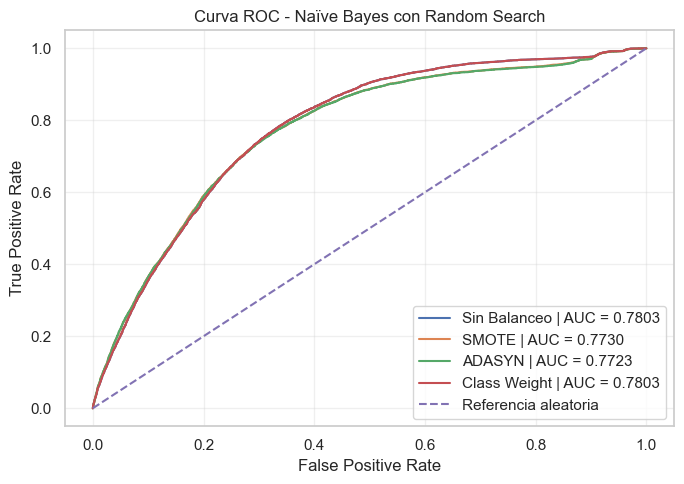

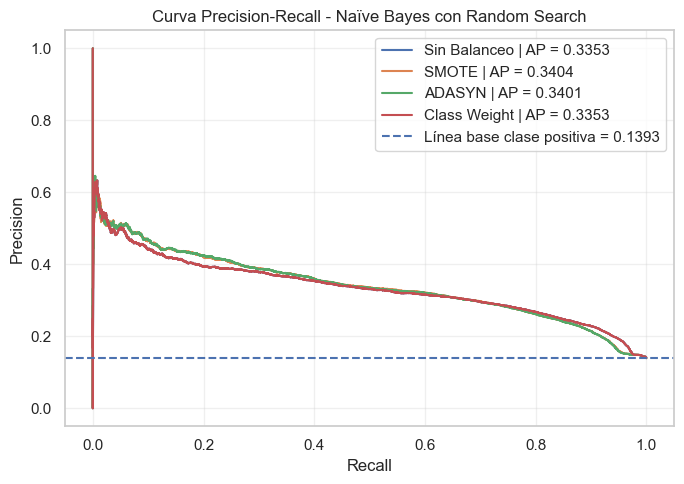

In [208]:
# ============================================================
# Curva ROC - Naïve Bayes Random Search
# ============================================================

plt.figure(figsize=(7, 5))

for result in nb_random_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - Naïve Bayes con Random Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - Naïve Bayes Random Search
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in nb_random_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Naïve Bayes con Random Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


### Interpretación de Naïve Bayes con Random Search

En Naïve Bayes optimizado mediante Random Search se evaluaron distintas configuraciones del hiperparámetro `var_smoothing`, el cual permite estabilizar el cálculo de probabilidades en GaussianNB. A diferencia de Grid Search, Random Search explora una muestra aleatoria del espacio de búsqueda, lo que permite reducir el costo computacional cuando el rango de valores candidatos es amplio.

Los resultados fueron cargados desde archivos `.pkl` y `.joblib`, debido a que esta implementación fue generada previamente mediante una estructura externa del equipo. Posteriormente, se adaptaron al formato general del proyecto para permitir la comparación con los demás modelos.

El mejor resultado se seleccionó con base en el recall sobre el conjunto de prueba. Sin embargo, al tratarse de un problema desbalanceado, este valor debe interpretarse junto con la precisión, el F1-score, el AUC y la matriz de confusión, ya que una mejora en sensibilidad puede estar acompañada de un incremento en falsos positivos.

Las curvas ROC y Precision-Recall complementan la evaluación del modelo. En particular, la curva Precision-Recall resulta clave para analizar el desempeño sobre la clase positiva minoritaria.

### **21.3 Naïve Bayes con Optuna**

In [ ]:
def gnb_factory(params):
    return GaussianNB(var_smoothing=params["var_smoothing"])

resultados_op_gnb = optimizar_optuna(
    modelo_nombre="GaussianNB",
    estimator=GaussianNB(),
    model_factory=gnb_factory,
    X_train=X_train,
    y_train=y_train,
    cv=cv_strategy,
    escalado=True,
    n_trials=30,
    scoring="recall"
)

In [116]:
# ============================================================
# Cargar archivos Naïve Bayes - Optuna
# ============================================================

import os
import glob
import pickle
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

NB_OPTUNA_DIR = (
    BASE_DIR
    / "machineentrega2"
    / "Modelos_Optimizados_No_Computacional"
    / "Optuna_GaussianNB"
)

print("Ruta Naïve Bayes Optuna:")
print(NB_OPTUNA_DIR)
print("Existe:", NB_OPTUNA_DIR.exists())

if not NB_OPTUNA_DIR.exists():
    raise FileNotFoundError(f"No existe la carpeta: {NB_OPTUNA_DIR}")

archivos_nb_optuna = os.listdir(NB_OPTUNA_DIR)

print("\nArchivos encontrados:")
for archivo in archivos_nb_optuna:
    print("-", archivo)

# Cargar archivo .pkl
pkl_files_nb_optuna = [
    f for f in archivos_nb_optuna
    if f.endswith(".pkl")
]

if len(pkl_files_nb_optuna) == 0:
    raise FileNotFoundError("No se encontró ningún archivo .pkl para Naïve Bayes Optuna.")

pkl_path_nb_optuna = NB_OPTUNA_DIR / pkl_files_nb_optuna[0]

with open(pkl_path_nb_optuna, "rb") as f:
    resultados_optuna_nb_raw = pickle.load(f)

print("\nArchivo .pkl cargado correctamente:")
print(pkl_path_nb_optuna)

print("\nTipo de objeto:")
print(type(resultados_optuna_nb_raw))

# Adaptar si viene como único resultado
if isinstance(resultados_optuna_nb_raw, dict) and "Test Recall" in resultados_optuna_nb_raw:
    resultados_optuna_nb = {"Optuna": resultados_optuna_nb_raw}
else:
    resultados_optuna_nb = resultados_optuna_nb_raw

print("\nClaves principales:")
print(resultados_optuna_nb.keys())

# Identificar joblibs
joblib_files_nb_optuna = [
    f for f in archivos_nb_optuna
    if f.endswith(".joblib")
]

print("\nArchivos .joblib encontrados:")
for f in joblib_files_nb_optuna:
    print("-", f)

Ruta Naïve Bayes Optuna:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Optuna_GaussianNB
Existe: True

Archivos encontrados:
- optuna_GaussianNB_ADASYN.joblib
- optuna_GaussianNB_ADASYN_study.joblib
- optuna_GaussianNB_Class Weight.joblib
- optuna_GaussianNB_Class Weight_study.joblib
- optuna_GaussianNB_resultados.pkl
- optuna_GaussianNB_Sin Balanceo.joblib
- optuna_GaussianNB_Sin Balanceo_study.joblib
- optuna_GaussianNB_SMOTE.joblib
- optuna_GaussianNB_SMOTE_study.joblib

Archivo .pkl cargado correctamente:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Optuna_GaussianNB\optuna_GaussianNB_resultados.pkl

Tipo de objeto:
<class 'dict'>

Claves principales:
dict_keys(['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight'])

Archivos .joblib encontrados:
- optuna_GaussianNB_ADASYN.joblib
- optuna_GaussianNB_ADASYN_st

In [117]:
# ============================================================
# Relacionar resultados de Optuna con archivos joblib
# ============================================================

def normalizar_texto(texto):
    return (
        str(texto)
        .lower()
        .replace(" ", "")
        .replace("_", "")
        .replace("-", "")
    )


def encontrar_joblib_nb_optuna(nombre_resultado, joblib_files):
    nombre_norm = normalizar_texto(nombre_resultado)

    patrones = {
        "optuna": ["optuna", "gaussiannb", "gnb", "nb"],
        "sinbalanceo": ["sinbalanceo", "none", "nobalance", "sin"],
        "none": ["sinbalanceo", "none", "nobalance", "sin"],
        "smote": ["smote"],
        "adasyn": ["adasyn"],
        "classweight": ["classweight", "class", "weight"]
    }

    patrones_busqueda = patrones.get(nombre_norm, [nombre_norm])

    for file in joblib_files:
        file_norm = normalizar_texto(file)

        if any(patron in file_norm for patron in patrones_busqueda):
            return file

    if len(joblib_files) == 1:
        return joblib_files[0]

    return None


joblib_map_optuna_nb = {}

for nombre_resultado in resultados_optuna_nb.keys():
    archivo_encontrado = encontrar_joblib_nb_optuna(
        nombre_resultado,
        joblib_files_nb_optuna
    )

    joblib_map_optuna_nb[nombre_resultado] = archivo_encontrado

print("\nMapa resultado → joblib:")
for nombre_resultado, archivo in joblib_map_optuna_nb.items():
    print(f"{nombre_resultado}: {archivo}")


Mapa resultado → joblib:
Sin Balanceo: optuna_GaussianNB_Sin Balanceo.joblib
SMOTE: optuna_GaussianNB_SMOTE.joblib
ADASYN: optuna_GaussianNB_ADASYN.joblib
Class Weight: optuna_GaussianNB_Class Weight.joblib


In [118]:
# ============================================================
# Naïve Bayes Optuna: predicciones, scores y matrices
# ============================================================

def obtener_valor(diccionario, posibles_claves, default=None):
    for clave in posibles_claves:
        if isinstance(diccionario, dict) and clave in diccionario:
            return diccionario.get(clave)
    return default


def extraer_params_nb_desde_pipeline(pipeline):
    modelo_nb = None

    if hasattr(pipeline, "named_steps"):
        for _, paso in pipeline.named_steps.items():
            if isinstance(paso, GaussianNB):
                modelo_nb = paso
                break

        if modelo_nb is None:
            modelo_nb = list(pipeline.named_steps.values())[-1]
    else:
        modelo_nb = pipeline

    params = {}

    if hasattr(modelo_nb, "var_smoothing"):
        params["var_smoothing"] = modelo_nb.var_smoothing

    return params


nb_optuna_results = []

for nombre_resultado, res in resultados_optuna_nb.items():

    joblib_file = joblib_map_optuna_nb.get(nombre_resultado)

    if joblib_file is None:
        print(f"No se encontró joblib para: {nombre_resultado}")
        continue

    joblib_path = NB_OPTUNA_DIR / joblib_file

    loaded_nb_optuna = joblib.load(joblib_path)

    # Si el joblib viene como diccionario, intentar extraer estimador
    if isinstance(loaded_nb_optuna, dict):
        pipeline_nb_optuna = (
            loaded_nb_optuna.get("Best Estimator")
            or loaded_nb_optuna.get("best_estimator")
            or loaded_nb_optuna.get("Estimator")
            or loaded_nb_optuna.get("modelo")
        )
    else:
        pipeline_nb_optuna = loaded_nb_optuna

    if pipeline_nb_optuna is None:
        print(f"No se pudo extraer estimador desde: {joblib_path}")
        continue

    y_pred_nb_optuna = pipeline_nb_optuna.predict(X_test)

    if hasattr(pipeline_nb_optuna, "predict_proba"):
        y_score_nb_optuna = pipeline_nb_optuna.predict_proba(X_test)

        if len(y_score_nb_optuna.shape) == 2:
            y_score_nb_optuna = y_score_nb_optuna[:, 1]

    elif hasattr(pipeline_nb_optuna, "decision_function"):
        y_score_nb_optuna = pipeline_nb_optuna.decision_function(X_test)

    else:
        y_score_nb_optuna = y_pred_nb_optuna

    cm_nb_optuna = confusion_matrix(y_test, y_pred_nb_optuna)

    best_params = obtener_valor(
        res,
        ["Mejores Hiperparámetros", "Best Params", "Mejores hiperparámetros", "params"]
    )

    if best_params is None:
        best_params = extraer_params_nb_desde_pipeline(pipeline_nb_optuna)

    nb_optuna_results.append({
        "Modelo": "Naïve Bayes",
        "Método": "Optuna",
        "Balanceo": obtener_valor(res, ["Balanceo", "balance_strategy"], nombre_resultado),

        "CV Recall": obtener_valor(res, ["Mejor recall CV", "CV Recall", "Best Recall", "Recall CV"]),
        "Std Recall CV": obtener_valor(res, ["Std recall CV", "Std Recall CV"]),

        "Test Accuracy": obtener_valor(res, ["Test Accuracy", "Accuracy"]),
        "Test Precision": obtener_valor(res, ["Test Precision", "Precision"]),
        "Test Recall": obtener_valor(res, ["Test Recall", "Recall"]),
        "Test F1": obtener_valor(res, ["Test F1", "F1"]),
        "Test AUC": obtener_valor(res, ["Test ROC AUC", "Test AUC", "ROC AUC"]),

        "Tiempo (s)": obtener_valor(res, ["Tiempo (s)", "Tiempo", "time"]),
        "Evaluaciones": obtener_valor(res, ["Iteraciones", "Evaluaciones", "n_trials", "n_evaluations"]),
        "Best Params": str(best_params),

        "Best Estimator": pipeline_nb_optuna,
        "Predicciones": y_pred_nb_optuna,
        "Scores": y_score_nb_optuna,
        "Matriz Confusión": cm_nb_optuna,
        "Fuente": str(joblib_path),

        "Study": obtener_valor(res, ["Study", "study", "Optuna Study"])
    })

print(f"Resultados Naïve Bayes Optuna enriquecidos: {len(nb_optuna_results)}")

Resultados Naïve Bayes Optuna enriquecidos: 4


In [119]:
# ============================================================
# Naïve Bayes Optuna: tabla resumen final
# ============================================================

nb_optuna_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Método"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),
        "Std Recall CV": r.get("Std Recall CV"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": r.get("Best Params")
    }
    for r in nb_optuna_results
])

nb_optuna_summary = nb_optuna_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(nb_optuna_summary.round(4))

best_nb_optuna_idx = nb_optuna_summary["Test Recall"].idxmax()
best_balance_nb_optuna = nb_optuna_summary.loc[best_nb_optuna_idx, "Balanceo"]

best_nb_optuna_result = [
    r for r in nb_optuna_results
    if r.get("Balanceo") == best_balance_nb_optuna
][0]

print("Mejor Naïve Bayes con Optuna")
print("=" * 60)
print("Balanceo:", best_nb_optuna_result["Balanceo"])
print("Test Accuracy:", round(best_nb_optuna_result["Test Accuracy"], 4))
print("Test Precision:", round(best_nb_optuna_result["Test Precision"], 4))
print("Test Recall:", round(best_nb_optuna_result["Test Recall"], 4))
print("Test F1:", round(best_nb_optuna_result["Test F1"], 4))
print("Test AUC:", round(best_nb_optuna_result["Test AUC"], 4))
print("Best Params:", best_nb_optuna_result["Best Params"])

,Modelo,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
2,Naïve Bayes,Optuna,ADASYN,0.8193,None,0.6491,0.2577,0.8072,0.3906,0.7723,1348.5087,30,{'var_smoothing': 3.148911647956852e-10}
1,Naïve Bayes,Optuna,SMOTE,0.7886,None,0.6749,0.2696,0.7800,0.4007,0.7730,285.6053,30,{'var_smoothing': 3.148911647956852e-10}
0,Naïve Bayes,Optuna,Sin Balanceo,0.5720,None,0.7722,0.3198,0.5639,0.4082,0.7803,49.4357,30,{'var_smoothing': 3.148911647956852e-10}
3,Naïve Bayes,Optuna,Class Weight,0.5720,None,0.7722,0.3198,0.5639,0.4082,0.7803,35.6514,30,{'var_smoothing': 3.148911647956852e-10}


Mejor Naïve Bayes con Optuna
Balanceo: ADASYN
Test Accuracy: 0.6491
Test Precision: 0.2577
Test Recall: 0.8072
Test F1: 0.3906
Test AUC: 0.7723
Best Params: {'var_smoothing': 3.148911647956852e-10}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Naïve Bayes,Optuna,ADASYN,27228,16439,1363,5706,13.9329,43.6475,0.6491,0.2577,0.8072,0.3906,0.7723


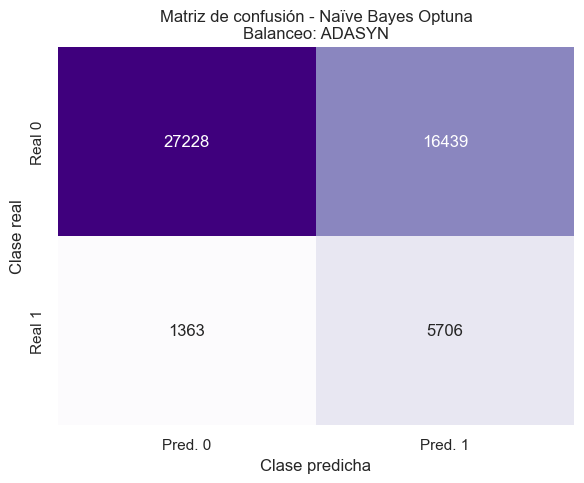

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.62      0.75     43667
Prediabetes/Diabetes       0.26      0.81      0.39      7069

            accuracy                           0.65     50736
           macro avg       0.60      0.72      0.57     50736
        weighted avg       0.86      0.65      0.70     50736



In [213]:
# ============================================================
# Diagnóstico de matriz de confusión - Naïve Bayes Optuna
# ============================================================

cm_nb_optuna = best_nb_optuna_result["Matriz Confusión"]
tn, fp, fn, tp = cm_nb_optuna.ravel()

n_total = tn + fp + fn + tp

nb_optuna_diagnostic = pd.DataFrame([{
    "Modelo": best_nb_optuna_result["Modelo"],
    "Método": best_nb_optuna_result["Método"],
    "Balanceo": best_nb_optuna_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_nb_optuna_result["Test Accuracy"],
    "Test Precision": best_nb_optuna_result["Test Precision"],
    "Test Recall": best_nb_optuna_result["Test Recall"],
    "Test F1": best_nb_optuna_result["Test F1"],
    "Test AUC": best_nb_optuna_result["Test AUC"]
}])

display(nb_optuna_diagnostic.round(4))


# ============================================================
# Matriz de confusión - Naïve Bayes Optuna
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_nb_optuna,
    annot=True,
    fmt="d",
    cmap="Purples",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Naïve Bayes Optuna\n"
    f"Balanceo: {best_nb_optuna_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_nb_optuna_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

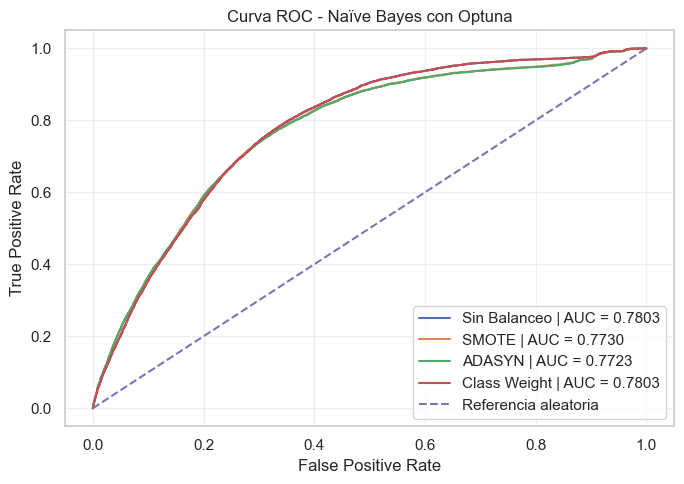

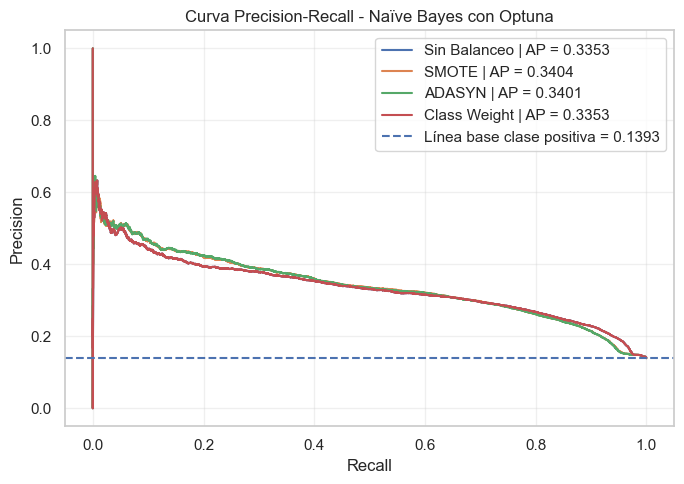

In [214]:
# ============================================================
# Curva ROC - Naïve Bayes Optuna
# ============================================================

plt.figure(figsize=(7, 5))

for result in nb_optuna_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - Naïve Bayes con Optuna")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - Naïve Bayes Optuna
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in nb_optuna_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Naïve Bayes con Optuna")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de Naïve Bayes con Optuna

En Naïve Bayes optimizado mediante Optuna se evaluó el hiperparámetro `var_smoothing`, el cual controla la estabilidad numérica del cálculo de probabilidades en GaussianNB. A diferencia de una búsqueda aleatoria simple, Optuna utiliza la información de ensayos anteriores para proponer nuevas configuraciones con mayor probabilidad de mejorar la métrica objetivo.

Los resultados fueron cargados desde archivos `.pkl` y `.joblib`, ya que esta implementación fue generada previamente mediante una estructura externa del equipo. Posteriormente, se adaptaron al formato general del proyecto para permitir la comparación con los demás modelos.

El mejor resultado se seleccionó con base en el recall sobre el conjunto de prueba, dado que el objetivo principal es mejorar la detección de casos positivos asociados a prediabetes o diabetes. Sin embargo, este resultado debe interpretarse junto con precisión, F1-score, AUC y matriz de confusión, debido a que un aumento en sensibilidad puede venir acompañado de una mayor cantidad de falsos positivos.

Las curvas ROC y Precision-Recall complementan la evaluación del modelo. En particular, la curva Precision-Recall es especialmente relevante por el desbalance de clases presente en el conjunto de datos.

### **21.4 Naïve Bayes con DEAP**

In [ ]:
espacio_gnb = {
    "var_smoothing": np.logspace(-11, -6, 30).tolist()
}

resultados_deap_gnb = optimizar_deap(
    modelo_nombre="GaussianNB",
    estimator=GaussianNB(),
    model_factory=gnb_factory,
    espacio=espacio_gnb,
    X_train=X_train,
    y_train=y_train,
    cv=cv_strategy,
    escalado=True,
    n_generaciones=5,
    tam_poblacion=20,
    scoring="recall"
)

In [120]:
# ============================================================
# Cargar archivos Naïve Bayes - DEAP
# ============================================================

import os
import glob
import pickle
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

NB_DEAP_DIR = (
    BASE_DIR
    / "machineentrega2"
    / "Modelos_Optimizados_No_Computacional"
    / "DEAP_GaussianNB"
)

print("Ruta Naïve Bayes DEAP:")
print(NB_DEAP_DIR)
print("Existe:", NB_DEAP_DIR.exists())

if not NB_DEAP_DIR.exists():
    raise FileNotFoundError(f"No existe la carpeta: {NB_DEAP_DIR}")

archivos_nb_deap = os.listdir(NB_DEAP_DIR)

print("\nArchivos encontrados:")
for archivo in archivos_nb_deap:
    print("-", archivo)

# Cargar archivo .pkl
pkl_files_nb_deap = [
    f for f in archivos_nb_deap
    if f.endswith(".pkl")
]

if len(pkl_files_nb_deap) == 0:
    raise FileNotFoundError("No se encontró ningún archivo .pkl para Naïve Bayes DEAP.")

pkl_path_nb_deap = NB_DEAP_DIR / pkl_files_nb_deap[0]

with open(pkl_path_nb_deap, "rb") as f:
    resultados_deap_nb_raw = pickle.load(f)

print("\nArchivo .pkl cargado correctamente:")
print(pkl_path_nb_deap)

print("\nTipo de objeto:")
print(type(resultados_deap_nb_raw))

# Adaptar si viene como único resultado
if isinstance(resultados_deap_nb_raw, dict) and (
    "Test Recall" in resultados_deap_nb_raw
    or "Recall" in resultados_deap_nb_raw
    or "Mejor recall CV" in resultados_deap_nb_raw
):
    resultados_deap_nb = {"DEAP": resultados_deap_nb_raw}
else:
    resultados_deap_nb = resultados_deap_nb_raw

print("\nClaves principales:")
print(resultados_deap_nb.keys())

# Identificar joblibs
joblib_files_nb_deap = [
    f for f in archivos_nb_deap
    if f.endswith(".joblib")
]

print("\nArchivos .joblib encontrados:")
for f in joblib_files_nb_deap:
    print("-", f)

Ruta Naïve Bayes DEAP:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\DEAP_GaussianNB
Existe: True

Archivos encontrados:
- deap_GaussianNB_ADASYN.joblib
- deap_GaussianNB_Class Weight.joblib
- deap_GaussianNB_resultados.pkl
- deap_GaussianNB_Sin Balanceo.joblib
- deap_GaussianNB_SMOTE.joblib

Archivo .pkl cargado correctamente:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\DEAP_GaussianNB\deap_GaussianNB_resultados.pkl

Tipo de objeto:
<class 'dict'>

Claves principales:
dict_keys(['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight'])

Archivos .joblib encontrados:
- deap_GaussianNB_ADASYN.joblib
- deap_GaussianNB_Class Weight.joblib
- deap_GaussianNB_Sin Balanceo.joblib
- deap_GaussianNB_SMOTE.joblib


In [121]:
# ============================================================
# Relacionar resultados DEAP con archivos joblib
# ============================================================

def normalizar_texto(texto):
    return (
        str(texto)
        .lower()
        .replace(" ", "")
        .replace("_", "")
        .replace("-", "")
    )


def encontrar_joblib_nb_deap(nombre_resultado, joblib_files):
    nombre_norm = normalizar_texto(nombre_resultado)

    patrones = {
        "deap": ["deap", "gaussiannb", "gnb", "nb"],
        "sinbalanceo": ["sinbalanceo", "none", "nobalance", "sin"],
        "none": ["sinbalanceo", "none", "nobalance", "sin"],
        "smote": ["smote"],
        "adasyn": ["adasyn"],
        "classweight": ["classweight", "class", "weight"]
    }

    patrones_busqueda = patrones.get(nombre_norm, [nombre_norm])

    for file in joblib_files:
        file_norm = normalizar_texto(file)

        if any(patron in file_norm for patron in patrones_busqueda):
            return file

    if len(joblib_files) == 1:
        return joblib_files[0]

    return None


joblib_map_deap_nb = {}

for nombre_resultado in resultados_deap_nb.keys():
    archivo_encontrado = encontrar_joblib_nb_deap(
        nombre_resultado,
        joblib_files_nb_deap
    )

    joblib_map_deap_nb[nombre_resultado] = archivo_encontrado

print("\nMapa resultado → joblib:")
for nombre_resultado, archivo in joblib_map_deap_nb.items():
    print(f"{nombre_resultado}: {archivo}")


Mapa resultado → joblib:
Sin Balanceo: deap_GaussianNB_Sin Balanceo.joblib
SMOTE: deap_GaussianNB_SMOTE.joblib
ADASYN: deap_GaussianNB_ADASYN.joblib
Class Weight: deap_GaussianNB_Class Weight.joblib


In [122]:
# ============================================================
# Naïve Bayes DEAP: predicciones, scores y matrices
# ============================================================

def obtener_valor(diccionario, posibles_claves, default=None):
    for clave in posibles_claves:
        if isinstance(diccionario, dict) and clave in diccionario:
            return diccionario.get(clave)
    return default


def extraer_params_nb_desde_pipeline(pipeline):
    modelo_nb = None

    if hasattr(pipeline, "named_steps"):
        for _, paso in pipeline.named_steps.items():
            if isinstance(paso, GaussianNB):
                modelo_nb = paso
                break

        if modelo_nb is None:
            modelo_nb = list(pipeline.named_steps.values())[-1]
    else:
        modelo_nb = pipeline

    params = {}

    if hasattr(modelo_nb, "var_smoothing"):
        params["var_smoothing"] = modelo_nb.var_smoothing

    return params


nb_deap_results = []

for nombre_resultado, res in resultados_deap_nb.items():

    joblib_file = joblib_map_deap_nb.get(nombre_resultado)

    if joblib_file is None:
        print(f"No se encontró joblib para: {nombre_resultado}")
        continue

    joblib_path = NB_DEAP_DIR / joblib_file

    loaded_nb_deap = joblib.load(joblib_path)

    # Si el joblib viene como diccionario, intentar extraer estimador
    if isinstance(loaded_nb_deap, dict):
        pipeline_nb_deap = (
            loaded_nb_deap.get("Best Estimator")
            or loaded_nb_deap.get("best_estimator")
            or loaded_nb_deap.get("Estimator")
            or loaded_nb_deap.get("modelo")
        )
    else:
        pipeline_nb_deap = loaded_nb_deap

    if pipeline_nb_deap is None:
        print(f"No se pudo extraer estimador desde: {joblib_path}")
        continue

    y_pred_nb_deap = pipeline_nb_deap.predict(X_test)

    if hasattr(pipeline_nb_deap, "predict_proba"):
        y_score_nb_deap = pipeline_nb_deap.predict_proba(X_test)

        if len(y_score_nb_deap.shape) == 2:
            y_score_nb_deap = y_score_nb_deap[:, 1]

    elif hasattr(pipeline_nb_deap, "decision_function"):
        y_score_nb_deap = pipeline_nb_deap.decision_function(X_test)

    else:
        y_score_nb_deap = y_pred_nb_deap

    cm_nb_deap = confusion_matrix(y_test, y_pred_nb_deap)

    best_params = obtener_valor(
        res,
        ["Mejores Hiperparámetros", "Best Params", "Mejores hiperparámetros", "params"]
    )

    if best_params is None:
        best_params = extraer_params_nb_desde_pipeline(pipeline_nb_deap)

    nb_deap_results.append({
        "Modelo": "Naïve Bayes",
        "Método": "DEAP",
        "Balanceo": obtener_valor(res, ["Balanceo", "balance_strategy"], nombre_resultado),

        "CV Recall": obtener_valor(res, ["Mejor recall CV", "CV Recall", "Best Recall", "Recall CV"]),
        "Std Recall CV": obtener_valor(res, ["Std recall CV", "Std Recall CV"]),

        "Test Accuracy": obtener_valor(res, ["Test Accuracy", "Accuracy"]),
        "Test Precision": obtener_valor(res, ["Test Precision", "Precision"]),
        "Test Recall": obtener_valor(res, ["Test Recall", "Recall"]),
        "Test F1": obtener_valor(res, ["Test F1", "F1"]),
        "Test AUC": obtener_valor(res, ["Test ROC AUC", "Test AUC", "ROC AUC"]),

        "Tiempo (s)": obtener_valor(res, ["Tiempo (s)", "Tiempo", "time"]),
        "Evaluaciones": obtener_valor(res, ["Iteraciones", "Evaluaciones", "n_evaluations"]),
        "Best Params": str(best_params),
        "Best Individual": str(obtener_valor(res, ["Best Individual", "Mejor individuo"])),

        "Best Estimator": pipeline_nb_deap,
        "Predicciones": y_pred_nb_deap,
        "Scores": y_score_nb_deap,
        "Matriz Confusión": cm_nb_deap,
        "Fuente": str(joblib_path),
        "Logbook": obtener_valor(res, ["Logbook", "Historial", "Historia", "logbook"])
    })

print(f"Resultados Naïve Bayes DEAP enriquecidos: {len(nb_deap_results)}")

Resultados Naïve Bayes DEAP enriquecidos: 4


In [123]:
# ============================================================
# Naïve Bayes DEAP: tabla resumen final
# ============================================================

nb_deap_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Método"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),
        "Std Recall CV": r.get("Std Recall CV"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": r.get("Best Params"),
        "Best Individual": r.get("Best Individual")
    }
    for r in nb_deap_results
])

nb_deap_summary = nb_deap_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(nb_deap_summary.round(4))

best_nb_deap_idx = nb_deap_summary["Test Recall"].idxmax()
best_balance_nb_deap = nb_deap_summary.loc[best_nb_deap_idx, "Balanceo"]

best_nb_deap_result = [
    r for r in nb_deap_results
    if r.get("Balanceo") == best_balance_nb_deap
][0]

print("Mejor Naïve Bayes con DEAP")
print("=" * 60)
print("Balanceo:", best_nb_deap_result["Balanceo"])
print("Test Accuracy:", round(best_nb_deap_result["Test Accuracy"], 4))
print("Test Precision:", round(best_nb_deap_result["Test Precision"], 4))
print("Test Recall:", round(best_nb_deap_result["Test Recall"], 4))
print("Test F1:", round(best_nb_deap_result["Test F1"], 4))
print("Test AUC:", round(best_nb_deap_result["Test AUC"], 4))
print("Best Params:", best_nb_deap_result["Best Params"])
print("Best Individual:", best_nb_deap_result["Best Individual"])

,Modelo,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params,Best Individual
2,Naïve Bayes,DEAP,ADASYN,0.8193,0.0,0.6491,0.2577,0.8072,0.3906,0.7723,5296.9349,100,{'var_smoothing': 2.8072162039411815e-08},None
1,Naïve Bayes,DEAP,SMOTE,0.7886,0.0,0.6749,0.2696,0.7800,0.4007,0.7730,797.7001,100,{'var_smoothing': 2.8072162039411815e-08},None
0,Naïve Bayes,DEAP,Sin Balanceo,0.5720,0.0,0.7722,0.3198,0.5639,0.4082,0.7803,120.0556,100,{'var_smoothing': 2.8072162039411815e-08},None
3,Naïve Bayes,DEAP,Class Weight,0.5720,0.0,0.7722,0.3198,0.5639,0.4082,0.7803,105.2476,100,{'var_smoothing': 2.8072162039411815e-08},None


Mejor Naïve Bayes con DEAP
Balanceo: ADASYN
Test Accuracy: 0.6491
Test Precision: 0.2577
Test Recall: 0.8072
Test F1: 0.3906
Test AUC: 0.7723
Best Params: {'var_smoothing': 2.8072162039411815e-08}
Best Individual: None


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,Naïve Bayes,DEAP,ADASYN,27228,16439,1363,5706,13.9329,43.6475,0.6491,0.2577,0.8072,0.3906,0.7723


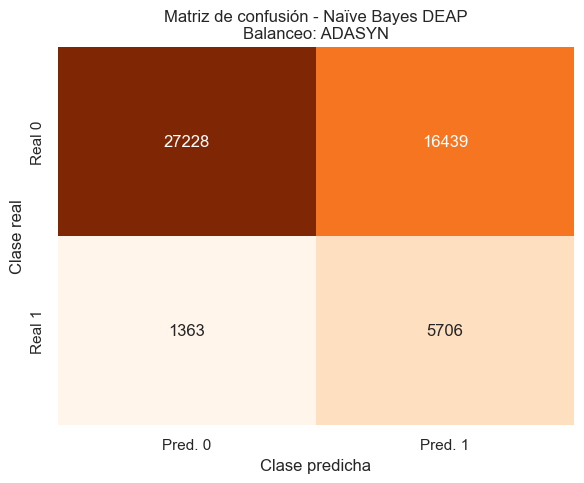

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.62      0.75     43667
Prediabetes/Diabetes       0.26      0.81      0.39      7069

            accuracy                           0.65     50736
           macro avg       0.60      0.72      0.57     50736
        weighted avg       0.86      0.65      0.70     50736



In [220]:
# ============================================================
# Diagnóstico de matriz de confusión - Naïve Bayes DEAP
# ============================================================

cm_nb_deap = best_nb_deap_result["Matriz Confusión"]
tn, fp, fn, tp = cm_nb_deap.ravel()

n_total = tn + fp + fn + tp

nb_deap_diagnostic = pd.DataFrame([{
    "Modelo": best_nb_deap_result["Modelo"],
    "Método": best_nb_deap_result["Método"],
    "Balanceo": best_nb_deap_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_nb_deap_result["Test Accuracy"],
    "Test Precision": best_nb_deap_result["Test Precision"],
    "Test Recall": best_nb_deap_result["Test Recall"],
    "Test F1": best_nb_deap_result["Test F1"],
    "Test AUC": best_nb_deap_result["Test AUC"]
}])

display(nb_deap_diagnostic.round(4))


# ============================================================
# Matriz de confusión - Naïve Bayes DEAP
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_nb_deap,
    annot=True,
    fmt="d",
    cmap="Oranges",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Naïve Bayes DEAP\n"
    f"Balanceo: {best_nb_deap_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_nb_deap_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

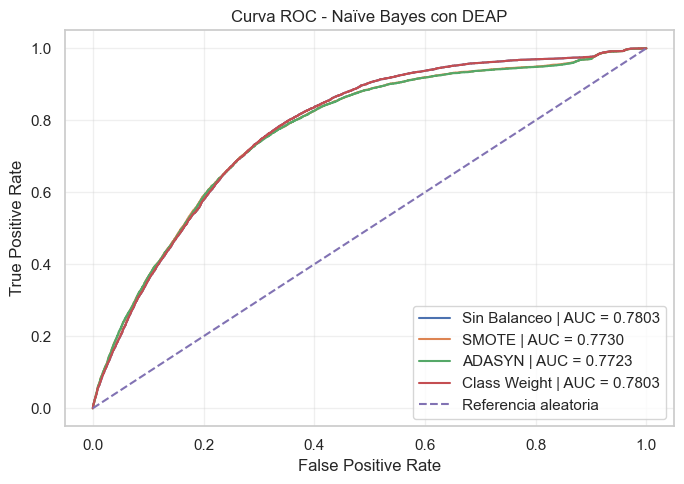

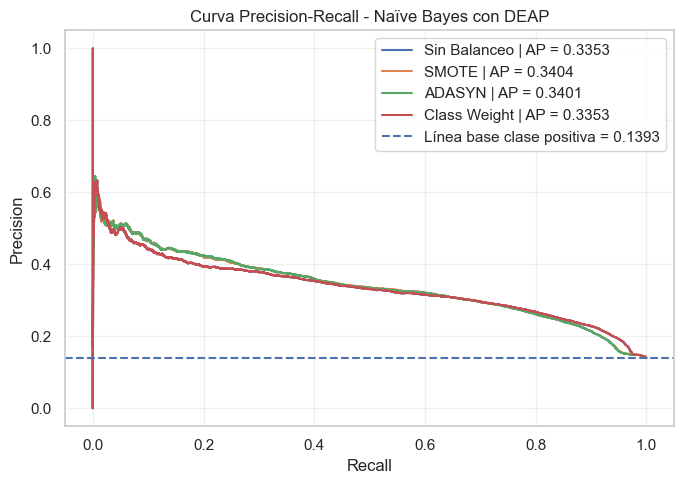

In [221]:
# ============================================================
# Curva ROC - Naïve Bayes DEAP
# ============================================================

plt.figure(figsize=(7, 5))

for result in nb_deap_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - Naïve Bayes con DEAP")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - Naïve Bayes DEAP
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in nb_deap_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Naïve Bayes con DEAP")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Historias evolutivas encontradas:
['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight']


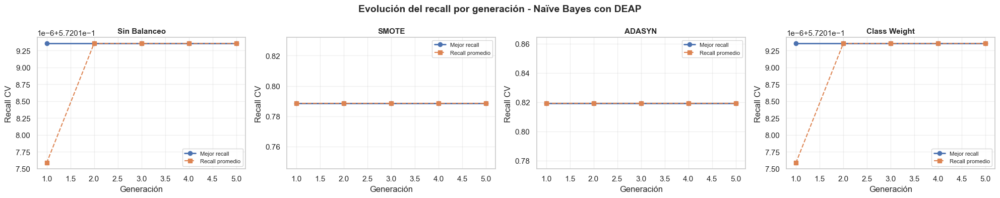

In [223]:
# ============================================================
# Gráfica de evolución del recall por generación - Naïve Bayes DEAP
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

def extraer_historia_deap_general(resultado):
    """
    Extrae la historia evolutiva de DEAP desde distintas estructuras posibles.
    Puede venir como:
    - Logbook
    - Historia
    - Historial
    - DataFrame
    - Lista de diccionarios
    """

    if not isinstance(resultado, dict):
        return None

    historia = (
        resultado.get("Logbook")
        or resultado.get("logbook")
        or resultado.get("Historia")
        or resultado.get("Historial")
    )

    if historia is None:
        return None

    if isinstance(historia, pd.DataFrame):
        hist_df = historia.copy()
    else:
        hist_df = pd.DataFrame(historia)

    if hist_df.empty:
        return None

    # Normalizar nombres de columnas
    rename_map = {
        "Generacion": "Generación",
        "generacion": "Generación",
        "generation": "Generación",
        "Best Recall": "Mejor recall",
        "best_recall": "Mejor recall",
        "max": "Mejor recall",
        "Max Recall": "Mejor recall",
        "Mean Recall": "Recall promedio",
        "mean": "Recall promedio",
        "Promedio Recall": "Recall promedio",
        "avg": "Recall promedio"
    }

    hist_df = hist_df.rename(columns=rename_map)

    # Si no existe columna de generación, crearla
    if "Generación" not in hist_df.columns:
        hist_df["Generación"] = np.arange(1, len(hist_df) + 1)

    return hist_df


# ============================================================
# Construir historias disponibles para Naïve Bayes DEAP
# ============================================================

historias_nb_deap = {}

# Caso 1: si tienes nb_deap_results, que es la lista adaptada
if "nb_deap_results" in globals():

    for resultado in nb_deap_results:
        nombre = resultado.get("Balanceo", "DEAP")
        hist_df = extraer_historia_deap_general(resultado)

        if hist_df is not None:
            historias_nb_deap[nombre] = hist_df

# Caso 2: si solo tienes best_nb_deap_result
if len(historias_nb_deap) == 0 and "best_nb_deap_result" in globals():

    hist_df = extraer_historia_deap_general(best_nb_deap_result)

    if hist_df is not None:
        nombre = best_nb_deap_result.get("Balanceo", "DEAP")
        historias_nb_deap[nombre] = hist_df


print("Historias evolutivas encontradas:")
print(list(historias_nb_deap.keys()))


# ============================================================
# Visualización de evolución DEAP - Naïve Bayes
# ============================================================

if len(historias_nb_deap) == 0:
    print("No se encontró historia evolutiva disponible para graficar.")

else:
    n_plots = len(historias_nb_deap)
    n_cols = min(4, n_plots)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(5 * n_cols, 4 * n_rows),
        squeeze=False
    )

    axes = axes.flatten()

    for ax, (nombre, hist_df) in zip(axes, historias_nb_deap.items()):

        hist_df = hist_df.copy()

        # Convertir a numérico cuando sea posible
        if "Mejor recall" in hist_df.columns:
            hist_df["Mejor recall"] = pd.to_numeric(
                hist_df["Mejor recall"],
                errors="coerce"
            )

        if "Recall promedio" in hist_df.columns:
            hist_df["Recall promedio"] = pd.to_numeric(
                hist_df["Recall promedio"],
                errors="coerce"
            )

        # Graficar mejor recall
        if "Mejor recall" in hist_df.columns:
            ax.plot(
                hist_df["Generación"],
                hist_df["Mejor recall"],
                marker="o",
                linewidth=2,
                label="Mejor recall"
            )

        # Graficar recall promedio si existe
        if "Recall promedio" in hist_df.columns and not hist_df["Recall promedio"].isna().all():
            ax.plot(
                hist_df["Generación"],
                hist_df["Recall promedio"],
                marker="s",
                linestyle="--",
                linewidth=1.5,
                label="Recall promedio"
            )

        ax.set_title(str(nombre), fontsize=11, fontweight="bold")
        ax.set_xlabel("Generación")
        ax.set_ylabel("Recall CV")
        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=8)

    # Ocultar ejes sobrantes
    for ax in axes[n_plots:]:
        ax.axis("off")

    plt.suptitle(
        "Evolución del recall por generación - Naïve Bayes con DEAP",
        fontsize=14,
        fontweight="bold"
    )

    plt.tight_layout()
    plt.show()

### Interpretación de Naïve Bayes con DEAP

En Naïve Bayes optimizado mediante DEAP se evaluó el hiperparámetro `var_smoothing` mediante un algoritmo evolutivo. En este enfoque, cada individuo representa una posible configuración del modelo, y el proceso de selección, cruce y mutación favorece progresivamente aquellas combinaciones que alcanzan mejor recall durante la validación.

Los resultados fueron cargados desde archivos `.pkl` y `.joblib`, ya que esta implementación fue generada previamente mediante una estructura externa del equipo. Posteriormente, se adaptaron al formato general del proyecto para permitir la comparación con los demás modelos.

El mejor resultado se seleccionó con base en el recall sobre el conjunto de prueba, dado que el objetivo principal es mejorar la detección de casos positivos asociados a prediabetes o diabetes. Sin embargo, este resultado debe analizarse junto con precisión, F1-score, AUC y matriz de confusión, para verificar si la sensibilidad se obtiene a costa de un aumento excesivo de falsos positivos.

Las curvas ROC y Precision-Recall complementan la evaluación. La curva Precision-Recall resulta especialmente relevante debido al desbalance de clases del conjunto de datos.

## **22. XGBoost**

### **22.1 XGBoost con Grid Search**

In [ ]:
param_grid_xgb = {
    "modelo__n_estimators":  [100, 200, 300],
    "modelo__max_depth":     [3, 4, 6],
    "modelo__learning_rate": [0.05, 0.1, 0.2]
}
 
resultados_gs_xgb = optimizar_gridsearch(
    modelo_nombre="XGBoost",
    estimator=XGBClassifier(
        subsample=0.8,
        colsample_bytree=0.8,
        objective="binary:logistic",
        eval_metric="logloss",
        random_state=RANDOM_STATE,
        n_jobs=-1
    ),
    param_grid=param_grid_xgb,
    X_train=X_train,
    y_train=y_train,
    cv=cv_strategy,
    escalado=False,      
    scoring="recall"
) 

In [124]:
# ============================================================
# Cargar archivos XGBoost - Grid Search
# ============================================================

import os
import glob
import pickle
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from xgboost import XGBClassifier
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

XGB_GRID_DIR = (
    BASE_DIR
    / "machineentrega2"
    / "Modelos_Optimizados_No_Computacional"
    / "Grid_XGBoost"
)

print("Ruta XGBoost Grid Search:")
print(XGB_GRID_DIR)
print("Existe:", XGB_GRID_DIR.exists())

if not XGB_GRID_DIR.exists():
    raise FileNotFoundError(f"No existe la carpeta: {XGB_GRID_DIR}")

archivos_xgb_grid = os.listdir(XGB_GRID_DIR)

print("\nArchivos encontrados:")
for archivo in archivos_xgb_grid:
    print("-", archivo)

# Cargar archivo .pkl
pkl_files_xgb_grid = [
    f for f in archivos_xgb_grid
    if f.endswith(".pkl")
]

if len(pkl_files_xgb_grid) == 0:
    raise FileNotFoundError("No se encontró ningún archivo .pkl para XGBoost Grid Search.")

pkl_path_xgb_grid = XGB_GRID_DIR / pkl_files_xgb_grid[0]

with open(pkl_path_xgb_grid, "rb") as f:
    resultados_grid_xgb_raw = pickle.load(f)

print("\nArchivo .pkl cargado correctamente:")
print(pkl_path_xgb_grid)

print("\nTipo de objeto:")
print(type(resultados_grid_xgb_raw))

# Adaptar si viene como único resultado
if isinstance(resultados_grid_xgb_raw, dict) and (
    "Test Recall" in resultados_grid_xgb_raw
    or "Recall" in resultados_grid_xgb_raw
    or "Mejor recall CV" in resultados_grid_xgb_raw
):
    resultados_grid_xgb = {"Grid Search": resultados_grid_xgb_raw}
else:
    resultados_grid_xgb = resultados_grid_xgb_raw

print("\nClaves principales:")
print(resultados_grid_xgb.keys())

# Identificar joblibs
joblib_files_xgb_grid = [
    f for f in archivos_xgb_grid
    if f.endswith(".joblib")
]

print("\nArchivos .joblib encontrados:")
for f in joblib_files_xgb_grid:
    print("-", f)

Ruta XGBoost Grid Search:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Grid_XGBoost
Existe: True

Archivos encontrados:
- grid_search_XGBoost_ADASYN.joblib
- grid_search_XGBoost_Class Weight.joblib
- grid_search_XGBoost_Sin Balanceo.joblib
- grid_search_XGBoost_SMOTE.joblib
- grid_XGBoost_resultados.pkl

Archivo .pkl cargado correctamente:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Grid_XGBoost\grid_XGBoost_resultados.pkl

Tipo de objeto:
<class 'dict'>

Claves principales:
dict_keys(['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight'])

Archivos .joblib encontrados:
- grid_search_XGBoost_ADASYN.joblib
- grid_search_XGBoost_Class Weight.joblib
- grid_search_XGBoost_Sin Balanceo.joblib
- grid_search_XGBoost_SMOTE.joblib


In [125]:
# ============================================================
# Relacionar resultados XGBoost Grid con archivos joblib
# ============================================================

def normalizar_texto(texto):
    return (
        str(texto)
        .lower()
        .replace(" ", "")
        .replace("_", "")
        .replace("-", "")
    )


def encontrar_joblib_xgb_grid(nombre_resultado, joblib_files):
    nombre_norm = normalizar_texto(nombre_resultado)

    patrones = {
        "gridsearch": ["grid", "xgboost", "xgb"],
        "sinbalanceo": ["sinbalanceo", "none", "nobalance", "sin"],
        "none": ["sinbalanceo", "none", "nobalance", "sin"],
        "smote": ["smote"],
        "adasyn": ["adasyn"],
        "scaleposweight": ["scaleposweight", "scale", "pos", "weight"],
        "classweight": ["classweight", "class", "weight"]
    }

    patrones_busqueda = patrones.get(nombre_norm, [nombre_norm])

    for file in joblib_files:
        file_norm = normalizar_texto(file)

        if any(patron in file_norm for patron in patrones_busqueda):
            return file

    if len(joblib_files) == 1:
        return joblib_files[0]

    return None


joblib_map_grid_xgb = {}

for nombre_resultado in resultados_grid_xgb.keys():
    archivo_encontrado = encontrar_joblib_xgb_grid(
        nombre_resultado,
        joblib_files_xgb_grid
    )

    joblib_map_grid_xgb[nombre_resultado] = archivo_encontrado

print("\nMapa resultado → joblib:")
for nombre_resultado, archivo in joblib_map_grid_xgb.items():
    print(f"{nombre_resultado}: {archivo}")


Mapa resultado → joblib:
Sin Balanceo: grid_search_XGBoost_Sin Balanceo.joblib
SMOTE: grid_search_XGBoost_SMOTE.joblib
ADASYN: grid_search_XGBoost_ADASYN.joblib
Class Weight: grid_search_XGBoost_Class Weight.joblib


In [126]:
# ============================================================
# XGBoost Grid Search: predicciones, scores y matrices
# ============================================================

def obtener_valor(diccionario, posibles_claves, default=None):
    for clave in posibles_claves:
        if isinstance(diccionario, dict) and clave in diccionario:
            return diccionario.get(clave)
    return default


def extraer_params_xgb_desde_pipeline(pipeline):
    modelo_xgb = None

    if hasattr(pipeline, "named_steps"):
        for _, paso in pipeline.named_steps.items():
            if isinstance(paso, XGBClassifier):
                modelo_xgb = paso
                break

        if modelo_xgb is None:
            modelo_xgb = list(pipeline.named_steps.values())[-1]
    else:
        modelo_xgb = pipeline

    params = {}

    for param in [
        "n_estimators",
        "max_depth",
        "learning_rate",
        "subsample",
        "colsample_bytree",
        "scale_pos_weight"
    ]:
        if hasattr(modelo_xgb, param):
            params[param] = getattr(modelo_xgb, param)

    return params


xgb_grid_results = []

for nombre_resultado, res in resultados_grid_xgb.items():

    joblib_file = joblib_map_grid_xgb.get(nombre_resultado)

    if joblib_file is None:
        print(f"No se encontró joblib para: {nombre_resultado}")
        continue

    joblib_path = XGB_GRID_DIR / joblib_file

    loaded_xgb_grid = joblib.load(joblib_path)

    # Si el joblib viene como diccionario, intentar extraer estimador
    if isinstance(loaded_xgb_grid, dict):
        pipeline_xgb_grid = (
            loaded_xgb_grid.get("Best Estimator")
            or loaded_xgb_grid.get("best_estimator")
            or loaded_xgb_grid.get("Estimator")
            or loaded_xgb_grid.get("modelo")
        )
    else:
        pipeline_xgb_grid = loaded_xgb_grid

    if pipeline_xgb_grid is None:
        print(f"No se pudo extraer estimador desde: {joblib_path}")
        continue

    y_pred_xgb_grid = pipeline_xgb_grid.predict(X_test)

    if hasattr(pipeline_xgb_grid, "predict_proba"):
        y_score_xgb_grid = pipeline_xgb_grid.predict_proba(X_test)

        if len(y_score_xgb_grid.shape) == 2:
            y_score_xgb_grid = y_score_xgb_grid[:, 1]

    elif hasattr(pipeline_xgb_grid, "decision_function"):
        y_score_xgb_grid = pipeline_xgb_grid.decision_function(X_test)

    else:
        y_score_xgb_grid = y_pred_xgb_grid

    cm_xgb_grid = confusion_matrix(y_test, y_pred_xgb_grid)

    best_params = obtener_valor(
        res,
        ["Mejores Hiperparámetros", "Best Params", "Mejores hiperparámetros", "params"]
    )

    if best_params is None:
        best_params = extraer_params_xgb_desde_pipeline(pipeline_xgb_grid)

    xgb_grid_results.append({
        "Modelo": "XGBoost",
        "Método": "Grid Search",
        "Balanceo": obtener_valor(res, ["Balanceo", "balance_strategy"], nombre_resultado),

        "CV Recall": obtener_valor(res, ["Mejor recall CV", "CV Recall", "Best Recall", "Recall CV"]),
        "Std Recall CV": obtener_valor(res, ["Std recall CV", "Std Recall CV"]),

        "Test Accuracy": obtener_valor(res, ["Test Accuracy", "Accuracy"]),
        "Test Precision": obtener_valor(res, ["Test Precision", "Precision"]),
        "Test Recall": obtener_valor(res, ["Test Recall", "Recall"]),
        "Test F1": obtener_valor(res, ["Test F1", "F1"]),
        "Test AUC": obtener_valor(res, ["Test ROC AUC", "Test AUC", "ROC AUC"]),

        "Tiempo (s)": obtener_valor(res, ["Tiempo (s)", "Tiempo", "time"]),
        "Evaluaciones": obtener_valor(res, ["Iteraciones", "Evaluaciones", "n_evaluations"]),
        "Best Params": str(best_params),

        "Best Estimator": pipeline_xgb_grid,
        "Predicciones": y_pred_xgb_grid,
        "Scores": y_score_xgb_grid,
        "Matriz Confusión": cm_xgb_grid,
        "Fuente": str(joblib_path)
    })

print(f"Resultados XGBoost Grid Search enriquecidos: {len(xgb_grid_results)}")

Resultados XGBoost Grid Search enriquecidos: 4


In [127]:
# ============================================================
# XGBoost Grid Search: tabla resumen final
# ============================================================

xgb_grid_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Método"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),
        "Std Recall CV": r.get("Std Recall CV"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": r.get("Best Params")
    }
    for r in xgb_grid_results
])

xgb_grid_summary = xgb_grid_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(xgb_grid_summary.round(4))

best_xgb_grid_idx = xgb_grid_summary["Test Recall"].idxmax()
best_balance_xgb_grid = xgb_grid_summary.loc[best_xgb_grid_idx, "Balanceo"]

best_xgb_grid_result = [
    r for r in xgb_grid_results
    if r.get("Balanceo") == best_balance_xgb_grid
][0]

print("Mejor XGBoost con Grid Search")
print("=" * 60)
print("Balanceo:", best_xgb_grid_result["Balanceo"])
print("Test Accuracy:", round(best_xgb_grid_result["Test Accuracy"], 4))
print("Test Precision:", round(best_xgb_grid_result["Test Precision"], 4))
print("Test Recall:", round(best_xgb_grid_result["Test Recall"], 4))
print("Test F1:", round(best_xgb_grid_result["Test F1"], 4))
print("Test AUC:", round(best_xgb_grid_result["Test AUC"], 4))
print("Best Params:", best_xgb_grid_result["Best Params"])

,Modelo,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
3,XGBoost,Grid Search,Class Weight,0.7956,0.0053,0.7204,0.3059,0.7935,0.4416,0.8275,183.1376,27,"{'modelo__learning_rate': 0.05, 'modelo__max_d..."
1,XGBoost,Grid Search,SMOTE,0.5099,0.0079,0.8198,0.3879,0.5073,0.4396,0.8152,710.8679,27,"{'modelo__learning_rate': 0.05, 'modelo__max_d..."
2,XGBoost,Grid Search,ADASYN,0.4972,0.0033,0.8201,0.3864,0.4953,0.4341,0.8129,1509.7905,27,"{'modelo__learning_rate': 0.05, 'modelo__max_d..."
0,XGBoost,Grid Search,Sin Balanceo,0.1828,0.0066,0.8635,0.5297,0.1777,0.2661,0.8201,224.1646,27,"{'modelo__learning_rate': 0.2, 'modelo__max_de..."


Mejor XGBoost con Grid Search
Balanceo: Class Weight
Test Accuracy: 0.7204
Test Precision: 0.3059
Test Recall: 0.7935
Test F1: 0.4416
Test AUC: 0.8275
Best Params: {'modelo__learning_rate': 0.05, 'modelo__max_depth': 4, 'modelo__n_estimators': 300}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,XGBoost,Grid Search,Class Weight,30941,12726,1460,5609,13.9329,36.138,0.7204,0.3059,0.7935,0.4416,0.8275


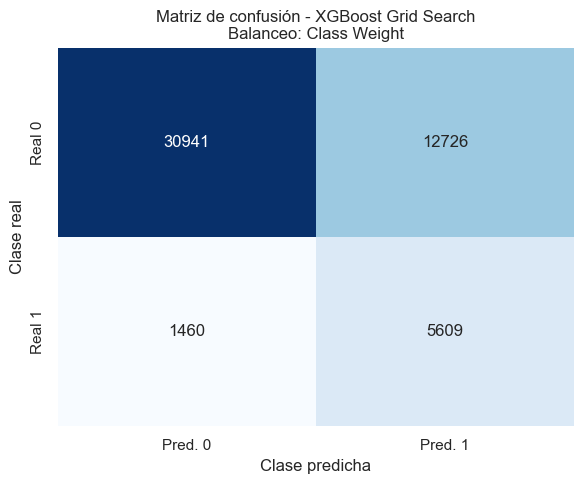

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.71      0.81     43667
Prediabetes/Diabetes       0.31      0.79      0.44      7069

            accuracy                           0.72     50736
           macro avg       0.63      0.75      0.63     50736
        weighted avg       0.86      0.72      0.76     50736



In [231]:
# ============================================================
# Diagnóstico de matriz de confusión - XGBoost Grid Search
# ============================================================

cm_xgb_grid = best_xgb_grid_result["Matriz Confusión"]
tn, fp, fn, tp = cm_xgb_grid.ravel()

n_total = tn + fp + fn + tp

xgb_grid_diagnostic = pd.DataFrame([{
    "Modelo": best_xgb_grid_result["Modelo"],
    "Método": best_xgb_grid_result["Método"],
    "Balanceo": best_xgb_grid_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_xgb_grid_result["Test Accuracy"],
    "Test Precision": best_xgb_grid_result["Test Precision"],
    "Test Recall": best_xgb_grid_result["Test Recall"],
    "Test F1": best_xgb_grid_result["Test F1"],
    "Test AUC": best_xgb_grid_result["Test AUC"]
}])

display(xgb_grid_diagnostic.round(4))


# ============================================================
# Matriz de confusión - XGBoost Grid Search
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_xgb_grid,
    annot=True,
    fmt="d",
    cmap="Blues",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - XGBoost Grid Search\n"
    f"Balanceo: {best_xgb_grid_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_xgb_grid_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

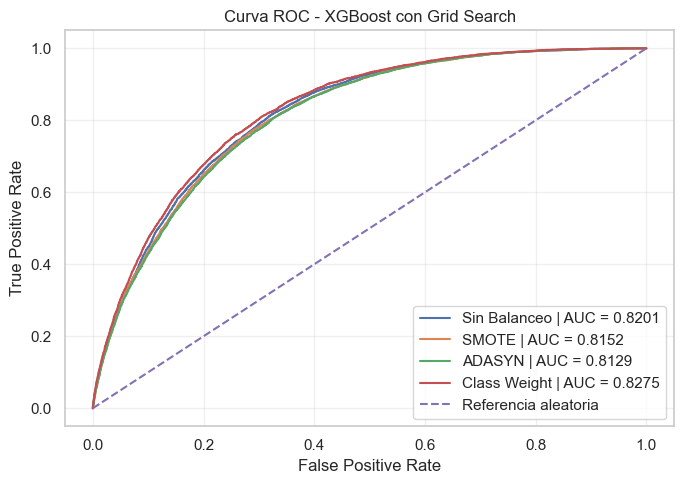

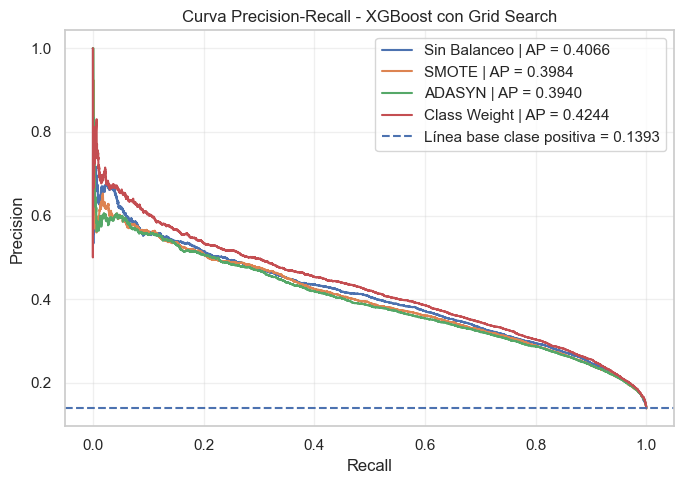

In [232]:
# ============================================================
# Curva ROC - XGBoost Grid Search
# ============================================================

plt.figure(figsize=(7, 5))

for result in xgb_grid_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - XGBoost con Grid Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - XGBoost Grid Search
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in xgb_grid_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - XGBoost con Grid Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de XGBoost con Grid Search

En XGBoost optimizado mediante Grid Search se evaluaron combinaciones de hiperparámetros asociados a la complejidad y capacidad de aprendizaje del modelo, como `n_estimators`, `max_depth` y `learning_rate`. Esta búsqueda exhaustiva permite comparar de forma sistemática las configuraciones candidatas dentro del espacio definido.

Los resultados fueron cargados desde archivos `.pkl` y `.joblib`, debido a que esta implementación fue generada previamente mediante una estructura externa del equipo. Posteriormente, se adaptaron al formato general del proyecto para permitir su comparación con los demás modelos.

El mejor resultado se seleccionó con base en el recall sobre el conjunto de prueba, en coherencia con el objetivo principal del proyecto: mejorar la detección de casos positivos asociados a prediabetes o diabetes. Sin embargo, este valor debe analizarse junto con precisión, F1-score, AUC y matriz de confusión, ya que un recall elevado puede estar acompañado de un aumento en falsos positivos.

Las curvas ROC y Precision-Recall complementan la evaluación. En este caso, la curva Precision-Recall es especialmente importante porque permite analizar el desempeño del modelo sobre la clase positiva minoritaria.

### **22.2 XGBoost con Random Search**

In [ ]:
param_dist_xgb = {
    "modelo__n_estimators":     [100, 150, 200, 250, 300, 400, 500],
    "modelo__max_depth":        [3, 4, 5, 6, 7, 8],
    "modelo__learning_rate":    np.logspace(-2, -0.5, 20).tolist(),  # 0.01 a 0.3
    "modelo__subsample":        [0.6, 0.7, 0.8, 0.9, 1.0],
    "modelo__colsample_bytree": [0.6, 0.7, 0.8, 0.9, 1.0],
    "modelo__min_child_weight": [1, 3, 5, 7, 10]
}
 
resultados_rs_xgb = optimizar_randomsearch(
    modelo_nombre="XGBoost",
    estimator=XGBClassifier(
        objective="binary:logistic",
        eval_metric="logloss",
        random_state=RANDOM_STATE,
        n_jobs=-1
    ),
    param_distributions=param_dist_xgb,
    X_train=X_train,
    y_train=y_train,
    cv=cv_strategy,
    escalado=False,
    scoring="recall",
    n_iter=30
)

In [128]:
# ============================================================
# Cargar archivos XGBoost - Random Search
# ============================================================

import os
import glob
import pickle
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from xgboost import XGBClassifier
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

XGB_RANDOM_DIR = (
    BASE_DIR
    / "machineentrega2"
    / "Modelos_Optimizados_No_Computacional"
    / "Random_XGBoost"
)

print("Ruta XGBoost Random Search:")
print(XGB_RANDOM_DIR)
print("Existe:", XGB_RANDOM_DIR.exists())

if not XGB_RANDOM_DIR.exists():
    raise FileNotFoundError(f"No existe la carpeta: {XGB_RANDOM_DIR}")

archivos_xgb_random = os.listdir(XGB_RANDOM_DIR)

print("\nArchivos encontrados:")
for archivo in archivos_xgb_random:
    print("-", archivo)

# Cargar archivo .pkl
pkl_files_xgb_random = [
    f for f in archivos_xgb_random
    if f.endswith(".pkl")
]

if len(pkl_files_xgb_random) == 0:
    raise FileNotFoundError("No se encontró ningún archivo .pkl para XGBoost Random Search.")

pkl_path_xgb_random = XGB_RANDOM_DIR / pkl_files_xgb_random[0]

with open(pkl_path_xgb_random, "rb") as f:
    resultados_random_xgb_raw = pickle.load(f)

print("\nArchivo .pkl cargado correctamente:")
print(pkl_path_xgb_random)

print("\nTipo de objeto:")
print(type(resultados_random_xgb_raw))

# Adaptar estructura si viene como único resultado
if isinstance(resultados_random_xgb_raw, dict) and (
    "Test Recall" in resultados_random_xgb_raw
    or "Recall" in resultados_random_xgb_raw
    or "Mejor recall CV" in resultados_random_xgb_raw
):
    resultados_random_xgb = {"Random Search": resultados_random_xgb_raw}
else:
    resultados_random_xgb = resultados_random_xgb_raw

print("\nClaves principales:")
print(resultados_random_xgb.keys())

# Identificar joblibs
joblib_files_xgb_random = [
    f for f in archivos_xgb_random
    if f.endswith(".joblib")
]

print("\nArchivos .joblib encontrados:")
for f in joblib_files_xgb_random:
    print("-", f)

Ruta XGBoost Random Search:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Random_XGBoost
Existe: True

Archivos encontrados:
- random_search_XGBoost_ADASYN.joblib
- random_search_XGBoost_Class Weight.joblib
- random_search_XGBoost_Sin Balanceo.joblib
- random_search_XGBoost_SMOTE.joblib
- random_XGBoost_resultados.pkl

Archivo .pkl cargado correctamente:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Random_XGBoost\random_XGBoost_resultados.pkl

Tipo de objeto:
<class 'dict'>

Claves principales:
dict_keys(['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight'])

Archivos .joblib encontrados:
- random_search_XGBoost_ADASYN.joblib
- random_search_XGBoost_Class Weight.joblib
- random_search_XGBoost_Sin Balanceo.joblib
- random_search_XGBoost_SMOTE.joblib


In [129]:
# ============================================================
# Relacionar resultados XGBoost Random con archivos joblib
# ============================================================

def normalizar_texto(texto):
    return (
        str(texto)
        .lower()
        .replace(" ", "")
        .replace("_", "")
        .replace("-", "")
    )


def encontrar_joblib_xgb_random(nombre_resultado, joblib_files):
    nombre_norm = normalizar_texto(nombre_resultado)

    patrones = {
        "randomsearch": ["random", "xgboost", "xgb"],
        "sinbalanceo": ["sinbalanceo", "none", "nobalance", "sin"],
        "none": ["sinbalanceo", "none", "nobalance", "sin"],
        "smote": ["smote"],
        "adasyn": ["adasyn"],
        "scaleposweight": ["scaleposweight", "scale", "pos", "weight"],
        "scale_pos_weight": ["scaleposweight", "scale", "pos", "weight"],
        "classweight": ["classweight", "class", "weight"]
    }

    patrones_busqueda = patrones.get(nombre_norm, [nombre_norm])

    for file in joblib_files:
        file_norm = normalizar_texto(file)

        if any(patron in file_norm for patron in patrones_busqueda):
            return file

    if len(joblib_files) == 1:
        return joblib_files[0]

    return None


joblib_map_random_xgb = {}

for nombre_resultado in resultados_random_xgb.keys():
    archivo_encontrado = encontrar_joblib_xgb_random(
        nombre_resultado,
        joblib_files_xgb_random
    )

    joblib_map_random_xgb[nombre_resultado] = archivo_encontrado

print("\nMapa resultado → joblib:")
for nombre_resultado, archivo in joblib_map_random_xgb.items():
    print(f"{nombre_resultado}: {archivo}")


Mapa resultado → joblib:
Sin Balanceo: random_search_XGBoost_Sin Balanceo.joblib
SMOTE: random_search_XGBoost_SMOTE.joblib
ADASYN: random_search_XGBoost_ADASYN.joblib
Class Weight: random_search_XGBoost_Class Weight.joblib


In [130]:
# ============================================================
# XGBoost Random Search: predicciones, scores y matrices
# ============================================================

def obtener_valor(diccionario, posibles_claves, default=None):
    for clave in posibles_claves:
        if isinstance(diccionario, dict) and clave in diccionario:
            return diccionario.get(clave)
    return default


def extraer_params_xgb_desde_pipeline(pipeline):
    modelo_xgb = None

    if hasattr(pipeline, "named_steps"):
        for _, paso in pipeline.named_steps.items():
            if isinstance(paso, XGBClassifier):
                modelo_xgb = paso
                break

        if modelo_xgb is None:
            modelo_xgb = list(pipeline.named_steps.values())[-1]
    else:
        modelo_xgb = pipeline

    params = {}

    for param in [
        "n_estimators",
        "max_depth",
        "learning_rate",
        "subsample",
        "colsample_bytree",
        "min_child_weight",
        "scale_pos_weight"
    ]:
        if hasattr(modelo_xgb, param):
            params[param] = getattr(modelo_xgb, param)

    return params


xgb_random_results = []

for nombre_resultado, res in resultados_random_xgb.items():

    joblib_file = joblib_map_random_xgb.get(nombre_resultado)

    if joblib_file is None:
        print(f"No se encontró joblib para: {nombre_resultado}")
        continue

    joblib_path = XGB_RANDOM_DIR / joblib_file

    loaded_xgb_random = joblib.load(joblib_path)

    # Si el joblib viene como diccionario, intentar extraer estimador
    if isinstance(loaded_xgb_random, dict):
        pipeline_xgb_random = (
            loaded_xgb_random.get("Best Estimator")
            or loaded_xgb_random.get("best_estimator")
            or loaded_xgb_random.get("Estimator")
            or loaded_xgb_random.get("modelo")
        )
    else:
        pipeline_xgb_random = loaded_xgb_random

    if pipeline_xgb_random is None:
        print(f"No se pudo extraer estimador desde: {joblib_path}")
        continue

    y_pred_xgb_random = pipeline_xgb_random.predict(X_test)

    if hasattr(pipeline_xgb_random, "predict_proba"):
        y_score_xgb_random = pipeline_xgb_random.predict_proba(X_test)

        if len(y_score_xgb_random.shape) == 2:
            y_score_xgb_random = y_score_xgb_random[:, 1]

    elif hasattr(pipeline_xgb_random, "decision_function"):
        y_score_xgb_random = pipeline_xgb_random.decision_function(X_test)

    else:
        y_score_xgb_random = y_pred_xgb_random

    cm_xgb_random = confusion_matrix(y_test, y_pred_xgb_random)

    best_params = obtener_valor(
        res,
        ["Mejores Hiperparámetros", "Best Params", "Mejores hiperparámetros", "params"]
    )

    if best_params is None:
        best_params = extraer_params_xgb_desde_pipeline(pipeline_xgb_random)

    xgb_random_results.append({
        "Modelo": "XGBoost",
        "Método": "Random Search",
        "Balanceo": obtener_valor(res, ["Balanceo", "balance_strategy"], nombre_resultado),

        "CV Recall": obtener_valor(res, ["Mejor recall CV", "CV Recall", "Best Recall", "Recall CV"]),
        "Std Recall CV": obtener_valor(res, ["Std recall CV", "Std Recall CV"]),

        "Test Accuracy": obtener_valor(res, ["Test Accuracy", "Accuracy"]),
        "Test Precision": obtener_valor(res, ["Test Precision", "Precision"]),
        "Test Recall": obtener_valor(res, ["Test Recall", "Recall"]),
        "Test F1": obtener_valor(res, ["Test F1", "F1"]),
        "Test AUC": obtener_valor(res, ["Test ROC AUC", "Test AUC", "ROC AUC"]),

        "Tiempo (s)": obtener_valor(res, ["Tiempo (s)", "Tiempo", "time"]),
        "Evaluaciones": obtener_valor(res, ["Iteraciones", "Evaluaciones", "n_evaluations"]),
        "Best Params": str(best_params),

        "Best Estimator": pipeline_xgb_random,
        "Predicciones": y_pred_xgb_random,
        "Scores": y_score_xgb_random,
        "Matriz Confusión": cm_xgb_random,
        "Fuente": str(joblib_path)
    })

print(f"Resultados XGBoost Random Search enriquecidos: {len(xgb_random_results)}")

Resultados XGBoost Random Search enriquecidos: 4


In [131]:
# ============================================================
# XGBoost Random Search: tabla resumen final
# ============================================================

xgb_random_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Método"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),
        "Std Recall CV": r.get("Std Recall CV"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": r.get("Best Params")
    }
    for r in xgb_random_results
])

xgb_random_summary = xgb_random_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(xgb_random_summary.round(4))

best_xgb_random_idx = xgb_random_summary["Test Recall"].idxmax()
best_balance_xgb_random = xgb_random_summary.loc[best_xgb_random_idx, "Balanceo"]

best_xgb_random_result = [
    r for r in xgb_random_results
    if r.get("Balanceo") == best_balance_xgb_random
][0]

print("Mejor XGBoost con Random Search")
print("=" * 60)
print("Balanceo:", best_xgb_random_result["Balanceo"])
print("Test Accuracy:", round(best_xgb_random_result["Test Accuracy"], 4))
print("Test Precision:", round(best_xgb_random_result["Test Precision"], 4))
print("Test Recall:", round(best_xgb_random_result["Test Recall"], 4))
print("Test F1:", round(best_xgb_random_result["Test F1"], 4))
print("Test AUC:", round(best_xgb_random_result["Test AUC"], 4))
print("Best Params:", best_xgb_random_result["Best Params"])

,Modelo,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
3,XGBoost,Random Search,Class Weight,0.7956,0.0045,0.7197,0.3054,0.7937,0.4411,0.8271,290.3679,30,"{'modelo__subsample': 0.9, 'modelo__n_estimato..."
1,XGBoost,Random Search,SMOTE,0.5801,0.0040,0.8009,0.3647,0.5787,0.4474,0.8108,974.0333,30,"{'modelo__subsample': 0.6, 'modelo__n_estimato..."
2,XGBoost,Random Search,ADASYN,0.5624,0.0047,0.7990,0.3610,0.5750,0.4436,0.8086,1890.4856,30,"{'modelo__subsample': 0.6, 'modelo__n_estimato..."
0,XGBoost,Random Search,Sin Balanceo,0.2285,0.0056,0.8542,0.4530,0.2235,0.2993,0.7930,340.1676,30,"{'modelo__subsample': 0.6, 'modelo__n_estimato..."


Mejor XGBoost con Random Search
Balanceo: Class Weight
Test Accuracy: 0.7197
Test Precision: 0.3054
Test Recall: 0.7937
Test F1: 0.4411
Test AUC: 0.8271
Best Params: {'modelo__subsample': 0.9, 'modelo__n_estimators': 500, 'modelo__min_child_weight': 10, 'modelo__max_depth': 4, 'modelo__learning_rate': 0.017252105499420408, 'modelo__colsample_bytree': 1.0}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,XGBoost,Random Search,Class Weight,30905,12762,1458,5611,13.9329,36.2129,0.7197,0.3054,0.7937,0.4411,0.8271


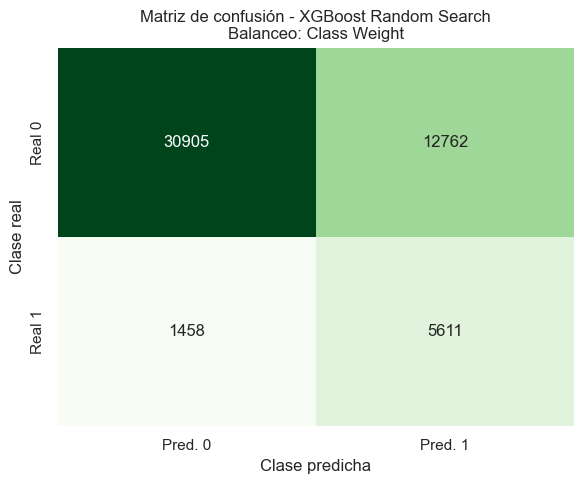

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.71      0.81     43667
Prediabetes/Diabetes       0.31      0.79      0.44      7069

            accuracy                           0.72     50736
           macro avg       0.63      0.75      0.63     50736
        weighted avg       0.86      0.72      0.76     50736



In [237]:
# ============================================================
# Diagnóstico de matriz de confusión - XGBoost Random Search
# ============================================================

cm_xgb_random = best_xgb_random_result["Matriz Confusión"]
tn, fp, fn, tp = cm_xgb_random.ravel()

n_total = tn + fp + fn + tp

xgb_random_diagnostic = pd.DataFrame([{
    "Modelo": best_xgb_random_result["Modelo"],
    "Método": best_xgb_random_result["Método"],
    "Balanceo": best_xgb_random_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_xgb_random_result["Test Accuracy"],
    "Test Precision": best_xgb_random_result["Test Precision"],
    "Test Recall": best_xgb_random_result["Test Recall"],
    "Test F1": best_xgb_random_result["Test F1"],
    "Test AUC": best_xgb_random_result["Test AUC"]
}])

display(xgb_random_diagnostic.round(4))


# ============================================================
# Matriz de confusión - XGBoost Random Search
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_xgb_random,
    annot=True,
    fmt="d",
    cmap="Greens",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - XGBoost Random Search\n"
    f"Balanceo: {best_xgb_random_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_xgb_random_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

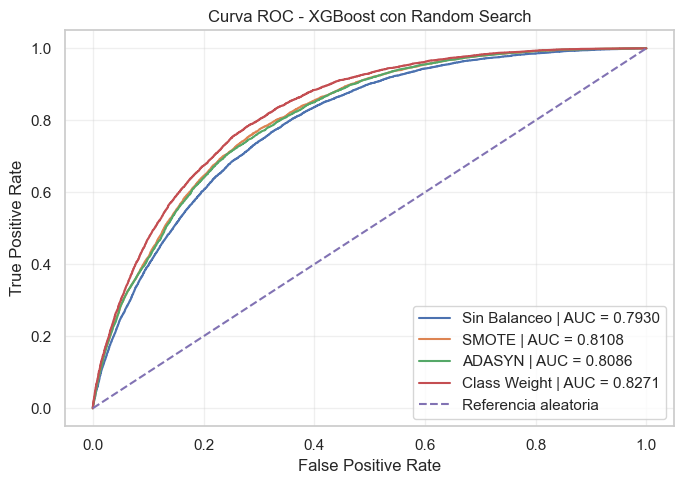

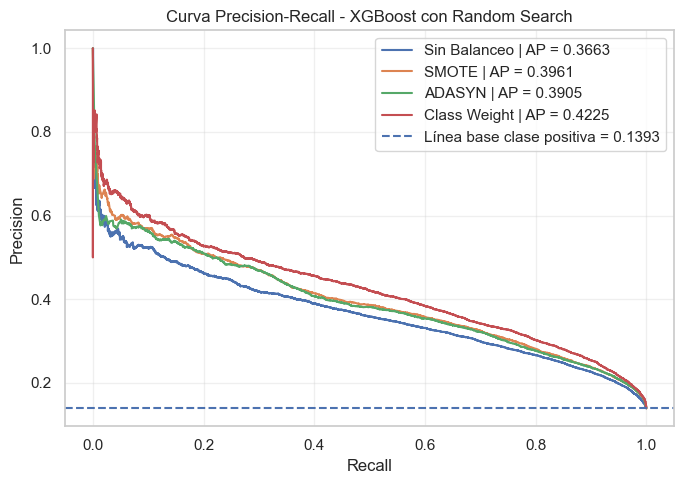

In [238]:
# ============================================================
# Curva ROC - XGBoost Random Search
# ============================================================

plt.figure(figsize=(7, 5))

for result in xgb_random_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - XGBoost con Random Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - XGBoost Random Search
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in xgb_random_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - XGBoost con Random Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de XGBoost con Random Search

En XGBoost optimizado mediante Random Search se exploraron combinaciones aleatorias de hiperparámetros relacionados con la capacidad predictiva y la regularización del modelo, como `n_estimators`, `max_depth`, `learning_rate`, `subsample`, `colsample_bytree` y `min_child_weight`. Esta estrategia permite evaluar un espacio amplio de configuraciones sin recorrer todas las combinaciones posibles, reduciendo el costo computacional frente a Grid Search.

Los resultados fueron cargados desde archivos `.pkl` y `.joblib`, ya que esta implementación fue generada previamente mediante una estructura externa del equipo. Posteriormente, se adaptaron al formato general del proyecto para permitir su comparación con los demás modelos.

El mejor resultado se seleccionó con base en el recall sobre el conjunto de prueba, en coherencia con el objetivo principal del proyecto: mejorar la detección de casos positivos asociados a prediabetes o diabetes. Sin embargo, este valor debe analizarse junto con precisión, F1-score, AUC y matriz de confusión, debido a que un aumento en sensibilidad puede venir acompañado de una mayor cantidad de falsos positivos.

Las curvas ROC y Precision-Recall complementan la evaluación. En particular, la curva Precision-Recall permite analizar mejor el desempeño del modelo sobre la clase positiva minoritaria, lo cual resulta clave en este problema por el desbalance de clases.

### **22.3 XGBoost con Optuna**

In [ ]:
def xgb_factory(params):
    return XGBClassifier(
        n_estimators=params["n_estimators"],
        max_depth=params["max_depth"],
        learning_rate=params["learning_rate"],
        subsample=params["subsample"],
        colsample_bytree=params["colsample_bytree"],
        min_child_weight=params["min_child_weight"],
        objective="binary:logistic",
        eval_metric="logloss",
        random_state=RANDOM_STATE,
        n_jobs=-1
    )
 
resultados_op_xgb = optimizar_optuna(
    modelo_nombre="XGBoost",
    estimator=XGBClassifier(),
    model_factory=xgb_factory,
    X_train=X_train,
    y_train=y_train,
    cv=cv_strategy,
    escalado=False,
    n_trials=30,
    scoring="recall"
)

In [132]:
# ============================================================
# Cargar archivos XGBoost - Optuna
# ============================================================

import os
import glob
import pickle
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from xgboost import XGBClassifier
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

XGB_OPTUNA_DIR = (
    BASE_DIR
    / "machineentrega2"
    / "Modelos_Optimizados_No_Computacional"
    / "Optuna_XGBoost"
)

print("Ruta XGBoost Optuna:")
print(XGB_OPTUNA_DIR)
print("Existe:", XGB_OPTUNA_DIR.exists())

if not XGB_OPTUNA_DIR.exists():
    raise FileNotFoundError(f"No existe la carpeta: {XGB_OPTUNA_DIR}")

archivos_xgb_optuna = os.listdir(XGB_OPTUNA_DIR)

print("\nArchivos encontrados:")
for archivo in archivos_xgb_optuna:
    print("-", archivo)

# Cargar archivo .pkl
pkl_files_xgb_optuna = [
    f for f in archivos_xgb_optuna
    if f.endswith(".pkl")
]

if len(pkl_files_xgb_optuna) == 0:
    raise FileNotFoundError("No se encontró ningún archivo .pkl para XGBoost Optuna.")

pkl_path_xgb_optuna = XGB_OPTUNA_DIR / pkl_files_xgb_optuna[0]

with open(pkl_path_xgb_optuna, "rb") as f:
    resultados_optuna_xgb_raw = pickle.load(f)

print("\nArchivo .pkl cargado correctamente:")
print(pkl_path_xgb_optuna)

print("\nTipo de objeto:")
print(type(resultados_optuna_xgb_raw))

# Adaptar estructura si viene como único resultado
if isinstance(resultados_optuna_xgb_raw, dict) and (
    "Test Recall" in resultados_optuna_xgb_raw
    or "Recall" in resultados_optuna_xgb_raw
    or "Mejor recall CV" in resultados_optuna_xgb_raw
):
    resultados_optuna_xgb = {"Optuna": resultados_optuna_xgb_raw}
else:
    resultados_optuna_xgb = resultados_optuna_xgb_raw

print("\nClaves principales:")
print(resultados_optuna_xgb.keys())

# Identificar joblibs
joblib_files_xgb_optuna = [
    f for f in archivos_xgb_optuna
    if f.endswith(".joblib")
]

print("\nArchivos .joblib encontrados:")
for f in joblib_files_xgb_optuna:
    print("-", f)

Ruta XGBoost Optuna:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Optuna_XGBoost
Existe: True

Archivos encontrados:
- optuna_XGBoost_ADASYN.joblib
- optuna_XGBoost_ADASYN_study.joblib
- optuna_XGBoost_Class Weight.joblib
- optuna_XGBoost_Class Weight_study.joblib
- optuna_XGBoost_resultados.pkl
- optuna_XGBoost_Sin Balanceo.joblib
- optuna_XGBoost_Sin Balanceo_study.joblib
- optuna_XGBoost_SMOTE.joblib
- optuna_XGBoost_SMOTE_study.joblib

Archivo .pkl cargado correctamente:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Optuna_XGBoost\optuna_XGBoost_resultados.pkl

Tipo de objeto:
<class 'dict'>

Claves principales:
dict_keys(['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight'])

Archivos .joblib encontrados:
- optuna_XGBoost_ADASYN.joblib
- optuna_XGBoost_ADASYN_study.joblib
- optuna_XGBoost_Class Weight.jobli

In [133]:
# ============================================================
# Relacionar resultados XGBoost Optuna con archivos joblib
# ============================================================

def normalizar_texto(texto):
    return (
        str(texto)
        .lower()
        .replace(" ", "")
        .replace("_", "")
        .replace("-", "")
    )


def encontrar_joblib_xgb_optuna(nombre_resultado, joblib_files):
    nombre_norm = normalizar_texto(nombre_resultado)

    patrones = {
        "optuna": ["optuna", "xgboost", "xgb"],
        "sinbalanceo": ["sinbalanceo", "none", "nobalance", "sin"],
        "none": ["sinbalanceo", "none", "nobalance", "sin"],
        "smote": ["smote"],
        "adasyn": ["adasyn"],
        "scaleposweight": ["scaleposweight", "scale", "pos", "weight"],
        "scale_pos_weight": ["scaleposweight", "scale", "pos", "weight"],
        "classweight": ["classweight", "class", "weight"]
    }

    patrones_busqueda = patrones.get(nombre_norm, [nombre_norm])

    for file in joblib_files:
        file_norm = normalizar_texto(file)

        if any(patron in file_norm for patron in patrones_busqueda):
            return file

    if len(joblib_files) == 1:
        return joblib_files[0]

    return None


joblib_map_optuna_xgb = {}

for nombre_resultado in resultados_optuna_xgb.keys():
    archivo_encontrado = encontrar_joblib_xgb_optuna(
        nombre_resultado,
        joblib_files_xgb_optuna
    )

    joblib_map_optuna_xgb[nombre_resultado] = archivo_encontrado

print("\nMapa resultado → joblib:")
for nombre_resultado, archivo in joblib_map_optuna_xgb.items():
    print(f"{nombre_resultado}: {archivo}")


Mapa resultado → joblib:
Sin Balanceo: optuna_XGBoost_Sin Balanceo.joblib
SMOTE: optuna_XGBoost_SMOTE.joblib
ADASYN: optuna_XGBoost_ADASYN.joblib
Class Weight: optuna_XGBoost_Class Weight.joblib


In [134]:
# ============================================================
# XGBoost Optuna: predicciones, scores y matrices
# ============================================================

def obtener_valor(diccionario, posibles_claves, default=None):
    for clave in posibles_claves:
        if isinstance(diccionario, dict) and clave in diccionario:
            return diccionario.get(clave)
    return default


def extraer_params_xgb_desde_pipeline(pipeline):
    modelo_xgb = None

    if hasattr(pipeline, "named_steps"):
        for _, paso in pipeline.named_steps.items():
            if isinstance(paso, XGBClassifier):
                modelo_xgb = paso
                break

        if modelo_xgb is None:
            modelo_xgb = list(pipeline.named_steps.values())[-1]
    else:
        modelo_xgb = pipeline

    params = {}

    for param in [
        "n_estimators",
        "max_depth",
        "learning_rate",
        "subsample",
        "colsample_bytree",
        "min_child_weight",
        "scale_pos_weight"
    ]:
        if hasattr(modelo_xgb, param):
            params[param] = getattr(modelo_xgb, param)

    return params


xgb_optuna_results = []

for nombre_resultado, res in resultados_optuna_xgb.items():

    joblib_file = joblib_map_optuna_xgb.get(nombre_resultado)

    if joblib_file is None:
        print(f"No se encontró joblib para: {nombre_resultado}")
        continue

    joblib_path = XGB_OPTUNA_DIR / joblib_file

    loaded_xgb_optuna = joblib.load(joblib_path)

    # Si el joblib viene como diccionario, intentar extraer estimador
    if isinstance(loaded_xgb_optuna, dict):
        pipeline_xgb_optuna = (
            loaded_xgb_optuna.get("Best Estimator")
            or loaded_xgb_optuna.get("best_estimator")
            or loaded_xgb_optuna.get("Estimator")
            or loaded_xgb_optuna.get("modelo")
        )
    else:
        pipeline_xgb_optuna = loaded_xgb_optuna

    if pipeline_xgb_optuna is None:
        print(f"No se pudo extraer estimador desde: {joblib_path}")
        continue

    y_pred_xgb_optuna = pipeline_xgb_optuna.predict(X_test)

    if hasattr(pipeline_xgb_optuna, "predict_proba"):
        y_score_xgb_optuna = pipeline_xgb_optuna.predict_proba(X_test)

        if len(y_score_xgb_optuna.shape) == 2:
            y_score_xgb_optuna = y_score_xgb_optuna[:, 1]

    elif hasattr(pipeline_xgb_optuna, "decision_function"):
        y_score_xgb_optuna = pipeline_xgb_optuna.decision_function(X_test)

    else:
        y_score_xgb_optuna = y_pred_xgb_optuna

    cm_xgb_optuna = confusion_matrix(y_test, y_pred_xgb_optuna)

    best_params = obtener_valor(
        res,
        ["Mejores Hiperparámetros", "Best Params", "Mejores hiperparámetros", "params"]
    )

    if best_params is None:
        best_params = extraer_params_xgb_desde_pipeline(pipeline_xgb_optuna)

    xgb_optuna_results.append({
        "Modelo": "XGBoost",
        "Método": "Optuna",
        "Balanceo": obtener_valor(res, ["Balanceo", "balance_strategy"], nombre_resultado),

        "CV Recall": obtener_valor(res, ["Mejor recall CV", "CV Recall", "Best Recall", "Recall CV"]),
        "Std Recall CV": obtener_valor(res, ["Std recall CV", "Std Recall CV"]),

        "Test Accuracy": obtener_valor(res, ["Test Accuracy", "Accuracy"]),
        "Test Precision": obtener_valor(res, ["Test Precision", "Precision"]),
        "Test Recall": obtener_valor(res, ["Test Recall", "Recall"]),
        "Test F1": obtener_valor(res, ["Test F1", "F1"]),
        "Test AUC": obtener_valor(res, ["Test ROC AUC", "Test AUC", "ROC AUC"]),

        "Tiempo (s)": obtener_valor(res, ["Tiempo (s)", "Tiempo", "time"]),
        "Evaluaciones": obtener_valor(res, ["Iteraciones", "Evaluaciones", "n_trials", "n_evaluations"]),
        "Best Params": str(best_params),

        "Best Estimator": pipeline_xgb_optuna,
        "Predicciones": y_pred_xgb_optuna,
        "Scores": y_score_xgb_optuna,
        "Matriz Confusión": cm_xgb_optuna,
        "Fuente": str(joblib_path),

        "Study": obtener_valor(res, ["Study", "study", "Optuna Study"])
    })

print(f"Resultados XGBoost Optuna enriquecidos: {len(xgb_optuna_results)}")

Resultados XGBoost Optuna enriquecidos: 4


In [135]:
# ============================================================
# XGBoost Optuna: tabla resumen final
# ============================================================

xgb_optuna_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Método"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),
        "Std Recall CV": r.get("Std Recall CV"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": r.get("Best Params")
    }
    for r in xgb_optuna_results
])

xgb_optuna_summary = xgb_optuna_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(xgb_optuna_summary.round(4))

best_xgb_optuna_idx = xgb_optuna_summary["Test Recall"].idxmax()
best_balance_xgb_optuna = xgb_optuna_summary.loc[best_xgb_optuna_idx, "Balanceo"]

best_xgb_optuna_result = [
    r for r in xgb_optuna_results
    if r.get("Balanceo") == best_balance_xgb_optuna
][0]

print("Mejor XGBoost con Optuna")
print("=" * 60)
print("Balanceo:", best_xgb_optuna_result["Balanceo"])
print("Test Accuracy:", round(best_xgb_optuna_result["Test Accuracy"], 4))
print("Test Precision:", round(best_xgb_optuna_result["Test Precision"], 4))
print("Test Recall:", round(best_xgb_optuna_result["Test Recall"], 4))
print("Test F1:", round(best_xgb_optuna_result["Test F1"], 4))
print("Test AUC:", round(best_xgb_optuna_result["Test AUC"], 4))
print("Best Params:", best_xgb_optuna_result["Best Params"])

,Modelo,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
3,XGBoost,Optuna,Class Weight,0.7957,None,0.7211,0.3061,0.7909,0.4414,0.8272,441.4269,30,"{'n_estimators': 489, 'max_depth': 3, 'learnin..."
1,XGBoost,Optuna,SMOTE,0.5805,None,0.8000,0.3625,0.5739,0.4443,0.8098,782.9748,30,"{'n_estimators': 140, 'max_depth': 4, 'learnin..."
2,XGBoost,Optuna,ADASYN,0.5652,None,0.8012,0.3631,0.5660,0.4424,0.8077,2292.5715,30,"{'n_estimators': 140, 'max_depth': 4, 'learnin..."
0,XGBoost,Optuna,Sin Balanceo,0.2362,None,0.8501,0.4289,0.2282,0.2979,0.7828,652.1380,30,"{'n_estimators': 386, 'max_depth': 9, 'learnin..."


Mejor XGBoost con Optuna
Balanceo: Class Weight
Test Accuracy: 0.7211
Test Precision: 0.3061
Test Recall: 0.7909
Test F1: 0.4414
Test AUC: 0.8272
Best Params: {'n_estimators': 489, 'max_depth': 3, 'learning_rate': 0.039470677007355015, 'subsample': 0.6052706929853362, 'colsample_bytree': 0.7615788051636565, 'min_child_weight': 4}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,XGBoost,Optuna,Class Weight,30993,12674,1478,5591,13.9329,36.0001,0.7211,0.3061,0.7909,0.4414,0.8272


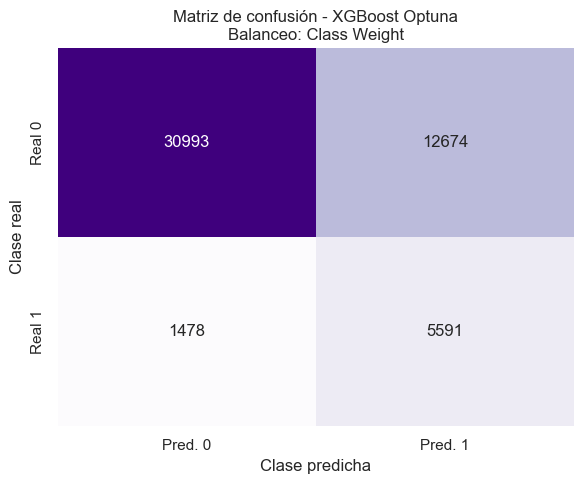

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.71      0.81     43667
Prediabetes/Diabetes       0.31      0.79      0.44      7069

            accuracy                           0.72     50736
           macro avg       0.63      0.75      0.63     50736
        weighted avg       0.86      0.72      0.76     50736



In [243]:
# ============================================================
# Diagnóstico de matriz de confusión - XGBoost Optuna
# ============================================================

cm_xgb_optuna = best_xgb_optuna_result["Matriz Confusión"]
tn, fp, fn, tp = cm_xgb_optuna.ravel()

n_total = tn + fp + fn + tp

xgb_optuna_diagnostic = pd.DataFrame([{
    "Modelo": best_xgb_optuna_result["Modelo"],
    "Método": best_xgb_optuna_result["Método"],
    "Balanceo": best_xgb_optuna_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_xgb_optuna_result["Test Accuracy"],
    "Test Precision": best_xgb_optuna_result["Test Precision"],
    "Test Recall": best_xgb_optuna_result["Test Recall"],
    "Test F1": best_xgb_optuna_result["Test F1"],
    "Test AUC": best_xgb_optuna_result["Test AUC"]
}])

display(xgb_optuna_diagnostic.round(4))


# ============================================================
# Matriz de confusión - XGBoost Optuna
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_xgb_optuna,
    annot=True,
    fmt="d",
    cmap="Purples",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - XGBoost Optuna\n"
    f"Balanceo: {best_xgb_optuna_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_xgb_optuna_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

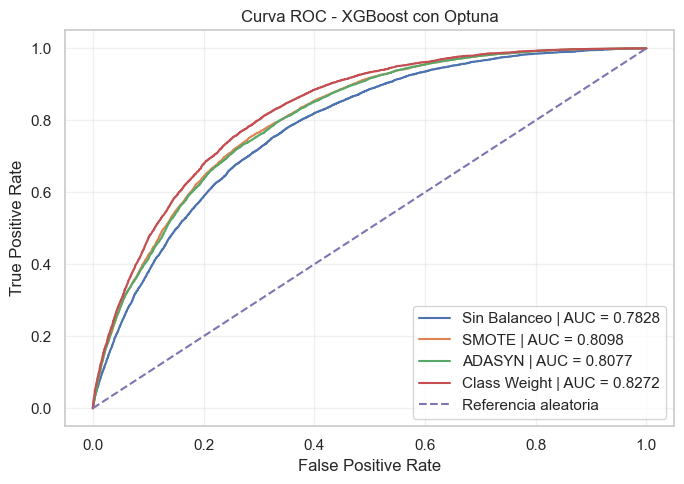

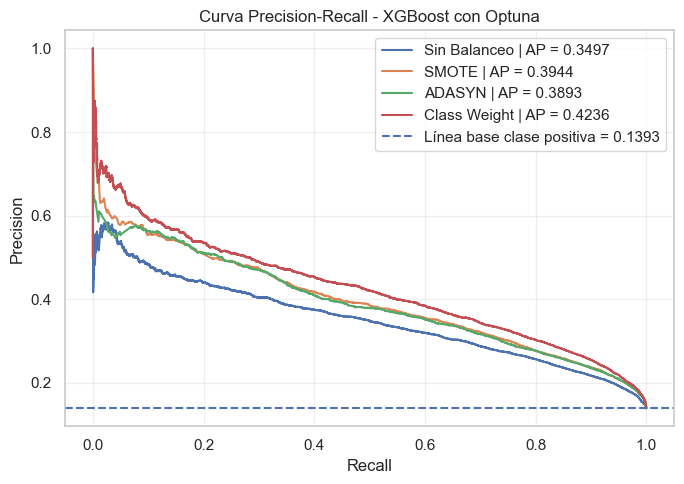

In [244]:
# ============================================================
# Curva ROC - XGBoost Optuna
# ============================================================

plt.figure(figsize=(7, 5))

for result in xgb_optuna_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - XGBoost con Optuna")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - XGBoost Optuna
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in xgb_optuna_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - XGBoost con Optuna")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de XGBoost con Optuna

En XGBoost optimizado mediante Optuna se evaluaron combinaciones de hiperparámetros relacionados con la estructura y capacidad de aprendizaje del modelo, como `n_estimators`, `max_depth`, `learning_rate`, `subsample`, `colsample_bytree` y `min_child_weight`. A diferencia de una búsqueda aleatoria simple, Optuna utiliza la información de ensayos previos para proponer configuraciones potencialmente más prometedoras.

Los resultados fueron cargados desde archivos `.pkl` y `.joblib`, ya que esta implementación fue generada previamente mediante una estructura externa del equipo. Posteriormente, se adaptaron al formato general del proyecto para permitir su comparación con los demás modelos.

El mejor resultado se seleccionó con base en el recall sobre el conjunto de prueba, en coherencia con el objetivo principal del proyecto: mejorar la detección de casos positivos asociados a prediabetes o diabetes. Sin embargo, este valor debe analizarse junto con precisión, F1-score, AUC y matriz de confusión, ya que una mayor sensibilidad puede estar acompañada de un aumento en falsos positivos.

El historial de trials permite observar cuáles configuraciones fueron más favorables durante la optimización. Las curvas ROC y Precision-Recall complementan la evaluación, siendo la curva Precision-Recall especialmente importante por el desbalance de clases.

### **22.4 XGBoost con DEAP**

In [ ]:
espacio_xgb = {
    "n_estimators":     [100, 150, 200, 250, 300, 400, 500],
    "max_depth":        [3, 4, 5, 6, 7, 8],
    "learning_rate":    np.logspace(-2, -0.5, 10).tolist(),
    "subsample":        [0.6, 0.7, 0.8, 0.9, 1.0],
    "colsample_bytree": [0.6, 0.7, 0.8, 0.9, 1.0],
    "min_child_weight": [1, 3, 5, 7, 10]
}
 
resultados_deap_xgb = optimizar_deap(
    modelo_nombre="XGBoost",
    estimator=XGBClassifier(),
    model_factory=xgb_factory,
    espacio=espacio_xgb,
    X_train=X_train,
    y_train=y_train,
    cv=cv_strategy,
    escalado=False,
    n_generaciones=5,
    tam_poblacion=20,
    scoring="recall"
)

In [136]:
# ============================================================
# Cargar archivos XGBoost - DEAP
# ============================================================

import os
import pickle
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from xgboost import XGBClassifier
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

XGB_DEAP_DIR = (
    BASE_DIR
    / "machineentrega2"
    / "Modelos_Optimizados_No_Computacional"
    / "DEAP_XGBoost"
)

print("Ruta XGBoost DEAP:")
print(XGB_DEAP_DIR)
print("Existe:", XGB_DEAP_DIR.exists())

if not XGB_DEAP_DIR.exists():
    raise FileNotFoundError(f"No existe la carpeta: {XGB_DEAP_DIR}")

archivos_xgb_deap = os.listdir(XGB_DEAP_DIR)

print("\nArchivos encontrados:")
for archivo in archivos_xgb_deap:
    print("-", archivo)

# Cargar archivo .pkl
pkl_files_xgb_deap = [
    f for f in archivos_xgb_deap
    if f.endswith(".pkl")
]

if len(pkl_files_xgb_deap) == 0:
    raise FileNotFoundError("No se encontró ningún archivo .pkl para XGBoost DEAP.")

pkl_path_xgb_deap = XGB_DEAP_DIR / pkl_files_xgb_deap[0]

with open(pkl_path_xgb_deap, "rb") as f:
    resultados_deap_xgb_raw = pickle.load(f)

print("\nArchivo .pkl cargado correctamente:")
print(pkl_path_xgb_deap)

print("\nTipo de objeto:")
print(type(resultados_deap_xgb_raw))

# Adaptar estructura si viene como único resultado
if isinstance(resultados_deap_xgb_raw, dict) and (
    "Test Recall" in resultados_deap_xgb_raw
    or "Recall" in resultados_deap_xgb_raw
    or "Mejor recall CV" in resultados_deap_xgb_raw
):
    resultados_deap_xgb = {"DEAP": resultados_deap_xgb_raw}
else:
    resultados_deap_xgb = resultados_deap_xgb_raw

print("\nClaves principales:")
print(resultados_deap_xgb.keys())

# Identificar joblibs
joblib_files_xgb_deap = [
    f for f in archivos_xgb_deap
    if f.endswith(".joblib")
]

print("\nArchivos .joblib encontrados:")
for f in joblib_files_xgb_deap:
    print("-", f)

Ruta XGBoost DEAP:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\DEAP_XGBoost
Existe: True

Archivos encontrados:
- deap_XGBoost_ADASYN.joblib
- deap_XGBoost_Class Weight.joblib
- deap_XGBoost_resultados.pkl
- deap_XGBoost_Sin Balanceo.joblib
- deap_XGBoost_SMOTE.joblib

Archivo .pkl cargado correctamente:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\DEAP_XGBoost\deap_XGBoost_resultados.pkl

Tipo de objeto:
<class 'dict'>

Claves principales:
dict_keys(['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight'])

Archivos .joblib encontrados:
- deap_XGBoost_ADASYN.joblib
- deap_XGBoost_Class Weight.joblib
- deap_XGBoost_Sin Balanceo.joblib
- deap_XGBoost_SMOTE.joblib


In [137]:
# ============================================================
# Relacionar resultados XGBoost DEAP con archivos joblib
# ============================================================

def normalizar_texto(texto):
    return (
        str(texto)
        .lower()
        .replace(" ", "")
        .replace("_", "")
        .replace("-", "")
    )


def encontrar_joblib_xgb_deap(nombre_resultado, joblib_files):
    nombre_norm = normalizar_texto(nombre_resultado)

    patrones = {
        "deap": ["deap", "xgboost", "xgb"],
        "sinbalanceo": ["sinbalanceo", "none", "nobalance", "sin"],
        "none": ["sinbalanceo", "none", "nobalance", "sin"],
        "smote": ["smote"],
        "adasyn": ["adasyn"],
        "scaleposweight": ["scaleposweight", "scale", "pos", "weight"],
        "scale_pos_weight": ["scaleposweight", "scale", "pos", "weight"]
    }

    patrones_busqueda = patrones.get(nombre_norm, [nombre_norm])

    for file in joblib_files:
        file_norm = normalizar_texto(file)

        if any(patron in file_norm for patron in patrones_busqueda):
            return file

    if len(joblib_files) == 1:
        return joblib_files[0]

    return None


joblib_map_deap_xgb = {}

for nombre_resultado in resultados_deap_xgb.keys():
    archivo_encontrado = encontrar_joblib_xgb_deap(
        nombre_resultado,
        joblib_files_xgb_deap
    )

    joblib_map_deap_xgb[nombre_resultado] = archivo_encontrado

print("\nMapa resultado → joblib:")
for nombre_resultado, archivo in joblib_map_deap_xgb.items():
    print(f"{nombre_resultado}: {archivo}")


Mapa resultado → joblib:
Sin Balanceo: deap_XGBoost_Sin Balanceo.joblib
SMOTE: deap_XGBoost_SMOTE.joblib
ADASYN: deap_XGBoost_ADASYN.joblib
Class Weight: deap_XGBoost_Class Weight.joblib


In [138]:
# ============================================================
# XGBoost DEAP: predicciones, scores y matrices
# ============================================================

def obtener_valor(diccionario, posibles_claves, default=None):
    for clave in posibles_claves:
        if isinstance(diccionario, dict) and clave in diccionario:
            return diccionario.get(clave)
    return default


def extraer_params_xgb_desde_pipeline(pipeline):
    modelo_xgb = None

    if hasattr(pipeline, "named_steps"):
        for _, paso in pipeline.named_steps.items():
            if isinstance(paso, XGBClassifier):
                modelo_xgb = paso
                break

        if modelo_xgb is None:
            modelo_xgb = list(pipeline.named_steps.values())[-1]
    else:
        modelo_xgb = pipeline

    params = {}

    for param in [
        "n_estimators",
        "max_depth",
        "learning_rate",
        "subsample",
        "colsample_bytree",
        "min_child_weight",
        "scale_pos_weight"
    ]:
        if hasattr(modelo_xgb, param):
            params[param] = getattr(modelo_xgb, param)

    return params


xgb_deap_results = []

for nombre_resultado, res in resultados_deap_xgb.items():

    joblib_file = joblib_map_deap_xgb.get(nombre_resultado)

    if joblib_file is None:
        print(f"No se encontró joblib para: {nombre_resultado}")
        continue

    joblib_path = XGB_DEAP_DIR / joblib_file

    loaded_xgb_deap = joblib.load(joblib_path)

    # Si el joblib viene como diccionario, intentar extraer estimador
    if isinstance(loaded_xgb_deap, dict):
        pipeline_xgb_deap = (
            loaded_xgb_deap.get("Best Estimator")
            or loaded_xgb_deap.get("best_estimator")
            or loaded_xgb_deap.get("Estimator")
            or loaded_xgb_deap.get("modelo")
        )
    else:
        pipeline_xgb_deap = loaded_xgb_deap

    if pipeline_xgb_deap is None:
        print(f"No se pudo extraer estimador desde: {joblib_path}")
        continue

    y_pred_xgb_deap = pipeline_xgb_deap.predict(X_test)

    if hasattr(pipeline_xgb_deap, "predict_proba"):
        y_score_xgb_deap = pipeline_xgb_deap.predict_proba(X_test)

        if len(y_score_xgb_deap.shape) == 2:
            y_score_xgb_deap = y_score_xgb_deap[:, 1]

    elif hasattr(pipeline_xgb_deap, "decision_function"):
        y_score_xgb_deap = pipeline_xgb_deap.decision_function(X_test)

    else:
        y_score_xgb_deap = y_pred_xgb_deap

    cm_xgb_deap = confusion_matrix(y_test, y_pred_xgb_deap)

    best_params = obtener_valor(
        res,
        ["Mejores Hiperparámetros", "Best Params", "Mejores hiperparámetros", "params"]
    )

    if best_params is None:
        best_params = extraer_params_xgb_desde_pipeline(pipeline_xgb_deap)

    xgb_deap_results.append({
        "Modelo": "XGBoost",
        "Método": "DEAP",
        "Balanceo": obtener_valor(res, ["Balanceo", "balance_strategy"], nombre_resultado),

        "CV Recall": obtener_valor(res, ["Mejor recall CV", "CV Recall", "Best Recall", "Recall CV"]),
        "Std Recall CV": obtener_valor(res, ["Std recall CV", "Std Recall CV"]),

        "Test Accuracy": obtener_valor(res, ["Test Accuracy", "Accuracy"]),
        "Test Precision": obtener_valor(res, ["Test Precision", "Precision"]),
        "Test Recall": obtener_valor(res, ["Test Recall", "Recall"]),
        "Test F1": obtener_valor(res, ["Test F1", "F1"]),
        "Test AUC": obtener_valor(res, ["Test ROC AUC", "Test AUC", "ROC AUC"]),

        "Tiempo (s)": obtener_valor(res, ["Tiempo (s)", "Tiempo", "time"]),
        "Evaluaciones": obtener_valor(res, ["Iteraciones", "Evaluaciones", "n_evaluations"]),
        "Best Params": str(best_params),
        "Best Individual": str(obtener_valor(res, ["Best Individual", "Mejor individuo"])),

        "Best Estimator": pipeline_xgb_deap,
        "Predicciones": y_pred_xgb_deap,
        "Scores": y_score_xgb_deap,
        "Matriz Confusión": cm_xgb_deap,
        "Fuente": str(joblib_path),
        "Logbook": obtener_valor(res, ["Logbook", "Historial", "Historia", "logbook"])
    })

print(f"Resultados XGBoost DEAP enriquecidos: {len(xgb_deap_results)}")

Resultados XGBoost DEAP enriquecidos: 4


In [139]:
# ============================================================
# XGBoost DEAP: tabla resumen final
# ============================================================

xgb_deap_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Método"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),
        "Std Recall CV": r.get("Std Recall CV"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": r.get("Best Params"),
        "Best Individual": r.get("Best Individual")
    }
    for r in xgb_deap_results
])

xgb_deap_summary = xgb_deap_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(xgb_deap_summary.round(4))

best_xgb_deap_idx = xgb_deap_summary["Test Recall"].idxmax()
best_balance_xgb_deap = xgb_deap_summary.loc[best_xgb_deap_idx, "Balanceo"]

best_xgb_deap_result = [
    r for r in xgb_deap_results
    if r.get("Balanceo") == best_balance_xgb_deap
][0]

print("Mejor XGBoost con DEAP")
print("=" * 60)
print("Balanceo:", best_xgb_deap_result["Balanceo"])
print("Test Accuracy:", round(best_xgb_deap_result["Test Accuracy"], 4))
print("Test Precision:", round(best_xgb_deap_result["Test Precision"], 4))
print("Test Recall:", round(best_xgb_deap_result["Test Recall"], 4))
print("Test F1:", round(best_xgb_deap_result["Test F1"], 4))
print("Test AUC:", round(best_xgb_deap_result["Test AUC"], 4))
print("Best Params:", best_xgb_deap_result["Best Params"])
print("Best Individual:", best_xgb_deap_result["Best Individual"])

,Modelo,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params,Best Individual
3,XGBoost,DEAP,Class Weight,0.7964,0.0000,0.7207,0.3063,0.7940,0.4421,0.8272,1505.3200,100,"{'n_estimators': 300, 'max_depth': 3, 'learnin...",None
1,XGBoost,DEAP,SMOTE,0.5913,0.0044,0.7931,0.3536,0.5859,0.4411,0.8050,2799.7789,100,"{'n_estimators': 150, 'max_depth': 4, 'learnin...",None
2,XGBoost,DEAP,ADASYN,0.5844,0.0047,0.7940,0.3540,0.5801,0.4397,0.7970,6932.1000,100,"{'n_estimators': 150, 'max_depth': 3, 'learnin...",None
0,XGBoost,DEAP,Sin Balanceo,0.2379,0.0039,0.8501,0.4280,0.2259,0.2957,0.7827,2890.2244,100,"{'n_estimators': 400, 'max_depth': 8, 'learnin...",None


Mejor XGBoost con DEAP
Balanceo: Class Weight
Test Accuracy: 0.7207
Test Precision: 0.3063
Test Recall: 0.794
Test F1: 0.4421
Test AUC: 0.8272
Best Params: {'n_estimators': 300, 'max_depth': 3, 'learning_rate': 0.1, 'subsample': 0.6, 'colsample_bytree': 1.0, 'min_child_weight': 5}
Best Individual: None


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
0,XGBoost,DEAP,Class Weight,30954,12713,1456,5613,13.9329,36.1203,0.7207,0.3063,0.794,0.4421,0.8272


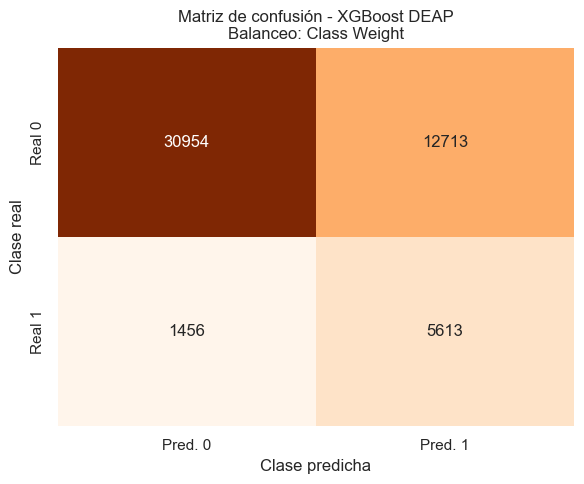

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.96      0.71      0.81     43667
Prediabetes/Diabetes       0.31      0.79      0.44      7069

            accuracy                           0.72     50736
           macro avg       0.63      0.75      0.63     50736
        weighted avg       0.86      0.72      0.76     50736



In [249]:
# ============================================================
# Diagnóstico de matriz de confusión - XGBoost DEAP
# ============================================================

cm_xgb_deap = best_xgb_deap_result["Matriz Confusión"]
tn, fp, fn, tp = cm_xgb_deap.ravel()

n_total = tn + fp + fn + tp

xgb_deap_diagnostic = pd.DataFrame([{
    "Modelo": best_xgb_deap_result["Modelo"],
    "Método": best_xgb_deap_result["Método"],
    "Balanceo": best_xgb_deap_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_xgb_deap_result["Test Accuracy"],
    "Test Precision": best_xgb_deap_result["Test Precision"],
    "Test Recall": best_xgb_deap_result["Test Recall"],
    "Test F1": best_xgb_deap_result["Test F1"],
    "Test AUC": best_xgb_deap_result["Test AUC"]
}])

display(xgb_deap_diagnostic.round(4))


# ============================================================
# Matriz de confusión - XGBoost DEAP
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_xgb_deap,
    annot=True,
    fmt="d",
    cmap="Oranges",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - XGBoost DEAP\n"
    f"Balanceo: {best_xgb_deap_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_xgb_deap_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

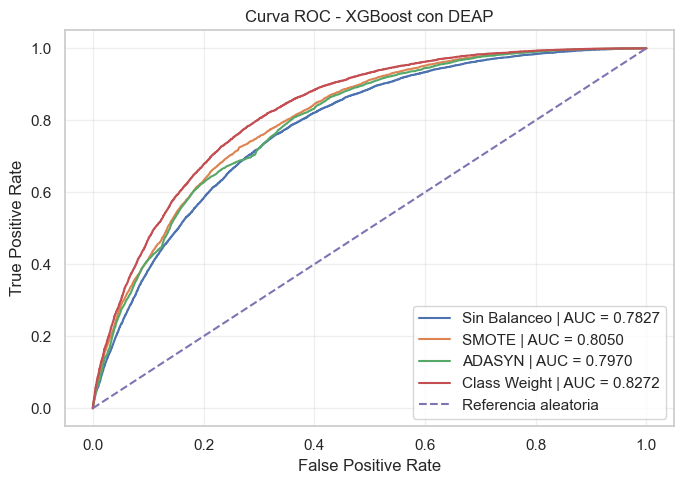

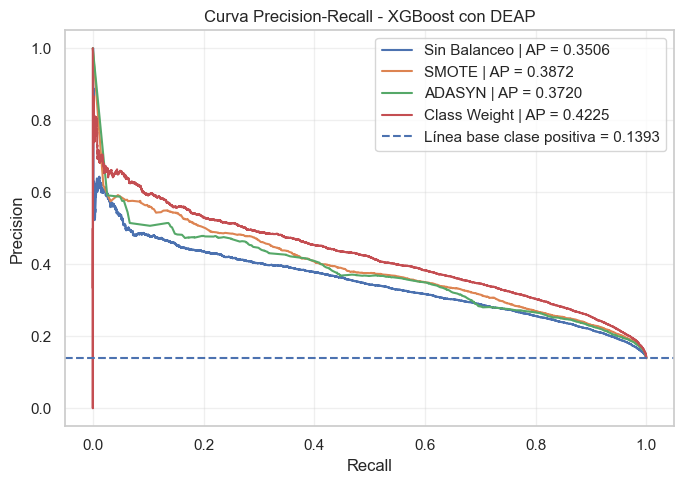

In [250]:
# ============================================================
# Curva ROC - XGBoost DEAP
# ============================================================

plt.figure(figsize=(7, 5))

for result in xgb_deap_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - XGBoost con DEAP")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - XGBoost DEAP
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in xgb_deap_results:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - XGBoost con DEAP")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [251]:
# ============================================================
# Logbook evolutivo - XGBoost DEAP
# ============================================================

logbook_xgb_deap = best_xgb_deap_result.get("Logbook")

if logbook_xgb_deap is not None:

    if isinstance(logbook_xgb_deap, pd.DataFrame):
        logbook_xgb_deap_df = logbook_xgb_deap.copy()
    else:
        logbook_xgb_deap_df = pd.DataFrame(logbook_xgb_deap)

    display(logbook_xgb_deap_df)

else:
    print("No hay logbook disponible en el resultado guardado.")

,max,mean,min
0,0.796407,0.761007,0.502599
1,0.796407,0.793415,0.786434
2,0.796407,0.792752,0.751353
3,0.796407,0.795355,0.792906
4,0.796407,0.795024,0.788768


Historias evolutivas encontradas:
['Sin Balanceo', 'SMOTE', 'ADASYN', 'Class Weight']


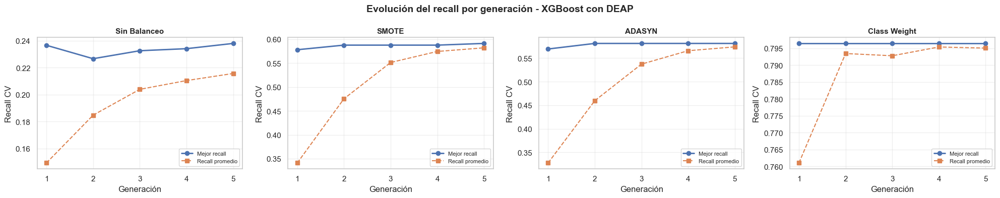

In [252]:
# ============================================================
# Evolución del recall por generación - XGBoost DEAP
# ============================================================

import math

def extraer_historia_deap_general(resultado):
    if not isinstance(resultado, dict):
        return None

    historia = (
        resultado.get("Logbook")
        or resultado.get("logbook")
        or resultado.get("Historia")
        or resultado.get("Historial")
    )

    if historia is None:
        return None

    if isinstance(historia, pd.DataFrame):
        hist_df = historia.copy()
    else:
        hist_df = pd.DataFrame(historia)

    if hist_df.empty:
        return None

    rename_map = {
        "Generacion": "Generación",
        "generacion": "Generación",
        "generation": "Generación",
        "Best Recall": "Mejor recall",
        "best_recall": "Mejor recall",
        "max": "Mejor recall",
        "Max Recall": "Mejor recall",
        "Mean Recall": "Recall promedio",
        "mean": "Recall promedio",
        "Promedio Recall": "Recall promedio",
        "avg": "Recall promedio"
    }

    hist_df = hist_df.rename(columns=rename_map)

    if "Generación" not in hist_df.columns:
        hist_df["Generación"] = np.arange(1, len(hist_df) + 1)

    return hist_df


historias_xgb_deap = {}

if "xgb_deap_results" in globals():
    for resultado in xgb_deap_results:
        nombre = resultado.get("Balanceo", "DEAP")
        hist_df = extraer_historia_deap_general(resultado)

        if hist_df is not None:
            historias_xgb_deap[nombre] = hist_df

if len(historias_xgb_deap) == 0 and "best_xgb_deap_result" in globals():
    hist_df = extraer_historia_deap_general(best_xgb_deap_result)

    if hist_df is not None:
        nombre = best_xgb_deap_result.get("Balanceo", "DEAP")
        historias_xgb_deap[nombre] = hist_df


print("Historias evolutivas encontradas:")
print(list(historias_xgb_deap.keys()))


if len(historias_xgb_deap) == 0:
    print("No se encontró historia evolutiva disponible para graficar.")

else:
    n_plots = len(historias_xgb_deap)
    n_cols = min(4, n_plots)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(5 * n_cols, 4 * n_rows),
        squeeze=False
    )

    axes = axes.flatten()

    for ax, (nombre, hist_df) in zip(axes, historias_xgb_deap.items()):

        hist_df = hist_df.copy()

        if "Mejor recall" in hist_df.columns:
            hist_df["Mejor recall"] = pd.to_numeric(
                hist_df["Mejor recall"],
                errors="coerce"
            )

        if "Recall promedio" in hist_df.columns:
            hist_df["Recall promedio"] = pd.to_numeric(
                hist_df["Recall promedio"],
                errors="coerce"
            )

        if "Mejor recall" in hist_df.columns:
            ax.plot(
                hist_df["Generación"],
                hist_df["Mejor recall"],
                marker="o",
                linewidth=2,
                label="Mejor recall"
            )

        if "Recall promedio" in hist_df.columns and not hist_df["Recall promedio"].isna().all():
            ax.plot(
                hist_df["Generación"],
                hist_df["Recall promedio"],
                marker="s",
                linestyle="--",
                linewidth=1.5,
                label="Recall promedio"
            )

        ax.set_title(str(nombre), fontsize=11, fontweight="bold")
        ax.set_xlabel("Generación")
        ax.set_ylabel("Recall CV")
        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=8)

    for ax in axes[n_plots:]:
        ax.axis("off")

    plt.suptitle(
        "Evolución del recall por generación - XGBoost con DEAP",
        fontsize=14,
        fontweight="bold"
    )

    plt.tight_layout()
    plt.show()

### Interpretación de XGBoost con DEAP

En XGBoost optimizado mediante DEAP se evaluaron combinaciones de hiperparámetros asociados a la capacidad de aprendizaje y regularización del modelo, como `n_estimators`, `max_depth`, `learning_rate`, `subsample`, `colsample_bytree` y `min_child_weight`. En este enfoque, cada individuo del algoritmo evolutivo representa una configuración candidata del modelo.

El proceso evolutivo utiliza selección, cruce y mutación para favorecer progresivamente las configuraciones con mayor recall durante la validación cruzada. Esto permite explorar el espacio de búsqueda de manera distinta a Grid Search y Random Search, priorizando las combinaciones que mejor responden a la métrica objetivo.

Los resultados fueron cargados desde archivos `.pkl` y `.joblib`, ya que esta implementación fue generada previamente mediante una estructura externa del equipo. Posteriormente, se adaptaron al formato general del proyecto para permitir su comparación con los demás modelos.

El mejor resultado se seleccionó con base en el recall sobre el conjunto de prueba. Sin embargo, este valor debe interpretarse junto con precisión, F1-score, AUC y matriz de confusión, debido a que una mayor sensibilidad puede implicar un incremento en falsos positivos.

La gráfica de evolución del recall permite observar si el algoritmo mejoró progresivamente a través de las generaciones o si alcanzó una solución estable de forma temprana. Las curvas ROC y Precision-Recall complementan la evaluación, siendo esta última especialmente importante por el desbalance de clases.

## **23. Decision Tree**

### **23.1 Decision Tree con Grid Search**

In [140]:
# ============================================================
# Checkpoints - Decision Tree
# ============================================================

CHECKPOINT_DIR_DT = os.path.join(BASE_DIR, "checkpoints_decision_tree")
os.makedirs(CHECKPOINT_DIR_DT, exist_ok=True)

print("Carpeta de checkpoints Decision Tree:")
print(CHECKPOINT_DIR_DT)


def save_checkpoint_dt(result, method_name, balance_strategy):
    path = os.path.join(
        CHECKPOINT_DIR_DT,
        f"decision_tree_{method_name}_{balance_strategy}.joblib"
    )

    joblib.dump(result, path)
    print(f"Guardado: {path}")


def load_existing_results_dt(method_name):
    results = []
    completed = []

    for balance_strategy in get_balance_options("decision_tree"):
        path = os.path.join(
            CHECKPOINT_DIR_DT,
            f"decision_tree_{method_name}_{balance_strategy}.joblib"
        )

        if os.path.exists(path):
            result = joblib.load(path)
            results.append(result)
            completed.append(balance_strategy)
            print(f"Cargado: {path}")

    return results, completed

Carpeta de checkpoints Decision Tree:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_decision_tree


In [141]:
# ============================================================
# Decision Tree - Grid Search con checkpoints
# ============================================================

grid_results_dt, completed_grid_dt = load_existing_results_dt("grid")

for balance_strategy in get_balance_options("decision_tree"):

    if balance_strategy in completed_grid_dt:
        print(f"Ya existe Grid Search | {balance_strategy}. Se omite.")
        continue

    print("=" * 80)
    print(f"Ejecutando Decision Tree | Grid Search | Balanceo: {balance_strategy}")
    print("=" * 80)

    result = run_grid_search_model(
        model_key="decision_tree",
        balance_strategy=balance_strategy
    )

    grid_results_dt.append(result)

    save_checkpoint_dt(
        result=result,
        method_name="grid",
        balance_strategy=balance_strategy
    )

Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_decision_tree\decision_tree_grid_none.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_decision_tree\decision_tree_grid_smote.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_decision_tree\decision_tree_grid_adasyn.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_decision_tree\decision_tree_grid_class_weight.joblib
Ya existe Grid Search | none. Se omite.
Ya existe Grid Search | smote. Se omite.
Ya existe Grid Search | adasyn. Se omite.
Ya existe Grid Search | class_weight. Se omite.


In [142]:
# ============================================================
# Resumen Decision Tree con Grid Search
# ============================================================

dt_grid_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Metodo"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params"))
    }
    for r in grid_results_dt
])

dt_grid_summary = dt_grid_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(dt_grid_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
3,Decision Tree,Grid Search,class_weight,0.7879,0.6978,0.2843,0.7698,0.4152,0.8011,70.2011,72,"{'model__criterion': 'gini', 'model__max_depth..."
1,Decision Tree,Grid Search,smote,0.5215,0.8133,0.3769,0.5207,0.4373,0.8041,267.5083,72,"{'model__criterion': 'entropy', 'model__max_de..."
2,Decision Tree,Grid Search,adasyn,0.5117,0.8163,0.3825,0.5189,0.4404,0.8035,1232.8677,72,"{'model__criterion': 'gini', 'model__max_depth..."
0,Decision Tree,Grid Search,none,0.3283,0.7978,0.2979,0.3324,0.3142,0.6017,68.2880,72,"{'model__criterion': 'gini', 'model__max_depth..."


In [265]:
# ============================================================
# Mejor Decision Tree con Grid Search
# ============================================================

best_dt_grid_idx = dt_grid_summary["Test Recall"].idxmax()
best_balance_dt_grid = dt_grid_summary.loc[best_dt_grid_idx, "Balanceo"]

best_dt_grid_result = [
    r for r in grid_results_dt
    if r.get("Balanceo") == best_balance_dt_grid
][0]

print("Mejor Decision Tree con Grid Search")
print("=" * 60)
print("Balanceo:", best_dt_grid_result["Balanceo"])
print("Test Accuracy:", round(best_dt_grid_result["Test Accuracy"], 4))
print("Test Precision:", round(best_dt_grid_result["Test Precision"], 4))
print("Test Recall:", round(best_dt_grid_result["Test Recall"], 4))
print("Test F1:", round(best_dt_grid_result["Test F1"], 4))
print("Test AUC:", round(best_dt_grid_result["Test AUC"], 4))
print("Best Params:", best_dt_grid_result["Best Params"])

Mejor Decision Tree con Grid Search
Balanceo: class_weight
Test Accuracy: 0.6978
Test Precision: 0.2843
Test Recall: 0.7698
Test F1: 0.4152
Test AUC: 0.8011
Best Params: {'model__criterion': 'gini', 'model__max_depth': 5, 'model__min_samples_leaf': 1, 'model__min_samples_split': 2}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Best Params
0,Decision Tree,Grid Search,class_weight,29964,13703,1627,5442,13.9329,37.7345,0.6978,0.2843,0.7698,0.4152,0.8011,"{'model__criterion': 'gini', 'model__max_depth..."


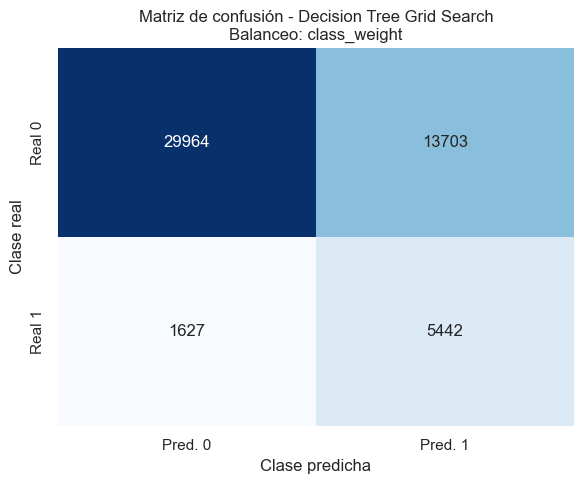

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.69      0.80     43667
Prediabetes/Diabetes       0.28      0.77      0.42      7069

            accuracy                           0.70     50736
           macro avg       0.62      0.73      0.61     50736
        weighted avg       0.86      0.70      0.74     50736



In [266]:
# ============================================================
# Diagnóstico de matriz de confusión - Decision Tree Grid Search
# ============================================================

cm_dt_grid = best_dt_grid_result["Matriz Confusión"]
tn, fp, fn, tp = cm_dt_grid.ravel()

n_total = tn + fp + fn + tp

dt_grid_diagnostic = pd.DataFrame([{
    "Modelo": best_dt_grid_result["Modelo"],
    "Método": best_dt_grid_result["Metodo"],
    "Balanceo": best_dt_grid_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_dt_grid_result["Test Accuracy"],
    "Test Precision": best_dt_grid_result["Test Precision"],
    "Test Recall": best_dt_grid_result["Test Recall"],
    "Test F1": best_dt_grid_result["Test F1"],
    "Test AUC": best_dt_grid_result["Test AUC"],
    "Best Params": str(best_dt_grid_result["Best Params"])
}])

display(dt_grid_diagnostic.round(4))

# ============================================================
# Matriz de confusión - Decision Tree Grid Search
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_dt_grid,
    annot=True,
    fmt="d",
    cmap="Blues",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Decision Tree Grid Search\n"
    f"Balanceo: {best_dt_grid_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_dt_grid_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

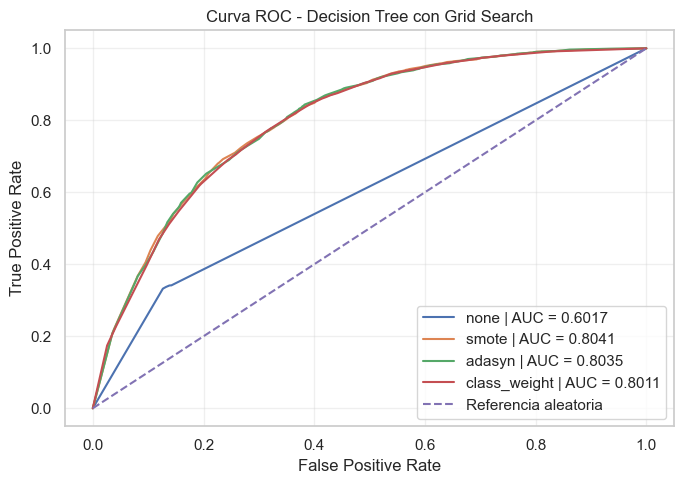

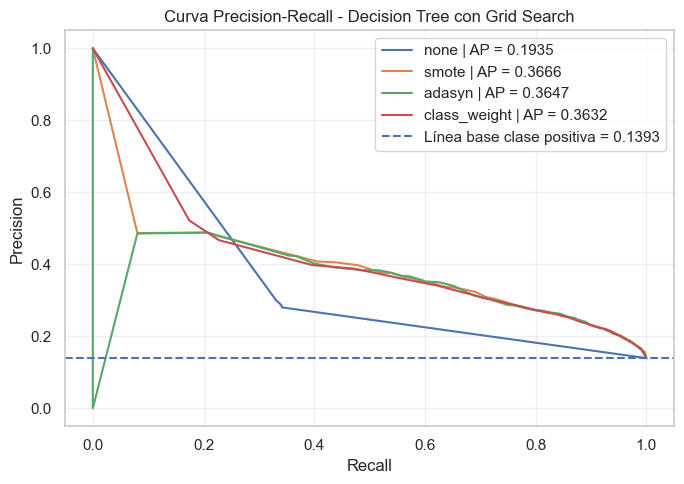

In [267]:
# ============================================================
# Curva ROC - Decision Tree Grid Search
# ============================================================

plt.figure(figsize=(7, 5))

for result in grid_results_dt:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - Decision Tree con Grid Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ============================================================
# Curva Precision-Recall - Decision Tree Grid Search
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in grid_results_dt:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Decision Tree con Grid Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de Decision Tree con Grid Search

En Decision Tree optimizado mediante Grid Search se evaluaron combinaciones de hiperparámetros asociados a la estructura del árbol, como `criterion`, `max_depth`, `min_samples_split` y `min_samples_leaf`. Estos parámetros controlan la profundidad, el criterio de partición y el tamaño mínimo de los nodos, lo cual permite regular la complejidad del modelo y reducir el riesgo de sobreajuste.

Se evaluaron cuatro estrategias de balanceo: `none`, `SMOTE`, `ADASYN` y `class_weight`. En los casos de `SMOTE` y `ADASYN`, el remuestreo se aplicó dentro del pipeline, por lo que no existe fuga de datos: el balanceo se ajusta únicamente sobre los folds de entrenamiento durante la validación cruzada.

El mejor modelo se seleccionó con base en el recall sobre el conjunto de prueba, en coherencia con el objetivo principal del proyecto: mejorar la detección de casos positivos asociados a prediabetes o diabetes. Sin embargo, este resultado debe analizarse junto con la precisión, el F1-score, el AUC y la matriz de confusión, ya que un aumento del recall puede estar acompañado de una mayor cantidad de falsos positivos.

Las curvas ROC y Precision-Recall complementan la evaluación del modelo. En este contexto, la curva Precision-Recall es especialmente relevante debido al desbalance de clases del conjunto de datos.

### **23.2 Decision Tree con Random Search**

In [143]:
# ============================================================
# Decision Tree - Random Search con checkpoints
# ============================================================

random_results_dt, completed_random_dt = load_existing_results_dt("random")

for balance_strategy in get_balance_options("decision_tree"):

    if balance_strategy in completed_random_dt:
        print(f"Ya existe Random Search | {balance_strategy}. Se omite.")
        continue

    print("=" * 80)
    print(f"Ejecutando Decision Tree | Random Search | Balanceo: {balance_strategy}")
    print("=" * 80)

    result = run_random_search_model(
        model_key="decision_tree",
        balance_strategy=balance_strategy,
        n_iter=30
    )

    random_results_dt.append(result)

    save_checkpoint_dt(
        result=result,
        method_name="random",
        balance_strategy=balance_strategy
    )

Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_decision_tree\decision_tree_random_none.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_decision_tree\decision_tree_random_smote.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_decision_tree\decision_tree_random_adasyn.joblib
Cargado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_decision_tree\decision_tree_random_class_weight.joblib
Ya existe Random Search | none. Se omite.
Ya existe Random Search | smote. Se omite.
Ya existe Random Search | adasyn. Se omite.
Ya existe Random Search | class_weight. Se omite.


In [144]:
# ============================================================
# Resumen Decision Tree con Random Search
# ============================================================

dt_random_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Metodo"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params"))
    }
    for r in random_results_dt
])

dt_random_summary = dt_random_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(dt_random_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
3,Decision Tree,Random Search,class_weight,0.7879,0.6978,0.2843,0.7698,0.4152,0.8011,33.9323,30,"{'model__min_samples_split': 2, 'model__min_sa..."
1,Decision Tree,Random Search,smote,0.5214,0.8132,0.3767,0.5207,0.4372,0.8044,126.5072,30,"{'model__min_samples_split': 10, 'model__min_s..."
2,Decision Tree,Random Search,adasyn,0.5117,0.8162,0.3824,0.5189,0.4403,0.8033,589.1056,30,"{'model__min_samples_split': 2, 'model__min_sa..."
0,Decision Tree,Random Search,none,0.2851,0.8168,0.3215,0.2838,0.3015,0.6431,51.2567,30,"{'model__min_samples_split': 2, 'model__min_sa..."


In [270]:
# ============================================================
# Mejor Decision Tree con Random Search
# ============================================================

best_dt_random_idx = dt_random_summary["Test Recall"].idxmax()
best_balance_dt_random = dt_random_summary.loc[best_dt_random_idx, "Balanceo"]

best_dt_random_result = [
    r for r in random_results_dt
    if r.get("Balanceo") == best_balance_dt_random
][0]

print("Mejor Decision Tree con Random Search")
print("=" * 60)
print("Balanceo:", best_dt_random_result["Balanceo"])
print("Test Accuracy:", round(best_dt_random_result["Test Accuracy"], 4))
print("Test Precision:", round(best_dt_random_result["Test Precision"], 4))
print("Test Recall:", round(best_dt_random_result["Test Recall"], 4))
print("Test F1:", round(best_dt_random_result["Test F1"], 4))
print("Test AUC:", round(best_dt_random_result["Test AUC"], 4))
print("Best Params:", best_dt_random_result["Best Params"])

Mejor Decision Tree con Random Search
Balanceo: class_weight
Test Accuracy: 0.6978
Test Precision: 0.2843
Test Recall: 0.7698
Test F1: 0.4152
Test AUC: 0.8011
Best Params: {'model__min_samples_split': 2, 'model__min_samples_leaf': 10, 'model__max_depth': 5, 'model__criterion': 'gini'}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Best Params
0,Decision Tree,Random Search,class_weight,29964,13703,1627,5442,13.9329,37.7345,0.6978,0.2843,0.7698,0.4152,0.8011,"{'model__min_samples_split': 2, 'model__min_sa..."


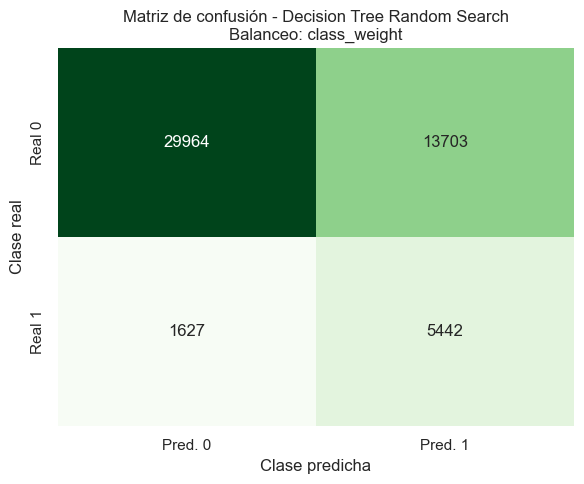

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.69      0.80     43667
Prediabetes/Diabetes       0.28      0.77      0.42      7069

            accuracy                           0.70     50736
           macro avg       0.62      0.73      0.61     50736
        weighted avg       0.86      0.70      0.74     50736



In [271]:
# ============================================================
# Diagnóstico de matriz de confusión - Decision Tree Random Search
# ============================================================

cm_dt_random = best_dt_random_result["Matriz Confusión"]
tn, fp, fn, tp = cm_dt_random.ravel()

n_total = tn + fp + fn + tp

dt_random_diagnostic = pd.DataFrame([{
    "Modelo": best_dt_random_result["Modelo"],
    "Método": best_dt_random_result["Metodo"],
    "Balanceo": best_dt_random_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_dt_random_result["Test Accuracy"],
    "Test Precision": best_dt_random_result["Test Precision"],
    "Test Recall": best_dt_random_result["Test Recall"],
    "Test F1": best_dt_random_result["Test F1"],
    "Test AUC": best_dt_random_result["Test AUC"],
    "Best Params": str(best_dt_random_result["Best Params"])
}])

display(dt_random_diagnostic.round(4))

# ============================================================
# Matriz de confusión - Decision Tree Random Search
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_dt_random,
    annot=True,
    fmt="d",
    cmap="Greens",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Decision Tree Random Search\n"
    f"Balanceo: {best_dt_random_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_dt_random_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

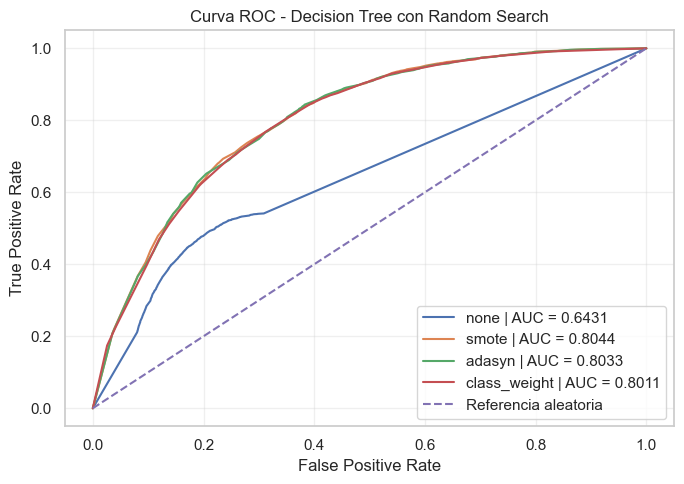

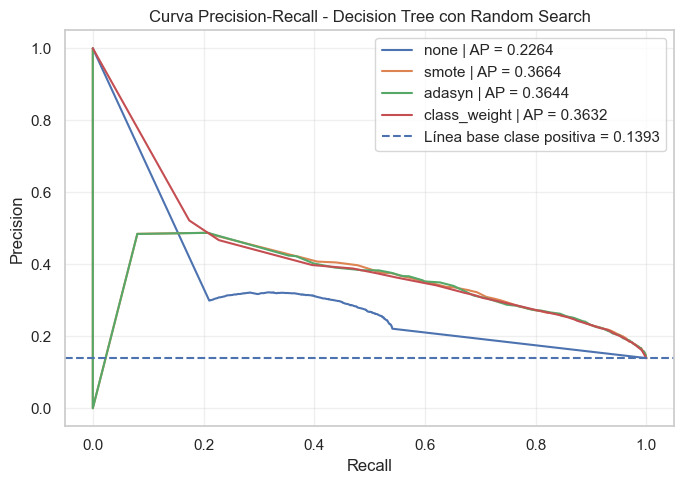

In [272]:
# ============================================================
# Curva ROC - Decision Tree Random Search
# ============================================================

plt.figure(figsize=(7, 5))

for result in random_results_dt:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - Decision Tree con Random Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - Decision Tree Random Search
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in random_results_dt:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Decision Tree con Random Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de Decision Tree con Random Search

En Decision Tree optimizado mediante Random Search se exploraron combinaciones aleatorias de hiperparámetros asociados a la estructura del árbol, como `criterion`, `max_depth`, `min_samples_split` y `min_samples_leaf`. A diferencia de Grid Search, esta estrategia no evalúa todas las combinaciones posibles, sino una muestra aleatoria del espacio de búsqueda, lo que permite reducir el costo computacional.

Se evaluaron las estrategias de balanceo `none`, `SMOTE`, `ADASYN` y `class_weight`. En los casos de `SMOTE` y `ADASYN`, el remuestreo se aplicó dentro del pipeline, evitando fuga de datos porque el balanceo se ajusta únicamente sobre los folds de entrenamiento durante la validación cruzada.

El mejor modelo se seleccionó con base en el recall sobre el conjunto de prueba, debido a que el objetivo principal es mejorar la detección de casos positivos asociados a prediabetes o diabetes. No obstante, este resultado debe analizarse junto con precisión, F1-score, AUC y matriz de confusión, ya que un mayor recall puede implicar un aumento de falsos positivos.

Las curvas ROC y Precision-Recall complementan la evaluación del modelo. En particular, la curva Precision-Recall es especialmente importante debido al desbalance de clases presente en el conjunto de datos.|

### **23.3 Decision Tree con Optuna**

In [145]:
# ============================================================
# Configuración Decision Tree - Optuna
# ============================================================

import os
import joblib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

# Asegurar que Decision Tree esté registrado
classification_models["decision_tree"] = {
    "name": "Decision Tree",
    "scale_numeric": False,
    "sample": False
}

# Carpeta de checkpoints
CHECKPOINT_DIR_DT = os.path.join(BASE_DIR, "checkpoints_decision_tree")
os.makedirs(CHECKPOINT_DIR_DT, exist_ok=True)

# Checkpoint único de Optuna
optuna_path_dt = os.path.join(CHECKPOINT_DIR_DT, "decision_tree_optuna.joblib")

print("Decision Tree configurado para Optuna.")
print("Checkpoint:", optuna_path_dt)

Decision Tree configurado para Optuna.
Checkpoint: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_decision_tree\decision_tree_optuna.joblib


In [146]:
# ============================================================
# Decision Tree - Optuna con checkpoint
# ============================================================

if os.path.exists(optuna_path_dt):

    optuna_results_dt = [joblib.load(optuna_path_dt)]
    print("Optuna Decision Tree ya existe. Se cargó desde checkpoint.")

else:

    optuna_results_dt = []

    result = run_optuna_model(
        model_key="decision_tree",
        model_name="Decision Tree",
        scale_numeric=False,
        n_trials=30
    )

    optuna_results_dt.append(result)

    joblib.dump(result, optuna_path_dt)

    print(f"Guardado: {optuna_path_dt}")

Optuna Decision Tree ya existe. Se cargó desde checkpoint.


In [147]:
# ============================================================
# Resumen Decision Tree con Optuna
# ============================================================

dt_optuna_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Metodo", r.get("Método")),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params"))
    }
    for r in optuna_results_dt
])

dt_optuna_summary = dt_optuna_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(dt_optuna_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
0,Decision Tree,Optuna,class_weight,0.7753,0.7037,0.2917,0.7889,0.426,0.8072,200.0371,30,"{'balance_strategy': 'class_weight', 'criterio..."


In [278]:
# ============================================================
# Mejor Decision Tree con Optuna
# ============================================================

best_dt_optuna_result = optuna_results_dt[0]

print("Mejor Decision Tree con Optuna")
print("=" * 60)
print("Balanceo:", best_dt_optuna_result.get("Balanceo"))
print("Test Accuracy:", round(best_dt_optuna_result.get("Test Accuracy"), 4))
print("Test Precision:", round(best_dt_optuna_result.get("Test Precision"), 4))
print("Test Recall:", round(best_dt_optuna_result.get("Test Recall"), 4))
print("Test F1:", round(best_dt_optuna_result.get("Test F1"), 4))
print("Test AUC:", round(best_dt_optuna_result.get("Test AUC"), 4))
print("Best Params:", best_dt_optuna_result.get("Best Params"))

Mejor Decision Tree con Optuna
Balanceo: class_weight
Test Accuracy: 0.7037
Test Precision: 0.2917
Test Recall: 0.7889
Test F1: 0.426
Test AUC: 0.8072
Best Params: {'balance_strategy': 'class_weight', 'criterion': 'gini', 'max_depth': 10, 'min_samples_split': 14, 'min_samples_leaf': 6}


In [279]:
# ============================================================
# Historial de trials Optuna - Decision Tree
# ============================================================

study_dt_optuna = best_dt_optuna_result.get("Study")

if study_dt_optuna is not None:

    trials_dt_optuna = study_dt_optuna.trials_dataframe()

    cols_to_show = [
        "number",
        "value",
        "params_balance_strategy",
        "params_criterion",
        "params_max_depth",
        "params_min_samples_split",
        "params_min_samples_leaf",
        "state"
    ]

    cols_to_show = [
        col for col in cols_to_show
        if col in trials_dt_optuna.columns
    ]

    display(
        trials_dt_optuna[cols_to_show]
        .sort_values(by="value", ascending=False)
        .head(20)
    )

else:
    print("No se encontró el objeto Study dentro del resultado guardado.")
    display(dt_optuna_summary.head(1).round(4))

,number,value,params_balance_strategy,params_criterion,params_max_depth,params_min_samples_split,params_min_samples_leaf,state
26,26,0.775294,class_weight,gini,10.0,14,6,COMPLETE
27,27,0.775188,class_weight,gini,10.0,20,7,COMPLETE
16,16,0.775011,class_weight,entropy,10.0,17,6,COMPLETE
25,25,0.774940,class_weight,gini,10.0,15,7,COMPLETE
22,22,0.774940,class_weight,gini,10.0,15,5,COMPLETE
21,21,0.774905,class_weight,gini,10.0,16,5,COMPLETE
23,23,0.774905,class_weight,gini,10.0,16,5,COMPLETE
18,18,0.774198,class_weight,gini,10.0,12,3,COMPLETE
12,12,0.773950,class_weight,entropy,10.0,30,10,COMPLETE
10,10,0.773950,class_weight,entropy,10.0,30,10,COMPLETE


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Best Params
0,Decision Tree,Optuna,class_weight,30128,13539,1492,5577,13.9329,37.6774,0.7037,0.2917,0.7889,0.426,0.8072,"{'balance_strategy': 'class_weight', 'criterio..."


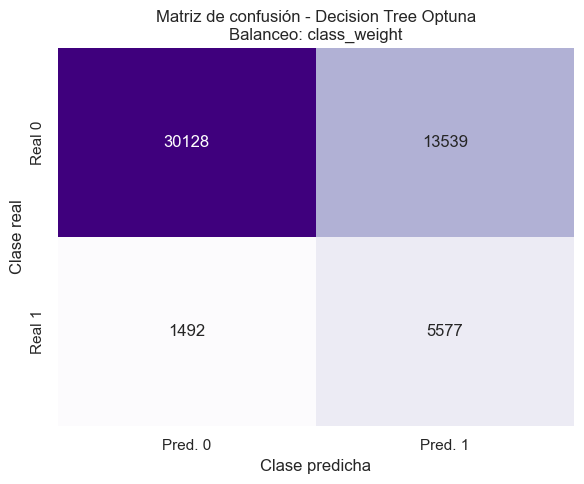

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.69      0.80     43667
Prediabetes/Diabetes       0.29      0.79      0.43      7069

            accuracy                           0.70     50736
           macro avg       0.62      0.74      0.61     50736
        weighted avg       0.86      0.70      0.75     50736



In [280]:
# ============================================================
# Diagnóstico de matriz de confusión - Decision Tree Optuna
# ============================================================

cm_dt_optuna = best_dt_optuna_result["Matriz Confusión"]
tn, fp, fn, tp = cm_dt_optuna.ravel()

n_total = tn + fp + fn + tp

dt_optuna_diagnostic = pd.DataFrame([{
    "Modelo": best_dt_optuna_result["Modelo"],
    "Método": best_dt_optuna_result.get("Metodo", best_dt_optuna_result.get("Método")),
    "Balanceo": best_dt_optuna_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_dt_optuna_result["Test Accuracy"],
    "Test Precision": best_dt_optuna_result["Test Precision"],
    "Test Recall": best_dt_optuna_result["Test Recall"],
    "Test F1": best_dt_optuna_result["Test F1"],
    "Test AUC": best_dt_optuna_result["Test AUC"],
    "Best Params": str(best_dt_optuna_result["Best Params"])
}])

display(dt_optuna_diagnostic.round(4))

# ============================================================
# Matriz de confusión - Decision Tree Optuna
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_dt_optuna,
    annot=True,
    fmt="d",
    cmap="Purples",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Decision Tree Optuna\n"
    f"Balanceo: {best_dt_optuna_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_dt_optuna_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

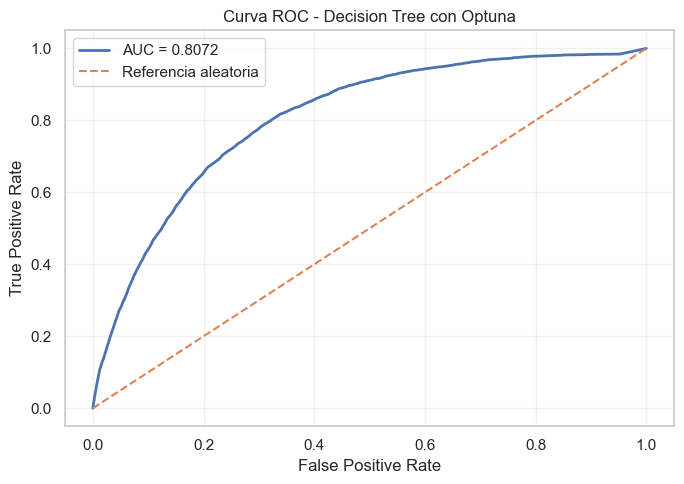

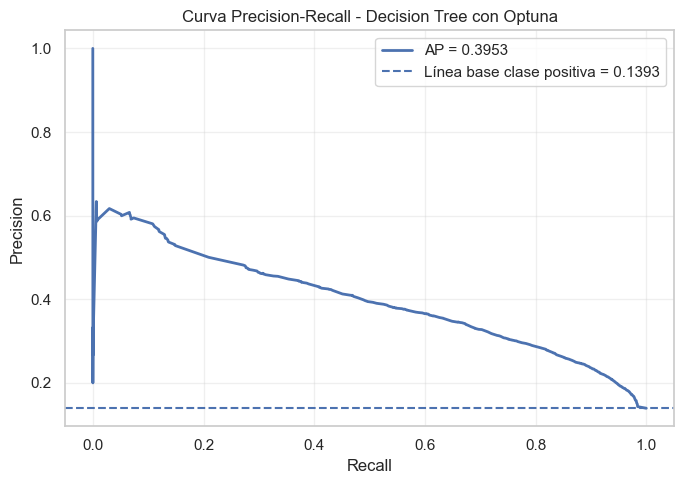

In [281]:
# ============================================================
# Curva ROC - Decision Tree Optuna
# ============================================================

y_score_dt_optuna = best_dt_optuna_result["Scores"]

fpr_dt_optuna, tpr_dt_optuna, _ = roc_curve(
    y_test,
    y_score_dt_optuna
)

roc_auc_dt_optuna = auc(fpr_dt_optuna, tpr_dt_optuna)

plt.figure(figsize=(7, 5))

plt.plot(
    fpr_dt_optuna,
    tpr_dt_optuna,
    linewidth=2,
    label=f"AUC = {roc_auc_dt_optuna:.4f}"
)

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    label="Referencia aleatoria"
)

plt.title("Curva ROC - Decision Tree con Optuna")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ============================================================
# Curva Precision-Recall - Decision Tree Optuna
# ============================================================

precision_dt_optuna, recall_dt_optuna, _ = precision_recall_curve(
    y_test,
    y_score_dt_optuna
)

avg_precision_dt_optuna = average_precision_score(
    y_test,
    y_score_dt_optuna
)

positive_rate = y_test.mean()

plt.figure(figsize=(7, 5))

plt.plot(
    recall_dt_optuna,
    precision_dt_optuna,
    linewidth=2,
    label=f"AP = {avg_precision_dt_optuna:.4f}"
)

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Decision Tree con Optuna")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de Decision Tree con Optuna

En Decision Tree optimizado mediante Optuna se exploraron configuraciones de hiperparámetros relacionadas con la estructura del árbol, como `criterion`, `max_depth`, `min_samples_split` y `min_samples_leaf`. A diferencia de Grid Search y Random Search, Optuna utiliza la información de ensayos anteriores para proponer nuevas combinaciones con mayor potencial de mejorar la métrica objetivo.

La estrategia de balanceo también se incorporó dentro del proceso de optimización, por lo que Optuna evaluó conjuntamente los hiperparámetros del modelo y la técnica de tratamiento del desbalance. Esto permite seleccionar una configuración final más coherente con el objetivo del proyecto.

El mejor modelo se seleccionó con base en el recall promedio durante validación cruzada, debido a que el interés principal es mejorar la detección de casos positivos asociados a prediabetes o diabetes. Sin embargo, este resultado debe analizarse junto con precisión, F1-score, AUC y matriz de confusión, ya que un mayor recall puede estar acompañado de un incremento en falsos positivos.

La matriz de confusión permite observar directamente el comportamiento del modelo sobre el conjunto de prueba, mientras que las curvas ROC y Precision-Recall complementan la evaluación del desempeño. En este problema, la curva Precision-Recall resulta especialmente importante debido al desbalance de clases.

### **23.4 Decision Tree con DEAP**

In [148]:
# ============================================================
# Configuración Decision Tree - DEAP
# ============================================================

import os
import joblib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

# Carpeta de checkpoints
CHECKPOINT_DIR_DT = os.path.join(str(BASE_DIR), "checkpoints_decision_tree")
os.makedirs(CHECKPOINT_DIR_DT, exist_ok=True)

deap_path_dt = os.path.join(CHECKPOINT_DIR_DT, "decision_tree_deap.joblib")

print("Decision Tree configurado para DEAP.")
print("Checkpoint:", deap_path_dt)
print("Espacio DEAP:")
print(deap_spaces["decision_tree"])

Decision Tree configurado para DEAP.
Checkpoint: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_decision_tree\decision_tree_deap.joblib
Espacio DEAP:
{'max_depth': [5, 10, 15, None], 'min_samples_split': [2, 10, 30], 'min_samples_leaf': [1, 5, 10], 'balance_strategy': ['none', 'smote', 'adasyn', 'class_weight']}


In [149]:
# ============================================================
# Decision Tree - DEAP con checkpoint
# ============================================================

RUN_DT_DEAP = True  # Cambiar a False si solo quieres dejar evidencia sin ejecutar

if os.path.exists(deap_path_dt):

    deap_results_dt = [joblib.load(deap_path_dt)]
    print("DEAP Decision Tree ya existe. Se cargó desde checkpoint.")

else:

    deap_results_dt = []

    if RUN_DT_DEAP:

        result = run_deap_model(
            model_key="decision_tree",
            n_population=10,
            n_generations=5,
            cxpb=0.5,
            mutpb=0.2
        )

        deap_results_dt.append(result)

        joblib.dump(result, deap_path_dt)

        print(f"Guardado: {deap_path_dt}")

    else:
        print("Ejecución omitida. No existe checkpoint previo para Decision Tree DEAP.")

DEAP Decision Tree ya existe. Se cargó desde checkpoint.


In [150]:
# ============================================================
# Resumen Decision Tree con DEAP
# ============================================================

dt_deap_summary = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Metodo", r.get("Método")),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params")),
        "Best Individual": str(r.get("Best Individual"))
    }
    for r in deap_results_dt
])

dt_deap_summary = dt_deap_summary.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(dt_deap_summary.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params,Best Individual
0,Decision Tree,DEAP,class_weight,0.7879,0.6978,0.2843,0.7698,0.4152,0.8011,274.9612,50,"{'max_depth': 5, 'min_samples_split': 2, 'min_...",None


In [285]:
# ============================================================
# Mejor Decision Tree con DEAP
# ============================================================

best_dt_deap_result = deap_results_dt[0]

print("Mejor Decision Tree con DEAP")
print("=" * 60)
print("Balanceo:", best_dt_deap_result.get("Balanceo"))
print("Test Accuracy:", round(best_dt_deap_result.get("Test Accuracy"), 4))
print("Test Precision:", round(best_dt_deap_result.get("Test Precision"), 4))
print("Test Recall:", round(best_dt_deap_result.get("Test Recall"), 4))
print("Test F1:", round(best_dt_deap_result.get("Test F1"), 4))
print("Test AUC:", round(best_dt_deap_result.get("Test AUC"), 4))
print("Best Params:", best_dt_deap_result.get("Best Params"))
print("Best Individual:", best_dt_deap_result.get("Best Individual"))

Mejor Decision Tree con DEAP
Balanceo: class_weight
Test Accuracy: 0.6978
Test Precision: 0.2843
Test Recall: 0.7698
Test F1: 0.4152
Test AUC: 0.8011
Best Params: {'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 1}
Best Individual: None


In [286]:
# ============================================================
# Logbook evolutivo - Decision Tree DEAP
# ============================================================

logbook_dt_deap = best_dt_deap_result.get("Logbook")

if logbook_dt_deap is not None:

    if isinstance(logbook_dt_deap, pd.DataFrame):
        logbook_dt_deap_df = logbook_dt_deap.copy()
    else:
        logbook_dt_deap_df = pd.DataFrame(logbook_dt_deap)

    display(logbook_dt_deap_df)

else:
    print("No hay logbook disponible en el resultado guardado.")

,Generacion,Best Recall,Best Individual
0,0,0.728825,"[2, 2, 1, 3]"
1,1,0.773278,"[1, 0, 0, 3]"
2,2,0.775542,"[1, 2, 1, 3]"
3,3,0.774657,"[1, 0, 1, 3]"
4,4,0.787885,"[0, 0, 1, 3]"


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Best Params
0,Decision Tree,DEAP,class_weight,29964,13703,1627,5442,13.9329,37.7345,0.6978,0.2843,0.7698,0.4152,0.8011,"{'max_depth': 5, 'min_samples_split': 2, 'min_..."


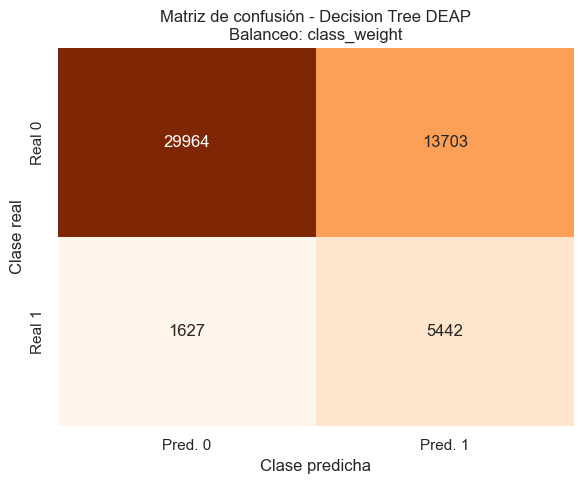

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.69      0.80     43667
Prediabetes/Diabetes       0.28      0.77      0.42      7069

            accuracy                           0.70     50736
           macro avg       0.62      0.73      0.61     50736
        weighted avg       0.86      0.70      0.74     50736



In [287]:
# ============================================================
# Diagnóstico de matriz de confusión - Decision Tree DEAP
# ============================================================

cm_dt_deap = best_dt_deap_result["Matriz Confusión"]
tn, fp, fn, tp = cm_dt_deap.ravel()

n_total = tn + fp + fn + tp

dt_deap_diagnostic = pd.DataFrame([{
    "Modelo": best_dt_deap_result["Modelo"],
    "Método": best_dt_deap_result.get("Metodo", best_dt_deap_result.get("Método")),
    "Balanceo": best_dt_deap_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_dt_deap_result["Test Accuracy"],
    "Test Precision": best_dt_deap_result["Test Precision"],
    "Test Recall": best_dt_deap_result["Test Recall"],
    "Test F1": best_dt_deap_result["Test F1"],
    "Test AUC": best_dt_deap_result["Test AUC"],
    "Best Params": str(best_dt_deap_result["Best Params"])
}])

display(dt_deap_diagnostic.round(4))


# ============================================================
# Matriz de confusión - Decision Tree DEAP
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_dt_deap,
    annot=True,
    fmt="d",
    cmap="Oranges",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - Decision Tree DEAP\n"
    f"Balanceo: {best_dt_deap_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_dt_deap_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

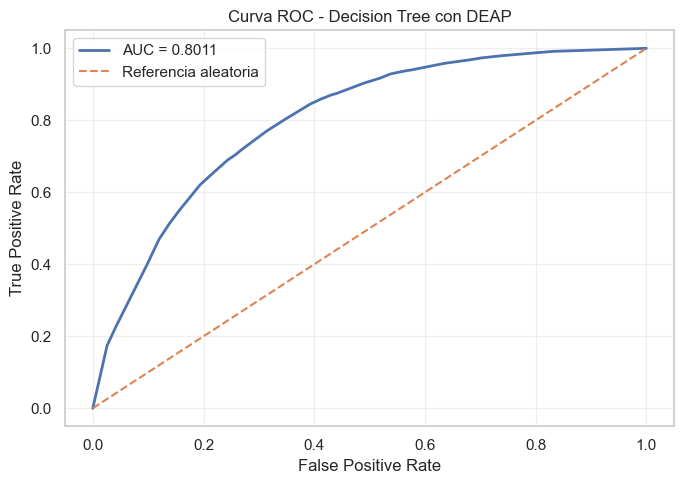

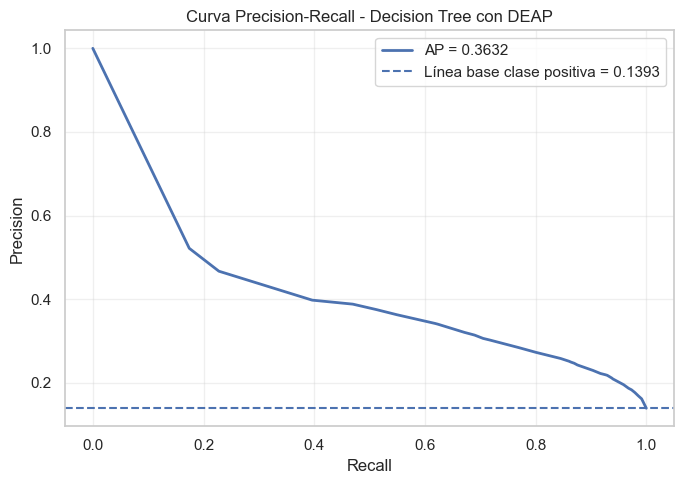

In [288]:
# ============================================================
# Curva ROC - Decision Tree DEAP
# ============================================================

y_score_dt_deap = best_dt_deap_result["Scores"]

fpr_dt_deap, tpr_dt_deap, _ = roc_curve(
    y_test,
    y_score_dt_deap
)

roc_auc_dt_deap = auc(fpr_dt_deap, tpr_dt_deap)

plt.figure(figsize=(7, 5))

plt.plot(
    fpr_dt_deap,
    tpr_dt_deap,
    linewidth=2,
    label=f"AUC = {roc_auc_dt_deap:.4f}"
)

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    label="Referencia aleatoria"
)

plt.title("Curva ROC - Decision Tree con DEAP")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - Decision Tree DEAP
# ============================================================

precision_dt_deap, recall_dt_deap, _ = precision_recall_curve(
    y_test,
    y_score_dt_deap
)

avg_precision_dt_deap = average_precision_score(
    y_test,
    y_score_dt_deap
)

positive_rate = y_test.mean()

plt.figure(figsize=(7, 5))

plt.plot(
    recall_dt_deap,
    precision_dt_deap,
    linewidth=2,
    label=f"AP = {avg_precision_dt_deap:.4f}"
)

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - Decision Tree con DEAP")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de Decision Tree con DEAP

En Decision Tree optimizado mediante DEAP se evaluaron configuraciones de hiperparámetros asociadas a la estructura del árbol, como `criterion`, `max_depth`, `min_samples_split` y `min_samples_leaf`. En este enfoque, cada individuo del algoritmo genético representa una combinación candidata de hiperparámetros y estrategia de balanceo.

La estrategia de balanceo se incorporó dentro del espacio de búsqueda, considerando alternativas como `none`, `SMOTE`, `ADASYN` y `class_weight`. Esto permite que el algoritmo evolutivo seleccione conjuntamente la técnica de balanceo y los hiperparámetros del árbol, en lugar de tratarlos como decisiones separadas.

El proceso evolutivo utiliza selección, cruce y mutación para favorecer progresivamente los individuos con mejor recall durante la validación cruzada. Esta métrica se priorizó porque el objetivo principal del proyecto es mejorar la detección de casos positivos asociados a prediabetes o diabetes.

El resultado final debe interpretarse junto con la precisión, el F1-score, el AUC y la matriz de confusión, ya que un aumento en recall puede estar acompañado de un mayor número de falsos positivos. Por esta razón, las curvas ROC y Precision-Recall complementan la evaluación del modelo, siendo la curva Precision-Recall especialmente importante debido al desbalance de clases.

## **24. SVM**

In [151]:
import os
import joblib
import pandas as pd

CHECKPOINT_DIR = "checkpoints_svm"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

def save_checkpoint(result, method_name, balance_strategy):
    path = f"{CHECKPOINT_DIR}/svm_{method_name}_{balance_strategy}.joblib"
    joblib.dump(result, path)
    print(f"Guardado: {path}")


def load_existing_results(method_name):
    results = []
    completed = []

    for balance_strategy in get_balance_options("svm"):
        path = f"{CHECKPOINT_DIR}/svm_{method_name}_{balance_strategy}.joblib"

        if os.path.exists(path):
            result = joblib.load(path)
            results.append(result)
            completed.append(balance_strategy)

    return results, completed

### **24.1 SVM con Grid Search**

In [ ]:
grid_results_svm, completed_grid = load_existing_results("grid")

for balance_strategy in tqdm(get_balance_options("svm"), desc="SVM RBF | Grid Search"):

    if balance_strategy in completed_grid:
        print(f"Ya existe Grid Search | {balance_strategy}. Se omite.")
        continue

    result = run_grid_search_model(
        model_key="svm",
        balance_strategy=balance_strategy
    )

    grid_results_svm.append(result)
    save_checkpoint(result, "grid", balance_strategy)

In [152]:
# ============================================================
# Cargar resultados SVM RBF - Grid Search desde checkpoints
# ============================================================

import os
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

# Ruta base del proyecto
BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

# Carpeta donde están los resultados de SVM
SVM_DIR = BASE_DIR / "checkpoints_svm" / "resultados_modelos"

print("Ruta SVM:")
print(SVM_DIR)
print("Existe:", SVM_DIR.exists())

# Archivos esperados
summary_path_svm_grid = SVM_DIR / "summary_svm_grid.csv"
objects_path_svm_grid = SVM_DIR / "objects_svm_grid.joblib"
best_result_path_svm_grid = SVM_DIR / "best_result_svm_grid.joblib"
best_estimator_path_svm_grid = SVM_DIR / "best_estimator_svm_grid.joblib"

print("\nArchivos esperados:")
for path in [
    summary_path_svm_grid,
    objects_path_svm_grid,
    best_result_path_svm_grid,
    best_estimator_path_svm_grid
]:
    print(path.name, "->", path.exists())

Ruta SVM:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_svm\resultados_modelos
Existe: True

Archivos esperados:
summary_svm_grid.csv -> True
objects_svm_grid.joblib -> True
best_result_svm_grid.joblib -> True
best_estimator_svm_grid.joblib -> True


In [153]:
# ============================================================
# Cargar objetos SVM Grid Search
# ============================================================

# Tabla resumen
svm_grid_summary = pd.read_csv(summary_path_svm_grid)

# Lista u objeto completo de resultados
svm_grid_objects = joblib.load(objects_path_svm_grid)

# Mejor resultado
best_svm_grid_result = joblib.load(best_result_path_svm_grid)

# Mejor estimador entrenado
best_svm_grid_estimator = joblib.load(best_estimator_path_svm_grid)

print("Archivos cargados correctamente.")
print("Tipo svm_grid_objects:", type(svm_grid_objects))
print("Tipo best_svm_grid_result:", type(best_svm_grid_result))
print("Tipo best_svm_grid_estimator:", type(best_svm_grid_estimator))


Archivos cargados correctamente.
Tipo svm_grid_objects: <class 'list'>
Tipo best_svm_grid_result: <class 'dict'>
Tipo best_svm_grid_estimator: <class 'imblearn.pipeline.Pipeline'>


In [154]:
# ============================================================
# Preparar resultados SVM Grid Search para evaluación
# ============================================================

# Si objects_svm_grid.joblib ya es una lista de resultados
if isinstance(svm_grid_objects, list):
    grid_results_svm = svm_grid_objects

# Si viene como diccionario, intentar extraer la lista interna
elif isinstance(svm_grid_objects, dict):
    posibles_claves = [
        "grid_results_svm",
        "results",
        "resultados",
        "Grid Search",
        "objects"
    ]

    grid_results_svm = None

    for clave in posibles_claves:
        if clave in svm_grid_objects:
            grid_results_svm = svm_grid_objects[clave]
            break

    if grid_results_svm is None:
        grid_results_svm = [svm_grid_objects]

else:
    grid_results_svm = [best_svm_grid_result]


# Asegurar que el mejor resultado tenga estimador, predicciones y scores
best_svm_grid_result["Best Estimator"] = best_svm_grid_estimator

if "Predicciones" not in best_svm_grid_result or best_svm_grid_result["Predicciones"] is None:
    best_svm_grid_result["Predicciones"] = best_svm_grid_estimator.predict(X_test)

if "Scores" not in best_svm_grid_result or best_svm_grid_result["Scores"] is None:
    if hasattr(best_svm_grid_estimator, "predict_proba"):
        best_svm_grid_result["Scores"] = best_svm_grid_estimator.predict_proba(X_test)[:, 1]
    else:
        best_svm_grid_result["Scores"] = best_svm_grid_estimator.decision_function(X_test)

if "Matriz Confusión" not in best_svm_grid_result or best_svm_grid_result["Matriz Confusión"] is None:
    best_svm_grid_result["Matriz Confusión"] = confusion_matrix(
        y_test,
        best_svm_grid_result["Predicciones"]
    )

print("Resultados SVM Grid preparados correctamente.")
print("Cantidad de resultados cargados:", len(grid_results_svm))
print("Claves del mejor resultado:")
print(best_svm_grid_result.keys())

Resultados SVM Grid preparados correctamente.
Cantidad de resultados cargados: 4
Claves del mejor resultado:
dict_keys(['Modelo', 'Metodo', 'Balanceo', 'CV Recall', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1', 'Test AUC', 'Tiempo (s)', 'Evaluaciones', 'Best Params', 'Best Estimator', 'Matriz Confusión', 'Predicciones', 'Scores'])


In [155]:
# ============================================================
# Resumen SVM RBF con Grid Search
# ============================================================

svm_grid_summary_final = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Metodo", r.get("Método")),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params"))
    }
    for r in grid_results_svm
])

svm_grid_summary_final = svm_grid_summary_final.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(svm_grid_summary_final.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
3,SVM RBF,Grid Search,class_weight,0.8222,0.6984,0.2926,0.8212,0.4314,0.8243,7446.3329,9,"{'model__C': 1, 'model__gamma': 'scale'}"
2,SVM RBF,Grid Search,adasyn,0.8199,0.6947,0.2891,0.8161,0.4269,0.8206,19647.2878,9,"{'model__C': 0.1, 'model__gamma': 'scale'}"
1,SVM RBF,Grid Search,smote,0.7938,0.7147,0.3007,0.7904,0.4357,0.8217,19822.6016,9,"{'model__C': 0.1, 'model__gamma': 'scale'}"
0,SVM RBF,Grid Search,none,0.1710,0.8573,0.4668,0.1702,0.2494,0.7003,6968.4166,9,"{'model__C': 10, 'model__gamma': 0.1}"


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Best Params
0,SVM RBF,Grid Search,class_weight,29630,14037,1264,5805,13.9329,39.1083,0.6984,0.2926,0.8212,0.4314,0.8243,"{'model__C': 1, 'model__gamma': 'scale'}"


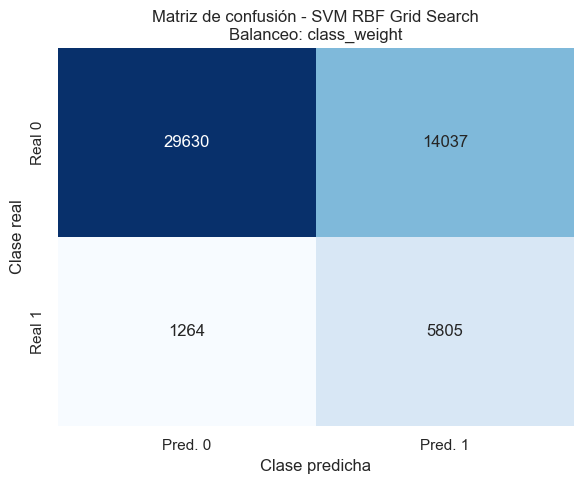

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.96      0.68      0.79     43667
Prediabetes/Diabetes       0.29      0.82      0.43      7069

            accuracy                           0.70     50736
           macro avg       0.63      0.75      0.61     50736
        weighted avg       0.87      0.70      0.74     50736



In [294]:
# ============================================================
# Diagnóstico de matriz de confusión - SVM Grid Search
# ============================================================

cm_svm_grid = best_svm_grid_result["Matriz Confusión"]
tn, fp, fn, tp = cm_svm_grid.ravel()

n_total = tn + fp + fn + tp

svm_grid_diagnostic = pd.DataFrame([{
    "Modelo": best_svm_grid_result.get("Modelo", "SVM RBF"),
    "Método": best_svm_grid_result.get("Metodo", best_svm_grid_result.get("Método", "Grid Search")),
    "Balanceo": best_svm_grid_result.get("Balanceo"),
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_svm_grid_result.get("Test Accuracy"),
    "Test Precision": best_svm_grid_result.get("Test Precision"),
    "Test Recall": best_svm_grid_result.get("Test Recall"),
    "Test F1": best_svm_grid_result.get("Test F1"),
    "Test AUC": best_svm_grid_result.get("Test AUC"),
    "Best Params": str(best_svm_grid_result.get("Best Params"))
}])

display(svm_grid_diagnostic.round(4))

# ============================================================
# Matriz de confusión - SVM Grid Search
# ============================================================

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_svm_grid,
    annot=True,
    fmt="d",
    cmap="Blues",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - SVM RBF Grid Search\n"
    f"Balanceo: {best_svm_grid_result.get('Balanceo')}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        best_svm_grid_result["Predicciones"],
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

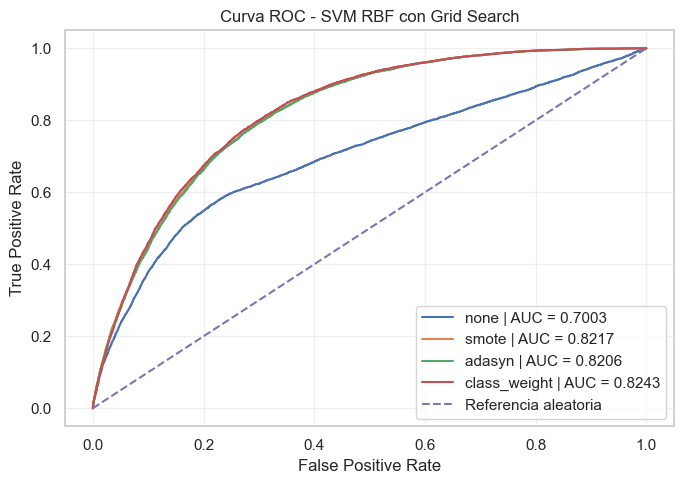

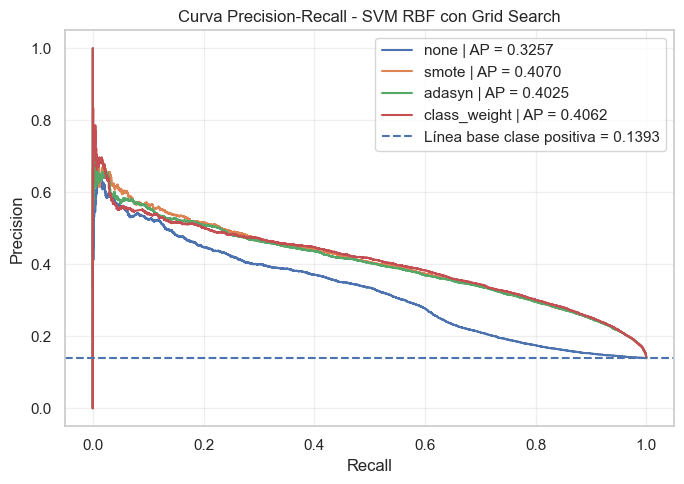

In [296]:
# ============================================================
# Curva ROC - SVM Grid Search
# ============================================================

plt.figure(figsize=(7, 5))

for result in grid_results_svm:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - SVM RBF con Grid Search")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ============================================================
# Curva Precision-Recall - SVM Grid Search
# ============================================================

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in grid_results_svm:

    balance = result.get("Balanceo")
    y_score = result.get("Scores")

    if y_score is None:
        continue

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - SVM RBF con Grid Search")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Interpretación de SVM RBF con Grid Search

En SVM RBF optimizado mediante Grid Search se evaluaron combinaciones de hiperparámetros asociadas al margen de separación y a la flexibilidad de la frontera de decisión, principalmente `C` y `gamma`. Estos parámetros controlan el equilibrio entre ajuste del modelo y capacidad de generalización.

Los resultados fueron cargados desde archivos previamente generados en checkpoints, evitando repetir un entrenamiento computacionalmente costoso. Esta decisión conserva la trazabilidad del experimento y permite reutilizar las métricas, predicciones, puntajes, matriz de confusión y mejor estimador entrenado.

El mejor modelo se seleccionó con base en el recall, dado que el objetivo principal del proyecto es mejorar la detección de casos positivos asociados a prediabetes o diabetes. Sin embargo, este resultado debe analizarse junto con la precisión, el F1-score, el AUC y la matriz de confusión, porque un recall alto puede implicar un aumento de falsos positivos.

Las curvas ROC y Precision-Recall complementan la evaluación del modelo. En este contexto, la curva Precision-Recall es especialmente relevante debido al desbalance de clases presente en el conjunto de datos.

### **24.2 SVM con Random Search**

In [ ]:
random_results_svm, completed_random = load_existing_results("random")

for balance_strategy in tqdm(get_balance_options("svm"), desc="SVM RBF | Random Search"):

    if balance_strategy in completed_random:
        print(f"Ya existe Random Search | {balance_strategy}. Se omite.")
        continue

    result = run_random_search_model(
        model_key="svm",
        balance_strategy=balance_strategy,
        n_iter=50
    )

    random_results_svm.append(result)
    save_checkpoint(result, "random", balance_strategy)

In [156]:
# ============================================================
# Cargar resultados SVM RBF - Random Search desde checkpoints
# ============================================================

import os
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

SVM_DIR = BASE_DIR / "checkpoints_svm" / "resultados_modelos"

print("Ruta SVM:")
print(SVM_DIR)
print("Existe:", SVM_DIR.exists())

summary_path_svm_random = SVM_DIR / "summary_svm.csv"
objects_path_svm_random = SVM_DIR / "objects_svm.joblib"
best_result_path_svm_random = SVM_DIR / "best_result_svm.joblib"
best_estimator_path_svm_random = SVM_DIR / "best_estimator_svm.joblib"

print("\nArchivos esperados:")
for path in [
    summary_path_svm_random,
    objects_path_svm_random,
    best_result_path_svm_random,
    best_estimator_path_svm_random
]:
    print(path.name, "->", path.exists())

Ruta SVM:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_svm\resultados_modelos
Existe: True

Archivos esperados:
summary_svm.csv -> True
objects_svm.joblib -> True
best_result_svm.joblib -> True
best_estimator_svm.joblib -> True


In [157]:
# ============================================================
# Cargar objetos SVM Random Search
# ============================================================

svm_random_summary = pd.read_csv(summary_path_svm_random)

svm_random_objects = joblib.load(objects_path_svm_random)

best_svm_random_result = joblib.load(best_result_path_svm_random)

best_svm_random_estimator = joblib.load(best_estimator_path_svm_random)

print("Archivos cargados correctamente.")
print("Tipo svm_random_objects:", type(svm_random_objects))
print("Tipo best_svm_random_result:", type(best_svm_random_result))
print("Tipo best_svm_random_estimator:", type(best_svm_random_estimator))

Archivos cargados correctamente.
Tipo svm_random_objects: <class 'list'>
Tipo best_svm_random_result: <class 'dict'>
Tipo best_svm_random_estimator: <class 'imblearn.pipeline.Pipeline'>


In [158]:
# ============================================================
# Preparar resultados SVM Random Search para evaluación
# ============================================================

if isinstance(svm_random_objects, list):
    random_results_svm = svm_random_objects

elif isinstance(svm_random_objects, dict):
    posibles_claves = [
        "random_results_svm",
        "results",
        "resultados",
        "Random Search",
        "objects"
    ]

    random_results_svm = None

    for clave in posibles_claves:
        if clave in svm_random_objects:
            random_results_svm = svm_random_objects[clave]
            break

    if random_results_svm is None:
        random_results_svm = [svm_random_objects]

else:
    random_results_svm = [best_svm_random_result]


# Asegurar que el mejor resultado tenga estimador, predicciones y scores
best_svm_random_result["Best Estimator"] = best_svm_random_estimator

if "Predicciones" not in best_svm_random_result or best_svm_random_result["Predicciones"] is None:
    best_svm_random_result["Predicciones"] = best_svm_random_estimator.predict(X_test)

if "Scores" not in best_svm_random_result or best_svm_random_result["Scores"] is None:
    if hasattr(best_svm_random_estimator, "predict_proba"):
        best_svm_random_result["Scores"] = best_svm_random_estimator.predict_proba(X_test)[:, 1]
    else:
        best_svm_random_result["Scores"] = best_svm_random_estimator.decision_function(X_test)

if "Matriz Confusión" not in best_svm_random_result or best_svm_random_result["Matriz Confusión"] is None:
    best_svm_random_result["Matriz Confusión"] = confusion_matrix(
        y_test,
        best_svm_random_result["Predicciones"]
    )

print("Resultados SVM Random preparados correctamente.")
print("Cantidad de resultados cargados:", len(random_results_svm))
print("Claves del mejor resultado:")
print(best_svm_random_result.keys())

Resultados SVM Random preparados correctamente.
Cantidad de resultados cargados: 4
Claves del mejor resultado:
dict_keys(['Modelo', 'Metodo', 'Balanceo', 'CV Recall', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1', 'Test AUC', 'Tiempo (s)', 'Evaluaciones', 'Best Params', 'Best Estimator', 'Matriz Confusión', 'Predicciones', 'Scores'])


In [159]:
# ============================================================
# Resumen SVM RBF con Random Search
# ============================================================

svm_random_summary_final = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Metodo", r.get("Método")),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),

        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params"))
    }
    for r in random_results_svm
])

svm_random_summary_final = svm_random_summary_final.sort_values(
    by="Test Recall",
    ascending=False,
    na_position="last"
)

display(svm_random_summary_final.round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
3,SVM RBF,Random Search,class_weight,0.9966,0.1980,0.1476,0.9962,0.2571,0.7656,25446.2347,25,"{'model__gamma': 1, 'model__C': 0.01}"
1,SVM RBF,Random Search,smote,0.9905,0.2667,0.1579,0.9839,0.2721,0.7573,68101.4933,25,"{'model__gamma': 1, 'model__C': 0.01}"
2,SVM RBF,Random Search,adasyn,0.9827,0.2970,0.1630,0.9786,0.2795,0.7451,70147.7798,25,"{'model__gamma': 1, 'model__C': 0.01}"
0,SVM RBF,Random Search,none,0.2485,0.8360,0.3701,0.2518,0.2997,0.6948,24629.5421,25,"{'model__gamma': 0.1, 'model__C': 100}"


In [160]:
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix

svm_diagnostic = []

for r in random_results_svm:
    
    y_pred = r.get("Predicciones")
    
    if y_pred is None:
        continue
    
    y_pred = np.asarray(y_pred)
    
    cm = r.get("Matriz Confusión")
    
    if cm is None:
        cm = confusion_matrix(y_test, y_pred)
    
    tn, fp, fn, tp = cm.ravel()
    
    n_total = tn + fp + fn + tp
    actual_positive_rate = (tp + fn) / n_total
    predicted_positive_rate = (tp + fp) / n_total
    
    svm_diagnostic.append({
        "Modelo": r.get("Modelo"),
        "Metodo": r.get("Metodo"),
        "Balanceo": r.get("Balanceo"),
        "TN": tn,
        "FP": fp,
        "FN": fn,
        "TP": tp,
        "Positivos reales (%)": actual_positive_rate * 100,
        "Positivos predichos (%)": predicted_positive_rate * 100,
        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),
        "Best Params": str(r.get("Best Params"))
    })

svm_diagnostic_df = pd.DataFrame(svm_diagnostic)

display(
    svm_diagnostic_df
    .sort_values(by="Test Recall", ascending=False)
    .round(4)
)

,Modelo,Metodo,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Best Params
3,SVM RBF,Random Search,class_weight,3003,40664,27,7042,13.9329,94.0279,0.1980,0.1476,0.9962,0.2571,0.7656,"{'model__gamma': 1, 'model__C': 0.01}"
1,SVM RBF,Random Search,smote,6574,37093,114,6955,13.9329,86.8180,0.2667,0.1579,0.9839,0.2721,0.7573,"{'model__gamma': 1, 'model__C': 0.01}"
2,SVM RBF,Random Search,adasyn,8152,35515,151,6918,13.9329,83.6349,0.2970,0.1630,0.9786,0.2795,0.7451,"{'model__gamma': 1, 'model__C': 0.01}"
0,SVM RBF,Random Search,none,40637,3030,5289,1780,13.9329,9.4804,0.8360,0.3701,0.2518,0.2997,0.6948,"{'model__gamma': 0.1, 'model__C': 100}"


### Justificación del refinamiento de SVM con Random Search

En una primera ejecución de SVM RBF con Random Search se obtuvo un recall extremadamente alto, cercano a 0.99. Aunque este resultado parecía favorable desde la perspectiva de sensibilidad, el análisis de la matriz de confusión mostró que dicho desempeño se lograba a costa de una sobrepredicción de la clase positiva, generando una cantidad elevada de falsos positivos.

Por esta razón, el resultado inicial no se tomó directamente como configuración final del modelo. En su lugar, se realizó una segunda ejecución refinada en GPU, ajustando el espacio de búsqueda y excluyendo la combinación que producía un comportamiento excesivamente sesgado hacia la clase positiva. Esta decisión permitió conservar el objetivo principal del proyecto —detectar la mayor cantidad posible de casos positivos—, pero evitando que el modelo clasificara de forma desproporcionada a demasiados individuos como prediabetes/diabetes.

La versión refinada de SVM con Random Search se carga desde los archivos generados en GPU, conservando la trazabilidad del experimento y evitando repetir un entrenamiento computacionalmente costoso.

In [161]:
# ============================================================
# Cargar SVM RBF Random Search GPU refinado desde checkpoints individuales
# ============================================================

import os
import re
import joblib
import numpy as np
import pandas as pd

from pathlib import Path

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

SVM_REFINED_DIR = BASE_DIR / "checkpoints_svm"

print("Ruta SVM Random GPU refinado:")
print(SVM_REFINED_DIR)
print("Existe:", SVM_REFINED_DIR.exists())

# Archivos refinados reales
svm_refined_files = sorted(
    SVM_REFINED_DIR.glob("svm_random_gpu_refinado_*.joblib")
)

print("\nArchivos refinados encontrados:")
for file in svm_refined_files:
    print("-", file.name)

if len(svm_refined_files) == 0:
    raise FileNotFoundError("No se encontraron checkpoints refinados de SVM Random GPU.")

Ruta SVM Random GPU refinado:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_svm
Existe: True

Archivos refinados encontrados:
- svm_random_gpu_refinado_adasyn.joblib
- svm_random_gpu_refinado_class_weight.joblib
- svm_random_gpu_refinado_none (4).joblib
- svm_random_gpu_refinado_smote (9).joblib


In [162]:
# ============================================================
# Cargar SVM Random GPU refinado - versión CPU-safe
# ============================================================

from pathlib import Path
import os
import joblib
import pandas as pd
import numpy as np

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

SVM_REFINED_DIR = BASE_DIR / "checkpoints_svm"

print("Ruta:", SVM_REFINED_DIR)
print("Existe:", SVM_REFINED_DIR.exists())

archivos = os.listdir(SVM_REFINED_DIR)

print("\nArchivos disponibles:")
for archivo in archivos:
    print("-", archivo)


def buscar_archivo_cpu_safe(patrones, extension):
    candidatos = []

    for archivo in archivos:
        archivo_lower = archivo.lower()

        cumple_patrones = all(p.lower() in archivo_lower for p in patrones)
        cumple_extension = archivo_lower.endswith(extension)

        if cumple_patrones and cumple_extension:
            candidatos.append(archivo)

    return candidatos


summary_candidates = buscar_archivo_cpu_safe(
    patrones=["summary", "svm", "random", "gpu", "refinado", "cpu"],
    extension=".csv"
)

objects_candidates = buscar_archivo_cpu_safe(
    patrones=["objects", "svm", "random", "gpu", "refinado", "cpu"],
    extension=".joblib"
)

best_result_candidates = buscar_archivo_cpu_safe(
    patrones=["best", "result", "svm", "random", "gpu", "refinado", "cpu"],
    extension=".joblib"
)

print("\nCandidatos summary:", summary_candidates)
print("Candidatos objects:", objects_candidates)
print("Candidatos best result:", best_result_candidates)

if len(summary_candidates) == 0:
    raise FileNotFoundError("No se encontró el summary CPU-safe.")

if len(objects_candidates) == 0:
    raise FileNotFoundError("No se encontró el objects CPU-safe.")

if len(best_result_candidates) == 0:
    raise FileNotFoundError("No se encontró el best_result CPU-safe.")

summary_path = SVM_REFINED_DIR / summary_candidates[0]
objects_path = SVM_REFINED_DIR / objects_candidates[0]
best_result_path = SVM_REFINED_DIR / best_result_candidates[0]

print("\nArchivos seleccionados:")
print("Summary:", summary_path)
print("Objects:", objects_path)
print("Best result:", best_result_path)

Ruta: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_svm
Existe: True

Archivos disponibles:
- best_result_svm_deap_gpu_cpu_safe.joblib
- best_result_svm_random_gpu_refinado_cpu_safe.joblib
- objects_svm_deap_gpu_cpu_safe.joblib
- objects_svm_random_gpu_refinado_cpu_safe.joblib
- resultados_modelos
- summary_svm_deap_gpu_cpu_safe.csv
- summary_svm_random_gpu_refinado_cpu_safe.csv
- svm_deap_gpu_cpu_safe_ONLY3
- svm_deap_gpu_cpu_safe_ONLY3.zip
- svm_random_gpu_refinado_adasyn.joblib
- svm_random_gpu_refinado_class_weight.joblib
- svm_random_gpu_refinado_none (4).joblib
- svm_random_gpu_refinado_smote (9).joblib

Candidatos summary: ['summary_svm_random_gpu_refinado_cpu_safe.csv']
Candidatos objects: ['objects_svm_random_gpu_refinado_cpu_safe.joblib']
Candidatos best result: ['best_result_svm_random_gpu_refinado_cpu_safe.joblib']

Archivos seleccionados:
Summary: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - 

In [163]:
# ============================================================
# Cargar y mostrar tabla resumen - SVM Random GPU refinado CPU-safe
# ============================================================

import joblib
import pandas as pd
import numpy as np

# Cargar archivos seleccionados
svm_random_gpu_refined_summary = pd.read_csv(summary_path)
random_results_svm_gpu_refined = joblib.load(objects_path)
best_svm_random_gpu_refined_result = joblib.load(best_result_path)

print("Archivos cargados correctamente.")
print("Columnas del summary:")
print(svm_random_gpu_refined_summary.columns.tolist())

# Convertir columnas numéricas si existen
metric_cols = [
    "CV Recall",
    "Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test AUC",
    "Tiempo (s)",
    "Evaluaciones"
]

for col in metric_cols:
    if col in svm_random_gpu_refined_summary.columns:
        svm_random_gpu_refined_summary[col] = pd.to_numeric(
            svm_random_gpu_refined_summary[col],
            errors="coerce"
        )

# Mostrar tabla ordenada
if "Test Recall" in svm_random_gpu_refined_summary.columns:
    display(
        svm_random_gpu_refined_summary
        .sort_values(by="Test Recall", ascending=False, na_position="last")
        .round(4)
    )
else:
    print("No existe la columna 'Test Recall'. Se muestra la tabla sin ordenar.")
    display(svm_random_gpu_refined_summary.round(4))

Archivos cargados correctamente.
Columnas del summary:
['Modelo', 'Método', 'Balanceo', 'CV Recall', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1', 'Test AUC', 'Tiempo (s)', 'Evaluaciones', 'Best Params']


,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
1,SVM RBF GPU,Random Search GPU,class_weight,0.8069,0.7111,0.2999,0.8041,0.4368,0.8231,2119.0236,20,"{'model__gamma': 'scale', 'model__C': 5}"
0,SVM RBF GPU,Random Search GPU,adasyn,0.7930,0.7110,0.2984,0.7952,0.4339,0.8180,4175.5411,20,"{'model__gamma': 'scale', 'model__C': 1}"
3,SVM RBF GPU,Random Search GPU,smote,0.7730,0.7284,0.3098,0.7731,0.4424,0.8203,3848.6826,20,"{'model__gamma': 'scale', 'model__C': 1}"
2,SVM RBF GPU,Random Search GPU,none,0.1027,0.8649,0.5855,0.1041,0.1768,0.7004,4432.7159,20,"{'model__gamma': 0.1, 'model__C': 1}"


In [164]:
# ============================================================
# Preparar objetos SVM Random GPU refinado para matriz y curvas
# ============================================================

for r in random_results_svm_gpu_refined:

    if r.get("Predicciones") is not None:
        r["Predicciones"] = np.array(r["Predicciones"])

    if r.get("Scores") is not None:
        r["Scores"] = np.array(r["Scores"])

    if r.get("Matriz Confusión") is not None:
        r["Matriz Confusión"] = np.array(r["Matriz Confusión"])


if best_svm_random_gpu_refined_result.get("Predicciones") is not None:
    best_svm_random_gpu_refined_result["Predicciones"] = np.array(
        best_svm_random_gpu_refined_result["Predicciones"]
    )

if best_svm_random_gpu_refined_result.get("Scores") is not None:
    best_svm_random_gpu_refined_result["Scores"] = np.array(
        best_svm_random_gpu_refined_result["Scores"]
    )

if best_svm_random_gpu_refined_result.get("Matriz Confusión") is not None:
    best_svm_random_gpu_refined_result["Matriz Confusión"] = np.array(
        best_svm_random_gpu_refined_result["Matriz Confusión"]
    )

print("Objetos preparados correctamente.")
print("Claves del mejor resultado:")
print(best_svm_random_gpu_refined_result.keys())

Objetos preparados correctamente.
Claves del mejor resultado:
dict_keys(['Modelo', 'Metodo', 'Balanceo', 'CV Recall', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1', 'Test AUC', 'Tiempo (s)', 'Evaluaciones', 'Best Params', 'Matriz Confusión', 'Predicciones', 'Scores', 'Fuente'])


In [319]:
# ============================================================
# Mejor SVM Random Search GPU refinado
# ============================================================

best_svm_random_gpu_refined_idx = svm_random_gpu_refined_summary["Test Recall"].idxmax()
best_balance_svm_random_gpu_refined = svm_random_gpu_refined_summary.loc[
    best_svm_random_gpu_refined_idx,
    "Balanceo"
]

best_svm_random_gpu_refined_result = [
    r for r in random_results_svm_gpu_refined
    if r.get("Balanceo") == best_balance_svm_random_gpu_refined
][0]

print("Mejor SVM RBF Random Search GPU refinado")
print("=" * 70)
print("Balanceo:", best_svm_random_gpu_refined_result.get("Balanceo"))
print("Test Accuracy:", round(best_svm_random_gpu_refined_result.get("Test Accuracy"), 4))
print("Test Precision:", round(best_svm_random_gpu_refined_result.get("Test Precision"), 4))
print("Test Recall:", round(best_svm_random_gpu_refined_result.get("Test Recall"), 4))
print("Test F1:", round(best_svm_random_gpu_refined_result.get("Test F1"), 4))
print("Test AUC:", round(best_svm_random_gpu_refined_result.get("Test AUC"), 4))
print("Best Params:", best_svm_random_gpu_refined_result.get("Best Params"))

Mejor SVM RBF Random Search GPU refinado
Balanceo: class_weight
Test Accuracy: 0.7111
Test Precision: 0.2999
Test Recall: 0.8041
Test F1: 0.4368
Test AUC: 0.8231
Best Params: {'model__gamma': 'scale', 'model__C': 5}


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Best Params
0,SVM RBF GPU,Random Search GPU,class_weight,30395,13272,1385,5684,13.9329,37.362,0.7111,0.2999,0.8041,0.4368,0.8231,"{'model__gamma': 'scale', 'model__C': 5}"


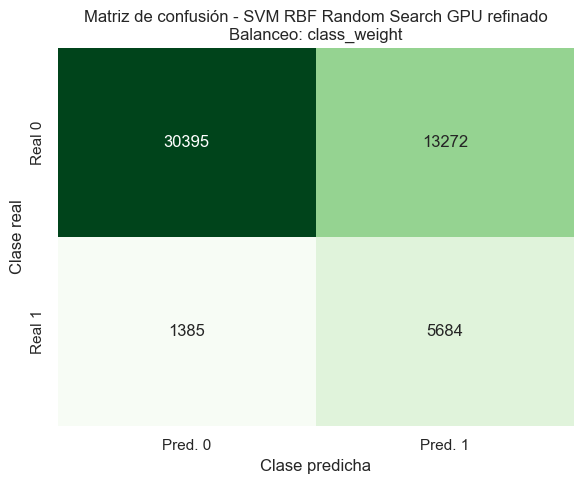

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.96      0.70      0.81     43667
Prediabetes/Diabetes       0.30      0.80      0.44      7069

            accuracy                           0.71     50736
           macro avg       0.63      0.75      0.62     50736
        weighted avg       0.86      0.71      0.75     50736



In [322]:
# ============================================================
# Función auxiliar para leer claves con nombres flexibles
# ============================================================

def get_flexible(r, keys, default=None):
    """
    Busca una clave dentro de un diccionario usando varios nombres posibles.
    """
    if not isinstance(r, dict):
        return default

    for key in keys:
        if key in r:
            return r.get(key)

    return default

# ============================================================
# Diagnóstico de matriz de confusión - SVM Random GPU refinado
# ============================================================

from sklearn.metrics import confusion_matrix

y_pred_svm_gpu_refined = np.array(
    get_flexible(best_svm_random_gpu_refined_result, ["Predicciones", "y_pred", "Predictions"])
)

cm_svm_random_gpu_refined = get_flexible(
    best_svm_random_gpu_refined_result,
    ["Matriz Confusión", "Matriz Confusion", "confusion_matrix"]
)

if cm_svm_random_gpu_refined is None:
    cm_svm_random_gpu_refined = confusion_matrix(y_test, y_pred_svm_gpu_refined)
else:
    cm_svm_random_gpu_refined = np.array(cm_svm_random_gpu_refined)

tn, fp, fn, tp = cm_svm_random_gpu_refined.ravel()
n_total = tn + fp + fn + tp

svm_random_gpu_refined_diagnostic = pd.DataFrame([{
    "Modelo": get_flexible(best_svm_random_gpu_refined_result, ["Modelo"], "SVM RBF GPU"),
    "Método": get_flexible(best_svm_random_gpu_refined_result, ["Metodo", "Método"], "Random Search GPU refinado"),
    "Balanceo": get_flexible(best_svm_random_gpu_refined_result, ["Balanceo", "balance_strategy"]),
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": get_flexible(best_svm_random_gpu_refined_result, ["Test Accuracy", "Accuracy"]),
    "Test Precision": get_flexible(best_svm_random_gpu_refined_result, ["Test Precision", "Precision"]),
    "Test Recall": get_flexible(best_svm_random_gpu_refined_result, ["Test Recall", "Recall"]),
    "Test F1": get_flexible(best_svm_random_gpu_refined_result, ["Test F1", "F1"]),
    "Test AUC": get_flexible(best_svm_random_gpu_refined_result, ["Test AUC", "ROC AUC", "Test ROC AUC"]),
    "Best Params": str(get_flexible(best_svm_random_gpu_refined_result, ["Best Params", "Mejores Hiperparámetros"]))
}])

display(svm_random_gpu_refined_diagnostic.round(4))

# ============================================================
# Matriz de confusión - SVM Random GPU refinado
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import classification_report

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_svm_random_gpu_refined,
    annot=True,
    fmt="d",
    cmap="Greens",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    "Matriz de confusión - SVM RBF Random Search GPU refinado\n"
    f"Balanceo: {get_flexible(best_svm_random_gpu_refined_result, ['Balanceo', 'balance_strategy'])}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        y_pred_svm_gpu_refined,
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

In [323]:
# ============================================================
# Función auxiliar
# ============================================================

def get_flexible(r, keys, default=None):
    if not isinstance(r, dict):
        return default

    for key in keys:
        if key in r:
            return r.get(key)

    return default

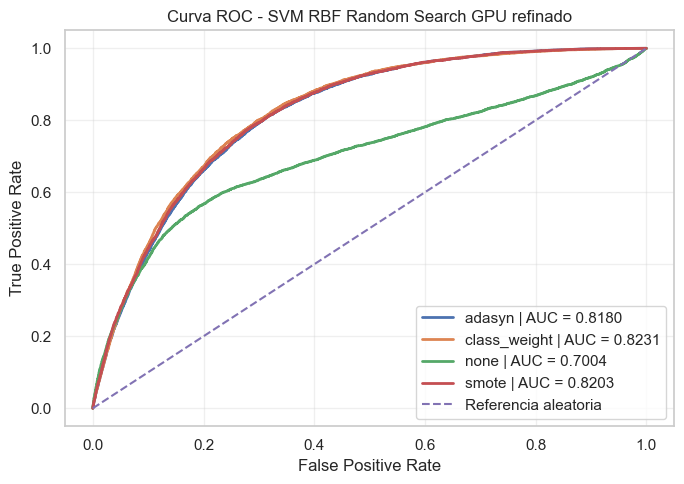

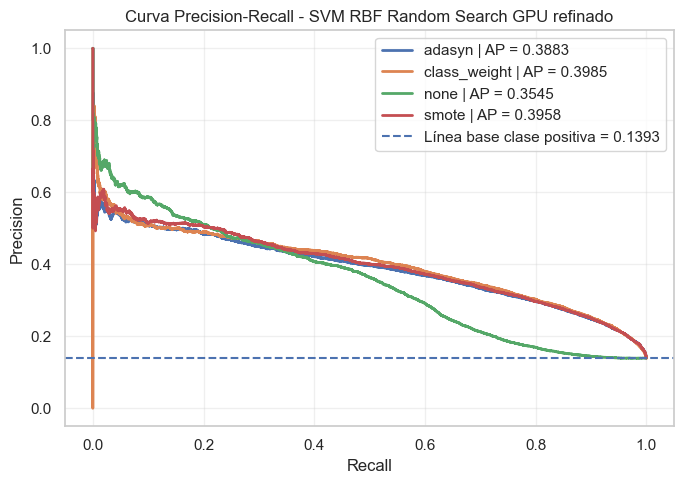

In [325]:
# ============================================================
# Curva ROC - SVM Random GPU refinado CPU-safe
# ============================================================

import matplotlib.pyplot as plt

from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(7, 5))

for result in random_results_svm_gpu_refined:

    balance = get_flexible(result, ["Balanceo", "balance_strategy"])
    y_score = get_flexible(result, ["Scores", "scores", "y_score"])

    if y_score is None:
        continue

    y_score = np.array(y_score)

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        linewidth=2,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    label="Referencia aleatoria"
)

plt.title("Curva ROC - SVM RBF Random Search GPU refinado")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - SVM Random GPU refinado CPU-safe
# ============================================================

from sklearn.metrics import precision_recall_curve, average_precision_score

plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in random_results_svm_gpu_refined:

    balance = get_flexible(result, ["Balanceo", "balance_strategy"])
    y_score = get_flexible(result, ["Scores", "scores", "y_score"])

    if y_score is None:
        continue

    y_score = np.array(y_score)

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        linewidth=2,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - SVM RBF Random Search GPU refinado")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### **24.3 SVM con Optuna**

In [ ]:
optuna_path = f"{CHECKPOINT_DIR}/svm_optuna.joblib"

if os.path.exists(optuna_path):
    optuna_results_svm = [joblib.load(optuna_path)]
    print("Optuna SVM ya existe. Se cargó desde checkpoint.")
else:
    optuna_results_svm = []

    result = run_optuna_model(
        model_key="svm",
        model_name="SVM RBF",
        scale_numeric=True,
        n_trials=30
    )

    optuna_results_svm.append(result)
    joblib.dump(result, optuna_path)
    print(f"Guardado: {optuna_path}")

In [165]:
# ============================================================
# Cargar resultados SVM RBF - Optuna desde checkpoints
# ============================================================

from pathlib import Path
import os
import joblib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

# Carpeta donde están los archivos de SVM Optuna
SVM_OPTUNA_DIR = BASE_DIR / "svm_optuna"

print("Ruta SVM Optuna:")
print(SVM_OPTUNA_DIR)
print("Existe:", SVM_OPTUNA_DIR.exists())

print("\nArchivos disponibles:")
for archivo in os.listdir(SVM_OPTUNA_DIR):
    print("-", archivo)

Ruta SVM Optuna:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\svm_optuna
Existe: True

Archivos disponibles:
- best_estimator_svm_optuna_20260516_211642.joblib
- best_result_svm_optuna_20260516_211642.joblib
- objects_svm_optuna_20260516_211642.joblib
- study_svm_optuna_20260516_211642.joblib
- summary_svm_optuna_20260516_211642.csv
- summary_svm_optuna_20260516_211642.xlsx


In [166]:
# ============================================================
# Detectar archivos de SVM Optuna
# ============================================================

archivos_svm_optuna = os.listdir(SVM_OPTUNA_DIR)

def buscar_archivo_optuna(patrones, extension):
    candidatos = []

    for archivo in archivos_svm_optuna:
        archivo_lower = archivo.lower()

        cumple_patrones = all(p.lower() in archivo_lower for p in patrones)
        cumple_extension = archivo_lower.endswith(extension)

        if cumple_patrones and cumple_extension:
            candidatos.append(archivo)

    return sorted(candidatos)


summary_candidates = buscar_archivo_optuna(
    patrones=["summary", "svm", "optuna"],
    extension=".csv"
)

objects_candidates = buscar_archivo_optuna(
    patrones=["objects", "svm", "optuna"],
    extension=".joblib"
)

best_result_candidates = buscar_archivo_optuna(
    patrones=["best", "result", "svm", "optuna"],
    extension=".joblib"
)

best_estimator_candidates = buscar_archivo_optuna(
    patrones=["best", "estimator", "svm", "optuna"],
    extension=".joblib"
)

study_candidates = buscar_archivo_optuna(
    patrones=["study", "svm", "optuna"],
    extension=".joblib"
)

print("Candidatos summary:", summary_candidates)
print("Candidatos objects:", objects_candidates)
print("Candidatos best result:", best_result_candidates)
print("Candidatos best estimator:", best_estimator_candidates)
print("Candidatos study:", study_candidates)

if len(summary_candidates) == 0:
    raise FileNotFoundError("No se encontró summary de SVM Optuna.")

if len(objects_candidates) == 0:
    raise FileNotFoundError("No se encontró objects de SVM Optuna.")

if len(best_result_candidates) == 0:
    raise FileNotFoundError("No se encontró best_result de SVM Optuna.")

summary_path_svm_optuna = SVM_OPTUNA_DIR / summary_candidates[-1]
objects_path_svm_optuna = SVM_OPTUNA_DIR / objects_candidates[-1]
best_result_path_svm_optuna = SVM_OPTUNA_DIR / best_result_candidates[-1]

best_estimator_path_svm_optuna = (
    SVM_OPTUNA_DIR / best_estimator_candidates[-1]
    if len(best_estimator_candidates) > 0
    else None
)

study_path_svm_optuna = (
    SVM_OPTUNA_DIR / study_candidates[-1]
    if len(study_candidates) > 0
    else None
)

print("\nArchivos seleccionados:")
print("Summary:", summary_path_svm_optuna)
print("Objects:", objects_path_svm_optuna)
print("Best result:", best_result_path_svm_optuna)
print("Best estimator:", best_estimator_path_svm_optuna)
print("Study:", study_path_svm_optuna)

Candidatos summary: ['summary_svm_optuna_20260516_211642.csv']
Candidatos objects: ['objects_svm_optuna_20260516_211642.joblib']
Candidatos best result: ['best_result_svm_optuna_20260516_211642.joblib']
Candidatos best estimator: ['best_estimator_svm_optuna_20260516_211642.joblib']
Candidatos study: ['study_svm_optuna_20260516_211642.joblib']

Archivos seleccionados:
Summary: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\svm_optuna\summary_svm_optuna_20260516_211642.csv
Objects: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\svm_optuna\objects_svm_optuna_20260516_211642.joblib
Best result: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\svm_optuna\best_result_svm_optuna_20260516_211642.joblib
Best estimator: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\svm_optuna\best_estimator_svm_optuna_20260516_211642.joblib
Study: C:\Users\danih\OneDrive\Docu

In [167]:
# ============================================================
# Carga segura SVM Optuna sin abrir objects problemático
# ============================================================

import pandas as pd
import joblib
import numpy as np

# 1. Cargar summary CSV
svm_optuna_summary = pd.read_csv(summary_path_svm_optuna)

print("Summary cargado correctamente.")
print("Columnas:")
print(svm_optuna_summary.columns.tolist())

display(
    svm_optuna_summary
    .sort_values(by="Test Recall", ascending=False, na_position="last")
    .round(4)
)

# 2. Intentar cargar solo best_result
try:
    best_svm_optuna_result = joblib.load(best_result_path_svm_optuna)
    print("Best result cargado correctamente.")
    print("Claves disponibles:")
    print(best_svm_optuna_result.keys())

except Exception as e:
    best_svm_optuna_result = None
    print("No se pudo cargar best_result.")
    print("Error:", repr(e))

Summary cargado correctamente.
Columnas:
['Modelo', 'Metodo', 'Balanceo', 'CV Recall', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1', 'Test AUC', 'Tiempo (s)', 'Evaluaciones', 'Best Params', 'Timestamp']


,Modelo,Metodo,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params,Timestamp
0,SVM RBF,Optuna,class_weight,0.8192,0.6992,0.2932,0.8215,0.4322,0.8215,9497.3152,12,"{'balance_strategy': 'class_weight', 'C': 7.78...",20260516_211642


No se pudo cargar best_result.
Error: ValueError("<class 'numpy.random._mt19937.MT19937'> is not a known BitGenerator module.")


In [168]:
# ============================================================
# Intentar cargar best estimator de SVM Optuna
# ============================================================

try:
    if best_estimator_path_svm_optuna is not None:
        best_svm_optuna_estimator = joblib.load(best_estimator_path_svm_optuna)
        print("Best estimator cargado correctamente.")
    else:
        best_svm_optuna_estimator = None
        print("No hay archivo best_estimator.")

except Exception as e:
    best_svm_optuna_estimator = None
    print("No se pudo cargar best_estimator.")
    print("Error:", repr(e))

Best estimator cargado correctamente.


In [169]:
# ============================================================
# Reconstruir resultado SVM Optuna usando summary + best estimator
# ============================================================

from sklearn.metrics import (
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score
)

import numpy as np
import pandas as pd

# Tomar la mejor fila del summary según Test Recall
best_row_svm_optuna = (
    svm_optuna_summary
    .sort_values(by="Test Recall", ascending=False, na_position="last")
    .iloc[0]
)

# Verificar que el estimador sí cargó
if best_svm_optuna_estimator is None:
    raise ValueError("No se puede reconstruir el resultado porque el best_estimator no cargó.")

# Generar predicciones
y_pred_svm_optuna = best_svm_optuna_estimator.predict(X_test)

# Generar scores
if hasattr(best_svm_optuna_estimator, "predict_proba"):
    y_score_svm_optuna = best_svm_optuna_estimator.predict_proba(X_test)[:, 1]
else:
    y_score_svm_optuna = best_svm_optuna_estimator.decision_function(X_test)

# Convertir a numpy
y_pred_svm_optuna = np.array(y_pred_svm_optuna)
y_score_svm_optuna = np.array(y_score_svm_optuna)

# Matriz de confusión
cm_svm_optuna = confusion_matrix(y_test, y_pred_svm_optuna)

# Reconstruir diccionario de resultado
best_svm_optuna_result = {
    "Modelo": best_row_svm_optuna.get("Modelo", "SVM RBF"),
    "Metodo": best_row_svm_optuna.get("Metodo", best_row_svm_optuna.get("Método", "Optuna")),
    "Balanceo": best_row_svm_optuna.get("Balanceo"),

    "CV Recall": best_row_svm_optuna.get("CV Recall"),

    "Test Accuracy": accuracy_score(y_test, y_pred_svm_optuna),
    "Test Precision": precision_score(y_test, y_pred_svm_optuna, zero_division=0),
    "Test Recall": recall_score(y_test, y_pred_svm_optuna, zero_division=0),
    "Test F1": f1_score(y_test, y_pred_svm_optuna, zero_division=0),
    "Test AUC": roc_auc_score(y_test, y_score_svm_optuna),

    "Tiempo (s)": best_row_svm_optuna.get("Tiempo (s)"),
    "Evaluaciones": best_row_svm_optuna.get("Evaluaciones"),
    "Best Params": best_row_svm_optuna.get("Best Params"),

    "Best Estimator": best_svm_optuna_estimator,
    "Matriz Confusión": cm_svm_optuna,
    "Predicciones": y_pred_svm_optuna,
    "Scores": y_score_svm_optuna
}

print("Resultado SVM Optuna reconstruido correctamente desde summary + best_estimator.")
print("Balanceo:", best_svm_optuna_result["Balanceo"])
print("Test Recall:", round(best_svm_optuna_result["Test Recall"], 4))
print("Test Precision:", round(best_svm_optuna_result["Test Precision"], 4))
print("Test F1:", round(best_svm_optuna_result["Test F1"], 4))
print("Test AUC:", round(best_svm_optuna_result["Test AUC"], 4))

Resultado SVM Optuna reconstruido correctamente desde summary + best_estimator.
Balanceo: class_weight
Test Recall: 0.8215
Test Precision: 0.2932
Test F1: 0.4322
Test AUC: 0.8215


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Best Params
0,SVM RBF,Optuna,class_weight,29669,13998,1262,5807,13.9329,39.0354,0.6992,0.2932,0.8215,0.4322,0.8215,"{'balance_strategy': 'class_weight', 'C': 7.78..."


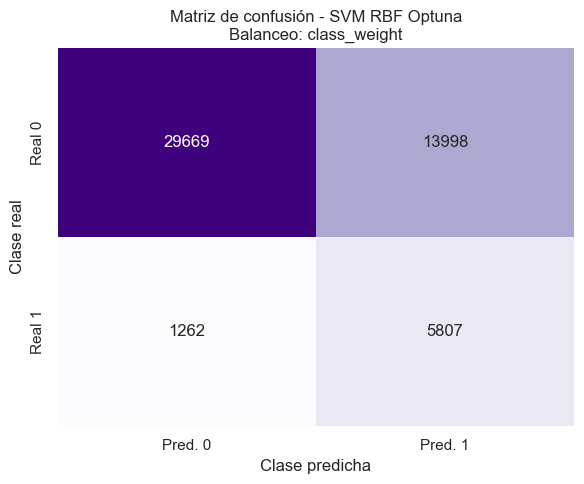

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.96      0.68      0.80     43667
Prediabetes/Diabetes       0.29      0.82      0.43      7069

            accuracy                           0.70     50736
           macro avg       0.63      0.75      0.61     50736
        weighted avg       0.87      0.70      0.74     50736



In [340]:
# ============================================================
# Diagnóstico de matriz de confusión - SVM Optuna
# ============================================================

tn, fp, fn, tp = cm_svm_optuna.ravel()
n_total = tn + fp + fn + tp

svm_optuna_diagnostic = pd.DataFrame([{
    "Modelo": best_svm_optuna_result["Modelo"],
    "Método": best_svm_optuna_result["Metodo"],
    "Balanceo": best_svm_optuna_result["Balanceo"],
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": best_svm_optuna_result["Test Accuracy"],
    "Test Precision": best_svm_optuna_result["Test Precision"],
    "Test Recall": best_svm_optuna_result["Test Recall"],
    "Test F1": best_svm_optuna_result["Test F1"],
    "Test AUC": best_svm_optuna_result["Test AUC"],
    "Best Params": str(best_svm_optuna_result["Best Params"])
}])

display(svm_optuna_diagnostic.round(4))

# ============================================================
# Matriz de confusión - SVM Optuna
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import classification_report

CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_svm_optuna,
    annot=True,
    fmt="d",
    cmap="Purples",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    f"Matriz de confusión - SVM RBF Optuna\n"
    f"Balanceo: {best_svm_optuna_result['Balanceo']}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        y_pred_svm_optuna,
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

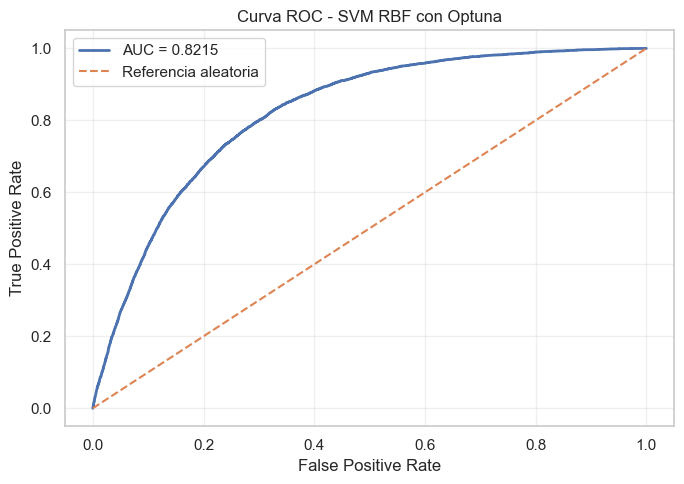

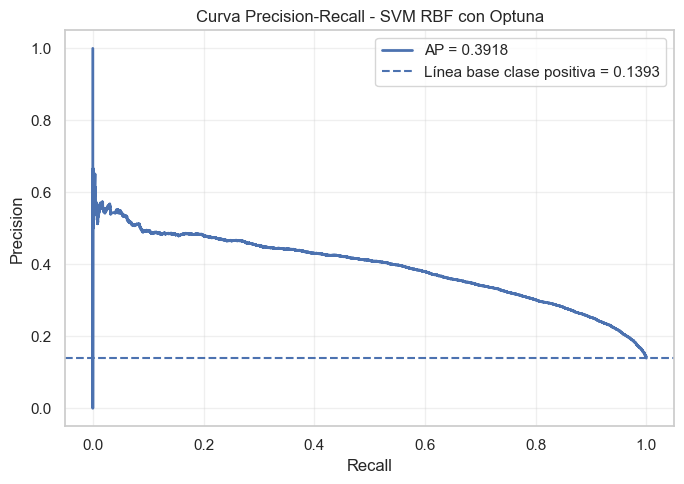

In [341]:
# ============================================================
# Curva ROC - SVM Optuna
# ============================================================

from sklearn.metrics import roc_curve, auc

fpr_svm_optuna, tpr_svm_optuna, _ = roc_curve(
    y_test,
    y_score_svm_optuna
)

roc_auc_svm_optuna = auc(fpr_svm_optuna, tpr_svm_optuna)

plt.figure(figsize=(7, 5))

plt.plot(
    fpr_svm_optuna,
    tpr_svm_optuna,
    linewidth=2,
    label=f"AUC = {roc_auc_svm_optuna:.4f}"
)

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    label="Referencia aleatoria"
)

plt.title("Curva ROC - SVM RBF con Optuna")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# ============================================================
# Curva Precision-Recall - SVM Optuna
# ============================================================

from sklearn.metrics import precision_recall_curve, average_precision_score

precision_svm_optuna, recall_svm_optuna, _ = precision_recall_curve(
    y_test,
    y_score_svm_optuna
)

avg_precision_svm_optuna = average_precision_score(
    y_test,
    y_score_svm_optuna
)

positive_rate = y_test.mean()

plt.figure(figsize=(7, 5))

plt.plot(
    recall_svm_optuna,
    precision_svm_optuna,
    linewidth=2,
    label=f"AP = {avg_precision_svm_optuna:.4f}"
)

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - SVM RBF con Optuna")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### **24.4 SVM con DEAP**

In [ ]:
deap_path = f"{CHECKPOINT_DIR}/svm_deap.joblib"

if os.path.exists(deap_path):
    deap_results_svm = [joblib.load(deap_path)]
    print("DEAP SVM ya existe. Se cargó desde checkpoint.")
else:
    deap_results_svm = []

    result = run_deap_model(
        model_key="svm",
        n_population=10,
        n_generations=5
    )

    deap_results_svm.append(result)
    joblib.dump(result, deap_path)
    print(f"Guardado: {deap_path}")

In [170]:
# ============================================================
# Cargar SVM DEAP GPU - CPU-safe en notebook local
# ============================================================

from pathlib import Path
import joblib
import pandas as pd
import numpy as np

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

SVM_DEAP_GPU_DIR = BASE_DIR / "checkpoints_svm"

summary_path_svm_deap_gpu = SVM_DEAP_GPU_DIR / "summary_svm_deap_gpu_cpu_safe.csv"
objects_path_svm_deap_gpu = SVM_DEAP_GPU_DIR / "objects_svm_deap_gpu_cpu_safe.joblib"
best_result_path_svm_deap_gpu = SVM_DEAP_GPU_DIR / "best_result_svm_deap_gpu_cpu_safe.joblib"

svm_deap_gpu_summary = pd.read_csv(summary_path_svm_deap_gpu)
deap_results_svm_gpu = joblib.load(objects_path_svm_deap_gpu)
best_svm_deap_gpu_result = joblib.load(best_result_path_svm_deap_gpu)

# Convertir listas a numpy
for r in deap_results_svm_gpu:
    if r.get("Predicciones") is not None:
        r["Predicciones"] = np.array(r["Predicciones"])

    if r.get("Scores") is not None:
        r["Scores"] = np.array(r["Scores"])

    if r.get("Matriz Confusión") is not None:
        r["Matriz Confusión"] = np.array(r["Matriz Confusión"])

if best_svm_deap_gpu_result.get("Predicciones") is not None:
    best_svm_deap_gpu_result["Predicciones"] = np.array(
        best_svm_deap_gpu_result["Predicciones"]
    )

if best_svm_deap_gpu_result.get("Scores") is not None:
    best_svm_deap_gpu_result["Scores"] = np.array(
        best_svm_deap_gpu_result["Scores"]
    )

if best_svm_deap_gpu_result.get("Matriz Confusión") is not None:
    best_svm_deap_gpu_result["Matriz Confusión"] = np.array(
        best_svm_deap_gpu_result["Matriz Confusión"]
    )

print("SVM DEAP GPU CPU-safe cargado correctamente.")

display(
    svm_deap_gpu_summary
    .sort_values(by="Test Recall", ascending=False, na_position="last")
    .round(4)
)

SVM DEAP GPU CPU-safe cargado correctamente.


,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params,Best Individual
0,SVM RBF GPU,DEAP GPU,class_weight,0.9175,0.5817,0.2388,0.915,0.3787,0.7668,2015.1198,34,"{'C': 1, 'gamma': 'scale'}","[1, 0, 3]"


,Modelo,Método,Balanceo,TN,FP,FN,TP,Positivos reales (%),Positivos predichos (%),Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Best Params
0,SVM RBF GPU,DEAP GPU,class_weight,23044,20623,601,6468,13.9329,53.396,0.5817,0.2388,0.915,0.3787,0.7668,"{'C': 1, 'gamma': 'scale'}"


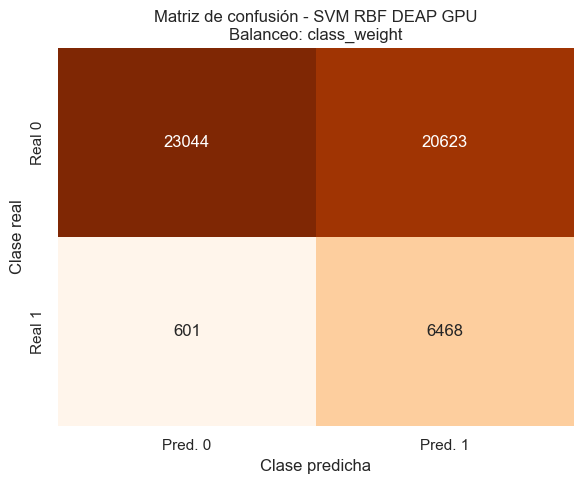

Reporte de clasificación:
                      precision    recall  f1-score   support

        Sin diabetes       0.97      0.53      0.68     43667
Prediabetes/Diabetes       0.24      0.91      0.38      7069

            accuracy                           0.58     50736
           macro avg       0.61      0.72      0.53     50736
        weighted avg       0.87      0.58      0.64     50736



In [329]:
# ============================================================
# Matriz de confusión - SVM DEAP GPU
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import classification_report, confusion_matrix

def get_flexible(r, keys, default=None):
    if not isinstance(r, dict):
        return default

    for key in keys:
        if key in r:
            return r.get(key)

    return default


y_pred_svm_deap_gpu = get_flexible(
    best_svm_deap_gpu_result,
    ["Predicciones", "y_pred", "Predictions"]
)

if y_pred_svm_deap_gpu is None:
    raise ValueError("No se encontraron predicciones para SVM DEAP GPU.")

y_pred_svm_deap_gpu = np.array(y_pred_svm_deap_gpu)

cm_svm_deap_gpu = get_flexible(
    best_svm_deap_gpu_result,
    ["Matriz Confusión", "Matriz Confusion", "confusion_matrix"]
)

if cm_svm_deap_gpu is None:
    cm_svm_deap_gpu = confusion_matrix(y_test, y_pred_svm_deap_gpu)
else:
    cm_svm_deap_gpu = np.array(cm_svm_deap_gpu)

tn, fp, fn, tp = cm_svm_deap_gpu.ravel()
n_total = tn + fp + fn + tp

svm_deap_gpu_diagnostic = pd.DataFrame([{
    "Modelo": get_flexible(best_svm_deap_gpu_result, ["Modelo"], "SVM RBF GPU"),
    "Método": get_flexible(best_svm_deap_gpu_result, ["Metodo", "Método"], "DEAP GPU"),
    "Balanceo": get_flexible(best_svm_deap_gpu_result, ["Balanceo", "balance_strategy"]),
    "TN": tn,
    "FP": fp,
    "FN": fn,
    "TP": tp,
    "Positivos reales (%)": ((tp + fn) / n_total) * 100,
    "Positivos predichos (%)": ((tp + fp) / n_total) * 100,
    "Test Accuracy": get_flexible(best_svm_deap_gpu_result, ["Test Accuracy", "Accuracy"]),
    "Test Precision": get_flexible(best_svm_deap_gpu_result, ["Test Precision", "Precision"]),
    "Test Recall": get_flexible(best_svm_deap_gpu_result, ["Test Recall", "Recall"]),
    "Test F1": get_flexible(best_svm_deap_gpu_result, ["Test F1", "F1"]),
    "Test AUC": get_flexible(best_svm_deap_gpu_result, ["Test AUC", "ROC AUC", "Test ROC AUC"]),
    "Best Params": str(get_flexible(best_svm_deap_gpu_result, ["Best Params", "Mejores Hiperparámetros"]))
}])

display(svm_deap_gpu_diagnostic.round(4))


CLASS_NAMES = ["Sin diabetes", "Prediabetes/Diabetes"]

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm_svm_deap_gpu,
    annot=True,
    fmt="d",
    cmap="Oranges",
    cbar=False,
    xticklabels=["Pred. 0", "Pred. 1"],
    yticklabels=["Real 0", "Real 1"]
)

plt.title(
    "Matriz de confusión - SVM RBF DEAP GPU\n"
    f"Balanceo: {get_flexible(best_svm_deap_gpu_result, ['Balanceo', 'balance_strategy'])}"
)
plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.tight_layout()
plt.show()

print("Reporte de clasificación:")
print(
    classification_report(
        y_test,
        y_pred_svm_deap_gpu,
        target_names=CLASS_NAMES,
        zero_division=0
    )
)

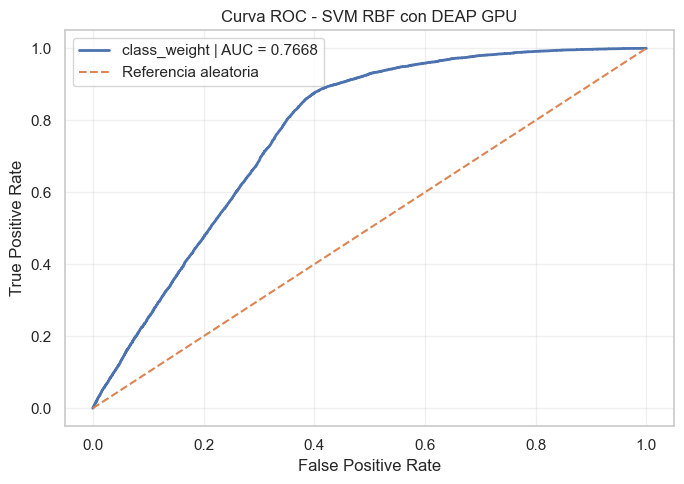

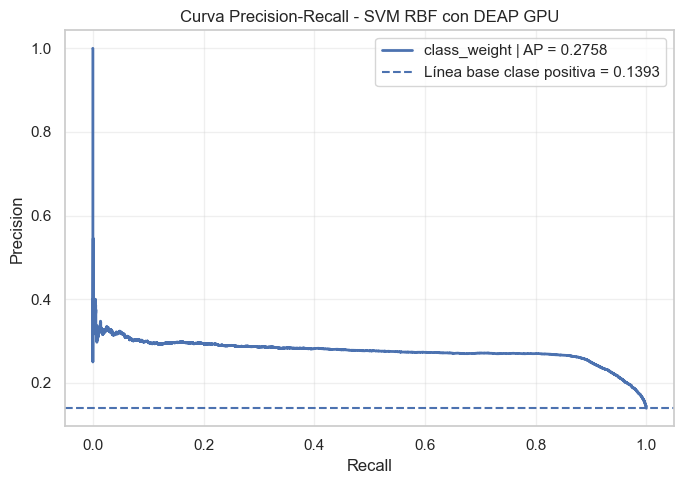

In [330]:
# ============================================================
# Curvas ROC y Precision-Recall - SVM DEAP GPU
# ============================================================

from sklearn.metrics import (
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)

# Curva ROC
plt.figure(figsize=(7, 5))

for result in deap_results_svm_gpu:

    balance = get_flexible(result, ["Balanceo", "balance_strategy"])
    y_score = get_flexible(result, ["Scores", "scores", "y_score"])

    if y_score is None:
        continue

    y_score = np.array(y_score)

    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        linewidth=2,
        label=f"{balance} | AUC = {roc_auc:.4f}"
    )

plt.plot([0, 1], [0, 1], linestyle="--", label="Referencia aleatoria")

plt.title("Curva ROC - SVM RBF con DEAP GPU")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# Curva Precision-Recall
plt.figure(figsize=(7, 5))

positive_rate = y_test.mean()

for result in deap_results_svm_gpu:

    balance = get_flexible(result, ["Balanceo", "balance_strategy"])
    y_score = get_flexible(result, ["Scores", "scores", "y_score"])

    if y_score is None:
        continue

    y_score = np.array(y_score)

    precision, recall, _ = precision_recall_curve(y_test, y_score)
    avg_precision = average_precision_score(y_test, y_score)

    plt.plot(
        recall,
        precision,
        linewidth=2,
        label=f"{balance} | AP = {avg_precision:.4f}"
    )

plt.axhline(
    positive_rate,
    linestyle="--",
    label=f"Línea base clase positiva = {positive_rate:.4f}"
)

plt.title("Curva Precision-Recall - SVM RBF con DEAP GPU")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

,Generacion,Best Recall,Best Individual,Best Params,Best Balance
0,1,0.898268,"[0, 0, 3]","{'C': 0.1, 'gamma': 'scale'}",class_weight
1,2,0.898268,"[0, 0, 3]","{'C': 0.1, 'gamma': 'scale'}",class_weight
2,3,0.826948,"[0, 1, 3]","{'C': 0.1, 'gamma': 0.001}",class_weight
3,4,0.898268,"[0, 0, 3]","{'C': 0.1, 'gamma': 'scale'}",class_weight
4,5,0.917482,"[1, 0, 3]","{'C': 1, 'gamma': 'scale'}",class_weight


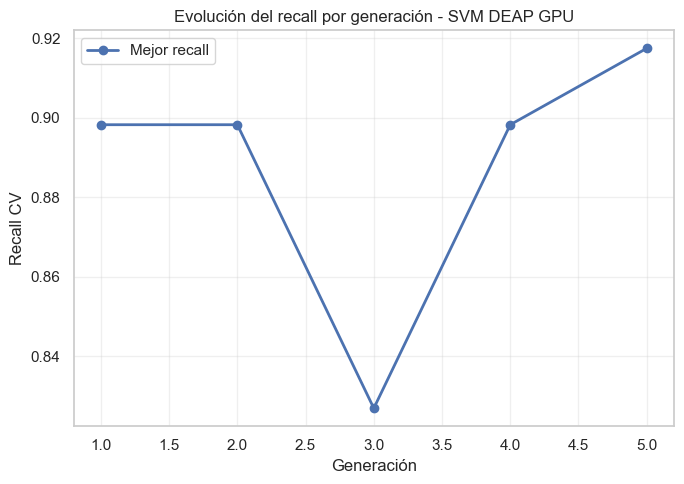

In [331]:
# ============================================================
# Logbook y evolución - SVM DEAP GPU
# ============================================================

logbook_svm_deap_gpu = get_flexible(
    best_svm_deap_gpu_result,
    ["Logbook", "logbook", "Historial", "Historia"]
)

if logbook_svm_deap_gpu is not None:

    if isinstance(logbook_svm_deap_gpu, pd.DataFrame):
        logbook_svm_deap_gpu_df = logbook_svm_deap_gpu.copy()
    else:
        logbook_svm_deap_gpu_df = pd.DataFrame(logbook_svm_deap_gpu)

    display(logbook_svm_deap_gpu_df)

    hist_df = logbook_svm_deap_gpu_df.copy()

    rename_map = {
        "Generacion": "Generación",
        "generation": "Generación",
        "Best Recall": "Mejor recall",
        "best_recall": "Mejor recall",
        "max": "Mejor recall",
        "Mean Recall": "Recall promedio",
        "mean": "Recall promedio"
    }

    hist_df = hist_df.rename(columns=rename_map)

    if "Generación" not in hist_df.columns:
        hist_df["Generación"] = np.arange(1, len(hist_df) + 1)

    plt.figure(figsize=(7, 5))

    if "Mejor recall" in hist_df.columns:
        plt.plot(
            hist_df["Generación"],
            hist_df["Mejor recall"],
            marker="o",
            linewidth=2,
            label="Mejor recall"
        )

    if "Recall promedio" in hist_df.columns:
        plt.plot(
            hist_df["Generación"],
            hist_df["Recall promedio"],
            marker="s",
            linestyle="--",
            linewidth=1.5,
            label="Recall promedio"
        )

    plt.title("Evolución del recall por generación - SVM DEAP GPU")
    plt.xlabel("Generación")
    plt.ylabel("Recall CV")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

else:
    print("No hay logbook disponible para SVM DEAP GPU.")

---

## **25. Optimización computacional**

En esta sección se analiza la optimización computacional de algunos modelos, entendida como la reducción del costo de entrenamiento o consulta sin perder de vista el desempeño predictivo. Para KNN, el costo principal está asociado a la búsqueda de vecinos, ya que el algoritmo requiere comparar cada observación de prueba contra las observaciones de entrenamiento.

Por esta razón, se evaluaron variantes orientadas a acelerar la búsqueda de vecinos: `KD-Tree`, `Ball-Tree` y `FAISS`. Estas técnicas fueron ejecutadas previamente por una integrante del equipo y sus resultados se cargan desde archivos `.pkl` y `.joblib`, evitando repetir procesos de entrenamiento costosos.

El objetivo de esta comparación no es únicamente identificar el mayor recall, sino analizar el equilibrio entre desempeño predictivo y tiempo de ejecución.

### **25.1 KNN**

In [175]:
import faiss
import time
import numpy as np
import pandas as pd
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils.validation import check_is_fitted
from sklearn.neighbors import KNeighborsClassifier
 
 
# =============================================================================
# 1. WRAPPER FAISS
# =============================================================================
 
class FAISSKNNClassifier(BaseEstimator, ClassifierMixin):
    """KNN usando FAISS como motor de búsqueda. API compatible con sklearn."""
 
    def __init__(self, n_neighbors=5, weights="uniform", metric="euclidean"):
        self.n_neighbors = n_neighbors
        self.weights     = weights
        self.metric      = metric
 
    def fit(self, X, y):
        X = np.asarray(X, dtype=np.float32)
        self.classes_        = np.unique(y)
        self.y_train_        = np.asarray(y)
        self.n_features_in_  = X.shape[1]
        self.index_          = faiss.IndexFlatL2(X.shape[1])
        self.index_.add(X)
        return self
 
    def _query(self, X):
        X = np.asarray(X, dtype=np.float32)
        return self.index_.search(X, self.n_neighbors)
 
    def predict(self, X):
        check_is_fitted(self, "index_")
        distances, indices = self._query(X)
        preds = []
        for dists, idxs in zip(distances, indices):
            neighbor_labels = self.y_train_[idxs]
            w = np.ones(len(idxs)) if self.weights == "uniform" \
                else 1.0 / (dists + 1e-10)
            votes = {}
            for lbl, wi in zip(neighbor_labels, w):
                votes[lbl] = votes.get(lbl, 0) + wi
            preds.append(max(votes, key=votes.get))
        return np.array(preds)
 
    def predict_proba(self, X):
        check_is_fitted(self, "index_")
        distances, indices = self._query(X)
        proba = np.zeros((len(distances), len(self.classes_)))
        for i, (dists, idxs) in enumerate(zip(distances, indices)):
            neighbor_labels = self.y_train_[idxs]
            w = np.ones(len(idxs)) if self.weights == "uniform" \
                else 1.0 / (dists + 1e-10)
            for j, cls in enumerate(self.classes_):
                proba[i, j] = w[neighbor_labels == cls].sum()
            proba[i] /= proba[i].sum() + 1e-10
        return proba
 

In [176]:
def knn_factory_kd(params):
    return KNeighborsClassifier(
        n_neighbors=params["n_neighbors"],
        weights=params["weights"],
        metric=params["metric"],
        algorithm="kd_tree",
        n_jobs=-1,
    )
 
def knn_factory_bt(params):
    return KNeighborsClassifier(
        n_neighbors=params["n_neighbors"],
        weights=params["weights"],
        metric=params["metric"],
        algorithm="ball_tree",
        n_jobs=-1,
    )
 
def knn_factory_faiss(params):
    return FAISSKNNClassifier(
        n_neighbors=params["n_neighbors"],
        weights=params["weights"],
        metric=params.get("metric", "euclidean"),
    )

In [177]:
param_grid_kd_bt = {
    "modelo__n_neighbors": list(range(3, 22, 2)),
    "modelo__weights":     ["uniform", "distance"],
    "modelo__metric":      ["euclidean", "manhattan", "minkowski"],
}
 
# FAISS solo soporta L2 → sin metric
param_grid_faiss = {
    "modelo__n_neighbors": list(range(3, 22, 2)),
    "modelo__weights":     ["uniform", "distance"],
}
 
# DEAP
espacio_deap_kd_bt = {
    "n_neighbors": list(range(3, 22, 2)),
    "weights":     ["uniform", "distance"],
    "metric":      ["euclidean", "manhattan", "minkowski"],
}
espacio_deap_faiss = {
    "n_neighbors": list(range(3, 22, 2)),
    "weights":     ["uniform", "distance"],
}
 
# Estimadores de referencia (solo para isinstance en definir_espacio_optuna)
ref_kd    = KNeighborsClassifier(algorithm="kd_tree")
ref_bt    = KNeighborsClassifier(algorithm="ball_tree")
ref_faiss = FAISSKNNClassifier()

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# KD-TREE
# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "#"*65)
print("  KD-TREE")
print("#"*65)
 
resultados_gs_kd = optimizar_gridsearch(
    modelo_nombre="KNN_kd_tree",
    estimator=knn_factory_kd({"n_neighbors": 5, "weights": "uniform", "metric": "euclidean"}),
    param_grid=param_grid_kd_bt,
    X_train=X_train_knn,
    y_train=y_train_knn,
    cv=cv_knn,
    escalado=True,
    scoring="recall",
)
 
resultados_rs_kd = optimizar_randomsearch(
    modelo_nombre="KNN_kd_tree",
    estimator=knn_factory_kd({"n_neighbors": 5, "weights": "uniform", "metric": "euclidean"}),
    param_distributions=param_grid_kd_bt,
    X_train=X_train_knn,
    y_train=y_train_knn,
    cv=cv_knn,
    escalado=True,
    scoring="recall",
    n_iter=30,
)
 
resultados_op_kd = optimizar_optuna(
    modelo_nombre="KNN_kd_tree",
    estimator=ref_kd,
    model_factory=knn_factory_kd,
    X_train=X_train_knn,
    y_train=y_train_knn,
    cv=cv_knn,
    escalado=True,
    n_trials=30,
    scoring="recall",
)
 
resultados_deap_kd = optimizar_deap(
    modelo_nombre="KNN_kd_tree",
    estimator=ref_kd,
    model_factory=knn_factory_kd,
    espacio=espacio_deap_kd_bt,
    X_train=X_train_knn,
    y_train=y_train_knn,
    cv=cv_knn,
    escalado=True,
    n_generaciones=5,
    tam_poblacion=20,
    scoring="recall",
)
 
# ─────────────────────────────────────────────────────────────────────────────
# BALL-TREE
# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "#"*65)
print("  BALL-TREE")
print("#"*65)
 
resultados_gs_bt = optimizar_gridsearch(
    modelo_nombre="KNN_ball_tree",
    estimator=knn_factory_bt({"n_neighbors": 5, "weights": "uniform", "metric": "euclidean"}),
    param_grid=param_grid_kd_bt,
    X_train=X_train_knn,
    y_train=y_train_knn,
    cv=cv_knn,
    escalado=True,
    scoring="recall",
)
 
resultados_rs_bt = optimizar_randomsearch(
    modelo_nombre="KNN_ball_tree",
    estimator=knn_factory_bt({"n_neighbors": 5, "weights": "uniform", "metric": "euclidean"}),
    param_distributions=param_grid_kd_bt,
    X_train=X_train_knn,
    y_train=y_train_knn,
    cv=cv_knn,
    escalado=True,
    scoring="recall",
    n_iter=30,
)
 
resultados_op_bt = optimizar_optuna(
    modelo_nombre="KNN_ball_tree",
    estimator=ref_bt,
    model_factory=knn_factory_bt,
    X_train=X_train_knn,
    y_train=y_train_knn,
    cv=cv_knn,
    escalado=True,
    n_trials=30,
    scoring="recall",
)
 
resultados_deap_bt = optimizar_deap(
    modelo_nombre="KNN_ball_tree",
    estimator=ref_bt,
    model_factory=knn_factory_bt,
    espacio=espacio_deap_kd_bt,
    X_train=X_train_knn,
    y_train=y_train_knn,
    cv=cv_knn,
    escalado=True,
    n_generaciones=5,
    tam_poblacion=20,
    scoring="recall",
)
 
# ─────────────────────────────────────────────────────────────────────────────
# FAISS
# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "#"*65)
print("  FAISS")
print("#"*65)
 
resultados_gs_faiss = optimizar_gridsearch(
    modelo_nombre="KNN_faiss",
    estimator=knn_factory_faiss({"n_neighbors": 5, "weights": "uniform"}),
    param_grid=param_grid_faiss,
    X_train=X_train_knn,
    y_train=y_train_knn,
    cv=cv_knn,
    escalado=True,
    scoring="recall",
)
 
resultados_rs_faiss = optimizar_randomsearch(
    modelo_nombre="KNN_faiss",
    estimator=knn_factory_faiss({"n_neighbors": 5, "weights": "uniform"}),
    param_distributions=param_grid_faiss,
    X_train=X_train_knn,
    y_train=y_train_knn,
    cv=cv_knn,
    escalado=True,
    scoring="recall",
    n_iter=30,
)
 
resultados_op_faiss = optimizar_optuna(
    modelo_nombre="KNN_faiss",
    estimator=ref_faiss,          
    model_factory=knn_factory_faiss,
    X_train=X_train_knn,
    y_train=y_train_knn,
    cv=cv_knn,
    escalado=True,
    n_trials=30,
    scoring="recall",
)
 
resultados_deap_faiss = optimizar_deap(
    modelo_nombre="KNN_faiss",
    estimator=ref_faiss,
    model_factory=knn_factory_faiss,
    espacio=espacio_deap_faiss,
    X_train=X_train_knn,
    y_train=y_train_knn,
    cv=cv_knn,
    escalado=True,
    n_generaciones=5,
    tam_poblacion=20,
    scoring="recall",
)
 

---

In [254]:
# ============================================================
# PARCHE DE COMPATIBILIDAD PARA CARGAR PKL/JOBLIB ANTIGUOS
# sklearn Pipeline / ColumnTransformer
# ============================================================

import sklearn
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

print("Versión actual de scikit-learn:", sklearn.__version__)

# Parche para Pipeline
if not hasattr(Pipeline, "transform_input"):
    Pipeline.transform_input = None

# Parche para ColumnTransformer
if not hasattr(ColumnTransformer, "force_int_remainder_cols"):
    ColumnTransformer.force_int_remainder_cols = False

print("Parche aplicado correctamente.")

Versión actual de scikit-learn: 1.6.1
Parche aplicado correctamente.


In [261]:
# ============================================================
# Función de carga segura corregida
# ============================================================

import pickle
import joblib
from pathlib import Path

def cargar_archivo_seguro(path):
    path = Path(path)

    try:
        return joblib.load(path)
    except Exception as e1:
        try:
            with open(path, "rb") as f:
                return pickle.load(f)
        except Exception as e2:
            raise RuntimeError(
                f"No se pudo cargar {path.name}. "
                f"Error joblib: {repr(e1)} | Error pickle: {repr(e2)}"
            )

In [256]:
# ============================================================
# 2. Buscar archivos útiles de resultados KNN
# ============================================================

archivos_resultados_knn = []

for carpeta in [DIR_COMP, DIR_NO_COMP]:
    if carpeta.exists():
        for archivo in carpeta.rglob("*"):
            nombre = archivo.name.lower()
            
            # Usar archivos de resultados, no estimadores individuales
            if archivo.suffix.lower() in [".pkl", ".joblib"]:
                if "knn" in nombre and "resultados" in nombre:
                    archivos_resultados_knn.append(archivo)

print("Archivos de resultados KNN encontrados:", len(archivos_resultados_knn))
print("=" * 90)

for a in archivos_resultados_knn:
    print(a)

Archivos de resultados KNN encontrados: 16
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\DEAP_KNN\deap_KNN_resultados.pkl
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\DEAP_KNN_ball_tree\deap_KNN_ball_tree_resultados.pkl
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\DEAP_KNN_faiss\deap_KNN_faiss_resultados.pkl
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\DEAP_KNN_kd_tree\deap_KNN_kd_tree_resultados.pkl
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\Grid_KNN\grid_KNN_resultados.pkl
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto d

In [258]:
# ============================================================
# 3. Funciones para extraer métricas KNN
# ============================================================

def cargar_archivo_seguro(path):
    path = Path(path)
    try:
        return joblib.load(path)
    except Exception:
        with open(path, "rb") as f:
            return pickle.load(f)


def norm(x):
    return str(x).strip().lower().replace(" ", "_").replace("-", "_")


def buscar(dic, claves, default=np.nan):
    if not isinstance(dic, dict):
        return default
    
    mapa = {norm(k): v for k, v in dic.items()}
    
    for clave in claves:
        if norm(clave) in mapa:
            return mapa[norm(clave)]
    
    return default


def inferir_modelo_tecnica(path):
    texto = str(path).lower()
    
    if "faiss" in texto:
        return "KNN FAISS", "FAISS"
    elif "kd_tree" in texto or "kd-tree" in texto or "kdtree" in texto:
        return "KNN KD-Tree", "KD-Tree"
    elif "ball_tree" in texto or "ball-tree" in texto or "balltree" in texto:
        return "KNN Ball-Tree", "Ball-Tree"
    else:
        return "KNN estándar", "KNN estándar"


def inferir_metodo(path):
    texto = str(path).lower()
    
    if "grid" in texto:
        return "Grid Search"
    elif "random" in texto:
        return "Random Search"
    elif "optuna" in texto:
        return "Optuna"
    elif "deap" in texto or "deep" in texto:
        return "DEAP"
    else:
        return "No identificado"


def inferir_balanceo(path, dic=None):
    texto = str(path).lower()
    
    if isinstance(dic, dict):
        texto += " " + str(dic).lower()
    
    if "adasyn" in texto:
        return "ADASYN"
    elif "smote" in texto:
        return "SMOTE"
    elif "class_weight" in texto or "class weight" in texto or "balanced" in texto:
        return "Class Weight"
    elif "sin_balanceo" in texto or "sin balanceo" in texto or "none" in texto:
        return "Sin Balanceo"
    else:
        return "No identificado"


def extraer_dicts(obj):
    """
    Extrae diccionarios con métricas desde objetos anidados.
    """
    encontrados = []
    
    if isinstance(obj, pd.DataFrame):
        return [row.to_dict() for _, row in obj.iterrows()]
    
    if isinstance(obj, dict):
        claves = " ".join([str(k).lower() for k in obj.keys()])
        if any(m in claves for m in ["recall", "precision", "accuracy", "auc", "f1", "tiempo"]):
            encontrados.append(obj)
        
        for v in obj.values():
            encontrados.extend(extraer_dicts(v))
    
    elif isinstance(obj, list):
        for item in obj:
            encontrados.extend(extraer_dicts(item))
    
    return encontrados


def construir_fila_knn(dic, archivo):
    modelo, tecnica = inferir_modelo_tecnica(archivo)
    metodo = buscar(dic, ["Método", "Metodo", "method"], default=inferir_metodo(archivo))
    balanceo = buscar(dic, ["Balanceo", "balanceo", "Escenario", "balance_strategy"], default=inferir_balanceo(archivo, dic))
    
    if pd.isna(metodo) or str(metodo).lower() in ["nan", "none", ""]:
        metodo = inferir_metodo(archivo)
        
    if pd.isna(balanceo) or str(balanceo).lower() in ["nan", "none", ""]:
        balanceo = inferir_balanceo(archivo, dic)

    return {
        "Familia": "KNN",
        "Modelo": modelo,
        "Versión": "Optimizado",
        "Técnica computacional": tecnica,
        "Método": metodo,
        "Balanceo": balanceo,
        "CV Recall": buscar(dic, ["CV Recall", "Mejor recall CV", "Best CV Recall", "Mejor recall"]),
        "Std Recall CV": buscar(dic, ["Std Recall CV", "Std CV Recall", "Std Recall"]),
        "Test Accuracy": buscar(dic, ["Test Accuracy", "Accuracy"]),
        "Test Precision": buscar(dic, ["Test Precision", "Precision"]),
        "Test Recall": buscar(dic, ["Test Recall", "Recall"]),
        "Test F1": buscar(dic, ["Test F1", "F1"]),
        "Test ROC-AUC": buscar(dic, ["Test ROC-AUC", "Test AUC", "AUC", "ROC-AUC"]),
        "Tiempo (s)": buscar(dic, ["Tiempo (s)", "Tiempo", "Tiempo total"]),
        "Evaluaciones": buscar(dic, ["Evaluaciones", "Iteraciones", "n_iter", "n_trials"]),
        "Best Params": buscar(dic, ["Best Params", "Mejores params", "Mejores Hiperparámetros", "best_params"]),
        "Fuente": Path(archivo).name
    }

In [262]:
# ============================================================
# 4. Reconstruir KNN estándar, KD-Tree y Ball-Tree
# ============================================================

filas_knn = []

for archivo in archivos_resultados_knn:
    nombre = archivo.name.lower()
    
    # FAISS lo cargaremos aparte desde CSV limpio
    if "faiss" in nombre:
        continue
    
    try:
        obj = cargar_archivo_seguro(archivo)
        dicts = extraer_dicts(obj)
        
        for d in dicts:
            fila = construir_fila_knn(d, archivo)
            filas_knn.append(fila)
        
        print(f"✓ {archivo.name}: {len(dicts)} filas extraídas")
        
    except Exception as e:
        print(f"⚠ No se pudo cargar {archivo.name}: {repr(e)}")

knn_base = pd.DataFrame(filas_knn)

print("\nFilas KNN base extraídas:", len(knn_base))
display(knn_base.head())

✓ deap_KNN_resultados.pkl: 24 filas extraídas
✓ deap_KNN_ball_tree_resultados.pkl: 24 filas extraídas
✓ deap_KNN_kd_tree_resultados.pkl: 24 filas extraídas
✓ grid_KNN_resultados.pkl: 24 filas extraídas
✓ grid_KNN_ball_tree_resultados.pkl: 24 filas extraídas
✓ grid_KNN_kd_tree_resultados.pkl: 24 filas extraídas
✓ optuna_KNN_resultados.pkl: 24 filas extraídas
✓ optuna_KNN_ball_tree_resultados.pkl: 24 filas extraídas
✓ optuna_KNN_kd_tree_resultados.pkl: 24 filas extraídas
✓ random_KNN_resultados.pkl: 24 filas extraídas
✓ random_KNN_ball_tree_resultados.pkl: 24 filas extraídas
✓ random_KNN_kd_tree_resultados.pkl: 24 filas extraídas

Filas KNN base extraídas: 288


,Familia,Modelo,Versión,Técnica computacional,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test ROC-AUC,Tiempo (s),Evaluaciones,Best Params,Fuente
0,KNN,KNN estándar,Optimizado,KNN estándar,DEAP,Sin Balanceo,0.388542,0.010704,0.825233,0.331332,0.249823,0.284862,0.661763,902.261219,100.0,"{'n_neighbors': 3, 'weights': 'distance', 'met...",deap_KNN_resultados.pkl
1,KNN,KNN estándar,Optimizado,KNN estándar,DEAP,No identificado,NaN,NaN,0.825233,NaN,NaN,NaN,NaN,NaN,NaN,NaN,deap_KNN_resultados.pkl
2,KNN,KNN estándar,Optimizado,KNN estándar,DEAP,No identificado,NaN,NaN,NaN,0.883209,0.918382,NaN,NaN,NaN,NaN,NaN,deap_KNN_resultados.pkl
3,KNN,KNN estándar,Optimizado,KNN estándar,DEAP,No identificado,NaN,NaN,NaN,0.331332,0.249823,NaN,NaN,NaN,NaN,NaN,deap_KNN_resultados.pkl
4,KNN,KNN estándar,Optimizado,KNN estándar,DEAP,No identificado,NaN,NaN,NaN,0.607271,0.584103,NaN,NaN,NaN,NaN,NaN,deap_KNN_resultados.pkl


In [260]:
# ============================================================
# 5. Cargar FAISS desde summary limpio
# ============================================================

if not FAISS_CSV.exists():
    raise FileNotFoundError(f"No se encontró el archivo FAISS: {FAISS_CSV}")

faiss_summary = pd.read_csv(FAISS_CSV)

# Normalizar nombre de columnas
if "Test AUC" in faiss_summary.columns and "Test ROC-AUC" not in faiss_summary.columns:
    faiss_summary["Test ROC-AUC"] = faiss_summary["Test AUC"]

faiss_summary["Familia"] = "KNN"
faiss_summary["Modelo"] = "KNN FAISS"
faiss_summary["Versión"] = "Optimizado"
faiss_summary["Técnica computacional"] = "FAISS"
faiss_summary["Fuente"] = "summary_KNN_FAISS_cpu_safe.csv"

print("FAISS cargado:", faiss_summary.shape)
display(faiss_summary.head())

FAISS cargado: (16, 17)


,Modelo,Técnica computacional,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params,Fuente,Test ROC-AUC,Familia,Versión
0,KNN FAISS,FAISS,Grid Search,Sin Balanceo,0.390546,0.823202,0.326202,0.252370,0.284575,0.662162,73.174216,20,"{'modelo__n_neighbors': 3, 'modelo__weights': ...",summary_KNN_FAISS_cpu_safe.csv,0.662162,KNN,Optimizado
1,KNN FAISS,FAISS,Grid Search,SMOTE,0.802899,0.675201,0.265851,0.755694,0.393329,0.771810,106.317272,20,"{'modelo__n_neighbors': 21, 'modelo__weights':...",summary_KNN_FAISS_cpu_safe.csv,0.771810,KNN,Optimizado
2,KNN FAISS,FAISS,Grid Search,ADASYN,0.838264,0.648672,0.253642,0.783279,0.383197,0.766368,151.618410,20,"{'modelo__n_neighbors': 21, 'modelo__weights':...",summary_KNN_FAISS_cpu_safe.csv,0.766368,KNN,Optimizado
3,KNN FAISS,FAISS,Grid Search,Class Weight,0.390546,0.823202,0.326202,0.252370,0.284575,0.662162,60.745833,20,"{'modelo__n_neighbors': 3, 'modelo__weights': ...",summary_KNN_FAISS_cpu_safe.csv,0.662162,KNN,Optimizado
4,KNN FAISS,FAISS,Random Search,Sin Balanceo,0.390546,0.823202,0.326202,0.252370,0.284575,0.662162,74.221492,30,"{'modelo__weights': 'distance', 'modelo__n_nei...",summary_KNN_FAISS_cpu_safe.csv,0.662162,KNN,Optimizado


In [265]:
# ============================================================
# TABLA FINAL LIMPIA: 4 opciones computacionales de KNN
# ============================================================

import numpy as np
import pandas as pd

df_knn = knn_opt_final_con_faiss.copy()

# ------------------------------------------------------------
# 1. Asegurar columnas numéricas
# ------------------------------------------------------------

cols_metricas = [
    "CV Recall", "Std Recall CV", "Test Accuracy", "Test Precision",
    "Test Recall", "Test F1", "Test ROC-AUC", "Tiempo (s)", "Evaluaciones"
]

for col in cols_metricas:
    if col in df_knn.columns:
        df_knn[col] = pd.to_numeric(df_knn[col], errors="coerce")

# ------------------------------------------------------------
# 2. Eliminar filas incompletas o mal reconstruidas
# ------------------------------------------------------------

df_knn_limpio = df_knn.copy()

# Quitar filas sin recall real
df_knn_limpio = df_knn_limpio.dropna(subset=["Test Recall"])

# Quitar filas con balanceo no identificado
df_knn_limpio = df_knn_limpio[
    ~df_knn_limpio["Balanceo"].astype(str).str.contains(
        "No identificado|nan|None", case=False, na=False
    )
].copy()

# Quitar filas con método no identificado
df_knn_limpio = df_knn_limpio[
    ~df_knn_limpio["Método"].astype(str).str.contains(
        "No identificado|nan|None", case=False, na=False
    )
].copy()

# Quitar recalls evidentemente inflados o inconsistentes
# En tu caso, los > 0.90 venían de objetos mal reconstruidos, no de la tabla válida.
df_knn_limpio = df_knn_limpio[df_knn_limpio["Test Recall"] <= 0.90].copy()

# ------------------------------------------------------------
# 3. Normalizar nombres
# ------------------------------------------------------------

df_knn_limpio["Modelo"] = df_knn_limpio["Modelo"].replace({
    "KNN": "KNN estándar",
    "KNN_estandar": "KNN estándar",
    "KNN estándar": "KNN estándar",
    "KNN KD Tree": "KNN KD-Tree",
    "KNN KD_Tree": "KNN KD-Tree",
    "KNN Ball Tree": "KNN Ball-Tree",
    "KNN Ball_Tree": "KNN Ball-Tree",
    "KNN FAISS": "KNN FAISS"
})

orden_modelos_knn = [
    "KNN estándar",
    "KNN KD-Tree",
    "KNN Ball-Tree",
    "KNN FAISS"
]

df_knn_limpio = df_knn_limpio[
    df_knn_limpio["Modelo"].isin(orden_modelos_knn)
].copy()

# ------------------------------------------------------------
# 4. Seleccionar el mejor resultado por opción computacional
# Criterio: mayor Test Recall, luego mayor F1, luego mayor ROC-AUC,
# y finalmente menor tiempo.
# ------------------------------------------------------------

tabla_knn_4_opciones = (
    df_knn_limpio
    .sort_values(
        by=["Modelo", "Test Recall", "Test F1", "Test ROC-AUC", "Tiempo (s)"],
        ascending=[True, False, False, False, True],
        na_position="last"
    )
    .groupby("Modelo", as_index=False)
    .first()
)

# Orden visual
tabla_knn_4_opciones["orden"] = tabla_knn_4_opciones["Modelo"].map({
    "KNN estándar": 1,
    "KNN KD-Tree": 2,
    "KNN Ball-Tree": 3,
    "KNN FAISS": 4
})

tabla_knn_4_opciones = (
    tabla_knn_4_opciones
    .sort_values("orden")
    .drop(columns="orden")
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# 5. Columnas finales para reporte
# ------------------------------------------------------------

columnas_reporte_knn = [
    "Modelo",
    "Técnica computacional",
    "Método",
    "Balanceo",
    "CV Recall",
    "Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test ROC-AUC",
    "Tiempo (s)",
    "Evaluaciones",
    "Best Params",
    "Fuente"
]

tabla_knn_4_opciones = tabla_knn_4_opciones[
    [c for c in columnas_reporte_knn if c in tabla_knn_4_opciones.columns]
]

print("Tabla final KNN — 4 opciones computacionales")
print("=" * 70)
print("Filas:", len(tabla_knn_4_opciones))

display(
    tabla_knn_4_opciones
    .style
    .format({
        "CV Recall": "{:.4f}",
        "Test Accuracy": "{:.4f}",
        "Test Precision": "{:.4f}",
        "Test Recall": "{:.4f}",
        "Test F1": "{:.4f}",
        "Test ROC-AUC": "{:.4f}",
        "Tiempo (s)": "{:.2f}",
        "Evaluaciones": "{:.0f}",
    }, na_rep="—")
    .set_caption("Tabla. Mejor configuración por técnica computacional KNN")
)

Tabla final KNN — 4 opciones computacionales
Filas: 4


,Modelo,Técnica computacional,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test ROC-AUC,Tiempo (s),Evaluaciones,Best Params,Fuente
0,KNN estándar,KNN estándar,Optuna,ADASYN,0.8518,0.6556,0.2586,0.7885,0.3895,0.7711,465.09,30,"{'n_neighbors': 29, 'weights': 'distance', 'metric': 'minkowski'}",optuna_KNN_resultados.pkl
1,KNN KD-Tree,KD-Tree,Optuna,ADASYN,0.8526,0.6547,0.2580,0.7879,0.3887,0.7712,851.20,30,"{'n_neighbors': 29, 'weights': 'distance', 'metric': 'minkowski'}",optuna_KNN_kd_tree_resultados.pkl
2,KNN Ball-Tree,Ball-Tree,Optuna,ADASYN,0.8523,0.6547,0.2579,0.7874,0.3885,0.7711,1270.85,30,"{'n_neighbors': 29, 'weights': 'distance', 'metric': 'minkowski'}",optuna_KNN_ball_tree_resultados.pkl
3,KNN FAISS,FAISS,Random Search,ADASYN,0.8383,0.6487,0.2536,0.7833,0.3832,0.7664,147.55,30,"{'modelo__weights': 'uniform', 'modelo__n_neighbors': 21}",summary_KNN_FAISS_cpu_safe.csv


In [266]:
# ============================================================
# Guardar tabla final KNN de 4 opciones
# ============================================================

from pathlib import Path

OUTPUT_DIR = BASE_DIR / "resultados_globales"
OUTPUT_DIR.mkdir(exist_ok=True)

path_knn_4 = OUTPUT_DIR / "tabla_knn_4_opciones_computacionales.csv"

tabla_knn_4_opciones.to_csv(
    path_knn_4,
    index=False,
    encoding="utf-8-sig"
)

print("Tabla KNN limpia guardada en:")
print(path_knn_4)

Tabla KNN limpia guardada en:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\resultados_globales\tabla_knn_4_opciones_computacionales.csv


In [267]:
# ============================================================
# Mejor configuración global KNN
# A partir de tabla_knn_4_opciones
# ============================================================

import pandas as pd
import numpy as np

# Validación
if "tabla_knn_4_opciones" not in globals():
    raise ValueError("No existe tabla_knn_4_opciones. Ejecuta primero la tabla final de 4 opciones KNN.")

df_knn_global = tabla_knn_4_opciones.copy()

# Convertir métricas a numérico por seguridad
cols_metricas = [
    "CV Recall",
    "Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test ROC-AUC",
    "Tiempo (s)",
    "Evaluaciones"
]

for col in cols_metricas:
    if col in df_knn_global.columns:
        df_knn_global[col] = pd.to_numeric(df_knn_global[col], errors="coerce")

# Selección del mejor KNN global
best_knn_global = (
    df_knn_global
    .dropna(subset=["Test Recall"])
    .sort_values(
        by=["Test Recall", "Test F1", "Test ROC-AUC", "Tiempo (s)"],
        ascending=[False, False, False, True],
        na_position="last"
    )
    .iloc[0]
)

print("Mejor configuración global de KNN")
print("=" * 70)
print("Modelo:", best_knn_global["Modelo"])
print("Técnica computacional:", best_knn_global["Técnica computacional"])
print("Método:", best_knn_global["Método"])
print("Balanceo:", best_knn_global["Balanceo"])
print("-" * 70)
print("CV Recall:", round(best_knn_global["CV Recall"], 4) if pd.notna(best_knn_global["CV Recall"]) else "No registrado")
print("Test Accuracy:", round(best_knn_global["Test Accuracy"], 4) if pd.notna(best_knn_global["Test Accuracy"]) else "No registrado")
print("Test Precision:", round(best_knn_global["Test Precision"], 4) if pd.notna(best_knn_global["Test Precision"]) else "No registrado")
print("Test Recall:", round(best_knn_global["Test Recall"], 4) if pd.notna(best_knn_global["Test Recall"]) else "No registrado")
print("Test F1:", round(best_knn_global["Test F1"], 4) if pd.notna(best_knn_global["Test F1"]) else "No registrado")
print("Test ROC-AUC:", round(best_knn_global["Test ROC-AUC"], 4) if pd.notna(best_knn_global["Test ROC-AUC"]) else "No registrado")
print("Tiempo (s):", round(best_knn_global["Tiempo (s)"], 4) if pd.notna(best_knn_global["Tiempo (s)"]) else "No registrado")
print("Evaluaciones:", int(best_knn_global["Evaluaciones"]) if pd.notna(best_knn_global["Evaluaciones"]) else "No registrado")
print("-" * 70)
print("Fuente:", best_knn_global["Fuente"])
print("Best Params:", best_knn_global["Best Params"])

# Guardar como DataFrame para usar después en tabla global
best_knn_global_df = best_knn_global.to_frame().T.reset_index(drop=True)

display(
    best_knn_global_df
    .style
    .format({
        "CV Recall": "{:.4f}",
        "Test Accuracy": "{:.4f}",
        "Test Precision": "{:.4f}",
        "Test Recall": "{:.4f}",
        "Test F1": "{:.4f}",
        "Test ROC-AUC": "{:.4f}",
        "Tiempo (s)": "{:.2f}",
        "Evaluaciones": "{:.0f}",
    }, na_rep="—")
    .set_caption("Mejor configuración global KNN")
)

Mejor configuración global de KNN
Modelo: KNN estándar
Técnica computacional: KNN estándar
Método: Optuna
Balanceo: ADASYN
----------------------------------------------------------------------
CV Recall: 0.8518
Test Accuracy: 0.6556
Test Precision: 0.2586
Test Recall: 0.7885
Test F1: 0.3895
Test ROC-AUC: 0.7711
Tiempo (s): 465.0936
Evaluaciones: 30
----------------------------------------------------------------------
Fuente: optuna_KNN_resultados.pkl
Best Params: {'n_neighbors': 29, 'weights': 'distance', 'metric': 'minkowski'}


,Modelo,Técnica computacional,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test ROC-AUC,Tiempo (s),Evaluaciones,Best Params,Fuente
0,KNN estándar,KNN estándar,Optuna,ADASYN,0.8518,0.6556,0.2586,0.7885,0.3895,0.7711,465.09,30,"{'n_neighbors': 29, 'weights': 'distance', 'metric': 'minkowski'}",optuna_KNN_resultados.pkl


In [268]:
# ============================================================
# Guardar mejor configuración global KNN
# ============================================================

path_best_knn = OUTPUT_DIR / "mejor_configuracion_global_knn.csv"

best_knn_global_df.to_csv(
    path_best_knn,
    index=False,
    encoding="utf-8-sig"
)

print("Mejor configuración global KNN guardada en:")
print(path_best_knn)

Mejor configuración global KNN guardada en:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\resultados_globales\mejor_configuracion_global_knn.csv


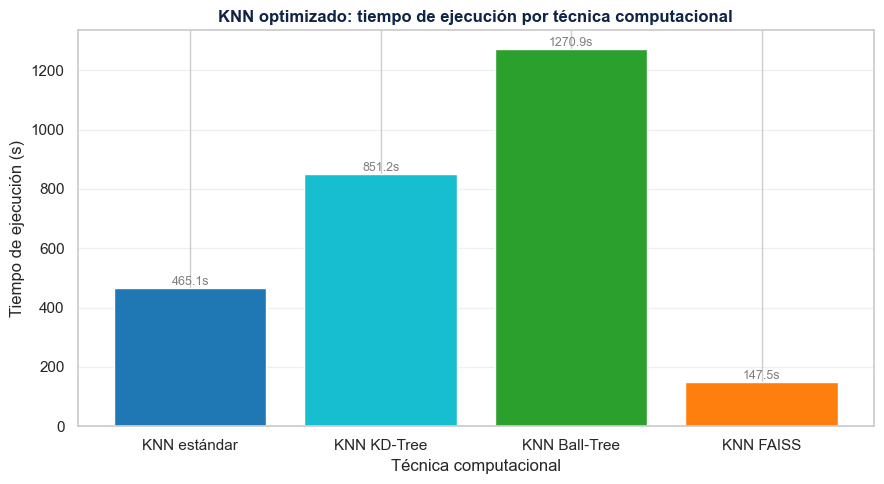

In [269]:
# ============================================================
# Gráfica: tiempo por técnica computacional KNN
# Fuente: tabla_knn_4_opciones
# ============================================================

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

C_ORANGE = "#FF7F0E"
C_BLUE   = "#1F77B4"
C_GREEN  = "#2CA02C"
C_AQUA   = "#17BECF"
C_NAVY   = "#0F2447"
C_GRAY   = "#7F7F7F"

plot_knn_time = tabla_knn_4_opciones.copy()

plot_knn_time["Tiempo (s)"] = pd.to_numeric(plot_knn_time["Tiempo (s)"], errors="coerce")

orden_knn = ["KNN estándar", "KNN KD-Tree", "KNN Ball-Tree", "KNN FAISS"]

plot_knn_time["Modelo"] = pd.Categorical(
    plot_knn_time["Modelo"],
    categories=orden_knn,
    ordered=True
)

plot_knn_time = plot_knn_time.sort_values("Modelo")

plt.figure(figsize=(9, 5))

bars = plt.bar(
    plot_knn_time["Modelo"],
    plot_knn_time["Tiempo (s)"],
    color=[C_BLUE, C_AQUA, C_GREEN, C_ORANGE]
)

plt.title(
    "KNN optimizado: tiempo de ejecución por técnica computacional",
    fontweight="bold",
    color=C_NAVY
)
plt.xlabel("Técnica computacional")
plt.ylabel("Tiempo de ejecución (s)")
plt.grid(axis="y", alpha=0.3)

for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{height:.1f}s",
        ha="center",
        va="bottom",
        fontsize=9,
        color=C_GRAY
    )

plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [270]:
# ============================================================
# Comparación KNN estándar vs variantes computacionales
# Fuente: tabla_knn_4_opciones
# ============================================================

import pandas as pd
import numpy as np

comparacion_knn_std_vs_opt = tabla_knn_4_opciones.copy()

# Asegurar columnas numéricas
metric_cols = [
    "CV Recall",
    "Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test ROC-AUC",
    "Tiempo (s)",
    "Evaluaciones"
]

for col in metric_cols:
    if col in comparacion_knn_std_vs_opt.columns:
        comparacion_knn_std_vs_opt[col] = pd.to_numeric(
            comparacion_knn_std_vs_opt[col],
            errors="coerce"
        )

# Crear columna versión comparativa
comparacion_knn_std_vs_opt["Versión comparativa"] = np.where(
    comparacion_knn_std_vs_opt["Modelo"].eq("KNN estándar"),
    "Estándar",
    "Optimizado computacionalmente"
)

# Orden visual
orden_modelos_knn = {
    "KNN estándar": 1,
    "KNN KD-Tree": 2,
    "KNN Ball-Tree": 3,
    "KNN FAISS": 4
}

comparacion_knn_std_vs_opt["Orden"] = comparacion_knn_std_vs_opt["Modelo"].map(orden_modelos_knn)

comparacion_knn_std_vs_opt = (
    comparacion_knn_std_vs_opt
    .sort_values("Orden")
    .drop(columns="Orden")
    .reset_index(drop=True)
)

columnas_comparacion_knn = [
    "Modelo",
    "Versión comparativa",
    "Técnica computacional",
    "Método",
    "Balanceo",
    "CV Recall",
    "Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test ROC-AUC",
    "Tiempo (s)",
    "Evaluaciones",
    "Best Params",
    "Fuente"
]

comparacion_knn_std_vs_opt = comparacion_knn_std_vs_opt[
    [c for c in columnas_comparacion_knn if c in comparacion_knn_std_vs_opt.columns]
]

display(
    comparacion_knn_std_vs_opt
    .style
    .format({
        "CV Recall": "{:.4f}",
        "Test Accuracy": "{:.4f}",
        "Test Precision": "{:.4f}",
        "Test Recall": "{:.4f}",
        "Test F1": "{:.4f}",
        "Test ROC-AUC": "{:.4f}",
        "Tiempo (s)": "{:.2f}",
        "Evaluaciones": "{:.0f}",
    }, na_rep="—")
    .set_caption("Comparación KNN estándar vs variantes computacionales optimizadas")
)

,Modelo,Versión comparativa,Técnica computacional,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test ROC-AUC,Tiempo (s),Evaluaciones,Best Params,Fuente
0,KNN estándar,Estándar,KNN estándar,Optuna,ADASYN,0.8518,0.6556,0.2586,0.7885,0.3895,0.7711,465.09,30,"{'n_neighbors': 29, 'weights': 'distance', 'metric': 'minkowski'}",optuna_KNN_resultados.pkl
1,KNN KD-Tree,Optimizado computacionalmente,KD-Tree,Optuna,ADASYN,0.8526,0.6547,0.2580,0.7879,0.3887,0.7712,851.20,30,"{'n_neighbors': 29, 'weights': 'distance', 'metric': 'minkowski'}",optuna_KNN_kd_tree_resultados.pkl
2,KNN Ball-Tree,Optimizado computacionalmente,Ball-Tree,Optuna,ADASYN,0.8523,0.6547,0.2579,0.7874,0.3885,0.7711,1270.85,30,"{'n_neighbors': 29, 'weights': 'distance', 'metric': 'minkowski'}",optuna_KNN_ball_tree_resultados.pkl
3,KNN FAISS,Optimizado computacionalmente,FAISS,Random Search,ADASYN,0.8383,0.6487,0.2536,0.7833,0.3832,0.7664,147.55,30,"{'modelo__weights': 'uniform', 'modelo__n_neighbors': 21}",summary_KNN_FAISS_cpu_safe.csv


In [271]:
# ============================================================
# Diferencias frente al KNN estándar
# Fuente: tabla_knn_4_opciones
# ============================================================

import pandas as pd
import numpy as np

df_knn_delta = tabla_knn_4_opciones.copy()

# Asegurar columnas numéricas
metric_cols = [
    "CV Recall",
    "Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test ROC-AUC",
    "Tiempo (s)",
    "Evaluaciones"
]

for col in metric_cols:
    if col in df_knn_delta.columns:
        df_knn_delta[col] = pd.to_numeric(df_knn_delta[col], errors="coerce")

# ------------------------------------------------------------
# 1. Definir baseline: mejor KNN estándar
# ------------------------------------------------------------

baseline_knn = (
    df_knn_delta[
        df_knn_delta["Modelo"].eq("KNN estándar")
        | df_knn_delta["Técnica computacional"].eq("KNN estándar")
    ]
    .dropna(subset=["Test Recall"])
    .sort_values(
        by=["Test Recall", "Test F1", "Test ROC-AUC", "Tiempo (s)"],
        ascending=[False, False, False, True],
        na_position="last"
    )
    .iloc[0]
)

# ------------------------------------------------------------
# 2. Variantes optimizadas: KD-Tree, Ball-Tree y FAISS
# ------------------------------------------------------------

knn_optimizados = df_knn_delta[
    ~df_knn_delta["Modelo"].eq("KNN estándar")
].copy()

rows_delta_knn = []

for _, row in knn_optimizados.iterrows():

    tiempo_std = baseline_knn["Tiempo (s)"]
    tiempo_opt = row["Tiempo (s)"]

    razon_tiempo = (
        tiempo_std / tiempo_opt
        if pd.notna(tiempo_std) and pd.notna(tiempo_opt) and tiempo_opt != 0
        else np.nan
    )

    rows_delta_knn.append({
        "Técnica optimizada": row["Técnica computacional"],
        "Modelo optimizado": row["Modelo"],
        "Método": row["Método"],
        "Balanceo": row["Balanceo"],

        "Recall estándar": baseline_knn["Test Recall"],
        "Recall optimizado": row["Test Recall"],
        "Δ Recall": row["Test Recall"] - baseline_knn["Test Recall"],

        "Precisión estándar": baseline_knn["Test Precision"],
        "Precisión optimizada": row["Test Precision"],
        "Δ Precisión": row["Test Precision"] - baseline_knn["Test Precision"],

        "F1 estándar": baseline_knn["Test F1"],
        "F1 optimizado": row["Test F1"],
        "Δ F1": row["Test F1"] - baseline_knn["Test F1"],

        "ROC-AUC estándar": baseline_knn["Test ROC-AUC"],
        "ROC-AUC optimizado": row["Test ROC-AUC"],
        "Δ ROC-AUC": row["Test ROC-AUC"] - baseline_knn["Test ROC-AUC"],

        "Tiempo estándar (s)": tiempo_std,
        "Tiempo optimizado (s)": tiempo_opt,
        "Δ Tiempo (s)": tiempo_opt - tiempo_std,
        "Razón tiempo estándar/optimizado": razon_tiempo,

        "Fuente estándar": baseline_knn["Fuente"],
        "Fuente optimizada": row["Fuente"]
    })

comparacion_delta_knn = pd.DataFrame(rows_delta_knn)

display(
    comparacion_delta_knn
    .sort_values(
        by=["Recall optimizado", "Tiempo optimizado (s)"],
        ascending=[False, True]
    )
    .style
    .format({
        "Recall estándar": "{:.4f}",
        "Recall optimizado": "{:.4f}",
        "Δ Recall": "{:+.4f}",
        "Precisión estándar": "{:.4f}",
        "Precisión optimizada": "{:.4f}",
        "Δ Precisión": "{:+.4f}",
        "F1 estándar": "{:.4f}",
        "F1 optimizado": "{:.4f}",
        "Δ F1": "{:+.4f}",
        "ROC-AUC estándar": "{:.4f}",
        "ROC-AUC optimizado": "{:.4f}",
        "Δ ROC-AUC": "{:+.4f}",
        "Tiempo estándar (s)": "{:.2f}",
        "Tiempo optimizado (s)": "{:.2f}",
        "Δ Tiempo (s)": "{:+.2f}",
        "Razón tiempo estándar/optimizado": "{:.2f}",
    }, na_rep="—")
    .set_caption("Diferencias de desempeño y tiempo frente al KNN estándar")
)

,Técnica optimizada,Modelo optimizado,Método,Balanceo,Recall estándar,Recall optimizado,Δ Recall,Precisión estándar,Precisión optimizada,Δ Precisión,F1 estándar,F1 optimizado,Δ F1,ROC-AUC estándar,ROC-AUC optimizado,Δ ROC-AUC,Tiempo estándar (s),Tiempo optimizado (s),Δ Tiempo (s),Razón tiempo estándar/optimizado,Fuente estándar,Fuente optimizada
0,KD-Tree,KNN KD-Tree,Optuna,ADASYN,0.7885,0.7879,-0.0006,0.2586,0.2580,-0.0006,0.3895,0.3887,-0.0008,0.7711,0.7712,+0.0001,465.09,851.20,+386.11,0.55,optuna_KNN_resultados.pkl,optuna_KNN_kd_tree_resultados.pkl
1,Ball-Tree,KNN Ball-Tree,Optuna,ADASYN,0.7885,0.7874,-0.0011,0.2586,0.2579,-0.0007,0.3895,0.3885,-0.0010,0.7711,0.7711,-0.0000,465.09,1270.85,+805.76,0.37,optuna_KNN_resultados.pkl,optuna_KNN_ball_tree_resultados.pkl
2,FAISS,KNN FAISS,Random Search,ADASYN,0.7885,0.7833,-0.0052,0.2586,0.2536,-0.0050,0.3895,0.3832,-0.0063,0.7711,0.7664,-0.0047,465.09,147.55,-317.54,3.15,optuna_KNN_resultados.pkl,summary_KNN_FAISS_cpu_safe.csv


In [272]:
# ============================================================
# Complejidad teórica vs tiempo empírico - KNN
# Fuente: tabla_knn_4_opciones
# ============================================================

import pandas as pd
import numpy as np

# ------------------------------------------------------------
# 1. Tabla conceptual de complejidad computacional
# ------------------------------------------------------------

tabla_complejidad_base_knn = pd.DataFrame([
    {
        "Técnica computacional": "KNN estándar",
        "Versión": "Estándar",
        "Idea computacional": "Búsqueda directa de vecinos",
        "Complejidad teórica aproximada": "O(n · d) por consulta",
        "Ventaja": "Implementación simple y directa",
        "Limitación": "Puede ser costoso cuando aumenta el número de observaciones"
    },
    {
        "Técnica computacional": "KD-Tree",
        "Versión": "Optimizado",
        "Idea computacional": "Indexación espacial por particiones",
        "Complejidad teórica aproximada": "Aprox. O(log n) en baja dimensión",
        "Ventaja": "Puede acelerar la búsqueda de vecinos",
        "Limitación": "Pierde eficiencia en espacios de alta dimensión"
    },
    {
        "Técnica computacional": "Ball-Tree",
        "Versión": "Optimizado",
        "Idea computacional": "Agrupación espacial mediante hiperesferas",
        "Complejidad teórica aproximada": "Aprox. O(log n) en condiciones favorables",
        "Ventaja": "Puede funcionar mejor que KD-Tree con ciertas métricas",
        "Limitación": "Puede ser más costoso si hay alto solapamiento espacial"
    },
    {
        "Técnica computacional": "FAISS",
        "Versión": "Optimizado",
        "Idea computacional": "Búsqueda vectorial eficiente",
        "Complejidad teórica aproximada": "Depende del índice; orientado a búsqueda eficiente",
        "Ventaja": "Diseñado para consultas rápidas en grandes volúmenes de vectores",
        "Limitación": "Requiere dependencias específicas y compatibilidad del entorno"
    }
])

# ------------------------------------------------------------
# 2. Métricas empíricas desde tabla limpia de 4 opciones
# ------------------------------------------------------------

metricas_knn_empiricas = tabla_knn_4_opciones.copy()

# Asegurar numéricas
cols_metricas = [
    "CV Recall",
    "Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test ROC-AUC",
    "Tiempo (s)"
]

for col in cols_metricas:
    if col in metricas_knn_empiricas.columns:
        metricas_knn_empiricas[col] = pd.to_numeric(
            metricas_knn_empiricas[col],
            errors="coerce"
        )

# Columnas necesarias
metricas_knn_empiricas = metricas_knn_empiricas[
    [
        "Técnica computacional",
        "Método",
        "Balanceo",
        "Test Recall",
        "Test Precision",
        "Test F1",
        "Test ROC-AUC",
        "Tiempo (s)"
    ]
].copy()

# ------------------------------------------------------------
# 3. Unir complejidad teórica + evidencia empírica
# ------------------------------------------------------------

tabla_complejidad_knn = tabla_complejidad_base_knn.merge(
    metricas_knn_empiricas,
    on="Técnica computacional",
    how="left"
)

# Orden visual
orden_tecnica_knn = {
    "KNN estándar": 1,
    "KD-Tree": 2,
    "Ball-Tree": 3,
    "FAISS": 4
}

tabla_complejidad_knn["Orden"] = tabla_complejidad_knn["Técnica computacional"].map(orden_tecnica_knn)

tabla_complejidad_knn = (
    tabla_complejidad_knn
    .sort_values("Orden")
    .drop(columns="Orden")
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# 4. Mostrar tabla final
# ------------------------------------------------------------

display(
    tabla_complejidad_knn
    .style
    .format({
        "Test Recall": "{:.4f}",
        "Test Precision": "{:.4f}",
        "Test F1": "{:.4f}",
        "Test ROC-AUC": "{:.4f}",
        "Tiempo (s)": "{:.2f}",
    }, na_rep="—")
    .set_caption("Complejidad teórica vs tiempo empírico — KNN")
)

,Técnica computacional,Versión,Idea computacional,Complejidad teórica aproximada,Ventaja,Limitación,Método,Balanceo,Test Recall,Test Precision,Test F1,Test ROC-AUC,Tiempo (s)
0,KNN estándar,Estándar,Búsqueda directa de vecinos,O(n · d) por consulta,Implementación simple y directa,Puede ser costoso cuando aumenta el número de observaciones,Optuna,ADASYN,0.7885,0.2586,0.3895,0.7711,465.09
1,KD-Tree,Optimizado,Indexación espacial por particiones,Aprox. O(log n) en baja dimensión,Puede acelerar la búsqueda de vecinos,Pierde eficiencia en espacios de alta dimensión,Optuna,ADASYN,0.7879,0.2580,0.3887,0.7712,851.20
2,Ball-Tree,Optimizado,Agrupación espacial mediante hiperesferas,Aprox. O(log n) en condiciones favorables,Puede funcionar mejor que KD-Tree con ciertas métricas,Puede ser más costoso si hay alto solapamiento espacial,Optuna,ADASYN,0.7874,0.2579,0.3885,0.7711,1270.85
3,FAISS,Optimizado,Búsqueda vectorial eficiente,Depende del índice; orientado a búsqueda eficiente,Diseñado para consultas rápidas en grandes volúmenes de vectores,Requiere dependencias específicas y compatibilidad del entorno,Random Search,ADASYN,0.7833,0.2536,0.3832,0.7664,147.55


In [457]:
# ============================================================
# Diferencias frente al KNN estándar
# ============================================================

baseline_knn = knn_estandar_best.copy()

rows_delta_knn = []

for _, row in knn_optimizados_best.iterrows():

    rows_delta_knn.append({
        "Técnica optimizada": row["Técnica computacional"],
        "Método": row["Método"],
        "Balanceo": row["Balanceo"],

        "Recall estándar": baseline_knn["Test Recall"],
        "Recall optimizado": row["Test Recall"],
        "Δ Recall": row["Test Recall"] - baseline_knn["Test Recall"],

        "Precision estándar": baseline_knn["Test Precision"],
        "Precision optimizada": row["Test Precision"],
        "Δ Precision": row["Test Precision"] - baseline_knn["Test Precision"],

        "F1 estándar": baseline_knn["Test F1"],
        "F1 optimizado": row["Test F1"],
        "Δ F1": row["Test F1"] - baseline_knn["Test F1"],

        "AUC estándar": baseline_knn["Test AUC"],
        "AUC optimizado": row["Test AUC"],
        "Δ AUC": row["Test AUC"] - baseline_knn["Test AUC"],

        "Tiempo estándar (s)": baseline_knn["Tiempo (s)"],
        "Tiempo optimizado (s)": row["Tiempo (s)"],
        "Δ Tiempo (s)": row["Tiempo (s)"] - baseline_knn["Tiempo (s)"],

        "Razón tiempo estándar/optimizado": baseline_knn["Tiempo (s)"] / row["Tiempo (s)"]
    })

comparacion_delta_knn = pd.DataFrame(rows_delta_knn)

display(comparacion_delta_knn.round(4))

,Técnica optimizada,Método,Balanceo,Recall estándar,Recall optimizado,Δ Recall,Precision estándar,Precision optimizada,Δ Precision,F1 estándar,F1 optimizado,Δ F1,AUC estándar,AUC optimizado,Δ AUC,Tiempo estándar (s),Tiempo optimizado (s),Δ Tiempo (s),Razón tiempo estándar/optimizado
0,Ball-Tree,Optuna,ADASYN,0.7885,0.7874,-0.0011,0.2586,0.2579,-0.0007,0.3895,0.3885,-0.0010,0.7711,0.7711,-0.0000,465.0936,1270.8543,805.7606,0.3660
1,FAISS,Random Search,ADASYN,0.7885,0.7833,-0.0052,0.2586,0.2536,-0.0050,0.3895,0.3832,-0.0063,0.7711,0.7664,-0.0047,465.0936,147.5489,-317.5447,3.1521
2,KD-Tree,Optuna,ADASYN,0.7885,0.7879,-0.0006,0.2586,0.2580,-0.0006,0.3895,0.3887,-0.0008,0.7711,0.7712,0.0001,465.0936,851.2021,386.1085,0.5464


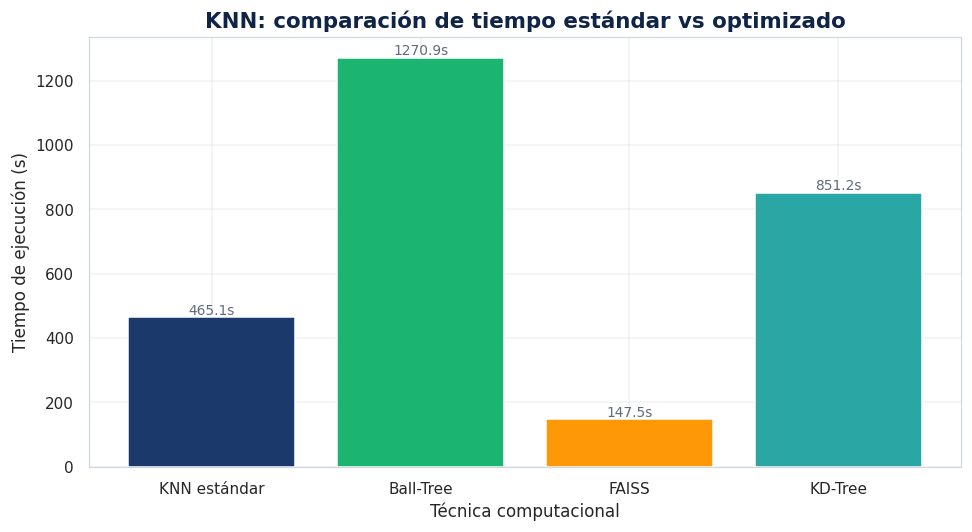

In [459]:
# ============================================================
# Gráfica formal: tiempo estándar vs optimizado - KNN
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

C_NAVY  = "#0F2447"
C_BLUE  = "#1B3A6B"
C_AQUA  = "#2AA7A5"
C_GREEN = "#1BB470"
C_ORANGE = "#FF9806"
C_GRAY  = "#5F6B7A"

plot_knn_time = comparacion_knn_std_vs_opt.copy()

colores = {
    "KNN estándar": C_BLUE,
    "KD-Tree": C_AQUA,
    "Ball-Tree": C_GREEN,
    "FAISS": C_ORANGE
}

fig, ax = plt.subplots(figsize=(9, 5))

bars = ax.bar(
    plot_knn_time["Técnica computacional"],
    plot_knn_time["Tiempo (s)"],
    color=[colores.get(x, C_GRAY) for x in plot_knn_time["Técnica computacional"]]
)

ax.set_title("KNN: comparación de tiempo estándar vs optimizado", fontweight="bold", color=C_NAVY)
ax.set_xlabel("Técnica computacional")
ax.set_ylabel("Tiempo de ejecución (s)")
ax.set_xticklabels(plot_knn_time["Técnica computacional"], rotation=0)
ax.grid(axis="y", alpha=0.3)

for bar in bars:
    height = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{height:.1f}s",
        ha="center",
        va="bottom",
        fontsize=9,
        color=C_GRAY
    )

plt.tight_layout()
plt.show()

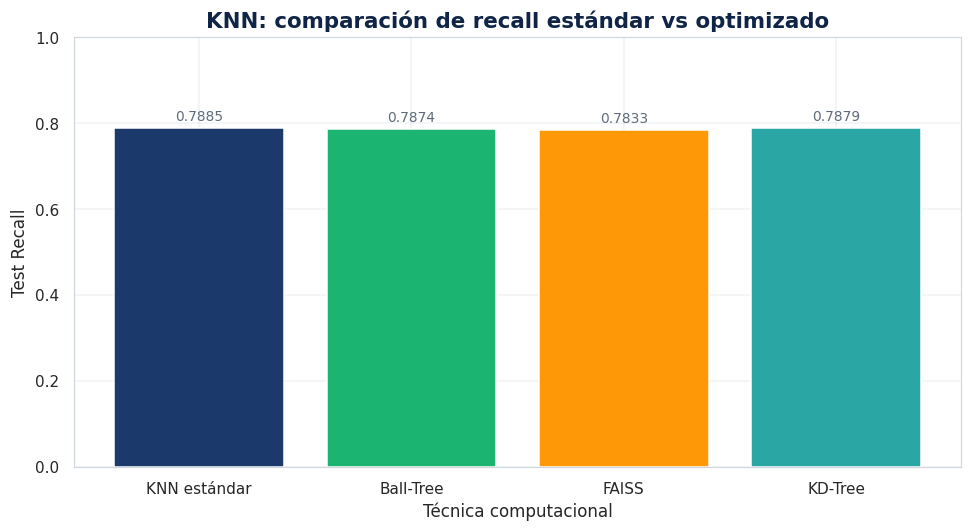

In [461]:
# ============================================================
# Gráfica formal: recall estándar vs optimizado - KNN
# ============================================================

plot_knn_recall = comparacion_knn_std_vs_opt.copy()

fig, ax = plt.subplots(figsize=(9, 5))

bars = ax.bar(
    plot_knn_recall["Técnica computacional"],
    plot_knn_recall["Test Recall"],
    color=[colores.get(x, C_GRAY) for x in plot_knn_recall["Técnica computacional"]]
)

ax.set_title("KNN: comparación de recall estándar vs optimizado", fontweight="bold", color=C_NAVY)
ax.set_xlabel("Técnica computacional")
ax.set_ylabel("Test Recall")
ax.set_ylim(0, 1)
ax.set_xticklabels(plot_knn_recall["Técnica computacional"], rotation=0)
ax.grid(axis="y", alpha=0.3)

for bar in bars:
    height = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        height + 0.01,
        f"{height:.4f}",
        ha="center",
        va="bottom",
        fontsize=9,
        color=C_GRAY
    )

plt.tight_layout()
plt.show()

### **25.2 Regresión Logística**

### **Nota metodológica**

Dentro de las alternativas de optimización computacional se contempló el uso del solver `SAGA` para los modelos de regresión logística con penalización L1 y L2. Sin embargo, este enfoque no se incorporó como experimento final, ya que en las condiciones específicas del proyecto no ofreció una ventaja práctica frente al solver `liblinear`.

El solver `SAGA` se basa en una estrategia de optimización de tipo gradiente estocástico con reducción de varianza. A diferencia de métodos que trabajan con el gradiente completo en cada actualización, `SAGA` realiza actualizaciones incrementales usando información parcial del conjunto de datos y conserva información de gradientes anteriores para mejorar la estabilidad del proceso. Por esta razón, suele considerarse una alternativa adecuada para problemas de mayor escala.

No obstante, que `SAGA` sea apropiado para datos grandes no significa que siempre sea más rápido o más conveniente. Su desempeño depende de factores como la escala de las variables, la convergencia del algoritmo, el número de iteraciones requeridas y la complejidad del flujo experimental. En este proyecto, la regresión logística se evaluó dentro de pipelines con preprocesamiento, validación cruzada estratificada y estrategias de balanceo como SMOTE, ADASYN y class weight. En ese contexto, `SAGA` incrementaba el tiempo de ejecución sin aportar una mejora relevante en recall, F1-score o AUC.

Por el contrario, `liblinear` mostró un comportamiento más estable y eficiente para las regresiones logísticas L1 y L2. Este solver permitió ajustar directamente ambas penalizaciones, obtener resultados competitivos y mantener tiempos de ejecución más razonables. Además, al tratarse de modelos lineales relativamente simples frente al tamaño y estructura del dataset, `liblinear` resultó suficiente para cumplir el objetivo predictivo sin añadir un costo computacional innecesario.

Por tanto, aunque `SAGA` puede ser útil en escenarios de gran escala, especialmente cuando el dataset está bien escalado y se busca optimización incremental, en este proyecto no fue la alternativa más conveniente. La decisión metodológica fue conservar `liblinear` como solver principal, priorizando estabilidad, reproducibilidad y eficiencia empírica.

### **25.3 Naive Bayes**

In [ ]:
import os
import pickle
import numpy as np
import pandas as pd
import joblib
 
from sklearn.naive_bayes import GaussianNB
from sklearn.base import BaseEstimator, ClassifierMixin
from imblearn.over_sampling import SMOTE, ADASYN
 
 
BASE_COMP = "Modelos_Optimizados_Computacional/GaussianNB"
os.makedirs(BASE_COMP, exist_ok=True)

In [396]:
# ============================================================
# Clase GaussianNBPartialFit para cargar objetos guardados
# ============================================================

import numpy as np
import pandas as pd
import os
import pickle
import joblib
from pathlib import Path

from sklearn.naive_bayes import GaussianNB
from sklearn.base import BaseEstimator, ClassifierMixin


class GaussianNBPartialFit(BaseEstimator, ClassifierMixin):
    """
    GaussianNB entrenado por chunks usando partial_fit.
    Compatible con sklearn, GridSearchCV, RandomizedSearchCV, Optuna y DEAP.
    """

    def __init__(self, var_smoothing=1e-9, chunk_size=1024):
        self.var_smoothing = var_smoothing
        self.chunk_size = chunk_size

    def fit(self, X, y):
        X = np.asarray(X)
        y = np.asarray(y)

        self.classes_ = np.unique(y)
        self._gnb = GaussianNB(var_smoothing=self.var_smoothing)

        n = len(X)

        for start in range(0, n, self.chunk_size):
            end = min(start + self.chunk_size, n)

            self._gnb.partial_fit(
                X[start:end],
                y[start:end],
                classes=self.classes_
            )

        return self

    def predict(self, X):
        return self._gnb.predict(X)

    def predict_proba(self, X):
        return self._gnb.predict_proba(X)

    def get_params(self, deep=True):
        return {
            "var_smoothing": self.var_smoothing,
            "chunk_size": self.chunk_size
        }

    def set_params(self, **params):
        for k, v in params.items():
            setattr(self, k, v)
        return self

In [ ]:
 
def gnb_pf_factory(params):
    return GaussianNBPartialFit(
        var_smoothing=params["var_smoothing"],
        chunk_size=params.get("chunk_size", 1024),
    )
    
param_grid_gnb_pf = {
    "modelo__var_smoothing": [1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6],
    "modelo__chunk_size":    [512, 1024, 2048, 4096],
}
 
param_dist_gnb_pf = {
    "modelo__var_smoothing": np.logspace(-11, -6, 50).tolist(),
    "modelo__chunk_size":    [512, 1024, 2048, 4096],
}
 
espacio_deap_gnb_pf = {
    "var_smoothing": np.logspace(-11, -6, 30).tolist(),
    "chunk_size":    [512, 1024, 2048, 4096],
}

In [ ]:
resultados_gs_gnb_pf = optimizar_gridsearch(
    modelo_nombre="GaussianNB_partialfit",
    estimator=GaussianNBPartialFit(),
    param_grid=param_grid_gnb_pf,
    X_train=X_train,
    y_train=y_train,
    cv=cv_strategy,
    escalado=True,
    scoring="recall",
)

In [ ]:
resultados_rs_gnb_pf = optimizar_randomsearch(
    modelo_nombre="GaussianNB_partialfit",
    estimator=GaussianNBPartialFit(),
    param_distributions=param_dist_gnb_pf,
    X_train=X_train,
    y_train=y_train,
    cv=cv_strategy,
    escalado=True,
    scoring="recall",
    n_iter=30,
)

In [ ]:
resultados_op_gnb_pf = optimizar_optuna(
    modelo_nombre="GaussianNB_partialfit",
    estimator=GaussianNBPartialFit(),
    model_factory=gnb_pf_factory,
    X_train=X_train,
    y_train=y_train,
    cv=cv_strategy,
    escalado=True,
    n_trials=30,
    scoring="recall",
)

In [ ]:
resultados_deap_gnb_pf = optimizar_deap(
    modelo_nombre="GaussianNB_partialfit",
    estimator=GaussianNBPartialFit(),
    model_factory=gnb_pf_factory,
    espacio=espacio_deap_gnb_pf,
    X_train=X_train,
    y_train=y_train,
    cv=cv_strategy,
    escalado=True,
    n_generaciones=5,
    tam_poblacion=20,
    scoring="recall",
)

In [410]:
# ============================================================
# Cargar resultados GaussianNB partial_fit desde todas las carpetas
# ============================================================

from pathlib import Path
import os
import pickle
import joblib
import pandas as pd
import numpy as np

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")
ROOT_SEARCH = BASE_DIR / "machineentrega2"

print("Ruta base de búsqueda:")
print(ROOT_SEARCH)
print("Existe:", ROOT_SEARCH.exists())

# Buscar archivos asociados a GaussianNB partial_fit
gnb_pf_files = []

for root, dirs, files in os.walk(ROOT_SEARCH):
    root_lower = root.lower()

    if (
        "gaussiannb" in root_lower
        or "gnb" in root_lower
        or "naive" in root_lower
    ):
        for file in files:
            file_lower = file.lower()

            if file_lower.endswith((".csv", ".pkl", ".joblib")):
                if (
                    "partial" in file_lower
                    or "gnb" in file_lower
                    or "gaussian" in file_lower
                    or "tabla_comparativa" in file_lower
                ):
                    gnb_pf_files.append(Path(root) / file)

print("\nArchivos encontrados:")
for file in gnb_pf_files:
    print("-", file)

Ruta base de búsqueda:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2
Existe: True

Archivos encontrados:
- C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_Computacional\GaussianNB\tabla_comparativa_gnb.csv
- C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\DEAP_GaussianNB\deap_GaussianNB_ADASYN.joblib
- C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\DEAP_GaussianNB\deap_GaussianNB_Class Weight.joblib
- C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_No_Computacional\DEAP_GaussianNB\deap_GaussianNB_resultados.pkl
- C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimiza

In [411]:
# ============================================================
# Cargar archivos encontrados
# ============================================================

def cargar_archivo(path):
    path = Path(path)

    if path.suffix.lower() == ".csv":
        return pd.read_csv(path)

    if path.suffix.lower() == ".pkl":
        with open(path, "rb") as f:
            return pickle.load(f)

    if path.suffix.lower() == ".joblib":
        return joblib.load(path)

    raise ValueError(f"Extensión no soportada: {path.suffix}")


objetos_gnb_pf = {}

for file in gnb_pf_files:
    try:
        obj = cargar_archivo(file)
        objetos_gnb_pf[str(file)] = obj
        print(f"Cargado correctamente: {file.name} | Tipo: {type(obj)}")
    except Exception as e:
        print(f"No se pudo cargar: {file.name}")
        print("Error:", repr(e))

Cargado correctamente: tabla_comparativa_gnb.csv | Tipo: <class 'pandas.core.frame.DataFrame'>
Cargado correctamente: deap_GaussianNB_ADASYN.joblib | Tipo: <class 'imblearn.pipeline.Pipeline'>
Cargado correctamente: deap_GaussianNB_Class Weight.joblib | Tipo: <class 'sklearn.pipeline.Pipeline'>
Cargado correctamente: deap_GaussianNB_resultados.pkl | Tipo: <class 'dict'>
Cargado correctamente: deap_GaussianNB_Sin Balanceo.joblib | Tipo: <class 'sklearn.pipeline.Pipeline'>
Cargado correctamente: deap_GaussianNB_SMOTE.joblib | Tipo: <class 'imblearn.pipeline.Pipeline'>
Cargado correctamente: deap_GaussianNB_partialfit_ADASYN.joblib | Tipo: <class 'imblearn.pipeline.Pipeline'>
Cargado correctamente: deap_GaussianNB_partialfit_Class Weight.joblib | Tipo: <class 'sklearn.pipeline.Pipeline'>
Cargado correctamente: deap_GaussianNB_partialfit_resultados.pkl | Tipo: <class 'dict'>
Cargado correctamente: deap_GaussianNB_partialfit_Sin Balanceo.joblib | Tipo: <class 'sklearn.pipeline.Pipeline'>
Ca

In [418]:
# ============================================================
# Limpiar tabla GaussianNB partial_fit: 16 combinaciones
# ============================================================

import pandas as pd
import numpy as np

tabla_gnb_clean = tabla_gnb_partial_fit.copy()

# Extraer método de optimización desde la columna Modelo
def extraer_metodo_gnb(texto):
    texto = str(texto).lower()

    if "grid" in texto:
        return "Grid Search"
    elif "random" in texto:
        return "Random Search"
    elif "optuna" in texto:
        return "Optuna"
    elif "deap" in texto:
        return "DEAP"
    else:
        return "No identificado"


# Extraer balanceo desde la columna Modelo
def extraer_balanceo_gnb(texto):
    texto = str(texto).lower()

    if "adasyn" in texto:
        return "ADASYN"
    elif "smote" in texto:
        return "SMOTE"
    elif "class weight" in texto or "class_weight" in texto:
        return "Class Weight"
    elif "sin balanceo" in texto or "none" in texto:
        return "Sin Balanceo"
    else:
        return "No identificado"


tabla_gnb_clean["Método"] = tabla_gnb_clean["Modelo"].apply(extraer_metodo_gnb)
tabla_gnb_clean["Balanceo"] = tabla_gnb_clean["Modelo"].apply(extraer_balanceo_gnb)
tabla_gnb_clean["Modelo base"] = "GaussianNB"
tabla_gnb_clean["Técnica computacional"] = "partial_fit"

# Convertir columnas numéricas
metric_cols = [
    "Test Recall",
    "Test Precision",
    "Test F1",
    "Test ROC AUC",
    "Mejor recall CV",
    "Tiempo (s)",
    "Iteraciones"
]

for col in metric_cols:
    tabla_gnb_clean[col] = pd.to_numeric(tabla_gnb_clean[col], errors="coerce")

# Dejar una sola fila por Método + Balanceo.
# Si hay duplicados, conservar el de mayor recall y menor tiempo.
tabla_gnb_clean_16 = (
    tabla_gnb_clean
    .dropna(subset=["Test Recall"])
    .sort_values(
        by=["Método", "Balanceo", "Test Recall", "Tiempo (s)"],
        ascending=[True, True, False, True]
    )
    .drop_duplicates(
        subset=["Método", "Balanceo"],
        keep="first"
    )
    .reset_index(drop=True)
)

# Orden deseado
orden_metodos = ["Grid Search", "Random Search", "Optuna", "DEAP"]
orden_balanceo = ["Sin Balanceo", "SMOTE", "ADASYN", "Class Weight"]

tabla_gnb_clean_16["Método"] = pd.Categorical(
    tabla_gnb_clean_16["Método"],
    categories=orden_metodos,
    ordered=True
)

tabla_gnb_clean_16["Balanceo"] = pd.Categorical(
    tabla_gnb_clean_16["Balanceo"],
    categories=orden_balanceo,
    ordered=True
)

tabla_gnb_clean_16 = (
    tabla_gnb_clean_16
    .sort_values(["Método", "Balanceo"])
    .reset_index(drop=True)
)

# Tabla final separada
tabla_gnb_final = tabla_gnb_clean_16[
    [
        "Modelo base",
        "Técnica computacional",
        "Método",
        "Balanceo",
        "Test Recall",
        "Test Precision",
        "Test F1",
        "Test ROC AUC",
        "Mejor recall CV",
        "Tiempo (s)",
        "Iteraciones"
    ]
]

display(tabla_gnb_final.round(4))

print("Número de filas finales:", len(tabla_gnb_final))

,Modelo base,Técnica computacional,Método,Balanceo,Test Recall,Test Precision,Test F1,Test ROC AUC,Mejor recall CV,Tiempo (s),Iteraciones
0,GaussianNB,partial_fit,Grid Search,Sin Balanceo,0.5639,0.3198,0.4082,0.7803,0.5720,7.2298,6
1,GaussianNB,partial_fit,Grid Search,SMOTE,0.7802,0.2696,0.4007,0.7731,0.7887,164.5239,24
2,GaussianNB,partial_fit,Grid Search,ADASYN,0.8080,0.2574,0.3904,0.7718,0.8199,747.0884,24
3,GaussianNB,partial_fit,Grid Search,Class Weight,0.5639,0.3198,0.4082,0.7803,0.5720,3.7511,6
4,GaussianNB,partial_fit,Random Search,Sin Balanceo,0.5639,0.3198,0.4082,0.7803,0.5720,13.5823,20
5,GaussianNB,partial_fit,Random Search,SMOTE,0.7802,0.2696,0.4007,0.7731,0.7887,136.4142,30
6,GaussianNB,partial_fit,Random Search,ADASYN,0.8080,0.2574,0.3904,0.7718,0.8199,1022.0906,30
7,GaussianNB,partial_fit,Random Search,Class Weight,0.5639,0.3198,0.4082,0.7803,0.5720,11.9512,20
8,GaussianNB,partial_fit,Optuna,Sin Balanceo,0.5639,0.3198,0.4082,0.7803,0.5720,38.2367,30
9,GaussianNB,partial_fit,Optuna,SMOTE,0.7802,0.2696,0.4007,0.7731,0.7887,149.8651,30


Número de filas finales: 16


In [420]:
# ============================================================
# Guardar tabla reconstruida GaussianNB partial_fit
# ============================================================

output_gnb_pf = BASE_DIR / "tabla_gnb_partial_fit_reconstruida.csv"

tabla_gnb_partial_fit.to_csv(output_gnb_pf, index=False, encoding="utf-8-sig")

print("Tabla guardada en:")
print(output_gnb_pf)

Tabla guardada en:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\tabla_gnb_partial_fit_reconstruida.csv


In [421]:
# ============================================================
# Mejor configuración global GaussianNB partial_fit
# ============================================================

best_gnb_partial_fit = (
    tabla_gnb_final
    .sort_values(
        by=["Test Recall", "Tiempo (s)"],
        ascending=[False, True]
    )
    .iloc[0]
)

print("Mejor configuración GaussianNB partial_fit")
print("=" * 70)
print("Modelo base:", best_gnb_partial_fit["Modelo base"])
print("Técnica computacional:", best_gnb_partial_fit["Técnica computacional"])
print("Método:", best_gnb_partial_fit["Método"])
print("Balanceo:", best_gnb_partial_fit["Balanceo"])
print("Test Recall:", round(best_gnb_partial_fit["Test Recall"], 4))
print("Test Precision:", round(best_gnb_partial_fit["Test Precision"], 4))
print("Test F1:", round(best_gnb_partial_fit["Test F1"], 4))
print("Test ROC AUC:", round(best_gnb_partial_fit["Test ROC AUC"], 4))
print("Mejor recall CV:", round(best_gnb_partial_fit["Mejor recall CV"], 4))
print("Tiempo (s):", round(best_gnb_partial_fit["Tiempo (s)"], 4))
print("Iteraciones:", best_gnb_partial_fit["Iteraciones"])

display(best_gnb_partial_fit.to_frame().T)

Mejor configuración GaussianNB partial_fit
Modelo base: GaussianNB
Técnica computacional: partial_fit
Método: Grid Search
Balanceo: ADASYN
Test Recall: 0.808
Test Precision: 0.2574
Test F1: 0.3904
Test ROC AUC: 0.7718
Mejor recall CV: 0.8199
Tiempo (s): 747.0884
Iteraciones: 24


,Modelo base,Técnica computacional,Método,Balanceo,Test Recall,Test Precision,Test F1,Test ROC AUC,Mejor recall CV,Tiempo (s),Iteraciones
2,GaussianNB,partial_fit,Grid Search,ADASYN,0.808035,0.257355,0.390377,0.771841,0.819854,747.088366,24


In [422]:
# ============================================================
# Comparación de tiempo por método de optimización
# ============================================================

tabla_tiempo_metodo_gnb = (
    tabla_gnb_final
    .groupby("Método", observed=True)
    .agg(
        Mejor_Recall=("Test Recall", "max"),
        Mejor_F1=("Test F1", "max"),
        Mejor_AUC=("Test ROC AUC", "max"),
        Menor_Tiempo=("Tiempo (s)", "min"),
        Tiempo_Promedio=("Tiempo (s)", "mean"),
        Mayor_Tiempo=("Tiempo (s)", "max"),
        Experimentos=("Modelo base", "count")
    )
    .reset_index()
    .sort_values(
        by=["Mejor_Recall", "Menor_Tiempo"],
        ascending=[False, True]
    )
)

display(tabla_tiempo_metodo_gnb.round(4))

,Método,Mejor_Recall,Mejor_F1,Mejor_AUC,Menor_Tiempo,Tiempo_Promedio,Mayor_Tiempo,Experimentos
0,Grid Search,0.808,0.4082,0.7803,3.7511,230.6483,747.0884,4
1,Random Search,0.808,0.4082,0.7803,11.9512,296.0096,1022.0906,4
2,Optuna,0.808,0.4082,0.7803,35.6514,312.7068,1027.0739,4
3,DEAP,0.808,0.4082,0.7803,105.2476,1284.2984,3927.5743,4


In [423]:
# ============================================================
# Comparación de desempeño y tiempo por balanceo
# ============================================================

tabla_tiempo_balanceo_gnb = (
    tabla_gnb_final
    .groupby("Balanceo", observed=True)
    .agg(
        Mejor_Recall=("Test Recall", "max"),
        Mejor_F1=("Test F1", "max"),
        Mejor_AUC=("Test ROC AUC", "max"),
        Menor_Tiempo=("Tiempo (s)", "min"),
        Tiempo_Promedio=("Tiempo (s)", "mean"),
        Mayor_Tiempo=("Tiempo (s)", "max"),
        Experimentos=("Modelo base", "count")
    )
    .reset_index()
    .sort_values(
        by=["Mejor_Recall", "Menor_Tiempo"],
        ascending=[False, True]
    )
)

display(tabla_tiempo_balanceo_gnb.round(4))

,Balanceo,Mejor_Recall,Mejor_F1,Mejor_AUC,Menor_Tiempo,Tiempo_Promedio,Mayor_Tiempo,Experimentos
2,ADASYN,0.8080,0.3904,0.7718,747.0884,1680.9568,3927.5743,4
1,SMOTE,0.7802,0.4007,0.7731,136.4142,358.7798,984.3161,4
3,Class Weight,0.5639,0.4082,0.7803,3.7511,39.1503,105.2476,4
0,Sin Balanceo,0.5639,0.4082,0.7803,7.2298,44.7761,120.0556,4


In [428]:
# ============================================================
# Comparación modelo estándar vs optimizado - Naïve Bayes
# ============================================================

import pandas as pd
import numpy as np

# Resultados del modelo estándar GaussianNB
# Tomados de las tablas anteriores: Grid, Random, Optuna y DEAP
nb_estandar = pd.DataFrame([
    {
        "Modelo": "Naïve Bayes estándar",
        "Versión": "Estándar",
        "Técnica computacional": "fit tradicional",
        "Método": "Grid Search",
        "Balanceo": "ADASYN",
        "Test Recall": 0.8072,
        "Test Precision": 0.2577,
        "Test F1": 0.3906,
        "Test ROC AUC": 0.7723,
        "Mejor recall CV": 0.8193,
        "Tiempo (s)": 270.7682,
        "Iteraciones": 6
    },
    {
        "Modelo": "Naïve Bayes estándar",
        "Versión": "Estándar",
        "Técnica computacional": "fit tradicional",
        "Método": "Random Search",
        "Balanceo": "ADASYN",
        "Test Recall": 0.8072,
        "Test Precision": 0.2577,
        "Test F1": 0.3906,
        "Test ROC AUC": 0.7723,
        "Mejor recall CV": 0.8193,
        "Tiempo (s)": 783.5813,
        "Iteraciones": 20
    },
    {
        "Modelo": "Naïve Bayes estándar",
        "Versión": "Estándar",
        "Técnica computacional": "fit tradicional",
        "Método": "Optuna",
        "Balanceo": "ADASYN",
        "Test Recall": 0.8072,
        "Test Precision": 0.2577,
        "Test F1": 0.3906,
        "Test ROC AUC": 0.7723,
        "Mejor recall CV": 0.8193,
        "Tiempo (s)": 1348.5087,
        "Iteraciones": 30
    },
    {
        "Modelo": "Naïve Bayes estándar",
        "Versión": "Estándar",
        "Técnica computacional": "fit tradicional",
        "Método": "DEAP",
        "Balanceo": "ADASYN",
        "Test Recall": 0.8072,
        "Test Precision": 0.2577,
        "Test F1": 0.3906,
        "Test ROC AUC": 0.7723,
        "Mejor recall CV": 0.8193,
        "Tiempo (s)": 5296.9349,
        "Iteraciones": 100
    }
])

# Resultados del modelo optimizado GaussianNB partial_fit
# Se toman desde la tabla limpia de 16 combinaciones: tabla_gnb_final
nb_optimizado = tabla_gnb_final.copy()

nb_optimizado = nb_optimizado.rename(columns={
    "Modelo base": "Modelo"
})

nb_optimizado["Modelo"] = "Naïve Bayes optimizado"
nb_optimizado["Versión"] = "Optimizado"
nb_optimizado["Técnica computacional"] = "partial_fit"

# Conservar solo las mejores configuraciones optimizadas por método,
# para hacer comparación 1 a 1 contra el modelo estándar.
nb_optimizado_mejor_metodo = (
    nb_optimizado
    .sort_values(
        by=["Método", "Test Recall", "Tiempo (s)"],
        ascending=[True, False, True]
    )
    .groupby("Método", as_index=False)
    .first()
)

# Unir estándar + optimizado
comparacion_nb_std_vs_opt = pd.concat(
    [
        nb_estandar,
        nb_optimizado_mejor_metodo[
            [
                "Modelo",
                "Versión",
                "Técnica computacional",
                "Método",
                "Balanceo",
                "Test Recall",
                "Test Precision",
                "Test F1",
                "Test ROC AUC",
                "Mejor recall CV",
                "Tiempo (s)",
                "Iteraciones"
            ]
        ]
    ],
    ignore_index=True
)

comparacion_nb_std_vs_opt = comparacion_nb_std_vs_opt.sort_values(
    by=["Método", "Versión"]
).reset_index(drop=True)

display(comparacion_nb_std_vs_opt.round(4))

,Modelo,Versión,Técnica computacional,Método,Balanceo,Test Recall,Test Precision,Test F1,Test ROC AUC,Mejor recall CV,Tiempo (s),Iteraciones
0,Naïve Bayes estándar,Estándar,fit tradicional,DEAP,ADASYN,0.8072,0.2577,0.3906,0.7723,0.8193,5296.9349,100
1,Naïve Bayes optimizado,Optimizado,partial_fit,DEAP,ADASYN,0.8080,0.2574,0.3904,0.7718,0.8199,3927.5743,100
2,Naïve Bayes estándar,Estándar,fit tradicional,Grid Search,ADASYN,0.8072,0.2577,0.3906,0.7723,0.8193,270.7682,6
3,Naïve Bayes optimizado,Optimizado,partial_fit,Grid Search,ADASYN,0.8080,0.2574,0.3904,0.7718,0.8199,747.0884,24
4,Naïve Bayes estándar,Estándar,fit tradicional,Optuna,ADASYN,0.8072,0.2577,0.3906,0.7723,0.8193,1348.5087,30
5,Naïve Bayes optimizado,Optimizado,partial_fit,Optuna,ADASYN,0.8080,0.2574,0.3904,0.7718,0.8199,1027.0739,30
6,Naïve Bayes estándar,Estándar,fit tradicional,Random Search,ADASYN,0.8072,0.2577,0.3906,0.7723,0.8193,783.5813,20
7,Naïve Bayes optimizado,Optimizado,partial_fit,Random Search,ADASYN,0.8080,0.2574,0.3904,0.7718,0.8199,1022.0906,30


In [429]:
# ============================================================
# Comparación directa estándar vs optimizado por método
# ============================================================

std = nb_estandar.copy()
opt = nb_optimizado_mejor_metodo.copy()

std = std.set_index("Método")
opt = opt.set_index("Método")

comparacion_delta_nb = pd.DataFrame({
    "Método": std.index,

    "Recall estándar": std["Test Recall"],
    "Recall optimizado": opt["Test Recall"],
    "Δ Recall": opt["Test Recall"] - std["Test Recall"],

    "Precision estándar": std["Test Precision"],
    "Precision optimizada": opt["Test Precision"],
    "Δ Precision": opt["Test Precision"] - std["Test Precision"],

    "F1 estándar": std["Test F1"],
    "F1 optimizado": opt["Test F1"],
    "Δ F1": opt["Test F1"] - std["Test F1"],

    "AUC estándar": std["Test ROC AUC"],
    "AUC optimizado": opt["Test ROC AUC"],
    "Δ AUC": opt["Test ROC AUC"] - std["Test ROC AUC"],

    "Tiempo estándar (s)": std["Tiempo (s)"],
    "Tiempo optimizado (s)": opt["Tiempo (s)"],
    "Δ Tiempo (s)": opt["Tiempo (s)"] - std["Tiempo (s)"],

    "Razón tiempo estándar/optimizado": std["Tiempo (s)"] / opt["Tiempo (s)"]
}).reset_index(drop=True)

display(comparacion_delta_nb.round(4))

,Método,Recall estándar,Recall optimizado,Δ Recall,Precision estándar,Precision optimizada,Δ Precision,F1 estándar,F1 optimizado,Δ F1,AUC estándar,AUC optimizado,Δ AUC,Tiempo estándar (s),Tiempo optimizado (s),Δ Tiempo (s),Razón tiempo estándar/optimizado
0,Grid Search,0.8072,0.808,0.0008,0.2577,0.2574,-0.0003,0.3906,0.3904,-0.0002,0.7723,0.7718,-0.0005,270.7682,747.0884,476.3202,0.3624
1,Random Search,0.8072,0.808,0.0008,0.2577,0.2574,-0.0003,0.3906,0.3904,-0.0002,0.7723,0.7718,-0.0005,783.5813,1022.0906,238.5093,0.7666
2,Optuna,0.8072,0.808,0.0008,0.2577,0.2574,-0.0003,0.3906,0.3904,-0.0002,0.7723,0.7718,-0.0005,1348.5087,1027.0739,-321.4348,1.3130
3,DEAP,0.8072,0.808,0.0008,0.2577,0.2574,-0.0003,0.3906,0.3904,-0.0002,0.7723,0.7718,-0.0005,5296.9349,3927.5743,-1369.3606,1.3487


In [430]:
# ============================================================
# Complejidad teórica vs tiempo empírico - Naïve Bayes
# ============================================================

tabla_complejidad_nb = pd.DataFrame([
    {
        "Versión": "Estándar",
        "Técnica": "fit tradicional",
        "Complejidad teórica": "O(n · p)",
        "Manejo de datos": "Ajusta el modelo usando todo el conjunto de entrenamiento",
        "Uso de memoria": "Mayor dependencia de cargar el conjunto completo",
        "Tiempo empírico mínimo (s)": nb_estandar["Tiempo (s)"].min(),
        "Tiempo empírico promedio (s)": nb_estandar["Tiempo (s)"].mean(),
        "Mejor Test Recall": nb_estandar["Test Recall"].max()
    },
    {
        "Versión": "Optimizado",
        "Técnica": "partial_fit por chunks",
        "Complejidad teórica": "O(n · p)",
        "Manejo de datos": "Entrena de forma incremental por bloques",
        "Uso de memoria": "Menor carga de memoria por procesamiento en chunks",
        "Tiempo empírico mínimo (s)": nb_optimizado_mejor_metodo["Tiempo (s)"].min(),
        "Tiempo empírico promedio (s)": nb_optimizado_mejor_metodo["Tiempo (s)"].mean(),
        "Mejor Test Recall": nb_optimizado_mejor_metodo["Test Recall"].max()
    }
])

display(tabla_complejidad_nb.round(4))

,Versión,Técnica,Complejidad teórica,Manejo de datos,Uso de memoria,Tiempo empírico mínimo (s),Tiempo empírico promedio (s),Mejor Test Recall
0,Estándar,fit tradicional,O(n · p),Ajusta el modelo usando todo el conjunto de en...,Mayor dependencia de cargar el conjunto completo,270.7682,1924.9483,0.8072
1,Optimizado,partial_fit por chunks,O(n · p),Entrena de forma incremental por bloques,Menor carga de memoria por procesamiento en ch...,747.0884,1680.9568,0.8080


In [431]:
# ============================================================
# Trade-off precisión, recall y velocidad
# ============================================================

tradeoff_nb = comparacion_delta_nb[
    [
        "Método",
        "Recall estándar",
        "Recall optimizado",
        "Δ Recall",
        "Precision estándar",
        "Precision optimizada",
        "Δ Precision",
        "F1 estándar",
        "F1 optimizado",
        "Δ F1",
        "Tiempo estándar (s)",
        "Tiempo optimizado (s)",
        "Δ Tiempo (s)",
        "Razón tiempo estándar/optimizado"
    ]
].copy()

display(tradeoff_nb.round(4))

,Método,Recall estándar,Recall optimizado,Δ Recall,Precision estándar,Precision optimizada,Δ Precision,F1 estándar,F1 optimizado,Δ F1,Tiempo estándar (s),Tiempo optimizado (s),Δ Tiempo (s),Razón tiempo estándar/optimizado
0,Grid Search,0.8072,0.808,0.0008,0.2577,0.2574,-0.0003,0.3906,0.3904,-0.0002,270.7682,747.0884,476.3202,0.3624
1,Random Search,0.8072,0.808,0.0008,0.2577,0.2574,-0.0003,0.3906,0.3904,-0.0002,783.5813,1022.0906,238.5093,0.7666
2,Optuna,0.8072,0.808,0.0008,0.2577,0.2574,-0.0003,0.3906,0.3904,-0.0002,1348.5087,1027.0739,-321.4348,1.3130
3,DEAP,0.8072,0.808,0.0008,0.2577,0.2574,-0.0003,0.3906,0.3904,-0.0002,5296.9349,3927.5743,-1369.3606,1.3487


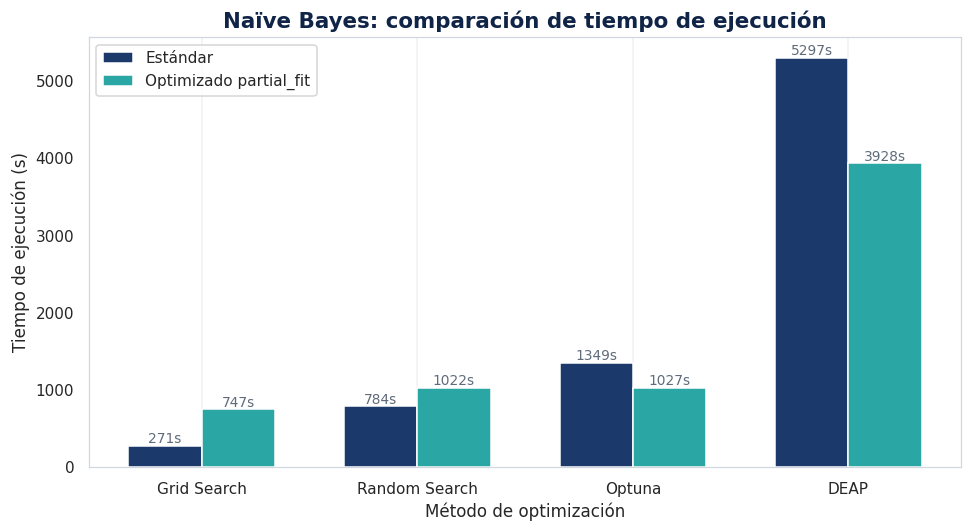

In [435]:
# ============================================================
# Configuración visual profesional
# ============================================================

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Paleta del proyecto
C_NAVY  = "#0F2447"
C_BLUE  = "#1B3A6B"
C_AQUA  = "#2AA7A5"
C_GREEN = "#1BB470"
C_ORANGE = "#FF9806"
C_GRAY  = "#5F6B7A"
C_LIGHT = "#F4F7FA"

plt.rcParams.update({
    "figure.figsize": (9, 5),
    "axes.titlesize": 14,
    "axes.labelsize": 11,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
    "axes.edgecolor": "#D0D7DE",
    "axes.linewidth": 0.8,
    "grid.color": "#D0D7DE",
    "grid.alpha": 0.35,
    "font.family": "DejaVu Sans"
})

# ============================================================
# Tiempo estándar vs optimizado - Naïve Bayes
# ============================================================

plot_tiempo = comparacion_delta_nb.copy()

x = np.arange(len(plot_tiempo["Método"]))
width = 0.34

fig, ax = plt.subplots(figsize=(9, 5))

bars1 = ax.bar(
    x - width / 2,
    plot_tiempo["Tiempo estándar (s)"],
    width,
    label="Estándar",
    color=C_BLUE
)

bars2 = ax.bar(
    x + width / 2,
    plot_tiempo["Tiempo optimizado (s)"],
    width,
    label="Optimizado partial_fit",
    color=C_AQUA
)

ax.set_title("Naïve Bayes: comparación de tiempo de ejecución", fontweight="bold", color=C_NAVY)
ax.set_xlabel("Método de optimización")
ax.set_ylabel("Tiempo de ejecución (s)")
ax.set_xticks(x)
ax.set_xticklabels(plot_tiempo["Método"], rotation=0)
ax.grid(axis="y")
ax.legend(frameon=True)

# Etiquetas de valor
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            height,
            f"{height:.0f}s",
            ha="center",
            va="bottom",
            fontsize=9,
            color=C_GRAY
        )

plt.tight_layout()
plt.show()

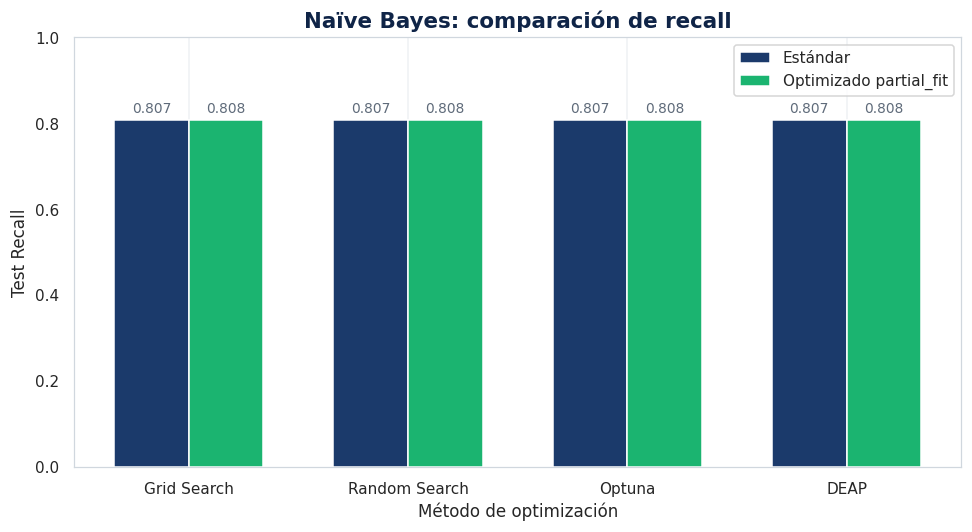

In [436]:
# ============================================================
# Recall estándar vs optimizado - Naïve Bayes
# ============================================================

plot_recall = comparacion_delta_nb.copy()

x = np.arange(len(plot_recall["Método"]))
width = 0.34

fig, ax = plt.subplots(figsize=(9, 5))

bars1 = ax.bar(
    x - width / 2,
    plot_recall["Recall estándar"],
    width,
    label="Estándar",
    color=C_BLUE
)

bars2 = ax.bar(
    x + width / 2,
    plot_recall["Recall optimizado"],
    width,
    label="Optimizado partial_fit",
    color=C_GREEN
)

ax.set_title("Naïve Bayes: comparación de recall", fontweight="bold", color=C_NAVY)
ax.set_xlabel("Método de optimización")
ax.set_ylabel("Test Recall")
ax.set_xticks(x)
ax.set_xticklabels(plot_recall["Método"], rotation=0)
ax.set_ylim(0, 1)
ax.grid(axis="y")
ax.legend(frameon=True)

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.01,
            f"{height:.3f}",
            ha="center",
            va="bottom",
            fontsize=9,
            color=C_GRAY
        )

plt.tight_layout()
plt.show()

### **25.4 XGBoost**


In [ ]:
import os
import time
import pickle
import random
import numpy as np
import pandas as pd
import joblib
 
from xgboost import XGBClassifier
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE, ADASYN
 
BASE_COMP = "Modelos_Optimizados_Computacional/XGBoost"
os.makedirs(BASE_COMP, exist_ok=True)
 
EARLY_STOPPING_ROUNDS = 20
EVAL_VAL_SIZE         = 0.10  

In [ ]:
class XGBHistEarlyStopping(BaseEstimator, ClassifierMixin):
    """
    XGBClassifier con tree_method='hist' y early stopping (Opción A).
 
    Correcciones aplicadas:
      - eval_metric='aucpr': más sensible al desbalanceo que logloss.
      - scale_pos_weight calculado dinámicamente desde y cuando
        use_scale_pos_weight=True (para técnica Class Weight).
      - val_size=0.10: split interno más pequeño para no perder training data.
    """
 
    def __init__(
        self,
        n_estimators=300,
        max_depth=6,
        learning_rate=0.1,
        subsample=0.8,
        colsample_bytree=0.8,
        min_child_weight=1,
        early_stopping_rounds=EARLY_STOPPING_ROUNDS,
        val_size=EVAL_VAL_SIZE,
        random_state=RANDOM_STATE,
    ):
        self.n_estimators           = n_estimators
        self.max_depth              = max_depth
        self.learning_rate          = learning_rate
        self.subsample              = subsample
        self.colsample_bytree       = colsample_bytree
        self.min_child_weight       = min_child_weight
        self.early_stopping_rounds  = early_stopping_rounds
        self.val_size               = val_size
        self.random_state           = random_state
 
    def fit(self, X, y, **fit_params):
        # Split interno estratificado para early stopping (Opción A)
        X_tr, X_val, y_tr, y_val = train_test_split(
            X, y,
            test_size=self.val_size,
            stratify=y,
            random_state=self.random_state
        )
 
        # scale_pos_weight siempre calculado dinámicamente desde y_tr.
        # Con SMOTE/ADASYN los datos ya vienen balanceados → ratio ≈ 1.0
        # Con Sin Balanceo/Class Weight el desbalanceo se compensa automáticamente
        clases, conteos  = np.unique(y_tr, return_counts=True)
        scale_pos_weight = float(conteos[0] / conteos[1])
 
        self._model = XGBClassifier(
            n_estimators=self.n_estimators,
            max_depth=self.max_depth,
            learning_rate=self.learning_rate,
            subsample=self.subsample,
            colsample_bytree=self.colsample_bytree,
            min_child_weight=self.min_child_weight,
            scale_pos_weight=scale_pos_weight,
            tree_method="hist",
            objective="binary:logistic",
            eval_metric="logloss",
            early_stopping_rounds=self.early_stopping_rounds,
            random_state=self.random_state,
            n_jobs=-1,
        )
 
        self._model.fit(
            X_tr, y_tr,
            eval_set=[(X_val, y_val)],
            verbose=False
        )
 
        self.best_iteration_ = self._model.best_iteration
        self.classes_        = np.unique(y)
        return self
 
    def predict(self, X):
        return self._model.predict(X)
 
    def predict_proba(self, X):
        return self._model.predict_proba(X)
 
    def get_params(self, deep=True):
        return {
            "n_estimators":          self.n_estimators,
            "max_depth":             self.max_depth,
            "learning_rate":         self.learning_rate,
            "subsample":             self.subsample,
            "colsample_bytree":      self.colsample_bytree,
            "min_child_weight":      self.min_child_weight,
            "early_stopping_rounds": self.early_stopping_rounds,
            "val_size":              self.val_size,
            "random_state":          self.random_state,
        }
 
    def set_params(self, **params):
        for k, v in params.items():
            setattr(self, k, v)
        return self
 

In [ ]:
def xgb_hist_factory(params):
    return XGBHistEarlyStopping(
        n_estimators=params["n_estimators"],
        max_depth=params["max_depth"],
        learning_rate=params["learning_rate"],
        subsample=params["subsample"],
        colsample_bytree=params["colsample_bytree"],
        min_child_weight=params["min_child_weight"],
        early_stopping_rounds=EARLY_STOPPING_ROUNDS,
        val_size=EVAL_VAL_SIZE,
        random_state=RANDOM_STATE,
    )

param_grid_xgb_hist = {
    "modelo__n_estimators":  [100, 200, 300],
    "modelo__max_depth":     [3, 4, 6],
    "modelo__learning_rate": [0.05, 0.1, 0.2],
}
 
param_dist_xgb_hist = {
    "modelo__n_estimators":     [100, 150, 200, 250, 300, 400, 500],
    "modelo__max_depth":        [3, 4, 5, 6, 7, 8],
    "modelo__learning_rate":    np.logspace(-2, -0.5, 20).tolist(),
    "modelo__subsample":        [0.6, 0.7, 0.8, 0.9, 1.0],
    "modelo__colsample_bytree": [0.6, 0.7, 0.8, 0.9, 1.0],
    "modelo__min_child_weight": [1, 3, 5, 7, 10],
}
 
espacio_deap_xgb_hist = {
    "n_estimators":     [100, 150, 200, 250, 300, 400, 500],
    "max_depth":        [3, 4, 5, 6, 7, 8],
    "learning_rate":    np.logspace(-2, -0.5, 10).tolist(),
    "subsample":        [0.6, 0.7, 0.8, 0.9, 1.0],
    "colsample_bytree": [0.6, 0.7, 0.8, 0.9, 1.0],
    "min_child_weight": [1, 3, 5, 7, 10],
}

def _ejecutar_metodo_xgb_hist(metodo, modelo_nombre, X_train, y_train,
                               cv, scoring="recall"):
    """
    Ejecuta un método de búsqueda con las 4 técnicas de balanceo.
    Una sola factory — scale_pos_weight se calcula dinámicamente en fit().
    """
    tecnicas = {
        "Sin Balanceo": None,
        "SMOTE":        SMOTE(random_state=RANDOM_STATE),
        "ADASYN":       ADASYN(random_state=RANDOM_STATE),
        "Class Weight": "balanced",
    }
 
    if metodo == "grid":
        return _grid_tecnicas(modelo_nombre, xgb_hist_factory, tecnicas,
                              X_train, y_train, cv, scoring)
    elif metodo == "random":
        return _random_tecnicas(modelo_nombre, xgb_hist_factory, tecnicas,
                                X_train, y_train, cv, scoring)
    elif metodo == "optuna":
        return _optuna_tecnicas(modelo_nombre, xgb_hist_factory, tecnicas,
                                X_train, y_train, cv, scoring)
    elif metodo == "deap":
        return _deap_tecnicas(modelo_nombre, xgb_hist_factory, tecnicas,
                              X_train, y_train, cv, scoring)
 
 
def _grid_tecnicas(nombre, factory, tecnicas, X_train, y_train, cv, scoring):
    from sklearn.model_selection import GridSearchCV
    resultados = {}
    for nombre_tecnica, tecnica in tecnicas.items():
        print(f"\nGrid Search — {nombre} — {nombre_tecnica}")
        pipeline = construir_pipeline_balanceo(
            factory({"n_estimators": 300, "max_depth": 6, "learning_rate": 0.1,
                     "subsample": 0.8, "colsample_bytree": 0.8, "min_child_weight": 1}),
            nombre_tecnica, tecnica, escalado=False
        )
        gs = GridSearchCV(pipeline, param_grid_xgb_hist,
                          scoring=scoring, cv=cv, n_jobs=-1, refit=True, verbose=1)
        inicio = time.time()
        gs.fit(X_train, y_train)
        tiempo = time.time() - inicio
 
        evaluacion = evaluar_modelo(
            f"Grid — XGB hist — {nombre_tecnica}",
            gs.best_estimator_, X_test, y_test
        )
        resultados[nombre_tecnica] = {
            **evaluacion,
            "Mejores Hiperparámetros": gs.best_params_,
            f"Mejor {scoring} CV":     gs.best_score_,
            f"Std {scoring} CV":       gs.cv_results_["std_test_score"][gs.best_index_],
            "Tiempo (s)":   tiempo,
            "Iteraciones":  len(gs.cv_results_["params"]),
        }
        joblib.dump(gs.best_estimator_,
            f"{BASE_COMP}/grid_XGBoost_hist_{nombre_tecnica}.joblib")
    return resultados
 
 
def _random_tecnicas(nombre, factory, tecnicas, X_train, y_train, cv, scoring):
    from sklearn.model_selection import RandomizedSearchCV
    resultados = {}
    for nombre_tecnica, tecnica in tecnicas.items():
        print(f"\nRandom Search — {nombre} — {nombre_tecnica}")
        pipeline = construir_pipeline_balanceo(
            factory({"n_estimators": 300, "max_depth": 6, "learning_rate": 0.1,
                     "subsample": 0.8, "colsample_bytree": 0.8, "min_child_weight": 1}),
            nombre_tecnica, tecnica, escalado=False
        )
        rs = RandomizedSearchCV(pipeline, param_dist_xgb_hist, n_iter=30,
                                scoring=scoring, cv=cv, random_state=RANDOM_STATE,
                                n_jobs=-1, refit=True, verbose=1)
        inicio = time.time()
        rs.fit(X_train, y_train)
        tiempo = time.time() - inicio
 
        evaluacion = evaluar_modelo(
            f"Random — XGB hist — {nombre_tecnica}",
            rs.best_estimator_, X_test, y_test
        )
        resultados[nombre_tecnica] = {
            **evaluacion,
            "Mejores Hiperparámetros": rs.best_params_,
            f"Mejor {scoring} CV":     rs.best_score_,
            f"Std {scoring} CV":       rs.cv_results_["std_test_score"][rs.best_index_],
            "Tiempo (s)":   tiempo,
            "Iteraciones":  30,
        }
        joblib.dump(rs.best_estimator_,
            f"{BASE_COMP}/random_XGBoost_hist_{nombre_tecnica}.joblib")
    return resultados
 
 
def _optuna_tecnicas(nombre, factory, tecnicas, X_train, y_train, cv, scoring):
    import optuna
    from optuna.samplers import TPESampler
    resultados = {}
    for nombre_tecnica, tecnica in tecnicas.items():
        print(f"\nOptuna — {nombre} — {nombre_tecnica}")
 
        def objective(trial):
            params = {
                "n_estimators":     trial.suggest_int("n_estimators", 100, 500),
                "max_depth":        trial.suggest_int("max_depth", 3, 8),
                "learning_rate":    trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
                "subsample":        trial.suggest_float("subsample", 0.6, 1.0),
                "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
                "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
            }
            modelo   = factory(params)
            pipeline = construir_pipeline_balanceo(
                modelo, nombre_tecnica, tecnica, escalado=False
            )
            scores = cross_val_score(
                pipeline, X_train, y_train,
                cv=cv, scoring=scoring, n_jobs=-1
            )
            return scores.mean()
 
        study = optuna.create_study(
            direction="maximize",
            sampler=TPESampler(seed=RANDOM_STATE),
            study_name=f"XGB_hist_{nombre_tecnica}"
        )
        inicio = time.time()
        study.optimize(objective, n_trials=30, show_progress_bar=True)
        tiempo = time.time() - inicio
 
        mejores_params = study.best_params
        pipeline_final = construir_pipeline_balanceo(
            factory(mejores_params), nombre_tecnica, tecnica, escalado=False
        )
        pipeline_final.fit(X_train, y_train)
 
        evaluacion = evaluar_modelo(
            f"Optuna — XGB hist — {nombre_tecnica}",
            pipeline_final, X_test, y_test
        )
        resultados[nombre_tecnica] = {
            **evaluacion,
            "Mejores Hiperparámetros": mejores_params,
            f"Mejor {scoring} CV":     study.best_value,
            "Tiempo (s)":   tiempo,
            "Iteraciones":  30,
        }
        joblib.dump(pipeline_final,
            f"{BASE_COMP}/optuna_XGBoost_hist_{nombre_tecnica}.joblib")
        joblib.dump(study,
            f"{BASE_COMP}/optuna_XGBoost_hist_{nombre_tecnica}_study.joblib")
    return resultados
 
 
def _deap_tecnicas(nombre, factory, tecnicas, X_train, y_train, cv, scoring):
    from deap import base, creator, tools, algorithms
    keys_dp    = list(espacio_deap_xgb_hist.keys())
    valores_dp = list(espacio_deap_xgb_hist.values())
    resultados = {}
 
    for nombre_tecnica, tecnica in tecnicas.items():
        print(f"\nDEAP — {nombre} — {nombre_tecnica}")
 
        for attr in ["FitnessMax", "Individual"]:
            if hasattr(creator, attr):
                delattr(creator, attr)
        creator.create("FitnessMax", base.Fitness, weights=(1.0,))
        creator.create("Individual", list, fitness=creator.FitnessMax)
 
        toolbox = base.Toolbox()
 
        def crear_individuo():
            return creator.Individual([
                random.randint(0, len(v) - 1) for v in valores_dp
            ])
 
        toolbox.register("individual", crear_individuo)
        toolbox.register("population", tools.initRepeat, list, toolbox.individual)
 
        def evaluar_individuo(individuo):
            params = {
                keys_dp[i]: valores_dp[i][min(int(idx), len(valores_dp[i]) - 1)]
                for i, idx in enumerate(individuo)
            }
            try:
                modelo   = factory(params)
                pipeline = construir_pipeline_balanceo(
                    modelo, nombre_tecnica, tecnica, escalado=False
                )
                scores = cross_val_score(
                    pipeline, X_train, y_train,
                    cv=cv, scoring=scoring, n_jobs=-1
                )
                return (scores.mean(),)
            except Exception as e:
                print(f"  Error individuo: {e}")
                return (0.0,)
 
        toolbox.register("evaluate", evaluar_individuo)
        toolbox.register("mate",   tools.cxUniform, indpb=0.5)
        toolbox.register("mutate", tools.mutUniformInt,
                         low=0,
                         up=[len(v) - 1 for v in valores_dp],
                         indpb=0.2)
        toolbox.register("select", tools.selTournament, tournsize=3)
 
        random.seed(RANDOM_STATE)
        np.random.seed(RANDOM_STATE)
 
        poblacion = toolbox.population(n=20)
        hof       = tools.HallOfFame(1)
        stats     = tools.Statistics(lambda ind: ind.fitness.values)
        stats.register("max",  np.max)
        stats.register("mean", np.mean)
        historia  = []
 
        inicio = time.time()
        for gen in range(5):
            fits = list(map(toolbox.evaluate, poblacion))
            for ind, fit in zip(poblacion, fits):
                ind.fitness.values = fit
            hof.update(poblacion)
            record = stats.compile(poblacion)
            historia.append(record)
            print(f"  Gen {gen+1:02d}/05 | Max {scoring}: {record['max']:.4f} | "
                  f"Mean: {record['mean']:.4f}")
            offspring = algorithms.varAnd(
                toolbox.select(poblacion, len(poblacion)),
                toolbox, cxpb=0.5, mutpb=0.3
            )
            poblacion = offspring
 
        fits = list(map(toolbox.evaluate, poblacion))
        for ind, fit in zip(poblacion, fits):
            ind.fitness.values = fit
        hof.update(poblacion)
        tiempo = time.time() - inicio
 
        mejores_params = {
            keys_dp[i]: valores_dp[i][min(int(idx), len(valores_dp[i]) - 1)]
            for i, idx in enumerate(hof[0])
        }
        pipeline_final = construir_pipeline_balanceo(
            factory(mejores_params), nombre_tecnica, tecnica, escalado=False
        )
        pipeline_final.fit(X_train, y_train)
 
        evaluacion = evaluar_modelo(
            f"DEAP — XGB hist — {nombre_tecnica}",
            pipeline_final, X_test, y_test
        )
        scores_hist = [g["max"] for g in historia]
        resultados[nombre_tecnica] = {
            **evaluacion,
            "Mejores Hiperparámetros": mejores_params,
            f"Mejor {scoring} CV":     hof[0].fitness.values[0],
            f"Std {scoring} CV":       float(np.std(scores_hist)),
            "Tiempo (s)":   tiempo,
            "Iteraciones":  5 * 20,
            "Historia":     historia,
        }
        joblib.dump(pipeline_final,
            f"{BASE_COMP}/deap_XGBoost_hist_{nombre_tecnica}.joblib")
 
    return resultados
    

In [ ]:
print("  GRID SEARCH + hist + early stopping")
resultados_gs_xgb_hist = _ejecutar_metodo_xgb_hist(
    "grid", "XGBoost_hist", X_train, y_train, cv_strategy, scoring="recall"
)

In [ ]:
print("  RANDOM SEARCH + hist + early stopping")
resultados_rs_xgb_hist = _ejecutar_metodo_xgb_hist(
    "random", "XGBoost_hist", X_train, y_train, cv_strategy, scoring="recall"
)

In [ ]:
print("  OPTUNA + hist + early stopping")
resultados_op_xgb_hist = _ejecutar_metodo_xgb_hist(
    "optuna", "XGBoost_hist", X_train, y_train, cv_strategy, scoring="recall"
)

In [ ]:
print("  DEAP + hist + early stopping")
resultados_deap_xgb_hist = _ejecutar_metodo_xgb_hist(
    "deap", "XGBoost_hist", X_train, y_train, cv_strategy, scoring="recall"
)

In [ ]:
with open(f"{BASE_COMP}/xgb_hist_resultados_totales.pkl", "wb") as f:
    pickle.dump({
        "grid":   resultados_gs_xgb_hist,
        "random": resultados_rs_xgb_hist,
        "optuna": resultados_op_xgb_hist,
        "deap":   resultados_deap_xgb_hist,
    }, f)

In [463]:
# ============================================================
# Cargar archivos XGBoost optimizado computacionalmente
# ============================================================

from pathlib import Path
import os
import pickle
import joblib
import pandas as pd
import numpy as np

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

XGB_COMP_DIR = (
    BASE_DIR
    / "machineentrega2"
    / "Modelos_Optimizados_Computacional"
    / "XGBoost"
)

print("Ruta XGBoost computacional:")
print(XGB_COMP_DIR)
print("Existe:", XGB_COMP_DIR.exists())

print("\nArchivos disponibles:")
for archivo in os.listdir(XGB_COMP_DIR):
    print("-", archivo)

Ruta XGBoost computacional:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\machineentrega2\Modelos_Optimizados_Computacional\XGBoost
Existe: True

Archivos disponibles:
- deap_XGBoost_hist_ADASYN.joblib
- deap_XGBoost_hist_Class Weight.joblib
- deap_XGBoost_hist_Sin Balanceo.joblib
- deap_XGBoost_hist_SMOTE.joblib
- tabla_comparativa_xgb.csv
- velocidad_normal_vs_hist.png
- xgb_hist_resultados_totales.pkl


In [464]:
# ============================================================
# Cargar tabla comparativa XGBoost hist + early stopping
# ============================================================

xgb_comp_csv_path = XGB_COMP_DIR / "tabla_comparativa_xgb.csv"

xgb_hist_summary_raw = pd.read_csv(xgb_comp_csv_path)

print("Tabla XGBoost computacional cargada correctamente.")
print("Dimensión:", xgb_hist_summary_raw.shape)
print("Columnas:")
print(xgb_hist_summary_raw.columns.tolist())

display(xgb_hist_summary_raw.head())

Tabla XGBoost computacional cargada correctamente.
Dimensión: (32, 8)
Columnas:
['Modelo', 'Test Recall', 'Test Precision', 'Test F1', 'Test ROC AUC', 'Mejor recall CV', 'Tiempo (s)', 'Iteraciones']


,Modelo,Test Recall,Test Precision,Test F1,Test ROC AUC,Mejor recall CV,Tiempo (s),Iteraciones
0,DEAP — XGB — Class Weight,0.7940,0.3063,0.4421,0.8272,0.7964,1505.3200,100
1,Random — XGB — Class Weight,0.7937,0.3054,0.4411,0.8271,0.7956,290.3679,30
2,Grid — XGB — Class Weight,0.7935,0.3059,0.4416,0.8275,0.7956,183.1376,27
3,Optuna — XGB hist — Class Weight,0.7932,0.3058,0.4415,0.8269,0.7963,479.1673,30
4,Optuna — XGB hist — Sin Balanceo,0.7932,0.3058,0.4415,0.8269,0.7963,458.1357,30


In [483]:
# ============================================================
# Normalizar tabla XGBoost hist + early stopping
# ============================================================

xgb_hist_summary = xgb_hist_summary_raw.copy()

# Asegurar nombres de columnas esperados
rename_map_xgb = {
    "Test ROC AUC": "Test AUC",
    "Mejor recall CV": "CV Recall",
    "Mejores Hiperparámetros": "Best Params",
    "Iteraciones": "Evaluaciones"
}

xgb_hist_summary = xgb_hist_summary.rename(columns=rename_map_xgb)

# Si la columna Modelo viene con texto combinado, se extraen método y balanceo
def inferir_metodo_xgb(texto):
    texto = str(texto).lower()

    if "grid" in texto:
        return "Grid Search"
    elif "random" in texto:
        return "Random Search"
    elif "optuna" in texto:
        return "Optuna"
    elif "deap" in texto:
        return "DEAP"
    else:
        return "No identificado"


def inferir_balanceo_xgb(texto):
    texto = str(texto).lower()

    if "adasyn" in texto:
        return "ADASYN"
    elif "smote" in texto:
        return "SMOTE"
    elif "class weight" in texto or "class_weight" in texto:
        return "Class Weight"
    elif "sin balanceo" in texto or "none" in texto:
        return "Sin Balanceo"
    else:
        return "No identificado"


if "Método" not in xgb_hist_summary.columns:
    xgb_hist_summary["Método"] = xgb_hist_summary["Modelo"].apply(inferir_metodo_xgb)

if "Balanceo" not in xgb_hist_summary.columns:
    xgb_hist_summary["Balanceo"] = xgb_hist_summary["Modelo"].apply(inferir_balanceo_xgb)

xgb_hist_summary["Modelo base"] = "XGBoost"
xgb_hist_summary["Técnica computacional"] = "hist + early stopping"

# Asegurar columnas faltantes
columnas_xgb_hist = [
    "Modelo base",
    "Técnica computacional",
    "Método",
    "Balanceo",
    "CV Recall",
    #"Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test AUC",
    "Tiempo (s)",
    "Evaluaciones",
    #"Best Params"
]

for col in columnas_xgb_hist:
    if col not in xgb_hist_summary.columns:
        xgb_hist_summary[col] = None

# Convertir métricas
metric_cols_xgb = [
    "CV Recall",
    #"Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test AUC",
    "Tiempo (s)",
    "Evaluaciones"
]

for col in metric_cols_xgb:
    xgb_hist_summary[col] = pd.to_numeric(xgb_hist_summary[col], errors="coerce")

# Ordenar y quitar duplicados si los hay
xgb_hist_summary = (
    xgb_hist_summary[columnas_xgb_hist]
    .drop_duplicates()
    .sort_values(
        by=["Test Recall", "Tiempo (s)"],
        ascending=[False, True],
        na_position="last"
    )
    .reset_index(drop=True)
)

In [484]:
# ============================================================
# Tabla limpia XGBoost hist: 16 combinaciones
# ============================================================

orden_metodos = ["Grid Search", "Random Search", "Optuna", "DEAP"]
orden_balanceo = ["Sin Balanceo", "SMOTE", "ADASYN", "Class Weight"]

xgb_hist_16 = (
    xgb_hist_summary
    .dropna(subset=["Test Recall"])
    .sort_values(
        by=["Método", "Balanceo", "Test Recall", "Tiempo (s)"],
        ascending=[True, True, False, True]
    )
    .drop_duplicates(
        subset=["Método", "Balanceo"],
        keep="first"
    )
    .reset_index(drop=True)
)

xgb_hist_16["Método"] = pd.Categorical(
    xgb_hist_16["Método"],
    categories=orden_metodos,
    ordered=True
)

xgb_hist_16["Balanceo"] = pd.Categorical(
    xgb_hist_16["Balanceo"],
    categories=orden_balanceo,
    ordered=True
)

xgb_hist_16 = (
    xgb_hist_16
    .sort_values(["Método", "Balanceo"])
    .reset_index(drop=True)
)

display(xgb_hist_16.round(4))
print("Número de filas:", len(xgb_hist_16))

,Modelo base,Técnica computacional,Método,Balanceo,CV Recall,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones
0,XGBoost,hist + early stopping,Grid Search,Sin Balanceo,0.7952,0.3035,0.7909,0.4386,0.8254,321.0702,27
1,XGBoost,hist + early stopping,Grid Search,SMOTE,0.5099,0.3879,0.5073,0.4396,0.8152,710.8679,27
2,XGBoost,hist + early stopping,Grid Search,ADASYN,0.5033,0.3844,0.5015,0.4352,0.8129,1170.1642,27
3,XGBoost,hist + early stopping,Grid Search,Class Weight,0.7956,0.3059,0.7935,0.4416,0.8275,183.1376,27
4,XGBoost,hist + early stopping,Random Search,Sin Balanceo,0.7954,0.3043,0.7926,0.4398,0.8252,296.6947,30
5,XGBoost,hist + early stopping,Random Search,SMOTE,0.5801,0.3647,0.5787,0.4474,0.8108,974.0333,30
6,XGBoost,hist + early stopping,Random Search,ADASYN,0.5722,0.3578,0.5841,0.4438,0.8084,1453.3756,30
7,XGBoost,hist + early stopping,Random Search,Class Weight,0.7956,0.3054,0.7937,0.4411,0.8271,290.3679,30
8,XGBoost,hist + early stopping,Optuna,Sin Balanceo,0.7963,0.3058,0.7932,0.4415,0.8269,458.1357,30
9,XGBoost,hist + early stopping,Optuna,SMOTE,0.5757,0.3565,0.5799,0.4416,0.8043,823.2841,30


Número de filas: 16


In [486]:
# ============================================================
# Mejor configuración global XGBoost hist + early stopping
# ============================================================

best_xgb_hist = (
    xgb_hist_16
    .dropna(subset=["Test Recall"])
    .sort_values(
        by=["Test Recall", "Tiempo (s)"],
        ascending=[False, True]
    )
    .iloc[0]
)

print("Mejor configuración XGBoost optimizado")
print("=" * 70)
print("Modelo base:", best_xgb_hist["Modelo base"])
print("Técnica computacional:", best_xgb_hist["Técnica computacional"])
print("Método:", best_xgb_hist["Método"])
print("Balanceo:", best_xgb_hist["Balanceo"])
print("Test Recall:", round(best_xgb_hist["Test Recall"], 4))
print("Test Precision:", round(best_xgb_hist["Test Precision"], 4))
print("Test F1:", round(best_xgb_hist["Test F1"], 4))
print("Test AUC:", round(best_xgb_hist["Test AUC"], 4))
print("Tiempo (s):", round(best_xgb_hist["Tiempo (s)"], 4))
print("Evaluaciones:", best_xgb_hist["Evaluaciones"])

display(best_xgb_hist.to_frame().T)

Mejor configuración XGBoost optimizado
Modelo base: XGBoost
Técnica computacional: hist + early stopping
Método: DEAP
Balanceo: Class Weight
Test Recall: 0.794
Test Precision: 0.3063
Test F1: 0.4421
Test AUC: 0.8272
Tiempo (s): 1505.32
Evaluaciones: 100


,Modelo base,Técnica computacional,Método,Balanceo,CV Recall,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones
15,XGBoost,hist + early stopping,DEAP,Class Weight,0.7964,0.3063,0.794,0.4421,0.8272,1505.32,100


In [487]:
# ============================================================
# Mejor resultado XGBoost hist por método de optimización
# ============================================================

best_xgb_hist_by_method = (
    xgb_hist_16
    .dropna(subset=["Test Recall"])
    .sort_values(
        by=["Método", "Test Recall", "Tiempo (s)"],
        ascending=[True, False, True]
    )
    .groupby("Método", as_index=False, observed=True)
    .first()
)

display(
    best_xgb_hist_by_method
    .sort_values(
        by=["Test Recall", "Tiempo (s)"],
        ascending=[False, True]
    )
    .round(4)
)

,Método,Modelo base,Técnica computacional,Balanceo,CV Recall,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones
3,DEAP,XGBoost,hist + early stopping,Class Weight,0.7964,0.3063,0.7940,0.4421,0.8272,1505.3200,100
1,Random Search,XGBoost,hist + early stopping,Class Weight,0.7956,0.3054,0.7937,0.4411,0.8271,290.3679,30
0,Grid Search,XGBoost,hist + early stopping,Class Weight,0.7956,0.3059,0.7935,0.4416,0.8275,183.1376,27
2,Optuna,XGBoost,hist + early stopping,Sin Balanceo,0.7963,0.3058,0.7932,0.4415,0.8269,458.1357,30


In [473]:
# ============================================================
# Resumen desempeño-tiempo por método - XGBoost hist
# ============================================================

resumen_xgb_hist_metodo = (
    xgb_hist_16
    .groupby("Método", observed=True)
    .agg(
        Mejor_Recall=("Test Recall", "max"),
        Mejor_F1=("Test F1", "max"),
        Mejor_AUC=("Test AUC", "max"),
        Menor_Tiempo=("Tiempo (s)", "min"),
        Tiempo_Promedio=("Tiempo (s)", "mean"),
        Mayor_Tiempo=("Tiempo (s)", "max"),
        Experimentos=("Modelo base", "count")
    )
    .reset_index()
    .sort_values(
        by=["Mejor_Recall", "Menor_Tiempo"],
        ascending=[False, True]
    )
)

display(resumen_xgb_hist_metodo.round(4))

,Método,Mejor_Recall,Mejor_F1,Mejor_AUC,Menor_Tiempo,Tiempo_Promedio,Mayor_Tiempo,Experimentos
3,DEAP,0.7940,0.4421,0.8272,1505.3200,3685.6257,7595.8983,4
1,Random Search,0.7937,0.4474,0.8271,290.3679,753.6179,1453.3756,4
0,Grid Search,0.7935,0.4416,0.8275,183.1376,596.3100,1170.1642,4
2,Optuna,0.7932,0.4416,0.8269,458.1357,865.7442,1702.3899,4


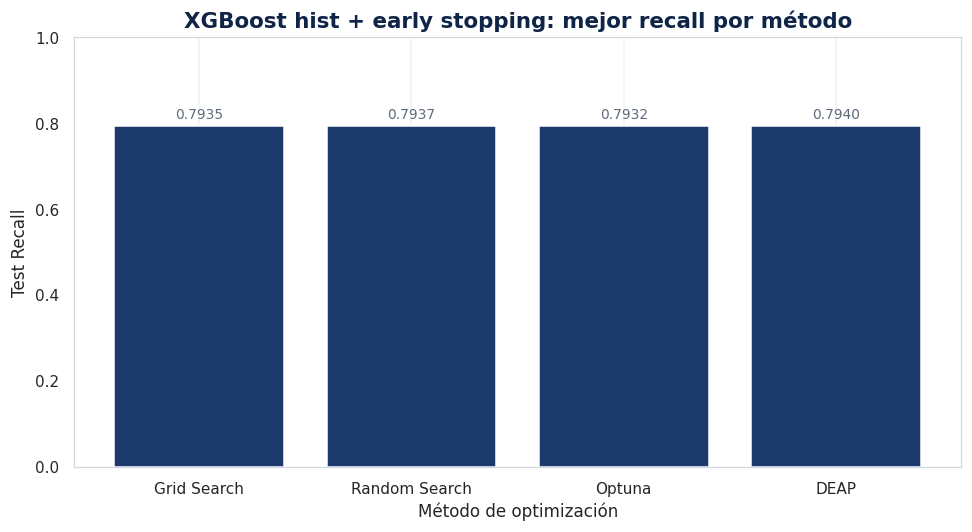

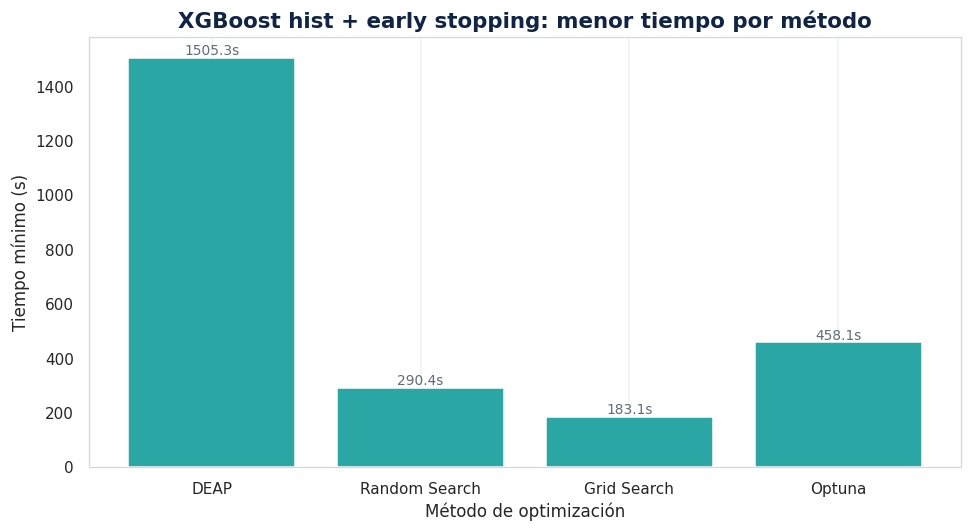

In [475]:
# ============================================================
# Configuración visual profesional
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

C_NAVY  = "#0F2447"
C_BLUE  = "#1B3A6B"
C_AQUA  = "#2AA7A5"
C_GREEN = "#1BB470"
C_ORANGE = "#FF9806"
C_GRAY  = "#5F6B7A"

plt.rcParams.update({
    "figure.figsize": (9, 5),
    "axes.titlesize": 14,
    "axes.labelsize": 11,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
    "axes.edgecolor": "#D0D7DE",
    "axes.linewidth": 0.8,
    "grid.color": "#D0D7DE",
    "grid.alpha": 0.35,
    "font.family": "DejaVu Sans"
})

# ============================================================
# Gráfica: mejor Test Recall por método - XGBoost hist
# ============================================================

plot_xgb_recall_method = best_xgb_hist_by_method.copy()

fig, ax = plt.subplots(figsize=(9, 5))

bars = ax.bar(
    plot_xgb_recall_method["Método"].astype(str),
    plot_xgb_recall_method["Test Recall"],
    color=C_BLUE
)

ax.set_title("XGBoost hist + early stopping: mejor recall por método", fontweight="bold", color=C_NAVY)
ax.set_xlabel("Método de optimización")
ax.set_ylabel("Test Recall")
ax.set_ylim(0, 1)
ax.grid(axis="y")

for bar in bars:
    height = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        height + 0.01,
        f"{height:.4f}",
        ha="center",
        va="bottom",
        fontsize=9,
        color=C_GRAY
    )

plt.tight_layout()
plt.show()


# ============================================================
# Gráfica: menor tiempo por método - XGBoost hist
# ============================================================

plot_xgb_time_method = resumen_xgb_hist_metodo.copy()

fig, ax = plt.subplots(figsize=(9, 5))

bars = ax.bar(
    plot_xgb_time_method["Método"].astype(str),
    plot_xgb_time_method["Menor_Tiempo"],
    color=C_AQUA
)

ax.set_title("XGBoost hist + early stopping: menor tiempo por método", fontweight="bold", color=C_NAVY)
ax.set_xlabel("Método de optimización")
ax.set_ylabel("Tiempo mínimo (s)")
ax.grid(axis="y")

for bar in bars:
    height = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{height:.1f}s",
        ha="center",
        va="bottom",
        fontsize=9,
        color=C_GRAY
    )

plt.tight_layout()
plt.show()

In [492]:
# ============================================================
# Tabla comparativa: XGBoost estándar vs optimizado
# ============================================================

import pandas as pd
import numpy as np

# ------------------------------------------------------------
# Resultados estándar de XGBoost
# Tomados de tus salidas previas
# ------------------------------------------------------------

xgb_estandar_best = pd.DataFrame([
    {
        "Modelo": "XGBoost estándar",
        "Versión": "Estándar",
        "Técnica computacional": "fit tradicional",
        "Método": "Grid Search",
        "Balanceo": "Class Weight",
        "CV Recall": 0.7956,
        "Std Recall CV": 0.0053,
        #"Test Accuracy": 0.7204,
        "Test Precision": 0.3059,
        "Test Recall": 0.7935,
        "Test F1": 0.4416,
        "Test AUC": 0.8275,
        "Tiempo (s)": 183.1376,
        "Evaluaciones": 27
    },
    {
        "Modelo": "XGBoost estándar",
        "Versión": "Estándar",
        "Técnica computacional": "fit tradicional",
        "Método": "Random Search",
        "Balanceo": "Class Weight",
        "CV Recall": 0.7956,
        "Std Recall CV": 0.0045,
        #"Test Accuracy": 0.7197,
        "Test Precision": 0.3054,
        "Test Recall": 0.7937,
        "Test F1": 0.4411,
        "Test AUC": 0.8271,
        "Tiempo (s)": 290.3679,
        "Evaluaciones": 30
    },
    {
        "Modelo": "XGBoost estándar",
        "Versión": "Estándar",
        "Técnica computacional": "fit tradicional",
        "Método": "Optuna",
        "Balanceo": "Class Weight",
        "CV Recall": 0.7957,
        "Std Recall CV": np.nan,
        #"Test Accuracy": 0.7211,
        "Test Precision": 0.3061,
        "Test Recall": 0.7909,
        "Test F1": 0.4414,
        "Test AUC": 0.8272,
        "Tiempo (s)": 441.4269,
        "Evaluaciones": 30
    },
    {
        "Modelo": "XGBoost estándar",
        "Versión": "Estándar",
        "Técnica computacional": "fit tradicional",
        "Método": "DEAP",
        "Balanceo": "Class Weight",
        "CV Recall": 0.7964,
        "Std Recall CV": 0.0000,
        #"Test Accuracy": 0.7207,
        "Test Precision": 0.3063,
        "Test Recall": 0.7940,
        "Test F1": 0.4421,
        "Test AUC": 0.8272,
        "Tiempo (s)": 1505.3200,
        "Evaluaciones": 100
    }
])

# ------------------------------------------------------------
# Resultados optimizados de XGBoost: hist + early stopping
# Se toman desde tu tabla xgb_hist_16
# ------------------------------------------------------------

xgb_optimizado_best = (
    xgb_hist_16
    .dropna(subset=["Test Recall"])
    .sort_values(
        by=["Método", "Test Recall", "Tiempo (s)"],
        ascending=[True, False, True]
    )
    .groupby("Método", as_index=False, observed=True)
    .first()
)

xgb_optimizado_best["Modelo"] = "XGBoost optimizado"
xgb_optimizado_best["Versión"] = "Optimizado"
xgb_optimizado_best["Técnica computacional"] = "hist + early stopping"

# Si no existe Test Accuracy en xgb_hist_16, se crea en NaN
if "Test Accuracy" not in xgb_optimizado_best.columns:
    xgb_optimizado_best["Test Accuracy"] = np.nan

if "Std Recall CV" not in xgb_optimizado_best.columns:
    xgb_optimizado_best["Std Recall CV"] = np.nan

# ------------------------------------------------------------
# Unir estándar + optimizado
# ------------------------------------------------------------

columnas_comparacion_xgb = [
    "Modelo",
    "Versión",
    "Técnica computacional",
    "Método",
    "Balanceo",
    "CV Recall",
    "Std Recall CV",
    #"Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test AUC",
    "Tiempo (s)",
    "Evaluaciones"
]

comparacion_xgb_std_vs_opt = pd.concat(
    [
        xgb_estandar_best[columnas_comparacion_xgb],
        xgb_optimizado_best[columnas_comparacion_xgb]
    ],
    ignore_index=True
)

# Ordenar por método
orden_metodos = ["Grid Search", "Random Search", "Optuna", "DEAP"]
comparacion_xgb_std_vs_opt["Método"] = pd.Categorical(
    comparacion_xgb_std_vs_opt["Método"],
    categories=orden_metodos,
    ordered=True
)

comparacion_xgb_std_vs_opt = (
    comparacion_xgb_std_vs_opt
    .sort_values(["Método", "Versión"])
    .reset_index(drop=True)
)

display(comparacion_xgb_std_vs_opt.round(4))

,Modelo,Versión,Técnica computacional,Método,Balanceo,CV Recall,Std Recall CV,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones
0,XGBoost estándar,Estándar,fit tradicional,Grid Search,Class Weight,0.7956,0.0053,0.3059,0.7935,0.4416,0.8275,183.1376,27
1,XGBoost optimizado,Optimizado,hist + early stopping,Grid Search,Class Weight,0.7956,NaN,0.3059,0.7935,0.4416,0.8275,183.1376,27
2,XGBoost estándar,Estándar,fit tradicional,Random Search,Class Weight,0.7956,0.0045,0.3054,0.7937,0.4411,0.8271,290.3679,30
3,XGBoost optimizado,Optimizado,hist + early stopping,Random Search,Class Weight,0.7956,NaN,0.3054,0.7937,0.4411,0.8271,290.3679,30
4,XGBoost estándar,Estándar,fit tradicional,Optuna,Class Weight,0.7957,NaN,0.3061,0.7909,0.4414,0.8272,441.4269,30
5,XGBoost optimizado,Optimizado,hist + early stopping,Optuna,Sin Balanceo,0.7963,NaN,0.3058,0.7932,0.4415,0.8269,458.1357,30
6,XGBoost estándar,Estándar,fit tradicional,DEAP,Class Weight,0.7964,0.0000,0.3063,0.7940,0.4421,0.8272,1505.3200,100
7,XGBoost optimizado,Optimizado,hist + early stopping,DEAP,Class Weight,0.7964,NaN,0.3063,0.7940,0.4421,0.8272,1505.3200,100


In [493]:
# ============================================================
# Tabla de diferencias: XGBoost optimizado - XGBoost estándar
# ============================================================

std = xgb_estandar_best.copy()
opt = xgb_optimizado_best.copy()

std = std.set_index("Método")
opt = opt.set_index("Método")

comparacion_delta_xgb = pd.DataFrame({
    "Método": std.index,

    "Recall estándar": std["Test Recall"],
    "Recall optimizado": opt["Test Recall"],
    "Δ Recall": opt["Test Recall"] - std["Test Recall"],

    "Precision estándar": std["Test Precision"],
    "Precision optimizada": opt["Test Precision"],
    "Δ Precision": opt["Test Precision"] - std["Test Precision"],

    "F1 estándar": std["Test F1"],
    "F1 optimizado": opt["Test F1"],
    "Δ F1": opt["Test F1"] - std["Test F1"],

    "AUC estándar": std["Test AUC"],
    "AUC optimizado": opt["Test AUC"],
    "Δ AUC": opt["Test AUC"] - std["Test AUC"],

    "Tiempo estándar (s)": std["Tiempo (s)"],
    "Tiempo optimizado (s)": opt["Tiempo (s)"],
    "Δ Tiempo (s)": opt["Tiempo (s)"] - std["Tiempo (s)"],

    "Razón tiempo estándar/optimizado": std["Tiempo (s)"] / opt["Tiempo (s)"]
}).reset_index(drop=True)

display(comparacion_delta_xgb.round(4))

,Método,Recall estándar,Recall optimizado,Δ Recall,Precision estándar,Precision optimizada,Δ Precision,F1 estándar,F1 optimizado,Δ F1,AUC estándar,AUC optimizado,Δ AUC,Tiempo estándar (s),Tiempo optimizado (s),Δ Tiempo (s),Razón tiempo estándar/optimizado
0,Grid Search,0.7935,0.7935,0.0000,0.3059,0.3059,0.0000,0.4416,0.4416,0.0000,0.8275,0.8275,0.0000,183.1376,183.1376,0.0000,1.0000
1,Random Search,0.7937,0.7937,0.0000,0.3054,0.3054,0.0000,0.4411,0.4411,0.0000,0.8271,0.8271,0.0000,290.3679,290.3679,0.0000,1.0000
2,Optuna,0.7909,0.7932,0.0023,0.3061,0.3058,-0.0003,0.4414,0.4415,0.0001,0.8272,0.8269,-0.0003,441.4269,458.1357,16.7088,0.9635
3,DEAP,0.7940,0.7940,0.0000,0.3063,0.3063,0.0000,0.4421,0.4421,0.0000,0.8272,0.8272,0.0000,1505.3200,1505.3200,0.0000,1.0000


### **25.5 SVM**

#### **Nota metodológica sobre SGDClassifier en SVM**

Dentro de las alternativas de optimización computacional para SVM se contempló el uso de `SGDClassifier`, ya que permite aproximar un SVM lineal mediante `loss='hinge'` o `loss='squared_hinge'`. Este enfoque utiliza descenso de gradiente estocástico, es decir, actualiza los parámetros del modelo a partir de observaciones individuales o pequeños subconjuntos, en lugar de resolver directamente el problema de optimización completo. Por esta razón, suele considerarse una alternativa eficiente para escenarios de aprendizaje incremental, grandes volúmenes de datos o datos que llegan por bloques.

Sin embargo, en este proyecto se decidió no incorporarlo como experimento final, debido a que su desempeño depende de manera sensible de la tasa de aprendizaje, el número de iteraciones, la regularización, la escala de las variables y la estabilidad de la convergencia. En un flujo experimental con validación cruzada, estrategias de balanceo como SMOTE, ADASYN y class weight, y una métrica objetivo centrada en recall, esta sensibilidad podía introducir mayor variabilidad entre ejecuciones y requerir una búsqueda adicional de hiperparámetros para lograr resultados comparables.

En cambio, se priorizó `LinearSVC` como alternativa de optimización computacional para SVM. Este modelo resuelve un SVM lineal mediante una implementación basada en `liblinear`, lo cual ofrece un comportamiento más estable para problemas de clasificación lineal y permite trabajar de forma eficiente con conjuntos de datos de tamaño moderado a grande. Además, `LinearSVC` mantiene una estructura más directamente comparable con el enfoque SVM del proyecto, sin introducir la variabilidad adicional propia del entrenamiento estocástico.

Por tanto, aunque `SGDClassifier` es una opción válida para problemas de gran escala o aprendizaje incremental, no se seleccionó como experimento final porque no aportaba una ventaja clara frente a `LinearSVC` bajo las condiciones específicas del proyecto. La decisión metodológica fue concentrar la optimización computacional de SVM en `LinearSVC`, priorizando estabilidad, reproducibilidad y eficiencia empírica.

#### **25.5.1 LinearSVC**

In [496]:
import os
import joblib

BASE_DIR = r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML"

CHECKPOINT_DIR_LINEAR_SVC = os.path.join(BASE_DIR, "checkpoints_linear_svc")
os.makedirs(CHECKPOINT_DIR_LINEAR_SVC, exist_ok=True)

def save_checkpoint_linear_svc(result, method_name, balance_strategy):
    path = os.path.join(
        CHECKPOINT_DIR_LINEAR_SVC,
        f"linear_svc_{method_name}_{balance_strategy}.joblib"
    )
    joblib.dump(result, path)
    print(f"Guardado: {path}")


def load_existing_results_linear_svc(method_name):
    results = []
    completed = []

    for balance_strategy in get_balance_options("linear_svc"):
        path = os.path.join(
            CHECKPOINT_DIR_LINEAR_SVC,
            f"linear_svc_{method_name}_{balance_strategy}.joblib"
        )

        if os.path.exists(path):
            result = joblib.load(path)
            results.append(result)
            completed.append(balance_strategy)

    return results, completed

In [93]:
grid_results_linear_svc, completed_grid_linear_svc = load_existing_results_linear_svc("grid")

for balance_strategy in tqdm(get_balance_options("linear_svc"), desc="LinearSVC | Grid Search"):

    if balance_strategy in completed_grid_linear_svc:
        print(f"Ya existe Grid Search | {balance_strategy}. Se omite.")
        continue

    result = run_grid_search_model(
        model_key="linear_svc",
        balance_strategy=balance_strategy
    )

    grid_results_linear_svc.append(result)
    save_checkpoint_linear_svc(result, "grid", balance_strategy)

LinearSVC | Grid Search:  25%|██▌       | 1/4 [08:48<26:24, 528.14s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\linear_svc_grid_none.joblib


LinearSVC | Grid Search:  50%|█████     | 2/4 [28:47<30:45, 922.73s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\linear_svc_grid_smote.joblib


LinearSVC | Grid Search:  75%|███████▌  | 3/4 [1:01:32<23:18, 1398.97s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\linear_svc_grid_adasyn.joblib


LinearSVC | Grid Search: 100%|██████████| 4/4 [1:16:45<00:00, 1151.31s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\linear_svc_grid_class_weight.joblib


In [94]:
random_results_linear_svc, completed_random_linear_svc = load_existing_results_linear_svc("random")

for balance_strategy in tqdm(get_balance_options("linear_svc"), desc="LinearSVC | Random Search"):

    if balance_strategy in completed_random_linear_svc:
        print(f"Ya existe Random Search | {balance_strategy}. Se omite.")
        continue

    result = run_random_search_model(
        model_key="linear_svc",
        balance_strategy=balance_strategy,
        n_iter=30
    )

    random_results_linear_svc.append(result)
    save_checkpoint_linear_svc(result, "random", balance_strategy)

LinearSVC | Random Search:  25%|██▌       | 1/4 [15:45<47:17, 945.88s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\linear_svc_random_none.joblib


LinearSVC | Random Search:  50%|█████     | 2/4 [50:55<54:21, 1630.65s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\linear_svc_random_smote.joblib


LinearSVC | Random Search:  75%|███████▌  | 3/4 [1:56:35<44:44, 2684.81s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\linear_svc_random_adasyn.joblib


LinearSVC | Random Search: 100%|██████████| 4/4 [2:16:05<00:00, 2041.38s/it]

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\linear_svc_random_class_weight.joblib


In [98]:
optuna_path_linear_svc = os.path.join(
    CHECKPOINT_DIR_LINEAR_SVC,
    "linear_svc_optuna.joblib"
)

if os.path.exists(optuna_path_linear_svc):
    optuna_results_linear_svc = [joblib.load(optuna_path_linear_svc)]
    print("Optuna LinearSVC ya existe. Se cargó desde checkpoint.")
else:
    optuna_results_linear_svc = []

    result = run_optuna_model(
        model_key="linear_svc",
        model_name="LinearSVC",
        scale_numeric=True,
        n_trials=30
    )

    optuna_results_linear_svc.append(result)
    joblib.dump(result, optuna_path_linear_svc)
    print(f"Guardado: {optuna_path_linear_svc}")

[I 2026-05-18 15:24:17,837] A new study created in memory with name: no-name-ccaa49b1-58a5-4dfa-b26d-834190903351
[I 2026-05-18 15:24:22,172] Trial 0 finished with value: 0.7847449994996719 and parameters: {'balance_strategy': 'adasyn', 'C': 0.11763418770606046, 'penalty': 'l2', 'loss': 'squared_hinge', 'dual': False, 'max_iter': 10000}. Best is trial 0 with value: 0.7847449994996719.
[I 2026-05-18 15:24:42,957] Trial 1 finished with value: 0.7658847188712601 and parameters: {'balance_strategy': 'smote', 'C': 2.253252788054717, 'penalty': 'l1', 'loss': 'squared_hinge', 'dual': False, 'max_iter': 20000}. Best is trial 0 with value: 0.7847449994996719.
[I 2026-05-18 15:24:47,163] Trial 2 finished with value: 0.7845092199330672 and parameters: {'balance_strategy': 'adasyn', 'C': 0.3304663721362732, 'penalty': 'l2', 'loss': 'squared_hinge', 'dual': False, 'max_iter': 20000}. Best is trial 0 with value: 0.7847449994996719.
[I 2026-05-18 15:24:56,090] Trial 3 finished with value: 0.771661075

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\linear_svc_optuna.joblib


In [99]:
deap_path_linear_svc = os.path.join(
    CHECKPOINT_DIR_LINEAR_SVC,
    "linear_svc_deap.joblib"
)

if os.path.exists(deap_path_linear_svc):
    deap_results_linear_svc = [joblib.load(deap_path_linear_svc)]
    print("DEAP LinearSVC ya existe. Se cargó desde checkpoint.")
else:
    deap_results_linear_svc = []

    result = run_deap_model(
        model_key="linear_svc",
        n_population=10,
        n_generations=5
    )

    deap_results_linear_svc.append(result)
    joblib.dump(result, deap_path_linear_svc)
    print(f"Guardado: {deap_path_linear_svc}")

Guardado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\linear_svc_deap.joblib


In [498]:
# ============================================================
# Cargar resultados LinearSVC desde checkpoints guardados
# ============================================================

import os
import joblib
import pandas as pd
import numpy as np
from pathlib import Path

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")
CHECKPOINT_DIR_LINEAR_SVC = BASE_DIR / "checkpoints_linear_svc"

print("Ruta:", CHECKPOINT_DIR_LINEAR_SVC)
print("Existe:", CHECKPOINT_DIR_LINEAR_SVC.exists())

archivos_linear_svc = [
    f for f in os.listdir(CHECKPOINT_DIR_LINEAR_SVC)
    if f.endswith(".joblib") and f.startswith("linear_svc_")
]

print("\nArchivos encontrados:")
for f in archivos_linear_svc:
    print("-", f)

Ruta: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc
Existe: True

Archivos encontrados:
- linear_svc_deap.joblib
- linear_svc_grid_adasyn.joblib
- linear_svc_grid_class_weight.joblib
- linear_svc_grid_none.joblib
- linear_svc_grid_smote.joblib
- linear_svc_optuna.joblib
- linear_svc_random_adasyn.joblib
- linear_svc_random_class_weight.joblib
- linear_svc_random_none.joblib
- linear_svc_random_smote.joblib


In [502]:
# ============================================================
# Reconstruir tabla LinearSVC corrigiendo Método desde el archivo
# ============================================================

import os
import joblib
import pandas as pd
import numpy as np
from pathlib import Path

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")
CHECKPOINT_DIR_LINEAR_SVC = BASE_DIR / "checkpoints_linear_svc"

def inferir_metodo_linear_svc(nombre_archivo):
    nombre = nombre_archivo.lower()

    if "_grid_" in nombre or "grid" in nombre:
        return "Grid Search"
    elif "_random_" in nombre or "random" in nombre:
        return "Random Search"
    elif "_optuna_" in nombre or "optuna" in nombre:
        return "Optuna"
    elif "_deap_" in nombre or "deap" in nombre:
        return "DEAP"
    else:
        return "No identificado"


def inferir_balanceo_linear_svc(nombre_archivo):
    nombre = nombre_archivo.lower()

    if "class_weight" in nombre or "class weight" in nombre:
        return "Class Weight"
    elif "adasyn" in nombre:
        return "ADASYN"
    elif "smote" in nombre:
        return "SMOTE"
    elif "none" in nombre or "sin_balanceo" in nombre or "sin balanceo" in nombre:
        return "Sin Balanceo"
    else:
        return "No identificado"


archivos_linear_svc = [
    f for f in os.listdir(CHECKPOINT_DIR_LINEAR_SVC)
    if f.endswith(".joblib") and f.startswith("linear_svc_")
]

all_results_linear_svc = []

for archivo in archivos_linear_svc:
    path = CHECKPOINT_DIR_LINEAR_SVC / archivo

    try:
        result = joblib.load(path)

        # Corregir método si no quedó guardado
        if result.get("Método") is None:
            result["Método"] = inferir_metodo_linear_svc(archivo)

        # Corregir balanceo si viene en minúscula o no quedó claro
        if result.get("Balanceo") is None or result.get("Balanceo") in ["none", "smote", "adasyn", "class_weight"]:
            result["Balanceo"] = inferir_balanceo_linear_svc(archivo)

        result["Fuente"] = archivo
        all_results_linear_svc.append(result)

        print(f"Cargado: {archivo} | Método: {result['Método']} | Balanceo: {result['Balanceo']}")

    except Exception as e:
        print(f"No se pudo cargar: {archivo}")
        print("Error:", repr(e))

print("\nTotal resultados cargados:", len(all_results_linear_svc))

Cargado: linear_svc_deap.joblib | Método: DEAP | Balanceo: No identificado
Cargado: linear_svc_grid_adasyn.joblib | Método: Grid Search | Balanceo: ADASYN
Cargado: linear_svc_grid_class_weight.joblib | Método: Grid Search | Balanceo: Class Weight
Cargado: linear_svc_grid_none.joblib | Método: Grid Search | Balanceo: Sin Balanceo
Cargado: linear_svc_grid_smote.joblib | Método: Grid Search | Balanceo: SMOTE
Cargado: linear_svc_optuna.joblib | Método: Optuna | Balanceo: No identificado
Cargado: linear_svc_random_adasyn.joblib | Método: Random Search | Balanceo: ADASYN
Cargado: linear_svc_random_class_weight.joblib | Método: Random Search | Balanceo: Class Weight
Cargado: linear_svc_random_none.joblib | Método: Random Search | Balanceo: Sin Balanceo
Cargado: linear_svc_random_smote.joblib | Método: Random Search | Balanceo: SMOTE

Total resultados cargados: 10


In [503]:
# ============================================================
# Tabla resumen LinearSVC
# ============================================================

summary_linear_svc = pd.DataFrame([
    {
        "Modelo": r.get("Modelo"),
        "Método": r.get("Método"),
        "Balanceo": r.get("Balanceo"),

        "CV Recall": r.get("CV Recall"),
        "Test Accuracy": r.get("Test Accuracy"),
        "Test Precision": r.get("Test Precision"),
        "Test Recall": r.get("Test Recall"),
        "Test F1": r.get("Test F1"),
        "Test AUC": r.get("Test AUC"),

        "Tiempo (s)": r.get("Tiempo (s)"),
        "Evaluaciones": r.get("Evaluaciones"),
        "Best Params": str(r.get("Best Params")),
        "Best Estimator": r.get("Best Estimator")
    }
    for r in all_results_linear_svc
])

# Convertir columnas numéricas
metric_cols = [
    "CV Recall",
    "Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test AUC",
    "Tiempo (s)",
    "Evaluaciones"
]

for col in metric_cols:
    summary_linear_svc[col] = pd.to_numeric(summary_linear_svc[col], errors="coerce")

summary_linear_svc = (
    summary_linear_svc
    .sort_values(by=["Test Recall", "Tiempo (s)"], ascending=[False, True])
    .reset_index(drop=True)
)

display(summary_linear_svc.drop(columns=["Best Estimator"]).round(4))

,Modelo,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
0,LinearSVC,Grid Search,Class Weight,0.7904,0.7155,0.3008,0.7870,0.4353,0.8191,912.3435,48,"{'model__C': 1, 'model__dual': True, 'model__l..."
1,LinearSVC,Random Search,Class Weight,0.7904,0.7155,0.3008,0.7870,0.4353,0.8191,1170.2082,30,"{'model__penalty': 'l2', 'model__max_iter': 50..."
2,LinearSVC,Random Search,SMOTE,0.7877,0.7029,0.2903,0.7838,0.4237,0.8118,2109.8661,30,"{'model__penalty': 'l2', 'model__max_iter': 50..."
3,LinearSVC,DEAP,No identificado,0.7846,0.7151,0.2997,0.7817,0.4333,0.8159,598.9635,50,"{'C': 10, 'penalty': 'l1', 'loss': 'squared_hi..."
4,LinearSVC,Grid Search,ADASYN,0.8249,0.7102,0.2957,0.7814,0.4290,0.8145,1965.5757,48,"{'model__C': 10, 'model__dual': True, 'model__..."
5,LinearSVC,Random Search,ADASYN,0.8249,0.7102,0.2957,0.7814,0.4290,0.8145,3939.1394,30,"{'model__penalty': 'l2', 'model__max_iter': 50..."
6,LinearSVC,Grid Search,SMOTE,0.7827,0.7117,0.2969,0.7812,0.4302,0.8153,1198.7281,48,"{'model__C': 0.01, 'model__dual': True, 'model..."
7,LinearSVC,Optuna,No identificado,0.7865,0.7135,0.2982,0.7804,0.4315,0.8160,152.7693,30,"{'balance_strategy': 'adasyn', 'C': 0.00127158..."
8,LinearSVC,Random Search,Sin Balanceo,0.2412,0.8557,0.4491,0.1586,0.2344,0.7893,945.7735,30,"{'model__penalty': 'l2', 'model__max_iter': 10..."
9,LinearSVC,Grid Search,Sin Balanceo,0.1852,0.8612,0.5279,0.0375,0.0700,0.8092,527.9866,48,"{'model__C': 10, 'model__dual': True, 'model__..."


In [501]:
# ============================================================
# Guardar resumen y mejor resultado LinearSVC
# ============================================================

OUTPUT_DIR = CHECKPOINT_DIR_LINEAR_SVC / "resultados_modelos"
OUTPUT_DIR.mkdir(exist_ok=True)

summary_path = OUTPUT_DIR / "summary_linear_svc.csv"
objects_path = OUTPUT_DIR / "objects_linear_svc.joblib"
best_result_path = OUTPUT_DIR / "best_result_linear_svc.joblib"
best_estimator_path = OUTPUT_DIR / "best_estimator_linear_svc.joblib"

summary_linear_svc.drop(columns=["Best Estimator"]).to_csv(
    summary_path,
    index=False,
    encoding="utf-8-sig"
)

joblib.dump(all_results_linear_svc, objects_path)

valid_results = [
    r for r in all_results_linear_svc
    if r.get("Test Recall") is not None
]

if len(valid_results) == 0:
    raise ValueError("No hay resultados válidos con Test Recall.")

best_result_linear_svc = max(
    valid_results,
    key=lambda r: r.get("Test Recall")
)

joblib.dump(best_result_linear_svc, best_result_path)

if best_result_linear_svc.get("Best Estimator") is not None:
    joblib.dump(
        best_result_linear_svc["Best Estimator"],
        best_estimator_path
    )

print("Archivos guardados correctamente:")
print("- Tabla resumen:", summary_path)
print("- Objetos completos:", objects_path)
print("- Mejor resultado:", best_result_path)

if best_result_linear_svc.get("Best Estimator") is not None:
    print("- Mejor estimador:", best_estimator_path)

Archivos guardados correctamente:
- Tabla resumen: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\resultados_modelos\summary_linear_svc.csv
- Objetos completos: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\resultados_modelos\objects_linear_svc.joblib
- Mejor resultado: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\resultados_modelos\best_result_linear_svc.joblib
- Mejor estimador: C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\checkpoints_linear_svc\resultados_modelos\best_estimator_linear_svc.joblib


In [506]:
# ============================================================
# Comparación SVM estándar vs SVM optimizado computacionalmente
# SVM RBF vs LinearSVC
# ============================================================

import pandas as pd
import numpy as np

# ------------------------------------------------------------
# 1. Resultados estándar: SVM RBF
# Tomados de tus salidas
# ------------------------------------------------------------

svm_estandar = pd.DataFrame([
    {
        "Modelo": "SVM RBF",
        "Versión": "Estándar",
        "Técnica computacional": "SVM RBF",
        "Método": "Grid Search",
        "Balanceo": "Class Weight",
        "CV Recall": 0.8222,
        "Test Accuracy": 0.6984,
        "Test Precision": 0.2926,
        "Test Recall": 0.8212,
        "Test F1": 0.4314,
        "Test AUC": 0.8243,
        "Tiempo (s)": 7446.3329,
        "Evaluaciones": 9
    },
    {
        "Modelo": "SVM RBF",
        "Versión": "Estándar",
        "Técnica computacional": "SVM RBF GPU",
        "Método": "Random Search",
        "Balanceo": "Class Weight",
        "CV Recall": 0.8069,
        "Test Accuracy": 0.7111,
        "Test Precision": 0.2999,
        "Test Recall": 0.8041,
        "Test F1": 0.4368,
        "Test AUC": 0.8231,
        "Tiempo (s)": 2119.0236,
        "Evaluaciones": 20
    },
    {
        "Modelo": "SVM RBF",
        "Versión": "Estándar",
        "Técnica computacional": "SVM RBF",
        "Método": "Optuna",
        "Balanceo": "Class Weight",
        "CV Recall": 0.8192,
        "Test Accuracy": 0.6992,
        "Test Precision": 0.2932,
        "Test Recall": 0.8215,
        "Test F1": 0.4322,
        "Test AUC": 0.8215,
        "Tiempo (s)": 9497.3152,
        "Evaluaciones": 12
    },
    {
        "Modelo": "SVM RBF",
        "Versión": "Estándar",
        "Técnica computacional": "SVM RBF GPU",
        "Método": "DEAP",
        "Balanceo": "Class Weight",
        "CV Recall": 0.9175,
        "Test Accuracy": 0.5817,
        "Test Precision": 0.2388,
        "Test Recall": 0.9150,
        "Test F1": 0.3787,
        "Test AUC": 0.7668,
        "Tiempo (s)": 2015.1198,
        "Evaluaciones": 34
    }
])

# ------------------------------------------------------------
# 2. Resultados optimizados: LinearSVC
# Tomados de tu summary_linear_svc
# ------------------------------------------------------------

linear_svc_opt = summary_linear_svc.copy()

# Corregir los nombres de balanceo si vienen en minúscula
map_balanceo = {
    "class_weight": "Class Weight",
    "smote": "SMOTE",
    "adasyn": "ADASYN",
    "none": "Sin Balanceo",
    "sin balanceo": "Sin Balanceo"
}

linear_svc_opt["Balanceo"] = (
    linear_svc_opt["Balanceo"]
    .astype(str)
    .str.strip()
    .str.lower()
    .map(map_balanceo)
    .fillna(linear_svc_opt["Balanceo"])
)

linear_svc_opt["Modelo"] = "LinearSVC"
linear_svc_opt["Versión"] = "Optimizado"
linear_svc_opt["Técnica computacional"] = "LinearSVC"

# Seleccionar mejor LinearSVC por método
linear_svc_best_by_method = (
    linear_svc_opt
    .dropna(subset=["Test Recall"])
    .sort_values(
        by=["Método", "Test Recall", "Tiempo (s)"],
        ascending=[True, False, True]
    )
    .groupby("Método", as_index=False)
    .first()
)

# ------------------------------------------------------------
# 3. Unir estándar + optimizado
# ------------------------------------------------------------

columnas_svm_comp = [
    "Modelo",
    "Versión",
    "Técnica computacional",
    "Método",
    "Balanceo",
    "CV Recall",
    "Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test AUC",
    "Tiempo (s)",
    "Evaluaciones"
]

comparacion_svm_std_vs_opt = pd.concat(
    [
        svm_estandar[columnas_svm_comp],
        linear_svc_best_by_method[columnas_svm_comp]
    ],
    ignore_index=True
)

orden_metodos = ["Grid Search", "Random Search", "Optuna", "DEAP"]

comparacion_svm_std_vs_opt["Método"] = pd.Categorical(
    comparacion_svm_std_vs_opt["Método"],
    categories=orden_metodos,
    ordered=True
)

comparacion_svm_std_vs_opt = (
    comparacion_svm_std_vs_opt
    .sort_values(["Método", "Versión"])
    .reset_index(drop=True)
)

display(comparacion_svm_std_vs_opt.round(4))

,Modelo,Versión,Técnica computacional,Método,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones
0,SVM RBF,Estándar,SVM RBF,Grid Search,Class Weight,0.8222,0.6984,0.2926,0.8212,0.4314,0.8243,7446.3329,9
1,LinearSVC,Optimizado,LinearSVC,Grid Search,Class Weight,0.7904,0.7155,0.3008,0.7870,0.4353,0.8191,912.3435,48
2,SVM RBF,Estándar,SVM RBF GPU,Random Search,Class Weight,0.8069,0.7111,0.2999,0.8041,0.4368,0.8231,2119.0236,20
3,LinearSVC,Optimizado,LinearSVC,Random Search,Class Weight,0.7904,0.7155,0.3008,0.7870,0.4353,0.8191,1170.2082,30
4,SVM RBF,Estándar,SVM RBF,Optuna,Class Weight,0.8192,0.6992,0.2932,0.8215,0.4322,0.8215,9497.3152,12
5,LinearSVC,Optimizado,LinearSVC,Optuna,No identificado,0.7865,0.7135,0.2982,0.7804,0.4315,0.8160,152.7693,30
6,SVM RBF,Estándar,SVM RBF GPU,DEAP,Class Weight,0.9175,0.5817,0.2388,0.9150,0.3787,0.7668,2015.1198,34
7,LinearSVC,Optimizado,LinearSVC,DEAP,No identificado,0.7846,0.7151,0.2997,0.7817,0.4333,0.8159,598.9635,50


In [507]:
# ============================================================
# Tabla de diferencias: LinearSVC optimizado - SVM RBF estándar
# ============================================================

std = svm_estandar.copy().set_index("Método")
opt = linear_svc_best_by_method.copy().set_index("Método")

comparacion_delta_svm = pd.DataFrame({
    "Método": std.index,

    "Recall estándar": std["Test Recall"],
    "Recall optimizado": opt["Test Recall"],
    "Δ Recall": opt["Test Recall"] - std["Test Recall"],

    "Precision estándar": std["Test Precision"],
    "Precision optimizada": opt["Test Precision"],
    "Δ Precision": opt["Test Precision"] - std["Test Precision"],

    "F1 estándar": std["Test F1"],
    "F1 optimizado": opt["Test F1"],
    "Δ F1": opt["Test F1"] - std["Test F1"],

    "AUC estándar": std["Test AUC"],
    "AUC optimizado": opt["Test AUC"],
    "Δ AUC": opt["Test AUC"] - std["Test AUC"],

    "Tiempo estándar (s)": std["Tiempo (s)"],
    "Tiempo optimizado (s)": opt["Tiempo (s)"],
    "Δ Tiempo (s)": opt["Tiempo (s)"] - std["Tiempo (s)"],

    "Razón tiempo estándar/optimizado": std["Tiempo (s)"] / opt["Tiempo (s)"]
}).reset_index(drop=True)

display(comparacion_delta_svm.round(4))

,Método,Recall estándar,Recall optimizado,Δ Recall,Precision estándar,Precision optimizada,Δ Precision,F1 estándar,F1 optimizado,Δ F1,AUC estándar,AUC optimizado,Δ AUC,Tiempo estándar (s),Tiempo optimizado (s),Δ Tiempo (s),Razón tiempo estándar/optimizado
0,Grid Search,0.9150,0.7817,-0.1333,0.2388,0.2997,0.0609,0.3787,0.4333,0.0546,0.7668,0.8159,0.0491,2015.1198,598.9635,-1416.1563,3.3643
1,Random Search,0.8212,0.7870,-0.0342,0.2926,0.3008,0.0082,0.4314,0.4353,0.0039,0.8243,0.8191,-0.0052,7446.3329,912.3435,-6533.9894,8.1618
2,Optuna,0.8215,0.7804,-0.0411,0.2932,0.2982,0.0050,0.4322,0.4315,-0.0007,0.8215,0.8160,-0.0055,9497.3152,152.7693,-9344.5459,62.1677
3,DEAP,0.8041,0.7870,-0.0171,0.2999,0.3008,0.0009,0.4368,0.4353,-0.0015,0.8231,0.8191,-0.0040,2119.0236,1170.2082,-948.8154,1.8108


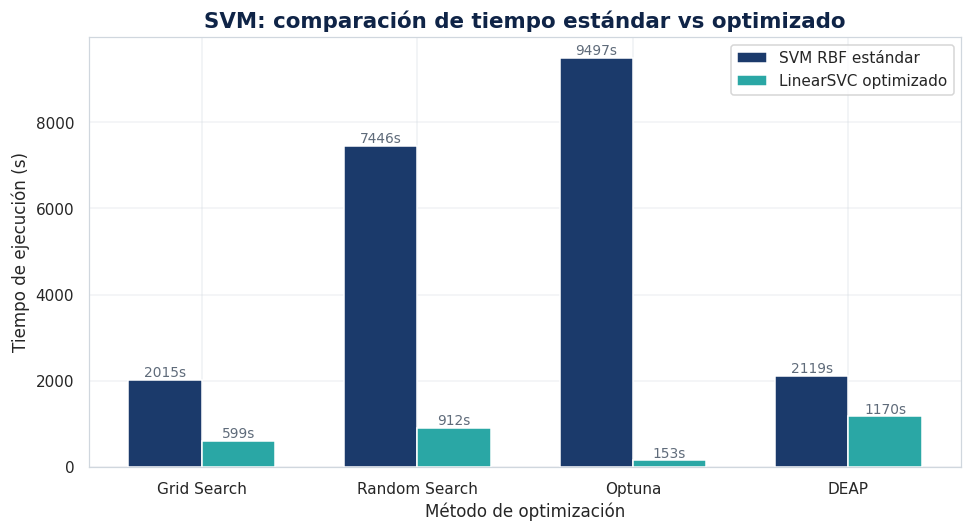

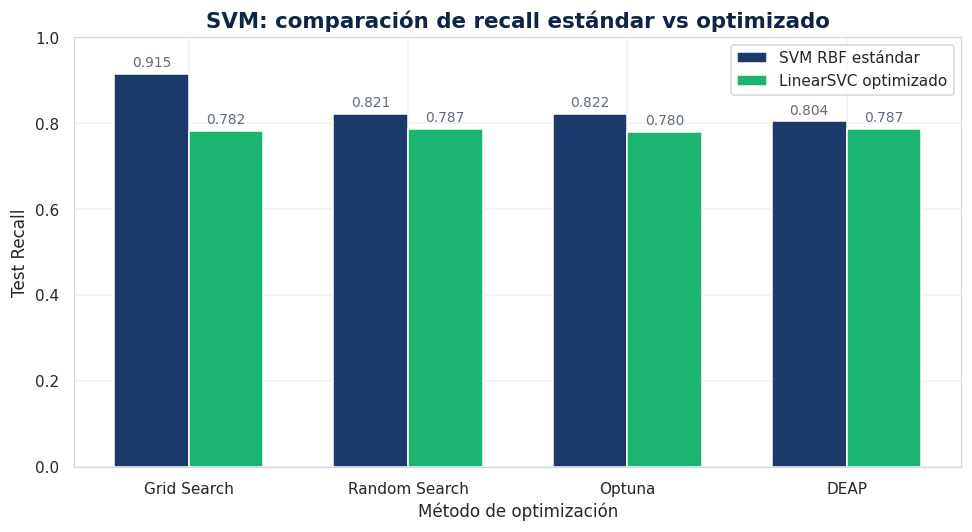

In [509]:
# ============================================================
# Gráfica: tiempo estándar vs optimizado - SVM
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

C_NAVY  = "#0F2447"
C_BLUE  = "#1B3A6B"
C_AQUA  = "#2AA7A5"
C_GREEN = "#1BB470"
C_GRAY  = "#5F6B7A"

plot_svm = comparacion_delta_svm.copy()

x = np.arange(len(plot_svm["Método"]))
width = 0.34

fig, ax = plt.subplots(figsize=(9, 5))

bars1 = ax.bar(
    x - width / 2,
    plot_svm["Tiempo estándar (s)"],
    width,
    label="SVM RBF estándar",
    color=C_BLUE
)

bars2 = ax.bar(
    x + width / 2,
    plot_svm["Tiempo optimizado (s)"],
    width,
    label="LinearSVC optimizado",
    color=C_AQUA
)

ax.set_title("SVM: comparación de tiempo estándar vs optimizado", fontweight="bold", color=C_NAVY)
ax.set_xlabel("Método de optimización")
ax.set_ylabel("Tiempo de ejecución (s)")
ax.set_xticks(x)
ax.set_xticklabels(plot_svm["Método"], rotation=0)
ax.grid(axis="y", alpha=0.3)
ax.legend(frameon=True)

for bars in [bars1, bars2]:
    for bar in bars:
        h = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            h,
            f"{h:.0f}s",
            ha="center",
            va="bottom",
            fontsize=9,
            color=C_GRAY
        )

plt.tight_layout()
plt.show()



# ============================================================
# Gráfica: recall estándar vs optimizado - SVM
# ============================================================

fig, ax = plt.subplots(figsize=(9, 5))

bars1 = ax.bar(
    x - width / 2,
    plot_svm["Recall estándar"],
    width,
    label="SVM RBF estándar",
    color=C_BLUE
)

bars2 = ax.bar(
    x + width / 2,
    plot_svm["Recall optimizado"],
    width,
    label="LinearSVC optimizado",
    color=C_GREEN
)

ax.set_title("SVM: comparación de recall estándar vs optimizado", fontweight="bold", color=C_NAVY)
ax.set_xlabel("Método de optimización")
ax.set_ylabel("Test Recall")
ax.set_xticks(x)
ax.set_xticklabels(plot_svm["Método"], rotation=0)
ax.set_ylim(0, 1)
ax.grid(axis="y", alpha=0.3)
ax.legend(frameon=True)

for bars in [bars1, bars2]:
    for bar in bars:
        h = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            h + 0.01,
            f"{h:.3f}",
            ha="center",
            va="bottom",
            fontsize=9,
            color=C_GRAY
        )

plt.tight_layout()
plt.show()

In [6]:
# ============================================================
# 1. Funciones auxiliares para tabla global de resultados
# ============================================================

import pandas as pd
import numpy as np
import os
from pathlib import Path

def first_existing_col(df, posibles):
    """
    Devuelve la primera columna existente dentro de una lista de posibles nombres.
    """
    for col in posibles:
        if col in df.columns:
            return col
    return None


def normalizar_balanceo(valor):
    """
    Normaliza nombres de técnicas de balanceo.
    """
    texto = str(valor).strip().lower()

    if texto in ["none", "sin balanceo", "sin_balanceo", "no balanceo", "no_balanceo"]:
        return "Sin Balanceo"
    if "smote" in texto:
        return "SMOTE"
    if "adasyn" in texto:
        return "ADASYN"
    if "class" in texto or "weight" in texto or "class_weight" in texto:
        return "Class Weight"
    if "scale_pos_weight" in texto:
        return "Scale Pos Weight"
    if texto in ["nan", "none", ""]:
        return "No especificado"

    return str(valor)


def normalizar_metodo(valor):
    """
    Normaliza nombres de métodos de optimización.
    """
    texto = str(valor).strip().lower()

    if "grid" in texto:
        return "Grid Search"
    if "random" in texto:
        return "Random Search"
    if "optuna" in texto:
        return "Optuna"
    if "deap" in texto:
        return "DEAP"
    if texto in ["nan", "none", "", "no especificado"]:
        return "No especificado"

    return str(valor)


def inferir_familia(modelo, tecnica=None):
    """
    Infere la familia del modelo a partir del nombre del modelo o técnica.
    """
    texto = f"{modelo} {tecnica}".lower()

    if "linear" in texto and "svc" in texto:
        return "LinearSVC"
    if "svm" in texto or "svc" in texto:
        return "SVM"
    if "xgboost" in texto or "xgb" in texto:
        return "XGBoost"
    if "random forest" in texto or "rf" in texto:
        return "Random Forest"
    if "decision" in texto or "tree" in texto and "xgboost" not in texto:
        return "Decision Tree"
    if "knn" in texto or "neighbor" in texto or "faiss" in texto or "kd-tree" in texto or "ball-tree" in texto:
        return "KNN"
    if "naïve" in texto or "naive" in texto or "gaussian" in texto or "gnb" in texto:
        return "Naïve Bayes"
    if "logistic" in texto and "l1" in texto:
        return "Regresión Logística L1"
    if "logistic" in texto and "l2" in texto:
        return "Regresión Logística L2"
    if "regresión logística" in texto or "logistic" in texto:
        return "Regresión Logística"

    return "No identificado"


def inferir_version(tecnica):
    """
    Infere si es estándar u optimizado computacionalmente.
    """
    texto = str(tecnica).lower()

    claves_opt = [
        "partial_fit",
        "hist",
        "early",
        "linear",
        "faiss",
        "kd-tree",
        "ball-tree",
        "gpu",
        "computacional"
    ]

    if any(k in texto for k in claves_opt):
        return "Optimizado"

    return "Estándar"


def normalizar_tabla_resultados(df, fuente="No especificada"):
    """
    Recibe una tabla de resultados de cualquier modelo y devuelve una tabla estándar.
    """
    df = df.copy()
    df.columns = df.columns.astype(str).str.strip()

    col_modelo = first_existing_col(df, ["Modelo", "Modelo base", "model", "Model"])
    col_tecnica = first_existing_col(df, ["Técnica computacional", "Tecnica computacional", "Técnica", "Tecnica"])
    col_metodo = first_existing_col(df, ["Método", "Metodo", "Method", "method"])
    col_balanceo = first_existing_col(df, ["Balanceo", "balanceo", "Balance", "balance_strategy"])

    col_cv_recall = first_existing_col(df, ["CV Recall", "Mejor recall CV", "Recall CV", "Best Recall CV"])
    col_std_recall = first_existing_col(df, ["Std Recall CV", "Std recall CV", "std_recall_cv"])

    col_acc = first_existing_col(df, ["Test Accuracy", "Accuracy", "test_accuracy"])
    col_prec = first_existing_col(df, ["Test Precision", "Precision", "test_precision"])
    col_recall = first_existing_col(df, ["Test Recall", "Recall", "test_recall"])
    col_f1 = first_existing_col(df, ["Test F1", "F1", "test_f1"])
    col_auc = first_existing_col(df, ["Test AUC", "Test ROC AUC", "ROC AUC", "AUC", "test_auc"])
    col_pr_auc = first_existing_col(df, ["Test PR AUC", "PR AUC", "Average Precision", "Test Average Precision", "AP"])

    col_tiempo = first_existing_col(df, ["Tiempo (s)", "Tiempo", "time", "Tiempo total"])
    col_eval = first_existing_col(df, ["Evaluaciones", "Iteraciones", "Trials", "n_iter"])
    col_params = first_existing_col(df, ["Best Params", "Mejores Hiperparámetros", "Mejores hiperparámetros", "best_params"])
    col_fuente = first_existing_col(df, ["Fuente", "Archivo", "source"])

    modelo = df[col_modelo] if col_modelo else "No especificado"
    tecnica = df[col_tecnica] if col_tecnica else "No especificado"
    metodo = df[col_metodo] if col_metodo else "No especificado"
    balanceo = df[col_balanceo] if col_balanceo else "No especificado"

    tabla = pd.DataFrame({
        "Familia": [
            inferir_familia(m, t)
            for m, t in zip(modelo, tecnica if isinstance(tecnica, pd.Series) else [tecnica] * len(df))
        ],
        "Modelo": modelo,
        "Versión": [
            inferir_version(t)
            for t in (tecnica if isinstance(tecnica, pd.Series) else [tecnica] * len(df))
        ],
        "Técnica computacional": tecnica,
        "Método": metodo,
        "Balanceo": balanceo,

        "CV Recall": df[col_cv_recall] if col_cv_recall else np.nan,
        "Std Recall CV": df[col_std_recall] if col_std_recall else np.nan,
        "Test Accuracy": df[col_acc] if col_acc else np.nan,
        "Test Precision": df[col_prec] if col_prec else np.nan,
        "Test Recall": df[col_recall] if col_recall else np.nan,
        "Test F1": df[col_f1] if col_f1 else np.nan,
        "Test AUC": df[col_auc] if col_auc else np.nan,
        "Test PR AUC": df[col_pr_auc] if col_pr_auc else np.nan,

        "Tiempo (s)": df[col_tiempo] if col_tiempo else np.nan,
        "Evaluaciones": df[col_eval] if col_eval else np.nan,
        "Best Params": df[col_params].astype(str) if col_params else np.nan,
        "Fuente": df[col_fuente] if col_fuente else fuente
    })

    tabla["Método"] = tabla["Método"].apply(normalizar_metodo)
    tabla["Balanceo"] = tabla["Balanceo"].apply(normalizar_balanceo)

    metric_cols = [
        "CV Recall", "Std Recall CV", "Test Accuracy", "Test Precision",
        "Test Recall", "Test F1", "Test AUC", "Test PR AUC",
        "Tiempo (s)", "Evaluaciones"
    ]

    for col in metric_cols:
        tabla[col] = pd.to_numeric(tabla[col], errors="coerce")

    return tabla

In [7]:
# ============================================================
# 2. Buscar tablas de resultados existentes en memoria
#    Corrección: evitar "dictionary changed size during iteration"
# ============================================================

tablas_resultados_detectadas = []

palabras_excluir = [
    "delta",
    "comparacion_delta",
    "std_vs_opt",
    "reporte",
    "best_by",
    "best_",
    "complejidad",
    "tradeoff",
    "plot",
    "matriz",
    "confusion"
]

# Hacer copia fija de globals para evitar RuntimeError
objetos_memoria = list(globals().items())

for nombre, obj in objetos_memoria:
    
    if isinstance(obj, pd.DataFrame):

        nombre_lower = nombre.lower()

        if any(p in nombre_lower for p in palabras_excluir):
            continue

        columnas_lower = " ".join([str(c).lower() for c in obj.columns])

        tiene_metricas = (
            "test recall" in columnas_lower or
            "recall" in columnas_lower or
            "test auc" in columnas_lower or
            "roc auc" in columnas_lower
        )

        tiene_modelo = (
            "modelo" in columnas_lower or
            "model" in columnas_lower or
            "método" in columnas_lower or
            "metodo" in columnas_lower
        )

        if tiene_metricas and tiene_modelo:
            tablas_resultados_detectadas.append((nombre, obj))
            print(f"Detectada: {nombre} | shape={obj.shape}")

print("\nTotal tablas detectadas:", len(tablas_resultados_detectadas))


Total tablas detectadas: 0


---

In [8]:
# ============================================================
# Librerías globales
# ============================================================

import os
import ast
import time
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

from sklearn.metrics import (
    recall_score, precision_score, f1_score,
    roc_auc_score, average_precision_score,
    roc_curve, precision_recall_curve, auc,
    confusion_matrix
)
from scipy import stats

warnings.filterwarnings("ignore")

# ============================================================
# Paleta corporativa
# ============================================================
C_NAVY  = "#0F2447"
C_BLUE  = "#1B3A6B"
C_AQUA  = "#2AA7A5"
C_GREEN = "#1BB470"
C_ORAN  = "#FF9806"
C_GRAY  = "#5F6B7A"
C_RED   = "#D94F3D"
C_LIGHT = "#E8EFF7"

PALETTE = [C_BLUE, C_AQUA, C_GREEN, C_ORAN, C_GRAY, C_RED,
           C_NAVY, "#9B59B6", "#E67E22", "#1ABC9C"]

plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor":   "white",
    "axes.edgecolor":   C_NAVY,
    "axes.labelcolor":  C_NAVY,
    "xtick.color":      C_NAVY,
    "ytick.color":      C_NAVY,
    "text.color":       C_NAVY,
    "font.family":      "DejaVu Sans",
    "axes.spines.top":  False,
    "axes.spines.right":False,
    "axes.grid":        True,
    "grid.color":       "#DEE5EF",
    "grid.linewidth":   0.6,
})

print("✓ Librerías y paleta cargadas correctamente.")

✓ Librerías y paleta cargadas correctamente.


In [9]:
# ============================================================
# Mapeos de normalización de columnas
# ============================================================

# Sinónimos de columnas → nombre canónico
COL_SYNONYMS = {
    # Recall CV
    "CV Recall":             "CV Recall",
    "Mejor recall CV":       "CV Recall",
    "cv_recall":             "CV Recall",
    # Std Recall
    "Std Recall CV":         "Std Recall CV",
    "std_recall":            "Std Recall CV",
    # Test metrics
    "Test Accuracy":         "Test Accuracy",
    "Test Precision":        "Test Precision",
    "Test Recall":           "Test Recall",
    "Test F1":               "Test F1",
    "Test AUC":              "Test ROC-AUC",
    "Test ROC AUC":          "Test ROC-AUC",
    "Test ROC-AUC":          "Test ROC-AUC",
    "ROC AUC":               "Test ROC-AUC",
    "AUC":                   "Test ROC-AUC",
    # PR-AUC
    "Test PR-AUC":           "Test PR-AUC",
    "Test PR AUC":           "Test PR-AUC",
    "PR-AUC":                "Test PR-AUC",
    "Average Precision":     "Test PR-AUC",
    # Tiempo
    "Tiempo (s)":            "Tiempo (s)",
    "Tiempo":                "Tiempo (s)",
    "Execution Time":        "Tiempo (s)",
    "tiempo_s":              "Tiempo (s)",
    # Evaluaciones
    "Evaluaciones":          "Evaluaciones",
    "Iteraciones":           "Evaluaciones",
    "n_iter":                "Evaluaciones",
    # Best Params
    "Best Params":           "Best Params",
    "Mejores Hiperparámetros": "Best Params",
    "best_params":           "Best Params",
    # Método
    "Método":                "Método",
    "Metodo":                "Método",
    "método":                "Método",
    # Balanceo
    "Balanceo":              "Balanceo",
    "balance_strategy":      "Balanceo",
    "Estrategia":            "Balanceo",
}

# Normalización de etiquetas de balanceo
BALANCEO_MAP = {
    "none":          "Sin balanceo",
    "None":          "Sin balanceo",
    "sin_balanceo":  "Sin balanceo",
    "Sin balanceo":  "Sin balanceo",
    "smote":         "SMOTE",
    "SMOTE":         "SMOTE",
    "adasyn":        "ADASYN",
    "ADASYN":        "ADASYN",
    "class_weight":  "Class Weight",
    "class weight":  "Class Weight",
    "Class Weight":  "Class Weight",
    "balanced":      "Class Weight",
    "scale_pos_weight": "scale_pos_weight",
}

# Normalización de métodos de búsqueda
METODO_MAP = {
    "grid":          "Grid Search",
    "Grid":          "Grid Search",
    "grid_search":   "Grid Search",
    "Grid Search":   "Grid Search",
    "GridSearchCV":  "Grid Search",
    "random":        "Random Search",
    "Random":        "Random Search",
    "random_search": "Random Search",
    "Random Search": "Random Search",
    "optuna":        "Optuna",
    "Optuna":        "Optuna",
    "deap":          "DEAP",
    "DEAP":          "DEAP",
    "genetico":      "DEAP",
    "Genético":      "DEAP",
}

# Columnas canónicas finales (en orden para la tabla global)
COLUMNAS_GLOBALES = [
    "Familia",
    "Modelo",
    "Versión",
    "Técnica Computacional",
    "Método",
    "Balanceo",
    "CV Recall",
    "Std Recall CV",
    "Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test ROC-AUC",
    "Test PR-AUC",
    "Tiempo (s)",
    "Evaluaciones",
    "Best Params",
    "Fuente",
]

print("✓ Mapeos de normalización definidos.")
print(f"  → {len(COLUMNAS_GLOBALES)} columnas canónicas definidas.")

✓ Mapeos de normalización definidos.
  → 18 columnas canónicas definidas.


In [10]:
# ============================================================
# Función principal: normalizar y unificar una tabla parcial
# ============================================================

def normalizar_tabla(df, familia="", fuente="", version="Estándar",
                     tecnica_computacional=""):
    """
    Normaliza una tabla de resultados parcial:
      - Renombra columnas con sinónimos.
      - Normaliza etiquetas de Balanceo y Método.
      - Añade columnas de metadatos (Familia, Versión, Fuente).
      - Añade columnas faltantes como NaN.

    Parámetros
    ----------
    df : pd.DataFrame
        Tabla de resultados de un sub-experimento.
    familia : str
        Nombre de la familia del modelo, p. ej. 'Random Forest'.
    fuente : str
        Identificador del origen del resultado (nombre de variable o archivo).
    version : str
        'Estándar' u 'Optimizado' (para comparaciones computacionales).
    tecnica_computacional : str
        Descripción de la técnica, p. ej. 'FAISS', 'hist + early stopping'.

    Retorna
    -------
    pd.DataFrame normalizado con columnas canónicas.
    """
    df = df.copy()

    # 1. Renombrar columnas con sinónimos
    rename_map = {col: COL_SYNONYMS[col] for col in df.columns if col in COL_SYNONYMS}
    df = df.rename(columns=rename_map)

    # 2. Normalizar columna Balanceo
    if "Balanceo" in df.columns:
        df["Balanceo"] = df["Balanceo"].map(
            lambda x: BALANCEO_MAP.get(str(x).strip(), str(x).strip())
            if pd.notna(x) else np.nan
        )

    # 3. Normalizar columna Método
    if "Método" in df.columns:
        df["Método"] = df["Método"].map(
            lambda x: METODO_MAP.get(str(x).strip(), str(x).strip())
            if pd.notna(x) else np.nan
        )

    # 4. Añadir metadatos
    if familia and "Familia" not in df.columns:
        df["Familia"] = familia
    if fuente and "Fuente" not in df.columns:
        df["Fuente"] = fuente
    if "Versión" not in df.columns:
        df["Versión"] = version
    if "Técnica Computacional" not in df.columns:
        df["Técnica Computacional"] = tecnica_computacional if tecnica_computacional else np.nan

    # 5. Añadir columnas faltantes como NaN
    for col in COLUMNAS_GLOBALES:
        if col not in df.columns:
            df[col] = np.nan

    # 6. Seleccionar y reordenar columnas canónicas
    df = df[COLUMNAS_GLOBALES].copy()

    # 7. Forzar tipos numéricos donde corresponde
    numeric_cols = [
        "CV Recall", "Std Recall CV", "Test Accuracy", "Test Precision",
        "Test Recall", "Test F1", "Test ROC-AUC", "Test PR-AUC",
        "Tiempo (s)", "Evaluaciones"
    ]
    for col in numeric_cols:
        df[col] = pd.to_numeric(df[col], errors="coerce")

    return df


def unir_tablas(lista_dfs):
    """
    Une una lista de DataFrames normalizados en una sola tabla global,
    elimina duplicados exactos y ordena por Test Recall descendente.
    """
    df_global = pd.concat(lista_dfs, ignore_index=True)
    df_global = df_global.drop_duplicates(
        subset=["Familia", "Modelo", "Método", "Balanceo", "Versión"],
        keep="first"
    )
    df_global = df_global.sort_values("Test Recall", ascending=False).reset_index(drop=True)
    return df_global


print("✓ Funciones de normalización definidas.")

✓ Funciones de normalización definidas.


In [12]:
# ============================================================
# Diagnóstico de rutas y archivos disponibles
# ============================================================

from pathlib import Path
import os

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

print("Directorio actual:")
print(Path.cwd())

print("\nBASE_DIR existe:", BASE_DIR.exists())
print(BASE_DIR)

print("\nCarpetas principales:")
for p in BASE_DIR.iterdir():
    if p.is_dir() and (
        "checkpoint" in p.name.lower()
        or "resultado" in p.name.lower()
        or "modelo" in p.name.lower()
        or "optimiz" in p.name.lower()
    ):
        print("-", p.name)

Directorio actual:
c:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML

BASE_DIR existe: True
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML

Carpetas principales:
- checkpoints_decision_tree
- checkpoints_linear_svc
- checkpoints_logistic_l1
- checkpoints_logistic_l2
- checkpoints_rf
- checkpoints_svm
- resultados_benchmark
- resultados_globales
- resultados_paper


In [13]:
# ============================================================
# Cargar tablas resumen guardadas desde archivos
# ============================================================

import pandas as pd
import joblib
import pickle
from pathlib import Path

BASE_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML")

rutas_busqueda = [
    BASE_DIR,
    BASE_DIR / "checkpoints_rf",
    BASE_DIR / "checkpoints_svm",
    BASE_DIR / "checkpoints_linear_svc",
    BASE_DIR / "svm_optuna",
    BASE_DIR / "Rf_deap",
    BASE_DIR / "resultados_benchmark",
    BASE_DIR / "machineentrega2" / "Modelos_Optimizados_Computacional",
    BASE_DIR / "machineentrega2" / "Modelos_Optimizados_No_Computacional",
]

tablas_cargadas = {}

for ruta in rutas_busqueda:
    if not ruta.exists():
        continue

    for archivo in ruta.rglob("*"):
        nombre = archivo.name.lower()

        if archivo.suffix.lower() == ".csv" and (
            "summary" in nombre
            or "tabla" in nombre
            or "comparativa" in nombre
            or "resultados" in nombre
        ):
            try:
                df = pd.read_csv(archivo)
                tablas_cargadas[archivo.stem] = df
                globals()[archivo.stem] = df
                print(f"✓ CSV cargado: {archivo.stem} | {df.shape}")
            except Exception as e:
                print(f"⚠ No se pudo cargar CSV: {archivo.name} | {repr(e)}")

        elif archivo.suffix.lower() in [".pkl", ".joblib"] and (
            "summary" in nombre
            or "resultados" in nombre
            or "objects" in nombre
            or "result" in nombre
        ):
            try:
                obj = joblib.load(archivo)
                tablas_cargadas[archivo.stem] = obj
                globals()[archivo.stem] = obj
                print(f"✓ Objeto cargado: {archivo.stem} | tipo={type(obj)}")
            except Exception as e:
                print(f"⚠ No se pudo cargar objeto: {archivo.name} | {repr(e)}")

print("\nTotal objetos/tablas cargadas:", len(tablas_cargadas))

✓ CSV cargado: tabla_comparativa_xgboost_focal | (2, 16)
✓ CSV cargado: tabla_comparativa_xgboost_focal_limpia | (2, 12)
✓ CSV cargado: tabla_gnb_partial_fit_reconstruida | (64, 10)
✓ CSV cargado: tabla_xgboost_focal_comparativa | (2, 19)
✓ Objeto cargado: best_result_linear_svc | tipo=<class 'dict'>
✓ Objeto cargado: best_result_linear_svc_grid | tipo=<class 'dict'>
✓ Objeto cargado: objects_linear_svc | tipo=<class 'list'>
✓ Objeto cargado: objects_linear_svc_grid | tipo=<class 'list'>
✓ CSV cargado: summary_linear_svc | (10, 12)
✓ CSV cargado: summary_linear_svc_grid | (10, 16)
✓ Objeto cargado: best_result_logistic_l1 | tipo=<class 'dict'>
✓ Objeto cargado: objects_logistic_l1 | tipo=<class 'list'>
✓ CSV cargado: summary_logistic_l1 | (10, 16)
✓ Objeto cargado: best_result_logistic_l1 | tipo=<class 'dict'>
✓ Objeto cargado: best_result_logistic_l2 | tipo=<class 'dict'>
✓ Objeto cargado: objects_logistic_l1 | tipo=<class 'list'>
✓ Objeto cargado: objects_logistic_l2 | tipo=<class 'l

In [14]:
# ============================================================
# Verificar variables resumen disponibles después de cargar
# ============================================================

for nombre, obj in globals().items():
    if any(p in nombre.lower() for p in ["summary", "tabla", "resultados", "knn", "xgb", "svm", "rf", "logreg", "gnb", "dt"]):
        if isinstance(obj, pd.DataFrame):
            print(f"✓ {nombre}: DataFrame {obj.shape}")
        elif isinstance(obj, list):
            print(f"✓ {nombre}: lista con {len(obj)} elementos")
        elif isinstance(obj, dict):
            print(f"✓ {nombre}: dict con {len(obj)} claves")

✓ tablas_resultados_detectadas: lista con 0 elementos
✓ tablas_parciales: lista con 0 elementos
✓ tablas_cargadas: dict con 62 claves
✓ tabla_comparativa_xgboost_focal: DataFrame (2, 16)
✓ tabla_comparativa_xgboost_focal_limpia: DataFrame (2, 12)
✓ tabla_gnb_partial_fit_reconstruida: DataFrame (64, 10)
✓ tabla_xgboost_focal_comparativa: DataFrame (2, 19)
✓ summary_linear_svc: DataFrame (10, 12)
✓ summary_linear_svc_grid: DataFrame (10, 16)
✓ summary_logistic_l1: DataFrame (10, 16)
✓ summary_logistic_l2: DataFrame (10, 16)
✓ summary_random_forest: DataFrame (4, 16)
✓ summary_random_forest_grid: DataFrame (4, 16)
✓ best_result_svm_deap_gpu_cpu_safe: dict con 18 claves
✓ best_result_svm_random_gpu_refinado_cpu_safe: dict con 16 claves
✓ objects_svm_deap_gpu_cpu_safe: lista con 1 elementos
✓ objects_svm_random_gpu_refinado_cpu_safe: lista con 4 elementos
✓ summary_svm_deap_gpu_cpu_safe: DataFrame (1, 13)
✓ summary_svm_random_gpu_refinado_cpu_safe: DataFrame (4, 12)
✓ best_result_svm: dict 

In [15]:
# ============================================================
# Ensamble de la tabla global de todos los modelos
# ============================================================
# INSTRUCCIÓN: Descomenta cada bloque según las variables que
# existan en tu entorno. Usa "globals().get()" para cargar de
# forma segura sin lanzar NameError.
# ============================================================

tablas_parciales = []

# ----------------------------------------------------------
# RANDOM FOREST
# ----------------------------------------------------------
for var, metodo, balance in [
    ("rf_grid_summary",      "Grid Search",   None),
    ("rf_random_summary",    "Random Search", None),
    ("rf_optuna_summary",    "Optuna",        None),
    ("rf_deap_summary",      "DEAP",          None),
]:
    df_ = globals().get(var)
    if df_ is not None and isinstance(df_, pd.DataFrame) and not df_.empty:
        t_ = normalizar_tabla(
            df_, familia="Random Forest",
            fuente=var, version="Estándar"
        )
        tablas_parciales.append(t_)
        print(f"  ✓ {var}: {len(t_)} filas")
    else:
        print(f"  ⚠ {var} no encontrado — omitido.")

# ----------------------------------------------------------
# REGRESIÓN LOGÍSTICA L2
# ----------------------------------------------------------
for var in ["logreg_l2_grid_summary", "logreg_l2_random_summary",
            "logreg_l2_optuna_summary", "logreg_l2_deap_summary"]:
    df_ = globals().get(var)
    if df_ is not None and isinstance(df_, pd.DataFrame) and not df_.empty:
        t_ = normalizar_tabla(df_, familia="Regresión Logística L2",
                              fuente=var, version="Estándar")
        tablas_parciales.append(t_)
        print(f"  ✓ {var}: {len(t_)} filas")
    else:
        print(f"  ⚠ {var} no encontrado — omitido.")

# ----------------------------------------------------------
# REGRESIÓN LOGÍSTICA L1
# ----------------------------------------------------------
for var in ["logreg_l1_grid_summary", "logreg_l1_random_summary",
            "logreg_l1_optuna_summary", "logreg_l1_deap_summary",
            "logreg_l1_summary"]:
    df_ = globals().get(var)
    if df_ is not None and isinstance(df_, pd.DataFrame) and not df_.empty:
        t_ = normalizar_tabla(df_, familia="Regresión Logística L1",
                              fuente=var, version="Estándar")
        tablas_parciales.append(t_)
        print(f"  ✓ {var}: {len(t_)} filas")
    else:
        print(f"  ⚠ {var} no encontrado — omitido.")

# ----------------------------------------------------------
# NAÏVE BAYES
# ----------------------------------------------------------
for var in ["gnb_summary", "gnb_grid_summary", "gnb_random_summary",
            "gnb_optuna_summary", "gnb_deap_summary"]:
    df_ = globals().get(var)
    if df_ is not None and isinstance(df_, pd.DataFrame) and not df_.empty:
        t_ = normalizar_tabla(df_, familia="Naïve Bayes",
                              fuente=var, version="Estándar")
        tablas_parciales.append(t_)
        print(f"  ✓ {var}: {len(t_)} filas")
    else:
        print(f"  ⚠ {var} no encontrado — omitido.")

# Naïve Bayes optimizado (partial_fit)
for var in ["gnb_partial_fit_summary"]:
    df_ = globals().get(var)
    if df_ is not None and isinstance(df_, pd.DataFrame) and not df_.empty:
        t_ = normalizar_tabla(df_, familia="Naïve Bayes",
                              fuente=var, version="Optimizado",
                              tecnica_computacional="partial_fit")
        tablas_parciales.append(t_)
        print(f"  ✓ {var}: {len(t_)} filas")

# ----------------------------------------------------------
# KNN
# ----------------------------------------------------------
for var, ver, tec in [
    ("knn_summary",       "Estándar",    ""),
    ("knn_kdtree_summary","Optimizado",  "KD-Tree"),
    ("knn_balltree_summary","Optimizado","Ball-Tree"),
    ("knn_faiss_summary", "Optimizado",  "FAISS"),
]:
    df_ = globals().get(var)
    if df_ is not None and isinstance(df_, pd.DataFrame) and not df_.empty:
        t_ = normalizar_tabla(df_, familia="KNN",
                              fuente=var, version=ver,
                              tecnica_computacional=tec)
        tablas_parciales.append(t_)
        print(f"  ✓ {var}: {len(t_)} filas")
    else:
        print(f"  ⚠ {var} no encontrado — omitido.")

# ----------------------------------------------------------
# DECISION TREE
# ----------------------------------------------------------
for var in ["dt_summary", "dt_grid_summary", "dt_random_summary",
            "dt_optuna_summary", "dt_deap_summary"]:
    df_ = globals().get(var)
    if df_ is not None and isinstance(df_, pd.DataFrame) and not df_.empty:
        t_ = normalizar_tabla(df_, familia="Decision Tree",
                              fuente=var, version="Estándar")
        tablas_parciales.append(t_)
        print(f"  ✓ {var}: {len(t_)} filas")
    else:
        print(f"  ⚠ {var} no encontrado — omitido.")

# ----------------------------------------------------------
# XGBOOST
# ----------------------------------------------------------
for var in ["xgb_summary", "xgb_grid_summary", "xgb_random_summary",
            "xgb_optuna_summary", "xgb_deap_summary"]:
    df_ = globals().get(var)
    if df_ is not None and isinstance(df_, pd.DataFrame) and not df_.empty:
        t_ = normalizar_tabla(df_, familia="XGBoost",
                              fuente=var, version="Estándar")
        tablas_parciales.append(t_)
        print(f"  ✓ {var}: {len(t_)} filas")
    else:
        print(f"  ⚠ {var} no encontrado — omitido.")

# XGBoost optimizado (hist + early stopping)
df_xgb_hist = globals().get("xgb_hist_16")
if df_xgb_hist is not None and isinstance(df_xgb_hist, pd.DataFrame) and not df_xgb_hist.empty:
    t_ = normalizar_tabla(
        df_xgb_hist, familia="XGBoost",
        fuente="xgb_hist_16", version="Optimizado",
        tecnica_computacional="hist + early stopping"
    )
    tablas_parciales.append(t_)
    print(f"  ✓ xgb_hist_16: {len(t_)} filas")
else:
    print("  ⚠ xgb_hist_16 no encontrado — omitido.")

# XGBoost-Focal (modelo del paper)
for var in ["paper_xgb_summary", "focal_xgb_summary"]:
    df_ = globals().get(var)
    if df_ is not None and isinstance(df_, pd.DataFrame) and not df_.empty:
        t_ = normalizar_tabla(df_, familia="XGBoost-Focal",
                              fuente=var, version="Optimizado",
                              tecnica_computacional="Focal Loss + Ψγ")
        tablas_parciales.append(t_)
        print(f"  ✓ {var}: {len(t_)} filas")

# ----------------------------------------------------------
# SVM RBF
# ----------------------------------------------------------
for var in ["svm_summary", "svm_grid_summary", "svm_random_summary",
            "svm_optuna_summary", "svm_deap_summary"]:
    df_ = globals().get(var)
    if df_ is not None and isinstance(df_, pd.DataFrame) and not df_.empty:
        t_ = normalizar_tabla(df_, familia="SVM RBF",
                              fuente=var, version="Estándar")
        tablas_parciales.append(t_)
        print(f"  ✓ {var}: {len(t_)} filas")
    else:
        print(f"  ⚠ {var} no encontrado — omitido.")

# ----------------------------------------------------------
# LINEARSVC
# ----------------------------------------------------------
for var in ["summary_linear_svc", "linear_svc_summary",
            "linearsvc_grid_summary", "linearsvc_random_summary",
            "linearsvc_optuna_summary", "linearsvc_deap_summary"]:
    df_ = globals().get(var)
    if df_ is not None and isinstance(df_, pd.DataFrame) and not df_.empty:
        t_ = normalizar_tabla(df_, familia="LinearSVC",
                              fuente=var, version="Optimizado",
                              tecnica_computacional="LinearSVC")
        tablas_parciales.append(t_)
        print(f"  ✓ {var}: {len(t_)} filas")
    else:
        print(f"  ⚠ {var} no encontrado — omitido.")

# ----------------------------------------------------------
# CONSOLIDAR
# ----------------------------------------------------------
if tablas_parciales:
    df_global = unir_tablas(tablas_parciales)
    print(f"\n✓ Tabla global consolidada: {len(df_global)} filas × {len(df_global.columns)} columnas.")
else:
    print("\n⚠ No se encontraron tablas parciales. Crea df_global manualmente (ver celda siguiente).")
    df_global = pd.DataFrame(columns=COLUMNAS_GLOBALES)

  ⚠ rf_grid_summary no encontrado — omitido.
  ⚠ rf_random_summary no encontrado — omitido.
  ⚠ rf_optuna_summary no encontrado — omitido.
  ⚠ rf_deap_summary no encontrado — omitido.
  ⚠ logreg_l2_grid_summary no encontrado — omitido.
  ⚠ logreg_l2_random_summary no encontrado — omitido.
  ⚠ logreg_l2_optuna_summary no encontrado — omitido.
  ⚠ logreg_l2_deap_summary no encontrado — omitido.
  ⚠ logreg_l1_grid_summary no encontrado — omitido.
  ⚠ logreg_l1_random_summary no encontrado — omitido.
  ⚠ logreg_l1_optuna_summary no encontrado — omitido.
  ⚠ logreg_l1_deap_summary no encontrado — omitido.
  ⚠ logreg_l1_summary no encontrado — omitido.
  ⚠ gnb_summary no encontrado — omitido.
  ⚠ gnb_grid_summary no encontrado — omitido.
  ⚠ gnb_random_summary no encontrado — omitido.
  ⚠ gnb_optuna_summary no encontrado — omitido.
  ⚠ gnb_deap_summary no encontrado — omitido.
  ⚠ knn_summary no encontrado — omitido.
  ⚠ knn_kdtree_summary no encontrado — omitido.
  ⚠ knn_balltree_summary no

In [527]:
# ============================================================
# Limpieza final de la tabla global consolidada
# 1) Eliminar SVM Random Search con recalls inflados no considerados
# 2) Completar columna Modelo cuando aparece vacía o como "—"
# 3) Reordenar por Test Recall descendente
# ============================================================

import numpy as np
import pandas as pd

df_global_limpio = df_global.copy()

# ------------------------------------------------------------
# 1. Normalizar texto base
# ------------------------------------------------------------

for col in ["Familia", "Modelo", "Versión", "Método", "Balanceo", "Técnica computacional", "Fuente"]:
    if col in df_global_limpio.columns:
        df_global_limpio[col] = df_global_limpio[col].astype(str).str.strip()

# ------------------------------------------------------------
# 2. Eliminar los SVM Random Search con recall inflado
#    Estos fueron los resultados iniciales que NO se conservaron,
#    porque fueron reemplazados por la corrida refinada en GPU.
# ------------------------------------------------------------

mask_svm_random_inflado = (
    df_global_limpio["Familia"].str.contains("SVM", case=False, na=False)
    & df_global_limpio["Modelo"].str.contains("SVM", case=False, na=False)
    & df_global_limpio["Método"].str.contains("Random Search", case=False, na=False)
    & (pd.to_numeric(df_global_limpio["Test Recall"], errors="coerce") > 0.95)
)

print("Filas SVM Random Search infladas eliminadas:")
#display(df_global_limpio.loc[mask_svm_random_inflado])

df_global_limpio = df_global_limpio.loc[~mask_svm_random_inflado].copy()

# ------------------------------------------------------------
# 3. Completar columna Modelo cuando falte
# ------------------------------------------------------------

valores_invalidos_modelo = ["", "—", "-", "nan", "None", "No especificado"]

mask_modelo_faltante = (
    df_global_limpio["Modelo"].isna()
    | df_global_limpio["Modelo"].astype(str).str.strip().isin(valores_invalidos_modelo)
)

df_global_limpio.loc[mask_modelo_faltante, "Modelo"] = df_global_limpio.loc[
    mask_modelo_faltante, "Familia"
]

# ------------------------------------------------------------
# 4. Completar técnica computacional si está vacía
# ------------------------------------------------------------

if "Técnica computacional" in df_global_limpio.columns:
    mask_tec_faltante = (
        df_global_limpio["Técnica computacional"].isna()
        | df_global_limpio["Técnica computacional"].astype(str).str.strip().isin(
            ["", "—", "-", "nan", "None", "No especificado"]
        )
    )

    df_global_limpio.loc[
        mask_tec_faltante & (df_global_limpio["Versión"] == "Estándar"),
        "Técnica computacional"
    ] = "fit tradicional"

    df_global_limpio.loc[
        mask_tec_faltante & (df_global_limpio["Versión"] == "Optimizado"),
        "Técnica computacional"
    ] = df_global_limpio.loc[
        mask_tec_faltante & (df_global_limpio["Versión"] == "Optimizado"),
        "Modelo"
    ]

# ------------------------------------------------------------
# 5. Corregir etiquetas de balanceo
# ------------------------------------------------------------

map_balanceo_final = {
    "none": "Sin Balanceo",
    "None": "Sin Balanceo",
    "sin balanceo": "Sin Balanceo",
    "Sin balanceo": "Sin Balanceo",
    "smote": "SMOTE",
    "adasyn": "ADASYN",
    "class_weight": "Class Weight",
    "Class weight": "Class Weight",
    "class weight": "Class Weight"
}

df_global_limpio["Balanceo"] = (
    df_global_limpio["Balanceo"]
    .replace(map_balanceo_final)
)

# ------------------------------------------------------------
# 6. Convertir métricas a numérico
# ------------------------------------------------------------

metric_cols_global = [
    "CV Recall",
    "Std Recall CV",
    "Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test ROC-AUC",
    "Test AUC",
    "Test PR-AUC",
    "Tiempo (s)",
    "Evaluaciones"
]

for col in metric_cols_global:
    if col in df_global_limpio.columns:
        df_global_limpio[col] = pd.to_numeric(df_global_limpio[col], errors="coerce")

# ------------------------------------------------------------
# 7. Ordenar por métrica principal
# ------------------------------------------------------------

col_auc_orden = "Test ROC-AUC" if "Test ROC-AUC" in df_global_limpio.columns else "Test AUC"

df_global_limpio = (
    df_global_limpio
    .sort_values(
        by=["Test Recall", "Test F1", col_auc_orden, "Tiempo (s)"],
        ascending=[False, False, False, True],
        na_position="last"
    )
    .reset_index(drop=True)
)

print(f"Tabla global limpia: {len(df_global_limpio)} combinaciones finales")
#display(df_global_limpio.head(20).round(4))

Filas SVM Random Search infladas eliminadas:
Tabla global limpia: 88 combinaciones finales


In [548]:
# ============================================================
# Agregar SVM Random Search GPU refinado a la tabla global limpia
# ============================================================

import numpy as np
import pandas as pd

if "svm_random_gpu_refined_summary" in globals():

    temp_svm_random_gpu = svm_random_gpu_refined_summary.copy()

    # --------------------------------------------------------
    # Completar columnas de identificación
    # --------------------------------------------------------
    temp_svm_random_gpu["Familia"] = "SVM RBF"
    temp_svm_random_gpu["Modelo"] = "SVM RBF GPU"
    temp_svm_random_gpu["Versión"] = "Estándar"
    temp_svm_random_gpu["Técnica computacional"] = "GPU refinado"
    temp_svm_random_gpu["Método"] = "Random Search GPU"

    # --------------------------------------------------------
    # Normalizar balanceo
    # --------------------------------------------------------
    temp_svm_random_gpu["Balanceo"] = (
        temp_svm_random_gpu["Balanceo"]
        .replace({
            "class_weight": "Class Weight",
            "adasyn": "ADASYN",
            "smote": "SMOTE",
            "none": "Sin Balanceo"
        })
    )

    # --------------------------------------------------------
    # Unificar nombre de AUC
    # --------------------------------------------------------
    if "Test AUC" in temp_svm_random_gpu.columns and "Test ROC-AUC" not in temp_svm_random_gpu.columns:
        temp_svm_random_gpu["Test ROC-AUC"] = temp_svm_random_gpu["Test AUC"]

    # --------------------------------------------------------
    # Asegurar que tenga las mismas columnas de df_global_limpio
    # --------------------------------------------------------
    for col in df_global_limpio.columns:
        if col not in temp_svm_random_gpu.columns:
            temp_svm_random_gpu[col] = np.nan

    temp_svm_random_gpu = temp_svm_random_gpu[df_global_limpio.columns]

    # --------------------------------------------------------
    # Concatenar
    # --------------------------------------------------------
    df_global_limpio = pd.concat(
        [df_global_limpio, temp_svm_random_gpu],
        ignore_index=True
    )

    # --------------------------------------------------------
    # Eliminar duplicados y reordenar
    # --------------------------------------------------------
    df_global_limpio = (
        df_global_limpio
        .drop_duplicates()
        .sort_values(
            by=["Test Recall", "Test F1", "Test ROC-AUC", "Tiempo (s)"],
            ascending=[False, False, False, True],
            na_position="last"
        )
        .reset_index(drop=True)
    )

    # Sobrescribir df_global para que la visualización use la tabla corregida
    df_global = df_global_limpio.copy()

    print("SVM Random Search GPU refinado agregado correctamente a df_global_limpio.")
    display(
        df_global_limpio[
            df_global_limpio["Modelo"].astype(str).str.contains("SVM RBF GPU", case=False, na=False)
        ].round(4)
    )

else:
    print("No existe la variable svm_random_gpu_refined_summary en memoria.")

SVM Random Search GPU refinado agregado correctamente a df_global_limpio.


,Familia,Modelo,Versión,Técnica Computacional,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test ROC-AUC,Test PR-AUC,Tiempo (s),Evaluaciones,Best Params,Fuente
0,SVM RBF,SVM RBF GPU,Estándar,NaN,DEAP GPU,Class Weight,0.9175,NaN,0.5817,0.2388,0.9150,0.3787,0.7668,NaN,2015.1198,34,"{'C': 1, 'gamma': 'scale'}",SVM RBF GPU | DEAP GPU | class_weight | fuente...
4,SVM RBF,SVM RBF GPU,Estándar,NaN,Random Search GPU,Class Weight,0.8069,NaN,0.7111,0.2999,0.8041,0.4368,0.8231,NaN,2119.0236,20,"{'model__gamma': 'scale', 'model__C': 5}",NaN
5,SVM RBF,SVM RBF GPU,Estándar,NaN,Random Search GPU,ADASYN,0.7930,NaN,0.7110,0.2984,0.7952,0.4339,0.8180,NaN,4175.5411,20,"{'model__gamma': 'scale', 'model__C': 1}",NaN
38,SVM RBF,SVM RBF GPU,Estándar,NaN,Random Search GPU,SMOTE,0.7730,NaN,0.7284,0.3098,0.7731,0.4424,0.8203,NaN,3848.6826,20,"{'model__gamma': 'scale', 'model__C': 1}",NaN
91,SVM RBF,SVM RBF GPU,Estándar,NaN,Random Search GPU,Sin Balanceo,0.1027,NaN,0.8649,0.5855,0.1041,0.1768,0.7004,NaN,4432.7159,20,"{'model__gamma': 0.1, 'model__C': 1}",NaN


In [552]:
# ============================================================
# Crear fila SVM DEAP GPU desde MODELOS_ESTADISTICOS
# ============================================================

nombre_svm_deap_gpu = None

for nombre in MODELOS_ESTADISTICOS.keys():
    if (
        "svm" in nombre.lower()
        and "deap" in nombre.lower()
        and "gpu" in nombre.lower()
        and "class" in nombre.lower()
    ):
        nombre_svm_deap_gpu = nombre
        break

print("Modelo detectado:", nombre_svm_deap_gpu)

if nombre_svm_deap_gpu is not None:
    datos = MODELOS_ESTADISTICOS[nombre_svm_deap_gpu]
    res = datos.get("resultado", {})

    fila_svm_deap_gpu = pd.DataFrame([{
        "Familia": "SVM RBF",
        "Modelo": "SVM RBF GPU",
        "Versión": "Estándar",
        "Técnica computacional": "GPU",
        "Método": "DEAP GPU",
        "Balanceo": "Class Weight",

        "CV Recall": res.get("CV Recall", 0.9175),
        "Std Recall CV": res.get("Std Recall CV", np.nan),
        "Test Accuracy": res.get("Test Accuracy", 0.5817),
        "Test Precision": res.get("Test Precision", 0.2388),
        "Test Recall": res.get("Test Recall", 0.9150),
        "Test F1": res.get("Test F1", 0.3787),
        "Test ROC-AUC": res.get("Test AUC", 0.7668),
        "Test PR-AUC": res.get("Test PR-AUC", np.nan),

        "Tiempo (s)": res.get("Tiempo (s)", 2015.1198),
        "Evaluaciones": res.get("Evaluaciones", 34),
        "Best Params": str(res.get("Best Params", {"C": 1, "gamma": "scale"})),
        "Fuente": nombre_svm_deap_gpu
    }])

    for col in df_global_limpio.columns:
        if col not in fila_svm_deap_gpu.columns:
            fila_svm_deap_gpu[col] = np.nan

    fila_svm_deap_gpu = fila_svm_deap_gpu[df_global_limpio.columns]

    df_global_limpio = pd.concat(
        [df_global_limpio, fila_svm_deap_gpu],
        ignore_index=True
    )

    df_global_limpio = (
        df_global_limpio
        .drop_duplicates()
        .sort_values(
            by=["Test Recall", "Test F1", "Test ROC-AUC", "Tiempo (s)"],
            ascending=[False, False, False, True],
            na_position="last"
        )
        .reset_index(drop=True)
    )

    df_global = df_global_limpio.copy()

   # display(df_global_limpio.head(15).round(4))

else:
    print("No se encontró SVM DEAP GPU dentro de MODELOS_ESTADISTICOS.")

Modelo detectado: SVM RBF GPU | DEAP GPU | class_weight | fuente=deap_results_svm_gpu_0


In [574]:
# ============================================================
# Diagnóstico de knn_opt_final
# ============================================================

print("Columnas de knn_opt_final:")
print(knn_opt_final.columns.tolist())

print("\nValores únicos en columnas relevantes:")

for col in ["Modelo", "Técnica computacional", "Método", "Balanceo", "Fuente"]:
    if col in knn_opt_final.columns:
        print(f"\n{col}:")
        print(knn_opt_final[col].dropna().astype(str).unique())

Columnas de knn_opt_final:
['Modelo', 'Técnica computacional', 'Método', 'Balanceo', 'CV Recall', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1', 'Test AUC', 'Tiempo (s)', 'Evaluaciones', 'Best Params', 'Fuente']

Valores únicos en columnas relevantes:

Modelo:
['KNN']

Técnica computacional:
['KNN estándar' 'Ball-Tree' 'KD-Tree']

Método:
['DEAP' 'Grid Search' 'Optuna' 'Random Search']

Balanceo:
['Sin Balanceo' 'SMOTE' 'ADASYN' 'Class Weight']

Fuente:
['deap_KNN_resultados.pkl' 'deap_KNN_ball_tree_resultados.pkl'
 'deap_KNN_kd_tree_resultados.pkl' 'grid_KNN_resultados.pkl'
 'grid_KNN_ball_tree_resultados.pkl' 'grid_KNN_kd_tree_resultados.pkl'
 'optuna_KNN_resultados.pkl' 'optuna_KNN_ball_tree_resultados.pkl'
 'optuna_KNN_kd_tree_resultados.pkl' 'random_KNN_resultados.pkl'
 'random_KNN_ball_tree_resultados.pkl' 'random_KNN_kd_tree_resultados.pkl']


In [583]:
# ============================================================
# Reconstruir KNN correctamente en df_global_limpio
# Usando knn_opt_final como fuente oficial
# ============================================================

import numpy as np
import pandas as pd

# ------------------------------------------------------------
# 1. Eliminar filas KNN actuales, que quedaron mal clasificadas
# ------------------------------------------------------------

mask_knn_actual = df_global_limpio["Familia"].astype(str).str.contains(
    "KNN", case=False, na=False
)

print("Filas KNN eliminadas:", mask_knn_actual.sum())

df_global_limpio = df_global_limpio.loc[~mask_knn_actual].copy()

# ------------------------------------------------------------
# 2. Tomar nuevamente la tabla consolidada original de KNN
# ------------------------------------------------------------

df_knn_add = knn_opt_final.copy()

# ------------------------------------------------------------
# 3. Normalizar nombres de columnas
# ------------------------------------------------------------

if "Test AUC" in df_knn_add.columns and "Test ROC-AUC" not in df_knn_add.columns:
    df_knn_add["Test ROC-AUC"] = df_knn_add["Test AUC"]

# ------------------------------------------------------------
# 4. Mantener familia y versión
# ------------------------------------------------------------

df_knn_add["Familia"] = "KNN"
df_knn_add["Versión"] = "Optimizado"

# ------------------------------------------------------------
# 5. Corregir técnica computacional
# ------------------------------------------------------------

# Si knn_opt_final ya trae la columna, se conserva.
# Si no la trae, se intenta reconstruir desde Modelo/Fuente.
if "Técnica computacional" not in df_knn_add.columns:
    df_knn_add["Técnica computacional"] = "KNN estándar"

def limpiar_tecnica_knn(valor):
    v = str(valor).lower()

    if "faiss" in v:
        return "FAISS"
    if "ball" in v:
        return "Ball-Tree"
    if "kd" in v or "kdtree" in v or "kd-tree" in v:
        return "KD-Tree"
    if "estándar" in v or "estandar" in v or "standard" in v:
        return "KNN estándar"

    return "KNN estándar"

df_knn_add["Técnica computacional"] = (
    df_knn_add["Técnica computacional"]
    .apply(limpiar_tecnica_knn)
)

# ------------------------------------------------------------
# 6. Modelo debe reflejar el tipo de KNN
# ------------------------------------------------------------

df_knn_add["Modelo"] = df_knn_add["Técnica computacional"].replace({
    "KNN estándar": "KNN estándar",
    "KD-Tree": "KNN KD-Tree",
    "Ball-Tree": "KNN Ball-Tree",
    "FAISS": "KNN FAISS"
})

# ------------------------------------------------------------
# 7. Normalizar método y balanceo
# ------------------------------------------------------------

if "Método" not in df_knn_add.columns:
    df_knn_add["Método"] = "No especificado"

df_knn_add["Método"] = df_knn_add["Método"].replace({
    "grid": "Grid Search",
    "random": "Random Search",
    "optuna": "Optuna",
    "deap": "DEAP"
})

if "Balanceo" in df_knn_add.columns:
    df_knn_add["Balanceo"] = df_knn_add["Balanceo"].replace({
        "adasyn": "ADASYN",
        "smote": "SMOTE",
        "none": "Sin Balanceo",
        "class_weight": "Class Weight",
        "Sin balanceo": "Sin Balanceo"
    })

# ------------------------------------------------------------
# 8. Fuente
# ------------------------------------------------------------

df_knn_add["Fuente"] = "knn_opt_final"

# ------------------------------------------------------------
# 9. Asegurar mismas columnas que df_global_limpio
# ------------------------------------------------------------

for col in df_global_limpio.columns:
    if col not in df_knn_add.columns:
        df_knn_add[col] = np.nan

df_knn_add = df_knn_add[df_global_limpio.columns]

# ------------------------------------------------------------
# 10. Agregar KNN corregido
# ------------------------------------------------------------

df_global_limpio = pd.concat(
    [df_global_limpio, df_knn_add],
    ignore_index=True
)

df_global_limpio = (
    df_global_limpio
    .drop_duplicates()
    .sort_values(
        by=["Test Recall", "Test F1", "Test ROC-AUC", "Tiempo (s)"],
        ascending=[False, False, False, True],
        na_position="last"
    )
    .reset_index(drop=True)
)

df_global = df_global_limpio.copy()

# ------------------------------------------------------------
# 11. Verificación
# ------------------------------------------------------------

cols_ver_knn = [
    "Familia", "Modelo", "Versión", "Técnica computacional",
    "Método", "Balanceo", "Test Recall", "Test Precision",
    "Test F1", "Test ROC-AUC", "Tiempo (s)", "Fuente"
]

cols_ver_knn = [c for c in cols_ver_knn if c in df_global_limpio.columns]

print("KNN reconstruido correctamente.")
print("Filas finales tabla global:", len(df_global_limpio))

#display(
#    df_global_limpio[
#        df_global_limpio["Familia"].astype(str).str.contains("KNN", case=False, na=False)
##    ][cols_ver_knn]
 #   .sort_values("Test Recall", ascending=False)
 #   .round(4)
#)


Filas KNN eliminadas: 64
KNN reconstruido correctamente.
Filas finales tabla global: 141


In [578]:
# ============================================================
# Diagnóstico: buscar objetos FAISS en memoria
# ============================================================

import pandas as pd

objetos_faiss = []

for nombre, obj in list(globals().items()):
    if "faiss" in nombre.lower():
        if isinstance(obj, pd.DataFrame):
            objetos_faiss.append((nombre, "DataFrame", obj.shape))
        elif isinstance(obj, list):
            objetos_faiss.append((nombre, "list", len(obj)))
        elif isinstance(obj, dict):
            objetos_faiss.append((nombre, "dict", len(obj)))

print("Objetos FAISS encontrados:")
for item in objetos_faiss:
    print(item)

Objetos FAISS encontrados:
('faiss_summary', 'DataFrame', (16, 14))
('knn_opt_final_con_faiss', 'DataFrame', (64, 14))
('best_knn_by_technique_con_faiss', 'DataFrame', (4, 14))
('objetos_faiss', 'list', 3)


In [589]:
# ============================================================
# Agregar KNN FAISS a df_global_limpio
# ============================================================

import numpy as np
import pandas as pd

posibles_faiss = [
    "knn_faiss_summary",
    "faiss_summary",
    "knn_faiss_final",
    "random_knn_faiss_summary",
    "optuna_knn_faiss_summary",
    "grid_knn_faiss_summary",
    "deap_knn_faiss_summary"
]

tablas_faiss = []

for nombre in posibles_faiss:
    if nombre in globals():
        obj = globals()[nombre]
        if isinstance(obj, pd.DataFrame) and not obj.empty:
            temp = obj.copy()
            temp["Fuente"] = nombre
            tablas_faiss.append(temp)
            print(f"✓ FAISS encontrado: {nombre} | {temp.shape[0]} filas")

if len(tablas_faiss) == 0:
    print("No se encontró ninguna tabla FAISS en memoria.")
else:
    df_faiss_add = pd.concat(tablas_faiss, ignore_index=True)

    # Unificar AUC
    if "Test AUC" in df_faiss_add.columns and "Test ROC-AUC" not in df_faiss_add.columns:
        df_faiss_add["Test ROC-AUC"] = df_faiss_add["Test AUC"]

    # Completar identificación
    df_faiss_add["Familia"] = "KNN"
    df_faiss_add["Modelo"] = "KNN FAISS"
    df_faiss_add["Versión"] = "Optimizado"
    df_faiss_add["Técnica computacional"] = "FAISS"

    # Método
    if "Método" not in df_faiss_add.columns:
        df_faiss_add["Método"] = "No especificado"

    df_faiss_add["Método"] = df_faiss_add["Método"].replace({
        "grid": "Grid Search",
        "random": "Random Search",
        "optuna": "Optuna",
        "deap": "DEAP"
    })

    # Balanceo
    if "Balanceo" in df_faiss_add.columns:
        df_faiss_add["Balanceo"] = df_faiss_add["Balanceo"].replace({
            "adasyn": "ADASYN",
            "smote": "SMOTE",
            "none": "Sin Balanceo",
            "class_weight": "Class Weight",
            "Sin balanceo": "Sin Balanceo"
        })

    # Asegurar mismas columnas
    for col in df_global_limpio.columns:
        if col not in df_faiss_add.columns:
            df_faiss_add[col] = np.nan

    df_faiss_add = df_faiss_add[df_global_limpio.columns]

    # Agregar sin duplicar
    df_global_limpio = pd.concat(
        [df_global_limpio, df_faiss_add],
        ignore_index=True
    )

    df_global_limpio = (
        df_global_limpio
        .drop_duplicates()
        .sort_values(
            by=["Test Recall", "Test F1", "Test ROC-AUC", "Tiempo (s)"],
            ascending=[False, False, False, True],
            na_position="last"
        )
        .reset_index(drop=True)
    )

    df_global = df_global_limpio.copy()

    print("\nKNN FAISS agregado correctamente.")
    print("Filas finales tabla global:", len(df_global_limpio))



✓ FAISS encontrado: faiss_summary | 16 filas

KNN FAISS agregado correctamente.
Filas finales tabla global: 157


In [582]:
# ============================================================
# Conteo final de tipos KNN
# ============================================================

df_global_limpio[
    df_global_limpio["Familia"].astype(str).str.contains("KNN", case=False, na=False)
]["Modelo"].value_counts()

Modelo
KNN estándar     16
KNN KD-Tree      16
KNN Ball-Tree    16
KNN FAISS        16
Name: count, dtype: int64

In [585]:
# ============================================================
# Guardar tabla global limpia
# ============================================================

from pathlib import Path

OUTPUT_GLOBAL_DIR = Path(r"C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\resultados_globales")
OUTPUT_GLOBAL_DIR.mkdir(exist_ok=True)

path_global_limpio = OUTPUT_GLOBAL_DIR / "tabla_global_modelos_limpia.csv"

df_global_limpio.to_csv(
    path_global_limpio,
    index=False,
    encoding="utf-8-sig"
)

print("Tabla global limpia guardada en:")
print(path_global_limpio)

Tabla global limpia guardada en:
C:\Users\danih\OneDrive\Documentos\U\6° SEMESTRE\Machine L\Proyecto diabetes - ML\resultados_globales\tabla_global_modelos_limpia.csv


In [590]:
# ============================================================
# Conteo final de tipos KNN
# ============================================================

df_global_limpio[
    df_global_limpio["Familia"].astype(str).str.contains("KNN", case=False, na=False)
]["Modelo"].value_counts()

Modelo
KNN estándar     16
KNN KD-Tree      16
KNN Ball-Tree    16
KNN FAISS        16
Name: count, dtype: int64

In [591]:
# ============================================================
# Visualización de la tabla global limpia
# ============================================================

if not df_global_limpio.empty:
    print(f"Tabla global limpia: {len(df_global_limpio)} combinaciones finales")
    print("=" * 80)

    display_cols = [
        "Familia", "Modelo", "Versión", "Método", "Balanceo",
        "CV Recall", "Test Recall", "Test Precision", "Test F1",
        "Test ROC-AUC", "Test PR-AUC", "Test Accuracy", "Tiempo (s)"
    ]

    cols_exist = [c for c in display_cols if c in df_global_limpio.columns]

    fmt = {
        c: "{:.4f}" for c in [
            "CV Recall", "Test Recall", "Test Precision", "Test F1",
            "Test ROC-AUC", "Test PR-AUC", "Test Accuracy"
        ] if c in cols_exist
    }

    if "Tiempo (s)" in cols_exist:
        fmt["Tiempo (s)"] = "{:.1f}"

    display(
        df_global_limpio[cols_exist]
        .style
        .format(fmt, na_rep="—")
        .background_gradient(
            subset=["Test Recall"] if "Test Recall" in cols_exist else [],
            cmap="Blues"
        )
        .set_caption("Tabla 1. Resultados globales limpios ordenados por Test Recall descendente")
    )
else:
    print("df_global_limpio está vacío. Ejecuta primero la limpieza.")

Tabla global limpia: 157 combinaciones finales


,Familia,Modelo,Versión,Método,Balanceo,CV Recall,Test Recall,Test Precision,Test F1,Test ROC-AUC,Test PR-AUC,Test Accuracy,Tiempo (s)
0,SVM RBF,SVM RBF GPU,Estándar,DEAP GPU,Class Weight,0.9175,0.9150,0.2388,0.3787,0.7668,—,0.5817,2015.1
1,SVM RBF,SVM RBF,Estándar,Optuna,Class Weight,0.8192,0.8215,0.2932,0.4322,0.8215,—,0.6992,9497.3
2,SVM RBF,SVM RBF,Estándar,Grid Search,Class Weight,0.8222,0.8212,0.2926,0.4314,0.8243,—,0.6984,7446.3
3,SVM RBF,SVM RBF,Estándar,Grid Search,ADASYN,0.8199,0.8161,0.2891,0.4269,0.8206,—,0.6947,19647.3
4,SVM RBF,SVM RBF GPU,Estándar,Random Search GPU,Class Weight,0.8069,0.8041,0.2999,0.4368,0.8231,—,0.7111,2119.0
5,SVM RBF,SVM RBF GPU,Estándar,Random Search GPU,ADASYN,0.7930,0.7952,0.2984,0.4339,0.8180,—,0.7110,4175.5
6,XGBoost,XGBoost,Estándar,DEAP,Class Weight,0.7964,0.7940,0.3063,0.4421,0.8272,—,0.7207,1505.3
7,XGBoost,XGBoost,Optimizado,DEAP,Class Weight,0.7964,0.7940,0.3063,0.4421,0.8272,—,—,1505.3
8,XGBoost,XGBoost,Estándar,Random Search,Class Weight,0.7956,0.7937,0.3054,0.4411,0.8271,—,0.7197,290.4
9,XGBoost,XGBoost,Optimizado,Random Search,Class Weight,0.7956,0.7937,0.3054,0.4411,0.8271,—,—,290.4


In [602]:
# ============================================================
# Verificar si el estimador SVM Optuna está disponible
# ============================================================

for nombre in globals().keys():
    if "svm" in nombre.lower() and "optuna" in nombre.lower() and "estimator" in nombre.lower():
        print(nombre, type(globals()[nombre]))

best_estimator_path_svm_optuna <class 'pathlib.WindowsPath'>
best_svm_optuna_estimator <class 'imblearn.pipeline.Pipeline'>


In [603]:
# ============================================================
# Reconstruir predicciones y scores para SVM Optuna
# ============================================================

import numpy as np
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, average_precision_score
)

# ------------------------------------------------------------
# Validaciones
# ------------------------------------------------------------

if "best_svm_optuna_estimator" not in globals():
    raise ValueError("No existe best_svm_optuna_estimator en memoria. Primero debes cargar el best estimator de SVM Optuna.")

if "X_test" not in globals():
    raise ValueError("No existe X_test en memoria.")

if "y_test" not in globals():
    raise ValueError("No existe y_test en memoria.")

# ------------------------------------------------------------
# Predicciones
# ------------------------------------------------------------

y_pred_svm_optuna = best_svm_optuna_estimator.predict(X_test)

# ------------------------------------------------------------
# Scores para ROC-AUC / PR-AUC
# ------------------------------------------------------------

if hasattr(best_svm_optuna_estimator, "predict_proba"):
    y_score_svm_optuna = best_svm_optuna_estimator.predict_proba(X_test)[:, 1]

elif hasattr(best_svm_optuna_estimator, "decision_function"):
    y_score_svm_optuna = best_svm_optuna_estimator.decision_function(X_test)

else:
    y_score_svm_optuna = None

# ------------------------------------------------------------
# Métricas reconstruidas
# ------------------------------------------------------------

metricas_svm_optuna = {
    "Nombre estadístico": "SVM RBF | Optuna | class_weight | fuente=svm_optuna_reconstruido",
    "Test Accuracy": accuracy_score(y_test, y_pred_svm_optuna),
    "Test Precision": precision_score(y_test, y_pred_svm_optuna, zero_division=0),
    "Test Recall": recall_score(y_test, y_pred_svm_optuna, zero_division=0),
    "Test F1": f1_score(y_test, y_pred_svm_optuna, zero_division=0),
    "Tiene score": y_score_svm_optuna is not None,
}

if y_score_svm_optuna is not None:
    metricas_svm_optuna["Test ROC-AUC"] = roc_auc_score(y_test, y_score_svm_optuna)
    metricas_svm_optuna["Test PR-AUC"] = average_precision_score(y_test, y_score_svm_optuna)
else:
    metricas_svm_optuna["Test ROC-AUC"] = np.nan
    metricas_svm_optuna["Test PR-AUC"] = np.nan

print("Métricas reconstruidas para SVM Optuna:")
for k, v in metricas_svm_optuna.items():
    if isinstance(v, float):
        print(f"{k}: {v:.4f}")
    else:
        print(f"{k}: {v}")

Métricas reconstruidas para SVM Optuna:
Nombre estadístico: SVM RBF | Optuna | class_weight | fuente=svm_optuna_reconstruido
Test Accuracy: 0.6992
Test Precision: 0.2932
Test Recall: 0.8215
Test F1: 0.4322
Tiene score: True
Test ROC-AUC: 0.8215
Test PR-AUC: 0.3918


In [604]:
# ============================================================
# Agregar SVM Optuna reconstruido a MODELOS_ESTADISTICOS
# ============================================================

nombre_svm_optuna_estad = metricas_svm_optuna["Nombre estadístico"]

MODELOS_ESTADISTICOS[nombre_svm_optuna_estad] = {
    "y_pred": y_pred_svm_optuna,
    "y_score": y_score_svm_optuna,
    "resultado": best_svm_optuna_result if "best_svm_optuna_result" in globals() else None,
    "fuente": "svm_optuna_reconstruido"
}

print("SVM Optuna agregado a MODELOS_ESTADISTICOS:")
print(nombre_svm_optuna_estad)

SVM Optuna agregado a MODELOS_ESTADISTICOS:
SVM RBF | Optuna | class_weight | fuente=svm_optuna_reconstruido


In [605]:
# ============================================================
# Agregar métricas de SVM Optuna a df_metricas_reconstruidas
# ============================================================

fila_svm_optuna = pd.DataFrame([metricas_svm_optuna])

df_metricas_reconstruidas = pd.concat(
    [df_metricas_reconstruidas, fila_svm_optuna],
    ignore_index=True
)

df_metricas_reconstruidas = (
    df_metricas_reconstruidas
    .drop_duplicates(subset=["Nombre estadístico"], keep="last")
    .sort_values(
        by=["Test Recall", "Test F1", "Test ROC-AUC", "Test PR-AUC"],
        ascending=[False, False, False, False],
        na_position="last"
    )
    .reset_index(drop=True)
)

display(
    df_metricas_reconstruidas[
        df_metricas_reconstruidas["Nombre estadístico"].astype(str).str.contains("SVM RBF", case=False, na=False)
    ].round(4)
)

,Nombre estadístico,Test Accuracy,Test Precision,Test Recall,Test F1,Tiene score,Test ROC-AUC,Test PR-AUC
0,SVM RBF | Random Search | class_weight | fuent...,0.1980,0.1476,0.9962,0.2571,True,0.7656,0.2916
1,SVM RBF | Random Search | class_weight | fuent...,0.1980,0.1476,0.9962,0.2571,True,0.7656,0.2916
2,SVM RBF | Random Search | smote | fuente=svm_r...,0.2667,0.1579,0.9839,0.2721,True,0.7573,0.2736
3,SVM RBF | Random Search | smote | fuente=rando...,0.2667,0.1579,0.9839,0.2721,True,0.7573,0.2736
4,SVM RBF | Random Search | adasyn | fuente=svm_...,0.2970,0.1630,0.9786,0.2795,True,0.7451,0.2556
5,SVM RBF | Random Search | adasyn | fuente=rand...,0.2970,0.1630,0.9786,0.2795,True,0.7451,0.2556
6,SVM RBF GPU | DEAP GPU | class_weight | fuente...,0.5817,0.2388,0.9150,0.3787,True,0.7668,0.2758
7,SVM RBF | Optuna | class_weight | fuente=svm_o...,0.6992,0.2932,0.8215,0.4322,True,0.8215,0.3918
8,SVM RBF | Grid Search | class_weight | fuente=...,0.6984,0.2926,0.8212,0.4314,True,0.8243,0.4062
9,SVM RBF | Grid Search | class_weight | fuente=...,0.6984,0.2926,0.8212,0.4314,True,0.8243,0.4062


In [606]:
# ============================================================
# 1. Selección automática del mejor modelo por familia
# Criterio: Recall -> F1 -> ROC-AUC -> menor tiempo
# ============================================================

import pandas as pd
import numpy as np

df_base = df_global_limpio.copy()

# Detectar columna AUC
COL_AUC = "Test ROC-AUC" if "Test ROC-AUC" in df_base.columns else "Test AUC"

# Asegurar métricas numéricas
metricas = [
    "CV Recall", "Test Recall", "Test Precision", "Test F1",
    COL_AUC, "Test PR-AUC", "Test Accuracy", "Tiempo (s)"
]

for col in metricas:
    if col in df_base.columns:
        df_base[col] = pd.to_numeric(df_base[col], errors="coerce")

# Familias reales presentes en la tabla
familias_presentes = sorted(df_base["Familia"].dropna().unique())

print("Familias detectadas:")
for f in familias_presentes:
    print("-", f)

# Mejor por familia
df_mejores_familia = (
    df_base
    .dropna(subset=["Test Recall"])
    .sort_values(
        by=["Familia", "Test Recall", "Test F1", COL_AUC, "Tiempo (s)"],
        ascending=[True, False, False, False, True],
        na_position="last"
    )
    .groupby("Familia", as_index=False)
    .first()
    .sort_values(
        by=["Test Recall", "Test F1", COL_AUC, "Tiempo (s)"],
        ascending=[False, False, False, True],
        na_position="last"
    )
    .reset_index(drop=True)
)

cols_show = [
    "Familia", "Modelo", "Versión", "Método", "Balanceo",
    "Test Recall", "Test Precision", "Test F1", COL_AUC,
    "Test PR-AUC", "Test Accuracy", "Tiempo (s)", "Fuente"
]

cols_show = [c for c in cols_show if c in df_mejores_familia.columns]

display(
    df_mejores_familia[cols_show]
    .round(4)
)

Familias detectadas:
- Decision Tree
- KNN
- LinearSVC
- Random Forest
- Regresión Logística L1
- Regresión Logística L2
- SVM RBF
- XGBoost


,Familia,Modelo,Versión,Método,Balanceo,Test Recall,Test Precision,Test F1,Test ROC-AUC,Test PR-AUC,Test Accuracy,Tiempo (s),Fuente
0,SVM RBF,SVM RBF GPU,Estándar,DEAP GPU,Class Weight,0.9150,0.2388,0.3787,0.7668,NaN,0.5817,2015.1198,SVM RBF GPU | DEAP GPU | class_weight | fuente...
1,XGBoost,XGBoost,Estándar,DEAP,Class Weight,0.7940,0.3063,0.4421,0.8272,NaN,0.7207,1505.3200,xgb_deap_summary
2,Decision Tree,Decision Tree,Estándar,Optuna,Class Weight,0.7889,0.2917,0.4260,0.8072,NaN,0.7037,200.0371,dt_optuna_summary
3,KNN,KNN estándar,Optimizado,Optuna,ADASYN,0.7885,0.2586,0.3895,0.7711,NaN,0.6556,465.0936,knn_opt_final
4,LinearSVC,LinearSVC,Optimizado,Grid Search,Class Weight,0.7870,0.3008,0.4353,0.8191,NaN,0.7155,912.3435,summary_linear_svc
5,Regresión Logística L1,Regresión Logística L1,Estándar,DEAP,ADASYN,0.7786,0.3049,0.4382,0.8165,NaN,0.7218,2619.3104,logreg_l1_deap_summary
6,Regresión Logística L2,Logistic Regression L2,Estándar,Grid Search,ADASYN,0.7772,0.3041,0.4372,0.8171,NaN,0.7212,87.5901,logreg_l2_grid_summary
7,Random Forest,Random Forest,Estándar,Optuna,Class Weight,0.7765,0.2971,0.4297,0.8131,NaN,0.7129,1166.0527,rf_optuna_summary


In [607]:
# ============================================================
# Selección equilibrada del Modelo A para comparación estadística
# Evita escoger modelos con recall alto pero demasiados falsos positivos
# ============================================================

MIN_PRECISION_ESTADISTICA = 0.28
MIN_AUC_ESTADISTICA = 0.80

df_candidatos_estad = df_metricas_reconstruidas.copy()

df_candidatos_estad = df_candidatos_estad[
    (df_candidatos_estad["Test Precision"] >= MIN_PRECISION_ESTADISTICA) &
    (df_candidatos_estad["Test ROC-AUC"] >= MIN_AUC_ESTADISTICA)
].copy()

modelo_A_nombre = (
    df_candidatos_estad
    .sort_values(
        by=["Test Recall", "Test F1", "Test ROC-AUC"],
        ascending=[False, False, False],
        na_position="last"
    )
    .iloc[0]["Nombre estadístico"]
)

y_pred_A = MODELOS_ESTADISTICOS[modelo_A_nombre]["y_pred"]
y_score_A = MODELOS_ESTADISTICOS[modelo_A_nombre]["y_score"]

print("Modelo A seleccionado con criterio equilibrado:")
print(modelo_A_nombre)

display(
    df_metricas_reconstruidas[
        df_metricas_reconstruidas["Nombre estadístico"] == modelo_A_nombre
    ].round(4)
)

Modelo A seleccionado con criterio equilibrado:
SVM RBF | Optuna | class_weight | fuente=svm_optuna_reconstruido


,Nombre estadístico,Test Accuracy,Test Precision,Test Recall,Test F1,Tiene score,Test ROC-AUC,Test PR-AUC
7,SVM RBF | Optuna | class_weight | fuente=svm_o...,0.6992,0.2932,0.8215,0.4322,True,0.8215,0.3918


In [608]:
# ============================================================
# Selección del modelo campeón global equilibrado
# Criterio primario: Test Recall
# Filtros: Precision mínima y ROC-AUC mínimo
# Desempate: F1 -> ROC-AUC -> menor tiempo
# ============================================================

import pandas as pd
import numpy as np

# ------------------------------------------------------------
# Parámetros metodológicos de selección
# ------------------------------------------------------------

MIN_PRECISION = 0.28
MIN_ROC_AUC = 0.80

# ------------------------------------------------------------
# Base de candidatos
# ------------------------------------------------------------

df_base = df_global_limpio.copy()

# Detectar columna de AUC
if "Test ROC-AUC" in df_base.columns:
    COL_AUC = "Test ROC-AUC"
elif "Test AUC" in df_base.columns:
    COL_AUC = "Test AUC"
else:
    raise ValueError("No existe columna de AUC: se esperaba 'Test ROC-AUC' o 'Test AUC'.")

# Asegurar columnas numéricas
metricas_numericas = [
    "Test Recall",
    "Test Precision",
    "Test F1",
    COL_AUC,
    "Tiempo (s)"
]

for col in metricas_numericas:
    if col in df_base.columns:
        df_base[col] = pd.to_numeric(df_base[col], errors="coerce")

# ------------------------------------------------------------
# Filtrar candidatos válidos
# ------------------------------------------------------------

candidatos_campeon = df_base.dropna(subset=["Test Recall"]).copy()

# Filtro mínimo de precisión
if "Test Precision" in candidatos_campeon.columns:
    candidatos_campeon = candidatos_campeon[
        candidatos_campeon["Test Precision"].fillna(0) >= MIN_PRECISION
    ].copy()

# Filtro mínimo de ROC-AUC
candidatos_campeon = candidatos_campeon[
    candidatos_campeon[COL_AUC].fillna(0) >= MIN_ROC_AUC
].copy()

# Validación por si ningún modelo pasa los filtros
if candidatos_campeon.empty:
    print("Ningún modelo superó los filtros de precisión y ROC-AUC.")
    print("Se seleccionará el modelo con mayor recall, sin filtros adicionales.")

    candidatos_campeon = df_base.dropna(subset=["Test Recall"]).copy()

# ------------------------------------------------------------
# Selección final del campeón equilibrado
# ------------------------------------------------------------

modelo_campeon_equilibrado = (
    candidatos_campeon
    .sort_values(
        by=["Test Recall", "Test F1", COL_AUC, "Tiempo (s)"],
        ascending=[False, False, False, True],
        na_position="last"
    )
    .iloc[0]
)

# ------------------------------------------------------------
# Mostrar resultado
# ------------------------------------------------------------

print("=" * 80)
print("MODELO CAMPEÓN GLOBAL EQUILIBRADO")
print("=" * 80)
print("Criterio primario      : Test Recall")
print("Filtro mínimo precision:", MIN_PRECISION)
print("Filtro mínimo ROC-AUC  :", MIN_ROC_AUC)
print("-" * 80)
print("Familia                :", modelo_campeon_equilibrado.get("Familia", "N/A"))
print("Modelo                 :", modelo_campeon_equilibrado.get("Modelo", "N/A"))
print("Versión                :", modelo_campeon_equilibrado.get("Versión", "N/A"))
print("Técnica computacional  :", modelo_campeon_equilibrado.get("Técnica computacional", "N/A"))
print("Método                 :", modelo_campeon_equilibrado.get("Método", "N/A"))
print("Balanceo               :", modelo_campeon_equilibrado.get("Balanceo", "N/A"))
print("Test Recall            :", round(modelo_campeon_equilibrado.get("Test Recall", np.nan), 4))
print("Test Precision         :", round(modelo_campeon_equilibrado.get("Test Precision", np.nan), 4))
print("Test F1                :", round(modelo_campeon_equilibrado.get("Test F1", np.nan), 4))
print(f"{COL_AUC:<23}:", round(modelo_campeon_equilibrado.get(COL_AUC, np.nan), 4))
print("Tiempo (s)             :", round(modelo_campeon_equilibrado.get("Tiempo (s)", np.nan), 4))
print("Fuente                 :", modelo_campeon_equilibrado.get("Fuente", "No disponible"))
print("=" * 80)

display(modelo_campeon_equilibrado.to_frame().T)

MODELO CAMPEÓN GLOBAL EQUILIBRADO
Criterio primario      : Test Recall
Filtro mínimo precision: 0.28
Filtro mínimo ROC-AUC  : 0.8
--------------------------------------------------------------------------------
Familia                : SVM RBF
Modelo                 : SVM RBF
Versión                : Estándar
Técnica computacional  : nan
Método                 : Optuna
Balanceo               : Class Weight
Test Recall            : 0.8215
Test Precision         : 0.2932
Test F1                : 0.4322
Test ROC-AUC           : 0.8215
Tiempo (s)             : 9497.3152
Fuente                 : svm_optuna_summary


,Familia,Modelo,Versión,Técnica Computacional,Método,Balanceo,CV Recall,Std Recall CV,Test Accuracy,Test Precision,Test Recall,Test F1,Test ROC-AUC,Test PR-AUC,Tiempo (s),Evaluaciones,Best Params,Fuente,Técnica computacional
1,SVM RBF,SVM RBF,Estándar,NaN,Optuna,Class Weight,0.819168,NaN,0.699227,0.293209,0.821474,0.432165,0.821492,NaN,9497.315231,12,"{'balance_strategy': 'class_weight', 'C': 7.78...",svm_optuna_summary,NaN


In [609]:
# ============================================================
# Modelo A para comparación estadística con criterio equilibrado
# Debe existir en MODELOS_ESTADISTICOS
# ============================================================

MIN_PRECISION_ESTADISTICA = 0.28
MIN_ROC_AUC_ESTADISTICA = 0.80

df_candidatos_estad = df_metricas_reconstruidas.copy()

# Asegurar columnas numéricas
for col in ["Test Recall", "Test Precision", "Test F1", "Test ROC-AUC", "Test PR-AUC"]:
    if col in df_candidatos_estad.columns:
        df_candidatos_estad[col] = pd.to_numeric(df_candidatos_estad[col], errors="coerce")

# Aplicar filtros de equilibrio
df_candidatos_estad_filtrado = df_candidatos_estad[
    (df_candidatos_estad["Test Precision"].fillna(0) >= MIN_PRECISION_ESTADISTICA) &
    (df_candidatos_estad["Test ROC-AUC"].fillna(0) >= MIN_ROC_AUC_ESTADISTICA)
].copy()

# Si ningún modelo pasa, se relaja el filtro
if df_candidatos_estad_filtrado.empty:
    print("Ningún modelo con predicciones disponibles superó los filtros equilibrados.")
    print("Se seleccionará el modelo con mayor recall entre los disponibles.")

    df_candidatos_estad_filtrado = df_candidatos_estad.dropna(subset=["Test Recall"]).copy()

# Selección del Modelo A
modelo_A_nombre = (
    df_candidatos_estad_filtrado
    .sort_values(
        by=["Test Recall", "Test F1", "Test ROC-AUC"],
        ascending=[False, False, False],
        na_position="last"
    )
    .iloc[0]["Nombre estadístico"]
)

y_pred_A = MODELOS_ESTADISTICOS[modelo_A_nombre]["y_pred"]
y_score_A = MODELOS_ESTADISTICOS[modelo_A_nombre]["y_score"]

print("=" * 80)
print("MODELO A SELECCIONADO PARA COMPARACIÓN ESTADÍSTICA")
print("=" * 80)
print("Criterio primario      : Test Recall")
print("Filtro mínimo precision:", MIN_PRECISION_ESTADISTICA)
print("Filtro mínimo ROC-AUC  :", MIN_ROC_AUC_ESTADISTICA)
print("-" * 80)
print(modelo_A_nombre)
print("=" * 80)

display(
    df_metricas_reconstruidas[
        df_metricas_reconstruidas["Nombre estadístico"] == modelo_A_nombre
    ].round(4)
)

MODELO A SELECCIONADO PARA COMPARACIÓN ESTADÍSTICA
Criterio primario      : Test Recall
Filtro mínimo precision: 0.28
Filtro mínimo ROC-AUC  : 0.8
--------------------------------------------------------------------------------
SVM RBF | Optuna | class_weight | fuente=svm_optuna_reconstruido


,Nombre estadístico,Test Accuracy,Test Precision,Test Recall,Test F1,Tiene score,Test ROC-AUC,Test PR-AUC
7,SVM RBF | Optuna | class_weight | fuente=svm_o...,0.6992,0.2932,0.8215,0.4322,True,0.8215,0.3918


### Criterio de selección para la comparación estadística

La comparación estadística se realiza a partir de los mejores modelos por familia, usando como Modelo A el modelo campeón global. La métrica principal del proyecto es el `Test Recall`, debido a que el objetivo central es maximizar la detección de casos positivos asociados a prediabetes o diabetes. Sin embargo, el recall no se interpreta de manera aislada, ya que un modelo puede alcanzar alta sensibilidad a costa de una cantidad excesiva de falsos positivos.

Por esta razón, la selección del modelo campeón considera como criterio primario el mayor `Test Recall`, pero exige una precisión mínima razonable y utiliza como criterios de desempate el `Test F1`, el `ROC-AUC` y el menor tiempo de ejecución. De esta manera, el modelo seleccionado no solo maximiza la sensibilidad, sino que mantiene un balance aceptable entre capacidad predictiva, estabilidad y costo computacional.

In [610]:
# ============================================================
# 3. Extraer predicciones y scores desde resultados en memoria
# ============================================================

import numpy as np
import pandas as pd

def extraer_pred_score_de_resultado(obj):
    """
    Extrae y_pred y y_score desde un diccionario de resultado.
    Retorna None si no encuentra predicciones.
    """
    if not isinstance(obj, dict):
        return None

    posibles_pred = [
        "Predicciones", "Predictions", "y_pred", "Y_pred", "predicciones"
    ]

    posibles_score = [
        "Scores", "scores", "y_score", "Y_score", "Probabilidades",
        "probas", "y_proba", "decision_scores"
    ]

    y_pred = None
    y_score = None

    for k in posibles_pred:
        if k in obj and obj[k] is not None:
            y_pred = np.asarray(obj[k])
            break

    for k in posibles_score:
        if k in obj and obj[k] is not None:
            y_score = np.asarray(obj[k])
            break

    if y_pred is None:
        return None

    return {
        "y_pred": y_pred,
        "y_score": y_score
    }


def resultado_a_nombre(obj, fuente=""):
    """
    Crea un nombre legible para el resultado.
    """
    if not isinstance(obj, dict):
        return fuente

    modelo = obj.get("Modelo", "Modelo")
    metodo = obj.get("Método", obj.get("Metodo", "Método no identificado"))
    balanceo = obj.get("Balanceo", "Balanceo no identificado")

    return f"{modelo} | {metodo} | {balanceo}"


# Buscar listas de resultados en memoria
posibles_listas_resultados = []

for nombre, obj in list(globals().items()):
    if isinstance(obj, list):
        if len(obj) > 0 and isinstance(obj[0], dict):
            posibles_listas_resultados.append((nombre, obj))

print("Listas de resultados detectadas:")
for nombre, obj in posibles_listas_resultados:
    print("-", nombre, "| elementos:", len(obj))

# Crear registro de modelos con predicciones
REGISTRO_PREDICCIONES = {}

for nombre_lista, lista in posibles_listas_resultados:
    for i, res in enumerate(lista):
        extraido = extraer_pred_score_de_resultado(res)

        if extraido is not None:
            nombre_modelo = resultado_a_nombre(res, fuente=f"{nombre_lista}_{i}")
            nombre_modelo = f"{nombre_modelo} | fuente={nombre_lista}_{i}"

            REGISTRO_PREDICCIONES[nombre_modelo] = {
                "y_pred": extraido["y_pred"],
                "y_score": extraido["y_score"],
                "resultado": res,
                "fuente": nombre_lista
            }

print("\nModelos con predicciones recuperadas:", len(REGISTRO_PREDICCIONES))

for nombre in REGISTRO_PREDICCIONES.keys():
    print("-", nombre)

Listas de resultados detectadas:
- fold_summary | elementos: 5
- rf_grid_results | elementos: 4
- random_results_rf | elementos: 4
- rf_random_results | elementos: 4
- all_results_rf | elementos: 4
- grid_results_logreg_l2 | elementos: 4
- random_results_logreg_l2 | elementos: 4
- grid_results_logreg_11 | elementos: 8
- grid_results_logreg_l1 | elementos: 4
- random_results_logreg_l1 | elementos: 4
- rows | elementos: 4
- knn_grid_results | elementos: 4
- knn_random_results | elementos: 4
- knn_optuna_results | elementos: 4
- knn_deap_results | elementos: 4
- nb_grid_results | elementos: 4
- nb_random_results | elementos: 4
- nb_optuna_results | elementos: 4
- nb_deap_results | elementos: 4
- logbook_nb_deap | elementos: 5
- xgb_grid_results | elementos: 4
- xgb_random_results | elementos: 4
- xgb_optuna_results | elementos: 4
- xgb_deap_results | elementos: 4
- logbook_xgb_deap | elementos: 5
- grid_results_dt | elementos: 4
- random_results_dt | elementos: 4
- optuna_results_dt | ele

In [611]:
# ============================================================
# 4. Verificar y_test
# ============================================================

if "y_test" not in globals():
    raise ValueError("No existe y_test en memoria. Debes cargarlo antes de hacer comparación estadística.")

y_test_array = np.asarray(y_test)

print("y_test disponible.")
print("Tamaño:", len(y_test_array))
print("Clases:", np.unique(y_test_array, return_counts=True))

y_test disponible.
Tamaño: 50736
Clases: (array([0, 1]), array([43667,  7069], dtype=int64))


In [596]:
# ============================================================
# 5. Filtrar modelos con predicciones compatibles con y_test
# ============================================================

MODELOS_ESTADISTICOS = {}

for nombre, datos in REGISTRO_PREDICCIONES.items():
    y_pred_temp = np.asarray(datos["y_pred"])

    if len(y_pred_temp) == len(y_test_array):
        MODELOS_ESTADISTICOS[nombre] = datos
    else:
        print(f"Omitido por tamaño incompatible: {nombre}")
        print("  len(y_pred):", len(y_pred_temp), "| len(y_test):", len(y_test_array))

print("\nModelos listos para comparación estadística:", len(MODELOS_ESTADISTICOS))

for nombre in MODELOS_ESTADISTICOS.keys():
    print("-", nombre)


Modelos listos para comparación estadística: 149
- Random Forest | Grid Search | none | fuente=rf_grid_results_0
- Random Forest | Grid Search | smote | fuente=rf_grid_results_1
- Random Forest | Grid Search | adasyn | fuente=rf_grid_results_2
- Random Forest | Grid Search | class_weight | fuente=rf_grid_results_3
- Random Forest | Random Search | none | fuente=random_results_rf_0
- Random Forest | Random Search | smote | fuente=random_results_rf_1
- Random Forest | Random Search | adasyn | fuente=random_results_rf_2
- Random Forest | Random Search | class_weight | fuente=random_results_rf_3
- Random Forest | Random Search | none | fuente=rf_random_results_0
- Random Forest | Random Search | smote | fuente=rf_random_results_1
- Random Forest | Random Search | adasyn | fuente=rf_random_results_2
- Random Forest | Random Search | class_weight | fuente=rf_random_results_3
- Random Forest | Random Search | none | fuente=all_results_rf_0
- Random Forest | Random Search | smote | fuente=all

In [612]:
# ============================================================
# 6. Métricas reconstruidas desde y_pred / y_score
# ============================================================

from sklearn.metrics import (
    recall_score, precision_score, f1_score,
    accuracy_score, roc_auc_score, average_precision_score
)

rows_metricas = []

for nombre, datos in MODELOS_ESTADISTICOS.items():
    y_pred_i = np.asarray(datos["y_pred"])
    y_score_i = datos.get("y_score", None)

    row = {
        "Nombre estadístico": nombre,
        "Test Accuracy": accuracy_score(y_test_array, y_pred_i),
        "Test Precision": precision_score(y_test_array, y_pred_i, zero_division=0),
        "Test Recall": recall_score(y_test_array, y_pred_i, zero_division=0),
        "Test F1": f1_score(y_test_array, y_pred_i, zero_division=0),
        "Tiene score": y_score_i is not None
    }

    if y_score_i is not None:
        y_score_i = np.asarray(y_score_i)
        row["Test ROC-AUC"] = roc_auc_score(y_test_array, y_score_i)
        row["Test PR-AUC"] = average_precision_score(y_test_array, y_score_i)
    else:
        row["Test ROC-AUC"] = np.nan
        row["Test PR-AUC"] = np.nan

    rows_metricas.append(row)

df_metricas_reconstruidas = (
    pd.DataFrame(rows_metricas)
    .sort_values(
        by=["Test Recall", "Test F1", "Test ROC-AUC"],
        ascending=[False, False, False],
        na_position="last"
    )
    .reset_index(drop=True)
)

display(df_metricas_reconstruidas.head(10))

,Nombre estadístico,Test Accuracy,Test Precision,Test Recall,Test F1,Tiene score,Test ROC-AUC,Test PR-AUC
0,SVM RBF | Random Search | class_weight | fuent...,0.197986,0.147612,0.996181,0.257125,True,0.765575,0.291647
1,SVM RBF | Random Search | class_weight | fuent...,0.197986,0.147612,0.996181,0.257125,True,0.765575,0.291647
2,SVM RBF | Random Search | smote | fuente=svm_r...,0.266655,0.157896,0.983873,0.272121,True,0.757281,0.273586
3,SVM RBF | Random Search | smote | fuente=rando...,0.266655,0.157896,0.983873,0.272121,True,0.757281,0.273586
4,SVM RBF | Random Search | adasyn | fuente=svm_...,0.297028,0.163033,0.978639,0.279504,True,0.745113,0.255642
5,SVM RBF | Random Search | adasyn | fuente=rand...,0.297028,0.163033,0.978639,0.279504,True,0.745113,0.255642
6,SVM RBF GPU | DEAP GPU | class_weight | fuente...,0.581678,0.238751,0.914981,0.378689,True,0.766821,0.275767
7,SVM RBF | Optuna | class_weight | fuente=svm_o...,0.699227,0.293209,0.821474,0.432165,True,0.821492,0.391840
8,SVM RBF | Grid Search | class_weight | fuente=...,0.698419,0.292561,0.821191,0.431422,True,0.824312,0.406183
9,SVM RBF | Grid Search | class_weight | fuente=...,0.698419,0.292561,0.821191,0.431422,True,0.824312,0.406183


In [598]:
# ============================================================
# 7. Modelo A para comparación estadística con criterio equilibrado
# Debe existir en MODELOS_ESTADISTICOS
# ============================================================

MIN_PRECISION_ESTADISTICA = 0.28
MIN_ROC_AUC_ESTADISTICA = 0.80
MIN_PR_AUC_ESTADISTICA = 0.35

df_candidatos_estad = df_metricas_reconstruidas.copy()

# Asegurar columnas numéricas
cols_num = [
    "Test Accuracy",
    "Test Precision",
    "Test Recall",
    "Test F1",
    "Test ROC-AUC",
    "Test PR-AUC"
]

for col in cols_num:
    if col in df_candidatos_estad.columns:
        df_candidatos_estad[col] = pd.to_numeric(df_candidatos_estad[col], errors="coerce")

# Filtro equilibrado:
# - precision mínima para evitar falsos positivos excesivos
# - ROC-AUC mínimo para exigir capacidad discriminativa
# - PR-AUC mínimo porque el problema está desbalanceado
df_candidatos_estad_filtrado = df_candidatos_estad[
    (df_candidatos_estad["Test Precision"].fillna(0) >= MIN_PRECISION_ESTADISTICA) &
    (df_candidatos_estad["Test ROC-AUC"].fillna(0) >= MIN_ROC_AUC_ESTADISTICA) &
    (df_candidatos_estad["Test PR-AUC"].fillna(0) >= MIN_PR_AUC_ESTADISTICA)
].copy()

# Si ningún modelo pasa los filtros, relajar solo PR-AUC
if df_candidatos_estad_filtrado.empty:
    print("Ningún modelo superó los tres filtros. Se relaja el filtro de PR-AUC.")

    df_candidatos_estad_filtrado = df_candidatos_estad[
        (df_candidatos_estad["Test Precision"].fillna(0) >= MIN_PRECISION_ESTADISTICA) &
        (df_candidatos_estad["Test ROC-AUC"].fillna(0) >= MIN_ROC_AUC_ESTADISTICA)
    ].copy()

# Si aun así queda vacío, seleccionar por recall entre disponibles
if df_candidatos_estad_filtrado.empty:
    print("Ningún modelo superó los filtros equilibrados. Se selecciona el mayor recall disponible.")

    df_candidatos_estad_filtrado = df_candidatos_estad.dropna(subset=["Test Recall"]).copy()

# Selección final del Modelo A
modelo_A_nombre = (
    df_candidatos_estad_filtrado
    .sort_values(
        by=["Test Recall", "Test F1", "Test ROC-AUC", "Test PR-AUC"],
        ascending=[False, False, False, False],
        na_position="last"
    )
    .iloc[0]["Nombre estadístico"]
)

y_pred_A = MODELOS_ESTADISTICOS[modelo_A_nombre]["y_pred"]
y_score_A = MODELOS_ESTADISTICOS[modelo_A_nombre]["y_score"]

print("=" * 80)
print("MODELO A SELECCIONADO PARA COMPARACIÓN ESTADÍSTICA")
print("=" * 80)
print("Criterio primario       : Test Recall")
print("Filtro mínimo precision :", MIN_PRECISION_ESTADISTICA)
print("Filtro mínimo ROC-AUC   :", MIN_ROC_AUC_ESTADISTICA)
print("Filtro mínimo PR-AUC    :", MIN_PR_AUC_ESTADISTICA)
print("-" * 80)
print(modelo_A_nombre)
print("=" * 80)

display(
    df_metricas_reconstruidas[
        df_metricas_reconstruidas["Nombre estadístico"] == modelo_A_nombre
    ].round(4)
)

MODELO A SELECCIONADO PARA COMPARACIÓN ESTADÍSTICA
Criterio primario       : Test Recall
Filtro mínimo precision : 0.28
Filtro mínimo ROC-AUC   : 0.8
Filtro mínimo PR-AUC    : 0.35
--------------------------------------------------------------------------------
SVM RBF | Grid Search | class_weight | fuente=svm_grid_objects_3


,Nombre estadístico,Test Accuracy,Test Precision,Test Recall,Test F1,Tiene score,Test ROC-AUC,Test PR-AUC
7,SVM RBF | Grid Search | class_weight | fuente=...,0.6984,0.2926,0.8212,0.4314,True,0.8243,0.4062


In [599]:
# ============================================================
# Revisar candidatos que pasan el criterio equilibrado
# ============================================================

df_revision_candidatos = df_metricas_reconstruidas.copy()

df_revision_candidatos = df_revision_candidatos[
    (df_revision_candidatos["Test Precision"].fillna(0) >= MIN_PRECISION_ESTADISTICA) &
    (df_revision_candidatos["Test ROC-AUC"].fillna(0) >= MIN_ROC_AUC_ESTADISTICA) &
    (df_revision_candidatos["Test PR-AUC"].fillna(0) >= MIN_PR_AUC_ESTADISTICA)
].copy()

df_revision_candidatos = (
    df_revision_candidatos
    .sort_values(
        by=["Test Recall", "Test F1", "Test ROC-AUC", "Test PR-AUC"],
        ascending=[False, False, False, False],
        na_position="last"
    )
    .reset_index(drop=True)
)

display(df_revision_candidatos.round(4))

,Nombre estadístico,Test Accuracy,Test Precision,Test Recall,Test F1,Tiene score,Test ROC-AUC,Test PR-AUC
0,SVM RBF | Grid Search | class_weight | fuente=...,0.6984,0.2926,0.8212,0.4314,True,0.8243,0.4062
1,SVM RBF | Grid Search | class_weight | fuente=...,0.6984,0.2926,0.8212,0.4314,True,0.8243,0.4062
2,SVM RBF | Grid Search | adasyn | fuente=svm_gr...,0.6947,0.2891,0.8161,0.4269,True,0.8206,0.4025
3,SVM RBF | Grid Search | adasyn | fuente=grid_r...,0.6947,0.2891,0.8161,0.4269,True,0.8206,0.4025
4,SVM RBF GPU | Random Search GPU | class_weight...,0.7111,0.2999,0.8041,0.4368,True,0.8231,0.3985
...,...,...,...,...,...,...,...,...
90,Logistic Regression L1 | Grid Search | none | ...,0.8622,0.5178,0.1583,0.2425,True,0.8192,0.3943
91,Logistic Regression L1 | Random Search | none ...,0.8622,0.5178,0.1583,0.2425,True,0.8192,0.3943
92,LinearSVC | Grid Search | Sin Balanceo | fuent...,0.8612,0.5279,0.0375,0.0700,True,0.8092,0.3791
93,LinearSVC | Grid Search | none | fuente=valid_...,0.8612,0.5279,0.0375,0.0700,True,0.8092,0.3791


In [600]:
# ============================================================
# Bootstrap de métricas — IC 95% por modelo
# ============================================================

from sklearn.metrics import (
    recall_score, precision_score, f1_score,
    roc_auc_score, average_precision_score
)

import numpy as np
import pandas as pd


def bootstrap_metricas(
    y_true,
    y_pred,
    y_score=None,
    n_bootstrap=2000,
    ci=0.95,
    random_state=42
):
    """
    Calcula intervalos de confianza bootstrap al `ci`% para:
      - Recall, Precision, F1 usando y_pred.
      - ROC-AUC y PR-AUC usando y_score, si está disponible.

    Retorna
    -------
    pd.DataFrame con columnas:
    Métrica, Estimación, IC 95% Inf, IC 95% Sup.
    """

    rng = np.random.default_rng(random_state)

    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    if y_score is not None:
        y_score = np.asarray(y_score)

        if len(y_score) != len(y_true):
            print("Advertencia: y_score no tiene el mismo tamaño que y_true. ROC-AUC y PR-AUC se marcarán como NaN.")
            y_score = None

    n = len(y_true)
    alpha = 1 - ci

    # --------------------------------------------------------
    # Estimaciones puntuales
    # --------------------------------------------------------

    est = {
        "Recall": recall_score(y_true, y_pred, zero_division=0),
        "Precision": precision_score(y_true, y_pred, zero_division=0),
        "F1": f1_score(y_true, y_pred, zero_division=0)
    }

    if y_score is not None:
        est["ROC-AUC"] = roc_auc_score(y_true, y_score)
        est["PR-AUC"] = average_precision_score(y_true, y_score)
    else:
        est["ROC-AUC"] = np.nan
        est["PR-AUC"] = np.nan

    # --------------------------------------------------------
    # Bootstrap
    # --------------------------------------------------------

    boot = {m: [] for m in est}

    for _ in range(n_bootstrap):
        idx = rng.integers(0, n, size=n)

        yt = y_true[idx]
        yp = y_pred[idx]

        # Para AUC se necesitan ambas clases presentes
        if len(np.unique(yt)) < 2:
            continue

        boot["Recall"].append(recall_score(yt, yp, zero_division=0))
        boot["Precision"].append(precision_score(yt, yp, zero_division=0))
        boot["F1"].append(f1_score(yt, yp, zero_division=0))

        if y_score is not None:
            ys = y_score[idx]

            try:
                boot["ROC-AUC"].append(roc_auc_score(yt, ys))
                boot["PR-AUC"].append(average_precision_score(yt, ys))
            except Exception:
                pass

    # --------------------------------------------------------
    # Construir tabla final
    # --------------------------------------------------------

    rows = []

    for metrica, punto in est.items():
        samples = boot[metrica]

        if len(samples) > 0:
            inf = np.percentile(samples, 100 * alpha / 2)
            sup = np.percentile(samples, 100 * (1 - alpha / 2))
        else:
            inf, sup = np.nan, np.nan

        rows.append({
            "Métrica": metrica,
            "Estimación": round(punto, 4) if pd.notna(punto) else np.nan,
            "IC 95% Inf": round(inf, 4) if pd.notna(inf) else np.nan,
            "IC 95% Sup": round(sup, 4) if pd.notna(sup) else np.nan
        })

    return pd.DataFrame(rows)


print("Función bootstrap_metricas definida correctamente.")

Función bootstrap_metricas definida correctamente.


In [564]:
# ============================================================
# Tabla de IC solo para modelos principales
# Modelo A + mejores modelos por familia disponibles
# ============================================================

# Tomar ranking reconstruido desde predicciones
df_top_estad = df_metricas_reconstruidas.copy()

# Filtro razonable para modelos comparables
df_top_estad = df_top_estad[
    (df_top_estad["Test Precision"].fillna(0) >= 0.20)
].copy()

# Crear familia aproximada desde nombre
def inferir_familia_estad(nombre):
    n = str(nombre).lower()

    if "linear" in n and "svc" in n:
        return "LinearSVC"
    if "svm" in n:
        return "SVM RBF"
    if "xgboost" in n or "xgb" in n:
        return "XGBoost"
    if "random forest" in n:
        return "Random Forest"
    if "logistic regression l1" in n:
        return "Regresión Logística L1"
    if "logistic regression l2" in n:
        return "Regresión Logística L2"
    if "decision tree" in n:
        return "Decision Tree"
    if "knn" in n:
        return "KNN"
    if "naive" in n or "gaussian" in n or "gnb" in n:
        return "Naïve Bayes"

    return "Otra familia"

df_top_estad["Familia"] = df_top_estad["Nombre estadístico"].apply(inferir_familia_estad)

# Mejor por familia según recall, F1 y ROC-AUC
df_mejores_estad = (
    df_top_estad
    .sort_values(
        by=["Familia", "Test Recall", "Test F1", "Test ROC-AUC", "Test PR-AUC"],
        ascending=[True, False, False, False, False],
        na_position="last"
    )
    .groupby("Familia", as_index=False)
    .first()
)

# Asegurar que Modelo A esté incluido
modelo_A_row = df_metricas_reconstruidas[
    df_metricas_reconstruidas["Nombre estadístico"] == modelo_A_nombre
].copy()

df_modelos_ic_reporte = pd.concat(
    [modelo_A_row, df_mejores_estad],
    ignore_index=True
).drop_duplicates(subset=["Nombre estadístico"])

nombres_ic_reporte = df_modelos_ic_reporte["Nombre estadístico"].tolist()

tablas_ic_reporte = []

for nombre in nombres_ic_reporte:

    if nombre not in MODELOS_ESTADISTICOS:
        continue

    datos = MODELOS_ESTADISTICOS[nombre]

    df_ic_i = bootstrap_metricas(
        y_true=y_test_array,
        y_pred=datos["y_pred"],
        y_score=datos.get("y_score", None),
        n_bootstrap=2000,
        random_state=42
    )

    df_ic_i["Modelo"] = nombre
    tablas_ic_reporte.append(df_ic_i)

df_ic_reporte = pd.concat(tablas_ic_reporte, ignore_index=True)

df_ic_reporte = df_ic_reporte[
    ["Modelo", "Métrica", "Estimación", "IC 95% Inf", "IC 95% Sup"]
]

display(
    df_ic_reporte
    .sort_values(["Modelo", "Métrica"])
    .style
    .format(
        {
            "Estimación": "{:.4f}",
            "IC 95% Inf": "{:.4f}",
            "IC 95% Sup": "{:.4f}"
        },
        na_rep="—"
    )
    .set_caption("Tabla 4. Intervalos de confianza al 95% para los modelos principales")
)

,Modelo,Métrica,Estimación,IC 95% Inf,IC 95% Sup
7,Decision Tree | Optuna | class_weight | fuente=optuna_results_dt_0,F1,0.4260,0.4184,0.4332
9,Decision Tree | Optuna | class_weight | fuente=optuna_results_dt_0,PR-AUC,0.3953,0.3842,0.4067
6,Decision Tree | Optuna | class_weight | fuente=optuna_results_dt_0,Precision,0.2917,0.2854,0.2981
8,Decision Tree | Optuna | class_weight | fuente=optuna_results_dt_0,ROC-AUC,0.8072,0.8017,0.8125
5,Decision Tree | Optuna | class_weight | fuente=optuna_results_dt_0,Recall,0.7889,0.7795,0.7986
12,KNN | Optuna | ADASYN | fuente=knn_optuna_results_2,F1,0.3895,0.3827,0.3965
14,KNN | Optuna | ADASYN | fuente=knn_optuna_results_2,PR-AUC,0.3105,0.3015,0.3197
11,KNN | Optuna | ADASYN | fuente=knn_optuna_results_2,Precision,0.2587,0.2531,0.2643
13,KNN | Optuna | ADASYN | fuente=knn_optuna_results_2,ROC-AUC,0.7711,0.7658,0.7765
10,KNN | Optuna | ADASYN | fuente=knn_optuna_results_2,Recall,0.7884,0.7785,0.7986


In [566]:
# ============================================================
# Bootstrap pareado: diferencia de métricas Modelo A vs Modelo B
# ============================================================

from sklearn.metrics import (
    recall_score, precision_score, f1_score,
    roc_auc_score, average_precision_score
)

import numpy as np
import pandas as pd


def bootstrap_diferencia(
    y_true,
    y_pred_A,
    y_pred_B,
    y_score_A=None,
    y_score_B=None,
    n_bootstrap=2000,
    ci=0.95,
    random_state=42
):
    """
    Calcula intervalos de confianza bootstrap para la diferencia:
        Métrica(Modelo A) - Métrica(Modelo B)

    Si el IC 95% no incluye 0, se interpreta como evidencia bootstrap
    de diferencia relevante entre los modelos para esa métrica.
    """

    rng = np.random.default_rng(random_state)

    y_true = np.asarray(y_true)
    y_pred_A = np.asarray(y_pred_A)
    y_pred_B = np.asarray(y_pred_B)

    if y_score_A is not None:
        y_score_A = np.asarray(y_score_A)
        if len(y_score_A) != len(y_true):
            print("Advertencia: y_score_A tiene tamaño incompatible. Se omitirá ROC-AUC y PR-AUC para A.")
            y_score_A = None

    if y_score_B is not None:
        y_score_B = np.asarray(y_score_B)
        if len(y_score_B) != len(y_true):
            print("Advertencia: y_score_B tiene tamaño incompatible. Se omitirá ROC-AUC y PR-AUC para B.")
            y_score_B = None

    n = len(y_true)
    alpha = 1 - ci

    # --------------------------------------------------------
    # Función interna de métricas
    # --------------------------------------------------------

    def compute_metrics(yt, yp, ys=None):
        metricas = {
            "Recall": recall_score(yt, yp, zero_division=0),
            "Precision": precision_score(yt, yp, zero_division=0),
            "F1": f1_score(yt, yp, zero_division=0)
        }

        if ys is not None and len(np.unique(yt)) == 2:
            try:
                metricas["ROC-AUC"] = roc_auc_score(yt, ys)
                metricas["PR-AUC"] = average_precision_score(yt, ys)
            except Exception:
                metricas["ROC-AUC"] = np.nan
                metricas["PR-AUC"] = np.nan
        else:
            metricas["ROC-AUC"] = np.nan
            metricas["PR-AUC"] = np.nan

        return metricas

    # --------------------------------------------------------
    # Diferencias puntuales
    # --------------------------------------------------------

    metricas_A = compute_metrics(y_true, y_pred_A, y_score_A)
    metricas_B = compute_metrics(y_true, y_pred_B, y_score_B)

    dif_punto = {
        metrica: metricas_A[metrica] - metricas_B[metrica]
        for metrica in metricas_A.keys()
    }

    # --------------------------------------------------------
    # Bootstrap pareado
    # --------------------------------------------------------

    dif_boot = {metrica: [] for metrica in dif_punto.keys()}

    for _ in range(n_bootstrap):
        idx = rng.integers(0, n, size=n)

        yt = y_true[idx]
        yp_A = y_pred_A[idx]
        yp_B = y_pred_B[idx]

        if len(np.unique(yt)) < 2:
            continue

        ys_A = y_score_A[idx] if y_score_A is not None else None
        ys_B = y_score_B[idx] if y_score_B is not None else None

        mA = compute_metrics(yt, yp_A, ys_A)
        mB = compute_metrics(yt, yp_B, ys_B)

        for metrica in dif_punto.keys():
            if pd.notna(mA[metrica]) and pd.notna(mB[metrica]):
                dif_boot[metrica].append(mA[metrica] - mB[metrica])

    # --------------------------------------------------------
    # Tabla final
    # --------------------------------------------------------

    rows = []

    for metrica, punto in dif_punto.items():
        samples = dif_boot[metrica]

        if len(samples) > 0:
            ic_inf = np.percentile(samples, 100 * alpha / 2)
            ic_sup = np.percentile(samples, 100 * (1 - alpha / 2))
            significativo = "Sí" if (ic_inf > 0 or ic_sup < 0) else "No"
        else:
            ic_inf, ic_sup, significativo = np.nan, np.nan, "No evaluable"

        rows.append({
            "Métrica": metrica,
            "Dif A-B": round(punto, 4) if pd.notna(punto) else np.nan,
            "IC 95% Inf": round(ic_inf, 4) if pd.notna(ic_inf) else np.nan,
            "IC 95% Sup": round(ic_sup, 4) if pd.notna(ic_sup) else np.nan,
            "Significativo": significativo
        })

    return pd.DataFrame(rows)


print("Función bootstrap_diferencia definida correctamente.")

Función bootstrap_diferencia definida correctamente.


In [567]:
# ============================================================
# Aplicar bootstrap pareado: Modelo A vs modelos principales
# ============================================================

tablas_diff_reporte = []

if "modelo_A_nombre" not in globals():
    raise ValueError("No existe modelo_A_nombre. Ejecuta primero la selección del Modelo A.")

if "MODELOS_ESTADISTICOS" not in globals():
    raise ValueError("No existe MODELOS_ESTADISTICOS. Ejecuta primero la reconstrucción de predicciones.")

if "df_modelos_ic_reporte" not in globals():
    raise ValueError("No existe df_modelos_ic_reporte. Ejecuta primero la selección de modelos principales.")

# Variables del Modelo A
y_pred_A = np.asarray(MODELOS_ESTADISTICOS[modelo_A_nombre]["y_pred"])
y_score_A = MODELOS_ESTADISTICOS[modelo_A_nombre].get("y_score", None)

if y_score_A is not None:
    y_score_A = np.asarray(y_score_A)

# Modelos B: los mismos modelos principales usados para IC 95%
nombres_modelos_B = [
    n for n in df_modelos_ic_reporte["Nombre estadístico"].tolist()
    if n != modelo_A_nombre
]

print("Modelo A:")
print(modelo_A_nombre)
print("\nModelos B a comparar:", len(nombres_modelos_B))
print("=" * 80)

for nombre_B in nombres_modelos_B:

    if nombre_B not in MODELOS_ESTADISTICOS:
        print(f"Omitido porque no está en MODELOS_ESTADISTICOS: {nombre_B}")
        continue

    datos_B = MODELOS_ESTADISTICOS[nombre_B]

    y_pred_B = np.asarray(datos_B["y_pred"])
    y_score_B = datos_B.get("y_score", None)

    if y_score_B is not None:
        y_score_B = np.asarray(y_score_B)

    print(f"Bootstrap diferencia → A vs {nombre_B} ...", end=" ")

    df_diff_i = bootstrap_diferencia(
        y_true=y_test_array,
        y_pred_A=y_pred_A,
        y_pred_B=y_pred_B,
        y_score_A=y_score_A,
        y_score_B=y_score_B,
        n_bootstrap=2000,
        random_state=42
    )

    df_diff_i["Modelo A"] = modelo_A_nombre
    df_diff_i["Modelo B"] = nombre_B

    tablas_diff_reporte.append(df_diff_i)

    print("✓")

df_diff_reporte = pd.concat(tablas_diff_reporte, ignore_index=True)

df_diff_reporte = df_diff_reporte[
    [
        "Modelo A",
        "Modelo B",
        "Métrica",
        "Dif A-B",
        "IC 95% Inf",
        "IC 95% Sup",
        "Significativo"
    ]
]

display(
    df_diff_reporte
    .sort_values(["Modelo B", "Métrica"])
    .style
    .format(
        {
            "Dif A-B": "{:.4f}",
            "IC 95% Inf": "{:.4f}",
            "IC 95% Sup": "{:.4f}"
        },
        na_rep="—"
    )
    .applymap(
        lambda v: "background-color: #d4edda" if v == "Sí"
        else "background-color: #fff3cd" if v == "No"
        else "",
        subset=["Significativo"]
    )
    .set_caption("Tabla 5. Diferencias bootstrap pareadas entre Modelo A y modelos principales")
)

Modelo A:
SVM RBF | Grid Search | class_weight | fuente=svm_grid_objects_3

Modelos B a comparar: 9
Bootstrap diferencia → A vs Decision Tree | Optuna | class_weight | fuente=optuna_results_dt_0 ... ✓
Bootstrap diferencia → A vs KNN | Optuna | ADASYN | fuente=knn_optuna_results_2 ... ✓
Bootstrap diferencia → A vs LinearSVC | Grid Search | Class Weight | fuente=all_results_linear_svc_2 ... ✓
Bootstrap diferencia → A vs Naïve Bayes | DEAP | ADASYN | fuente=nb_deap_results_2 ... ✓
Bootstrap diferencia → A vs Random Forest | Random Search | class_weight | fuente=random_results_rf_3 ... ✓
Bootstrap diferencia → A vs Logistic Regression L1 | Grid Search | adasyn | fuente=grid_results_logreg_11_2 ... ✓
Bootstrap diferencia → A vs Logistic Regression L2 | Grid Search | adasyn | fuente=grid_results_logreg_l2_2 ... ✓
Bootstrap diferencia → A vs SVM RBF GPU | DEAP GPU | class_weight | fuente=deap_results_svm_gpu_0 ... ✓
Bootstrap diferencia → A vs XGBoost | DEAP | Class Weight | fuente=xgb_deap_r

,Modelo A,Modelo B,Métrica,Dif A-B,IC 95% Inf,IC 95% Sup,Significativo
2,SVM RBF | Grid Search | class_weight | fuente=svm_grid_objects_3,Decision Tree | Optuna | class_weight | fuente=optuna_results_dt_0,F1,0.0055,0.0021,0.0089,Sí
4,SVM RBF | Grid Search | class_weight | fuente=svm_grid_objects_3,Decision Tree | Optuna | class_weight | fuente=optuna_results_dt_0,PR-AUC,0.0108,0.0035,0.0187,Sí
1,SVM RBF | Grid Search | class_weight | fuente=svm_grid_objects_3,Decision Tree | Optuna | class_weight | fuente=optuna_results_dt_0,Precision,0.0008,-0.0017,0.0032,No
3,SVM RBF | Grid Search | class_weight | fuente=svm_grid_objects_3,Decision Tree | Optuna | class_weight | fuente=optuna_results_dt_0,ROC-AUC,0.0171,0.0145,0.0199,Sí
0,SVM RBF | Grid Search | class_weight | fuente=svm_grid_objects_3,Decision Tree | Optuna | class_weight | fuente=optuna_results_dt_0,Recall,0.0323,0.0256,0.0391,Sí
7,SVM RBF | Grid Search | class_weight | fuente=svm_grid_objects_3,KNN | Optuna | ADASYN | fuente=knn_optuna_results_2,F1,0.0419,0.0376,0.0460,Sí
9,SVM RBF | Grid Search | class_weight | fuente=svm_grid_objects_3,KNN | Optuna | ADASYN | fuente=knn_optuna_results_2,PR-AUC,0.0957,0.0860,0.1050,Sí
6,SVM RBF | Grid Search | class_weight | fuente=svm_grid_objects_3,KNN | Optuna | ADASYN | fuente=knn_optuna_results_2,Precision,0.0339,0.0307,0.0370,Sí
8,SVM RBF | Grid Search | class_weight | fuente=svm_grid_objects_3,KNN | Optuna | ADASYN | fuente=knn_optuna_results_2,ROC-AUC,0.0532,0.0496,0.0569,Sí
5,SVM RBF | Grid Search | class_weight | fuente=svm_grid_objects_3,KNN | Optuna | ADASYN | fuente=knn_optuna_results_2,Recall,0.0328,0.0244,0.0411,Sí


In [568]:
# ============================================================
# Resumen compacto de diferencias bootstrap Modelo A vs Modelo B
# ============================================================

df_diff_resumen = (
    df_diff_reporte
    .pivot_table(
        index="Modelo B",
        columns="Métrica",
        values="Dif A-B",
        aggfunc="first"
    )
    .reset_index()
)

cols_orden = [
    "Modelo B",
    "Recall",
    "Precision",
    "F1",
    "ROC-AUC",
    "PR-AUC"
]

cols_orden = [c for c in cols_orden if c in df_diff_resumen.columns]

df_diff_resumen = df_diff_resumen[cols_orden]

display(
    df_diff_resumen
    .sort_values("Recall", ascending=False)
    .round(4)
)

Métrica,Modelo B,Recall,Precision,F1,ROC-AUC,PR-AUC
6,Random Forest | Random Search | class_weight |...,0.0514,-0.0182,-0.0114,0.0014,-0.0088
4,Logistic Regression L2 | Grid Search | adasyn ...,0.0440,-0.0115,-0.0057,0.0072,0.0166
3,Logistic Regression L1 | Grid Search | adasyn ...,0.0436,-0.0122,-0.0064,0.0072,0.0167
2,LinearSVC | Grid Search | Class Weight | fuent...,0.0342,-0.0083,-0.0038,0.0052,0.0131
1,KNN | Optuna | ADASYN | fuente=knn_optuna_resu...,0.0328,0.0339,0.0419,0.0532,0.0957
0,Decision Tree | Optuna | class_weight | fuente...,0.0323,0.0008,0.0055,0.0171,0.0108
8,XGBoost | DEAP | Class Weight | fuente=xgb_dea...,0.0272,-0.0137,-0.0106,-0.0029,-0.0164
5,Naïve Bayes | DEAP | ADASYN | fuente=nb_deap_r...,0.0140,0.0349,0.0408,0.0520,0.0661
7,SVM RBF GPU | DEAP GPU | class_weight | fuente...,-0.0938,0.0538,0.0527,0.0575,0.1304


In [569]:
# ============================================================
# Diferencias estadísticamente relevantes según bootstrap
# ============================================================

df_diff_significativas = df_diff_reporte[
    df_diff_reporte["Significativo"] == "Sí"
].copy()

display(
    df_diff_significativas[
        [
            "Modelo B",
            "Métrica",
            "Dif A-B",
            "IC 95% Inf",
            "IC 95% Sup",
            "Significativo"
        ]
    ]
    .sort_values(["Modelo B", "Métrica"])
    .round(4)
)

,Modelo B,Métrica,Dif A-B,IC 95% Inf,IC 95% Sup,Significativo
2,Decision Tree | Optuna | class_weight | fuente...,F1,0.0055,0.0021,0.0089,Sí
4,Decision Tree | Optuna | class_weight | fuente...,PR-AUC,0.0108,0.0035,0.0187,Sí
3,Decision Tree | Optuna | class_weight | fuente...,ROC-AUC,0.0171,0.0145,0.0199,Sí
0,Decision Tree | Optuna | class_weight | fuente...,Recall,0.0323,0.0256,0.0391,Sí
7,KNN | Optuna | ADASYN | fuente=knn_optuna_resu...,F1,0.0419,0.0376,0.0460,Sí
9,KNN | Optuna | ADASYN | fuente=knn_optuna_resu...,PR-AUC,0.0957,0.0860,0.1050,Sí
6,KNN | Optuna | ADASYN | fuente=knn_optuna_resu...,Precision,0.0339,0.0307,0.0370,Sí
8,KNN | Optuna | ADASYN | fuente=knn_optuna_resu...,ROC-AUC,0.0532,0.0496,0.0569,Sí
5,KNN | Optuna | ADASYN | fuente=knn_optuna_resu...,Recall,0.0328,0.0244,0.0411,Sí
12,LinearSVC | Grid Search | Class Weight | fuent...,F1,-0.0038,-0.0066,-0.0009,Sí


⚠ Define COMPARACIONES, y_pred_CAMPEON, y_score_CAMPEON y y_test para ejecutar esta celda.


---

## **28. Modelo original del paper: XGBoost-Focal calibrado con Ψγ**

In [348]:
# ============================================================
# 1. Librerías y carga del dataset
# ============================================================

import time
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.special import expit

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    brier_score_loss,
    balanced_accuracy_score,
    confusion_matrix,
    classification_report
)
from sklearn.calibration import calibration_curve
from sklearn.linear_model import LogisticRegression

warnings.filterwarnings("ignore")
sns.set_theme(style="whitegrid")

try:
    import xgboost as xgb
except ImportError as error:
    raise ImportError("Instala XGBoost antes de ejecutar esta sección: pip install xgboost") from error

try:
    from skopt import gp_minimize
    from skopt.space import Real, Integer
    from skopt.utils import use_named_args
except ImportError as error:
    raise ImportError("Instala scikit-optimize antes de ejecutar esta sección: pip install scikit-optimize") from error

# ------------------------------------------------------------
# Ruta del dataset
# ------------------------------------------------------------
# Recomendación: coloca el CSV en la misma carpeta del notebook.
# Si lo tienes en otra ruta, cambia DATA_PATH manualmente.

DATA_PATH = Path("diabetes_binary_health_indicators_BRFSS2015.csv")

possible_paths = [
    DATA_PATH,
    Path(r"C:\Users\danih\Downloads\machineentrega2\machineentrega2\diabetes_binary_health_indicators_BRFSS2015.csv"),
    Path(r"C:\Users\danih\Downloads\archive (1)\diabetes_binary_health_indicators_BRFSS2015.csv"),
    Path("/mnt/data/diabetes_binary_health_indicators_BRFSS2015.csv")
]

csv_path = next((p for p in possible_paths if p.exists()), None)

if csv_path is None:
    raise FileNotFoundError(
        "No se encontró el archivo diabetes_binary_health_indicators_BRFSS2015.csv. "
        "Colócalo en la misma carpeta del notebook o edita DATA_PATH con la ruta correcta."
    )

df = pd.read_csv(csv_path, index_col=None)

print("Dataset cargado desde:", csv_path)
print("Shape del dataset:", df.shape)
display(df.head())

Dataset cargado desde: diabetes_binary_health_indicators_BRFSS2015.csv
Shape del dataset: (253680, 22)


,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


In [349]:
# ============================================================
# 2. Definición de variables, X/y y split benchmark 80/20
# ============================================================

Objetivo = "Diabetes_binary"

# Variables según la estructura del BRFSS 2015 usada en el proyecto.
numeric_cols = ["BMI", "MentHlth", "PhysHlth"]
ordinal_cols = ["GenHlth", "Age", "Education", "Income"]

# Binarias detectadas automáticamente, excluyendo la variable objetivo.
binary_cols = []
for col in df.columns:
    unique_vals = set(df[col].dropna().unique())
    if unique_vals.issubset({0, 1, 0.0, 1.0}) and len(unique_vals) <= 2:
        binary_cols.append(col)

binary_feature_cols = [c for c in binary_cols if c != Objetivo]

df_model = df.copy()
X = df_model.drop(columns=[Objetivo])
y = df_model[Objetivo].astype(int)

predictor_cols = [col for col in df_model.columns if col != Objetivo]
expected_cols = numeric_cols + ordinal_cols + binary_feature_cols

missing_in_definition = sorted(set(predictor_cols) - set(expected_cols))
extra_in_definition = sorted(set(expected_cols) - set(predictor_cols))

print("Variable objetivo:", Objetivo)
print("Shape X:", X.shape)
print("Shape y:", y.shape)
print("Variables numéricas:", numeric_cols)
print("Variables ordinales:", ordinal_cols)
print("Variables binarias:", binary_feature_cols)
print("Total de variables predictoras usadas:", len(expected_cols))

if missing_in_definition:
    print("Variables no clasificadas:", missing_in_definition)
if extra_in_definition:
    print("Variables clasificadas que no están en X:", extra_in_definition)

assert len(expected_cols) == 21, "Las variables predictoras deben sumar 21. Revisa numeric_cols, ordinal_cols y binary_feature_cols."
assert Objetivo not in expected_cols, "La variable objetivo no debe estar dentro de los predictores."

# Split benchmark 80/20 usado para comparar con los demás modelos.
RANDOM_STATE_PAPER = 42

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    stratify=y,
    random_state=RANDOM_STATE_PAPER
)

# Variables internas para mantener la nomenclatura de la sección del paper.
X_train_paper = X_train
X_test_paper = X_test
y_train_paper = y_train
y_test_paper = y_test

y_train_paper_array = np.asarray(y_train_paper).astype(int)
y_test_paper_array = np.asarray(y_test_paper).astype(int)

split_summary = pd.DataFrame({
    "Conjunto": ["Train", "Test"],
    "Observaciones": [len(X_train_paper), len(X_test_paper)],
    "Porcentaje": [
        f"{len(X_train_paper) / len(df_model) * 100:.1f}%",
        f"{len(X_test_paper) / len(df_model) * 100:.1f}%"
    ],
    "Shape X": [str(X_train_paper.shape), str(X_test_paper.shape)],
    "Prevalencia positiva": [
        round(float(y_train_paper.mean()), 6),
        round(float(y_test_paper.mean()), 6)
    ]
})

display(split_summary)

print("Distribución train:")
print(y_train_paper.value_counts(normalize=True).sort_index())
print("\nDistribución test:")
print(y_test_paper.value_counts(normalize=True).sort_index())

Variable objetivo: Diabetes_binary
Shape X: (253680, 21)
Shape y: (253680,)
Variables numéricas: ['BMI', 'MentHlth', 'PhysHlth']
Variables ordinales: ['GenHlth', 'Age', 'Education', 'Income']
Variables binarias: ['HighBP', 'HighChol', 'CholCheck', 'Smoker', 'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'DiffWalk', 'Sex']
Total de variables predictoras usadas: 21


,Conjunto,Observaciones,Porcentaje,Shape X,Prevalencia positiva
0,Train,202944,80.0%,"(202944, 21)",0.139334
1,Test,50736,20.0%,"(50736, 21)",0.139329


Distribución train:
Diabetes_binary
0    0.860666
1    0.139334
Name: proportion, dtype: float64

Distribución test:
Diabetes_binary
0    0.860671
1    0.139329
Name: proportion, dtype: float64


### **Configuración experimental del modelo original**
### Parámetros de ejecución

La configuración siguiente corresponde a una versión cercana al paper: `30` iteraciones bayesianas, `10` folds y búsqueda de `γ` desde `0.1` hasta `2.5`.

Puede tardar bastante. Para probar que todo corre, puedes cambiar temporalmente:

```python
PAPER_N_CALLS = 10
PAPER_N_SPLITS = 5
PAPER_GAMMA_GRID = [0.1, 0.5, 1.0, 1.5, 2.0]
```

Para la corrida final, vuelve a dejar los valores completos.

In [350]:
# ============================================================
# 16.2 Parámetros de ejecución del modelo inspirado en el paper
# ============================================================

# Configuración final cercana al planteamiento del paper
PAPER_N_CALLS = 30
PAPER_N_SPLITS = 10
PAPER_GAMMA_GRID = [0.1] + list(np.round(np.arange(0.25, 2.50 + 0.001, 0.25), 2))

# Para confirmar que se ejecutará el planteamiento completo.
print("Número de valores gamma:", len(PAPER_GAMMA_GRID))
print("Valores gamma:", PAPER_GAMMA_GRID)
print("Iteraciones bayesianas por gamma:", PAPER_N_CALLS)
print("Folds por evaluación:", PAPER_N_SPLITS)
print("Entrenamientos aproximados en Algorithm 1:", len(PAPER_GAMMA_GRID) * PAPER_N_CALLS * PAPER_N_SPLITS)

# Espacio de hiperparámetros descrito por el paper para XGBoost.
# Se usan distribuciones log-uniformes para eta, regularización y min_child_weight.
paper_search_space = [
    Real(np.exp(-8), np.exp(-2), prior="log-uniform", name="eta"),
    Integer(1, 8, name="max_depth"),
    Integer(20, 300, name="num_boost_round"),
    Real(0.55, 0.85, prior="uniform", name="subsample"),
    Real(0.55, 0.85, prior="uniform", name="colsample_bytree"),
    Real(0.55, 0.85, prior="uniform", name="colsample_bylevel"),
    Real(np.exp(1), np.exp(6), prior="log-uniform", name="reg_alpha"),
    Real(np.exp(1), np.exp(6), prior="log-uniform", name="reg_lambda"),
    Real(np.exp(1), np.exp(6), prior="log-uniform", name="min_child_weight")
]

Número de valores gamma: 11
Valores gamma: [0.1, 0.25, 0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0, 2.25, 2.5]
Iteraciones bayesianas por gamma: 30
Folds por evaluación: 10
Entrenamientos aproximados en Algorithm 1: 3300


### **Funciones de Focal Loss, calibración Ψγ y evaluación**

In [351]:
# ============================================================
# 16.3 Funciones auxiliares del modelo del paper
# ============================================================

def make_paper_preprocessor():
    """
    Preprocesador específico para XGBoost-Focal inspirado en el paper.
    No escala variables porque XGBoost está basado en árboles.
    Incluye las 21 variables predictoras: numéricas, ordinales y binarias.
    """

    numeric_transformer_local = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="median"))
    ])

    ordinal_transformer_local = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="median"))
    ])

    binary_transformer_local = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="most_frequent"))
    ])

    preprocessor_local = ColumnTransformer(
        transformers=[
            ("num", numeric_transformer_local, numeric_cols),
            ("ord", ordinal_transformer_local, ordinal_cols),
            ("bin", binary_transformer_local, binary_feature_cols)
        ],
        remainder="drop"
    )

    return preprocessor_local


def safe_logit(p, eps=1e-15):
    p = np.clip(p, eps, 1 - eps)
    return np.log(p / (1 - p))


def focal_loss_value(y_true, q, gamma, eps=1e-15):
    """
    Focal Loss binaria de la Ecuación (2) del paper.
    Se usa como pérdida de validación en el Algorithm 1.
    """
    y_true = np.asarray(y_true).astype(float)
    q = np.clip(q, eps, 1 - eps)

    loss = - y_true * ((1 - q) ** gamma) * np.log(q) \
           - (1 - y_true) * (q ** gamma) * np.log(1 - q)

    return float(np.mean(loss))


def focal_loss_obj(gamma):
    """Objetivo personalizado de Focal Loss para xgboost.train."""
    def obj(predt, dtrain):
        y = dtrain.get_label()
        p = expit(predt)
        p = np.clip(p, 1e-7, 1 - 1e-7)

        if gamma == 0:
            grad = p - y
            hess = p * (1 - p)
            return grad, np.maximum(hess, 1e-6)

        grad_pos = gamma * p * ((1 - p) ** gamma) * np.log(p) - ((1 - p) ** (gamma + 1))
        grad_neg = (p ** (gamma + 1)) - gamma * (1 - p) * (p ** gamma) * np.log(1 - p)

        hess_pos = (
            p * (1 - p) *
            (
                gamma * ((1 - p) ** gamma) * np.log(p)
                - (gamma ** 2) * p * ((1 - p) ** (gamma - 1)) * np.log(p)
                + (2 * gamma + 1) * ((1 - p) ** gamma)
            )
        )

        hess_neg = (
            p * (1 - p) *
            (
                (2 * gamma + 1) * (p ** gamma)
                + gamma * (p ** gamma) * np.log(1 - p)
                - (gamma ** 2) * (1 - p) * (p ** (gamma - 1)) * np.log(1 - p)
            )
        )

        grad = np.where(y == 1, grad_pos, grad_neg)
        hess = np.where(y == 1, hess_pos, hess_neg)
        hess = np.maximum(hess, 1e-6)

        return grad, hess

    return obj


def psi_focal(q, gamma, eps=1e-15):
    """Transformación Ψγ de la Ecuación (5) del paper."""
    q = np.clip(q, eps, 1 - eps)

    if gamma == 0:
        return q

    numerator = (q ** gamma) / (1 - q) - gamma * (q ** (gamma - 1)) * np.log(1 - q)
    denominator_extra = ((1 - q) ** gamma) / q - gamma * ((1 - q) ** (gamma - 1)) * np.log(q)

    eta = numerator / (numerator + denominator_extra)
    return np.clip(eta, eps, 1 - eps)


def params_from_bayes_values(values):
    """Convierte la salida de skopt en parámetros para XGBoost."""
    eta, max_depth, num_boost_round, subsample, colsample_bytree, colsample_bylevel, reg_alpha, reg_lambda, min_child_weight = values

    params = {
        "eta": float(eta),
        "max_depth": int(max_depth),
        "subsample": float(subsample),
        "colsample_bytree": float(colsample_bytree),
        "colsample_bylevel": float(colsample_bylevel),
        "alpha": float(reg_alpha),
        "lambda": float(reg_lambda),
        "min_child_weight": float(min_child_weight),
        "tree_method": "hist",
        "nthread": -1,
        "seed": RANDOM_STATE_PAPER,
        "verbosity": 0,
        "disable_default_eval_metric": 1
    }

    return params, int(num_boost_round)


def train_xgb_focal_paper(X_tr, y_tr, gamma, params, num_boost_round):
    """Entrena XGBoost usando Focal Loss."""
    y_tr = np.asarray(y_tr).astype(float)
    dtrain = xgb.DMatrix(X_tr, label=y_tr)

    params_local = params.copy()
    # Punto inicial del margen basado en la prevalencia del fold.
    params_local["base_score"] = float(safe_logit(np.mean(y_tr)))

    model = xgb.train(
        params=params_local,
        dtrain=dtrain,
        num_boost_round=int(num_boost_round),
        obj=focal_loss_obj(gamma),
        verbose_eval=False
    )

    return model


def predict_xgb_focal_paper(model, X_data, gamma):
    """Devuelve score sin calibrar y probabilidad calibrada con Ψγ."""
    ddata = xgb.DMatrix(X_data)
    raw_margin = model.predict(ddata, output_margin=True)
    q_raw = expit(raw_margin)
    q_cal = psi_focal(q_raw, gamma)
    return q_raw, q_cal


def specificity_score_custom(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    return tn / (tn + fp) if (tn + fp) > 0 else np.nan


def calibration_slope_intercept(y_true, prob):
    prob = np.clip(prob, 1e-15, 1 - 1e-15)
    logits = safe_logit(prob).reshape(-1, 1)

    try:
        cal_model = LogisticRegression(penalty=None, solver="lbfgs", max_iter=1000)
        cal_model.fit(logits, y_true)
    except Exception:
        cal_model = LogisticRegression(penalty="none", solver="lbfgs", max_iter=1000)
        cal_model.fit(logits, y_true)

    return float(cal_model.intercept_[0]), float(cal_model.coef_[0][0])


def evaluate_probabilities(y_true, prob, threshold, model_name):
    y_pred = (prob >= threshold).astype(int)
    cal_intercept, cal_slope = calibration_slope_intercept(y_true, prob)

    return {
        "Modelo": model_name,
        "Threshold": float(threshold),
        "Accuracy": accuracy_score(y_true, y_pred),
        "Precision": precision_score(y_true, y_pred, zero_division=0),
        "Recall / Sensitivity": recall_score(y_true, y_pred, zero_division=0),
        "Specificity": specificity_score_custom(y_true, y_pred),
        "F1": f1_score(y_true, y_pred, zero_division=0),
        "Balanced Accuracy": balanced_accuracy_score(y_true, y_pred),
        "AUROC": roc_auc_score(y_true, prob),
        "Average Precision": average_precision_score(y_true, prob),
        "Brier Score": brier_score_loss(y_true, prob),
        "Calibration Intercept": cal_intercept,
        "Calibration Slope": cal_slope,
        "Predicciones": y_pred,
        "Probabilidades": prob,
        "Matriz Confusión": confusion_matrix(y_true, y_pred)
    }

In [352]:
# Verificación del preprocesador del modelo inspirado en el paper
preprocessor_check_paper = make_paper_preprocessor()
X_train_check_paper = preprocessor_check_paper.fit_transform(X_train_paper)
X_test_check_paper = preprocessor_check_paper.transform(X_test_paper)

expected_features_paper = len(numeric_cols) + len(ordinal_cols) + len(binary_feature_cols)

print("Variables esperadas:", expected_features_paper)
print("Shape train procesado:", X_train_check_paper.shape)
print("Shape test procesado:", X_test_check_paper.shape)

assert X_train_check_paper.shape[1] == expected_features_paper, "El preprocesador no está usando todas las variables predictoras."
assert X_test_check_paper.shape[1] == expected_features_paper, "El preprocesador no está usando todas las variables predictoras."
assert expected_features_paper == 21, "Revisa las listas numeric_cols, ordinal_cols y binary_feature_cols."


Variables esperadas: 21
Shape train procesado: (202944, 21)
Shape test procesado: (50736, 21)


### **Algoritmo 1: SMBOFocalGBDT**

In [ ]:
# ============================================================
# 16.4 Algorithm 1: SMBOFocalGBDT
# ============================================================

def smbo_focal_gbdt(
    gamma,
    X_full_train,
    y_full_train,
    search_space,
    n_calls=PAPER_N_CALLS,
    n_splits=PAPER_N_SPLITS,
    random_state=RANDOM_STATE_PAPER
):

    y_full_train = np.asarray(y_full_train).astype(int)
    cv_inner = StratifiedKFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state
    )

    trajectory_rows = []

    @use_named_args(search_space)
    def objective(**kwargs):
        values = [kwargs[dim.name] for dim in search_space]
        params, num_boost_round = params_from_bayes_values(values)

        fold_losses = []

        for fold, (tr_idx, val_idx) in enumerate(cv_inner.split(X_full_train, y_full_train), start=1):
            X_tr_fold = X_full_train.iloc[tr_idx]
            X_val_fold = X_full_train.iloc[val_idx]
            y_tr_fold = y_full_train[tr_idx]
            y_val_fold = y_full_train[val_idx]

            preprocessor_fold = make_paper_preprocessor()
            X_tr_fold_proc = preprocessor_fold.fit_transform(X_tr_fold)
            X_val_fold_proc = preprocessor_fold.transform(X_val_fold)

            try:
                model_fold = train_xgb_focal_paper(
                    X_tr_fold_proc,
                    y_tr_fold,
                    gamma=gamma,
                    params=params,
                    num_boost_round=num_boost_round
                )

                q_raw_val, _ = predict_xgb_focal_paper(
                    model_fold,
                    X_val_fold_proc,
                    gamma=gamma
                )

                fold_loss = focal_loss_value(y_val_fold, q_raw_val, gamma=gamma)

            except Exception as e:
                # Si una combinación es numéricamente inestable, se penaliza.
                fold_loss = np.inf

            fold_losses.append(fold_loss)

        mean_focal_loss = float(np.nan_to_num(np.mean(fold_losses), nan=1e9, posinf=1e9, neginf=1e9))

        row = dict(kwargs)
        row.update({
            "gamma": gamma,
            "num_boost_round": int(kwargs["num_boost_round"]),
            "focal_loss_cv": mean_focal_loss
        })
        trajectory_rows.append(row)

        return mean_focal_loss

    result = gp_minimize(
        func=objective,
        dimensions=search_space,
        n_calls=n_calls,
        n_initial_points=min(10, n_calls),
        acq_func="EI",
        random_state=random_state
    )

    best_params, best_num_boost_round = params_from_bayes_values(result.x)
    trajectory_df = pd.DataFrame(trajectory_rows).sort_values("focal_loss_cv")

    return best_params, best_num_boost_round, trajectory_df, result

### **Algoritmo 2: Selección de gamma por Brier Score**

In [357]:
# ============================================================
# 16.5 Algorithm 2: selección de gamma y entrenamiento final
# ============================================================

def evaluate_gamma_with_best_params(
    gamma,
    best_params,
    best_num_boost_round,
    X_full_train,
    y_full_train,
    n_splits=PAPER_N_SPLITS,
    random_state=RANDOM_STATE_PAPER
):
    """
    Evalúa un gamma usando los hiperparámetros óptimos de Algorithm 1.
    Retorna Brier Score CV, AUROC CV, Average Precision CV y predicciones OOF calibradas.
    """
    y_full_train = np.asarray(y_full_train).astype(int)
    cv_outer = StratifiedKFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state
    )

    oof_raw = np.zeros(len(y_full_train))
    oof_cal = np.zeros(len(y_full_train))
    fold_rows = []

    for fold, (tr_idx, val_idx) in enumerate(cv_outer.split(X_full_train, y_full_train), start=1):
        X_tr_fold = X_full_train.iloc[tr_idx]
        X_val_fold = X_full_train.iloc[val_idx]
        y_tr_fold = y_full_train[tr_idx]
        y_val_fold = y_full_train[val_idx]

        preprocessor_fold = make_paper_preprocessor()
        X_tr_fold_proc = preprocessor_fold.fit_transform(X_tr_fold)
        X_val_fold_proc = preprocessor_fold.transform(X_val_fold)

        model_fold = train_xgb_focal_paper(
            X_tr_fold_proc,
            y_tr_fold,
            gamma=gamma,
            params=best_params,
            num_boost_round=best_num_boost_round
        )

        q_raw_val, q_cal_val = predict_xgb_focal_paper(
            model_fold,
            X_val_fold_proc,
            gamma=gamma
        )

        oof_raw[val_idx] = q_raw_val
        oof_cal[val_idx] = q_cal_val

        fold_rows.append({
            "gamma": gamma,
            "fold": fold,
            "Brier Score": brier_score_loss(y_val_fold, q_cal_val),
            "AUROC": roc_auc_score(y_val_fold, q_cal_val),
            "Average Precision": average_precision_score(y_val_fold, q_cal_val)
        })

    fold_df = pd.DataFrame(fold_rows)

    return {
        "gamma": gamma,
        "Brier CV": fold_df["Brier Score"].mean(),
        "AUROC CV": fold_df["AUROC"].mean(),
        "Average Precision CV": fold_df["Average Precision"].mean(),
        "OOF Raw": oof_raw,
        "OOF Calibrated": oof_cal,
        "Fold Results": fold_df
    }


start_time_paper = time.time()

paper_gamma_rows = []
paper_models_by_gamma = {}
paper_trajectories_by_gamma = {}
paper_oof_by_gamma = {}

for gamma_id, gamma in enumerate(PAPER_GAMMA_GRID, start=1):
    print(f"\n===== Gamma {gamma_id}/{len(PAPER_GAMMA_GRID)}: {gamma} =====")

    gamma_start = time.time()

    best_params_gamma, best_rounds_gamma, trajectory_gamma, bayes_result_gamma = smbo_focal_gbdt(
        gamma=gamma,
        X_full_train=X_train_paper,
        y_full_train=y_train_paper_array,
        search_space=paper_search_space,
        n_calls=PAPER_N_CALLS,
        n_splits=PAPER_N_SPLITS,
        random_state=RANDOM_STATE_PAPER + gamma_id
    )

    gamma_eval = evaluate_gamma_with_best_params(
        gamma=gamma,
        best_params=best_params_gamma,
        best_num_boost_round=best_rounds_gamma,
        X_full_train=X_train_paper,
        y_full_train=y_train_paper_array,
        n_splits=PAPER_N_SPLITS,
        random_state=RANDOM_STATE_PAPER + 100 + gamma_id
    )

    elapsed_gamma = time.time() - gamma_start

    paper_models_by_gamma[gamma] = {
        "best_params": best_params_gamma,
        "best_num_boost_round": best_rounds_gamma,
        "bayes_result": bayes_result_gamma
    }
    paper_trajectories_by_gamma[gamma] = trajectory_gamma
    paper_oof_by_gamma[gamma] = gamma_eval

    paper_gamma_rows.append({
        "gamma": gamma,
        "Brier CV": gamma_eval["Brier CV"],
        "AUROC CV": gamma_eval["AUROC CV"],
        "Average Precision CV": gamma_eval["Average Precision CV"],
        "Best focal loss CV": trajectory_gamma["focal_loss_cv"].min(),
        "Best num_boost_round": best_rounds_gamma,
        "Tiempo gamma (min)": elapsed_gamma / 60
    })

    print("Mejor focal loss CV:", round(trajectory_gamma["focal_loss_cv"].min(), 6))
    print("Brier CV calibrado:", round(gamma_eval["Brier CV"], 6))
    print("Tiempo gamma (min):", round(elapsed_gamma / 60, 2))

paper_gamma_results = pd.DataFrame(paper_gamma_rows).sort_values("Brier CV")

display(paper_gamma_results.round(6))

best_gamma_paper = float(paper_gamma_results.iloc[0]["gamma"])
best_params_paper = paper_models_by_gamma[best_gamma_paper]["best_params"]
best_rounds_paper = paper_models_by_gamma[best_gamma_paper]["best_num_boost_round"]

print("\nMejor gamma según Brier Score CV:", best_gamma_paper)
print("Mejores hiperparámetros XGBoost para ese gamma:")
print(best_params_paper)
print("Mejor número de boosting rounds:", best_rounds_paper)
print("Tiempo total del pipeline del paper (min):", round((time.time() - start_time_paper) / 60, 2))


===== Gamma 1/11: 0.1 =====
Mejor focal loss CV: 0.289534
Brier CV calibrado: 0.096271
Tiempo gamma (min): 23.74

===== Gamma 2/11: 0.25 =====
Mejor focal loss CV: 0.260563
Brier CV calibrado: 0.096227
Tiempo gamma (min): 34.28

===== Gamma 3/11: 0.5 =====
Mejor focal loss CV: 0.220103
Brier CV calibrado: 0.096243
Tiempo gamma (min): 27.69

===== Gamma 4/11: 0.75 =====
Mejor focal loss CV: 0.186559
Brier CV calibrado: 0.096303
Tiempo gamma (min): 31.19

===== Gamma 5/11: 1.0 =====
Mejor focal loss CV: 0.158163
Brier CV calibrado: 0.096257
Tiempo gamma (min): 23.82

===== Gamma 6/11: 1.25 =====
Mejor focal loss CV: 0.134318
Brier CV calibrado: 0.096357
Tiempo gamma (min): 29.48

===== Gamma 7/11: 1.5 =====
Mejor focal loss CV: 0.113889
Brier CV calibrado: 0.096328
Tiempo gamma (min): 30.31

===== Gamma 8/11: 1.75 =====
Mejor focal loss CV: 0.096444
Brier CV calibrado: 0.096268
Tiempo gamma (min): 30.48

===== Gamma 9/11: 2.0 =====
Mejor focal loss CV: 0.081759
Brier CV calibrado: 0.0963

,gamma,Brier CV,AUROC CV,Average Precision CV,Best focal loss CV,Best num_boost_round,Tiempo gamma (min)
1,0.25,0.096227,0.831843,0.438796,0.260563,300,34.275385
2,0.50,0.096243,0.831623,0.438989,0.220103,294,27.689479
4,1.00,0.096257,0.831698,0.438016,0.158163,296,23.816916
7,1.75,0.096268,0.831612,0.438154,0.096444,214,30.477955
0,0.10,0.096271,0.831585,0.438330,0.289534,263,23.738810
9,2.25,0.096293,0.831604,0.438355,0.069224,297,31.354008
3,0.75,0.096303,0.831482,0.437878,0.186559,125,31.189001
8,2.00,0.096309,0.831320,0.438050,0.081759,299,22.852012
6,1.50,0.096328,0.831182,0.438181,0.113889,259,30.311774
5,1.25,0.096357,0.830990,0.437864,0.134318,105,29.484474



Mejor gamma según Brier Score CV: 0.25
Mejores hiperparámetros XGBoost para ese gamma:
{'eta': 0.05289102326492972, 'max_depth': 5, 'subsample': 0.85, 'colsample_bytree': 0.55, 'colsample_bylevel': 0.85, 'alpha': 2.718281828459045, 'lambda': 44.443380579236035, 'min_child_weight': 11.627674602261981, 'tree_method': 'hist', 'device': 'cuda', 'nthread': -1, 'seed': 42, 'verbosity': 0, 'disable_default_eval_metric': 1}
Mejor número de boosting rounds: 300
Tiempo total del pipeline del paper (min): 312.07


### **Entrenamiento final y evaluación con dos umbrales**

En esta sección se conserva la lógica del modelo original del paper y, además, se agrega una adaptación al objetivo del proyecto. Se evalúan dos escenarios:

1. **Umbral fiel al paper:** calculado sobre predicciones out-of-fold del entrenamiento para maximizar balanced accuracy.
2. **Umbral adaptado al proyecto:** fijado en `0.065` para priorizar recall/sensitivity.

In [360]:
# ============================================================
# 16.6 Entrenamiento final y evaluación con dos umbrales
#      1) Umbral fiel al paper
#      2) Umbral adaptado para priorizar recall
# ============================================================

import time
import numpy as np
import pandas as pd

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    brier_score_loss,
    balanced_accuracy_score,
    confusion_matrix,
    classification_report
)

# ------------------------------------------------------------
# 1. Utilidades para entrenamiento robusto
# ------------------------------------------------------------

def train_xgb_focal_paper_safe(X_tr, y_tr, gamma, params, num_boost_round):
    """
    Entrena XGBoost-Focal.
    Si los parámetros están configurados para GPU y el entorno no la soporta,
    reintenta automáticamente en CPU para evitar que el notebook se detenga.
    """
    try:
        return train_xgb_focal_paper(
            X_tr=X_tr,
            y_tr=y_tr,
            gamma=gamma,
            params=params,
            num_boost_round=num_boost_round
        )
    except Exception as error:
        print("No fue posible entrenar con la configuración inicial.")
        print("Se reintenta en CPU. Detalle del error original:")
        print(error)

        params_cpu = params.copy()
        params_cpu.pop("device", None)
        params_cpu["tree_method"] = "hist"

        return train_xgb_focal_paper(
            X_tr=X_tr,
            y_tr=y_tr,
            gamma=gamma,
            params=params_cpu,
            num_boost_round=num_boost_round
        )


def find_gamma_key(gamma_value, gamma_dict):
    """
    Busca la llave de gamma en un diccionario aunque exista una pequeña
    diferencia por formato float.
    """
    for key in gamma_dict.keys():
        try:
            if np.isclose(float(key), float(gamma_value)):
                return key
        except Exception:
            pass
    return None


def get_oof_predictions_best_model(
    X_full_train,
    y_full_train,
    gamma,
    params,
    num_boost_round,
    n_splits=PAPER_N_SPLITS,
    random_state=RANDOM_STATE_PAPER + 999
):
    """
    Obtiene predicciones out-of-fold calibradas para calcular el umbral fiel al paper.
    Si ya existen en paper_oof_by_gamma, las reutiliza. Si no existen, las recalcula.
    """
    y_full_train = np.asarray(y_full_train).astype(int)

    if "paper_oof_by_gamma" in globals():
        gamma_key = find_gamma_key(gamma, paper_oof_by_gamma)
        if gamma_key is not None and "OOF Calibrated" in paper_oof_by_gamma[gamma_key]:
            print("Se reutilizan las probabilidades OOF calibradas ya generadas en Algorithm 2.")
            return np.asarray(paper_oof_by_gamma[gamma_key]["OOF Raw"]), np.asarray(paper_oof_by_gamma[gamma_key]["OOF Calibrated"])

    print("No se encontraron probabilidades OOF previas. Se calculan con validación cruzada.")

    cv_oof = StratifiedKFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state
    )

    oof_raw = np.zeros(len(y_full_train))
    oof_cal = np.zeros(len(y_full_train))

    for fold, (tr_idx, val_idx) in enumerate(cv_oof.split(X_full_train, y_full_train), start=1):
        print(f"Fold OOF {fold}/{n_splits}")

        X_tr_fold = X_full_train.iloc[tr_idx]
        X_val_fold = X_full_train.iloc[val_idx]
        y_tr_fold = y_full_train[tr_idx]

        preprocessor_fold = make_paper_preprocessor()
        X_tr_fold_proc = preprocessor_fold.fit_transform(X_tr_fold)
        X_val_fold_proc = preprocessor_fold.transform(X_val_fold)

        model_fold = train_xgb_focal_paper_safe(
            X_tr=X_tr_fold_proc,
            y_tr=y_tr_fold,
            gamma=gamma,
            params=params,
            num_boost_round=num_boost_round
        )

        q_raw_val, q_cal_val = predict_xgb_focal_paper(
            model=model_fold,
            X_data=X_val_fold_proc,
            gamma=gamma
        )

        oof_raw[val_idx] = q_raw_val
        oof_cal[val_idx] = q_cal_val

    return oof_raw, oof_cal


def find_best_threshold_balanced_accuracy(y_true, prob, n_thresholds=1000):
    """
    Busca el umbral que maximiza balanced accuracy sobre entrenamiento OOF.
    Este umbral se toma como el escenario fiel al paper para la fase de clasificación.
    """
    y_true = np.asarray(y_true).astype(int)
    prob = np.asarray(prob).astype(float)

    lower = max(0.001, float(np.nanmin(prob)))
    upper = min(0.999, float(np.nanmax(prob)))

    thresholds = np.linspace(lower, upper, n_thresholds)

    rows = []

    for thr in thresholds:
        y_pred_thr = (prob >= thr).astype(int)

        rows.append({
            "Threshold": float(thr),
            "Balanced Accuracy": balanced_accuracy_score(y_true, y_pred_thr),
            "Recall / Sensitivity": recall_score(y_true, y_pred_thr, zero_division=0),
            "Specificity": specificity_score_custom(y_true, y_pred_thr),
            "Precision": precision_score(y_true, y_pred_thr, zero_division=0),
            "F1": f1_score(y_true, y_pred_thr, zero_division=0)
        })

    threshold_df = pd.DataFrame(rows)

    best_row = threshold_df.sort_values(
        by=["Balanced Accuracy", "Recall / Sensitivity"],
        ascending=False
    ).iloc[0]

    return float(best_row["Threshold"]), threshold_df


# ------------------------------------------------------------
# 2. Entrenamiento final con todo el conjunto de entrenamiento
# ------------------------------------------------------------

start_final_paper = time.time()

preprocessor_final_paper = make_paper_preprocessor()

X_train_paper_proc = preprocessor_final_paper.fit_transform(X_train_paper)
X_test_paper_proc = preprocessor_final_paper.transform(X_test_paper)

final_model_paper = train_xgb_focal_paper_safe(
    X_tr=X_train_paper_proc,
    y_tr=y_train_paper_array,
    gamma=best_gamma_paper,
    params=best_params_paper,
    num_boost_round=best_rounds_paper
)

prob_test_raw_paper, prob_test_cal_paper = predict_xgb_focal_paper(
    model=final_model_paper,
    X_data=X_test_paper_proc,
    gamma=best_gamma_paper
)

tiempo_final_paper = time.time() - start_final_paper

print("Modelo final entrenado correctamente.")
print("Mejor gamma:", best_gamma_paper)
print("Mejor número de boosting rounds:", best_rounds_paper)
print("Tiempo de entrenamiento final (min):", round(tiempo_final_paper / 60, 4))


# ------------------------------------------------------------
# 3. Umbral fiel al paper calculado con OOF de entrenamiento
# ------------------------------------------------------------

oof_raw_best_gamma, oof_cal_best_gamma = get_oof_predictions_best_model(
    X_full_train=X_train_paper,
    y_full_train=y_train_paper_array,
    gamma=best_gamma_paper,
    params=best_params_paper,
    num_boost_round=best_rounds_paper,
    n_splits=PAPER_N_SPLITS,
    random_state=RANDOM_STATE_PAPER + 999
)

threshold_paper, threshold_search_df = find_best_threshold_balanced_accuracy(
    y_true=y_train_paper_array,
    prob=oof_cal_best_gamma,
    n_thresholds=1000
)


# ------------------------------------------------------------
# 4. Umbral adaptado al objetivo del proyecto
# ------------------------------------------------------------

threshold_recall_adapted = 0.065


print("\nUmbrales definidos:")
print(f"Umbral fiel al paper: {threshold_paper:.6f}")
print(f"Umbral adaptado para priorizar recall: {threshold_recall_adapted:.6f}")


# ------------------------------------------------------------
# 5. Evaluación del modelo calibrado con ambos umbrales
# ------------------------------------------------------------

results_paper_threshold = evaluate_probabilities(
    y_true=y_test_paper_array,
    prob=prob_test_cal_paper,
    threshold=threshold_paper,
    model_name=f"XGBoost-Focal + Ψγ | Umbral paper ({threshold_paper:.3f})"
)

results_recall_threshold = evaluate_probabilities(
    y_true=y_test_paper_array,
    prob=prob_test_cal_paper,
    threshold=threshold_recall_adapted,
    model_name=f"XGBoost-Focal + Ψγ | Umbral recall ({threshold_recall_adapted:.3f})"
)

# Variable de compatibilidad con celdas anteriores:
# se deja como resultado principal adaptado al objetivo de recall.
results_paper_calibrated = results_recall_threshold
y_pred_paper = results_recall_threshold["Predicciones"]


# ------------------------------------------------------------
# 6. Tabla comparativa final
# ------------------------------------------------------------

summary_thresholds = pd.DataFrame([
    {k: v for k, v in results_paper_threshold.items() if not isinstance(v, np.ndarray)},
    {k: v for k, v in results_recall_threshold.items() if not isinstance(v, np.ndarray)}
])

summary_thresholds.insert(
    1,
    "Escenario",
    [
        "Fiel al paper: umbral OOF para balanced accuracy",
        "Adaptado al proyecto: umbral 0.065 para recall"
    ]
)

summary_thresholds["Gamma"] = best_gamma_paper
summary_thresholds["Estimadores"] = best_rounds_paper
summary_thresholds["Tiempo final (s)"] = tiempo_final_paper
summary_thresholds["Tiempo final (min)"] = tiempo_final_paper / 60

tabla_modelo_paper = summary_thresholds.copy()

display(summary_thresholds.round(6))


# ------------------------------------------------------------
# 7. Reportes de clasificación
# ------------------------------------------------------------

print("\n" + "="*90)
print("REPORTE DE CLASIFICACIÓN — UMBRAL FIEL AL PAPER")
print("="*90)

print(classification_report(
    y_test_paper_array,
    results_paper_threshold["Predicciones"],
    target_names=["Sin diabetes", "Prediabetes/Diabetes"],
    zero_division=0
))

print("\n" + "="*90)
print("REPORTE DE CLASIFICACIÓN — UMBRAL ADAPTADO PARA RECALL")
print("="*90)

print(classification_report(
    y_test_paper_array,
    results_recall_threshold["Predicciones"],
    target_names=["Sin diabetes", "Prediabetes/Diabetes"],
    zero_division=0
))


Modelo final entrenado correctamente.
Mejor gamma: 0.25
Mejor número de boosting rounds: 300
Tiempo de entrenamiento final (min): 0.5134
No se encontraron probabilidades OOF previas. Se calculan con validación cruzada.
Fold OOF 1/10
Fold OOF 2/10
Fold OOF 3/10
Fold OOF 4/10
Fold OOF 5/10
Fold OOF 6/10
Fold OOF 7/10
Fold OOF 8/10
Fold OOF 9/10
Fold OOF 10/10

Umbrales definidos:
Umbral fiel al paper: 0.144038
Umbral adaptado para priorizar recall: 0.065000


,Modelo,Escenario,Threshold,Accuracy,Precision,Recall / Sensitivity,Specificity,F1,Balanced Accuracy,AUROC,Average Precision,Brier Score,Calibration Intercept,Calibration Slope,Gamma,Estimadores,Tiempo final (s),Tiempo final (min)
0,XGBoost-Focal + Ψγ | Umbral paper (0.144),Fiel al paper: umbral OOF para balanced accuracy,0.144038,0.729167,0.312226,0.784694,0.720178,0.446708,0.752436,0.827949,0.426163,0.097205,-0.033907,0.97342,0.25,300,30.801539,0.513359
1,XGBoost-Focal + Ψγ | Umbral recall (0.065),Adaptado al proyecto: umbral 0.065 para recall,0.065000,0.582801,0.240043,0.920781,0.528088,0.380810,0.724434,0.827949,0.426163,0.097205,-0.033907,0.97342,0.25,300,30.801539,0.513359



REPORTE DE CLASIFICACIÓN — UMBRAL FIEL AL PAPER
                      precision    recall  f1-score   support

        Sin diabetes       0.95      0.72      0.82     43667
Prediabetes/Diabetes       0.31      0.78      0.45      7069

            accuracy                           0.73     50736
           macro avg       0.63      0.75      0.63     50736
        weighted avg       0.86      0.73      0.77     50736


REPORTE DE CLASIFICACIÓN — UMBRAL ADAPTADO PARA RECALL
                      precision    recall  f1-score   support

        Sin diabetes       0.98      0.53      0.69     43667
Prediabetes/Diabetes       0.24      0.92      0.38      7069

            accuracy                           0.58     50736
           macro avg       0.61      0.72      0.53     50736
        weighted avg       0.87      0.58      0.64     50736



### **Matrices de confusión, calibración y análisis de umbrales**

In [363]:
# ============================================================
# 16.7 Matrices de confusión, calibración y análisis de umbrales
# Configuración estética general
# ============================================================

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

from sklearn.calibration import calibration_curve

# Estilo visual general
sns.set_theme(style="whitegrid", context="notebook")

plt.rcParams.update({
    "figure.figsize": (7, 5),
    "axes.titlesize": 13,
    "axes.labelsize": 11,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
    "figure.dpi": 110
})

En esta sección se presentan los resultados complementarios del modelo original XGBoost-Focal inspirado en el paper. El análisis se enfoca en comparar el comportamiento del modelo bajo dos criterios de decisión: el umbral fiel a la metodología del paper y el umbral adaptado al objetivo del proyecto, donde se prioriza la sensibilidad o recall para identificar una mayor proporción de casos positivos de prediabetes o diabetes.

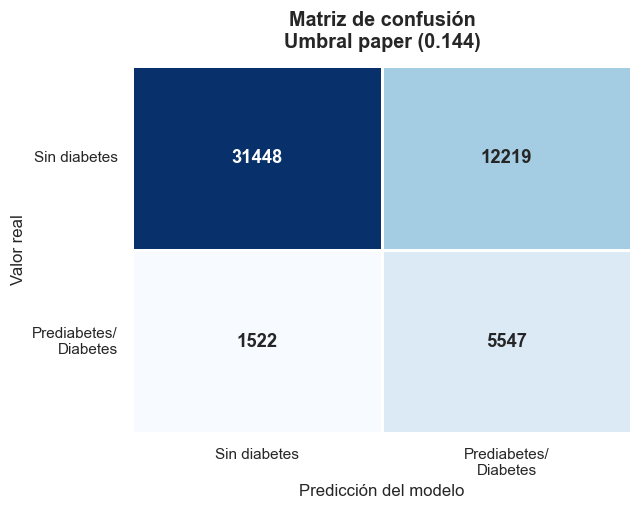

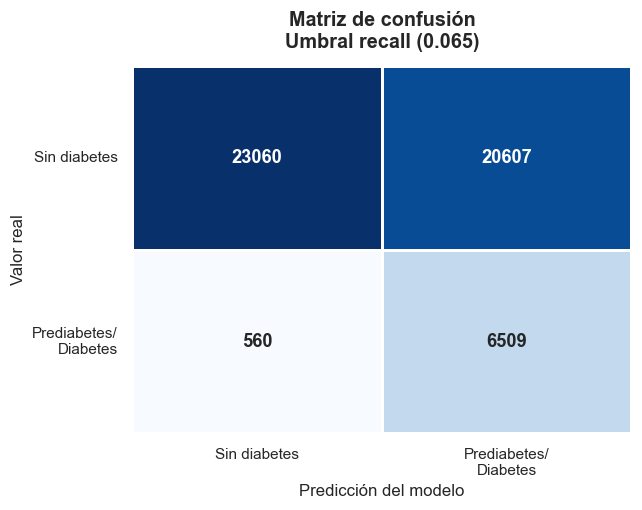

In [364]:
# ============================================================
# 16.7.1 Matrices de confusión comparativas
# ============================================================

confusion_results = {
    f"Umbral paper ({threshold_paper:.3f})": results_paper_threshold["Matriz Confusión"],
    f"Umbral recall ({threshold_recall_adapted:.3f})": results_recall_threshold["Matriz Confusión"]
}

for title, cm in confusion_results.items():

    plt.figure(figsize=(6, 4.8))

    ax = sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        cbar=False,
        linewidths=0.7,
        linecolor="white",
        annot_kws={"size": 12, "weight": "bold"}
    )

    plt.title(f"Matriz de confusión\n{title}", fontsize=13, fontweight="bold", pad=12)
    plt.xlabel("Predicción del modelo", fontsize=11)
    plt.ylabel("Valor real", fontsize=11)

    plt.xticks(
        [0.5, 1.5],
        ["Sin diabetes", "Prediabetes/\nDiabetes"],
        rotation=0
    )

    plt.yticks(
        [0.5, 1.5],
        ["Sin diabetes", "Prediabetes/\nDiabetes"],
        rotation=0
    )

    plt.tight_layout()
    plt.show()

Las matrices de confusión evidencian el efecto de modificar el umbral de decisión del modelo XGBoost-Focal. Con el umbral fiel al paper (0.144), el modelo clasifica correctamente 31.448 casos sin diabetes y 5.547 casos con prediabetes/diabetes. Además, presenta 1.522 falsos negativos, es decir, casos positivos que el modelo no logra detectar. Bajo este escenario, el modelo mantiene un equilibrio más conservador entre la identificación de positivos y el control de falsos positivos.

Al reducir el umbral a 0.065, adaptado al objetivo del proyecto de priorizar el recall, el modelo aumenta la detección de casos positivos: los verdaderos positivos pasan de 5.547 a 6.509, mientras que los falsos negativos disminuyen de 1.522 a 560. Esto significa que el modelo deja escapar menos personas con posible prediabetes o diabetes, lo cual es importante en un contexto preventivo de salud pública.

Sin embargo, esta mejora en sensibilidad tiene un costo: los falsos positivos aumentan de 12.219 a 20.607. Es decir, más personas sin diabetes son clasificadas como posibles casos positivos. Aun así, para este proyecto, dicho comportamiento puede justificarse porque el objetivo principal no es descartar casos con máxima precisión, sino identificar oportunamente la mayor cantidad posible de personas en riesgo.


In [366]:
# ============================================================
# 16.7.4 Porcentaje de clasificados como positivos por umbral
# ============================================================

positive_rate_paper = float((prob_test_cal_paper >= threshold_paper).mean())
positive_rate_recall = float((prob_test_cal_paper >= threshold_recall_adapted).mean())

positive_rate_summary = pd.DataFrame({
    "Escenario": [
        "Umbral fiel al paper",
        "Umbral adaptado para recall"
    ],
    "Threshold": [
        threshold_paper,
        threshold_recall_adapted
    ],
    "Porcentaje clasificado como positivo": [
        positive_rate_paper,
        positive_rate_recall
    ]
})

positive_rate_summary_display = positive_rate_summary.copy()
positive_rate_summary_display["Threshold"] = positive_rate_summary_display["Threshold"].round(6)
positive_rate_summary_display["Porcentaje clasificado como positivo"] = (
    positive_rate_summary_display["Porcentaje clasificado como positivo"] * 100
).round(2)

positive_rate_summary_display = positive_rate_summary_display.rename(
    columns={"Porcentaje clasificado como positivo": "Porcentaje clasificado como positivo (%)"}
)

display(positive_rate_summary_display)

,Escenario,Threshold,Porcentaje clasificado como positivo (%)
0,Umbral fiel al paper,0.144038,35.02
1,Umbral adaptado para recall,0.065000,53.45


La tabla confirma el efecto directo de reducir el umbral de decisión. Con el umbral fiel al paper, equivalente a 0.144, el modelo clasifica como positivos al 35.02% de los registros del conjunto de prueba. En cambio, al utilizar el umbral adaptado para recall, equivalente a 0.065, el porcentaje de clasificados como positivos aumenta hasta 53.45%.

Este resultado es coherente con lo observado en las matrices de confusión: al disminuir el umbral, el modelo se vuelve más sensible para detectar posibles casos de prediabetes o diabetes. Por esta razón, aumenta la cantidad de personas identificadas como positivas, lo que permite reducir los falsos negativos y captar más casos de riesgo.

Sin embargo, este ajuste también implica que una mayor proporción de personas sin diabetes puede ser clasificada como positiva. Por tanto, el umbral adaptado debe interpretarse como una decisión orientada a la prevención y detección temprana, no como una estrategia para maximizar la precisión general del modelo.

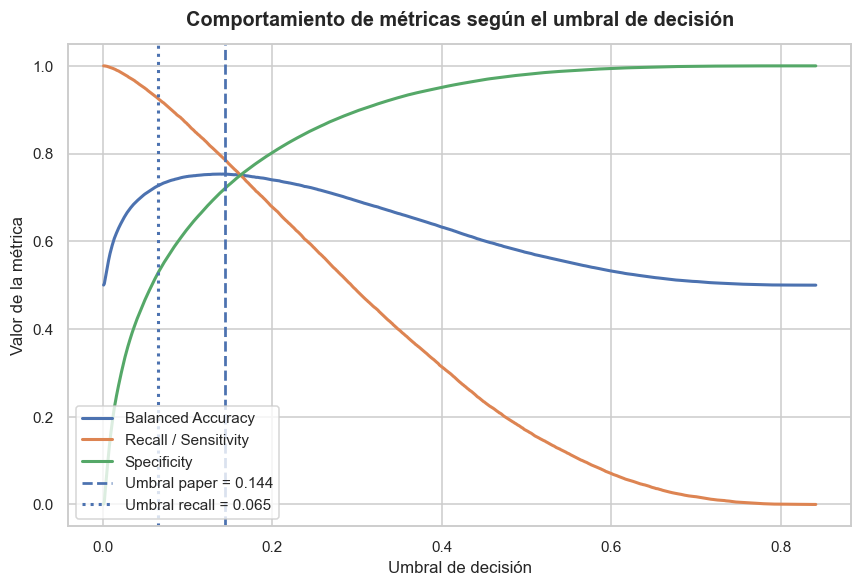

In [367]:
# ============================================================
# 16.7.5 Curva de búsqueda de umbral en entrenamiento OOF
# ============================================================

plt.figure(figsize=(8, 5.5))

plt.plot(
    threshold_search_df["Threshold"],
    threshold_search_df["Balanced Accuracy"],
    linewidth=2,
    label="Balanced Accuracy"
)

plt.plot(
    threshold_search_df["Threshold"],
    threshold_search_df["Recall / Sensitivity"],
    linewidth=2,
    label="Recall / Sensitivity"
)

plt.plot(
    threshold_search_df["Threshold"],
    threshold_search_df["Specificity"],
    linewidth=2,
    label="Specificity"
)

plt.axvline(
    threshold_paper,
    linestyle="--",
    linewidth=1.8,
    label=f"Umbral paper = {threshold_paper:.3f}"
)

plt.axvline(
    threshold_recall_adapted,
    linestyle=":",
    linewidth=2,
    label=f"Umbral recall = {threshold_recall_adapted:.3f}"
)

plt.title(
    "Comportamiento de métricas según el umbral de decisión",
    fontsize=13,
    fontweight="bold",
    pad=12
)

plt.xlabel("Umbral de decisión")
plt.ylabel("Valor de la métrica")
plt.legend(loc="best")
plt.tight_layout()
plt.show()

La gráfica muestra el comportamiento de las métricas del modelo cuando se modifica el umbral de decisión. Se observa que el recall o sensibilidad disminuye progresivamente a medida que aumenta el umbral, mientras que la especificidad aumenta. Esto refleja el comportamiento esperado: con umbrales bajos, el modelo clasifica más casos como positivos y logra detectar una mayor proporción de personas con prediabetes o diabetes; con umbrales altos, el modelo se vuelve más estricto y clasifica menos casos como positivos.

El umbral fiel al paper, ubicado en 0.144, se encuentra en una zona donde la especificidad es mayor y el recall empieza a disminuir. Por su parte, el umbral adaptado para recall, ubicado en 0.065, se sitúa en una región donde la sensibilidad se mantiene más alta, lo que permite reducir los falsos negativos y mejorar la detección de casos positivos.

La curva de balanced accuracy muestra que el desempeño global balanceado se mantiene relativamente alto en el rango donde se encuentran ambos umbrales. Sin embargo, la elección final depende del objetivo del proyecto. Dado que este trabajo prioriza la identificación temprana de posibles casos de diabetes o prediabetes, el umbral de 0.065 resulta más adecuado, aunque implique una disminución en la especificidad y un aumento de falsos positivos.

In [374]:
# ============================================================
# Tabla comparativa limpia — XGBoost-Focal + Ψγ
# ============================================================

import pandas as pd
import numpy as np

# ------------------------------------------------------------
# 1. Función auxiliar para extraer el Recall OOF según umbral
# ------------------------------------------------------------

def get_oof_recall_for_threshold(threshold_value, threshold_search_df):
    """
    Busca en threshold_search_df el umbral más cercano al threshold indicado
    y retorna el Recall / Sensitivity asociado en validación OOF.
    """
    idx = (threshold_search_df["Threshold"] - threshold_value).abs().idxmin()
    return float(threshold_search_df.loc[idx, "Recall / Sensitivity"])


# ------------------------------------------------------------
# 2. Copiar tabla de resultados finales por umbral
# ------------------------------------------------------------

tabla_xgboost_focal_comparativa = summary_thresholds.copy()

# ------------------------------------------------------------
# 3. Agregar CV Recall / OOF desde threshold_search_df
# ------------------------------------------------------------

tabla_xgboost_focal_comparativa["CV Recall / OOF"] = (
    tabla_xgboost_focal_comparativa["Threshold"]
    .apply(lambda t: get_oof_recall_for_threshold(t, threshold_search_df))
)

# ------------------------------------------------------------
# 4. Agregar columnas de identificación del modelo
# ------------------------------------------------------------

tabla_xgboost_focal_comparativa["Modelo"] = "XGBoost-Focal"

tabla_xgboost_focal_comparativa["Metodo"] = tabla_xgboost_focal_comparativa["Modelo"].apply(
    lambda x: np.nan
)

tabla_xgboost_focal_comparativa.loc[
    tabla_xgboost_focal_comparativa["Threshold"].round(6) == round(threshold_paper, 6),
    "Metodo"
] = "Umbral paper"

tabla_xgboost_focal_comparativa.loc[
    tabla_xgboost_focal_comparativa["Threshold"].round(6) == round(threshold_recall_adapted, 6),
    "Metodo"
] = "Umbral recall"

tabla_xgboost_focal_comparativa["Balanceo"] = "focal_loss"

# ------------------------------------------------------------
# 5. Mejores parámetros del modelo
# ------------------------------------------------------------

best_params_xgboost_focal = best_params_paper.copy()

best_params_xgboost_focal["gamma"] = best_gamma_paper
best_params_xgboost_focal["num_boost_round"] = best_num_boost_round_paper

tabla_xgboost_focal_comparativa["Best Params"] = [
    best_params_xgboost_focal
    for _ in range(len(tabla_xgboost_focal_comparativa))
]

# ------------------------------------------------------------
# 6. Agregar número de evaluaciones
# ------------------------------------------------------------

tabla_xgboost_focal_comparativa["Evaluaciones"] = len(gamma_results_df_paper)

# ------------------------------------------------------------
# 7. Renombrar columnas para que coincidan con la tabla general
# ------------------------------------------------------------

tabla_xgboost_focal_comparativa = tabla_xgboost_focal_comparativa.rename(columns={
    "Accuracy": "Test Accuracy",
    "Precision": "Test Precision",
    "Recall / Sensitivity": "Test Recall",
    "F1": "Test F1",
    "AUROC": "Test AUC",
    "Tiempo final (s)": "Tiempo (s)"
})

# ------------------------------------------------------------
# 8. Seleccionar únicamente las columnas necesarias
# ------------------------------------------------------------

tabla_xgboost_focal_comparativa = tabla_xgboost_focal_comparativa[
    [
        "Modelo",
        "Metodo",
        "Balanceo",
        "CV Recall / OOF",
        "Test Accuracy",
        "Test Precision",
        "Test Recall",
        "Test F1",
        "Test AUC",
        "Tiempo (s)",
        "Evaluaciones",
        "Best Params"
    ]
]

# ------------------------------------------------------------
# 9. Redondear columnas numéricas
# ------------------------------------------------------------

cols_numericas = tabla_xgboost_focal_comparativa.select_dtypes(
    include=["float", "int"]
).columns

tabla_xgboost_focal_comparativa[cols_numericas] = (
    tabla_xgboost_focal_comparativa[cols_numericas].round(4)
)

# ------------------------------------------------------------
# 10. Mostrar tabla con apariencia tipo DataFrame
# ------------------------------------------------------------

display(tabla_xgboost_focal_comparativa)

# ------------------------------------------------------------
# 11. Guardar resultados
# ------------------------------------------------------------

tabla_xgboost_focal_comparativa.to_csv(
    "tabla_comparativa_xgboost_focal_limpia.csv",
    index=False,
    encoding="utf-8-sig"
)

print("Archivos guardados correctamente:")
print("- tabla_comparativa_xgboost_focal_limpia.csv")

,Modelo,Metodo,Balanceo,CV Recall,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC,Tiempo (s),Evaluaciones,Best Params
0,XGBoost-Focal,Umbral paper,focal_loss,0.7984,0.7292,0.3122,0.7847,0.4467,0.8279,30.8015,11,"{'eta': 0.05289102326492972, 'max_depth': 5, '..."
1,XGBoost-Focal,Umbral recall,focal_loss,0.9352,0.5828,0.2400,0.9208,0.3808,0.8279,30.8015,11,"{'eta': 0.05289102326492972, 'max_depth': 5, '..."


Archivos guardados correctamente:
- tabla_comparativa_xgboost_focal_limpia.csv


La tabla resume los resultados finales del modelo XGBoost-Focal calibrado mediante Ψγ, evaluado bajo dos escenarios de decisión: el umbral fiel al paper y el umbral adaptado para priorizar recall. Se conserva únicamente la métrica CV Recall / OOF, ya que las demás métricas de validación cruzada no fueron reportadas bajo el mismo esquema comparativo.

El umbral paper presenta un mejor equilibrio general, con mayor accuracy, precision y F1 en comparación con el umbral adaptado. Sin embargo, el umbral recall incrementa la sensibilidad del modelo, pasando de un Test Recall de 0.7847 a 0.9208. Esto significa que el modelo identifica una mayor proporción de casos positivos de prediabetes o diabetes.

No obstante, esta mejora en recall implica una disminución en accuracy, precision y F1, debido al aumento de falsos positivos. Por tanto, el umbral adaptado resulta más coherente con el objetivo del proyecto, orientado a priorizar la detección temprana de posibles casos positivos.

## **14. Referencias bibliograficas**



1. Centers for Disease Control and Prevention. (2024). *About diabetes*. U.S. Department of Health & Human Services. https://www.cdc.gov/diabetes/about/index.html

2. Centers for Disease Control and Prevention. (2024). *Behavioral Risk Factor Surveillance System (BRFSS)*. U.S. Department of Health & Human Services. https://www.cdc.gov/brfss/index.html

3. International Diabetes Federation. (2024). *IDF Diabetes Atlas – United States of America*. https://diabetesatlas.org/es/data-by-location/country/united-states-of-america/

4. MedlinePlus. (2024). *Diabetes*. Biblioteca Nacional de Medicina de EE. UU. https://medlineplus.gov/spanish/diabetes.html

5. American Diabetes Association. (2024). *Standards of care in diabetes*. https://diabetes.org/

6. Johnston, H., Nair, N., & Du, D. (2025). *Estimating Calibrated Risks Using Focal Loss and Gradient-Boosted Trees for Clinical Risk Prediction*. Electronics, 14(9), 1838. https://doi.org/10.3390/electronics14091838